# EDA

## Importing libraries 

In [ ]:
import pandas as pd
import numpy as np
from matplotlib.pyplot import figure
from datetime import timedelta
import matplotlib.pyplot as plt
import seaborn as sns
from enum import Enum
import math

from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf
from tensorflow.keras.models import Sequential, save_model, Model, load_model
from tensorflow.keras.layers import Embedding, Input, Conv2D, LSTM, Dropout, Dense, Conv1D, MaxPooling2D, MaxPooling1D, Flatten, concatenate, BatchNormalization, GRU
from tensorflow.keras.layers import TimeDistributed
from tensorflow.keras.utils import plot_model
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.losses import MeanSquaredError
from tensorflow.keras.metrics import RootMeanSquaredError, MeanAbsoluteError 
from tensorflow import keras
from kerastuner import BayesianOptimization

INFO:tensorflow:Enabling eager execution
INFO:tensorflow:Enabling v2 tensorshape
INFO:tensorflow:Enabling resource variables
INFO:tensorflow:Enabling tensor equality
INFO:tensorflow:Enabling control flow v2


In [ ]:
pd.options.display.float_format = '${:,.6f}'.format
stock_list = ['FPT', 'MSN', 'PNJ', 'VIC']

for stock in stock_list:
     globals()[stock] = pd.read_csv(stock+'.csv')
        
company_list = [FPT, MSN, PNJ, VIC]
    
data = pd.concat(company_list, axis=0)
data['Date/Time'] = pd.to_datetime(data['Date/Time'])

In [ ]:
def getStartAndEndStockTime(df):
    print("Start Time: ", df['Date/Time'].min())
    print("End Time: ", df['Date/Time'].max())

### FPT

In [ ]:
getStartAndEndStockTime(FPT)

Start Time:  1/10/2019 10:05
End Time:  9/9/2020 9:57


In [ ]:
FPT.head()

,Ticker,Date/Time,Open,High,Low,Close,Volume,Open Interest
0,FPT,12/25/2018 9:15,$30.890000,$30.890000,$30.890000,$30.890000,35410,0
1,FPT,12/25/2018 9:16,$30.810000,$30.810000,$30.810000,$30.810000,190,0
2,FPT,12/25/2018 9:17,$30.740000,$30.810000,$30.740000,$30.740000,1120,0
3,FPT,12/25/2018 9:18,$30.740000,$30.740000,$30.740000,$30.740000,2120,0
4,FPT,12/25/2018 9:19,$30.740000,$30.740000,$30.740000,$30.740000,22500,0


In [ ]:
FPT.tail()

,Ticker,Date/Time,Open,High,Low,Close,Volume,Open Interest
97401,FPT,12/22/2020 14:24,$58.200000,$58.200000,$58.200000,$58.200000,27470,0
97402,FPT,12/22/2020 14:25,$58.200000,$58.200000,$58.200000,$58.200000,14820,0
97403,FPT,12/22/2020 14:26,$58.200000,$58.200000,$58.200000,$58.200000,500,0
97404,FPT,12/22/2020 14:29,$58.100000,$58.100000,$58.100000,$58.100000,2500,0
97405,FPT,12/22/2020 14:46,$58.100000,$58.100000,$58.100000,$58.100000,11170,0


In [ ]:
FPT.describe()

,Open,High,Low,Close,Volume,Open Interest
count,"$97,406.000000","$97,406.000000","$97,406.000000","$97,406.000000","$97,406.000000","$97,406.000000"
mean,$45.071630,$45.090138,$45.051430,$45.071631,"$8,044.172638",$0.000000
std,$6.359803,$6.364950,$6.354245,$6.359799,"$17,532.025731",$0.000000
min,$30.250000,$30.250000,$30.220000,$30.250000,$10.000000,$0.000000
25%,$39.740000,$39.740000,$39.700000,$39.740000,$750.000000,$0.000000
50%,$46.950000,$46.950000,$46.950000,$46.950000,"$2,960.000000",$0.000000
75%,$49.200000,$49.250000,$49.170000,$49.200000,"$8,960.000000",$0.000000
max,$58.400000,$58.500000,$58.400000,$58.400000,"$1,255,930.000000",$0.000000


In [ ]:
FPT.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 97406 entries, 0 to 97405
Data columns (total 8 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Ticker         97406 non-null  object 
 1   Date/Time      97406 non-null  object 
 2   Open           97406 non-null  float64
 3   High           97406 non-null  float64
 4   Low            97406 non-null  float64
 5   Close          97406 non-null  float64
 6   Volume         97406 non-null  int64  
 7   Open Interest  97406 non-null  int64  
dtypes: float64(4), int64(2), object(2)
memory usage: 5.9+ MB


### MSN

In [ ]:
getStartAndEndStockTime(MSN)

Start Time:  1/10/2018 10:00
End Time:  9/9/2020 9:59


In [ ]:
MSN.head()

,Ticker,Date/Time,Open,High,Low,Close,Volume,Open Interest
0,MSN,12/25/2017 9:15,$73.100000,$73.100000,$73.100000,$73.100000,4210,0
1,MSN,12/25/2017 9:16,$73.000000,$73.000000,$73.000000,$73.000000,5000,0
2,MSN,12/25/2017 9:18,$73.500000,$73.500000,$73.500000,$73.500000,210,0
3,MSN,12/25/2017 9:20,$73.200000,$73.500000,$73.100000,$73.100000,2050,0
4,MSN,12/25/2017 9:21,$73.000000,$73.000000,$73.000000,$73.000000,1380,0


In [ ]:
MSN.tail()

,Ticker,Date/Time,Open,High,Low,Close,Volume,Open Interest
135349,MSN,12/22/2020 14:23,$82.800000,$82.800000,$82.800000,$82.800000,700,0
135350,MSN,12/22/2020 14:24,$82.700000,$82.800000,$82.700000,$82.800000,4660,0
135351,MSN,12/22/2020 14:25,$82.800000,$82.800000,$82.800000,$82.800000,50,0
135352,MSN,12/22/2020 14:27,$82.800000,$82.800000,$82.800000,$82.800000,300,0
135353,MSN,12/22/2020 14:46,$82.800000,$82.800000,$82.800000,$82.800000,200,0


In [ ]:
MSN.describe()

,Open,High,Low,Close,Volume,Open Interest
count,"$135,354.000000","$135,354.000000","$135,354.000000","$135,354.000000","$135,354.000000","$135,354.000000"
mean,$74.878809,$74.931668,$74.834625,$74.880759,"$5,683.577730",$0.000000
std,$15.418074,$15.426954,$15.412677,$15.418857,"$27,985.133386",$0.000000
min,$46.500000,$46.500000,$46.400000,$46.400000,$10.000000,$0.000000
25%,$57.900000,$57.900000,$57.800000,$57.800000,$500.000000,$0.000000
50%,$79.100000,$79.200000,$79.100000,$79.100000,"$2,000.000000",$0.000000
75%,$86.000000,$86.100000,$86.000000,$86.000000,"$5,560.000000",$0.000000
max,$117.800000,$118.000000,$117.700000,$118.000000,"$3,300,680.000000",$0.000000


In [ ]:
MSN.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 135354 entries, 0 to 135353
Data columns (total 8 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Ticker         135354 non-null  object 
 1   Date/Time      135354 non-null  object 
 2   Open           135354 non-null  float64
 3   High           135354 non-null  float64
 4   Low            135354 non-null  float64
 5   Close          135354 non-null  float64
 6   Volume         135354 non-null  int64  
 7   Open Interest  135354 non-null  int64  
dtypes: float64(4), int64(2), object(2)
memory usage: 8.3+ MB


### PNJ

In [ ]:
getStartAndEndStockTime(PNJ)

Start Time:  1/10/2019 10:02
End Time:  9/9/2020 9:59


In [ ]:
PNJ.head()

,Ticker,Date/Time,Open,High,Low,Close,Volume,Open Interest
0,PNJ,2/28/2018 9:15,$78.140000,$78.990000,$78.140000,$78.990000,270,0
1,PNJ,2/28/2018 9:16,$78.940000,$78.940000,$78.940000,$78.940000,10,0
2,PNJ,2/28/2018 9:19,$78.140000,$78.140000,$78.140000,$78.140000,283,0
3,PNJ,2/28/2018 9:20,$78.140000,$78.140000,$78.140000,$78.140000,480,0
4,PNJ,2/28/2018 9:21,$78.140000,$78.140000,$78.140000,$78.140000,146,0


In [ ]:
PNJ.tail()

,Ticker,Date/Time,Open,High,Low,Close,Volume,Open Interest
125304,PNJ,12/22/2020 14:22,$78.200000,$78.200000,$78.200000,$78.200000,5000,0
125305,PNJ,12/22/2020 14:23,$78.200000,$78.200000,$78.200000,$78.200000,1700,0
125306,PNJ,12/22/2020 14:24,$78.200000,$78.200000,$78.200000,$78.200000,870,0
125307,PNJ,12/22/2020 14:25,$78.100000,$78.100000,$78.100000,$78.100000,13000,0
125308,PNJ,12/22/2020 14:46,$78.300000,$78.300000,$78.300000,$78.300000,1500,0


In [ ]:
PNJ.describe()

,Open,High,Low,Close,Volume,Open Interest
count,"$125,309.000000","$125,309.000000","$125,309.000000","$125,309.000000","$125,309.000000","$125,309.000000"
mean,$72.182052,$72.372590,$72.042287,$72.179371,"$3,031.830451",$0.000000
std,$9.900263,$9.995786,$9.830847,$9.899401,"$7,248.952968",$0.000000
min,$44.430000,$44.530000,$44.040000,$44.140000,$1.000000,$0.000000
25%,$64.600000,$64.700000,$64.570000,$64.600000,$220.000000,$0.000000
50%,$72.800000,$73.010000,$72.640000,$72.830000,"$1,000.000000",$0.000000
75%,$80.160000,$80.350000,$80.060000,$80.160000,"$3,130.000000",$0.000000
max,$100.160000,$100.160000,$100.160000,$100.160000,"$580,730.000000",$0.000000


In [ ]:
PNJ.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 125309 entries, 0 to 125308
Data columns (total 8 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Ticker         125309 non-null  object 
 1   Date/Time      125309 non-null  object 
 2   Open           125309 non-null  float64
 3   High           125309 non-null  float64
 4   Low            125309 non-null  float64
 5   Close          125309 non-null  float64
 6   Volume         125309 non-null  int64  
 7   Open Interest  125309 non-null  int64  
dtypes: float64(4), int64(2), object(2)
memory usage: 7.6+ MB


### VIC

In [ ]:
getStartAndEndStockTime(VIC)

Start Time:  1/10/2019 10:11
End Time:  9/9/2020 9:59


In [ ]:
VIC.head()

,Ticker,Date/Time,Open,High,Low,Close,Volume,Open Interest
0,VIC,10/17/2018 9:39,$98.500000,$98.500000,$98.500000,$98.500000,390,0
1,VIC,10/17/2018 9:40,$98.500000,$98.500000,$98.500000,$98.500000,760,0
2,VIC,10/17/2018 9:41,$98.600000,$98.600000,$98.600000,$98.600000,2060,0
3,VIC,10/17/2018 9:42,$98.600000,$98.600000,$98.600000,$98.600000,5540,0
4,VIC,10/17/2018 9:43,$98.600000,$98.700000,$98.600000,$98.700000,760,0


In [ ]:
VIC.tail()

,Ticker,Date/Time,Open,High,Low,Close,Volume,Open Interest
101261,VIC,12/22/2020 14:22,$105.800000,$105.800000,$105.700000,$105.700000,1870,0
101262,VIC,12/22/2020 14:23,$105.700000,$105.700000,$105.700000,$105.700000,2510,0
101263,VIC,12/22/2020 14:24,$105.700000,$105.700000,$105.700000,$105.700000,3620,0
101264,VIC,12/22/2020 14:25,$105.700000,$105.700000,$105.700000,$105.700000,100,0
101265,VIC,12/22/2020 14:46,$105.700000,$105.700000,$105.700000,$105.700000,90,0


In [ ]:
VIC.describe()

,Open,High,Low,Close,Volume,Open Interest
count,"$101,266.000000","$101,266.000000","$101,266.000000","$101,266.000000","$101,266.000000","$101,266.000000"
mean,$105.376460,$105.418519,$105.334147,$105.378791,"$3,182.639583",$0.000000
std,$11.543158,$11.535584,$11.552338,$11.545054,"$14,698.144776",$0.000000
min,$68.000000,$68.000000,$68.000000,$68.000000,$10.000000,$0.000000
25%,$95.400000,$95.400000,$95.300000,$95.400000,$230.000000,$0.000000
50%,$105.300000,$105.300000,$105.200000,$105.300000,"$1,020.000000",$0.000000
75%,$115.800000,$115.900000,$115.800000,$115.800000,"$3,000.000000",$0.000000
max,$126.100000,$126.500000,$126.100000,$126.500000,"$1,468,390.000000",$0.000000


In [ ]:
VIC.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101266 entries, 0 to 101265
Data columns (total 8 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Ticker         101266 non-null  object 
 1   Date/Time      101266 non-null  object 
 2   Open           101266 non-null  float64
 3   High           101266 non-null  float64
 4   Low            101266 non-null  float64
 5   Close          101266 non-null  float64
 6   Volume         101266 non-null  int64  
 7   Open Interest  101266 non-null  int64  
dtypes: float64(4), int64(2), object(2)
memory usage: 6.2+ MB


### Closing Price

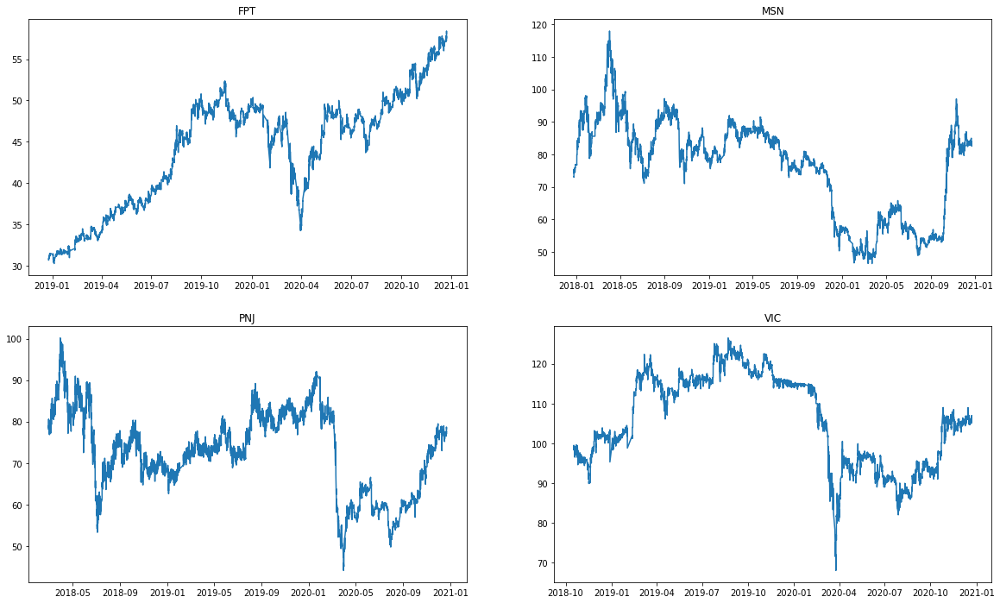

In [ ]:
plt.figure(figsize=(20,12))
for i, company in enumerate(stock_list,1):
    plt.subplot(2, 2, i)
    df=data[data['Ticker']==company]
    plt.plot(df['Date/Time'],df['Close'])
    plt.title(company)

### Volume

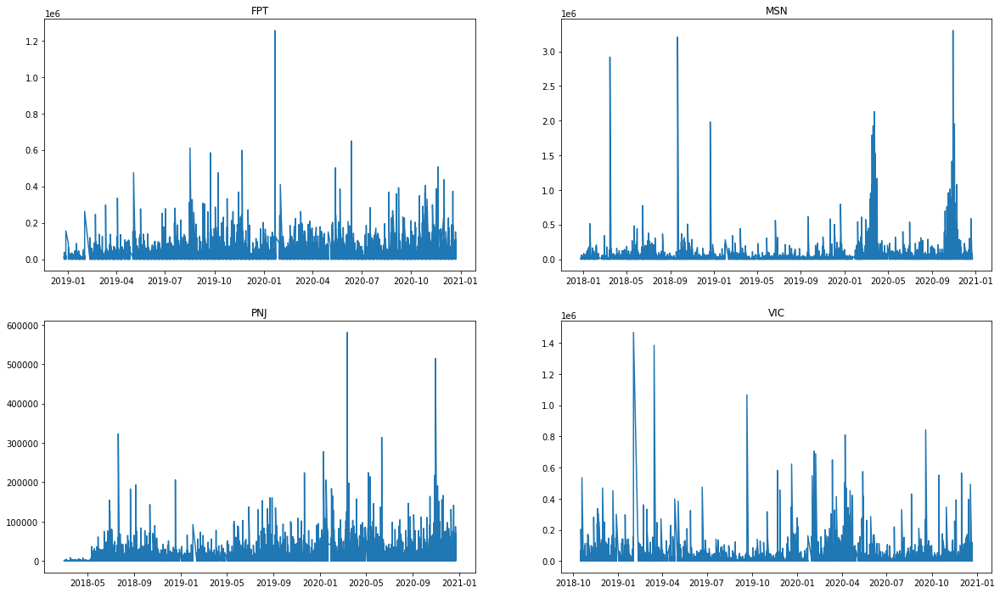

In [ ]:
plt.figure(figsize=(20,12))
for i, company in enumerate(stock_list,1):
    plt.subplot(2, 2, i)
    df=data[data['Ticker']==company]
    plt.plot(df['Date/Time'],df['Volume'])
    plt.title(company)

## Preprocess Data

In [ ]:
def preprocess(df, timeDelta):
    """
    Resamples the input DataFrame `df` at regular intervals specified by `timeDelta`,
    and returns a new DataFrame with aggregated values for each resampled time interval.

    Args:
        df (pandas.DataFrame): A pandas DataFrame containing financial data with a "Date/Time" column.
        timeDelta (str): A string indicating the frequency at which the data should be resampled.
            Valid frequency strings include "1H", "1D", etc.

    Returns:
        pandas.DataFrame: A new DataFrame with resampled and aggregated financial data.
    """
    tmp_df = df.copy()
    tmp_df['DateIdx'] = pd.to_datetime(tmp_df['Date/Time'], format='%m/%d/%Y %H:%M',errors='coerce')
    tmp_df.set_index(pd.DatetimeIndex(tmp_df['DateIdx']), inplace=True)
    
    agg_funcs = {
        "Open": "first",
        "High": "max",
        "Low": "min",
        "Close": "last",
        "Volume": 'sum',
    }
    tmp_df = tmp_df.resample(timeDelta).agg(agg_funcs)
    tmp_df = tmp_df.dropna()
    tmp_df['Date/Time'] = pd.to_datetime(tmp_df.index, format='%m/%d/%Y %H:%M',errors='coerce')
    return tmp_df

In [ ]:
def splitting_data(df):
    """
    This function takes a pandas DataFrame df as input and splits it into train data (including validation data) and test data using a split ratio of 0.8. The input DataFrame must have a column named 'Date/Time', which will be set as the index of the DataFrame for the splitting.

    Returns three DataFrames - df_train, df_val and df_test, representing the training data (80% of the train data), validation data (20% of the train data) and test data (20% of the entire dataset), respectively.

    Args:
    df (pandas.DataFrame): A pandas DataFrame containing the dataset to be split.

    Returns:
    df_train, df_val, df_test (pandas.DataFrame): train data, validation data and test data, respectively.
    """
    split_ratio = 0.8
    df = df.set_index('Date/Time')
    len_data = df.shape[0]
    train = df.iloc[:int(len_data*split_ratio),]
    df_test = df.iloc[int(len_data*split_ratio):,]

    i = int(len(train) * 0.8)
    df_train = train[:i]
    df_val = train[i:]
    return df_train, df_val, df_test

## Feature engineering

### Normalize data

In [ ]:
def normalize(df):
    """
    This function takes a pandas DataFrame df as input and normalizes the numerical columns in the DataFrame, except for the 'Date/Time' column.

    Returns a new normalized DataFrame with the same columns and index as the input DataFrame.

    Args:
    df (pandas.DataFrame): A pandas DataFrame to be normalized.

    Returns:
    pandas.DataFrame: A new DataFrame with the same columns and index as the input DataFrame, but with the numerical columns normalized.
    """
    normalized_df = df.copy()
    to_normalize = ['Open', 'High', 'Low', 'Close', 'Volume']
    mean_df = df[to_normalize].mean()
    std_df = df[to_normalize].std()
    normalized_df[to_normalize] = (normalized_df[to_normalize]-mean_df)/std_df
    return normalized_df

### Some helper function

In [ ]:
# For pos-possess to scale back
def get_mean_and_std(df):
    """
    This function takes a pandas DataFrame df as input and calculates the mean and standard deviation of the 'Close' column of the DataFrame.

    Returns two values - mean and standard deviation - as a tuple.

    Args:
    df (pandas.DataFrame): A pandas DataFrame containing the 'Close' column for which mean and standard deviation are to be calculated.

    Returns:
    mean (float): Mean of the 'Close' column of the input DataFrame.
    std (float): Standard deviation of the input DataFrame.
    """
    mean = df['Close'].mean()
    std = df['Close'].std()
    return mean, std

# Function to scale back predictions
def scale_back(predictions, mean, std):
    """
    This function takes a list of predictions, along with the mean and standard deviation of the original dataset, and scales back the predictions to their original scale.

    Returns a list of unscaled predictions.

    Args:
    predictions (List[float]): A list of predicted values that need to be unscaled.
    mean (float): Mean of the original dataset.
    std (float): Standard deviation of the original dataset.

    Returns:
    List[float]: A list of unscaled predictions.
    """
    predictions = [prediction[0] for prediction in predictions] # unpack array

    # scale back
    predictions = [prediction * std + mean for prediction in predictions]
    
    return predictions

### Sliding Window

In [ ]:
past = 1
future = 1
features = 5
len_y = 1

In [ ]:
def get_data(train,time_step=past,num_predict=future):
    """
    This function prepares the time series data in `train` for machine learning modeling. It returns three arrays - `x_train` as input data, `y_train` as corresponding target output data, and `date_time` as corresponding timestamps of input data. `time_step` (default 1) specifies the number of past time steps to use as input, and `num_predict` (default 1) specifies the number of future time steps to predict.

    Args:
        train (pandas.DataFrame): A pandas DataFrame containing the time series data for training the machine learning model.
        time_step (int): The number of past time steps to use as input for the model. Default value is 1.
        num_predict (int): The number of future time steps to predict. Default value is 1.

    Returns:
        x_train, y_train, date_time(numpy.ndarray): x_train, y_train and date_time. 
        x_train contains the input data for the model, y_train contains the corresponding target output data, and date_time contains the corresponding timestamps of the input data.
    """
    x_train= list()
    y_train = list()
    date_time = list()
    for i in range(0,len(train) - time_step - num_predict):
        x_train.append(train[i:i+time_step])
        y_train.append(train[i+time_step:i+time_step+num_predict]['Close'])
        date_time.append(train[i:i+time_step].index)
    return np.asarray(x_train), np.asarray(y_train), np.asarray(date_time)

## Data Processor Class 

In [ ]:
class DataProcessor:
    """
    A class to preprocess, split, normalize, and visualize stock data.
    
    Attributes:
        stock_name (str): the name of the stock.
        df (pandas.DataFrame): the stock data to be processed.
        timeDelta (str): time interval of the stock data.
        train (list): the processed training data.
        val (list): the processed validation data.
        test (list): the processed test data.
    """
    def __init__(self, stock_name, df, timeDelta):
        """
        Initializes the DataProcessor object.
        
        Args:
            stock_name (str): the name of the stock.
            df (pandas.DataFrame): the stock data to be processed.
            timeDelta (str): time interval of the stock data.
        """
        self.stock_name = stock_name
        self.df = df
        self.timeDelta = timeDelta
        self.train = []
        self.val = []
        self.test = []
    
    def get_preprocessed_df(self):
        return preprocess(self.df, self.timeDelta)
    
    def get_plitting_df(self):
        return splitting_data(self.get_preprocessed_df())
    
    def get_normalized_df(self):
        train, val, test = self.get_plitting_df()
        train_normalized = normalize(train)
        val_normalized = normalize(val)
        test_normalized = normalize(test)
        return train_normalized, val_normalized, test_normalized
    
    def get_train_val_test_df(self):
        """
        Obtains the training (including validation), validation, and test data as input-output pairs 
        in the form of numpy arrays.
        """
        train, val, test = self.get_normalized_df()
        self.train.append(get_data(train))
        self.val.append(get_data(val))
        self.test.append(get_data(test))
    
    def visualize_train_val_test_df(self):
        """
        Visualizes the training (including validation), validation, and test data.
        """
        self.get_train_val_test_df()
        fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(25, 6))
        ax1.plot(self.train[0][2], self.train[0][1], lw=2)
        ax1.set_xlabel("date", fontsize=16)
        ax1.set_ylabel("Close price", fontsize=16)
        ax1.set_title("Training data", fontsize=16)
        ax2.plot(self.val[0][2], self.val[0][1], c='orange', lw=2)
        ax2.set_xlabel("date", fontsize=16)
        ax2.set_ylabel("Close price", fontsize=16)
        ax2.set_title("Valid data", fontsize=16);
        ax3.plot(self.test[0][2], self.test[0][1], c='red', lw=2)
        ax3.set_xlabel("date", fontsize=16)
        ax3.set_ylabel("Close price", fontsize=16)
        ax3.set_title("Test data", fontsize=16);

## Build model

In [ ]:
def nn_builder(hp):
    """
    Builds and returns a neural network model based on the given hyperparameters.

    Parameters:

    hp: An instance of the HyperParameters class from the Keras Tuner library.
    Returns:

    A compiled Keras model instance.
    """
    # hp
    UNITS = hp.Int('UNITS', min_value = 16, max_value = 128, step = 16)
    ACTIVATION_1 = hp.Choice('ACTIVATION',values = ['relu','linear','tanh'])
    ACTIVATION_2 = hp.Choice('ACTIVATION',values = ['relu','linear','tanh'])
    
    # model instance
    input_layer = Input(shape=(1, 5))
    flatten_layer = Flatten()(input_layer)
    dense_layer_1 = Dense(units = UNITS, activation = ACTIVATION_1)(flatten_layer)
    dropout_layer = Dropout(rate = 0.2)(dense_layer_1)
    output_layer = Dense(1, activation='linear')(dropout_layer)
    model = Model(inputs=input_layer, outputs=output_layer)
    
    # compile
    model.compile(optimizer = keras.optimizers.Adam(),
                  loss = 'mse', metrics = ['mae'])    
    
    return model

# lstm
def lstm_builder(hp):
    """
    Builds and returns a neural network model based on the given hyperparameters.

    Parameters:

    hp: An instance of the HyperParameters class from the Keras Tuner library.
    Returns:

    A compiled Keras model instance.
    """
    # hp
    UNITS_1 = hp.Int('UNITS_1', min_value = 16, max_value = 128, step = 16)
    UNITS_2 = hp.Int('UNITS_2', min_value = 8, max_value = 64, step = 8)
    ACTIVATION = hp.Choice('ACTIVATION',values = ['relu','linear','tanh'])
    
    input_layer = Input(shape=(1, 5))

    lstm_layer = LSTM(UNITS_1, return_sequences=True)(input_layer)
    # drop_out = Dropout(0.2)(lstm_layer)
    lstm_layer_1 = LSTM(UNITS_1, return_sequences=True)(lstm_layer)

    lstm_layer_2 = LSTM(UNITS_1, return_sequences=False)(lstm_layer_1)

    # attention_layer = Attention()(drop_out_2)
    dense_layer = Dense(UNITS_2, activation=ACTIVATION)(lstm_layer_2)
    dense_layer_1 = Dense(UNITS_2, activation=ACTIVATION)(dense_layer)
    dense_layer_2 = Dense(UNITS_2, activation=ACTIVATION)(dense_layer_1)

    output_layer = Dense(1, activation='linear')(dense_layer_2)
    model = Model(inputs=input_layer, outputs=output_layer)

    # compile
    model.compile(optimizer = keras.optimizers.Adam(),
                  loss = 'mse', metrics = ['mae'])
    
    return model

# gru
def gru_builder(hp):
    """
    Builds and returns a neural network model based on the given hyperparameters.

    Parameters:

    hp: An instance of the HyperParameters class from the Keras Tuner library.
    Returns:

    A compiled Keras model instance.
    """
    # hp
    UNITS_1 = hp.Int('UNITS_1', min_value = 16, max_value = 128, step = 16)
    UNITS_2 = hp.Int('UNITS_2', min_value = 8, max_value = 64, step = 8)
    ACTIVATION = hp.Choice('ACTIVATION',values = ['relu','softmax','linear'])
    
    input_layer = Input(shape=(1, 5))
    gru_layer = GRU(UNITS_1, return_sequences = False)(input_layer)
    dense_layer = Dense(UNITS_2, activation = ACTIVATION)(gru_layer)
    dropout_layer = Dropout(rate=0.2)(dense_layer)
    output_layer = Dense(1, activation='linear')(dropout_layer)
    model = Model(inputs=input_layer, outputs=output_layer)
    
    # compile
    model.compile(optimizer = keras.optimizers.Adam(),
                  loss = 'mse', metrics = ['mae'])
    
    return model

In [ ]:
class StockPredictor:
    """
    A class for predicting stock prices using neural networks.

    Args:
        stock_name (str): The name of the stock to be predicted.
        timeDelta (str): The time interval for the stock data, such as '1d' for daily data.

    Attributes:
        PATIENCE (int): The number of epochs to wait for improvement in the validation loss before stopping training.
        Earlystopping (keras.callbacks.EarlyStopping): The early stopping callback for the models.
        SEED (int): The random seed for reproducibility.
        tuner_nn (bayesian_optimization.BayesianOptimization): The tuner for the neural network model.
        tuner_lstm (bayesian_optimization.BayesianOptimization): The tuner for the LSTM model.
        tuner_gru (bayesian_optimization.BayesianOptimization): The tuner for the GRU model.
        model_nn (None or keras.models.Model): The trained neural network model, initialized to None.
        model_lstm (None or keras.models.Model): The trained LSTM model, initialized to None.
        model_gru (None or keras.models.Model): The trained GRU model, initialized to None.
    """
    def __init__(self, stock_name, timeDelta):
        self.stock_name = stock_name
        self.timeDelta = timeDelta
        self.PATIENCE = 50
        self.Earlystopping = keras.callbacks.EarlyStopping(monitor='val_loss',
                                              min_delta = 0.001,
                                              patience=self.PATIENCE, 
                                              mode='min', 
                                              restore_best_weights=True)
        self.SEED = 121
        self.tuner_nn = BayesianOptimization(nn_builder,
                                objective = 'val_loss',
                                max_trials = 15,
                                seed = self.SEED,
                                directory = stock_name+'_'+timeDelta+'_nn',
                                overwrite = True
                                )
        self.tuner_lstm = BayesianOptimization(lstm_builder,
                                objective = 'val_loss',
                                max_trials = 15,
                                seed = self.SEED,
                                directory = stock_name+'_'+timeDelta+'_lstm',
                                overwrite = True
                                )
        self.tuner_gru = BayesianOptimization(gru_builder,
                                objective = 'val_loss',
                                max_trials = 15,
                                seed = self.SEED,
                                directory = stock_name+'_'+timeDelta+'_gru',
                                overwrite = True
                                )
        self.model_nn = None
        self.model_lstm = None
        self.model_gru = None
    def get_best_hyperparams_nn(self, train, val):
        """
        Searches for the best hyperparameters for the neural network model using Bayesian optimization.
        Args:
        - train (np_array): Training data (X_train, y_train).
        - val (np_array): Validation data (X_val, y_val).
        """
        self.tuner_nn.search(train[0][0], train[0][1], validation_data=(val[0][0], val[0][1]), 
                             epochs=5000, verbose=0, callbacks=[self.Earlystopping])
        
    def get_best_hyperparams_lstm(self, train, val):
        """
        Searches for the best hyperparameters for the neural network model using Bayesian optimization.
        Args:
        - train (np_array): Training data (X_train, y_train).
        - val (np_array): Validation data (X_val, y_val).
        """
        self.tuner_lstm.search(train[0][0], train[0][1], validation_data=(val[0][0], val[0][1]), 
                             epochs=5000, verbose=0, callbacks=[self.Earlystopping])
        
    def get_best_hyperparams_gru(self, train, val):
        """
        Searches for the best hyperparameters for the neural network model using Bayesian optimization.
        Args:
        - train (np_array): Training data (X_train, y_train).
        - val (np_array): Validation data (X_val, y_val).
        """
        self.tuner_gru.search(train[0][0], train[0][1], validation_data=(val[0][0], val[0][1]), 
                             epochs=5000, verbose=0, callbacks=[self.Earlystopping])
        
    def build_nn(self, train, val):
        """
        Build a neural network model with the best hyperparameters obtained from hyperparameter tuning using Bayesian optimization. The hyperparameters are tuned using the provided training and validation data. 
        Args:
            train: Training data inputs and targets.
            val: Validation data inputs and targets.

        """
        self.get_best_hyperparams_nn(train, val)
        besthp_nn = self.tuner_nn.get_best_hyperparameters()[0]
        self.model_nn = self.tuner_nn.hypermodel.build(besthp_nn)
        self.model_nn.summary()
        
    def build_lstm(self, train, val):
        """
        Build a neural network model with the best hyperparameters obtained from hyperparameter tuning using Bayesian optimization. The hyperparameters are tuned using the provided training and validation data. 
        Args:
            train: Training data inputs and targets.
            val: Validation data inputs and targets.

        """
        self.get_best_hyperparams_lstm(train, val)
        besthp_lstm = self.tuner_lstm.get_best_hyperparameters()[0]
        self.model_lstm = self.tuner_lstm.hypermodel.build(besthp_lstm)
        self.model_lstm.summary()
        
    def build_gru(self, train, val):
        """
        Build a neural network model with the best hyperparameters obtained from hyperparameter tuning using Bayesian optimization. The hyperparameters are tuned using the provided training and validation data. 
        Args:
            train: Training data inputs and targets.
            val: Validation data inputs and targets.

        """
        self.get_best_hyperparams_gru(train, val)
        besthp_gru = self.tuner_gru.get_best_hyperparameters()[0]
        self.model_gru = self.tuner_gru.hypermodel.build(besthp_gru)
        self.model_gru.summary()
    
    def train_nn(self, train, val):
         """
        Train the neural network using the best hyperparameters obtained by the Bayesian optimization process
        Args:
        - train (np_array): Training data and labels
        - val (np_array): Validation data and labels
        """
        nn_call_back = [
            EarlyStopping(monitor='val_loss', patience=500, verbose=1, restore_best_weights=True),
            ReduceLROnPlateau(monitor='val_loss', patience=250, verbose=1, factor=0.5),
             ModelCheckpoint(self.stock_name+'_'+self.timeDelta+'_NN.hdf5', monitor='val_loss', save_best_only= True, verbose=1)]
        # Train model - NN
        history = self.model_nn.fit(train[0][0], train[0][1], validation_data=(val[0][0], val[0][1]), 
                                    batch_size=2048, epochs=2500, callbacks=nn_call_back)

        # Plot loss
        fig, ax = plt.figure(figsize=(20,7)), plt.axes()
        ax.plot(history.history['loss'], label='Loss')
        ax.plot(history.history['val_loss'], label='Val Loss',color='green')
        ax.legend()
        plt.show()

        # Loss
        print('final loss:',history.history['loss'][-1])
        print('final val_loss:',history.history['val_loss'][-1])
        
    def train_lstm(self, train, val):
         """
        Train the neural network using the best hyperparameters obtained by the Bayesian optimization process
        Args:
        - train (np_array): Training data and labels
        - val (np_array): Validation data and labels
        """
        lstm_call_back = [
            EarlyStopping(monitor='val_loss', patience=500, verbose=1, restore_best_weights=True),
            ReduceLROnPlateau(monitor='val_loss', patience=250, verbose=1, factor=0.5),
             ModelCheckpoint(self.stock_name+'_'+self.timeDelta+'_LSTM.hdf5', monitor='val_loss', save_best_only= True, verbose=1)]
        # Train model - LSTM
        history = self.model_lstm.fit(train[0][0], train[0][1], validation_data=(val[0][0], val[0][1]), 
                                    batch_size=2048, epochs=2500, callbacks=lstm_call_back)
        
        # Plot loss
        fig, ax = plt.figure(figsize=(20,7)), plt.axes()
        ax.plot(history.history['loss'], label='Loss')
        ax.plot(history.history['val_loss'], label='Val Loss',color='green')
        ax.legend()
        plt.show()
        
        # Loss
        print('final loss:',history.history['loss'][-1])
        print('final val_loss:',history.history['val_loss'][-1])
        
    def train_gru(self, train, val):
         """
        Train the neural network using the best hyperparameters obtained by the Bayesian optimization process
        Args:
        - train (np_array): Training data and labels
        - val (np_array): Validation data and labels
        """
        gru_call_back = [
            EarlyStopping(monitor='val_loss', patience=500, verbose=1, restore_best_weights=True),
            ReduceLROnPlateau(monitor='val_loss', patience=250, verbose=1, factor=0.5),
             ModelCheckpoint(self.stock_name+'_'+self.timeDelta+'_GRU.hdf5', monitor='val_loss', save_best_only= True, verbose=1)]
        # Train model - GRU
        history = self.model_gru.fit(train[0][0], train[0][1], validation_data=(val[0][0], val[0][1]), 
                                    batch_size=2048, epochs=2500, callbacks=gru_call_back)
        # Plot loss
        fig, ax = plt.figure(figsize=(20,7)), plt.axes()
        ax.plot(history.history['loss'], label='Loss')
        ax.plot(history.history['val_loss'], label='Val Loss',color='green')
        ax.legend()
        plt.show()
        
        # Loss
        print('final loss:',history.history['loss'][-1])
        print('final val_loss:',history.history['val_loss'][-1])
    
    def evaluate_nn(self, test, mean_test, std_test):
        """
        Evaluate the performance of the trained neural network on the test set.

        Args:
        - test: Test data, including input data, output data, and time steps
        - mean_test: float, mean of the test output data used for scaling
        - std_test: float, standard deviation of the test output data used for scaling

        Returns:
        - None
        """
        predictions_nn = scale_back(self.model_nn.predict(test[0][0]), mean_test, std_test)
        fig, ax = plt.figure(figsize=(20,7)), plt.axes()
        ax.plot(test[0][2], scale_back(test[0][1], mean_test, std_test), label='Ground truth')
        ax.plot(test[0][2], predictions_nn, label='NN',color='red')
        ax.legend()
        plt.show()
        mse = MeanSquaredError()
        mae = MeanAbsoluteError()
        print('Simple NN')
        print("MSE: ", mse(scale_back(test[0][1], mean_test, std_test), predictions_nn).numpy())
        print("MAE: ", mae(scale_back(test[0][1], mean_test, std_test), predictions_nn).numpy())
        
    def evaluate_lstm(self, test, mean_test, std_test):
        """
        Evaluate the performance of the trained neural network on the test set.

        Args:
        - test: Test data, including input data, output data, and time steps
        - mean_test: float, mean of the test output data used for scaling
        - std_test: float, standard deviation of the test output data used for scaling

        Returns:
        - None
        """
        predictions_lstm = scale_back(self.model_lstm.predict(test[0][0]), mean_test, std_test)
        fig, ax = plt.figure(figsize=(20,7)), plt.axes()
        ax.plot(test[0][2], scale_back(test[0][1], mean_test, std_test), label='Ground truth')
        ax.plot(test[0][2], predictions_lstm, label='LSTM',color='green')
        ax.legend()
        plt.show()
        mse = MeanSquaredError()
        mae = MeanAbsoluteError()
        print('Simple LSTM')
        print("MSE: ", mse(scale_back(test[0][1], mean_test, std_test), predictions_lstm).numpy())
        print("MAE: ", mae(scale_back(test[0][1], mean_test, std_test), predictions_lstm).numpy())
        
    def evaluate_gru(self, test, mean_test, std_test):
        """
        Evaluate the performance of the trained neural network on the test set.

        Args:
        - test: Test data, including input data, output data, and time steps
        - mean_test: float, mean of the test output data used for scaling
        - std_test: float, standard deviation of the test output data used for scaling

        Returns:
        - None
        """
        predictions_gru = scale_back(self.model_gru.predict(test[0][0]), mean_test, std_test)
        fig, ax = plt.figure(figsize=(20,7)), plt.axes()
        ax.plot(test[0][2], scale_back(test[0][1], mean_test, std_test), label='Ground truth')
        ax.plot(test[0][2], predictions_gru, label='GRU',color='yellow')
        ax.legend()
        plt.show()
        mse = MeanSquaredError()
        mae = MeanAbsoluteError()
        print('Simple GRU')
        print("MSE: ", mse(scale_back(test[0][1], mean_test, std_test), predictions_gru).numpy())
        print("MAE: ", mae(scale_back(test[0][1], mean_test, std_test), predictions_gru).numpy())

In [ ]:
def build_and_train_all_model(stock_data_processor, stock_predictor):
     """
    Builds and trains three models: a simple neural network, a simple LSTM model, and a simple GRU model.

    Args:
    - stock_data_processor (StockDataProcessor): an instance of the StockDataProcessor class
    - stock_predictor (StockPredictor): an instance of the StockPredictor class

    Returns:
    - None
    """
    stock_data_processor.get_train_val_test_df()
    print("Get best hyperparameter for simple NN")
    stock_predictor.build_nn(stock_data_processor.train, stock_data_processor.val)
    print("Start training simple NN")
    stock_predictor.train_nn(stock_data_processor.train, stock_data_processor.val)
    print("Get best hyperparameter for simple LSTM")
    stock_predictor.build_lstm(stock_data_processor.train, stock_data_processor.val)
    print("Start training simple LSTM")
    stock_predictor.train_lstm(stock_data_processor.train, stock_data_processor.val)
    print("Get best hyperparameter for simple GRU")
    stock_predictor.build_gru(stock_data_processor.train, stock_data_processor.val)
    print("Start training simple GRU")
    stock_predictor.train_gru(stock_data_processor.train, stock_data_processor.val)
    

In [ ]:
def evaluate_all_model(stock_data_processor, stock_predictor):
    """
    Evaluate all models on test data.

    Args:
    stock_data_processor: object, instance of StockDataProcessor class.
    stock_predictor: object, instance of StockPredictor class.

    Returns:
    None
    """
    _, _, df_test = stock_data_processor.get_plitting_df()
    mean_test, std_test = get_mean_and_std(df_test)
    stock_predictor.evaluate_nn(stock_data_processor.test, mean_test, std_test)
    stock_predictor.evaluate_lstm(stock_data_processor.test, mean_test, std_test)
    stock_predictor.evaluate_gru(stock_data_processor.test, mean_test, std_test)

# Training and evaluate

## Predict 1H

### FPT

In [ ]:
FPT_data_processor = DataProcessor('FPT', FPT, '1H')
FPT_predictor = StockPredictor(FPT_data_processor.stock_name, FPT_data_processor.timeDelta)

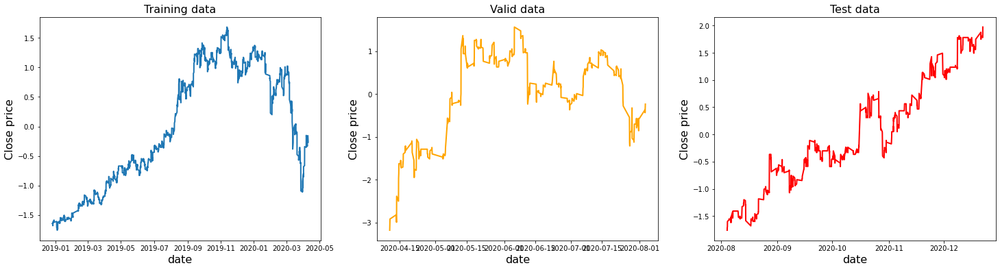

In [ ]:
FPT_data_processor.visualize_train_val_test_df()

Get best hyperparameter for simple NN


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


INFO:tensorflow:Oracle triggered exit
Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 1, 5)]            0         
_________________________________________________________________
flatten (Flatten)            (None, 5)                 0         
_________________________________________________________________
dense (Dense)                (None, 128)               768       
_________________________________________________________________
dropout (Dropout)            (None, 128)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 129       
Total params: 897
Trainable params: 897
Non-trainable params: 0
_________________________________________________________________
Start training simple NN
Epoch 1/2500
1/1 [==============================] - ETA: 0s - loss


Epoch 00031: val_loss did not improve from 0.02869
Epoch 32/2500
1/1 [==============================] - ETA: 0s - loss: 0.0569 - mae: 0.175 - 0s 30ms/step - loss: 0.0569 - mae: 0.1753 - val_loss: 0.0325 - val_mae: 0.1173

Epoch 00032: val_loss did not improve from 0.02869
Epoch 33/2500
1/1 [==============================] - ETA: 0s - loss: 0.0530 - mae: 0.168 - 0s 39ms/step - loss: 0.0530 - mae: 0.1680 - val_loss: 0.0328 - val_mae: 0.1189

Epoch 00033: val_loss did not improve from 0.02869
Epoch 34/2500
1/1 [==============================] - ETA: 0s - loss: 0.0577 - mae: 0.173 - 0s 39ms/step - loss: 0.0577 - mae: 0.1738 - val_loss: 0.0327 - val_mae: 0.1195

Epoch 00034: val_loss did not improve from 0.02869
Epoch 35/2500
1/1 [==============================] - ETA: 0s - loss: 0.0555 - mae: 0.171 - 0s 31ms/step - loss: 0.0555 - mae: 0.1716 - val_loss: 0.0323 - val_mae: 0.1190

Epoch 00035: val_loss did not improve from 0.02869
Epoch 36/2500
1/1 [==============================] - ETA: 0s

Epoch 00067: val_loss did not improve from 0.02545
Epoch 68/2500
1/1 [==============================] - ETA: 0s - loss: 0.0461 - mae: 0.156 - 0s 30ms/step - loss: 0.0461 - mae: 0.1562 - val_loss: 0.0266 - val_mae: 0.1018

Epoch 00068: val_loss did not improve from 0.02545
Epoch 69/2500
1/1 [==============================] - ETA: 0s - loss: 0.0467 - mae: 0.160 - 0s 30ms/step - loss: 0.0467 - mae: 0.1604 - val_loss: 0.0266 - val_mae: 0.1019

Epoch 00069: val_loss did not improve from 0.02545
Epoch 70/2500
1/1 [==============================] - ETA: 0s - loss: 0.0482 - mae: 0.158 - 0s 22ms/step - loss: 0.0482 - mae: 0.1580 - val_loss: 0.0267 - val_mae: 0.1018

Epoch 00070: val_loss did not improve from 0.02545
Epoch 71/2500
1/1 [==============================] - ETA: 0s - loss: 0.0477 - mae: 0.154 - 0s 30ms/step - loss: 0.0477 - mae: 0.1541 - val_loss: 0.0266 - val_mae: 0.1016

Epoch 00071: val_loss did not improve from 0.02545
Epoch 72/2500
1/1 [==============================] - ETA: 0s 


Epoch 00104: val_loss did not improve from 0.02545
Epoch 105/2500
1/1 [==============================] - ETA: 0s - loss: 0.0415 - mae: 0.152 - 0s 47ms/step - loss: 0.0415 - mae: 0.1521 - val_loss: 0.0263 - val_mae: 0.1009

Epoch 00105: val_loss did not improve from 0.02545
Epoch 106/2500
1/1 [==============================] - ETA: 0s - loss: 0.0374 - mae: 0.143 - 0s 41ms/step - loss: 0.0374 - mae: 0.1437 - val_loss: 0.0263 - val_mae: 0.1010

Epoch 00106: val_loss did not improve from 0.02545
Epoch 107/2500
1/1 [==============================] - ETA: 0s - loss: 0.0411 - mae: 0.148 - 0s 29ms/step - loss: 0.0411 - mae: 0.1481 - val_loss: 0.0263 - val_mae: 0.1010

Epoch 00107: val_loss did not improve from 0.02545
Epoch 108/2500
1/1 [==============================] - ETA: 0s - loss: 0.0366 - mae: 0.143 - 0s 28ms/step - loss: 0.0366 - mae: 0.1431 - val_loss: 0.0263 - val_mae: 0.1010

Epoch 00108: val_loss did not improve from 0.02545
Epoch 109/2500
1/1 [==============================] - ET


Epoch 00141: val_loss did not improve from 0.02545
Epoch 142/2500
1/1 [==============================] - ETA: 0s - loss: 0.0345 - mae: 0.135 - 0s 30ms/step - loss: 0.0345 - mae: 0.1357 - val_loss: 0.0260 - val_mae: 0.1005

Epoch 00142: val_loss did not improve from 0.02545
Epoch 143/2500
1/1 [==============================] - ETA: 0s - loss: 0.0392 - mae: 0.145 - 0s 27ms/step - loss: 0.0392 - mae: 0.1456 - val_loss: 0.0260 - val_mae: 0.1004

Epoch 00143: val_loss did not improve from 0.02545
Epoch 144/2500
1/1 [==============================] - ETA: 0s - loss: 0.0343 - mae: 0.136 - 0s 32ms/step - loss: 0.0343 - mae: 0.1368 - val_loss: 0.0260 - val_mae: 0.1004

Epoch 00144: val_loss did not improve from 0.02545
Epoch 145/2500
1/1 [==============================] - ETA: 0s - loss: 0.0353 - mae: 0.140 - 0s 25ms/step - loss: 0.0353 - mae: 0.1407 - val_loss: 0.0260 - val_mae: 0.1004

Epoch 00145: val_loss did not improve from 0.02545
Epoch 146/2500
1/1 [==============================] - ET


Epoch 00178: val_loss did not improve from 0.02545
Epoch 179/2500
1/1 [==============================] - ETA: 0s - loss: 0.0350 - mae: 0.135 - 0s 29ms/step - loss: 0.0350 - mae: 0.1350 - val_loss: 0.0257 - val_mae: 0.0997

Epoch 00179: val_loss did not improve from 0.02545
Epoch 180/2500
1/1 [==============================] - ETA: 0s - loss: 0.0322 - mae: 0.133 - 0s 24ms/step - loss: 0.0322 - mae: 0.1331 - val_loss: 0.0257 - val_mae: 0.0997

Epoch 00180: val_loss did not improve from 0.02545
Epoch 181/2500
1/1 [==============================] - ETA: 0s - loss: 0.0326 - mae: 0.133 - 0s 30ms/step - loss: 0.0326 - mae: 0.1337 - val_loss: 0.0257 - val_mae: 0.0998

Epoch 00181: val_loss did not improve from 0.02545
Epoch 182/2500
1/1 [==============================] - ETA: 0s - loss: 0.0267 - mae: 0.123 - 0s 29ms/step - loss: 0.0267 - mae: 0.1231 - val_loss: 0.0258 - val_mae: 0.0999

Epoch 00182: val_loss did not improve from 0.02545
Epoch 183/2500
1/1 [==============================] - ET


Epoch 00214: val_loss did not improve from 0.02530
Epoch 215/2500
1/1 [==============================] - ETA: 0s - loss: 0.0313 - mae: 0.128 - 0s 32ms/step - loss: 0.0313 - mae: 0.1280 - val_loss: 0.0263 - val_mae: 0.1008

Epoch 00215: val_loss did not improve from 0.02530
Epoch 216/2500
1/1 [==============================] - ETA: 0s - loss: 0.0277 - mae: 0.125 - 0s 33ms/step - loss: 0.0277 - mae: 0.1254 - val_loss: 0.0263 - val_mae: 0.1010

Epoch 00216: val_loss did not improve from 0.02530
Epoch 217/2500
1/1 [==============================] - ETA: 0s - loss: 0.0275 - mae: 0.123 - 0s 27ms/step - loss: 0.0275 - mae: 0.1236 - val_loss: 0.0263 - val_mae: 0.1012

Epoch 00217: val_loss did not improve from 0.02530
Epoch 218/2500
1/1 [==============================] - ETA: 0s - loss: 0.0281 - mae: 0.124 - 0s 26ms/step - loss: 0.0281 - mae: 0.1249 - val_loss: 0.0262 - val_mae: 0.1012

Epoch 00218: val_loss did not improve from 0.02530
Epoch 219/2500
1/1 [==============================] - ET

Epoch 00250: val_loss did not improve from 0.02522
Epoch 251/2500
1/1 [==============================] - ETA: 0s - loss: 0.0252 - mae: 0.117 - 0s 28ms/step - loss: 0.0252 - mae: 0.1179 - val_loss: 0.0256 - val_mae: 0.0993

Epoch 00251: val_loss did not improve from 0.02522
Epoch 252/2500
1/1 [==============================] - ETA: 0s - loss: 0.0240 - mae: 0.115 - 0s 31ms/step - loss: 0.0240 - mae: 0.1151 - val_loss: 0.0254 - val_mae: 0.0991

Epoch 00252: val_loss did not improve from 0.02522
Epoch 253/2500
1/1 [==============================] - ETA: 0s - loss: 0.0261 - mae: 0.119 - 0s 34ms/step - loss: 0.0261 - mae: 0.1193 - val_loss: 0.0253 - val_mae: 0.0989

Epoch 00253: val_loss did not improve from 0.02522
Epoch 254/2500
1/1 [==============================] - ETA: 0s - loss: 0.0248 - mae: 0.116 - 0s 31ms/step - loss: 0.0248 - mae: 0.1168 - val_loss: 0.0252 - val_mae: 0.0988

Epoch 00254: val_loss improved from 0.02522 to 0.02519, saving model to FPT_1H_NN.hdf5
Epoch 255/2500
1/1 [=

Epoch 00286: val_loss did not improve from 0.02504
Epoch 287/2500
1/1 [==============================] - ETA: 0s - loss: 0.0220 - mae: 0.109 - 0s 31ms/step - loss: 0.0220 - mae: 0.1094 - val_loss: 0.0254 - val_mae: 0.0991

Epoch 00287: val_loss did not improve from 0.02504
Epoch 288/2500
1/1 [==============================] - ETA: 0s - loss: 0.0227 - mae: 0.111 - 0s 26ms/step - loss: 0.0227 - mae: 0.1112 - val_loss: 0.0254 - val_mae: 0.0991

Epoch 00288: val_loss did not improve from 0.02504
Epoch 289/2500
1/1 [==============================] - ETA: 0s - loss: 0.0210 - mae: 0.109 - 0s 34ms/step - loss: 0.0210 - mae: 0.1097 - val_loss: 0.0254 - val_mae: 0.0991

Epoch 00289: val_loss did not improve from 0.02504
Epoch 290/2500
1/1 [==============================] - ETA: 0s - loss: 0.0233 - mae: 0.113 - 0s 32ms/step - loss: 0.0233 - mae: 0.1137 - val_loss: 0.0254 - val_mae: 0.0992

Epoch 00290: val_loss did not improve from 0.02504
Epoch 291/2500
1/1 [==============================] - ETA


Epoch 00323: val_loss did not improve from 0.02504
Epoch 324/2500
1/1 [==============================] - ETA: 0s - loss: 0.0203 - mae: 0.106 - 0s 30ms/step - loss: 0.0203 - mae: 0.1069 - val_loss: 0.0251 - val_mae: 0.0988

Epoch 00324: val_loss did not improve from 0.02504
Epoch 325/2500
1/1 [==============================] - ETA: 0s - loss: 0.0211 - mae: 0.107 - 0s 28ms/step - loss: 0.0211 - mae: 0.1079 - val_loss: 0.0251 - val_mae: 0.0986

Epoch 00325: val_loss did not improve from 0.02504
Epoch 326/2500
1/1 [==============================] - ETA: 0s - loss: 0.0204 - mae: 0.105 - 0s 31ms/step - loss: 0.0204 - mae: 0.1055 - val_loss: 0.0251 - val_mae: 0.0984

Epoch 00326: val_loss did not improve from 0.02504
Epoch 327/2500
1/1 [==============================] - ETA: 0s - loss: 0.0188 - mae: 0.102 - 0s 30ms/step - loss: 0.0188 - mae: 0.1025 - val_loss: 0.0251 - val_mae: 0.0983

Epoch 00327: val_loss did not improve from 0.02504
Epoch 328/2500
1/1 [==============================] - ET

Epoch 360/2500
1/1 [==============================] - ETA: 0s - loss: 0.0183 - mae: 0.097 - 0s 28ms/step - loss: 0.0183 - mae: 0.0975 - val_loss: 0.0250 - val_mae: 0.0981

Epoch 00360: val_loss did not improve from 0.02499
Epoch 361/2500
1/1 [==============================] - ETA: 0s - loss: 0.0179 - mae: 0.100 - 0s 30ms/step - loss: 0.0179 - mae: 0.1002 - val_loss: 0.0250 - val_mae: 0.0982

Epoch 00361: val_loss did not improve from 0.02499
Epoch 362/2500
1/1 [==============================] - ETA: 0s - loss: 0.0171 - mae: 0.097 - 0s 31ms/step - loss: 0.0171 - mae: 0.0970 - val_loss: 0.0250 - val_mae: 0.0982

Epoch 00362: val_loss did not improve from 0.02499
Epoch 363/2500
1/1 [==============================] - ETA: 0s - loss: 0.0175 - mae: 0.100 - 0s 23ms/step - loss: 0.0175 - mae: 0.1001 - val_loss: 0.0251 - val_mae: 0.0983

Epoch 00363: val_loss did not improve from 0.02499
Epoch 364/2500
1/1 [==============================] - ETA: 0s - loss: 0.0179 - mae: 0.098 - 0s 34ms/step - l

1/1 [==============================] - ETA: 0s - loss: 0.0153 - mae: 0.091 - 0s 28ms/step - loss: 0.0153 - mae: 0.0919 - val_loss: 0.0250 - val_mae: 0.0981

Epoch 00396: val_loss did not improve from 0.02493
Epoch 397/2500
1/1 [==============================] - ETA: 0s - loss: 0.0161 - mae: 0.094 - 0s 31ms/step - loss: 0.0161 - mae: 0.0947 - val_loss: 0.0250 - val_mae: 0.0982

Epoch 00397: val_loss did not improve from 0.02493
Epoch 398/2500
1/1 [==============================] - ETA: 0s - loss: 0.0154 - mae: 0.093 - 0s 23ms/step - loss: 0.0154 - mae: 0.0936 - val_loss: 0.0250 - val_mae: 0.0982

Epoch 00398: val_loss did not improve from 0.02493
Epoch 399/2500
1/1 [==============================] - ETA: 0s - loss: 0.0154 - mae: 0.093 - 0s 26ms/step - loss: 0.0154 - mae: 0.0933 - val_loss: 0.0251 - val_mae: 0.0981

Epoch 00399: val_loss did not improve from 0.02493
Epoch 400/2500
1/1 [==============================] - ETA: 0s - loss: 0.0163 - mae: 0.093 - 0s 30ms/step - loss: 0.0163 - m

Epoch 00431: val_loss did not improve from 0.02472
Epoch 432/2500
1/1 [==============================] - ETA: 0s - loss: 0.0149 - mae: 0.089 - 0s 33ms/step - loss: 0.0149 - mae: 0.0899 - val_loss: 0.0254 - val_mae: 0.0987

Epoch 00432: val_loss did not improve from 0.02472
Epoch 433/2500
1/1 [==============================] - ETA: 0s - loss: 0.0153 - mae: 0.091 - 0s 29ms/step - loss: 0.0153 - mae: 0.0911 - val_loss: 0.0253 - val_mae: 0.0987

Epoch 00433: val_loss did not improve from 0.02472
Epoch 434/2500
1/1 [==============================] - ETA: 0s - loss: 0.0150 - mae: 0.092 - 0s 30ms/step - loss: 0.0150 - mae: 0.0922 - val_loss: 0.0253 - val_mae: 0.0986

Epoch 00434: val_loss did not improve from 0.02472
Epoch 435/2500
1/1 [==============================] - ETA: 0s - loss: 0.0153 - mae: 0.092 - 0s 28ms/step - loss: 0.0153 - mae: 0.0924 - val_loss: 0.0252 - val_mae: 0.0985

Epoch 00435: val_loss did not improve from 0.02472
Epoch 436/2500
1/1 [==============================] - ETA

Epoch 00467: val_loss did not improve from 0.02459
Epoch 468/2500
1/1 [==============================] - ETA: 0s - loss: 0.0135 - mae: 0.085 - 0s 30ms/step - loss: 0.0135 - mae: 0.0855 - val_loss: 0.0250 - val_mae: 0.0979

Epoch 00468: val_loss did not improve from 0.02459
Epoch 469/2500
1/1 [==============================] - ETA: 0s - loss: 0.0147 - mae: 0.088 - 0s 29ms/step - loss: 0.0147 - mae: 0.0889 - val_loss: 0.0250 - val_mae: 0.0980

Epoch 00469: val_loss did not improve from 0.02459
Epoch 470/2500
1/1 [==============================] - ETA: 0s - loss: 0.0145 - mae: 0.088 - 0s 30ms/step - loss: 0.0145 - mae: 0.0885 - val_loss: 0.0250 - val_mae: 0.0980

Epoch 00470: val_loss did not improve from 0.02459
Epoch 471/2500
1/1 [==============================] - ETA: 0s - loss: 0.0132 - mae: 0.085 - 0s 31ms/step - loss: 0.0132 - mae: 0.0851 - val_loss: 0.0250 - val_mae: 0.0980

Epoch 00471: val_loss did not improve from 0.02459
Epoch 472/2500
1/1 [==============================] - ETA


Epoch 00504: val_loss did not improve from 0.02459
Epoch 505/2500
1/1 [==============================] - ETA: 0s - loss: 0.0121 - mae: 0.082 - 0s 54ms/step - loss: 0.0121 - mae: 0.0827 - val_loss: 0.0247 - val_mae: 0.0972

Epoch 00505: val_loss did not improve from 0.02459
Epoch 506/2500
1/1 [==============================] - ETA: 0s - loss: 0.0125 - mae: 0.082 - 0s 43ms/step - loss: 0.0125 - mae: 0.0823 - val_loss: 0.0247 - val_mae: 0.0972

Epoch 00506: val_loss did not improve from 0.02459
Epoch 507/2500
1/1 [==============================] - ETA: 0s - loss: 0.0124 - mae: 0.082 - 0s 32ms/step - loss: 0.0124 - mae: 0.0825 - val_loss: 0.0247 - val_mae: 0.0973

Epoch 00507: val_loss did not improve from 0.02459
Epoch 508/2500
1/1 [==============================] - ETA: 0s - loss: 0.0115 - mae: 0.081 - 0s 30ms/step - loss: 0.0115 - mae: 0.0811 - val_loss: 0.0247 - val_mae: 0.0974

Epoch 00508: val_loss did not improve from 0.02459
Epoch 509/2500
1/1 [==============================] - ET

Epoch 00540: val_loss did not improve from 0.02455
Epoch 541/2500
1/1 [==============================] - ETA: 0s - loss: 0.0104 - mae: 0.074 - 0s 25ms/step - loss: 0.0104 - mae: 0.0742 - val_loss: 0.0247 - val_mae: 0.0975

Epoch 00541: val_loss did not improve from 0.02455
Epoch 542/2500
1/1 [==============================] - ETA: 0s - loss: 0.0112 - mae: 0.078 - 0s 24ms/step - loss: 0.0112 - mae: 0.0788 - val_loss: 0.0247 - val_mae: 0.0976

Epoch 00542: val_loss did not improve from 0.02455
Epoch 543/2500
1/1 [==============================] - ETA: 0s - loss: 0.0112 - mae: 0.078 - 0s 32ms/step - loss: 0.0112 - mae: 0.0787 - val_loss: 0.0247 - val_mae: 0.0976

Epoch 00543: val_loss did not improve from 0.02455
Epoch 544/2500
1/1 [==============================] - ETA: 0s - loss: 0.0111 - mae: 0.077 - 0s 31ms/step - loss: 0.0111 - mae: 0.0776 - val_loss: 0.0247 - val_mae: 0.0975

Epoch 00544: val_loss did not improve from 0.02455
Epoch 545/2500
1/1 [==============================] - ETA

Epoch 00576: val_loss did not improve from 0.02442
Epoch 577/2500
1/1 [==============================] - ETA: 0s - loss: 0.0112 - mae: 0.078 - 0s 29ms/step - loss: 0.0112 - mae: 0.0780 - val_loss: 0.0248 - val_mae: 0.0973

Epoch 00577: val_loss did not improve from 0.02442
Epoch 578/2500
1/1 [==============================] - ETA: 0s - loss: 0.0103 - mae: 0.073 - 0s 30ms/step - loss: 0.0103 - mae: 0.0738 - val_loss: 0.0248 - val_mae: 0.0973

Epoch 00578: val_loss did not improve from 0.02442
Epoch 579/2500
1/1 [==============================] - ETA: 0s - loss: 0.0114 - mae: 0.078 - 0s 29ms/step - loss: 0.0114 - mae: 0.0788 - val_loss: 0.0247 - val_mae: 0.0972

Epoch 00579: val_loss did not improve from 0.02442
Epoch 580/2500
1/1 [==============================] - ETA: 0s - loss: 0.0102 - mae: 0.074 - 0s 29ms/step - loss: 0.0102 - mae: 0.0741 - val_loss: 0.0247 - val_mae: 0.0972

Epoch 00580: val_loss did not improve from 0.02442
Epoch 581/2500
1/1 [==============================] - ETA

1/1 [==============================] - ETA: 0s - loss: 0.0107 - mae: 0.075 - 0s 30ms/step - loss: 0.0107 - mae: 0.0757 - val_loss: 0.0244 - val_mae: 0.0965

Epoch 00613: val_loss improved from 0.02440 to 0.02439, saving model to FPT_1H_NN.hdf5
Epoch 614/2500
1/1 [==============================] - ETA: 0s - loss: 0.0097 - mae: 0.073 - 0s 32ms/step - loss: 0.0097 - mae: 0.0735 - val_loss: 0.0244 - val_mae: 0.0965

Epoch 00614: val_loss improved from 0.02439 to 0.02439, saving model to FPT_1H_NN.hdf5
Epoch 615/2500
1/1 [==============================] - ETA: 0s - loss: 0.0095 - mae: 0.071 - 0s 32ms/step - loss: 0.0095 - mae: 0.0718 - val_loss: 0.0244 - val_mae: 0.0965

Epoch 00615: val_loss did not improve from 0.02439
Epoch 616/2500
1/1 [==============================] - ETA: 0s - loss: 0.0100 - mae: 0.075 - 0s 31ms/step - loss: 0.0100 - mae: 0.0751 - val_loss: 0.0244 - val_mae: 0.0965

Epoch 00616: val_loss did not improve from 0.02439
Epoch 617/2500
1/1 [==============================]

1/1 [==============================] - ETA: 0s - loss: 0.0098 - mae: 0.072 - 0s 25ms/step - loss: 0.0098 - mae: 0.0729 - val_loss: 0.0243 - val_mae: 0.0960

Epoch 00648: val_loss did not improve from 0.02407
Epoch 649/2500
1/1 [==============================] - ETA: 0s - loss: 0.0088 - mae: 0.069 - 0s 27ms/step - loss: 0.0088 - mae: 0.0698 - val_loss: 0.0243 - val_mae: 0.0960

Epoch 00649: val_loss did not improve from 0.02407
Epoch 650/2500
1/1 [==============================] - ETA: 0s - loss: 0.0091 - mae: 0.071 - 0s 34ms/step - loss: 0.0091 - mae: 0.0711 - val_loss: 0.0243 - val_mae: 0.0961

Epoch 00650: val_loss did not improve from 0.02407
Epoch 651/2500
1/1 [==============================] - ETA: 0s - loss: 0.0093 - mae: 0.070 - 0s 36ms/step - loss: 0.0093 - mae: 0.0709 - val_loss: 0.0243 - val_mae: 0.0961

Epoch 00651: val_loss did not improve from 0.02407
Epoch 652/2500
1/1 [==============================] - ETA: 0s - loss: 0.0090 - mae: 0.070 - 0s 36ms/step - loss: 0.0090 - m

1/1 [==============================] - ETA: 0s - loss: 0.0089 - mae: 0.070 - 0s 37ms/step - loss: 0.0089 - mae: 0.0707 - val_loss: 0.0246 - val_mae: 0.0970

Epoch 00684: val_loss did not improve from 0.02402
Epoch 685/2500
1/1 [==============================] - ETA: 0s - loss: 0.0086 - mae: 0.069 - 0s 54ms/step - loss: 0.0086 - mae: 0.0698 - val_loss: 0.0245 - val_mae: 0.0968

Epoch 00685: val_loss did not improve from 0.02402
Epoch 686/2500
1/1 [==============================] - ETA: 0s - loss: 0.0087 - mae: 0.069 - 0s 34ms/step - loss: 0.0087 - mae: 0.0691 - val_loss: 0.0244 - val_mae: 0.0965

Epoch 00686: val_loss did not improve from 0.02402
Epoch 687/2500
1/1 [==============================] - ETA: 0s - loss: 0.0087 - mae: 0.069 - 0s 34ms/step - loss: 0.0087 - mae: 0.0692 - val_loss: 0.0243 - val_mae: 0.0962

Epoch 00687: val_loss did not improve from 0.02402
Epoch 688/2500
1/1 [==============================] - ETA: 0s - loss: 0.0084 - mae: 0.069 - 0s 29ms/step - loss: 0.0084 - m

Epoch 00720: val_loss did not improve from 0.02402
Epoch 721/2500
1/1 [==============================] - ETA: 0s - loss: 0.0077 - mae: 0.065 - 0s 24ms/step - loss: 0.0077 - mae: 0.0659 - val_loss: 0.0241 - val_mae: 0.0958

Epoch 00721: val_loss did not improve from 0.02402
Epoch 722/2500
1/1 [==============================] - ETA: 0s - loss: 0.0079 - mae: 0.066 - 0s 29ms/step - loss: 0.0079 - mae: 0.0667 - val_loss: 0.0241 - val_mae: 0.0958

Epoch 00722: val_loss did not improve from 0.02402
Epoch 723/2500
1/1 [==============================] - ETA: 0s - loss: 0.0085 - mae: 0.068 - 0s 29ms/step - loss: 0.0085 - mae: 0.0682 - val_loss: 0.0241 - val_mae: 0.0957

Epoch 00723: val_loss did not improve from 0.02402
Epoch 724/2500
1/1 [==============================] - ETA: 0s - loss: 0.0084 - mae: 0.066 - 0s 30ms/step - loss: 0.0084 - mae: 0.0666 - val_loss: 0.0240 - val_mae: 0.0957

Epoch 00724: val_loss did not improve from 0.02402
Epoch 725/2500
1/1 [==============================] - ETA

1/1 [==============================] - ETA: 0s - loss: 0.0080 - mae: 0.066 - 0s 32ms/step - loss: 0.0080 - mae: 0.0662 - val_loss: 0.0241 - val_mae: 0.0955

Epoch 00757: val_loss did not improve from 0.02400
Epoch 758/2500
1/1 [==============================] - ETA: 0s - loss: 0.0082 - mae: 0.066 - 0s 29ms/step - loss: 0.0082 - mae: 0.0669 - val_loss: 0.0241 - val_mae: 0.0955

Epoch 00758: val_loss did not improve from 0.02400
Epoch 759/2500
1/1 [==============================] - ETA: 0s - loss: 0.0076 - mae: 0.064 - 0s 33ms/step - loss: 0.0076 - mae: 0.0646 - val_loss: 0.0240 - val_mae: 0.0954

Epoch 00759: val_loss did not improve from 0.02400
Epoch 760/2500
1/1 [==============================] - ETA: 0s - loss: 0.0076 - mae: 0.064 - 0s 20ms/step - loss: 0.0076 - mae: 0.0647 - val_loss: 0.0240 - val_mae: 0.0954

Epoch 00760: val_loss improved from 0.02400 to 0.02395, saving model to FPT_1H_NN.hdf5
Epoch 761/2500
1/1 [==============================] - ETA: 0s - loss: 0.0081 - mae: 0.0

1/1 [==============================] - ETA: 0s - loss: 0.0079 - mae: 0.064 - 0s 29ms/step - loss: 0.0079 - mae: 0.0646 - val_loss: 0.0241 - val_mae: 0.0955

Epoch 00793: val_loss did not improve from 0.02389
Epoch 794/2500
1/1 [==============================] - ETA: 0s - loss: 0.0074 - mae: 0.065 - 0s 31ms/step - loss: 0.0074 - mae: 0.0656 - val_loss: 0.0242 - val_mae: 0.0956

Epoch 00794: val_loss did not improve from 0.02389
Epoch 795/2500
1/1 [==============================] - ETA: 0s - loss: 0.0072 - mae: 0.062 - 0s 30ms/step - loss: 0.0072 - mae: 0.0628 - val_loss: 0.0242 - val_mae: 0.0957

Epoch 00795: val_loss did not improve from 0.02389
Epoch 796/2500
1/1 [==============================] - ETA: 0s - loss: 0.0075 - mae: 0.065 - 0s 33ms/step - loss: 0.0075 - mae: 0.0651 - val_loss: 0.0243 - val_mae: 0.0958

Epoch 00796: val_loss did not improve from 0.02389
Epoch 797/2500
1/1 [==============================] - ETA: 0s - loss: 0.0078 - mae: 0.065 - 0s 42ms/step - loss: 0.0078 - m

1/1 [==============================] - ETA: 0s - loss: 0.0071 - mae: 0.061 - 0s 28ms/step - loss: 0.0071 - mae: 0.0617 - val_loss: 0.0239 - val_mae: 0.0951

Epoch 00829: val_loss did not improve from 0.02381
Epoch 830/2500
1/1 [==============================] - ETA: 0s - loss: 0.0067 - mae: 0.060 - 0s 30ms/step - loss: 0.0067 - mae: 0.0605 - val_loss: 0.0239 - val_mae: 0.0950

Epoch 00830: val_loss did not improve from 0.02381
Epoch 831/2500
1/1 [==============================] - ETA: 0s - loss: 0.0069 - mae: 0.060 - 0s 30ms/step - loss: 0.0069 - mae: 0.0608 - val_loss: 0.0238 - val_mae: 0.0950

Epoch 00831: val_loss did not improve from 0.02381
Epoch 832/2500
1/1 [==============================] - ETA: 0s - loss: 0.0071 - mae: 0.062 - 0s 29ms/step - loss: 0.0071 - mae: 0.0620 - val_loss: 0.0238 - val_mae: 0.0950

Epoch 00832: val_loss did not improve from 0.02381
Epoch 833/2500
1/1 [==============================] - ETA: 0s - loss: 0.0074 - mae: 0.063 - 0s 22ms/step - loss: 0.0074 - m

Epoch 865/2500
1/1 [==============================] - ETA: 0s - loss: 0.0068 - mae: 0.060 - 0s 34ms/step - loss: 0.0068 - mae: 0.0609 - val_loss: 0.0238 - val_mae: 0.0950

Epoch 00865: val_loss did not improve from 0.02363
Epoch 866/2500
1/1 [==============================] - ETA: 0s - loss: 0.0065 - mae: 0.060 - 0s 28ms/step - loss: 0.0065 - mae: 0.0607 - val_loss: 0.0238 - val_mae: 0.0950

Epoch 00866: val_loss did not improve from 0.02363
Epoch 867/2500
1/1 [==============================] - ETA: 0s - loss: 0.0065 - mae: 0.059 - 0s 30ms/step - loss: 0.0065 - mae: 0.0596 - val_loss: 0.0239 - val_mae: 0.0951

Epoch 00867: val_loss did not improve from 0.02363
Epoch 868/2500
1/1 [==============================] - ETA: 0s - loss: 0.0066 - mae: 0.060 - 0s 30ms/step - loss: 0.0066 - mae: 0.0600 - val_loss: 0.0239 - val_mae: 0.0952

Epoch 00868: val_loss did not improve from 0.02363
Epoch 869/2500
1/1 [==============================] - ETA: 0s - loss: 0.0070 - mae: 0.062 - 0s 31ms/step - l


Epoch 00901: val_loss did not improve from 0.02361
Epoch 902/2500
1/1 [==============================] - ETA: 0s - loss: 0.0063 - mae: 0.059 - 0s 31ms/step - loss: 0.0063 - mae: 0.0591 - val_loss: 0.0237 - val_mae: 0.0948

Epoch 00902: val_loss did not improve from 0.02361
Epoch 903/2500
1/1 [==============================] - ETA: 0s - loss: 0.0065 - mae: 0.059 - 0s 28ms/step - loss: 0.0065 - mae: 0.0594 - val_loss: 0.0237 - val_mae: 0.0947

Epoch 00903: val_loss did not improve from 0.02361
Epoch 904/2500
1/1 [==============================] - ETA: 0s - loss: 0.0067 - mae: 0.061 - 0s 26ms/step - loss: 0.0067 - mae: 0.0610 - val_loss: 0.0237 - val_mae: 0.0946

Epoch 00904: val_loss did not improve from 0.02361
Epoch 905/2500
1/1 [==============================] - ETA: 0s - loss: 0.0065 - mae: 0.059 - 0s 30ms/step - loss: 0.0065 - mae: 0.0594 - val_loss: 0.0237 - val_mae: 0.0946

Epoch 00905: val_loss did not improve from 0.02361
Epoch 906/2500
1/1 [==============================] - ET

Epoch 938/2500
1/1 [==============================] - ETA: 0s - loss: 0.0067 - mae: 0.059 - 0s 30ms/step - loss: 0.0067 - mae: 0.0598 - val_loss: 0.0236 - val_mae: 0.0943

Epoch 00938: val_loss did not improve from 0.02354
Epoch 939/2500
1/1 [==============================] - ETA: 0s - loss: 0.0065 - mae: 0.059 - 0s 24ms/step - loss: 0.0065 - mae: 0.0593 - val_loss: 0.0236 - val_mae: 0.0944

Epoch 00939: val_loss did not improve from 0.02354
Epoch 940/2500
1/1 [==============================] - ETA: 0s - loss: 0.0062 - mae: 0.057 - 0s 24ms/step - loss: 0.0062 - mae: 0.0578 - val_loss: 0.0236 - val_mae: 0.0945

Epoch 00940: val_loss did not improve from 0.02354
Epoch 941/2500
1/1 [==============================] - ETA: 0s - loss: 0.0062 - mae: 0.058 - 0s 29ms/step - loss: 0.0062 - mae: 0.0585 - val_loss: 0.0236 - val_mae: 0.0946

Epoch 00941: val_loss did not improve from 0.02354
Epoch 942/2500
1/1 [==============================] - ETA: 0s - loss: 0.0063 - mae: 0.058 - 0s 29ms/step - l

Epoch 00973: val_loss did not improve from 0.02341
Epoch 974/2500
1/1 [==============================] - ETA: 0s - loss: 0.0061 - mae: 0.058 - 0s 26ms/step - loss: 0.0061 - mae: 0.0581 - val_loss: 0.0236 - val_mae: 0.0945

Epoch 00974: val_loss did not improve from 0.02341
Epoch 975/2500
1/1 [==============================] - ETA: 0s - loss: 0.0064 - mae: 0.060 - 0s 32ms/step - loss: 0.0064 - mae: 0.0604 - val_loss: 0.0236 - val_mae: 0.0945

Epoch 00975: val_loss did not improve from 0.02341
Epoch 976/2500
1/1 [==============================] - ETA: 0s - loss: 0.0064 - mae: 0.059 - 0s 29ms/step - loss: 0.0064 - mae: 0.0590 - val_loss: 0.0237 - val_mae: 0.0946

Epoch 00976: val_loss did not improve from 0.02341
Epoch 977/2500
1/1 [==============================] - ETA: 0s - loss: 0.0060 - mae: 0.057 - 0s 23ms/step - loss: 0.0060 - mae: 0.0576 - val_loss: 0.0237 - val_mae: 0.0946

Epoch 00977: val_loss did not improve from 0.02341
Epoch 978/2500
1/1 [==============================] - ETA


Epoch 01010: val_loss did not improve from 0.02341
Epoch 1011/2500
1/1 [==============================] - ETA: 0s - loss: 0.0063 - mae: 0.058 - 0s 28ms/step - loss: 0.0063 - mae: 0.0585 - val_loss: 0.0235 - val_mae: 0.0942

Epoch 01011: val_loss did not improve from 0.02341
Epoch 1012/2500
1/1 [==============================] - ETA: 0s - loss: 0.0055 - mae: 0.055 - 0s 31ms/step - loss: 0.0055 - mae: 0.0555 - val_loss: 0.0235 - val_mae: 0.0942

Epoch 01012: val_loss did not improve from 0.02341
Epoch 1013/2500
1/1 [==============================] - ETA: 0s - loss: 0.0060 - mae: 0.057 - 0s 21ms/step - loss: 0.0060 - mae: 0.0575 - val_loss: 0.0235 - val_mae: 0.0942

Epoch 01013: val_loss did not improve from 0.02341
Epoch 1014/2500
1/1 [==============================] - ETA: 0s - loss: 0.0063 - mae: 0.056 - 0s 28ms/step - loss: 0.0063 - mae: 0.0560 - val_loss: 0.0235 - val_mae: 0.0942

Epoch 01014: val_loss did not improve from 0.02341
Epoch 1015/2500
1/1 [==============================]

1/1 [==============================] - ETA: 0s - loss: 0.0056 - mae: 0.056 - 0s 33ms/step - loss: 0.0056 - mae: 0.0564 - val_loss: 0.0234 - val_mae: 0.0940

Epoch 01046: val_loss did not improve from 0.02333
Epoch 1047/2500
1/1 [==============================] - ETA: 0s - loss: 0.0059 - mae: 0.057 - 0s 33ms/step - loss: 0.0059 - mae: 0.0570 - val_loss: 0.0234 - val_mae: 0.0940

Epoch 01047: val_loss did not improve from 0.02333
Epoch 1048/2500
1/1 [==============================] - ETA: 0s - loss: 0.0059 - mae: 0.056 - 0s 26ms/step - loss: 0.0059 - mae: 0.0564 - val_loss: 0.0235 - val_mae: 0.0941

Epoch 01048: val_loss did not improve from 0.02333
Epoch 1049/2500
1/1 [==============================] - ETA: 0s - loss: 0.0056 - mae: 0.054 - 0s 32ms/step - loss: 0.0056 - mae: 0.0547 - val_loss: 0.0235 - val_mae: 0.0941

Epoch 01049: val_loss did not improve from 0.02333
Epoch 1050/2500
1/1 [==============================] - ETA: 0s - loss: 0.0059 - mae: 0.056 - 0s 22ms/step - loss: 0.0059


Epoch 01082: val_loss did not improve from 0.02333
Epoch 1083/2500
1/1 [==============================] - ETA: 0s - loss: 0.0060 - mae: 0.057 - 0s 28ms/step - loss: 0.0060 - mae: 0.0570 - val_loss: 0.0234 - val_mae: 0.0939

Epoch 01083: val_loss did not improve from 0.02333
Epoch 1084/2500
1/1 [==============================] - ETA: 0s - loss: 0.0060 - mae: 0.056 - 0s 28ms/step - loss: 0.0060 - mae: 0.0562 - val_loss: 0.0233 - val_mae: 0.0939

Epoch 01084: val_loss did not improve from 0.02333
Epoch 1085/2500
1/1 [==============================] - ETA: 0s - loss: 0.0057 - mae: 0.055 - 0s 31ms/step - loss: 0.0057 - mae: 0.0557 - val_loss: 0.0233 - val_mae: 0.0938

Epoch 01085: val_loss improved from 0.02333 to 0.02333, saving model to FPT_1H_NN.hdf5
Epoch 1086/2500
1/1 [==============================] - ETA: 0s - loss: 0.0056 - mae: 0.054 - 0s 28ms/step - loss: 0.0056 - mae: 0.0543 - val_loss: 0.0233 - val_mae: 0.0938

Epoch 01086: val_loss improved from 0.02333 to 0.02331, saving mode

1/1 [==============================] - ETA: 0s - loss: 0.0055 - mae: 0.054 - 0s 31ms/step - loss: 0.0055 - mae: 0.0540 - val_loss: 0.0233 - val_mae: 0.0936

Epoch 01118: val_loss did not improve from 0.02310
Epoch 1119/2500
1/1 [==============================] - ETA: 0s - loss: 0.0052 - mae: 0.053 - 0s 25ms/step - loss: 0.0052 - mae: 0.0539 - val_loss: 0.0233 - val_mae: 0.0936

Epoch 01119: val_loss did not improve from 0.02310
Epoch 1120/2500
1/1 [==============================] - ETA: 0s - loss: 0.0054 - mae: 0.055 - 0s 34ms/step - loss: 0.0054 - mae: 0.0557 - val_loss: 0.0233 - val_mae: 0.0936

Epoch 01120: val_loss did not improve from 0.02310
Epoch 1121/2500
1/1 [==============================] - ETA: 0s - loss: 0.0055 - mae: 0.054 - 0s 33ms/step - loss: 0.0055 - mae: 0.0547 - val_loss: 0.0233 - val_mae: 0.0937

Epoch 01121: val_loss did not improve from 0.02310
Epoch 1122/2500
1/1 [==============================] - ETA: 0s - loss: 0.0057 - mae: 0.055 - 0s 37ms/step - loss: 0.0057


Epoch 01154: val_loss did not improve from 0.02310
Epoch 1155/2500
1/1 [==============================] - ETA: 0s - loss: 0.0055 - mae: 0.055 - 0s 32ms/step - loss: 0.0055 - mae: 0.0551 - val_loss: 0.0232 - val_mae: 0.0936

Epoch 01155: val_loss did not improve from 0.02310
Epoch 1156/2500
1/1 [==============================] - ETA: 0s - loss: 0.0055 - mae: 0.054 - 0s 34ms/step - loss: 0.0055 - mae: 0.0546 - val_loss: 0.0232 - val_mae: 0.0936

Epoch 01156: val_loss did not improve from 0.02310
Epoch 1157/2500
1/1 [==============================] - ETA: 0s - loss: 0.0053 - mae: 0.054 - 0s 44ms/step - loss: 0.0053 - mae: 0.0545 - val_loss: 0.0232 - val_mae: 0.0935

Epoch 01157: val_loss did not improve from 0.02310
Epoch 1158/2500
1/1 [==============================] - ETA: 0s - loss: 0.0052 - mae: 0.053 - 0s 50ms/step - loss: 0.0052 - mae: 0.0530 - val_loss: 0.0232 - val_mae: 0.0935

Epoch 01158: val_loss did not improve from 0.02310
Epoch 1159/2500
1/1 [==============================]

Epoch 01190: val_loss did not improve from 0.02308
Epoch 1191/2500
1/1 [==============================] - ETA: 0s - loss: 0.0058 - mae: 0.055 - 0s 31ms/step - loss: 0.0058 - mae: 0.0555 - val_loss: 0.0232 - val_mae: 0.0939

Epoch 01191: val_loss did not improve from 0.02308
Epoch 1192/2500
1/1 [==============================] - ETA: 0s - loss: 0.0055 - mae: 0.054 - 0s 30ms/step - loss: 0.0055 - mae: 0.0544 - val_loss: 0.0232 - val_mae: 0.0938

Epoch 01192: val_loss did not improve from 0.02308
Epoch 1193/2500
1/1 [==============================] - ETA: 0s - loss: 0.0051 - mae: 0.053 - 0s 29ms/step - loss: 0.0051 - mae: 0.0535 - val_loss: 0.0232 - val_mae: 0.0937

Epoch 01193: val_loss did not improve from 0.02308
Epoch 1194/2500
1/1 [==============================] - ETA: 0s - loss: 0.0055 - mae: 0.054 - 0s 25ms/step - loss: 0.0055 - mae: 0.0542 - val_loss: 0.0232 - val_mae: 0.0936

Epoch 01194: val_loss did not improve from 0.02308
Epoch 1195/2500
1/1 [==============================] 


Epoch 01226: val_loss improved from 0.02298 to 0.02294, saving model to FPT_1H_NN.hdf5
Epoch 1227/2500
1/1 [==============================] - ETA: 0s - loss: 0.0050 - mae: 0.052 - 0s 38ms/step - loss: 0.0050 - mae: 0.0525 - val_loss: 0.0229 - val_mae: 0.0929

Epoch 01227: val_loss improved from 0.02294 to 0.02289, saving model to FPT_1H_NN.hdf5
Epoch 1228/2500
1/1 [==============================] - ETA: 0s - loss: 0.0049 - mae: 0.052 - 0s 26ms/step - loss: 0.0049 - mae: 0.0520 - val_loss: 0.0229 - val_mae: 0.0928

Epoch 01228: val_loss improved from 0.02289 to 0.02286, saving model to FPT_1H_NN.hdf5
Epoch 1229/2500
1/1 [==============================] - ETA: 0s - loss: 0.0055 - mae: 0.053 - 0s 28ms/step - loss: 0.0055 - mae: 0.0539 - val_loss: 0.0229 - val_mae: 0.0928

Epoch 01229: val_loss improved from 0.02286 to 0.02286, saving model to FPT_1H_NN.hdf5
Epoch 1230/2500
1/1 [==============================] - ETA: 0s - loss: 0.0051 - mae: 0.052 - 0s 30ms/step - loss: 0.0051 - mae: 0.05


Epoch 01262: val_loss did not improve from 0.02286
Epoch 1263/2500
1/1 [==============================] - ETA: 0s - loss: 0.0051 - mae: 0.052 - 0s 29ms/step - loss: 0.0051 - mae: 0.0527 - val_loss: 0.0230 - val_mae: 0.0930

Epoch 01263: val_loss did not improve from 0.02286
Epoch 1264/2500
1/1 [==============================] - ETA: 0s - loss: 0.0055 - mae: 0.055 - 0s 29ms/step - loss: 0.0055 - mae: 0.0550 - val_loss: 0.0230 - val_mae: 0.0930

Epoch 01264: val_loss did not improve from 0.02286
Epoch 1265/2500
1/1 [==============================] - ETA: 0s - loss: 0.0055 - mae: 0.054 - 0s 28ms/step - loss: 0.0055 - mae: 0.0545 - val_loss: 0.0229 - val_mae: 0.0930

Epoch 01265: val_loss did not improve from 0.02286
Epoch 1266/2500
1/1 [==============================] - ETA: 0s - loss: 0.0049 - mae: 0.052 - 0s 28ms/step - loss: 0.0049 - mae: 0.0521 - val_loss: 0.0229 - val_mae: 0.0930

Epoch 01266: val_loss did not improve from 0.02286
Epoch 1267/2500
1/1 [==============================]

1/1 [==============================] - ETA: 0s - loss: 0.0050 - mae: 0.052 - 0s 31ms/step - loss: 0.0050 - mae: 0.0529 - val_loss: 0.0231 - val_mae: 0.0934

Epoch 01299: val_loss did not improve from 0.02286
Epoch 1300/2500
1/1 [==============================] - ETA: 0s - loss: 0.0050 - mae: 0.052 - 0s 27ms/step - loss: 0.0050 - mae: 0.0524 - val_loss: 0.0230 - val_mae: 0.0933

Epoch 01300: val_loss did not improve from 0.02286
Epoch 1301/2500
1/1 [==============================] - ETA: 0s - loss: 0.0050 - mae: 0.052 - 0s 29ms/step - loss: 0.0050 - mae: 0.0520 - val_loss: 0.0230 - val_mae: 0.0932

Epoch 01301: val_loss did not improve from 0.02286
Epoch 1302/2500
1/1 [==============================] - ETA: 0s - loss: 0.0051 - mae: 0.053 - 0s 30ms/step - loss: 0.0051 - mae: 0.0530 - val_loss: 0.0229 - val_mae: 0.0930

Epoch 01302: val_loss did not improve from 0.02286
Epoch 1303/2500
1/1 [==============================] - ETA: 0s - loss: 0.0057 - mae: 0.055 - 0s 32ms/step - loss: 0.0057

Epoch 01334: val_loss did not improve from 0.02275
Epoch 1335/2500
1/1 [==============================] - ETA: 0s - loss: 0.0050 - mae: 0.052 - 0s 24ms/step - loss: 0.0050 - mae: 0.0526 - val_loss: 0.0228 - val_mae: 0.0926

Epoch 01335: val_loss did not improve from 0.02275
Epoch 1336/2500
1/1 [==============================] - ETA: 0s - loss: 0.0052 - mae: 0.052 - 0s 30ms/step - loss: 0.0052 - mae: 0.0528 - val_loss: 0.0229 - val_mae: 0.0926

Epoch 01336: val_loss did not improve from 0.02275
Epoch 1337/2500
1/1 [==============================] - ETA: 0s - loss: 0.0047 - mae: 0.050 - 0s 34ms/step - loss: 0.0047 - mae: 0.0509 - val_loss: 0.0229 - val_mae: 0.0926

Epoch 01337: val_loss did not improve from 0.02275
Epoch 1338/2500
1/1 [==============================] - ETA: 0s - loss: 0.0053 - mae: 0.052 - 0s 38ms/step - loss: 0.0053 - mae: 0.0524 - val_loss: 0.0229 - val_mae: 0.0927

Epoch 01338: val_loss did not improve from 0.02275
Epoch 1339/2500
1/1 [==============================] 

1/1 [==============================] - ETA: 0s - loss: 0.0049 - mae: 0.051 - 0s 29ms/step - loss: 0.0049 - mae: 0.0510 - val_loss: 0.0229 - val_mae: 0.0927

Epoch 01371: val_loss did not improve from 0.02275
Epoch 1372/2500
1/1 [==============================] - ETA: 0s - loss: 0.0048 - mae: 0.051 - 0s 28ms/step - loss: 0.0048 - mae: 0.0511 - val_loss: 0.0229 - val_mae: 0.0928

Epoch 01372: val_loss did not improve from 0.02275
Epoch 1373/2500
1/1 [==============================] - ETA: 0s - loss: 0.0051 - mae: 0.052 - 0s 27ms/step - loss: 0.0051 - mae: 0.0527 - val_loss: 0.0229 - val_mae: 0.0928

Epoch 01373: val_loss did not improve from 0.02275
Epoch 1374/2500
1/1 [==============================] - ETA: 0s - loss: 0.0049 - mae: 0.051 - 0s 20ms/step - loss: 0.0049 - mae: 0.0517 - val_loss: 0.0228 - val_mae: 0.0927

Epoch 01374: val_loss did not improve from 0.02275
Epoch 1375/2500
1/1 [==============================] - ETA: 0s - loss: 0.0051 - mae: 0.052 - 0s 25ms/step - loss: 0.0051

1/1 [==============================] - ETA: 0s - loss: 0.0050 - mae: 0.052 - 0s 26ms/step - loss: 0.0050 - mae: 0.0525 - val_loss: 0.0227 - val_mae: 0.0924

Epoch 01407: val_loss did not improve from 0.02272
Epoch 1408/2500
1/1 [==============================] - ETA: 0s - loss: 0.0049 - mae: 0.051 - 0s 24ms/step - loss: 0.0049 - mae: 0.0514 - val_loss: 0.0227 - val_mae: 0.0924

Epoch 01408: val_loss did not improve from 0.02272
Epoch 1409/2500
1/1 [==============================] - ETA: 0s - loss: 0.0049 - mae: 0.051 - 0s 23ms/step - loss: 0.0049 - mae: 0.0514 - val_loss: 0.0228 - val_mae: 0.0925

Epoch 01409: val_loss did not improve from 0.02272
Epoch 1410/2500
1/1 [==============================] - ETA: 0s - loss: 0.0048 - mae: 0.052 - 0s 28ms/step - loss: 0.0048 - mae: 0.0521 - val_loss: 0.0228 - val_mae: 0.0925

Epoch 01410: val_loss did not improve from 0.02272
Epoch 1411/2500
1/1 [==============================] - ETA: 0s - loss: 0.0048 - mae: 0.051 - 0s 29ms/step - loss: 0.0048

Epoch 1443/2500
1/1 [==============================] - ETA: 0s - loss: 0.0048 - mae: 0.051 - 0s 31ms/step - loss: 0.0048 - mae: 0.0515 - val_loss: 0.0228 - val_mae: 0.0928

Epoch 01443: val_loss did not improve from 0.02267
Epoch 1444/2500
1/1 [==============================] - ETA: 0s - loss: 0.0047 - mae: 0.050 - 0s 37ms/step - loss: 0.0047 - mae: 0.0509 - val_loss: 0.0227 - val_mae: 0.0925

Epoch 01444: val_loss did not improve from 0.02267
Epoch 1445/2500
1/1 [==============================] - ETA: 0s - loss: 0.0050 - mae: 0.052 - 0s 35ms/step - loss: 0.0050 - mae: 0.0524 - val_loss: 0.0227 - val_mae: 0.0923

Epoch 01445: val_loss did not improve from 0.02267
Epoch 1446/2500
1/1 [==============================] - ETA: 0s - loss: 0.0047 - mae: 0.051 - 0s 34ms/step - loss: 0.0047 - mae: 0.0513 - val_loss: 0.0227 - val_mae: 0.0922

Epoch 01446: val_loss did not improve from 0.02267
Epoch 1447/2500
1/1 [==============================] - ETA: 0s - loss: 0.0047 - mae: 0.051 - 0s 32ms/ste


Epoch 01478: val_loss did not improve from 0.02252
Epoch 1479/2500
1/1 [==============================] - ETA: 0s - loss: 0.0049 - mae: 0.051 - 0s 27ms/step - loss: 0.0049 - mae: 0.0510 - val_loss: 0.0227 - val_mae: 0.0924

Epoch 01479: val_loss did not improve from 0.02252
Epoch 1480/2500
1/1 [==============================] - ETA: 0s - loss: 0.0046 - mae: 0.050 - 0s 28ms/step - loss: 0.0046 - mae: 0.0500 - val_loss: 0.0227 - val_mae: 0.0924

Epoch 01480: val_loss did not improve from 0.02252
Epoch 1481/2500
1/1 [==============================] - ETA: 0s - loss: 0.0047 - mae: 0.050 - 0s 30ms/step - loss: 0.0047 - mae: 0.0503 - val_loss: 0.0227 - val_mae: 0.0922

Epoch 01481: val_loss did not improve from 0.02252
Epoch 1482/2500
1/1 [==============================] - ETA: 0s - loss: 0.0045 - mae: 0.049 - 0s 29ms/step - loss: 0.0045 - mae: 0.0492 - val_loss: 0.0226 - val_mae: 0.0922

Epoch 01482: val_loss did not improve from 0.02252
Epoch 1483/2500
1/1 [==============================]

Epoch 01514: val_loss did not improve from 0.02249
Epoch 1515/2500
1/1 [==============================] - ETA: 0s - loss: 0.0047 - mae: 0.051 - 0s 36ms/step - loss: 0.0047 - mae: 0.0512 - val_loss: 0.0227 - val_mae: 0.0926

Epoch 01515: val_loss did not improve from 0.02249
Epoch 1516/2500
1/1 [==============================] - ETA: 0s - loss: 0.0049 - mae: 0.051 - 0s 33ms/step - loss: 0.0049 - mae: 0.0511 - val_loss: 0.0227 - val_mae: 0.0926

Epoch 01516: val_loss did not improve from 0.02249
Epoch 1517/2500
1/1 [==============================] - ETA: 0s - loss: 0.0045 - mae: 0.049 - 0s 34ms/step - loss: 0.0045 - mae: 0.0498 - val_loss: 0.0227 - val_mae: 0.0925

Epoch 01517: val_loss did not improve from 0.02249
Epoch 1518/2500
1/1 [==============================] - ETA: 0s - loss: 0.0048 - mae: 0.051 - 0s 36ms/step - loss: 0.0048 - mae: 0.0516 - val_loss: 0.0227 - val_mae: 0.0924

Epoch 01518: val_loss did not improve from 0.02249
Epoch 1519/2500
1/1 [==============================] 


Epoch 01550: val_loss did not improve from 0.02235
Epoch 1551/2500
1/1 [==============================] - ETA: 0s - loss: 0.0046 - mae: 0.050 - 0s 35ms/step - loss: 0.0046 - mae: 0.0504 - val_loss: 0.0225 - val_mae: 0.0922

Epoch 01551: val_loss did not improve from 0.02235
Epoch 1552/2500
1/1 [==============================] - ETA: 0s - loss: 0.0044 - mae: 0.048 - 0s 23ms/step - loss: 0.0044 - mae: 0.0489 - val_loss: 0.0226 - val_mae: 0.0924

Epoch 01552: val_loss did not improve from 0.02235
Epoch 1553/2500
1/1 [==============================] - ETA: 0s - loss: 0.0045 - mae: 0.049 - 0s 30ms/step - loss: 0.0045 - mae: 0.0497 - val_loss: 0.0226 - val_mae: 0.0925

Epoch 01553: val_loss did not improve from 0.02235
Epoch 1554/2500
1/1 [==============================] - ETA: 0s - loss: 0.0046 - mae: 0.049 - 0s 40ms/step - loss: 0.0046 - mae: 0.0499 - val_loss: 0.0226 - val_mae: 0.0924

Epoch 01554: val_loss did not improve from 0.02235
Epoch 1555/2500
1/1 [==============================]

1/1 [==============================] - ETA: 0s - loss: 0.0047 - mae: 0.050 - 0s 35ms/step - loss: 0.0047 - mae: 0.0505 - val_loss: 0.0224 - val_mae: 0.0920

Epoch 01587: val_loss did not improve from 0.02235
Epoch 1588/2500
1/1 [==============================] - ETA: 0s - loss: 0.0048 - mae: 0.050 - 0s 33ms/step - loss: 0.0048 - mae: 0.0508 - val_loss: 0.0224 - val_mae: 0.0919

Epoch 01588: val_loss did not improve from 0.02235
Epoch 1589/2500
1/1 [==============================] - ETA: 0s - loss: 0.0046 - mae: 0.049 - 0s 29ms/step - loss: 0.0046 - mae: 0.0498 - val_loss: 0.0224 - val_mae: 0.0918

Epoch 01589: val_loss did not improve from 0.02235
Epoch 1590/2500
1/1 [==============================] - ETA: 0s - loss: 0.0049 - mae: 0.052 - 0s 35ms/step - loss: 0.0049 - mae: 0.0522 - val_loss: 0.0224 - val_mae: 0.0918

Epoch 01590: val_loss did not improve from 0.02235
Epoch 1591/2500
1/1 [==============================] - ETA: 0s - loss: 0.0046 - mae: 0.050 - 0s 20ms/step - loss: 0.0046

Epoch 1623/2500
1/1 [==============================] - ETA: 0s - loss: 0.0044 - mae: 0.049 - 0s 29ms/step - loss: 0.0044 - mae: 0.0497 - val_loss: 0.0225 - val_mae: 0.0920

Epoch 01623: val_loss did not improve from 0.02228
Epoch 1624/2500
1/1 [==============================] - ETA: 0s - loss: 0.0046 - mae: 0.050 - 0s 28ms/step - loss: 0.0046 - mae: 0.0509 - val_loss: 0.0225 - val_mae: 0.0919

Epoch 01624: val_loss did not improve from 0.02228
Epoch 1625/2500
1/1 [==============================] - ETA: 0s - loss: 0.0047 - mae: 0.049 - 0s 29ms/step - loss: 0.0047 - mae: 0.0499 - val_loss: 0.0225 - val_mae: 0.0919

Epoch 01625: val_loss did not improve from 0.02228
Epoch 1626/2500
1/1 [==============================] - ETA: 0s - loss: 0.0046 - mae: 0.049 - 0s 21ms/step - loss: 0.0046 - mae: 0.0499 - val_loss: 0.0225 - val_mae: 0.0919

Epoch 01626: val_loss did not improve from 0.02228
Epoch 1627/2500
1/1 [==============================] - ETA: 0s - loss: 0.0045 - mae: 0.049 - 0s 30ms/ste


Epoch 01659: val_loss did not improve from 0.02228
Epoch 1660/2500
1/1 [==============================] - ETA: 0s - loss: 0.0047 - mae: 0.050 - 0s 29ms/step - loss: 0.0047 - mae: 0.0507 - val_loss: 0.0224 - val_mae: 0.0920

Epoch 01660: val_loss did not improve from 0.02228
Epoch 1661/2500
1/1 [==============================] - ETA: 0s - loss: 0.0043 - mae: 0.048 - 0s 32ms/step - loss: 0.0043 - mae: 0.0485 - val_loss: 0.0224 - val_mae: 0.0919

Epoch 01661: val_loss did not improve from 0.02228
Epoch 1662/2500
1/1 [==============================] - ETA: 0s - loss: 0.0042 - mae: 0.047 - 0s 27ms/step - loss: 0.0042 - mae: 0.0478 - val_loss: 0.0223 - val_mae: 0.0918

Epoch 01662: val_loss did not improve from 0.02228
Epoch 1663/2500
1/1 [==============================] - ETA: 0s - loss: 0.0045 - mae: 0.049 - 0s 34ms/step - loss: 0.0045 - mae: 0.0493 - val_loss: 0.0223 - val_mae: 0.0917

Epoch 01663: val_loss did not improve from 0.02228
Epoch 1664/2500
1/1 [==============================]

1/1 [==============================] - ETA: 0s - loss: 0.0045 - mae: 0.049 - 0s 30ms/step - loss: 0.0045 - mae: 0.0497 - val_loss: 0.0224 - val_mae: 0.0917

Epoch 01695: val_loss did not improve from 0.02217
Epoch 1696/2500
1/1 [==============================] - ETA: 0s - loss: 0.0044 - mae: 0.048 - 0s 28ms/step - loss: 0.0044 - mae: 0.0482 - val_loss: 0.0224 - val_mae: 0.0918

Epoch 01696: val_loss did not improve from 0.02217
Epoch 1697/2500
1/1 [==============================] - ETA: 0s - loss: 0.0046 - mae: 0.049 - 0s 25ms/step - loss: 0.0046 - mae: 0.0495 - val_loss: 0.0224 - val_mae: 0.0918

Epoch 01697: val_loss did not improve from 0.02217
Epoch 1698/2500
1/1 [==============================] - ETA: 0s - loss: 0.0046 - mae: 0.050 - 0s 32ms/step - loss: 0.0046 - mae: 0.0501 - val_loss: 0.0223 - val_mae: 0.0917

Epoch 01698: val_loss did not improve from 0.02217
Epoch 1699/2500
1/1 [==============================] - ETA: 0s - loss: 0.0048 - mae: 0.051 - 0s 27ms/step - loss: 0.0048


Epoch 01731: val_loss did not improve from 0.02217
Epoch 1732/2500
1/1 [==============================] - ETA: 0s - loss: 0.0046 - mae: 0.050 - 0s 31ms/step - loss: 0.0046 - mae: 0.0503 - val_loss: 0.0222 - val_mae: 0.0915

Epoch 01732: val_loss did not improve from 0.02217
Epoch 1733/2500
1/1 [==============================] - ETA: 0s - loss: 0.0045 - mae: 0.049 - 0s 34ms/step - loss: 0.0045 - mae: 0.0498 - val_loss: 0.0222 - val_mae: 0.0916

Epoch 01733: val_loss did not improve from 0.02217
Epoch 1734/2500
1/1 [==============================] - ETA: 0s - loss: 0.0046 - mae: 0.050 - 0s 33ms/step - loss: 0.0046 - mae: 0.0505 - val_loss: 0.0223 - val_mae: 0.0916

Epoch 01734: val_loss did not improve from 0.02217
Epoch 1735/2500
1/1 [==============================] - ETA: 0s - loss: 0.0046 - mae: 0.049 - 0s 31ms/step - loss: 0.0046 - mae: 0.0499 - val_loss: 0.0223 - val_mae: 0.0917

Epoch 01735: val_loss did not improve from 0.02217
Epoch 1736/2500
1/1 [==============================]

Epoch 01767: val_loss did not improve from 0.02204
Epoch 1768/2500
1/1 [==============================] - ETA: 0s - loss: 0.0047 - mae: 0.050 - 0s 29ms/step - loss: 0.0047 - mae: 0.0503 - val_loss: 0.0223 - val_mae: 0.0916

Epoch 01768: val_loss did not improve from 0.02204
Epoch 1769/2500
1/1 [==============================] - ETA: 0s - loss: 0.0046 - mae: 0.049 - 0s 27ms/step - loss: 0.0046 - mae: 0.0495 - val_loss: 0.0223 - val_mae: 0.0916

Epoch 01769: val_loss did not improve from 0.02204
Epoch 1770/2500
1/1 [==============================] - ETA: 0s - loss: 0.0044 - mae: 0.049 - 0s 28ms/step - loss: 0.0044 - mae: 0.0496 - val_loss: 0.0222 - val_mae: 0.0915

Epoch 01770: val_loss did not improve from 0.02204
Epoch 1771/2500
1/1 [==============================] - ETA: 0s - loss: 0.0045 - mae: 0.049 - 0s 31ms/step - loss: 0.0045 - mae: 0.0492 - val_loss: 0.0222 - val_mae: 0.0913

Epoch 01771: val_loss did not improve from 0.02204
Epoch 1772/2500
1/1 [==============================] 

Epoch 1804/2500
1/1 [==============================] - ETA: 0s - loss: 0.0044 - mae: 0.049 - 0s 29ms/step - loss: 0.0044 - mae: 0.0491 - val_loss: 0.0221 - val_mae: 0.0912

Epoch 01804: val_loss did not improve from 0.02203
Epoch 1805/2500
1/1 [==============================] - ETA: 0s - loss: 0.0047 - mae: 0.049 - 0s 27ms/step - loss: 0.0047 - mae: 0.0498 - val_loss: 0.0221 - val_mae: 0.0911

Epoch 01805: val_loss did not improve from 0.02203
Epoch 1806/2500
1/1 [==============================] - ETA: 0s - loss: 0.0045 - mae: 0.049 - 0s 30ms/step - loss: 0.0045 - mae: 0.0490 - val_loss: 0.0221 - val_mae: 0.0911

Epoch 01806: val_loss did not improve from 0.02203
Epoch 1807/2500
1/1 [==============================] - ETA: 0s - loss: 0.0046 - mae: 0.049 - 0s 28ms/step - loss: 0.0046 - mae: 0.0496 - val_loss: 0.0221 - val_mae: 0.0911

Epoch 01807: val_loss did not improve from 0.02203
Epoch 1808/2500
1/1 [==============================] - ETA: 0s - loss: 0.0045 - mae: 0.048 - 0s 35ms/ste

1/1 [==============================] - ETA: 0s - loss: 0.0044 - mae: 0.049 - 0s 33ms/step - loss: 0.0044 - mae: 0.0492 - val_loss: 0.0221 - val_mae: 0.0912

Epoch 01840: val_loss did not improve from 0.02188
Epoch 1841/2500
1/1 [==============================] - ETA: 0s - loss: 0.0044 - mae: 0.049 - 0s 30ms/step - loss: 0.0044 - mae: 0.0490 - val_loss: 0.0221 - val_mae: 0.0912

Epoch 01841: val_loss did not improve from 0.02188
Epoch 1842/2500
1/1 [==============================] - ETA: 0s - loss: 0.0045 - mae: 0.049 - 0s 28ms/step - loss: 0.0045 - mae: 0.0494 - val_loss: 0.0221 - val_mae: 0.0912

Epoch 01842: val_loss did not improve from 0.02188
Epoch 1843/2500
1/1 [==============================] - ETA: 0s - loss: 0.0046 - mae: 0.049 - 0s 30ms/step - loss: 0.0046 - mae: 0.0495 - val_loss: 0.0221 - val_mae: 0.0912

Epoch 01843: val_loss did not improve from 0.02188
Epoch 1844/2500
1/1 [==============================] - ETA: 0s - loss: 0.0044 - mae: 0.048 - 0s 33ms/step - loss: 0.0044


Epoch 01876: val_loss did not improve from 0.02187
Epoch 1877/2500
1/1 [==============================] - ETA: 0s - loss: 0.0046 - mae: 0.050 - 0s 31ms/step - loss: 0.0046 - mae: 0.0503 - val_loss: 0.0222 - val_mae: 0.0914

Epoch 01877: val_loss did not improve from 0.02187
Epoch 1878/2500
1/1 [==============================] - ETA: 0s - loss: 0.0044 - mae: 0.048 - 0s 32ms/step - loss: 0.0044 - mae: 0.0484 - val_loss: 0.0222 - val_mae: 0.0915

Epoch 01878: val_loss did not improve from 0.02187
Epoch 1879/2500
1/1 [==============================] - ETA: 0s - loss: 0.0044 - mae: 0.049 - 0s 42ms/step - loss: 0.0044 - mae: 0.0491 - val_loss: 0.0222 - val_mae: 0.0914

Epoch 01879: val_loss did not improve from 0.02187
Epoch 1880/2500
1/1 [==============================] - ETA: 0s - loss: 0.0044 - mae: 0.048 - 0s 37ms/step - loss: 0.0044 - mae: 0.0484 - val_loss: 0.0221 - val_mae: 0.0912

Epoch 01880: val_loss did not improve from 0.02187
Epoch 1881/2500
1/1 [==============================]

1/1 [==============================] - ETA: 0s - loss: 0.0043 - mae: 0.048 - 0s 24ms/step - loss: 0.0043 - mae: 0.0484 - val_loss: 0.0221 - val_mae: 0.0912

Epoch 01913: val_loss did not improve from 0.02185
Epoch 1914/2500
1/1 [==============================] - ETA: 0s - loss: 0.0045 - mae: 0.050 - 0s 29ms/step - loss: 0.0045 - mae: 0.0502 - val_loss: 0.0222 - val_mae: 0.0914

Epoch 01914: val_loss did not improve from 0.02185
Epoch 1915/2500
1/1 [==============================] - ETA: 0s - loss: 0.0045 - mae: 0.048 - 0s 31ms/step - loss: 0.0045 - mae: 0.0489 - val_loss: 0.0222 - val_mae: 0.0915

Epoch 01915: val_loss did not improve from 0.02185
Epoch 1916/2500
1/1 [==============================] - ETA: 0s - loss: 0.0048 - mae: 0.051 - 0s 30ms/step - loss: 0.0048 - mae: 0.0512 - val_loss: 0.0221 - val_mae: 0.0913

Epoch 01916: val_loss did not improve from 0.02185
Epoch 1917/2500
1/1 [==============================] - ETA: 0s - loss: 0.0047 - mae: 0.049 - 0s 30ms/step - loss: 0.0047

1/1 [==============================] - ETA: 0s - loss: 0.0045 - mae: 0.048 - 0s 28ms/step - loss: 0.0045 - mae: 0.0486 - val_loss: 0.0221 - val_mae: 0.0915

Epoch 01949: val_loss did not improve from 0.02179
Epoch 1950/2500
1/1 [==============================] - ETA: 0s - loss: 0.0046 - mae: 0.048 - 0s 32ms/step - loss: 0.0046 - mae: 0.0489 - val_loss: 0.0220 - val_mae: 0.0913

Epoch 01950: val_loss did not improve from 0.02179
Epoch 1951/2500
1/1 [==============================] - ETA: 0s - loss: 0.0042 - mae: 0.047 - 0s 31ms/step - loss: 0.0042 - mae: 0.0479 - val_loss: 0.0219 - val_mae: 0.0910

Epoch 01951: val_loss did not improve from 0.02179
Epoch 1952/2500
1/1 [==============================] - ETA: 0s - loss: 0.0044 - mae: 0.049 - 0s 30ms/step - loss: 0.0044 - mae: 0.0490 - val_loss: 0.0219 - val_mae: 0.0908

Epoch 01952: val_loss did not improve from 0.02179
Epoch 1953/2500
1/1 [==============================] - ETA: 0s - loss: 0.0045 - mae: 0.049 - 0s 24ms/step - loss: 0.0045


Epoch 01985: val_loss did not improve from 0.02179
Epoch 1986/2500
1/1 [==============================] - ETA: 0s - loss: 0.0044 - mae: 0.048 - 0s 24ms/step - loss: 0.0044 - mae: 0.0481 - val_loss: 0.0218 - val_mae: 0.0906

Epoch 01986: val_loss did not improve from 0.02179
Epoch 1987/2500
1/1 [==============================] - ETA: 0s - loss: 0.0041 - mae: 0.047 - 0s 30ms/step - loss: 0.0041 - mae: 0.0473 - val_loss: 0.0219 - val_mae: 0.0908

Epoch 01987: val_loss did not improve from 0.02179
Epoch 1988/2500
1/1 [==============================] - ETA: 0s - loss: 0.0045 - mae: 0.049 - 0s 24ms/step - loss: 0.0045 - mae: 0.0491 - val_loss: 0.0219 - val_mae: 0.0911

Epoch 01988: val_loss did not improve from 0.02179
Epoch 1989/2500
1/1 [==============================] - ETA: 0s - loss: 0.0043 - mae: 0.048 - 0s 32ms/step - loss: 0.0043 - mae: 0.0481 - val_loss: 0.0220 - val_mae: 0.0912

Epoch 01989: val_loss did not improve from 0.02179
Epoch 1990/2500
1/1 [==============================]

1/1 [==============================] - ETA: 0s - loss: 0.0044 - mae: 0.048 - 0s 28ms/step - loss: 0.0044 - mae: 0.0489 - val_loss: 0.0218 - val_mae: 0.0905

Epoch 02022: val_loss improved from 0.02179 to 0.02177, saving model to FPT_1H_NN.hdf5
Epoch 2023/2500
1/1 [==============================] - ETA: 0s - loss: 0.0041 - mae: 0.047 - 0s 31ms/step - loss: 0.0041 - mae: 0.0471 - val_loss: 0.0218 - val_mae: 0.0905

Epoch 02023: val_loss improved from 0.02177 to 0.02176, saving model to FPT_1H_NN.hdf5
Epoch 2024/2500
1/1 [==============================] - ETA: 0s - loss: 0.0044 - mae: 0.049 - 0s 34ms/step - loss: 0.0044 - mae: 0.0491 - val_loss: 0.0218 - val_mae: 0.0906

Epoch 02024: val_loss did not improve from 0.02176
Epoch 2025/2500
1/1 [==============================] - ETA: 0s - loss: 0.0042 - mae: 0.047 - 0s 34ms/step - loss: 0.0042 - mae: 0.0474 - val_loss: 0.0219 - val_mae: 0.0907

Epoch 02025: val_loss did not improve from 0.02176
Epoch 2026/2500
1/1 [===========================

1/1 [==============================] - ETA: 0s - loss: 0.0043 - mae: 0.048 - 0s 29ms/step - loss: 0.0043 - mae: 0.0484 - val_loss: 0.0218 - val_mae: 0.0906

Epoch 02058: val_loss did not improve from 0.02176
Epoch 2059/2500
1/1 [==============================] - ETA: 0s - loss: 0.0043 - mae: 0.048 - 0s 32ms/step - loss: 0.0043 - mae: 0.0487 - val_loss: 0.0218 - val_mae: 0.0906

Epoch 02059: val_loss did not improve from 0.02176
Epoch 2060/2500
1/1 [==============================] - ETA: 0s - loss: 0.0045 - mae: 0.049 - 0s 32ms/step - loss: 0.0045 - mae: 0.0491 - val_loss: 0.0218 - val_mae: 0.0906

Epoch 02060: val_loss did not improve from 0.02176
Epoch 2061/2500
1/1 [==============================] - ETA: 0s - loss: 0.0044 - mae: 0.048 - 0s 32ms/step - loss: 0.0044 - mae: 0.0487 - val_loss: 0.0218 - val_mae: 0.0906

Epoch 02061: val_loss did not improve from 0.02176
Epoch 2062/2500
1/1 [==============================] - ETA: 0s - loss: 0.0044 - mae: 0.048 - 0s 34ms/step - loss: 0.0044

1/1 [==============================] - ETA: 0s - loss: 0.0043 - mae: 0.048 - 0s 28ms/step - loss: 0.0043 - mae: 0.0480 - val_loss: 0.0219 - val_mae: 0.0907

Epoch 02094: val_loss did not improve from 0.02170
Epoch 2095/2500
1/1 [==============================] - ETA: 0s - loss: 0.0045 - mae: 0.049 - 0s 30ms/step - loss: 0.0045 - mae: 0.0491 - val_loss: 0.0219 - val_mae: 0.0907

Epoch 02095: val_loss did not improve from 0.02170
Epoch 2096/2500
1/1 [==============================] - ETA: 0s - loss: 0.0043 - mae: 0.048 - 0s 36ms/step - loss: 0.0043 - mae: 0.0485 - val_loss: 0.0219 - val_mae: 0.0907

Epoch 02096: val_loss did not improve from 0.02170
Epoch 2097/2500
1/1 [==============================] - ETA: 0s - loss: 0.0042 - mae: 0.047 - 0s 32ms/step - loss: 0.0042 - mae: 0.0479 - val_loss: 0.0218 - val_mae: 0.0907

Epoch 02097: val_loss did not improve from 0.02170
Epoch 2098/2500
1/1 [==============================] - ETA: 0s - loss: 0.0044 - mae: 0.048 - 0s 25ms/step - loss: 0.0044

1/1 [==============================] - ETA: 0s - loss: 0.0044 - mae: 0.048 - 0s 28ms/step - loss: 0.0044 - mae: 0.0486 - val_loss: 0.0218 - val_mae: 0.0905

Epoch 02130: val_loss did not improve from 0.02166
Epoch 2131/2500
1/1 [==============================] - ETA: 0s - loss: 0.0044 - mae: 0.048 - 0s 35ms/step - loss: 0.0044 - mae: 0.0485 - val_loss: 0.0218 - val_mae: 0.0907

Epoch 02131: val_loss did not improve from 0.02166
Epoch 2132/2500
1/1 [==============================] - ETA: 0s - loss: 0.0044 - mae: 0.048 - 0s 30ms/step - loss: 0.0044 - mae: 0.0489 - val_loss: 0.0219 - val_mae: 0.0908

Epoch 02132: val_loss did not improve from 0.02166
Epoch 2133/2500
1/1 [==============================] - ETA: 0s - loss: 0.0046 - mae: 0.049 - 0s 24ms/step - loss: 0.0046 - mae: 0.0498 - val_loss: 0.0219 - val_mae: 0.0908

Epoch 02133: val_loss did not improve from 0.02166
Epoch 2134/2500
1/1 [==============================] - ETA: 0s - loss: 0.0046 - mae: 0.049 - 0s 26ms/step - loss: 0.0046

1/1 [==============================] - ETA: 0s - loss: 0.0046 - mae: 0.049 - 0s 35ms/step - loss: 0.0046 - mae: 0.0492 - val_loss: 0.0218 - val_mae: 0.0906

Epoch 02166: val_loss did not improve from 0.02157
Epoch 2167/2500
1/1 [==============================] - ETA: 0s - loss: 0.0044 - mae: 0.048 - 0s 38ms/step - loss: 0.0044 - mae: 0.0487 - val_loss: 0.0219 - val_mae: 0.0910

Epoch 02167: val_loss did not improve from 0.02157
Epoch 2168/2500
1/1 [==============================] - ETA: 0s - loss: 0.0044 - mae: 0.048 - 0s 28ms/step - loss: 0.0044 - mae: 0.0484 - val_loss: 0.0219 - val_mae: 0.0911

Epoch 02168: val_loss did not improve from 0.02157
Epoch 2169/2500
1/1 [==============================] - ETA: 0s - loss: 0.0045 - mae: 0.049 - 0s 31ms/step - loss: 0.0045 - mae: 0.0493 - val_loss: 0.0218 - val_mae: 0.0909

Epoch 02169: val_loss did not improve from 0.02157
Epoch 2170/2500
1/1 [==============================] - ETA: 0s - loss: 0.0042 - mae: 0.047 - 0s 31ms/step - loss: 0.0042


Epoch 02202: val_loss did not improve from 0.02157
Epoch 2203/2500
1/1 [==============================] - ETA: 0s - loss: 0.0045 - mae: 0.049 - 0s 26ms/step - loss: 0.0045 - mae: 0.0493 - val_loss: 0.0217 - val_mae: 0.0904

Epoch 02203: val_loss did not improve from 0.02157
Epoch 2204/2500
1/1 [==============================] - ETA: 0s - loss: 0.0044 - mae: 0.048 - 0s 24ms/step - loss: 0.0044 - mae: 0.0484 - val_loss: 0.0217 - val_mae: 0.0904

Epoch 02204: val_loss did not improve from 0.02157
Epoch 2205/2500
1/1 [==============================] - ETA: 0s - loss: 0.0042 - mae: 0.047 - 0s 26ms/step - loss: 0.0042 - mae: 0.0479 - val_loss: 0.0217 - val_mae: 0.0905

Epoch 02205: val_loss did not improve from 0.02157
Epoch 2206/2500
1/1 [==============================] - ETA: 0s - loss: 0.0045 - mae: 0.049 - 0s 32ms/step - loss: 0.0045 - mae: 0.0491 - val_loss: 0.0217 - val_mae: 0.0906

Epoch 02206: val_loss did not improve from 0.02157
Epoch 2207/2500
1/1 [==============================]

Epoch 2239/2500
1/1 [==============================] - ETA: 0s - loss: 0.0043 - mae: 0.048 - 0s 31ms/step - loss: 0.0043 - mae: 0.0485 - val_loss: 0.0217 - val_mae: 0.0903

Epoch 02239: val_loss did not improve from 0.02152
Epoch 2240/2500
1/1 [==============================] - ETA: 0s - loss: 0.0042 - mae: 0.048 - 0s 28ms/step - loss: 0.0042 - mae: 0.0483 - val_loss: 0.0217 - val_mae: 0.0903

Epoch 02240: val_loss did not improve from 0.02152
Epoch 2241/2500
1/1 [==============================] - ETA: 0s - loss: 0.0043 - mae: 0.048 - 0s 27ms/step - loss: 0.0043 - mae: 0.0485 - val_loss: 0.0217 - val_mae: 0.0903

Epoch 02241: val_loss did not improve from 0.02152
Epoch 2242/2500
1/1 [==============================] - ETA: 0s - loss: 0.0041 - mae: 0.047 - 0s 29ms/step - loss: 0.0041 - mae: 0.0476 - val_loss: 0.0217 - val_mae: 0.0903

Epoch 02242: val_loss did not improve from 0.02152
Epoch 2243/2500
1/1 [==============================] - ETA: 0s - loss: 0.0043 - mae: 0.048 - 0s 30ms/ste


Epoch 02275: val_loss did not improve from 0.02152
Epoch 2276/2500
1/1 [==============================] - ETA: 0s - loss: 0.0043 - mae: 0.047 - 0s 27ms/step - loss: 0.0043 - mae: 0.0478 - val_loss: 0.0215 - val_mae: 0.0901

Epoch 02276: val_loss improved from 0.02152 to 0.02151, saving model to FPT_1H_NN.hdf5
Epoch 2277/2500
1/1 [==============================] - ETA: 0s - loss: 0.0045 - mae: 0.049 - 0s 30ms/step - loss: 0.0045 - mae: 0.0491 - val_loss: 0.0215 - val_mae: 0.0901

Epoch 02277: val_loss did not improve from 0.02151
Epoch 2278/2500
1/1 [==============================] - ETA: 0s - loss: 0.0040 - mae: 0.046 - 0s 28ms/step - loss: 0.0040 - mae: 0.0469 - val_loss: 0.0216 - val_mae: 0.0902

Epoch 02278: val_loss did not improve from 0.02151
Epoch 2279/2500
1/1 [==============================] - ETA: 0s - loss: 0.0044 - mae: 0.048 - 0s 37ms/step - loss: 0.0044 - mae: 0.0489 - val_loss: 0.0218 - val_mae: 0.0906

Epoch 02279: val_loss did not improve from 0.02151
Epoch 2280/2500


Epoch 02311: val_loss did not improve from 0.02143
Epoch 2312/2500
1/1 [==============================] - ETA: 0s - loss: 0.0044 - mae: 0.048 - 0s 31ms/step - loss: 0.0044 - mae: 0.0487 - val_loss: 0.0217 - val_mae: 0.0907

Epoch 02312: val_loss did not improve from 0.02143
Epoch 2313/2500
1/1 [==============================] - ETA: 0s - loss: 0.0042 - mae: 0.047 - 0s 36ms/step - loss: 0.0042 - mae: 0.0478 - val_loss: 0.0217 - val_mae: 0.0905

Epoch 02313: val_loss did not improve from 0.02143
Epoch 2314/2500
1/1 [==============================] - ETA: 0s - loss: 0.0044 - mae: 0.048 - 0s 34ms/step - loss: 0.0044 - mae: 0.0481 - val_loss: 0.0216 - val_mae: 0.0903

Epoch 02314: val_loss did not improve from 0.02143
Epoch 2315/2500
1/1 [==============================] - ETA: 0s - loss: 0.0043 - mae: 0.047 - 0s 34ms/step - loss: 0.0043 - mae: 0.0474 - val_loss: 0.0216 - val_mae: 0.0903

Epoch 02315: val_loss did not improve from 0.02143
Epoch 2316/2500
1/1 [==============================] 

1/1 [==============================] - ETA: 0s - loss: 0.0042 - mae: 0.047 - 0s 32ms/step - loss: 0.0042 - mae: 0.0475 - val_loss: 0.0215 - val_mae: 0.0901

Epoch 02348: val_loss did not improve from 0.02143
Epoch 2349/2500
1/1 [==============================] - ETA: 0s - loss: 0.0044 - mae: 0.048 - 0s 36ms/step - loss: 0.0044 - mae: 0.0487 - val_loss: 0.0214 - val_mae: 0.0900

Epoch 02349: val_loss did not improve from 0.02143
Epoch 2350/2500
1/1 [==============================] - ETA: 0s - loss: 0.0043 - mae: 0.047 - 0s 34ms/step - loss: 0.0043 - mae: 0.0478 - val_loss: 0.0214 - val_mae: 0.0900

Epoch 02350: val_loss improved from 0.02143 to 0.02143, saving model to FPT_1H_NN.hdf5
Epoch 2351/2500
1/1 [==============================] - ETA: 0s - loss: 0.0044 - mae: 0.048 - 0s 26ms/step - loss: 0.0044 - mae: 0.0487 - val_loss: 0.0215 - val_mae: 0.0901

Epoch 02351: val_loss did not improve from 0.02143
Epoch 2352/2500
1/1 [==============================] - ETA: 0s - loss: 0.0042 - mae:


Epoch 02384: val_loss did not improve from 0.02143
Epoch 2385/2500
1/1 [==============================] - ETA: 0s - loss: 0.0041 - mae: 0.046 - 0s 31ms/step - loss: 0.0041 - mae: 0.0469 - val_loss: 0.0214 - val_mae: 0.0900

Epoch 02385: val_loss did not improve from 0.02143
Epoch 2386/2500
1/1 [==============================] - ETA: 0s - loss: 0.0043 - mae: 0.047 - 0s 32ms/step - loss: 0.0043 - mae: 0.0478 - val_loss: 0.0214 - val_mae: 0.0900

Epoch 02386: val_loss did not improve from 0.02143
Epoch 2387/2500
1/1 [==============================] - ETA: 0s - loss: 0.0043 - mae: 0.048 - 0s 26ms/step - loss: 0.0043 - mae: 0.0484 - val_loss: 0.0215 - val_mae: 0.0902

Epoch 02387: val_loss did not improve from 0.02143
Epoch 2388/2500
1/1 [==============================] - ETA: 0s - loss: 0.0044 - mae: 0.048 - 0s 29ms/step - loss: 0.0044 - mae: 0.0483 - val_loss: 0.0216 - val_mae: 0.0904

Epoch 02388: val_loss did not improve from 0.02143
Epoch 2389/2500
1/1 [==============================]

1/1 [==============================] - ETA: 0s - loss: 0.0043 - mae: 0.048 - 0s 32ms/step - loss: 0.0043 - mae: 0.0486 - val_loss: 0.0216 - val_mae: 0.0902

Epoch 02421: val_loss did not improve from 0.02143
Epoch 2422/2500
1/1 [==============================] - ETA: 0s - loss: 0.0043 - mae: 0.047 - 0s 28ms/step - loss: 0.0043 - mae: 0.0473 - val_loss: 0.0215 - val_mae: 0.0901

Epoch 02422: val_loss did not improve from 0.02143
Epoch 2423/2500
1/1 [==============================] - ETA: 0s - loss: 0.0044 - mae: 0.048 - 0s 32ms/step - loss: 0.0044 - mae: 0.0484 - val_loss: 0.0215 - val_mae: 0.0901

Epoch 02423: val_loss did not improve from 0.02143
Epoch 2424/2500
1/1 [==============================] - ETA: 0s - loss: 0.0042 - mae: 0.048 - 0s 33ms/step - loss: 0.0042 - mae: 0.0481 - val_loss: 0.0215 - val_mae: 0.0901

Epoch 02424: val_loss did not improve from 0.02143
Epoch 2425/2500
1/1 [==============================] - ETA: 0s - loss: 0.0044 - mae: 0.048 - 0s 33ms/step - loss: 0.0044


Epoch 02457: val_loss did not improve from 0.02143
Epoch 2458/2500
1/1 [==============================] - ETA: 0s - loss: 0.0044 - mae: 0.048 - 0s 29ms/step - loss: 0.0044 - mae: 0.0481 - val_loss: 0.0215 - val_mae: 0.0901

Epoch 02458: val_loss did not improve from 0.02143
Epoch 2459/2500
1/1 [==============================] - ETA: 0s - loss: 0.0042 - mae: 0.048 - 0s 29ms/step - loss: 0.0042 - mae: 0.0481 - val_loss: 0.0214 - val_mae: 0.0899

Epoch 02459: val_loss improved from 0.02143 to 0.02142, saving model to FPT_1H_NN.hdf5
Epoch 2460/2500
1/1 [==============================] - ETA: 0s - loss: 0.0044 - mae: 0.048 - 0s 28ms/step - loss: 0.0044 - mae: 0.0481 - val_loss: 0.0214 - val_mae: 0.0898

Epoch 02460: val_loss improved from 0.02142 to 0.02140, saving model to FPT_1H_NN.hdf5
Epoch 2461/2500
1/1 [==============================] - ETA: 0s - loss: 0.0044 - mae: 0.048 - 0s 25ms/step - loss: 0.0044 - mae: 0.0487 - val_loss: 0.0214 - val_mae: 0.0899

Epoch 02461: val_loss did not i


Epoch 02493: val_loss did not improve from 0.02137
Epoch 2494/2500
1/1 [==============================] - ETA: 0s - loss: 0.0043 - mae: 0.047 - 0s 27ms/step - loss: 0.0043 - mae: 0.0478 - val_loss: 0.0215 - val_mae: 0.0900

Epoch 02494: val_loss did not improve from 0.02137
Epoch 2495/2500
1/1 [==============================] - ETA: 0s - loss: 0.0042 - mae: 0.047 - 0s 30ms/step - loss: 0.0042 - mae: 0.0478 - val_loss: 0.0214 - val_mae: 0.0900

Epoch 02495: val_loss did not improve from 0.02137
Epoch 2496/2500
1/1 [==============================] - ETA: 0s - loss: 0.0044 - mae: 0.048 - 0s 32ms/step - loss: 0.0044 - mae: 0.0487 - val_loss: 0.0214 - val_mae: 0.0899

Epoch 02496: val_loss did not improve from 0.02137
Epoch 2497/2500
1/1 [==============================] - ETA: 0s - loss: 0.0042 - mae: 0.047 - 0s 30ms/step - loss: 0.0042 - mae: 0.0477 - val_loss: 0.0215 - val_mae: 0.0900

Epoch 02497: val_loss did not improve from 0.02137
Epoch 2498/2500
1/1 [==============================]

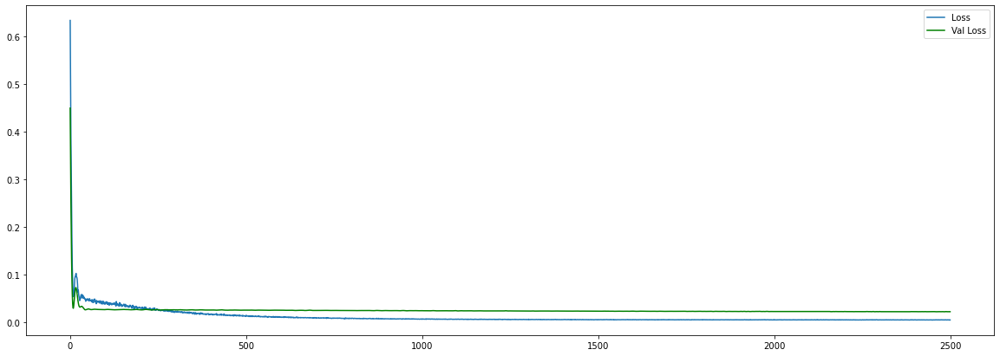

final loss: 0.004152966197580099
final val_loss: 0.021505245938897133
Get best hyperparameter for simple LSTM


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


INFO:tensorflow:Oracle triggered exit
Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 1, 5)]            0         
_________________________________________________________________
lstm (LSTM)                  (None, 1, 128)            68608     
_________________________________________________________________
lstm_1 (LSTM)                (None, 1, 128)            131584    
_________________________________________________________________
lstm_2 (LSTM)                (None, 128)               131584    
_________________________________________________________________
dense (Dense)                (None, 8)                 1032      
_________________________________________________________________
dense_1 (Dense)              (None, 8)                 72        
_________________________________________________________________
dense_2 (Dense)        

1/1 [==============================] - ETA: 0s - loss: 0.1434 - mae: 0.334 - 0s 222ms/step - loss: 0.1434 - mae: 0.3345 - val_loss: 0.1404 - val_mae: 0.3110

Epoch 00027: val_loss did not improve from 0.04941
Epoch 28/2500
1/1 [==============================] - ETA: 0s - loss: 0.1409 - mae: 0.333 - 0s 220ms/step - loss: 0.1409 - mae: 0.3339 - val_loss: 0.1176 - val_mae: 0.2836

Epoch 00028: val_loss did not improve from 0.04941
Epoch 29/2500
1/1 [==============================] - ETA: 0s - loss: 0.1147 - mae: 0.301 - 0s 194ms/step - loss: 0.1147 - mae: 0.3015 - val_loss: 0.0877 - val_mae: 0.2402

Epoch 00029: val_loss did not improve from 0.04941
Epoch 30/2500
1/1 [==============================] - ETA: 0s - loss: 0.0788 - mae: 0.248 - 0s 199ms/step - loss: 0.0788 - mae: 0.2487 - val_loss: 0.0613 - val_mae: 0.1910

Epoch 00030: val_loss did not improve from 0.04941
Epoch 31/2500
1/1 [==============================] - ETA: 0s - loss: 0.0455 - mae: 0.185 - 0s 213ms/step - loss: 0.0455 - 

Epoch 00062: val_loss did not improve from 0.03728
Epoch 63/2500
1/1 [==============================] - ETA: 0s - loss: 0.0066 - mae: 0.060 - 0s 200ms/step - loss: 0.0066 - mae: 0.0606 - val_loss: 0.0399 - val_mae: 0.1237

Epoch 00063: val_loss did not improve from 0.03728
Epoch 64/2500
1/1 [==============================] - ETA: 0s - loss: 0.0066 - mae: 0.061 - 0s 213ms/step - loss: 0.0066 - mae: 0.0612 - val_loss: 0.0387 - val_mae: 0.1222

Epoch 00064: val_loss did not improve from 0.03728
Epoch 65/2500
1/1 [==============================] - ETA: 0s - loss: 0.0062 - mae: 0.059 - 0s 195ms/step - loss: 0.0062 - mae: 0.0595 - val_loss: 0.0372 - val_mae: 0.1201

Epoch 00065: val_loss improved from 0.03728 to 0.03722, saving model to FPT_1H_LSTM.hdf5
Epoch 66/2500
1/1 [==============================] - ETA: 0s - loss: 0.0056 - mae: 0.055 - 0s 200ms/step - loss: 0.0056 - mae: 0.0559 - val_loss: 0.0357 - val_mae: 0.1176

Epoch 00066: val_loss improved from 0.03722 to 0.03571, saving model t

1/1 [==============================] - ETA: 0s - loss: 0.0031 - mae: 0.038 - 0s 224ms/step - loss: 0.0031 - mae: 0.0381 - val_loss: 0.0303 - val_mae: 0.1110

Epoch 00096: val_loss did not improve from 0.03029
Epoch 97/2500
1/1 [==============================] - ETA: 0s - loss: 0.0031 - mae: 0.037 - 0s 197ms/step - loss: 0.0031 - mae: 0.0379 - val_loss: 0.0303 - val_mae: 0.1109

Epoch 00097: val_loss did not improve from 0.03029
Epoch 98/2500
1/1 [==============================] - ETA: 0s - loss: 0.0031 - mae: 0.037 - 0s 202ms/step - loss: 0.0031 - mae: 0.0376 - val_loss: 0.0303 - val_mae: 0.1108

Epoch 00098: val_loss did not improve from 0.03029
Epoch 99/2500
1/1 [==============================] - ETA: 0s - loss: 0.0030 - mae: 0.037 - 0s 177ms/step - loss: 0.0030 - mae: 0.0373 - val_loss: 0.0303 - val_mae: 0.1106

Epoch 00099: val_loss did not improve from 0.03029
Epoch 100/2500
1/1 [==============================] - ETA: 0s - loss: 0.0030 - mae: 0.037 - 0s 175ms/step - loss: 0.0030 -


Epoch 00128: val_loss improved from 0.02909 to 0.02906, saving model to FPT_1H_LSTM.hdf5
Epoch 129/2500
1/1 [==============================] - ETA: 0s - loss: 0.0028 - mae: 0.036 - 0s 202ms/step - loss: 0.0028 - mae: 0.0360 - val_loss: 0.0290 - val_mae: 0.1084

Epoch 00129: val_loss improved from 0.02906 to 0.02903, saving model to FPT_1H_LSTM.hdf5
Epoch 130/2500
1/1 [==============================] - ETA: 0s - loss: 0.0028 - mae: 0.035 - 0s 201ms/step - loss: 0.0028 - mae: 0.0359 - val_loss: 0.0290 - val_mae: 0.1084

Epoch 00130: val_loss improved from 0.02903 to 0.02900, saving model to FPT_1H_LSTM.hdf5
Epoch 131/2500
1/1 [==============================] - ETA: 0s - loss: 0.0028 - mae: 0.035 - 0s 209ms/step - loss: 0.0028 - mae: 0.0359 - val_loss: 0.0290 - val_mae: 0.1085

Epoch 00131: val_loss improved from 0.02900 to 0.02899, saving model to FPT_1H_LSTM.hdf5
Epoch 132/2500
1/1 [==============================] - ETA: 0s - loss: 0.0028 - mae: 0.035 - 0s 218ms/step - loss: 0.0028 - m

Epoch 00159: val_loss improved from 0.02865 to 0.02864, saving model to FPT_1H_LSTM.hdf5
Epoch 160/2500
1/1 [==============================] - ETA: 0s - loss: 0.0028 - mae: 0.035 - 0s 186ms/step - loss: 0.0028 - mae: 0.0356 - val_loss: 0.0286 - val_mae: 0.1079

Epoch 00160: val_loss improved from 0.02864 to 0.02863, saving model to FPT_1H_LSTM.hdf5
Epoch 161/2500
1/1 [==============================] - ETA: 0s - loss: 0.0028 - mae: 0.035 - 0s 217ms/step - loss: 0.0028 - mae: 0.0356 - val_loss: 0.0286 - val_mae: 0.1078

Epoch 00161: val_loss improved from 0.02863 to 0.02861, saving model to FPT_1H_LSTM.hdf5
Epoch 162/2500
1/1 [==============================] - ETA: 0s - loss: 0.0028 - mae: 0.035 - 0s 217ms/step - loss: 0.0028 - mae: 0.0356 - val_loss: 0.0286 - val_mae: 0.1078

Epoch 00162: val_loss improved from 0.02861 to 0.02860, saving model to FPT_1H_LSTM.hdf5
Epoch 163/2500
1/1 [==============================] - ETA: 0s - loss: 0.0028 - mae: 0.035 - 0s 210ms/step - loss: 0.0028 - ma

Epoch 00190: val_loss improved from 0.02835 to 0.02834, saving model to FPT_1H_LSTM.hdf5
Epoch 191/2500
1/1 [==============================] - ETA: 0s - loss: 0.0028 - mae: 0.035 - 0s 219ms/step - loss: 0.0028 - mae: 0.0352 - val_loss: 0.0283 - val_mae: 0.1074

Epoch 00191: val_loss improved from 0.02834 to 0.02833, saving model to FPT_1H_LSTM.hdf5
Epoch 192/2500
1/1 [==============================] - ETA: 0s - loss: 0.0027 - mae: 0.035 - 0s 197ms/step - loss: 0.0027 - mae: 0.0352 - val_loss: 0.0283 - val_mae: 0.1074

Epoch 00192: val_loss improved from 0.02833 to 0.02832, saving model to FPT_1H_LSTM.hdf5
Epoch 193/2500
1/1 [==============================] - ETA: 0s - loss: 0.0027 - mae: 0.035 - 0s 202ms/step - loss: 0.0027 - mae: 0.0351 - val_loss: 0.0283 - val_mae: 0.1074

Epoch 00193: val_loss improved from 0.02832 to 0.02831, saving model to FPT_1H_LSTM.hdf5
Epoch 194/2500
1/1 [==============================] - ETA: 0s - loss: 0.0027 - mae: 0.035 - 0s 202ms/step - loss: 0.0027 - ma

Epoch 00221: val_loss improved from 0.02808 to 0.02807, saving model to FPT_1H_LSTM.hdf5
Epoch 222/2500
1/1 [==============================] - ETA: 0s - loss: 0.0027 - mae: 0.034 - 0s 198ms/step - loss: 0.0027 - mae: 0.0347 - val_loss: 0.0281 - val_mae: 0.1069

Epoch 00222: val_loss improved from 0.02807 to 0.02806, saving model to FPT_1H_LSTM.hdf5
Epoch 223/2500
1/1 [==============================] - ETA: 0s - loss: 0.0027 - mae: 0.034 - 0s 197ms/step - loss: 0.0027 - mae: 0.0347 - val_loss: 0.0281 - val_mae: 0.1069

Epoch 00223: val_loss improved from 0.02806 to 0.02805, saving model to FPT_1H_LSTM.hdf5
Epoch 224/2500
1/1 [==============================] - ETA: 0s - loss: 0.0027 - mae: 0.034 - 0s 208ms/step - loss: 0.0027 - mae: 0.0347 - val_loss: 0.0280 - val_mae: 0.1069

Epoch 00224: val_loss improved from 0.02805 to 0.02804, saving model to FPT_1H_LSTM.hdf5
Epoch 225/2500
1/1 [==============================] - ETA: 0s - loss: 0.0027 - mae: 0.034 - 0s 236ms/step - loss: 0.0027 - ma

Epoch 00252: val_loss improved from 0.02781 to 0.02780, saving model to FPT_1H_LSTM.hdf5
Epoch 253/2500
1/1 [==============================] - ETA: 0s - loss: 0.0027 - mae: 0.034 - 0s 209ms/step - loss: 0.0027 - mae: 0.0342 - val_loss: 0.0278 - val_mae: 0.1064

Epoch 00253: val_loss improved from 0.02780 to 0.02779, saving model to FPT_1H_LSTM.hdf5
Epoch 254/2500
1/1 [==============================] - ETA: 0s - loss: 0.0027 - mae: 0.034 - 0s 218ms/step - loss: 0.0027 - mae: 0.0342 - val_loss: 0.0278 - val_mae: 0.1064

Epoch 00254: val_loss improved from 0.02779 to 0.02778, saving model to FPT_1H_LSTM.hdf5
Epoch 255/2500
1/1 [==============================] - ETA: 0s - loss: 0.0027 - mae: 0.034 - 0s 208ms/step - loss: 0.0027 - mae: 0.0342 - val_loss: 0.0278 - val_mae: 0.1064

Epoch 00255: val_loss improved from 0.02778 to 0.02778, saving model to FPT_1H_LSTM.hdf5
Epoch 256/2500
1/1 [==============================] - ETA: 0s - loss: 0.0027 - mae: 0.034 - 0s 194ms/step - loss: 0.0027 - ma

Epoch 00283: val_loss improved from 0.02755 to 0.02754, saving model to FPT_1H_LSTM.hdf5
Epoch 284/2500
1/1 [==============================] - ETA: 0s - loss: 0.0026 - mae: 0.033 - 0s 205ms/step - loss: 0.0026 - mae: 0.0338 - val_loss: 0.0275 - val_mae: 0.1059

Epoch 00284: val_loss improved from 0.02754 to 0.02753, saving model to FPT_1H_LSTM.hdf5
Epoch 285/2500
1/1 [==============================] - ETA: 0s - loss: 0.0026 - mae: 0.033 - 0s 202ms/step - loss: 0.0026 - mae: 0.0338 - val_loss: 0.0275 - val_mae: 0.1059

Epoch 00285: val_loss improved from 0.02753 to 0.02752, saving model to FPT_1H_LSTM.hdf5
Epoch 286/2500
1/1 [==============================] - ETA: 0s - loss: 0.0026 - mae: 0.033 - 0s 200ms/step - loss: 0.0026 - mae: 0.0337 - val_loss: 0.0275 - val_mae: 0.1059

Epoch 00286: val_loss improved from 0.02752 to 0.02752, saving model to FPT_1H_LSTM.hdf5
Epoch 287/2500
1/1 [==============================] - ETA: 0s - loss: 0.0026 - mae: 0.033 - 0s 205ms/step - loss: 0.0026 - ma

Epoch 00314: val_loss improved from 0.02731 to 0.02730, saving model to FPT_1H_LSTM.hdf5
Epoch 315/2500
1/1 [==============================] - ETA: 0s - loss: 0.0026 - mae: 0.033 - 0s 201ms/step - loss: 0.0026 - mae: 0.0334 - val_loss: 0.0273 - val_mae: 0.1054

Epoch 00315: val_loss improved from 0.02730 to 0.02729, saving model to FPT_1H_LSTM.hdf5
Epoch 316/2500
1/1 [==============================] - ETA: 0s - loss: 0.0026 - mae: 0.033 - 0s 215ms/step - loss: 0.0026 - mae: 0.0334 - val_loss: 0.0273 - val_mae: 0.1054

Epoch 00316: val_loss improved from 0.02729 to 0.02728, saving model to FPT_1H_LSTM.hdf5
Epoch 317/2500
1/1 [==============================] - ETA: 0s - loss: 0.0026 - mae: 0.033 - 0s 205ms/step - loss: 0.0026 - mae: 0.0333 - val_loss: 0.0273 - val_mae: 0.1054

Epoch 00317: val_loss improved from 0.02728 to 0.02728, saving model to FPT_1H_LSTM.hdf5
Epoch 318/2500
1/1 [==============================] - ETA: 0s - loss: 0.0026 - mae: 0.033 - 0s 213ms/step - loss: 0.0026 - ma

Epoch 00345: val_loss improved from 0.02708 to 0.02708, saving model to FPT_1H_LSTM.hdf5
Epoch 346/2500
1/1 [==============================] - ETA: 0s - loss: 0.0026 - mae: 0.033 - 0s 222ms/step - loss: 0.0026 - mae: 0.0330 - val_loss: 0.0271 - val_mae: 0.1049

Epoch 00346: val_loss improved from 0.02708 to 0.02707, saving model to FPT_1H_LSTM.hdf5
Epoch 347/2500
1/1 [==============================] - ETA: 0s - loss: 0.0026 - mae: 0.033 - 0s 209ms/step - loss: 0.0026 - mae: 0.0330 - val_loss: 0.0271 - val_mae: 0.1049

Epoch 00347: val_loss improved from 0.02707 to 0.02706, saving model to FPT_1H_LSTM.hdf5
Epoch 348/2500
1/1 [==============================] - ETA: 0s - loss: 0.0026 - mae: 0.033 - 0s 201ms/step - loss: 0.0026 - mae: 0.0330 - val_loss: 0.0271 - val_mae: 0.1049

Epoch 00348: val_loss improved from 0.02706 to 0.02706, saving model to FPT_1H_LSTM.hdf5
Epoch 349/2500
1/1 [==============================] - ETA: 0s - loss: 0.0026 - mae: 0.033 - 0s 199ms/step - loss: 0.0026 - ma

Epoch 00376: val_loss improved from 0.02689 to 0.02688, saving model to FPT_1H_LSTM.hdf5
Epoch 377/2500
1/1 [==============================] - ETA: 0s - loss: 0.0025 - mae: 0.032 - 0s 207ms/step - loss: 0.0025 - mae: 0.0327 - val_loss: 0.0269 - val_mae: 0.1045

Epoch 00377: val_loss improved from 0.02688 to 0.02688, saving model to FPT_1H_LSTM.hdf5
Epoch 378/2500
1/1 [==============================] - ETA: 0s - loss: 0.0025 - mae: 0.032 - 0s 186ms/step - loss: 0.0025 - mae: 0.0327 - val_loss: 0.0269 - val_mae: 0.1045

Epoch 00378: val_loss improved from 0.02688 to 0.02687, saving model to FPT_1H_LSTM.hdf5
Epoch 379/2500
1/1 [==============================] - ETA: 0s - loss: 0.0025 - mae: 0.032 - 0s 192ms/step - loss: 0.0025 - mae: 0.0327 - val_loss: 0.0269 - val_mae: 0.1045

Epoch 00379: val_loss improved from 0.02687 to 0.02687, saving model to FPT_1H_LSTM.hdf5
Epoch 380/2500
1/1 [==============================] - ETA: 0s - loss: 0.0025 - mae: 0.032 - 0s 224ms/step - loss: 0.0025 - ma

Epoch 00407: val_loss improved from 0.02672 to 0.02672, saving model to FPT_1H_LSTM.hdf5
Epoch 408/2500
1/1 [==============================] - ETA: 0s - loss: 0.0025 - mae: 0.032 - 0s 86ms/step - loss: 0.0025 - mae: 0.0324 - val_loss: 0.0267 - val_mae: 0.1041

Epoch 00408: val_loss improved from 0.02672 to 0.02671, saving model to FPT_1H_LSTM.hdf5
Epoch 409/2500
1/1 [==============================] - ETA: 0s - loss: 0.0025 - mae: 0.032 - 0s 68ms/step - loss: 0.0025 - mae: 0.0324 - val_loss: 0.0267 - val_mae: 0.1041

Epoch 00409: val_loss improved from 0.02671 to 0.02671, saving model to FPT_1H_LSTM.hdf5
Epoch 410/2500
1/1 [==============================] - ETA: 0s - loss: 0.0025 - mae: 0.032 - 0s 84ms/step - loss: 0.0025 - mae: 0.0324 - val_loss: 0.0267 - val_mae: 0.1041

Epoch 00410: val_loss improved from 0.02671 to 0.02670, saving model to FPT_1H_LSTM.hdf5
Epoch 411/2500
1/1 [==============================] - ETA: 0s - loss: 0.0025 - mae: 0.032 - 0s 69ms/step - loss: 0.0025 - mae: 0

Epoch 00438: val_loss improved from 0.02658 to 0.02657, saving model to FPT_1H_LSTM.hdf5
Epoch 439/2500
1/1 [==============================] - ETA: 0s - loss: 0.0025 - mae: 0.032 - 0s 212ms/step - loss: 0.0025 - mae: 0.0322 - val_loss: 0.0266 - val_mae: 0.1037

Epoch 00439: val_loss improved from 0.02657 to 0.02657, saving model to FPT_1H_LSTM.hdf5
Epoch 440/2500
1/1 [==============================] - ETA: 0s - loss: 0.0025 - mae: 0.032 - 0s 178ms/step - loss: 0.0025 - mae: 0.0322 - val_loss: 0.0266 - val_mae: 0.1037

Epoch 00440: val_loss improved from 0.02657 to 0.02657, saving model to FPT_1H_LSTM.hdf5
Epoch 441/2500
1/1 [==============================] - ETA: 0s - loss: 0.0025 - mae: 0.032 - 0s 191ms/step - loss: 0.0025 - mae: 0.0322 - val_loss: 0.0266 - val_mae: 0.1037

Epoch 00441: val_loss improved from 0.02657 to 0.02656, saving model to FPT_1H_LSTM.hdf5
Epoch 442/2500
1/1 [==============================] - ETA: 0s - loss: 0.0025 - mae: 0.032 - 0s 147ms/step - loss: 0.0025 - ma

Epoch 00469: val_loss improved from 0.02645 to 0.02645, saving model to FPT_1H_LSTM.hdf5
Epoch 470/2500
1/1 [==============================] - ETA: 0s - loss: 0.0025 - mae: 0.032 - 0s 187ms/step - loss: 0.0025 - mae: 0.0320 - val_loss: 0.0264 - val_mae: 0.1034

Epoch 00470: val_loss improved from 0.02645 to 0.02645, saving model to FPT_1H_LSTM.hdf5
Epoch 471/2500
1/1 [==============================] - ETA: 0s - loss: 0.0025 - mae: 0.032 - 0s 209ms/step - loss: 0.0025 - mae: 0.0320 - val_loss: 0.0264 - val_mae: 0.1033

Epoch 00471: val_loss improved from 0.02645 to 0.02644, saving model to FPT_1H_LSTM.hdf5
Epoch 472/2500
1/1 [==============================] - ETA: 0s - loss: 0.0025 - mae: 0.032 - 0s 183ms/step - loss: 0.0025 - mae: 0.0320 - val_loss: 0.0264 - val_mae: 0.1033

Epoch 00472: val_loss improved from 0.02644 to 0.02644, saving model to FPT_1H_LSTM.hdf5
Epoch 473/2500
1/1 [==============================] - ETA: 0s - loss: 0.0025 - mae: 0.032 - 0s 186ms/step - loss: 0.0025 - ma

Epoch 00500: val_loss improved from 0.02635 to 0.02634, saving model to FPT_1H_LSTM.hdf5
Epoch 501/2500
1/1 [==============================] - ETA: 0s - loss: 0.0025 - mae: 0.031 - 0s 270ms/step - loss: 0.0025 - mae: 0.0319 - val_loss: 0.0263 - val_mae: 0.1030

Epoch 00501: val_loss improved from 0.02634 to 0.02634, saving model to FPT_1H_LSTM.hdf5
Epoch 502/2500
1/1 [==============================] - ETA: 0s - loss: 0.0025 - mae: 0.031 - 0s 266ms/step - loss: 0.0025 - mae: 0.0319 - val_loss: 0.0263 - val_mae: 0.1030

Epoch 00502: val_loss improved from 0.02634 to 0.02634, saving model to FPT_1H_LSTM.hdf5
Epoch 503/2500
1/1 [==============================] - ETA: 0s - loss: 0.0025 - mae: 0.031 - 0s 204ms/step - loss: 0.0025 - mae: 0.0319 - val_loss: 0.0263 - val_mae: 0.1030

Epoch 00503: val_loss improved from 0.02634 to 0.02633, saving model to FPT_1H_LSTM.hdf5
Epoch 504/2500
1/1 [==============================] - ETA: 0s - loss: 0.0025 - mae: 0.031 - 0s 213ms/step - loss: 0.0025 - ma

Epoch 00531: val_loss improved from 0.02625 to 0.02624, saving model to FPT_1H_LSTM.hdf5
Epoch 532/2500
1/1 [==============================] - ETA: 0s - loss: 0.0025 - mae: 0.031 - 0s 178ms/step - loss: 0.0025 - mae: 0.0318 - val_loss: 0.0262 - val_mae: 0.1028

Epoch 00532: val_loss improved from 0.02624 to 0.02624, saving model to FPT_1H_LSTM.hdf5
Epoch 533/2500
1/1 [==============================] - ETA: 0s - loss: 0.0025 - mae: 0.031 - 0s 195ms/step - loss: 0.0025 - mae: 0.0318 - val_loss: 0.0262 - val_mae: 0.1027

Epoch 00533: val_loss improved from 0.02624 to 0.02624, saving model to FPT_1H_LSTM.hdf5
Epoch 534/2500
1/1 [==============================] - ETA: 0s - loss: 0.0025 - mae: 0.031 - 0s 186ms/step - loss: 0.0025 - mae: 0.0318 - val_loss: 0.0262 - val_mae: 0.1027

Epoch 00534: val_loss improved from 0.02624 to 0.02623, saving model to FPT_1H_LSTM.hdf5
Epoch 535/2500
1/1 [==============================] - ETA: 0s - loss: 0.0025 - mae: 0.031 - 0s 183ms/step - loss: 0.0025 - ma

Epoch 00562: val_loss improved from 0.02615 to 0.02615, saving model to FPT_1H_LSTM.hdf5
Epoch 563/2500
1/1 [==============================] - ETA: 0s - loss: 0.0025 - mae: 0.031 - 0s 172ms/step - loss: 0.0025 - mae: 0.0318 - val_loss: 0.0261 - val_mae: 0.1025

Epoch 00563: val_loss improved from 0.02615 to 0.02615, saving model to FPT_1H_LSTM.hdf5
Epoch 564/2500
1/1 [==============================] - ETA: 0s - loss: 0.0025 - mae: 0.031 - 0s 167ms/step - loss: 0.0025 - mae: 0.0317 - val_loss: 0.0261 - val_mae: 0.1025

Epoch 00564: val_loss improved from 0.02615 to 0.02615, saving model to FPT_1H_LSTM.hdf5
Epoch 565/2500
1/1 [==============================] - ETA: 0s - loss: 0.0025 - mae: 0.031 - 0s 180ms/step - loss: 0.0025 - mae: 0.0317 - val_loss: 0.0261 - val_mae: 0.1025

Epoch 00565: val_loss improved from 0.02615 to 0.02614, saving model to FPT_1H_LSTM.hdf5
Epoch 566/2500
1/1 [==============================] - ETA: 0s - loss: 0.0025 - mae: 0.031 - 0s 203ms/step - loss: 0.0025 - ma

Epoch 00593: val_loss improved from 0.02607 to 0.02606, saving model to FPT_1H_LSTM.hdf5
Epoch 594/2500
1/1 [==============================] - ETA: 0s - loss: 0.0025 - mae: 0.031 - 0s 188ms/step - loss: 0.0025 - mae: 0.0317 - val_loss: 0.0261 - val_mae: 0.1022

Epoch 00594: val_loss improved from 0.02606 to 0.02606, saving model to FPT_1H_LSTM.hdf5
Epoch 595/2500
1/1 [==============================] - ETA: 0s - loss: 0.0025 - mae: 0.031 - 0s 198ms/step - loss: 0.0025 - mae: 0.0317 - val_loss: 0.0261 - val_mae: 0.1022

Epoch 00595: val_loss improved from 0.02606 to 0.02606, saving model to FPT_1H_LSTM.hdf5
Epoch 596/2500
1/1 [==============================] - ETA: 0s - loss: 0.0025 - mae: 0.031 - 0s 200ms/step - loss: 0.0025 - mae: 0.0317 - val_loss: 0.0261 - val_mae: 0.1022

Epoch 00596: val_loss improved from 0.02606 to 0.02606, saving model to FPT_1H_LSTM.hdf5
Epoch 597/2500
1/1 [==============================] - ETA: 0s - loss: 0.0025 - mae: 0.031 - 0s 197ms/step - loss: 0.0025 - ma

Epoch 00624: val_loss improved from 0.02598 to 0.02598, saving model to FPT_1H_LSTM.hdf5
Epoch 625/2500
1/1 [==============================] - ETA: 0s - loss: 0.0024 - mae: 0.031 - 0s 146ms/step - loss: 0.0024 - mae: 0.0316 - val_loss: 0.0260 - val_mae: 0.1020

Epoch 00625: val_loss improved from 0.02598 to 0.02597, saving model to FPT_1H_LSTM.hdf5
Epoch 626/2500
1/1 [==============================] - ETA: 0s - loss: 0.0024 - mae: 0.031 - 0s 167ms/step - loss: 0.0024 - mae: 0.0316 - val_loss: 0.0260 - val_mae: 0.1020

Epoch 00626: val_loss improved from 0.02597 to 0.02597, saving model to FPT_1H_LSTM.hdf5
Epoch 627/2500
1/1 [==============================] - ETA: 0s - loss: 0.0024 - mae: 0.031 - 0s 195ms/step - loss: 0.0024 - mae: 0.0316 - val_loss: 0.0260 - val_mae: 0.1020

Epoch 00627: val_loss improved from 0.02597 to 0.02597, saving model to FPT_1H_LSTM.hdf5
Epoch 628/2500
1/1 [==============================] - ETA: 0s - loss: 0.0024 - mae: 0.031 - 0s 175ms/step - loss: 0.0024 - ma

Epoch 00655: val_loss improved from 0.02589 to 0.02589, saving model to FPT_1H_LSTM.hdf5
Epoch 656/2500
1/1 [==============================] - ETA: 0s - loss: 0.0024 - mae: 0.031 - 0s 148ms/step - loss: 0.0024 - mae: 0.0316 - val_loss: 0.0259 - val_mae: 0.1017

Epoch 00656: val_loss improved from 0.02589 to 0.02589, saving model to FPT_1H_LSTM.hdf5
Epoch 657/2500
1/1 [==============================] - ETA: 0s - loss: 0.0024 - mae: 0.031 - 0s 281ms/step - loss: 0.0024 - mae: 0.0316 - val_loss: 0.0259 - val_mae: 0.1017

Epoch 00657: val_loss improved from 0.02589 to 0.02588, saving model to FPT_1H_LSTM.hdf5
Epoch 658/2500
1/1 [==============================] - ETA: 0s - loss: 0.0024 - mae: 0.031 - 0s 232ms/step - loss: 0.0024 - mae: 0.0316 - val_loss: 0.0259 - val_mae: 0.1017

Epoch 00658: val_loss improved from 0.02588 to 0.02588, saving model to FPT_1H_LSTM.hdf5
Epoch 659/2500
1/1 [==============================] - ETA: 0s - loss: 0.0024 - mae: 0.031 - 0s 214ms/step - loss: 0.0024 - ma

Epoch 00686: val_loss improved from 0.02580 to 0.02580, saving model to FPT_1H_LSTM.hdf5
Epoch 687/2500
1/1 [==============================] - ETA: 0s - loss: 0.0024 - mae: 0.031 - 0s 238ms/step - loss: 0.0024 - mae: 0.0315 - val_loss: 0.0258 - val_mae: 0.1015

Epoch 00687: val_loss improved from 0.02580 to 0.02580, saving model to FPT_1H_LSTM.hdf5
Epoch 688/2500
1/1 [==============================] - ETA: 0s - loss: 0.0024 - mae: 0.031 - 0s 176ms/step - loss: 0.0024 - mae: 0.0315 - val_loss: 0.0258 - val_mae: 0.1015

Epoch 00688: val_loss improved from 0.02580 to 0.02580, saving model to FPT_1H_LSTM.hdf5
Epoch 689/2500
1/1 [==============================] - ETA: 0s - loss: 0.0024 - mae: 0.031 - 0s 174ms/step - loss: 0.0024 - mae: 0.0315 - val_loss: 0.0258 - val_mae: 0.1015

Epoch 00689: val_loss improved from 0.02580 to 0.02579, saving model to FPT_1H_LSTM.hdf5
Epoch 690/2500
1/1 [==============================] - ETA: 0s - loss: 0.0024 - mae: 0.031 - 0s 206ms/step - loss: 0.0024 - ma

Epoch 00717: val_loss improved from 0.02571 to 0.02571, saving model to FPT_1H_LSTM.hdf5
Epoch 718/2500
1/1 [==============================] - ETA: 0s - loss: 0.0024 - mae: 0.031 - 0s 159ms/step - loss: 0.0024 - mae: 0.0315 - val_loss: 0.0257 - val_mae: 0.1013

Epoch 00718: val_loss improved from 0.02571 to 0.02571, saving model to FPT_1H_LSTM.hdf5
Epoch 719/2500
1/1 [==============================] - ETA: 0s - loss: 0.0024 - mae: 0.031 - 0s 166ms/step - loss: 0.0024 - mae: 0.0314 - val_loss: 0.0257 - val_mae: 0.1013

Epoch 00719: val_loss improved from 0.02571 to 0.02571, saving model to FPT_1H_LSTM.hdf5
Epoch 720/2500
1/1 [==============================] - ETA: 0s - loss: 0.0024 - mae: 0.031 - 0s 87ms/step - loss: 0.0024 - mae: 0.0314 - val_loss: 0.0257 - val_mae: 0.1012

Epoch 00720: val_loss improved from 0.02571 to 0.02570, saving model to FPT_1H_LSTM.hdf5
Epoch 721/2500
1/1 [==============================] - ETA: 0s - loss: 0.0024 - mae: 0.031 - 0s 102ms/step - loss: 0.0024 - mae

Epoch 749/2500
1/1 [==============================] - ETA: 0s - loss: 0.0024 - mae: 0.031 - 0s 104ms/step - loss: 0.0024 - mae: 0.0314 - val_loss: 0.0256 - val_mae: 0.1010

Epoch 00749: val_loss improved from 0.02562 to 0.02561, saving model to FPT_1H_LSTM.hdf5
Epoch 750/2500
1/1 [==============================] - ETA: 0s - loss: 0.0024 - mae: 0.031 - 0s 99ms/step - loss: 0.0024 - mae: 0.0314 - val_loss: 0.0256 - val_mae: 0.1010

Epoch 00750: val_loss improved from 0.02561 to 0.02561, saving model to FPT_1H_LSTM.hdf5
Epoch 751/2500
1/1 [==============================] - ETA: 0s - loss: 0.0024 - mae: 0.031 - 0s 95ms/step - loss: 0.0024 - mae: 0.0314 - val_loss: 0.0256 - val_mae: 0.1010

Epoch 00751: val_loss improved from 0.02561 to 0.02561, saving model to FPT_1H_LSTM.hdf5
Epoch 752/2500
1/1 [==============================] - ETA: 0s - loss: 0.0024 - mae: 0.031 - 0s 90ms/step - loss: 0.0024 - mae: 0.0314 - val_loss: 0.0256 - val_mae: 0.1010

Epoch 00752: val_loss improved from 0.02561 


Epoch 00780: val_loss improved from 0.02552 to 0.02552, saving model to FPT_1H_LSTM.hdf5
Epoch 781/2500
1/1 [==============================] - ETA: 0s - loss: 0.0024 - mae: 0.031 - 0s 87ms/step - loss: 0.0024 - mae: 0.0313 - val_loss: 0.0255 - val_mae: 0.1008

Epoch 00781: val_loss improved from 0.02552 to 0.02551, saving model to FPT_1H_LSTM.hdf5
Epoch 782/2500
1/1 [==============================] - ETA: 0s - loss: 0.0024 - mae: 0.031 - 0s 87ms/step - loss: 0.0024 - mae: 0.0313 - val_loss: 0.0255 - val_mae: 0.1008

Epoch 00782: val_loss improved from 0.02551 to 0.02551, saving model to FPT_1H_LSTM.hdf5
Epoch 783/2500
1/1 [==============================] - ETA: 0s - loss: 0.0024 - mae: 0.031 - 0s 82ms/step - loss: 0.0024 - mae: 0.0313 - val_loss: 0.0255 - val_mae: 0.1008

Epoch 00783: val_loss improved from 0.02551 to 0.02551, saving model to FPT_1H_LSTM.hdf5
Epoch 784/2500
1/1 [==============================] - ETA: 0s - loss: 0.0024 - mae: 0.031 - 0s 87ms/step - loss: 0.0024 - mae: 

Epoch 812/2500
1/1 [==============================] - ETA: 0s - loss: 0.0024 - mae: 0.031 - 0s 87ms/step - loss: 0.0024 - mae: 0.0313 - val_loss: 0.0254 - val_mae: 0.1005

Epoch 00812: val_loss improved from 0.02541 to 0.02541, saving model to FPT_1H_LSTM.hdf5
Epoch 813/2500
1/1 [==============================] - ETA: 0s - loss: 0.0024 - mae: 0.031 - 0s 86ms/step - loss: 0.0024 - mae: 0.0313 - val_loss: 0.0254 - val_mae: 0.1005

Epoch 00813: val_loss improved from 0.02541 to 0.02541, saving model to FPT_1H_LSTM.hdf5
Epoch 814/2500
1/1 [==============================] - ETA: 0s - loss: 0.0024 - mae: 0.031 - 0s 80ms/step - loss: 0.0024 - mae: 0.0313 - val_loss: 0.0254 - val_mae: 0.1005

Epoch 00814: val_loss improved from 0.02541 to 0.02540, saving model to FPT_1H_LSTM.hdf5
Epoch 815/2500
1/1 [==============================] - ETA: 0s - loss: 0.0024 - mae: 0.031 - 0s 96ms/step - loss: 0.0024 - mae: 0.0313 - val_loss: 0.0254 - val_mae: 0.1005

Epoch 00815: val_loss improved from 0.02540 t


Epoch 00843: val_loss improved from 0.02530 to 0.02530, saving model to FPT_1H_LSTM.hdf5
Epoch 844/2500
1/1 [==============================] - ETA: 0s - loss: 0.0024 - mae: 0.031 - 0s 79ms/step - loss: 0.0024 - mae: 0.0312 - val_loss: 0.0253 - val_mae: 0.1002

Epoch 00844: val_loss improved from 0.02530 to 0.02530, saving model to FPT_1H_LSTM.hdf5
Epoch 845/2500
1/1 [==============================] - ETA: 0s - loss: 0.0024 - mae: 0.031 - 0s 85ms/step - loss: 0.0024 - mae: 0.0312 - val_loss: 0.0253 - val_mae: 0.1002

Epoch 00845: val_loss improved from 0.02530 to 0.02529, saving model to FPT_1H_LSTM.hdf5
Epoch 846/2500
1/1 [==============================] - ETA: 0s - loss: 0.0024 - mae: 0.031 - 0s 92ms/step - loss: 0.0024 - mae: 0.0312 - val_loss: 0.0253 - val_mae: 0.1002

Epoch 00846: val_loss improved from 0.02529 to 0.02529, saving model to FPT_1H_LSTM.hdf5
Epoch 847/2500
1/1 [==============================] - ETA: 0s - loss: 0.0024 - mae: 0.031 - 0s 78ms/step - loss: 0.0024 - mae: 

Epoch 875/2500
1/1 [==============================] - ETA: 0s - loss: 0.0024 - mae: 0.031 - 0s 101ms/step - loss: 0.0024 - mae: 0.0311 - val_loss: 0.0252 - val_mae: 0.1000

Epoch 00875: val_loss improved from 0.02518 to 0.02518, saving model to FPT_1H_LSTM.hdf5
Epoch 876/2500
1/1 [==============================] - ETA: 0s - loss: 0.0024 - mae: 0.031 - 0s 88ms/step - loss: 0.0024 - mae: 0.0311 - val_loss: 0.0252 - val_mae: 0.1000

Epoch 00876: val_loss improved from 0.02518 to 0.02518, saving model to FPT_1H_LSTM.hdf5
Epoch 877/2500
1/1 [==============================] - ETA: 0s - loss: 0.0024 - mae: 0.031 - 0s 114ms/step - loss: 0.0024 - mae: 0.0311 - val_loss: 0.0252 - val_mae: 0.0999

Epoch 00877: val_loss improved from 0.02518 to 0.02517, saving model to FPT_1H_LSTM.hdf5
Epoch 878/2500
1/1 [==============================] - ETA: 0s - loss: 0.0024 - mae: 0.031 - 0s 88ms/step - loss: 0.0024 - mae: 0.0311 - val_loss: 0.0252 - val_mae: 0.0999

Epoch 00878: val_loss improved from 0.02517


Epoch 00906: val_loss improved from 0.02506 to 0.02505, saving model to FPT_1H_LSTM.hdf5
Epoch 907/2500
1/1 [==============================] - ETA: 0s - loss: 0.0024 - mae: 0.031 - 0s 78ms/step - loss: 0.0024 - mae: 0.0310 - val_loss: 0.0251 - val_mae: 0.0997

Epoch 00907: val_loss improved from 0.02505 to 0.02505, saving model to FPT_1H_LSTM.hdf5
Epoch 908/2500
1/1 [==============================] - ETA: 0s - loss: 0.0024 - mae: 0.031 - 0s 86ms/step - loss: 0.0024 - mae: 0.0310 - val_loss: 0.0250 - val_mae: 0.0996

Epoch 00908: val_loss improved from 0.02505 to 0.02505, saving model to FPT_1H_LSTM.hdf5
Epoch 909/2500
1/1 [==============================] - ETA: 0s - loss: 0.0024 - mae: 0.031 - 0s 80ms/step - loss: 0.0024 - mae: 0.0310 - val_loss: 0.0250 - val_mae: 0.0996

Epoch 00909: val_loss improved from 0.02505 to 0.02504, saving model to FPT_1H_LSTM.hdf5
Epoch 910/2500
1/1 [==============================] - ETA: 0s - loss: 0.0024 - mae: 0.031 - 0s 81ms/step - loss: 0.0024 - mae: 

Epoch 00937: val_loss improved from 0.02493 to 0.02492, saving model to FPT_1H_LSTM.hdf5
Epoch 938/2500
1/1 [==============================] - ETA: 0s - loss: 0.0024 - mae: 0.031 - 0s 101ms/step - loss: 0.0024 - mae: 0.0310 - val_loss: 0.0249 - val_mae: 0.0993

Epoch 00938: val_loss improved from 0.02492 to 0.02492, saving model to FPT_1H_LSTM.hdf5
Epoch 939/2500
1/1 [==============================] - ETA: 0s - loss: 0.0024 - mae: 0.031 - 0s 92ms/step - loss: 0.0024 - mae: 0.0310 - val_loss: 0.0249 - val_mae: 0.0993

Epoch 00939: val_loss improved from 0.02492 to 0.02491, saving model to FPT_1H_LSTM.hdf5
Epoch 940/2500
1/1 [==============================] - ETA: 0s - loss: 0.0024 - mae: 0.031 - 0s 113ms/step - loss: 0.0024 - mae: 0.0310 - val_loss: 0.0249 - val_mae: 0.0993

Epoch 00940: val_loss improved from 0.02491 to 0.02491, saving model to FPT_1H_LSTM.hdf5
Epoch 941/2500
1/1 [==============================] - ETA: 0s - loss: 0.0024 - mae: 0.031 - 0s 95ms/step - loss: 0.0024 - mae:

Epoch 00968: val_loss improved from 0.02478 to 0.02478, saving model to FPT_1H_LSTM.hdf5
Epoch 969/2500
1/1 [==============================] - ETA: 0s - loss: 0.0024 - mae: 0.030 - 0s 105ms/step - loss: 0.0024 - mae: 0.0309 - val_loss: 0.0248 - val_mae: 0.0990

Epoch 00969: val_loss improved from 0.02478 to 0.02477, saving model to FPT_1H_LSTM.hdf5
Epoch 970/2500
1/1 [==============================] - ETA: 0s - loss: 0.0024 - mae: 0.030 - 0s 102ms/step - loss: 0.0024 - mae: 0.0309 - val_loss: 0.0248 - val_mae: 0.0990

Epoch 00970: val_loss improved from 0.02477 to 0.02477, saving model to FPT_1H_LSTM.hdf5
Epoch 971/2500
1/1 [==============================] - ETA: 0s - loss: 0.0024 - mae: 0.030 - 0s 100ms/step - loss: 0.0024 - mae: 0.0309 - val_loss: 0.0248 - val_mae: 0.0990

Epoch 00971: val_loss improved from 0.02477 to 0.02476, saving model to FPT_1H_LSTM.hdf5
Epoch 972/2500
1/1 [==============================] - ETA: 0s - loss: 0.0024 - mae: 0.030 - 0s 120ms/step - loss: 0.0024 - ma

Epoch 00999: val_loss improved from 0.02463 to 0.02462, saving model to FPT_1H_LSTM.hdf5
Epoch 1000/2500
1/1 [==============================] - ETA: 0s - loss: 0.0023 - mae: 0.030 - 0s 103ms/step - loss: 0.0023 - mae: 0.0308 - val_loss: 0.0246 - val_mae: 0.0987

Epoch 01000: val_loss improved from 0.02462 to 0.02462, saving model to FPT_1H_LSTM.hdf5
Epoch 1001/2500
1/1 [==============================] - ETA: 0s - loss: 0.0023 - mae: 0.030 - 0s 107ms/step - loss: 0.0023 - mae: 0.0308 - val_loss: 0.0246 - val_mae: 0.0986

Epoch 01001: val_loss improved from 0.02462 to 0.02461, saving model to FPT_1H_LSTM.hdf5
Epoch 1002/2500
1/1 [==============================] - ETA: 0s - loss: 0.0023 - mae: 0.030 - 0s 94ms/step - loss: 0.0023 - mae: 0.0308 - val_loss: 0.0246 - val_mae: 0.0986

Epoch 01002: val_loss improved from 0.02461 to 0.02461, saving model to FPT_1H_LSTM.hdf5
Epoch 1003/2500
1/1 [==============================] - ETA: 0s - loss: 0.0023 - mae: 0.030 - 0s 115ms/step - loss: 0.0023 -

Epoch 01030: val_loss improved from 0.02446 to 0.02446, saving model to FPT_1H_LSTM.hdf5
Epoch 1031/2500
1/1 [==============================] - ETA: 0s - loss: 0.0023 - mae: 0.030 - 0s 114ms/step - loss: 0.0023 - mae: 0.0307 - val_loss: 0.0245 - val_mae: 0.0983

Epoch 01031: val_loss improved from 0.02446 to 0.02445, saving model to FPT_1H_LSTM.hdf5
Epoch 1032/2500
1/1 [==============================] - ETA: 0s - loss: 0.0023 - mae: 0.030 - 0s 98ms/step - loss: 0.0023 - mae: 0.0307 - val_loss: 0.0244 - val_mae: 0.0983

Epoch 01032: val_loss improved from 0.02445 to 0.02445, saving model to FPT_1H_LSTM.hdf5
Epoch 1033/2500
1/1 [==============================] - ETA: 0s - loss: 0.0023 - mae: 0.030 - 0s 84ms/step - loss: 0.0023 - mae: 0.0307 - val_loss: 0.0244 - val_mae: 0.0983

Epoch 01033: val_loss improved from 0.02445 to 0.02444, saving model to FPT_1H_LSTM.hdf5
Epoch 1034/2500
1/1 [==============================] - ETA: 0s - loss: 0.0023 - mae: 0.030 - 0s 99ms/step - loss: 0.0023 - m

Epoch 01061: val_loss improved from 0.02428 to 0.02428, saving model to FPT_1H_LSTM.hdf5
Epoch 1062/2500
1/1 [==============================] - ETA: 0s - loss: 0.0023 - mae: 0.030 - 0s 232ms/step - loss: 0.0023 - mae: 0.0306 - val_loss: 0.0243 - val_mae: 0.0979

Epoch 01062: val_loss improved from 0.02428 to 0.02427, saving model to FPT_1H_LSTM.hdf5
Epoch 1063/2500
1/1 [==============================] - ETA: 0s - loss: 0.0023 - mae: 0.030 - 0s 150ms/step - loss: 0.0023 - mae: 0.0306 - val_loss: 0.0243 - val_mae: 0.0979

Epoch 01063: val_loss improved from 0.02427 to 0.02427, saving model to FPT_1H_LSTM.hdf5
Epoch 1064/2500
1/1 [==============================] - ETA: 0s - loss: 0.0023 - mae: 0.030 - 0s 159ms/step - loss: 0.0023 - mae: 0.0306 - val_loss: 0.0243 - val_mae: 0.0979

Epoch 01064: val_loss improved from 0.02427 to 0.02426, saving model to FPT_1H_LSTM.hdf5
Epoch 1065/2500
1/1 [==============================] - ETA: 0s - loss: 0.0023 - mae: 0.030 - 0s 180ms/step - loss: 0.0023 

Epoch 01092: val_loss improved from 0.02409 to 0.02409, saving model to FPT_1H_LSTM.hdf5
Epoch 1093/2500
1/1 [==============================] - ETA: 0s - loss: 0.0023 - mae: 0.030 - 0s 207ms/step - loss: 0.0023 - mae: 0.0305 - val_loss: 0.0241 - val_mae: 0.0975

Epoch 01093: val_loss improved from 0.02409 to 0.02408, saving model to FPT_1H_LSTM.hdf5
Epoch 1094/2500
1/1 [==============================] - ETA: 0s - loss: 0.0023 - mae: 0.030 - 0s 150ms/step - loss: 0.0023 - mae: 0.0305 - val_loss: 0.0241 - val_mae: 0.0975

Epoch 01094: val_loss improved from 0.02408 to 0.02408, saving model to FPT_1H_LSTM.hdf5
Epoch 1095/2500
1/1 [==============================] - ETA: 0s - loss: 0.0023 - mae: 0.030 - 0s 201ms/step - loss: 0.0023 - mae: 0.0305 - val_loss: 0.0241 - val_mae: 0.0974

Epoch 01095: val_loss improved from 0.02408 to 0.02407, saving model to FPT_1H_LSTM.hdf5
Epoch 1096/2500
1/1 [==============================] - ETA: 0s - loss: 0.0023 - mae: 0.030 - 0s 232ms/step - loss: 0.0023 

Epoch 01123: val_loss improved from 0.02389 to 0.02389, saving model to FPT_1H_LSTM.hdf5
Epoch 1124/2500
1/1 [==============================] - ETA: 0s - loss: 0.0023 - mae: 0.030 - 0s 92ms/step - loss: 0.0023 - mae: 0.0303 - val_loss: 0.0239 - val_mae: 0.0971

Epoch 01124: val_loss improved from 0.02389 to 0.02388, saving model to FPT_1H_LSTM.hdf5
Epoch 1125/2500
1/1 [==============================] - ETA: 0s - loss: 0.0023 - mae: 0.030 - 0s 177ms/step - loss: 0.0023 - mae: 0.0303 - val_loss: 0.0239 - val_mae: 0.0971

Epoch 01125: val_loss improved from 0.02388 to 0.02387, saving model to FPT_1H_LSTM.hdf5
Epoch 1126/2500
1/1 [==============================] - ETA: 0s - loss: 0.0023 - mae: 0.030 - 0s 129ms/step - loss: 0.0023 - mae: 0.0303 - val_loss: 0.0239 - val_mae: 0.0970

Epoch 01126: val_loss improved from 0.02387 to 0.02387, saving model to FPT_1H_LSTM.hdf5
Epoch 1127/2500
1/1 [==============================] - ETA: 0s - loss: 0.0023 - mae: 0.030 - 0s 143ms/step - loss: 0.0023 -

Epoch 01154: val_loss improved from 0.02368 to 0.02367, saving model to FPT_1H_LSTM.hdf5
Epoch 1155/2500
1/1 [==============================] - ETA: 0s - loss: 0.0023 - mae: 0.030 - 0s 141ms/step - loss: 0.0023 - mae: 0.0302 - val_loss: 0.0237 - val_mae: 0.0967

Epoch 01155: val_loss improved from 0.02367 to 0.02367, saving model to FPT_1H_LSTM.hdf5
Epoch 1156/2500
1/1 [==============================] - ETA: 0s - loss: 0.0023 - mae: 0.030 - 0s 108ms/step - loss: 0.0023 - mae: 0.0302 - val_loss: 0.0237 - val_mae: 0.0966

Epoch 01156: val_loss improved from 0.02367 to 0.02366, saving model to FPT_1H_LSTM.hdf5
Epoch 1157/2500
1/1 [==============================] - ETA: 0s - loss: 0.0023 - mae: 0.030 - 0s 121ms/step - loss: 0.0023 - mae: 0.0302 - val_loss: 0.0237 - val_mae: 0.0966

Epoch 01157: val_loss improved from 0.02366 to 0.02365, saving model to FPT_1H_LSTM.hdf5
Epoch 1158/2500
1/1 [==============================] - ETA: 0s - loss: 0.0023 - mae: 0.030 - 0s 101ms/step - loss: 0.0023 

Epoch 01185: val_loss improved from 0.02346 to 0.02346, saving model to FPT_1H_LSTM.hdf5
Epoch 1186/2500
1/1 [==============================] - ETA: 0s - loss: 0.0023 - mae: 0.030 - 0s 125ms/step - loss: 0.0023 - mae: 0.0301 - val_loss: 0.0235 - val_mae: 0.0963

Epoch 01186: val_loss improved from 0.02346 to 0.02345, saving model to FPT_1H_LSTM.hdf5
Epoch 1187/2500
1/1 [==============================] - ETA: 0s - loss: 0.0023 - mae: 0.030 - 0s 101ms/step - loss: 0.0023 - mae: 0.0301 - val_loss: 0.0234 - val_mae: 0.0962

Epoch 01187: val_loss improved from 0.02345 to 0.02344, saving model to FPT_1H_LSTM.hdf5
Epoch 1188/2500
1/1 [==============================] - ETA: 0s - loss: 0.0023 - mae: 0.030 - 0s 113ms/step - loss: 0.0023 - mae: 0.0301 - val_loss: 0.0234 - val_mae: 0.0962

Epoch 01188: val_loss improved from 0.02344 to 0.02344, saving model to FPT_1H_LSTM.hdf5
Epoch 1189/2500
1/1 [==============================] - ETA: 0s - loss: 0.0023 - mae: 0.030 - 0s 128ms/step - loss: 0.0023 

Epoch 01216: val_loss improved from 0.02325 to 0.02324, saving model to FPT_1H_LSTM.hdf5
Epoch 1217/2500
1/1 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.029 - 0s 107ms/step - loss: 0.0022 - mae: 0.0299 - val_loss: 0.0232 - val_mae: 0.0959

Epoch 01217: val_loss improved from 0.02324 to 0.02323, saving model to FPT_1H_LSTM.hdf5
Epoch 1218/2500
1/1 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.029 - 0s 100ms/step - loss: 0.0022 - mae: 0.0299 - val_loss: 0.0232 - val_mae: 0.0959

Epoch 01218: val_loss improved from 0.02323 to 0.02323, saving model to FPT_1H_LSTM.hdf5
Epoch 1219/2500
1/1 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.029 - 0s 109ms/step - loss: 0.0022 - mae: 0.0299 - val_loss: 0.0232 - val_mae: 0.0959

Epoch 01219: val_loss improved from 0.02323 to 0.02322, saving model to FPT_1H_LSTM.hdf5
Epoch 1220/2500
1/1 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.029 - 0s 102ms/step - loss: 0.0022 

Epoch 01247: val_loss improved from 0.02303 to 0.02303, saving model to FPT_1H_LSTM.hdf5
Epoch 1248/2500
1/1 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.029 - 0s 109ms/step - loss: 0.0022 - mae: 0.0298 - val_loss: 0.0230 - val_mae: 0.0956

Epoch 01248: val_loss improved from 0.02303 to 0.02302, saving model to FPT_1H_LSTM.hdf5
Epoch 1249/2500
1/1 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.029 - 0s 104ms/step - loss: 0.0022 - mae: 0.0298 - val_loss: 0.0230 - val_mae: 0.0956

Epoch 01249: val_loss improved from 0.02302 to 0.02301, saving model to FPT_1H_LSTM.hdf5
Epoch 1250/2500
1/1 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.029 - 0s 104ms/step - loss: 0.0022 - mae: 0.0298 - val_loss: 0.0230 - val_mae: 0.0955

Epoch 01250: val_loss improved from 0.02301 to 0.02301, saving model to FPT_1H_LSTM.hdf5
Epoch 1251/2500
1/1 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.029 - 0s 102ms/step - loss: 0.0022 

Epoch 01278: val_loss improved from 0.02283 to 0.02283, saving model to FPT_1H_LSTM.hdf5
Epoch 1279/2500
1/1 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.029 - 0s 110ms/step - loss: 0.0022 - mae: 0.0297 - val_loss: 0.0228 - val_mae: 0.0952

Epoch 01279: val_loss improved from 0.02283 to 0.02282, saving model to FPT_1H_LSTM.hdf5
Epoch 1280/2500
1/1 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.029 - 0s 105ms/step - loss: 0.0022 - mae: 0.0297 - val_loss: 0.0228 - val_mae: 0.0952

Epoch 01280: val_loss improved from 0.02282 to 0.02282, saving model to FPT_1H_LSTM.hdf5
Epoch 1281/2500
1/1 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.029 - 0s 120ms/step - loss: 0.0022 - mae: 0.0297 - val_loss: 0.0228 - val_mae: 0.0952

Epoch 01281: val_loss improved from 0.02282 to 0.02281, saving model to FPT_1H_LSTM.hdf5
Epoch 1282/2500
1/1 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.029 - 0s 112ms/step - loss: 0.0022 

Epoch 01309: val_loss improved from 0.02265 to 0.02265, saving model to FPT_1H_LSTM.hdf5
Epoch 1310/2500
1/1 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.029 - 0s 104ms/step - loss: 0.0022 - mae: 0.0296 - val_loss: 0.0226 - val_mae: 0.0949

Epoch 01310: val_loss improved from 0.02265 to 0.02264, saving model to FPT_1H_LSTM.hdf5
Epoch 1311/2500
1/1 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.029 - 0s 97ms/step - loss: 0.0022 - mae: 0.0296 - val_loss: 0.0226 - val_mae: 0.0949

Epoch 01311: val_loss improved from 0.02264 to 0.02264, saving model to FPT_1H_LSTM.hdf5
Epoch 1312/2500
1/1 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.029 - 0s 106ms/step - loss: 0.0022 - mae: 0.0296 - val_loss: 0.0226 - val_mae: 0.0948

Epoch 01312: val_loss improved from 0.02264 to 0.02263, saving model to FPT_1H_LSTM.hdf5
Epoch 1313/2500
1/1 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.029 - 0s 98ms/step - loss: 0.0022 - 

Epoch 01340: val_loss improved from 0.02249 to 0.02249, saving model to FPT_1H_LSTM.hdf5
Epoch 1341/2500
1/1 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.029 - 0s 123ms/step - loss: 0.0022 - mae: 0.0295 - val_loss: 0.0225 - val_mae: 0.0945

Epoch 01341: val_loss improved from 0.02249 to 0.02248, saving model to FPT_1H_LSTM.hdf5
Epoch 1342/2500
1/1 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.029 - 0s 100ms/step - loss: 0.0022 - mae: 0.0295 - val_loss: 0.0225 - val_mae: 0.0945

Epoch 01342: val_loss improved from 0.02248 to 0.02248, saving model to FPT_1H_LSTM.hdf5
Epoch 1343/2500
1/1 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.029 - 0s 132ms/step - loss: 0.0022 - mae: 0.0295 - val_loss: 0.0225 - val_mae: 0.0945

Epoch 01343: val_loss improved from 0.02248 to 0.02247, saving model to FPT_1H_LSTM.hdf5
Epoch 1344/2500
1/1 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.029 - 0s 82ms/step - loss: 0.0022 -

Epoch 01371: val_loss improved from 0.02235 to 0.02234, saving model to FPT_1H_LSTM.hdf5
Epoch 1372/2500
1/1 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.029 - 0s 90ms/step - loss: 0.0022 - mae: 0.0295 - val_loss: 0.0223 - val_mae: 0.0942

Epoch 01372: val_loss improved from 0.02234 to 0.02234, saving model to FPT_1H_LSTM.hdf5
Epoch 1373/2500
1/1 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.029 - 0s 78ms/step - loss: 0.0022 - mae: 0.0295 - val_loss: 0.0223 - val_mae: 0.0942

Epoch 01373: val_loss improved from 0.02234 to 0.02234, saving model to FPT_1H_LSTM.hdf5
Epoch 1374/2500
1/1 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.029 - 0s 89ms/step - loss: 0.0022 - mae: 0.0295 - val_loss: 0.0223 - val_mae: 0.0942

Epoch 01374: val_loss improved from 0.02234 to 0.02233, saving model to FPT_1H_LSTM.hdf5
Epoch 1375/2500
1/1 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.029 - 0s 100ms/step - loss: 0.0022 - m

Epoch 01402: val_loss improved from 0.02222 to 0.02222, saving model to FPT_1H_LSTM.hdf5
Epoch 1403/2500
1/1 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.029 - 0s 100ms/step - loss: 0.0022 - mae: 0.0294 - val_loss: 0.0222 - val_mae: 0.0940

Epoch 01403: val_loss improved from 0.02222 to 0.02222, saving model to FPT_1H_LSTM.hdf5
Epoch 1404/2500
1/1 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.029 - 0s 87ms/step - loss: 0.0022 - mae: 0.0294 - val_loss: 0.0222 - val_mae: 0.0940

Epoch 01404: val_loss improved from 0.02222 to 0.02221, saving model to FPT_1H_LSTM.hdf5
Epoch 1405/2500
1/1 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.029 - 0s 109ms/step - loss: 0.0022 - mae: 0.0294 - val_loss: 0.0222 - val_mae: 0.0940

Epoch 01405: val_loss improved from 0.02221 to 0.02221, saving model to FPT_1H_LSTM.hdf5
Epoch 1406/2500
1/1 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.029 - 0s 96ms/step - loss: 0.0022 - 

Epoch 01433: val_loss improved from 0.02212 to 0.02211, saving model to FPT_1H_LSTM.hdf5
Epoch 1434/2500
1/1 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.029 - 0s 96ms/step - loss: 0.0022 - mae: 0.0294 - val_loss: 0.0221 - val_mae: 0.0937

Epoch 01434: val_loss improved from 0.02211 to 0.02211, saving model to FPT_1H_LSTM.hdf5
Epoch 1435/2500
1/1 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.029 - 0s 95ms/step - loss: 0.0022 - mae: 0.0294 - val_loss: 0.0221 - val_mae: 0.0937

Epoch 01435: val_loss improved from 0.02211 to 0.02211, saving model to FPT_1H_LSTM.hdf5
Epoch 1436/2500
1/1 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.029 - 0s 93ms/step - loss: 0.0022 - mae: 0.0294 - val_loss: 0.0221 - val_mae: 0.0937

Epoch 01436: val_loss improved from 0.02211 to 0.02210, saving model to FPT_1H_LSTM.hdf5
Epoch 1437/2500
1/1 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.029 - 0s 95ms/step - loss: 0.0022 - ma

Epoch 01464: val_loss improved from 0.02202 to 0.02201, saving model to FPT_1H_LSTM.hdf5
Epoch 1465/2500
1/1 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.029 - 0s 109ms/step - loss: 0.0022 - mae: 0.0293 - val_loss: 0.0220 - val_mae: 0.0935

Epoch 01465: val_loss improved from 0.02201 to 0.02201, saving model to FPT_1H_LSTM.hdf5
Epoch 1466/2500
1/1 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.029 - 0s 88ms/step - loss: 0.0022 - mae: 0.0293 - val_loss: 0.0220 - val_mae: 0.0935

Epoch 01466: val_loss improved from 0.02201 to 0.02201, saving model to FPT_1H_LSTM.hdf5
Epoch 1467/2500
1/1 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.029 - 0s 95ms/step - loss: 0.0022 - mae: 0.0293 - val_loss: 0.0220 - val_mae: 0.0935

Epoch 01467: val_loss improved from 0.02201 to 0.02201, saving model to FPT_1H_LSTM.hdf5
Epoch 1468/2500
1/1 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.029 - 0s 97ms/step - loss: 0.0022 - m

Epoch 01495: val_loss improved from 0.02193 to 0.02193, saving model to FPT_1H_LSTM.hdf5
Epoch 1496/2500
1/1 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.029 - 0s 133ms/step - loss: 0.0022 - mae: 0.0293 - val_loss: 0.0219 - val_mae: 0.0932

Epoch 01496: val_loss improved from 0.02193 to 0.02192, saving model to FPT_1H_LSTM.hdf5
Epoch 1497/2500
1/1 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.029 - 0s 154ms/step - loss: 0.0022 - mae: 0.0293 - val_loss: 0.0219 - val_mae: 0.0932

Epoch 01497: val_loss improved from 0.02192 to 0.02192, saving model to FPT_1H_LSTM.hdf5
Epoch 1498/2500
1/1 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.029 - 0s 104ms/step - loss: 0.0022 - mae: 0.0293 - val_loss: 0.0219 - val_mae: 0.0932

Epoch 01498: val_loss improved from 0.02192 to 0.02192, saving model to FPT_1H_LSTM.hdf5
Epoch 1499/2500
1/1 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.029 - 0s 115ms/step - loss: 0.0022 

Epoch 01526: val_loss improved from 0.02185 to 0.02184, saving model to FPT_1H_LSTM.hdf5
Epoch 1527/2500
1/1 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.029 - 0s 112ms/step - loss: 0.0022 - mae: 0.0292 - val_loss: 0.0218 - val_mae: 0.0930

Epoch 01527: val_loss improved from 0.02184 to 0.02184, saving model to FPT_1H_LSTM.hdf5
Epoch 1528/2500
1/1 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.029 - 0s 97ms/step - loss: 0.0022 - mae: 0.0292 - val_loss: 0.0218 - val_mae: 0.0930

Epoch 01528: val_loss improved from 0.02184 to 0.02184, saving model to FPT_1H_LSTM.hdf5
Epoch 1529/2500
1/1 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.029 - 0s 98ms/step - loss: 0.0022 - mae: 0.0292 - val_loss: 0.0218 - val_mae: 0.0930

Epoch 01529: val_loss improved from 0.02184 to 0.02184, saving model to FPT_1H_LSTM.hdf5
Epoch 1530/2500
1/1 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.029 - 0s 100ms/step - loss: 0.0022 - 

Epoch 01557: val_loss improved from 0.02177 to 0.02177, saving model to FPT_1H_LSTM.hdf5
Epoch 1558/2500
1/1 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.029 - 0s 113ms/step - loss: 0.0022 - mae: 0.0292 - val_loss: 0.0218 - val_mae: 0.0928

Epoch 01558: val_loss improved from 0.02177 to 0.02176, saving model to FPT_1H_LSTM.hdf5
Epoch 1559/2500
1/1 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.029 - 0s 95ms/step - loss: 0.0022 - mae: 0.0292 - val_loss: 0.0218 - val_mae: 0.0928

Epoch 01559: val_loss improved from 0.02176 to 0.02176, saving model to FPT_1H_LSTM.hdf5
Epoch 1560/2500
1/1 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.029 - 0s 92ms/step - loss: 0.0022 - mae: 0.0292 - val_loss: 0.0218 - val_mae: 0.0928

Epoch 01560: val_loss improved from 0.02176 to 0.02176, saving model to FPT_1H_LSTM.hdf5
Epoch 1561/2500
1/1 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.029 - 0s 97ms/step - loss: 0.0022 - m

Epoch 01588: val_loss improved from 0.02170 to 0.02169, saving model to FPT_1H_LSTM.hdf5
Epoch 1589/2500
1/1 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.029 - 0s 140ms/step - loss: 0.0022 - mae: 0.0292 - val_loss: 0.0217 - val_mae: 0.0926

Epoch 01589: val_loss improved from 0.02169 to 0.02169, saving model to FPT_1H_LSTM.hdf5
Epoch 1590/2500
1/1 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.029 - 0s 97ms/step - loss: 0.0022 - mae: 0.0292 - val_loss: 0.0217 - val_mae: 0.0926

Epoch 01590: val_loss improved from 0.02169 to 0.02169, saving model to FPT_1H_LSTM.hdf5
Epoch 1591/2500
1/1 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.029 - 0s 117ms/step - loss: 0.0022 - mae: 0.0292 - val_loss: 0.0217 - val_mae: 0.0926

Epoch 01591: val_loss improved from 0.02169 to 0.02169, saving model to FPT_1H_LSTM.hdf5
Epoch 1592/2500
1/1 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.029 - 0s 107ms/step - loss: 0.0022 -

Epoch 01619: val_loss improved from 0.02163 to 0.02163, saving model to FPT_1H_LSTM.hdf5
Epoch 1620/2500
1/1 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.029 - 0s 109ms/step - loss: 0.0022 - mae: 0.0291 - val_loss: 0.0216 - val_mae: 0.0924

Epoch 01620: val_loss improved from 0.02163 to 0.02163, saving model to FPT_1H_LSTM.hdf5
Epoch 1621/2500
1/1 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.029 - 0s 104ms/step - loss: 0.0022 - mae: 0.0291 - val_loss: 0.0216 - val_mae: 0.0924

Epoch 01621: val_loss improved from 0.02163 to 0.02162, saving model to FPT_1H_LSTM.hdf5
Epoch 1622/2500
1/1 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.029 - 0s 98ms/step - loss: 0.0022 - mae: 0.0291 - val_loss: 0.0216 - val_mae: 0.0924

Epoch 01622: val_loss improved from 0.02162 to 0.02162, saving model to FPT_1H_LSTM.hdf5
Epoch 1623/2500
1/1 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.029 - 0s 99ms/step - loss: 0.0022 - 

Epoch 01650: val_loss improved from 0.02157 to 0.02157, saving model to FPT_1H_LSTM.hdf5
Epoch 1651/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.029 - 0s 92ms/step - loss: 0.0021 - mae: 0.0291 - val_loss: 0.0216 - val_mae: 0.0922

Epoch 01651: val_loss improved from 0.02157 to 0.02156, saving model to FPT_1H_LSTM.hdf5
Epoch 1652/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.029 - 0s 126ms/step - loss: 0.0021 - mae: 0.0291 - val_loss: 0.0216 - val_mae: 0.0922

Epoch 01652: val_loss improved from 0.02156 to 0.02156, saving model to FPT_1H_LSTM.hdf5
Epoch 1653/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.029 - 0s 102ms/step - loss: 0.0021 - mae: 0.0291 - val_loss: 0.0216 - val_mae: 0.0922

Epoch 01653: val_loss improved from 0.02156 to 0.02156, saving model to FPT_1H_LSTM.hdf5
Epoch 1654/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.029 - 0s 104ms/step - loss: 0.0021 -

1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.029 - 0s 99ms/step - loss: 0.0021 - mae: 0.0291 - val_loss: 0.0215 - val_mae: 0.0921

Epoch 01682: val_loss did not improve from 0.02150
Epoch 1683/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.029 - 0s 128ms/step - loss: 0.0021 - mae: 0.0291 - val_loss: 0.0215 - val_mae: 0.0920

Epoch 01683: val_loss improved from 0.02150 to 0.02150, saving model to FPT_1H_LSTM.hdf5
Epoch 1684/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.029 - 0s 169ms/step - loss: 0.0021 - mae: 0.0291 - val_loss: 0.0215 - val_mae: 0.0920

Epoch 01684: val_loss did not improve from 0.02150
Epoch 1685/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.029 - 0s 154ms/step - loss: 0.0021 - mae: 0.0291 - val_loss: 0.0215 - val_mae: 0.0920

Epoch 01685: val_loss improved from 0.02150 to 0.02149, saving model to FPT_1H_LSTM.hdf5
Epoch 1686/2500
1/1 [====================

1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.029 - 0s 111ms/step - loss: 0.0021 - mae: 0.0291 - val_loss: 0.0214 - val_mae: 0.0919

Epoch 01715: val_loss improved from 0.02145 to 0.02145, saving model to FPT_1H_LSTM.hdf5
Epoch 1716/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.029 - 0s 113ms/step - loss: 0.0021 - mae: 0.0291 - val_loss: 0.0214 - val_mae: 0.0919

Epoch 01716: val_loss did not improve from 0.02145
Epoch 1717/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.029 - 0s 114ms/step - loss: 0.0021 - mae: 0.0291 - val_loss: 0.0214 - val_mae: 0.0919

Epoch 01717: val_loss improved from 0.02145 to 0.02145, saving model to FPT_1H_LSTM.hdf5
Epoch 1718/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.029 - 0s 137ms/step - loss: 0.0021 - mae: 0.0291 - val_loss: 0.0214 - val_mae: 0.0919

Epoch 01718: val_loss improved from 0.02145 to 0.02144, saving model to FPT_1H_LSTM.hdf5
Ep


Epoch 01746: val_loss improved from 0.02140 to 0.02140, saving model to FPT_1H_LSTM.hdf5
Epoch 1747/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.029 - 0s 104ms/step - loss: 0.0021 - mae: 0.0290 - val_loss: 0.0214 - val_mae: 0.0917

Epoch 01747: val_loss improved from 0.02140 to 0.02140, saving model to FPT_1H_LSTM.hdf5
Epoch 1748/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.029 - 0s 105ms/step - loss: 0.0021 - mae: 0.0290 - val_loss: 0.0214 - val_mae: 0.0917

Epoch 01748: val_loss improved from 0.02140 to 0.02140, saving model to FPT_1H_LSTM.hdf5
Epoch 1749/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.029 - 0s 114ms/step - loss: 0.0021 - mae: 0.0290 - val_loss: 0.0214 - val_mae: 0.0917

Epoch 01749: val_loss improved from 0.02140 to 0.02140, saving model to FPT_1H_LSTM.hdf5
Epoch 1750/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.029 - 0s 108ms/step - loss: 0.0021

Epoch 01777: val_loss improved from 0.02136 to 0.02136, saving model to FPT_1H_LSTM.hdf5
Epoch 1778/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.029 - 0s 132ms/step - loss: 0.0021 - mae: 0.0290 - val_loss: 0.0214 - val_mae: 0.0916

Epoch 01778: val_loss improved from 0.02136 to 0.02136, saving model to FPT_1H_LSTM.hdf5
Epoch 1779/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.029 - 0s 115ms/step - loss: 0.0021 - mae: 0.0290 - val_loss: 0.0214 - val_mae: 0.0916

Epoch 01779: val_loss improved from 0.02136 to 0.02136, saving model to FPT_1H_LSTM.hdf5
Epoch 1780/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.029 - 0s 159ms/step - loss: 0.0021 - mae: 0.0290 - val_loss: 0.0214 - val_mae: 0.0916

Epoch 01780: val_loss improved from 0.02136 to 0.02136, saving model to FPT_1H_LSTM.hdf5
Epoch 1781/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.029 - 0s 143ms/step - loss: 0.0021 

Epoch 01808: val_loss improved from 0.02132 to 0.02132, saving model to FPT_1H_LSTM.hdf5
Epoch 1809/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.029 - 0s 100ms/step - loss: 0.0021 - mae: 0.0290 - val_loss: 0.0213 - val_mae: 0.0915

Epoch 01809: val_loss improved from 0.02132 to 0.02132, saving model to FPT_1H_LSTM.hdf5
Epoch 1810/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.029 - 0s 105ms/step - loss: 0.0021 - mae: 0.0290 - val_loss: 0.0213 - val_mae: 0.0915

Epoch 01810: val_loss improved from 0.02132 to 0.02132, saving model to FPT_1H_LSTM.hdf5
Epoch 1811/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.029 - 0s 118ms/step - loss: 0.0021 - mae: 0.0290 - val_loss: 0.0213 - val_mae: 0.0914

Epoch 01811: val_loss improved from 0.02132 to 0.02132, saving model to FPT_1H_LSTM.hdf5
Epoch 1812/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.029 - 0s 125ms/step - loss: 0.0021 


Epoch 01840: val_loss did not improve from 0.02128
Epoch 1841/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.029 - 0s 182ms/step - loss: 0.0021 - mae: 0.0290 - val_loss: 0.0213 - val_mae: 0.0913

Epoch 01841: val_loss improved from 0.02128 to 0.02128, saving model to FPT_1H_LSTM.hdf5
Epoch 1842/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.029 - 0s 176ms/step - loss: 0.0021 - mae: 0.0290 - val_loss: 0.0213 - val_mae: 0.0914

Epoch 01842: val_loss did not improve from 0.02128
Epoch 1843/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.029 - 0s 170ms/step - loss: 0.0021 - mae: 0.0290 - val_loss: 0.0213 - val_mae: 0.0913

Epoch 01843: val_loss improved from 0.02128 to 0.02128, saving model to FPT_1H_LSTM.hdf5
Epoch 1844/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.029 - 0s 135ms/step - loss: 0.0021 - mae: 0.0290 - val_loss: 0.0213 - val_mae: 0.0914

Epoch 01844: val_loss d

Epoch 1875/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.029 - 0s 99ms/step - loss: 0.0021 - mae: 0.0290 - val_loss: 0.0213 - val_mae: 0.0912

Epoch 01875: val_loss improved from 0.02126 to 0.02125, saving model to FPT_1H_LSTM.hdf5
Epoch 1876/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.029 - 0s 92ms/step - loss: 0.0021 - mae: 0.0290 - val_loss: 0.0213 - val_mae: 0.0912

Epoch 01876: val_loss did not improve from 0.02125
Epoch 1877/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.029 - 0s 91ms/step - loss: 0.0021 - mae: 0.0290 - val_loss: 0.0213 - val_mae: 0.0912

Epoch 01877: val_loss improved from 0.02125 to 0.02125, saving model to FPT_1H_LSTM.hdf5
Epoch 1878/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.029 - 0s 93ms/step - loss: 0.0021 - mae: 0.0290 - val_loss: 0.0213 - val_mae: 0.0912

Epoch 01878: val_loss did not improve from 0.02125
Epoch 1879/2500
1/1 [=======

1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.029 - 0s 86ms/step - loss: 0.0021 - mae: 0.0290 - val_loss: 0.0212 - val_mae: 0.0912

Epoch 01908: val_loss improved from 0.02123 to 0.02123, saving model to FPT_1H_LSTM.hdf5
Epoch 1909/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.029 - 0s 98ms/step - loss: 0.0021 - mae: 0.0290 - val_loss: 0.0212 - val_mae: 0.0912

Epoch 01909: val_loss did not improve from 0.02123
Epoch 1910/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.029 - 0s 96ms/step - loss: 0.0021 - mae: 0.0290 - val_loss: 0.0212 - val_mae: 0.0911

Epoch 01910: val_loss improved from 0.02123 to 0.02123, saving model to FPT_1H_LSTM.hdf5
Epoch 1911/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.029 - 0s 95ms/step - loss: 0.0021 - mae: 0.0290 - val_loss: 0.0212 - val_mae: 0.0911

Epoch 01911: val_loss improved from 0.02123 to 0.02123, saving model to FPT_1H_LSTM.hdf5
Epoch 


Epoch 01939: val_loss improved from 0.02122 to 0.02122, saving model to FPT_1H_LSTM.hdf5
Epoch 1940/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 91ms/step - loss: 0.0021 - mae: 0.0289 - val_loss: 0.0212 - val_mae: 0.0911

Epoch 01940: val_loss improved from 0.02122 to 0.02122, saving model to FPT_1H_LSTM.hdf5
Epoch 1941/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 91ms/step - loss: 0.0021 - mae: 0.0289 - val_loss: 0.0212 - val_mae: 0.0911

Epoch 01941: val_loss improved from 0.02122 to 0.02122, saving model to FPT_1H_LSTM.hdf5
Epoch 1942/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 111ms/step - loss: 0.0021 - mae: 0.0289 - val_loss: 0.0212 - val_mae: 0.0911

Epoch 01942: val_loss improved from 0.02122 to 0.02121, saving model to FPT_1H_LSTM.hdf5
Epoch 1943/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 108ms/step - loss: 0.0021 -

Epoch 01972: val_loss improved from 0.02120 to 0.02120, saving model to FPT_1H_LSTM.hdf5
Epoch 1973/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 101ms/step - loss: 0.0021 - mae: 0.0289 - val_loss: 0.0212 - val_mae: 0.0911

Epoch 01973: val_loss did not improve from 0.02120
Epoch 1974/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 115ms/step - loss: 0.0021 - mae: 0.0289 - val_loss: 0.0212 - val_mae: 0.0910

Epoch 01974: val_loss improved from 0.02120 to 0.02120, saving model to FPT_1H_LSTM.hdf5
Epoch 1975/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.029 - 0s 137ms/step - loss: 0.0021 - mae: 0.0290 - val_loss: 0.0212 - val_mae: 0.0911

Epoch 01975: val_loss did not improve from 0.02120
Epoch 1976/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 117ms/step - loss: 0.0021 - mae: 0.0289 - val_loss: 0.0212 - val_mae: 0.0910

Epoch 01976: val_loss im


Epoch 02008: val_loss did not improve from 0.02119
Epoch 2009/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 94ms/step - loss: 0.0021 - mae: 0.0289 - val_loss: 0.0212 - val_mae: 0.0910

Epoch 02009: val_loss did not improve from 0.02119
Epoch 2010/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 91ms/step - loss: 0.0021 - mae: 0.0289 - val_loss: 0.0212 - val_mae: 0.0910

Epoch 02010: val_loss did not improve from 0.02119
Epoch 2011/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 88ms/step - loss: 0.0021 - mae: 0.0289 - val_loss: 0.0212 - val_mae: 0.0910

Epoch 02011: val_loss did not improve from 0.02119
Epoch 2012/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 102ms/step - loss: 0.0021 - mae: 0.0289 - val_loss: 0.0212 - val_mae: 0.0910

Epoch 02012: val_loss did not improve from 0.02119
Epoch 2013/2500
1/1 [==============================

1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 90ms/step - loss: 0.0021 - mae: 0.0289 - val_loss: 0.0212 - val_mae: 0.0910

Epoch 02045: val_loss did not improve from 0.02119
Epoch 2046/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 99ms/step - loss: 0.0021 - mae: 0.0289 - val_loss: 0.0212 - val_mae: 0.0910

Epoch 02046: val_loss did not improve from 0.02119
Epoch 2047/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 89ms/step - loss: 0.0021 - mae: 0.0289 - val_loss: 0.0212 - val_mae: 0.0910

Epoch 02047: val_loss did not improve from 0.02119
Epoch 2048/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 93ms/step - loss: 0.0021 - mae: 0.0289 - val_loss: 0.0212 - val_mae: 0.0910

Epoch 02048: val_loss did not improve from 0.02119
Epoch 2049/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 90ms/step - loss: 0.0021


Epoch 02081: val_loss did not improve from 0.02119
Epoch 2082/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 99ms/step - loss: 0.0021 - mae: 0.0289 - val_loss: 0.0212 - val_mae: 0.0909

Epoch 02082: val_loss did not improve from 0.02119
Epoch 2083/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.029 - 0s 116ms/step - loss: 0.0021 - mae: 0.0290 - val_loss: 0.0213 - val_mae: 0.0911

Epoch 02083: val_loss did not improve from 0.02119
Epoch 2084/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 116ms/step - loss: 0.0021 - mae: 0.0289 - val_loss: 0.0213 - val_mae: 0.0910

Epoch 02084: val_loss did not improve from 0.02119
Epoch 2085/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 122ms/step - loss: 0.0021 - mae: 0.0289 - val_loss: 0.0213 - val_mae: 0.0910

Epoch 02085: val_loss did not improve from 0.02119
Epoch 2086/2500
1/1 [============================

1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 92ms/step - loss: 0.0021 - mae: 0.0289 - val_loss: 0.0213 - val_mae: 0.0911

Epoch 02118: val_loss did not improve from 0.02119
Epoch 2119/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 96ms/step - loss: 0.0021 - mae: 0.0289 - val_loss: 0.0213 - val_mae: 0.0910

Epoch 02119: val_loss did not improve from 0.02119
Epoch 2120/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 100ms/step - loss: 0.0021 - mae: 0.0289 - val_loss: 0.0213 - val_mae: 0.0911

Epoch 02120: val_loss did not improve from 0.02119
Epoch 2121/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 94ms/step - loss: 0.0021 - mae: 0.0289 - val_loss: 0.0213 - val_mae: 0.0910

Epoch 02121: val_loss did not improve from 0.02119
Epoch 2122/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 96ms/step - loss: 0.002

1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 90ms/step - loss: 0.0021 - mae: 0.0289 - val_loss: 0.0213 - val_mae: 0.0911

Epoch 02154: val_loss did not improve from 0.02119
Epoch 2155/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 109ms/step - loss: 0.0021 - mae: 0.0289 - val_loss: 0.0213 - val_mae: 0.0911

Epoch 02155: val_loss did not improve from 0.02119
Epoch 2156/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 93ms/step - loss: 0.0021 - mae: 0.0289 - val_loss: 0.0213 - val_mae: 0.0911

Epoch 02156: val_loss did not improve from 0.02119
Epoch 2157/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 87ms/step - loss: 0.0021 - mae: 0.0289 - val_loss: 0.0213 - val_mae: 0.0911

Epoch 02157: val_loss did not improve from 0.02119
Epoch 2158/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 86ms/step - loss: 0.002


Epoch 02190: val_loss did not improve from 0.02119
Epoch 2191/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 91ms/step - loss: 0.0021 - mae: 0.0289 - val_loss: 0.0213 - val_mae: 0.0911

Epoch 02191: val_loss did not improve from 0.02119
Epoch 2192/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 110ms/step - loss: 0.0021 - mae: 0.0289 - val_loss: 0.0213 - val_mae: 0.0911

Epoch 02192: val_loss did not improve from 0.02119
Epoch 2193/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 110ms/step - loss: 0.0021 - mae: 0.0289 - val_loss: 0.0213 - val_mae: 0.0911

Epoch 02193: val_loss did not improve from 0.02119
Epoch 2194/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 98ms/step - loss: 0.0021 - mae: 0.0289 - val_loss: 0.0213 - val_mae: 0.0911

Epoch 02194: val_loss did not improve from 0.02119
Epoch 2195/2500
1/1 [=============================

1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 92ms/step - loss: 0.0021 - mae: 0.0289 - val_loss: 0.0213 - val_mae: 0.0911

Epoch 02227: val_loss did not improve from 0.02119
Epoch 2228/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 105ms/step - loss: 0.0021 - mae: 0.0289 - val_loss: 0.0213 - val_mae: 0.0911

Epoch 02228: val_loss did not improve from 0.02119
Epoch 2229/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 113ms/step - loss: 0.0021 - mae: 0.0289 - val_loss: 0.0213 - val_mae: 0.0911

Epoch 02229: val_loss did not improve from 0.02119
Epoch 2230/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 103ms/step - loss: 0.0021 - mae: 0.0289 - val_loss: 0.0213 - val_mae: 0.0911

Epoch 02230: val_loss did not improve from 0.02119
Epoch 2231/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 130ms/step - loss: 0.


Epoch 02263: val_loss did not improve from 0.02119
Epoch 2264/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 92ms/step - loss: 0.0021 - mae: 0.0289 - val_loss: 0.0214 - val_mae: 0.0911

Epoch 02264: val_loss did not improve from 0.02119
Epoch 2265/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 126ms/step - loss: 0.0021 - mae: 0.0289 - val_loss: 0.0214 - val_mae: 0.0911

Epoch 02265: val_loss did not improve from 0.02119
Epoch 2266/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 107ms/step - loss: 0.0021 - mae: 0.0289 - val_loss: 0.0214 - val_mae: 0.0911

Epoch 02266: val_loss did not improve from 0.02119
Epoch 2267/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 116ms/step - loss: 0.0021 - mae: 0.0289 - val_loss: 0.0214 - val_mae: 0.0911

Epoch 02267: val_loss did not improve from 0.02119
Epoch 2268/2500
1/1 [============================

1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 127ms/step - loss: 0.0021 - mae: 0.0289 - val_loss: 0.0214 - val_mae: 0.0911

Epoch 02300: val_loss did not improve from 0.02119
Epoch 2301/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 120ms/step - loss: 0.0021 - mae: 0.0289 - val_loss: 0.0214 - val_mae: 0.0911

Epoch 02301: val_loss did not improve from 0.02119
Epoch 2302/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 94ms/step - loss: 0.0021 - mae: 0.0289 - val_loss: 0.0214 - val_mae: 0.0911

Epoch 02302: val_loss did not improve from 0.02119
Epoch 2303/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 101ms/step - loss: 0.0021 - mae: 0.0289 - val_loss: 0.0214 - val_mae: 0.0911

Epoch 02303: val_loss did not improve from 0.02119
Epoch 2304/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 107ms/step - loss: 0.


Epoch 02336: val_loss did not improve from 0.02119
Epoch 2337/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 121ms/step - loss: 0.0021 - mae: 0.0289 - val_loss: 0.0214 - val_mae: 0.0912

Epoch 02337: val_loss did not improve from 0.02119
Epoch 2338/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 101ms/step - loss: 0.0021 - mae: 0.0289 - val_loss: 0.0214 - val_mae: 0.0912

Epoch 02338: val_loss did not improve from 0.02119
Epoch 2339/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 96ms/step - loss: 0.0021 - mae: 0.0289 - val_loss: 0.0214 - val_mae: 0.0912

Epoch 02339: val_loss did not improve from 0.02119
Epoch 2340/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 108ms/step - loss: 0.0021 - mae: 0.0289 - val_loss: 0.0214 - val_mae: 0.0912

Epoch 02340: val_loss did not improve from 0.02119
Epoch 2341/2500
1/1 [============================

1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 109ms/step - loss: 0.0021 - mae: 0.0289 - val_loss: 0.0214 - val_mae: 0.0912

Epoch 02373: val_loss did not improve from 0.02119
Epoch 2374/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 103ms/step - loss: 0.0021 - mae: 0.0289 - val_loss: 0.0214 - val_mae: 0.0912

Epoch 02374: val_loss did not improve from 0.02119
Epoch 2375/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 104ms/step - loss: 0.0021 - mae: 0.0289 - val_loss: 0.0214 - val_mae: 0.0912

Epoch 02375: val_loss did not improve from 0.02119
Epoch 2376/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 102ms/step - loss: 0.0021 - mae: 0.0289 - val_loss: 0.0214 - val_mae: 0.0912

Epoch 02376: val_loss did not improve from 0.02119
Epoch 2377/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 102ms/step - loss: 0

1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 110ms/step - loss: 0.0021 - mae: 0.0289 - val_loss: 0.0214 - val_mae: 0.0912

Epoch 02409: val_loss did not improve from 0.02119
Epoch 2410/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 91ms/step - loss: 0.0021 - mae: 0.0289 - val_loss: 0.0214 - val_mae: 0.0912

Epoch 02410: val_loss did not improve from 0.02119
Epoch 2411/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 90ms/step - loss: 0.0021 - mae: 0.0289 - val_loss: 0.0214 - val_mae: 0.0912

Epoch 02411: val_loss did not improve from 0.02119
Epoch 2412/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 90ms/step - loss: 0.0021 - mae: 0.0289 - val_loss: 0.0214 - val_mae: 0.0912

Epoch 02412: val_loss did not improve from 0.02119
Epoch 2413/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 88ms/step - loss: 0.002


Epoch 02445: val_loss did not improve from 0.02119
Epoch 2446/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 85ms/step - loss: 0.0021 - mae: 0.0289 - val_loss: 0.0214 - val_mae: 0.0912

Epoch 02446: val_loss did not improve from 0.02119
Epoch 2447/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 89ms/step - loss: 0.0021 - mae: 0.0289 - val_loss: 0.0214 - val_mae: 0.0912

Epoch 02447: val_loss did not improve from 0.02119
Epoch 2448/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 104ms/step - loss: 0.0021 - mae: 0.0289 - val_loss: 0.0214 - val_mae: 0.0912

Epoch 02448: val_loss did not improve from 0.02119
Epoch 2449/2500
1/1 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.028 - 0s 111ms/step - loss: 0.0021 - mae: 0.0289 - val_loss: 0.0214 - val_mae: 0.0912

Epoch 02449: val_loss did not improve from 0.02119
Epoch 2450/2500
1/1 [=============================

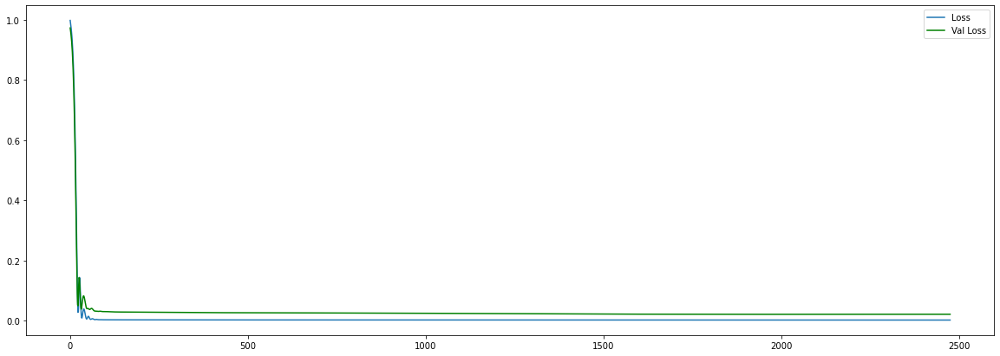

final loss: 0.0021126940846443176
final val_loss: 0.02140677161514759
Get best hyperparameter for simple GRU


INFO:tensorflow:Oracle triggered exit
Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 1, 5)]            0         
_________________________________________________________________
gru (GRU)                    (None, 80)                20880     
_________________________________________________________________
dense (Dense)                (None, 64)                5184      
_________________________________________________________________
dropout (Dropout)            (None, 64)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 65        
Total params: 26,129
Trainable params: 26,129
Non-trainable params: 0
_________________________________________________________________
Start training simple GRU
Epoch 1/2500
1/1 [==============================] - ETA: 0s


Epoch 00030: val_loss did not improve from 0.03352
Epoch 31/2500
1/1 [==============================] - ETA: 0s - loss: 0.0236 - mae: 0.120 - 0s 26ms/step - loss: 0.0236 - mae: 0.1206 - val_loss: 0.0336 - val_mae: 0.1264

Epoch 00031: val_loss did not improve from 0.03352
Epoch 32/2500
1/1 [==============================] - ETA: 0s - loss: 0.0177 - mae: 0.103 - 0s 28ms/step - loss: 0.0177 - mae: 0.1035 - val_loss: 0.0321 - val_mae: 0.1185

Epoch 00032: val_loss improved from 0.03352 to 0.03209, saving model to FPT_1H_GRU.hdf5
Epoch 33/2500
1/1 [==============================] - ETA: 0s - loss: 0.0152 - mae: 0.095 - 0s 28ms/step - loss: 0.0152 - mae: 0.0952 - val_loss: 0.0319 - val_mae: 0.1144

Epoch 00033: val_loss improved from 0.03209 to 0.03189, saving model to FPT_1H_GRU.hdf5
Epoch 34/2500
1/1 [==============================] - ETA: 0s - loss: 0.0134 - mae: 0.089 - 0s 30ms/step - loss: 0.0134 - mae: 0.0896 - val_loss: 0.0327 - val_mae: 0.1139

Epoch 00034: val_loss did not improve

1/1 [==============================] - ETA: 0s - loss: 0.0133 - mae: 0.086 - 0s 24ms/step - loss: 0.0133 - mae: 0.0867 - val_loss: 0.0296 - val_mae: 0.1119

Epoch 00065: val_loss improved from 0.02966 to 0.02959, saving model to FPT_1H_GRU.hdf5
Epoch 66/2500
1/1 [==============================] - ETA: 0s - loss: 0.0139 - mae: 0.090 - 0s 26ms/step - loss: 0.0139 - mae: 0.0905 - val_loss: 0.0295 - val_mae: 0.1115

Epoch 00066: val_loss improved from 0.02959 to 0.02952, saving model to FPT_1H_GRU.hdf5
Epoch 67/2500
1/1 [==============================] - ETA: 0s - loss: 0.0133 - mae: 0.088 - 0s 26ms/step - loss: 0.0133 - mae: 0.0885 - val_loss: 0.0295 - val_mae: 0.1111

Epoch 00067: val_loss improved from 0.02952 to 0.02947, saving model to FPT_1H_GRU.hdf5
Epoch 68/2500
1/1 [==============================] - ETA: 0s - loss: 0.0125 - mae: 0.085 - 0s 26ms/step - loss: 0.0125 - mae: 0.0856 - val_loss: 0.0294 - val_mae: 0.1105

Epoch 00068: val_loss improved from 0.02947 to 0.02941, saving mod

1/1 [==============================] - ETA: 0s - loss: 0.0119 - mae: 0.082 - 0s 25ms/step - loss: 0.0119 - mae: 0.0821 - val_loss: 0.0288 - val_mae: 0.1092

Epoch 00099: val_loss did not improve from 0.02880
Epoch 100/2500
1/1 [==============================] - ETA: 0s - loss: 0.0114 - mae: 0.081 - 0s 27ms/step - loss: 0.0114 - mae: 0.0812 - val_loss: 0.0288 - val_mae: 0.1091

Epoch 00100: val_loss did not improve from 0.02880
Epoch 101/2500
1/1 [==============================] - ETA: 0s - loss: 0.0115 - mae: 0.080 - 0s 26ms/step - loss: 0.0115 - mae: 0.0804 - val_loss: 0.0288 - val_mae: 0.1089

Epoch 00101: val_loss improved from 0.02880 to 0.02877, saving model to FPT_1H_GRU.hdf5
Epoch 102/2500
1/1 [==============================] - ETA: 0s - loss: 0.0109 - mae: 0.078 - 0s 27ms/step - loss: 0.0109 - mae: 0.0786 - val_loss: 0.0287 - val_mae: 0.1087

Epoch 00102: val_loss improved from 0.02877 to 0.02873, saving model to FPT_1H_GRU.hdf5
Epoch 103/2500
1/1 [=============================

1/1 [==============================] - ETA: 0s - loss: 0.0109 - mae: 0.078 - 0s 28ms/step - loss: 0.0109 - mae: 0.0784 - val_loss: 0.0284 - val_mae: 0.1081

Epoch 00133: val_loss did not improve from 0.02825
Epoch 134/2500
1/1 [==============================] - ETA: 0s - loss: 0.0114 - mae: 0.080 - 0s 28ms/step - loss: 0.0114 - mae: 0.0806 - val_loss: 0.0284 - val_mae: 0.1081

Epoch 00134: val_loss did not improve from 0.02825
Epoch 135/2500
1/1 [==============================] - ETA: 0s - loss: 0.0105 - mae: 0.076 - 0s 28ms/step - loss: 0.0105 - mae: 0.0769 - val_loss: 0.0284 - val_mae: 0.1080

Epoch 00135: val_loss did not improve from 0.02825
Epoch 136/2500
1/1 [==============================] - ETA: 0s - loss: 0.0114 - mae: 0.079 - 0s 27ms/step - loss: 0.0114 - mae: 0.0796 - val_loss: 0.0283 - val_mae: 0.1078

Epoch 00136: val_loss did not improve from 0.02825
Epoch 137/2500
1/1 [==============================] - ETA: 0s - loss: 0.0108 - mae: 0.078 - 0s 28ms/step - loss: 0.0108 - m


Epoch 00168: val_loss improved from 0.02816 to 0.02816, saving model to FPT_1H_GRU.hdf5
Epoch 169/2500
1/1 [==============================] - ETA: 0s - loss: 0.0107 - mae: 0.077 - 0s 27ms/step - loss: 0.0107 - mae: 0.0777 - val_loss: 0.0281 - val_mae: 0.1072

Epoch 00169: val_loss improved from 0.02816 to 0.02812, saving model to FPT_1H_GRU.hdf5
Epoch 170/2500
1/1 [==============================] - ETA: 0s - loss: 0.0115 - mae: 0.080 - 0s 27ms/step - loss: 0.0115 - mae: 0.0806 - val_loss: 0.0281 - val_mae: 0.1072

Epoch 00170: val_loss improved from 0.02812 to 0.02811, saving model to FPT_1H_GRU.hdf5
Epoch 171/2500
1/1 [==============================] - ETA: 0s - loss: 0.0106 - mae: 0.078 - 0s 28ms/step - loss: 0.0106 - mae: 0.0780 - val_loss: 0.0281 - val_mae: 0.1072

Epoch 00171: val_loss improved from 0.02811 to 0.02811, saving model to FPT_1H_GRU.hdf5
Epoch 172/2500
1/1 [==============================] - ETA: 0s - loss: 0.0102 - mae: 0.076 - 0s 28ms/step - loss: 0.0102 - mae: 0.07

1/1 [==============================] - ETA: 0s - loss: 0.0093 - mae: 0.072 - 0s 26ms/step - loss: 0.0093 - mae: 0.0726 - val_loss: 0.0281 - val_mae: 0.1076

Epoch 00203: val_loss did not improve from 0.02796
Epoch 204/2500
1/1 [==============================] - ETA: 0s - loss: 0.0099 - mae: 0.074 - 0s 26ms/step - loss: 0.0099 - mae: 0.0742 - val_loss: 0.0281 - val_mae: 0.1074

Epoch 00204: val_loss did not improve from 0.02796
Epoch 205/2500
1/1 [==============================] - ETA: 0s - loss: 0.0099 - mae: 0.074 - 0s 26ms/step - loss: 0.0099 - mae: 0.0748 - val_loss: 0.0280 - val_mae: 0.1072

Epoch 00205: val_loss did not improve from 0.02796
Epoch 206/2500
1/1 [==============================] - ETA: 0s - loss: 0.0096 - mae: 0.072 - 0s 26ms/step - loss: 0.0096 - mae: 0.0724 - val_loss: 0.0280 - val_mae: 0.1070

Epoch 00206: val_loss did not improve from 0.02796
Epoch 207/2500
1/1 [==============================] - ETA: 0s - loss: 0.0106 - mae: 0.076 - 0s 27ms/step - loss: 0.0106 - m

Epoch 00238: val_loss did not improve from 0.02783
Epoch 239/2500
1/1 [==============================] - ETA: 0s - loss: 0.0093 - mae: 0.072 - 0s 27ms/step - loss: 0.0093 - mae: 0.0722 - val_loss: 0.0279 - val_mae: 0.1069

Epoch 00239: val_loss did not improve from 0.02783
Epoch 240/2500
1/1 [==============================] - ETA: 0s - loss: 0.0094 - mae: 0.072 - 0s 29ms/step - loss: 0.0094 - mae: 0.0725 - val_loss: 0.0280 - val_mae: 0.1073

Epoch 00240: val_loss did not improve from 0.02783
Epoch 241/2500
1/1 [==============================] - ETA: 0s - loss: 0.0089 - mae: 0.071 - 0s 27ms/step - loss: 0.0089 - mae: 0.0714 - val_loss: 0.0280 - val_mae: 0.1074

Epoch 00241: val_loss did not improve from 0.02783
Epoch 242/2500
1/1 [==============================] - ETA: 0s - loss: 0.0087 - mae: 0.070 - 0s 27ms/step - loss: 0.0087 - mae: 0.0705 - val_loss: 0.0280 - val_mae: 0.1074

Epoch 00242: val_loss did not improve from 0.02783
Epoch 243/2500
1/1 [==============================] - ETA

1/1 [==============================] - ETA: 0s - loss: 0.0093 - mae: 0.071 - 0s 28ms/step - loss: 0.0093 - mae: 0.0711 - val_loss: 0.0278 - val_mae: 0.1066

Epoch 00274: val_loss did not improve from 0.02774
Epoch 275/2500
1/1 [==============================] - ETA: 0s - loss: 0.0090 - mae: 0.070 - 0s 27ms/step - loss: 0.0090 - mae: 0.0709 - val_loss: 0.0278 - val_mae: 0.1067

Epoch 00275: val_loss did not improve from 0.02774
Epoch 276/2500
1/1 [==============================] - ETA: 0s - loss: 0.0089 - mae: 0.071 - 0s 29ms/step - loss: 0.0089 - mae: 0.0712 - val_loss: 0.0278 - val_mae: 0.1066

Epoch 00276: val_loss did not improve from 0.02774
Epoch 277/2500
1/1 [==============================] - ETA: 0s - loss: 0.0087 - mae: 0.069 - 0s 31ms/step - loss: 0.0087 - mae: 0.0695 - val_loss: 0.0278 - val_mae: 0.1066

Epoch 00277: val_loss did not improve from 0.02774
Epoch 278/2500
1/1 [==============================] - ETA: 0s - loss: 0.0087 - mae: 0.070 - 0s 27ms/step - loss: 0.0087 - m

1/1 [==============================] - ETA: 0s - loss: 0.0084 - mae: 0.069 - 0s 37ms/step - loss: 0.0084 - mae: 0.0691 - val_loss: 0.0276 - val_mae: 0.1065

Epoch 00309: val_loss did not improve from 0.02760
Epoch 310/2500
1/1 [==============================] - ETA: 0s - loss: 0.0091 - mae: 0.071 - 0s 25ms/step - loss: 0.0091 - mae: 0.0713 - val_loss: 0.0277 - val_mae: 0.1065

Epoch 00310: val_loss did not improve from 0.02760
Epoch 311/2500
1/1 [==============================] - ETA: 0s - loss: 0.0084 - mae: 0.068 - 0s 26ms/step - loss: 0.0084 - mae: 0.0685 - val_loss: 0.0276 - val_mae: 0.1065

Epoch 00311: val_loss did not improve from 0.02760
Epoch 312/2500
1/1 [==============================] - ETA: 0s - loss: 0.0083 - mae: 0.068 - 0s 27ms/step - loss: 0.0083 - mae: 0.0685 - val_loss: 0.0276 - val_mae: 0.1064

Epoch 00312: val_loss did not improve from 0.02760
Epoch 313/2500
1/1 [==============================] - ETA: 0s - loss: 0.0084 - mae: 0.068 - 0s 25ms/step - loss: 0.0084 - m


Epoch 00344: val_loss did not improve from 0.02739
Epoch 345/2500
1/1 [==============================] - ETA: 0s - loss: 0.0077 - mae: 0.066 - 0s 25ms/step - loss: 0.0077 - mae: 0.0661 - val_loss: 0.0275 - val_mae: 0.1062

Epoch 00345: val_loss did not improve from 0.02739
Epoch 346/2500
1/1 [==============================] - ETA: 0s - loss: 0.0087 - mae: 0.070 - 0s 29ms/step - loss: 0.0087 - mae: 0.0701 - val_loss: 0.0275 - val_mae: 0.1064

Epoch 00346: val_loss did not improve from 0.02739
Epoch 347/2500
1/1 [==============================] - ETA: 0s - loss: 0.0087 - mae: 0.069 - 0s 27ms/step - loss: 0.0087 - mae: 0.0693 - val_loss: 0.0275 - val_mae: 0.1064

Epoch 00347: val_loss did not improve from 0.02739
Epoch 348/2500
1/1 [==============================] - ETA: 0s - loss: 0.0082 - mae: 0.068 - 0s 26ms/step - loss: 0.0082 - mae: 0.0686 - val_loss: 0.0275 - val_mae: 0.1061

Epoch 00348: val_loss did not improve from 0.02739
Epoch 349/2500
1/1 [==============================] - ET

Epoch 381/2500
1/1 [==============================] - ETA: 0s - loss: 0.0078 - mae: 0.065 - 0s 28ms/step - loss: 0.0078 - mae: 0.0657 - val_loss: 0.0274 - val_mae: 0.1059

Epoch 00381: val_loss did not improve from 0.02734
Epoch 382/2500
1/1 [==============================] - ETA: 0s - loss: 0.0078 - mae: 0.066 - 0s 25ms/step - loss: 0.0078 - mae: 0.0662 - val_loss: 0.0274 - val_mae: 0.1058

Epoch 00382: val_loss did not improve from 0.02734
Epoch 383/2500
1/1 [==============================] - ETA: 0s - loss: 0.0081 - mae: 0.067 - 0s 25ms/step - loss: 0.0081 - mae: 0.0675 - val_loss: 0.0274 - val_mae: 0.1058

Epoch 00383: val_loss did not improve from 0.02734
Epoch 384/2500
1/1 [==============================] - ETA: 0s - loss: 0.0079 - mae: 0.066 - 0s 26ms/step - loss: 0.0079 - mae: 0.0667 - val_loss: 0.0274 - val_mae: 0.1058

Epoch 00384: val_loss did not improve from 0.02734
Epoch 385/2500
1/1 [==============================] - ETA: 0s - loss: 0.0085 - mae: 0.068 - 0s 26ms/step - l

1/1 [==============================] - ETA: 0s - loss: 0.0075 - mae: 0.065 - 0s 27ms/step - loss: 0.0075 - mae: 0.0650 - val_loss: 0.0271 - val_mae: 0.1051

Epoch 00416: val_loss improved from 0.02713 to 0.02713, saving model to FPT_1H_GRU.hdf5
Epoch 417/2500
1/1 [==============================] - ETA: 0s - loss: 0.0077 - mae: 0.066 - 0s 28ms/step - loss: 0.0077 - mae: 0.0662 - val_loss: 0.0272 - val_mae: 0.1052

Epoch 00417: val_loss did not improve from 0.02713
Epoch 418/2500
1/1 [==============================] - ETA: 0s - loss: 0.0073 - mae: 0.064 - 0s 25ms/step - loss: 0.0073 - mae: 0.0644 - val_loss: 0.0272 - val_mae: 0.1053

Epoch 00418: val_loss did not improve from 0.02713
Epoch 419/2500
1/1 [==============================] - ETA: 0s - loss: 0.0081 - mae: 0.066 - 0s 25ms/step - loss: 0.0081 - mae: 0.0666 - val_loss: 0.0272 - val_mae: 0.1054

Epoch 00419: val_loss did not improve from 0.02713
Epoch 420/2500
1/1 [==============================] - ETA: 0s - loss: 0.0080 - mae: 0.


Epoch 00451: val_loss did not improve from 0.02705
Epoch 452/2500
1/1 [==============================] - ETA: 0s - loss: 0.0077 - mae: 0.066 - 0s 25ms/step - loss: 0.0077 - mae: 0.0664 - val_loss: 0.0271 - val_mae: 0.1054

Epoch 00452: val_loss did not improve from 0.02705
Epoch 453/2500
1/1 [==============================] - ETA: 0s - loss: 0.0075 - mae: 0.064 - 0s 27ms/step - loss: 0.0075 - mae: 0.0649 - val_loss: 0.0271 - val_mae: 0.1050

Epoch 00453: val_loss did not improve from 0.02705
Epoch 454/2500
1/1 [==============================] - ETA: 0s - loss: 0.0073 - mae: 0.064 - 0s 25ms/step - loss: 0.0073 - mae: 0.0644 - val_loss: 0.0270 - val_mae: 0.1047

Epoch 00454: val_loss improved from 0.02705 to 0.02702, saving model to FPT_1H_GRU.hdf5
Epoch 455/2500
1/1 [==============================] - ETA: 0s - loss: 0.0077 - mae: 0.066 - 0s 26ms/step - loss: 0.0077 - mae: 0.0662 - val_loss: 0.0270 - val_mae: 0.1045

Epoch 00455: val_loss improved from 0.02702 to 0.02698, saving model t

1/1 [==============================] - ETA: 0s - loss: 0.0077 - mae: 0.065 - 0s 26ms/step - loss: 0.0077 - mae: 0.0656 - val_loss: 0.0269 - val_mae: 0.1043

Epoch 00487: val_loss improved from 0.02689 to 0.02688, saving model to FPT_1H_GRU.hdf5
Epoch 488/2500
1/1 [==============================] - ETA: 0s - loss: 0.0073 - mae: 0.063 - 0s 26ms/step - loss: 0.0073 - mae: 0.0635 - val_loss: 0.0269 - val_mae: 0.1045

Epoch 00488: val_loss did not improve from 0.02688
Epoch 489/2500
1/1 [==============================] - ETA: 0s - loss: 0.0071 - mae: 0.063 - 0s 26ms/step - loss: 0.0071 - mae: 0.0638 - val_loss: 0.0269 - val_mae: 0.1047

Epoch 00489: val_loss did not improve from 0.02688
Epoch 490/2500
1/1 [==============================] - ETA: 0s - loss: 0.0069 - mae: 0.063 - 0s 25ms/step - loss: 0.0069 - mae: 0.0638 - val_loss: 0.0270 - val_mae: 0.1050

Epoch 00490: val_loss did not improve from 0.02688
Epoch 491/2500
1/1 [==============================] - ETA: 0s - loss: 0.0077 - mae: 0.

Epoch 00522: val_loss did not improve from 0.02680
Epoch 523/2500
1/1 [==============================] - ETA: 0s - loss: 0.0075 - mae: 0.065 - 0s 27ms/step - loss: 0.0075 - mae: 0.0652 - val_loss: 0.0269 - val_mae: 0.1050

Epoch 00523: val_loss did not improve from 0.02680
Epoch 524/2500
1/1 [==============================] - ETA: 0s - loss: 0.0075 - mae: 0.065 - 0s 30ms/step - loss: 0.0075 - mae: 0.0654 - val_loss: 0.0268 - val_mae: 0.1045

Epoch 00524: val_loss did not improve from 0.02680
Epoch 525/2500
1/1 [==============================] - ETA: 0s - loss: 0.0073 - mae: 0.063 - 0s 26ms/step - loss: 0.0073 - mae: 0.0639 - val_loss: 0.0268 - val_mae: 0.1040

Epoch 00525: val_loss improved from 0.02680 to 0.02676, saving model to FPT_1H_GRU.hdf5
Epoch 526/2500
1/1 [==============================] - ETA: 0s - loss: 0.0073 - mae: 0.064 - 0s 25ms/step - loss: 0.0073 - mae: 0.0642 - val_loss: 0.0267 - val_mae: 0.1038

Epoch 00526: val_loss improved from 0.02676 to 0.02672, saving model to


Epoch 00558: val_loss did not improve from 0.02667
Epoch 559/2500
1/1 [==============================] - ETA: 0s - loss: 0.0071 - mae: 0.064 - 0s 27ms/step - loss: 0.0071 - mae: 0.0644 - val_loss: 0.0267 - val_mae: 0.1041

Epoch 00559: val_loss did not improve from 0.02667
Epoch 560/2500
1/1 [==============================] - ETA: 0s - loss: 0.0078 - mae: 0.066 - 0s 26ms/step - loss: 0.0078 - mae: 0.0669 - val_loss: 0.0267 - val_mae: 0.1039

Epoch 00560: val_loss improved from 0.02667 to 0.02666, saving model to FPT_1H_GRU.hdf5
Epoch 561/2500
1/1 [==============================] - ETA: 0s - loss: 0.0071 - mae: 0.063 - 0s 25ms/step - loss: 0.0071 - mae: 0.0634 - val_loss: 0.0266 - val_mae: 0.1038

Epoch 00561: val_loss improved from 0.02666 to 0.02664, saving model to FPT_1H_GRU.hdf5
Epoch 562/2500
1/1 [==============================] - ETA: 0s - loss: 0.0071 - mae: 0.063 - 0s 27ms/step - loss: 0.0071 - mae: 0.0639 - val_loss: 0.0267 - val_mae: 0.1039

Epoch 00562: val_loss did not imp

Epoch 00593: val_loss did not improve from 0.02648
Epoch 594/2500
1/1 [==============================] - ETA: 0s - loss: 0.0074 - mae: 0.064 - 0s 26ms/step - loss: 0.0074 - mae: 0.0646 - val_loss: 0.0266 - val_mae: 0.1038

Epoch 00594: val_loss did not improve from 0.02648
Epoch 595/2500
1/1 [==============================] - ETA: 0s - loss: 0.0074 - mae: 0.065 - 0s 27ms/step - loss: 0.0074 - mae: 0.0652 - val_loss: 0.0266 - val_mae: 0.1040

Epoch 00595: val_loss did not improve from 0.02648
Epoch 596/2500
1/1 [==============================] - ETA: 0s - loss: 0.0075 - mae: 0.064 - 0s 26ms/step - loss: 0.0075 - mae: 0.0647 - val_loss: 0.0265 - val_mae: 0.1038

Epoch 00596: val_loss did not improve from 0.02648
Epoch 597/2500
1/1 [==============================] - ETA: 0s - loss: 0.0071 - mae: 0.063 - 0s 28ms/step - loss: 0.0071 - mae: 0.0633 - val_loss: 0.0265 - val_mae: 0.1036

Epoch 00597: val_loss did not improve from 0.02648
Epoch 598/2500
1/1 [==============================] - ETA


Epoch 00629: val_loss improved from 0.02632 to 0.02630, saving model to FPT_1H_GRU.hdf5
Epoch 630/2500
1/1 [==============================] - ETA: 0s - loss: 0.0072 - mae: 0.062 - 0s 26ms/step - loss: 0.0072 - mae: 0.0627 - val_loss: 0.0263 - val_mae: 0.1029

Epoch 00630: val_loss improved from 0.02630 to 0.02629, saving model to FPT_1H_GRU.hdf5
Epoch 631/2500
1/1 [==============================] - ETA: 0s - loss: 0.0070 - mae: 0.062 - 0s 26ms/step - loss: 0.0070 - mae: 0.0625 - val_loss: 0.0263 - val_mae: 0.1031

Epoch 00631: val_loss did not improve from 0.02629
Epoch 632/2500
1/1 [==============================] - ETA: 0s - loss: 0.0067 - mae: 0.061 - 0s 26ms/step - loss: 0.0067 - mae: 0.0610 - val_loss: 0.0264 - val_mae: 0.1034

Epoch 00632: val_loss did not improve from 0.02629
Epoch 633/2500
1/1 [==============================] - ETA: 0s - loss: 0.0067 - mae: 0.060 - 0s 28ms/step - loss: 0.0067 - mae: 0.0606 - val_loss: 0.0264 - val_mae: 0.1037

Epoch 00633: val_loss did not imp

Epoch 665/2500
1/1 [==============================] - ETA: 0s - loss: 0.0074 - mae: 0.064 - 0s 25ms/step - loss: 0.0074 - mae: 0.0646 - val_loss: 0.0262 - val_mae: 0.1025

Epoch 00665: val_loss did not improve from 0.02613
Epoch 666/2500
1/1 [==============================] - ETA: 0s - loss: 0.0068 - mae: 0.062 - 0s 27ms/step - loss: 0.0068 - mae: 0.0624 - val_loss: 0.0262 - val_mae: 0.1028

Epoch 00666: val_loss did not improve from 0.02613
Epoch 667/2500
1/1 [==============================] - ETA: 0s - loss: 0.0070 - mae: 0.063 - 0s 26ms/step - loss: 0.0070 - mae: 0.0631 - val_loss: 0.0263 - val_mae: 0.1034

Epoch 00667: val_loss did not improve from 0.02613
Epoch 668/2500
1/1 [==============================] - ETA: 0s - loss: 0.0072 - mae: 0.063 - 0s 26ms/step - loss: 0.0072 - mae: 0.0638 - val_loss: 0.0264 - val_mae: 0.1039

Epoch 00668: val_loss did not improve from 0.02613
Epoch 669/2500
1/1 [==============================] - ETA: 0s - loss: 0.0074 - mae: 0.064 - 0s 26ms/step - l


Epoch 00700: val_loss did not improve from 0.02602
Epoch 701/2500
1/1 [==============================] - ETA: 0s - loss: 0.0072 - mae: 0.063 - 0s 27ms/step - loss: 0.0072 - mae: 0.0633 - val_loss: 0.0260 - val_mae: 0.1024

Epoch 00701: val_loss did not improve from 0.02602
Epoch 702/2500
1/1 [==============================] - ETA: 0s - loss: 0.0073 - mae: 0.062 - 0s 27ms/step - loss: 0.0073 - mae: 0.0627 - val_loss: 0.0261 - val_mae: 0.1027

Epoch 00702: val_loss did not improve from 0.02602
Epoch 703/2500
1/1 [==============================] - ETA: 0s - loss: 0.0069 - mae: 0.063 - 0s 26ms/step - loss: 0.0069 - mae: 0.0632 - val_loss: 0.0261 - val_mae: 0.1028

Epoch 00703: val_loss did not improve from 0.02602
Epoch 704/2500
1/1 [==============================] - ETA: 0s - loss: 0.0069 - mae: 0.063 - 0s 25ms/step - loss: 0.0069 - mae: 0.0631 - val_loss: 0.0261 - val_mae: 0.1029

Epoch 00704: val_loss did not improve from 0.02602
Epoch 705/2500
1/1 [==============================] - ET

Epoch 736/2500
1/1 [==============================] - ETA: 0s - loss: 0.0070 - mae: 0.062 - 0s 29ms/step - loss: 0.0070 - mae: 0.0629 - val_loss: 0.0261 - val_mae: 0.1031

Epoch 00736: val_loss did not improve from 0.02586
Epoch 737/2500
1/1 [==============================] - ETA: 0s - loss: 0.0067 - mae: 0.062 - 0s 26ms/step - loss: 0.0067 - mae: 0.0621 - val_loss: 0.0261 - val_mae: 0.1031

Epoch 00737: val_loss did not improve from 0.02586
Epoch 738/2500
1/1 [==============================] - ETA: 0s - loss: 0.0070 - mae: 0.062 - 0s 26ms/step - loss: 0.0070 - mae: 0.0625 - val_loss: 0.0261 - val_mae: 0.1028

Epoch 00738: val_loss did not improve from 0.02586
Epoch 739/2500
1/1 [==============================] - ETA: 0s - loss: 0.0068 - mae: 0.061 - 0s 29ms/step - loss: 0.0068 - mae: 0.0614 - val_loss: 0.0260 - val_mae: 0.1021

Epoch 00739: val_loss did not improve from 0.02586
Epoch 740/2500
1/1 [==============================] - ETA: 0s - loss: 0.0069 - mae: 0.062 - 0s 29ms/step - l

Epoch 00771: val_loss did not improve from 0.02576
Epoch 772/2500
1/1 [==============================] - ETA: 0s - loss: 0.0063 - mae: 0.059 - 0s 26ms/step - loss: 0.0063 - mae: 0.0595 - val_loss: 0.0258 - val_mae: 0.1019

Epoch 00772: val_loss did not improve from 0.02576
Epoch 773/2500
1/1 [==============================] - ETA: 0s - loss: 0.0069 - mae: 0.061 - 0s 26ms/step - loss: 0.0069 - mae: 0.0616 - val_loss: 0.0258 - val_mae: 0.1018

Epoch 00773: val_loss improved from 0.02576 to 0.02575, saving model to FPT_1H_GRU.hdf5
Epoch 774/2500
1/1 [==============================] - ETA: 0s - loss: 0.0070 - mae: 0.062 - 0s 26ms/step - loss: 0.0070 - mae: 0.0626 - val_loss: 0.0258 - val_mae: 0.1019

Epoch 00774: val_loss did not improve from 0.02575
Epoch 775/2500
1/1 [==============================] - ETA: 0s - loss: 0.0069 - mae: 0.061 - 0s 27ms/step - loss: 0.0069 - mae: 0.0618 - val_loss: 0.0258 - val_mae: 0.1021

Epoch 00775: val_loss did not improve from 0.02575
Epoch 776/2500
1/1 [


Epoch 00806: val_loss improved from 0.02557 to 0.02554, saving model to FPT_1H_GRU.hdf5
Epoch 807/2500
1/1 [==============================] - ETA: 0s - loss: 0.0068 - mae: 0.061 - 0s 25ms/step - loss: 0.0068 - mae: 0.0612 - val_loss: 0.0255 - val_mae: 0.1008

Epoch 00807: val_loss improved from 0.02554 to 0.02553, saving model to FPT_1H_GRU.hdf5
Epoch 808/2500
1/1 [==============================] - ETA: 0s - loss: 0.0066 - mae: 0.061 - 0s 26ms/step - loss: 0.0066 - mae: 0.0612 - val_loss: 0.0256 - val_mae: 0.1011

Epoch 00808: val_loss did not improve from 0.02553
Epoch 809/2500
1/1 [==============================] - ETA: 0s - loss: 0.0066 - mae: 0.060 - 0s 26ms/step - loss: 0.0066 - mae: 0.0602 - val_loss: 0.0256 - val_mae: 0.1014

Epoch 00809: val_loss did not improve from 0.02553
Epoch 810/2500
1/1 [==============================] - ETA: 0s - loss: 0.0072 - mae: 0.064 - 0s 27ms/step - loss: 0.0072 - mae: 0.0640 - val_loss: 0.0256 - val_mae: 0.1015

Epoch 00810: val_loss did not imp

1/1 [==============================] - ETA: 0s - loss: 0.0068 - mae: 0.062 - 0s 26ms/step - loss: 0.0068 - mae: 0.0622 - val_loss: 0.0255 - val_mae: 0.1012

Epoch 00842: val_loss did not improve from 0.02542
Epoch 843/2500
1/1 [==============================] - ETA: 0s - loss: 0.0065 - mae: 0.060 - 0s 25ms/step - loss: 0.0065 - mae: 0.0602 - val_loss: 0.0254 - val_mae: 0.1009

Epoch 00843: val_loss improved from 0.02542 to 0.02542, saving model to FPT_1H_GRU.hdf5
Epoch 844/2500
1/1 [==============================] - ETA: 0s - loss: 0.0069 - mae: 0.062 - 0s 24ms/step - loss: 0.0069 - mae: 0.0626 - val_loss: 0.0254 - val_mae: 0.1007

Epoch 00844: val_loss improved from 0.02542 to 0.02538, saving model to FPT_1H_GRU.hdf5
Epoch 845/2500
1/1 [==============================] - ETA: 0s - loss: 0.0061 - mae: 0.058 - 0s 27ms/step - loss: 0.0061 - mae: 0.0582 - val_loss: 0.0254 - val_mae: 0.1007

Epoch 00845: val_loss improved from 0.02538 to 0.02537, saving model to FPT_1H_GRU.hdf5
Epoch 846/25


Epoch 00877: val_loss did not improve from 0.02526
Epoch 878/2500
1/1 [==============================] - ETA: 0s - loss: 0.0065 - mae: 0.061 - 0s 26ms/step - loss: 0.0065 - mae: 0.0613 - val_loss: 0.0253 - val_mae: 0.1006

Epoch 00878: val_loss did not improve from 0.02526
Epoch 879/2500
1/1 [==============================] - ETA: 0s - loss: 0.0063 - mae: 0.058 - 0s 26ms/step - loss: 0.0063 - mae: 0.0588 - val_loss: 0.0253 - val_mae: 0.1006

Epoch 00879: val_loss did not improve from 0.02526
Epoch 880/2500
1/1 [==============================] - ETA: 0s - loss: 0.0067 - mae: 0.061 - 0s 26ms/step - loss: 0.0067 - mae: 0.0613 - val_loss: 0.0253 - val_mae: 0.1007

Epoch 00880: val_loss did not improve from 0.02526
Epoch 881/2500
1/1 [==============================] - ETA: 0s - loss: 0.0065 - mae: 0.060 - 0s 27ms/step - loss: 0.0065 - mae: 0.0608 - val_loss: 0.0253 - val_mae: 0.1008

Epoch 00881: val_loss did not improve from 0.02526
Epoch 882/2500
1/1 [==============================] - ET


Epoch 00913: val_loss did not improve from 0.02507
Epoch 914/2500
1/1 [==============================] - ETA: 0s - loss: 0.0068 - mae: 0.061 - 0s 26ms/step - loss: 0.0068 - mae: 0.0616 - val_loss: 0.0251 - val_mae: 0.1003

Epoch 00914: val_loss did not improve from 0.02507
Epoch 915/2500
1/1 [==============================] - ETA: 0s - loss: 0.0064 - mae: 0.060 - 0s 26ms/step - loss: 0.0064 - mae: 0.0601 - val_loss: 0.0252 - val_mae: 0.1004

Epoch 00915: val_loss did not improve from 0.02507
Epoch 916/2500
1/1 [==============================] - ETA: 0s - loss: 0.0063 - mae: 0.058 - 0s 25ms/step - loss: 0.0063 - mae: 0.0589 - val_loss: 0.0251 - val_mae: 0.1004

Epoch 00916: val_loss did not improve from 0.02507
Epoch 917/2500
1/1 [==============================] - ETA: 0s - loss: 0.0065 - mae: 0.060 - 0s 28ms/step - loss: 0.0065 - mae: 0.0603 - val_loss: 0.0251 - val_mae: 0.1001

Epoch 00917: val_loss did not improve from 0.02507
Epoch 918/2500
1/1 [==============================] - ET


Epoch 00949: val_loss did not improve from 0.02490
Epoch 950/2500
1/1 [==============================] - ETA: 0s - loss: 0.0066 - mae: 0.061 - 0s 27ms/step - loss: 0.0066 - mae: 0.0616 - val_loss: 0.0250 - val_mae: 0.1000

Epoch 00950: val_loss did not improve from 0.02490
Epoch 951/2500
1/1 [==============================] - ETA: 0s - loss: 0.0065 - mae: 0.060 - 0s 27ms/step - loss: 0.0065 - mae: 0.0604 - val_loss: 0.0250 - val_mae: 0.0999

Epoch 00951: val_loss did not improve from 0.02490
Epoch 952/2500
1/1 [==============================] - ETA: 0s - loss: 0.0067 - mae: 0.060 - 0s 27ms/step - loss: 0.0067 - mae: 0.0605 - val_loss: 0.0250 - val_mae: 0.0997

Epoch 00952: val_loss did not improve from 0.02490
Epoch 953/2500
1/1 [==============================] - ETA: 0s - loss: 0.0067 - mae: 0.061 - 0s 26ms/step - loss: 0.0067 - mae: 0.0612 - val_loss: 0.0250 - val_mae: 0.0995

Epoch 00953: val_loss did not improve from 0.02490
Epoch 954/2500
1/1 [==============================] - ET

1/1 [==============================] - ETA: 0s - loss: 0.0065 - mae: 0.059 - 0s 25ms/step - loss: 0.0065 - mae: 0.0598 - val_loss: 0.0247 - val_mae: 0.0988

Epoch 00985: val_loss improved from 0.02471 to 0.02470, saving model to FPT_1H_GRU.hdf5
Epoch 986/2500
1/1 [==============================] - ETA: 0s - loss: 0.0067 - mae: 0.061 - 0s 26ms/step - loss: 0.0067 - mae: 0.0610 - val_loss: 0.0247 - val_mae: 0.0990

Epoch 00986: val_loss did not improve from 0.02470
Epoch 987/2500
1/1 [==============================] - ETA: 0s - loss: 0.0064 - mae: 0.059 - 0s 25ms/step - loss: 0.0064 - mae: 0.0598 - val_loss: 0.0248 - val_mae: 0.0994

Epoch 00987: val_loss did not improve from 0.02470
Epoch 988/2500
1/1 [==============================] - ETA: 0s - loss: 0.0065 - mae: 0.059 - 0s 27ms/step - loss: 0.0065 - mae: 0.0593 - val_loss: 0.0248 - val_mae: 0.0998

Epoch 00988: val_loss did not improve from 0.02470
Epoch 989/2500
1/1 [==============================] - ETA: 0s - loss: 0.0068 - mae: 0.

Epoch 01020: val_loss did not improve from 0.02464
Epoch 1021/2500
1/1 [==============================] - ETA: 0s - loss: 0.0063 - mae: 0.059 - 0s 27ms/step - loss: 0.0063 - mae: 0.0593 - val_loss: 0.0248 - val_mae: 0.0994

Epoch 01021: val_loss did not improve from 0.02464
Epoch 1022/2500
1/1 [==============================] - ETA: 0s - loss: 0.0063 - mae: 0.059 - 0s 29ms/step - loss: 0.0063 - mae: 0.0592 - val_loss: 0.0247 - val_mae: 0.0991

Epoch 01022: val_loss did not improve from 0.02464
Epoch 1023/2500
1/1 [==============================] - ETA: 0s - loss: 0.0063 - mae: 0.059 - 0s 27ms/step - loss: 0.0063 - mae: 0.0593 - val_loss: 0.0247 - val_mae: 0.0987

Epoch 01023: val_loss did not improve from 0.02464
Epoch 1024/2500
1/1 [==============================] - ETA: 0s - loss: 0.0066 - mae: 0.060 - 0s 25ms/step - loss: 0.0066 - mae: 0.0602 - val_loss: 0.0247 - val_mae: 0.0987

Epoch 01024: val_loss did not improve from 0.02464
Epoch 1025/2500
1/1 [==============================] 

1/1 [==============================] - ETA: 0s - loss: 0.0067 - mae: 0.061 - 0s 28ms/step - loss: 0.0067 - mae: 0.0615 - val_loss: 0.0245 - val_mae: 0.0985

Epoch 01055: val_loss did not improve from 0.02446
Epoch 1056/2500
1/1 [==============================] - ETA: 0s - loss: 0.0067 - mae: 0.060 - 0s 27ms/step - loss: 0.0067 - mae: 0.0606 - val_loss: 0.0245 - val_mae: 0.0984

Epoch 01056: val_loss improved from 0.02446 to 0.02446, saving model to FPT_1H_GRU.hdf5
Epoch 1057/2500
1/1 [==============================] - ETA: 0s - loss: 0.0067 - mae: 0.061 - 0s 25ms/step - loss: 0.0067 - mae: 0.0613 - val_loss: 0.0245 - val_mae: 0.0985

Epoch 01057: val_loss did not improve from 0.02446
Epoch 1058/2500
1/1 [==============================] - ETA: 0s - loss: 0.0061 - mae: 0.057 - 0s 26ms/step - loss: 0.0061 - mae: 0.0576 - val_loss: 0.0245 - val_mae: 0.0987

Epoch 01058: val_loss did not improve from 0.02446
Epoch 1059/2500
1/1 [==============================] - ETA: 0s - loss: 0.0064 - mae

Epoch 01089: val_loss improved from 0.02430 to 0.02428, saving model to FPT_1H_GRU.hdf5
Epoch 1090/2500
1/1 [==============================] - ETA: 0s - loss: 0.0063 - mae: 0.060 - 0s 26ms/step - loss: 0.0063 - mae: 0.0601 - val_loss: 0.0243 - val_mae: 0.0978

Epoch 01090: val_loss improved from 0.02428 to 0.02428, saving model to FPT_1H_GRU.hdf5
Epoch 1091/2500
1/1 [==============================] - ETA: 0s - loss: 0.0063 - mae: 0.058 - 0s 26ms/step - loss: 0.0063 - mae: 0.0589 - val_loss: 0.0243 - val_mae: 0.0980

Epoch 01091: val_loss did not improve from 0.02428
Epoch 1092/2500
1/1 [==============================] - ETA: 0s - loss: 0.0061 - mae: 0.058 - 0s 26ms/step - loss: 0.0061 - mae: 0.0587 - val_loss: 0.0244 - val_mae: 0.0984

Epoch 01092: val_loss did not improve from 0.02428
Epoch 1093/2500
1/1 [==============================] - ETA: 0s - loss: 0.0062 - mae: 0.058 - 0s 27ms/step - loss: 0.0062 - mae: 0.0584 - val_loss: 0.0243 - val_mae: 0.0982

Epoch 01093: val_loss did not 

Epoch 01124: val_loss improved from 0.02416 to 0.02415, saving model to FPT_1H_GRU.hdf5
Epoch 1125/2500
1/1 [==============================] - ETA: 0s - loss: 0.0063 - mae: 0.060 - 0s 25ms/step - loss: 0.0063 - mae: 0.0603 - val_loss: 0.0242 - val_mae: 0.0978

Epoch 01125: val_loss did not improve from 0.02415
Epoch 1126/2500
1/1 [==============================] - ETA: 0s - loss: 0.0064 - mae: 0.059 - 0s 27ms/step - loss: 0.0064 - mae: 0.0596 - val_loss: 0.0242 - val_mae: 0.0977

Epoch 01126: val_loss did not improve from 0.02415
Epoch 1127/2500
1/1 [==============================] - ETA: 0s - loss: 0.0067 - mae: 0.060 - 0s 26ms/step - loss: 0.0067 - mae: 0.0609 - val_loss: 0.0242 - val_mae: 0.0975

Epoch 01127: val_loss did not improve from 0.02415
Epoch 1128/2500
1/1 [==============================] - ETA: 0s - loss: 0.0061 - mae: 0.058 - 0s 27ms/step - loss: 0.0061 - mae: 0.0580 - val_loss: 0.0241 - val_mae: 0.0974

Epoch 01128: val_loss improved from 0.02415 to 0.02414, saving mode


Epoch 01159: val_loss improved from 0.02401 to 0.02398, saving model to FPT_1H_GRU.hdf5
Epoch 1160/2500
1/1 [==============================] - ETA: 0s - loss: 0.0062 - mae: 0.058 - 0s 25ms/step - loss: 0.0062 - mae: 0.0586 - val_loss: 0.0240 - val_mae: 0.0971

Epoch 01160: val_loss improved from 0.02398 to 0.02397, saving model to FPT_1H_GRU.hdf5
Epoch 1161/2500
1/1 [==============================] - ETA: 0s - loss: 0.0066 - mae: 0.060 - 0s 26ms/step - loss: 0.0066 - mae: 0.0607 - val_loss: 0.0240 - val_mae: 0.0972

Epoch 01161: val_loss did not improve from 0.02397
Epoch 1162/2500
1/1 [==============================] - ETA: 0s - loss: 0.0065 - mae: 0.061 - 0s 27ms/step - loss: 0.0065 - mae: 0.0610 - val_loss: 0.0241 - val_mae: 0.0974

Epoch 01162: val_loss did not improve from 0.02397
Epoch 1163/2500
1/1 [==============================] - ETA: 0s - loss: 0.0065 - mae: 0.059 - 0s 26ms/step - loss: 0.0065 - mae: 0.0599 - val_loss: 0.0241 - val_mae: 0.0975

Epoch 01163: val_loss did not

Epoch 01194: val_loss improved from 0.02386 to 0.02386, saving model to FPT_1H_GRU.hdf5
Epoch 1195/2500
1/1 [==============================] - ETA: 0s - loss: 0.0064 - mae: 0.058 - 0s 25ms/step - loss: 0.0064 - mae: 0.0588 - val_loss: 0.0238 - val_mae: 0.0966

Epoch 01195: val_loss improved from 0.02386 to 0.02382, saving model to FPT_1H_GRU.hdf5
Epoch 1196/2500
1/1 [==============================] - ETA: 0s - loss: 0.0068 - mae: 0.061 - 0s 25ms/step - loss: 0.0068 - mae: 0.0614 - val_loss: 0.0238 - val_mae: 0.0965

Epoch 01196: val_loss improved from 0.02382 to 0.02380, saving model to FPT_1H_GRU.hdf5
Epoch 1197/2500
1/1 [==============================] - ETA: 0s - loss: 0.0066 - mae: 0.060 - 0s 26ms/step - loss: 0.0066 - mae: 0.0601 - val_loss: 0.0238 - val_mae: 0.0966

Epoch 01197: val_loss did not improve from 0.02380
Epoch 1198/2500
1/1 [==============================] - ETA: 0s - loss: 0.0061 - mae: 0.058 - 0s 27ms/step - loss: 0.0061 - mae: 0.0580 - val_loss: 0.0239 - val_mae: 0

Epoch 1230/2500
1/1 [==============================] - ETA: 0s - loss: 0.0062 - mae: 0.058 - 0s 26ms/step - loss: 0.0062 - mae: 0.0583 - val_loss: 0.0238 - val_mae: 0.0972

Epoch 01230: val_loss did not improve from 0.02372
Epoch 1231/2500
1/1 [==============================] - ETA: 0s - loss: 0.0061 - mae: 0.058 - 0s 27ms/step - loss: 0.0061 - mae: 0.0585 - val_loss: 0.0237 - val_mae: 0.0966

Epoch 01231: val_loss improved from 0.02372 to 0.02368, saving model to FPT_1H_GRU.hdf5
Epoch 1232/2500
1/1 [==============================] - ETA: 0s - loss: 0.0062 - mae: 0.058 - 0s 28ms/step - loss: 0.0062 - mae: 0.0586 - val_loss: 0.0236 - val_mae: 0.0963

Epoch 01232: val_loss improved from 0.02368 to 0.02365, saving model to FPT_1H_GRU.hdf5
Epoch 1233/2500
1/1 [==============================] - ETA: 0s - loss: 0.0063 - mae: 0.060 - 0s 27ms/step - loss: 0.0063 - mae: 0.0600 - val_loss: 0.0236 - val_mae: 0.0963

Epoch 01233: val_loss did not improve from 0.02365
Epoch 1234/2500
1/1 [=========

1/1 [==============================] - ETA: 0s - loss: 0.0062 - mae: 0.059 - 0s 27ms/step - loss: 0.0062 - mae: 0.0593 - val_loss: 0.0236 - val_mae: 0.0965

Epoch 01265: val_loss did not improve from 0.02360
Epoch 1266/2500
1/1 [==============================] - ETA: 0s - loss: 0.0060 - mae: 0.058 - 0s 28ms/step - loss: 0.0060 - mae: 0.0585 - val_loss: 0.0236 - val_mae: 0.0961

Epoch 01266: val_loss improved from 0.02360 to 0.02356, saving model to FPT_1H_GRU.hdf5
Epoch 1267/2500
1/1 [==============================] - ETA: 0s - loss: 0.0065 - mae: 0.060 - 0s 27ms/step - loss: 0.0065 - mae: 0.0600 - val_loss: 0.0236 - val_mae: 0.0960

Epoch 01267: val_loss did not improve from 0.02356
Epoch 1268/2500
1/1 [==============================] - ETA: 0s - loss: 0.0064 - mae: 0.059 - 0s 25ms/step - loss: 0.0064 - mae: 0.0598 - val_loss: 0.0236 - val_mae: 0.0961

Epoch 01268: val_loss did not improve from 0.02356
Epoch 1269/2500
1/1 [==============================] - ETA: 0s - loss: 0.0060 - mae


Epoch 01299: val_loss improved from 0.02343 to 0.02340, saving model to FPT_1H_GRU.hdf5
Epoch 1300/2500
1/1 [==============================] - ETA: 0s - loss: 0.0062 - mae: 0.059 - 0s 25ms/step - loss: 0.0062 - mae: 0.0593 - val_loss: 0.0234 - val_mae: 0.0956

Epoch 01300: val_loss improved from 0.02340 to 0.02339, saving model to FPT_1H_GRU.hdf5
Epoch 1301/2500
1/1 [==============================] - ETA: 0s - loss: 0.0065 - mae: 0.060 - 0s 25ms/step - loss: 0.0065 - mae: 0.0602 - val_loss: 0.0234 - val_mae: 0.0957

Epoch 01301: val_loss did not improve from 0.02339
Epoch 1302/2500
1/1 [==============================] - ETA: 0s - loss: 0.0062 - mae: 0.058 - 0s 27ms/step - loss: 0.0062 - mae: 0.0586 - val_loss: 0.0234 - val_mae: 0.0960

Epoch 01302: val_loss did not improve from 0.02339
Epoch 1303/2500
1/1 [==============================] - ETA: 0s - loss: 0.0060 - mae: 0.057 - 0s 25ms/step - loss: 0.0060 - mae: 0.0578 - val_loss: 0.0235 - val_mae: 0.0963

Epoch 01303: val_loss did not


Epoch 01333: val_loss improved from 0.02322 to 0.02322, saving model to FPT_1H_GRU.hdf5
Epoch 1334/2500
1/1 [==============================] - ETA: 0s - loss: 0.0058 - mae: 0.056 - 0s 26ms/step - loss: 0.0058 - mae: 0.0567 - val_loss: 0.0232 - val_mae: 0.0954

Epoch 01334: val_loss did not improve from 0.02322
Epoch 1335/2500
1/1 [==============================] - ETA: 0s - loss: 0.0064 - mae: 0.058 - 0s 26ms/step - loss: 0.0064 - mae: 0.0582 - val_loss: 0.0233 - val_mae: 0.0957

Epoch 01335: val_loss did not improve from 0.02322
Epoch 1336/2500
1/1 [==============================] - ETA: 0s - loss: 0.0059 - mae: 0.057 - 0s 27ms/step - loss: 0.0059 - mae: 0.0571 - val_loss: 0.0233 - val_mae: 0.0959

Epoch 01336: val_loss did not improve from 0.02322
Epoch 1337/2500
1/1 [==============================] - ETA: 0s - loss: 0.0060 - mae: 0.058 - 0s 26ms/step - loss: 0.0060 - mae: 0.0582 - val_loss: 0.0233 - val_mae: 0.0959

Epoch 01337: val_loss did not improve from 0.02322
Epoch 1338/2500


Epoch 01368: val_loss did not improve from 0.02312
Epoch 1369/2500
1/1 [==============================] - ETA: 0s - loss: 0.0063 - mae: 0.058 - 0s 25ms/step - loss: 0.0063 - mae: 0.0589 - val_loss: 0.0231 - val_mae: 0.0953

Epoch 01369: val_loss did not improve from 0.02312
Epoch 1370/2500
1/1 [==============================] - ETA: 0s - loss: 0.0059 - mae: 0.057 - 0s 24ms/step - loss: 0.0059 - mae: 0.0579 - val_loss: 0.0231 - val_mae: 0.0954

Epoch 01370: val_loss did not improve from 0.02312
Epoch 1371/2500
1/1 [==============================] - ETA: 0s - loss: 0.0062 - mae: 0.058 - 0s 27ms/step - loss: 0.0062 - mae: 0.0585 - val_loss: 0.0231 - val_mae: 0.0954

Epoch 01371: val_loss improved from 0.02312 to 0.02311, saving model to FPT_1H_GRU.hdf5
Epoch 1372/2500
1/1 [==============================] - ETA: 0s - loss: 0.0063 - mae: 0.059 - 0s 25ms/step - loss: 0.0063 - mae: 0.0595 - val_loss: 0.0231 - val_mae: 0.0954

Epoch 01372: val_loss did not improve from 0.02311
Epoch 1373/2500


Epoch 01403: val_loss did not improve from 0.02297
Epoch 1404/2500
1/1 [==============================] - ETA: 0s - loss: 0.0061 - mae: 0.057 - 0s 26ms/step - loss: 0.0061 - mae: 0.0577 - val_loss: 0.0231 - val_mae: 0.0958

Epoch 01404: val_loss did not improve from 0.02297
Epoch 1405/2500
1/1 [==============================] - ETA: 0s - loss: 0.0060 - mae: 0.057 - 0s 26ms/step - loss: 0.0060 - mae: 0.0577 - val_loss: 0.0231 - val_mae: 0.0957

Epoch 01405: val_loss did not improve from 0.02297
Epoch 1406/2500
1/1 [==============================] - ETA: 0s - loss: 0.0064 - mae: 0.059 - 0s 26ms/step - loss: 0.0064 - mae: 0.0598 - val_loss: 0.0230 - val_mae: 0.0950

Epoch 01406: val_loss did not improve from 0.02297
Epoch 1407/2500
1/1 [==============================] - ETA: 0s - loss: 0.0064 - mae: 0.059 - 0s 27ms/step - loss: 0.0064 - mae: 0.0596 - val_loss: 0.0230 - val_mae: 0.0947

Epoch 01407: val_loss improved from 0.02297 to 0.02295, saving model to FPT_1H_GRU.hdf5
Epoch 1408/2500

1/1 [==============================] - ETA: 0s - loss: 0.0060 - mae: 0.057 - 0s 25ms/step - loss: 0.0060 - mae: 0.0574 - val_loss: 0.0229 - val_mae: 0.0950

Epoch 01439: val_loss did not improve from 0.02283
Epoch 1440/2500
1/1 [==============================] - ETA: 0s - loss: 0.0063 - mae: 0.059 - 0s 34ms/step - loss: 0.0063 - mae: 0.0596 - val_loss: 0.0229 - val_mae: 0.0946

Epoch 01440: val_loss did not improve from 0.02283
Epoch 1441/2500
1/1 [==============================] - ETA: 0s - loss: 0.0060 - mae: 0.058 - 0s 27ms/step - loss: 0.0060 - mae: 0.0585 - val_loss: 0.0228 - val_mae: 0.0945

Epoch 01441: val_loss improved from 0.02283 to 0.02282, saving model to FPT_1H_GRU.hdf5
Epoch 1442/2500
1/1 [==============================] - ETA: 0s - loss: 0.0063 - mae: 0.060 - 0s 25ms/step - loss: 0.0063 - mae: 0.0600 - val_loss: 0.0228 - val_mae: 0.0945

Epoch 01442: val_loss improved from 0.02282 to 0.02282, saving model to FPT_1H_GRU.hdf5
Epoch 1443/2500
1/1 [=========================

1/1 [==============================] - ETA: 0s - loss: 0.0056 - mae: 0.056 - 0s 25ms/step - loss: 0.0056 - mae: 0.0562 - val_loss: 0.0228 - val_mae: 0.0944

Epoch 01474: val_loss did not improve from 0.02274
Epoch 1475/2500
1/1 [==============================] - ETA: 0s - loss: 0.0061 - mae: 0.058 - 0s 26ms/step - loss: 0.0061 - mae: 0.0582 - val_loss: 0.0228 - val_mae: 0.0945

Epoch 01475: val_loss did not improve from 0.02274
Epoch 1476/2500
1/1 [==============================] - ETA: 0s - loss: 0.0059 - mae: 0.057 - 0s 26ms/step - loss: 0.0059 - mae: 0.0576 - val_loss: 0.0228 - val_mae: 0.0946

Epoch 01476: val_loss did not improve from 0.02274
Epoch 1477/2500
1/1 [==============================] - ETA: 0s - loss: 0.0063 - mae: 0.058 - 0s 28ms/step - loss: 0.0063 - mae: 0.0584 - val_loss: 0.0228 - val_mae: 0.0945

Epoch 01477: val_loss did not improve from 0.02274
Epoch 1478/2500
1/1 [==============================] - ETA: 0s - loss: 0.0061 - mae: 0.058 - 0s 28ms/step - loss: 0.0061


Epoch 01509: val_loss did not improve from 0.02269
Epoch 1510/2500
1/1 [==============================] - ETA: 0s - loss: 0.0062 - mae: 0.057 - 0s 22ms/step - loss: 0.0062 - mae: 0.0579 - val_loss: 0.0228 - val_mae: 0.0950

Epoch 01510: val_loss did not improve from 0.02269
Epoch 1511/2500
1/1 [==============================] - ETA: 0s - loss: 0.0059 - mae: 0.057 - 0s 21ms/step - loss: 0.0059 - mae: 0.0577 - val_loss: 0.0228 - val_mae: 0.0947

Epoch 01511: val_loss did not improve from 0.02269
Epoch 1512/2500
1/1 [==============================] - ETA: 0s - loss: 0.0062 - mae: 0.059 - 0s 22ms/step - loss: 0.0062 - mae: 0.0595 - val_loss: 0.0227 - val_mae: 0.0945

Epoch 01512: val_loss did not improve from 0.02269
Epoch 1513/2500
1/1 [==============================] - ETA: 0s - loss: 0.0059 - mae: 0.057 - 0s 22ms/step - loss: 0.0059 - mae: 0.0574 - val_loss: 0.0227 - val_mae: 0.0944

Epoch 01513: val_loss did not improve from 0.02269
Epoch 1514/2500
1/1 [==============================]

Epoch 01544: val_loss did not improve from 0.02256
Epoch 1545/2500
1/1 [==============================] - ETA: 0s - loss: 0.0061 - mae: 0.059 - 0s 27ms/step - loss: 0.0061 - mae: 0.0591 - val_loss: 0.0226 - val_mae: 0.0942

Epoch 01545: val_loss did not improve from 0.02256
Epoch 1546/2500
1/1 [==============================] - ETA: 0s - loss: 0.0060 - mae: 0.057 - 0s 26ms/step - loss: 0.0060 - mae: 0.0577 - val_loss: 0.0226 - val_mae: 0.0940

Epoch 01546: val_loss did not improve from 0.02256
Epoch 1547/2500
1/1 [==============================] - ETA: 0s - loss: 0.0063 - mae: 0.058 - 0s 27ms/step - loss: 0.0063 - mae: 0.0589 - val_loss: 0.0226 - val_mae: 0.0940

Epoch 01547: val_loss improved from 0.02256 to 0.02256, saving model to FPT_1H_GRU.hdf5
Epoch 1548/2500
1/1 [==============================] - ETA: 0s - loss: 0.0062 - mae: 0.058 - 0s 27ms/step - loss: 0.0062 - mae: 0.0580 - val_loss: 0.0226 - val_mae: 0.0940

Epoch 01548: val_loss did not improve from 0.02256
Epoch 1549/2500


1/1 [==============================] - ETA: 0s - loss: 0.0060 - mae: 0.058 - 0s 26ms/step - loss: 0.0060 - mae: 0.0585 - val_loss: 0.0225 - val_mae: 0.0940

Epoch 01580: val_loss did not improve from 0.02247
Epoch 1581/2500
1/1 [==============================] - ETA: 0s - loss: 0.0063 - mae: 0.058 - 0s 25ms/step - loss: 0.0063 - mae: 0.0585 - val_loss: 0.0225 - val_mae: 0.0941

Epoch 01581: val_loss did not improve from 0.02247
Epoch 1582/2500
1/1 [==============================] - ETA: 0s - loss: 0.0062 - mae: 0.058 - 0s 25ms/step - loss: 0.0062 - mae: 0.0586 - val_loss: 0.0225 - val_mae: 0.0943

Epoch 01582: val_loss did not improve from 0.02247
Epoch 1583/2500
1/1 [==============================] - ETA: 0s - loss: 0.0060 - mae: 0.057 - 0s 29ms/step - loss: 0.0060 - mae: 0.0576 - val_loss: 0.0226 - val_mae: 0.0944

Epoch 01583: val_loss did not improve from 0.02247
Epoch 1584/2500
1/1 [==============================] - ETA: 0s - loss: 0.0061 - mae: 0.058 - 0s 25ms/step - loss: 0.0061

1/1 [==============================] - ETA: 0s - loss: 0.0060 - mae: 0.057 - 0s 30ms/step - loss: 0.0060 - mae: 0.0577 - val_loss: 0.0224 - val_mae: 0.0938

Epoch 01615: val_loss did not improve from 0.02235
Epoch 1616/2500
1/1 [==============================] - ETA: 0s - loss: 0.0059 - mae: 0.057 - 0s 32ms/step - loss: 0.0059 - mae: 0.0570 - val_loss: 0.0224 - val_mae: 0.0939

Epoch 01616: val_loss did not improve from 0.02235
Epoch 1617/2500
1/1 [==============================] - ETA: 0s - loss: 0.0064 - mae: 0.059 - 0s 26ms/step - loss: 0.0064 - mae: 0.0591 - val_loss: 0.0224 - val_mae: 0.0939

Epoch 01617: val_loss did not improve from 0.02235
Epoch 1618/2500
1/1 [==============================] - ETA: 0s - loss: 0.0061 - mae: 0.058 - 0s 25ms/step - loss: 0.0061 - mae: 0.0580 - val_loss: 0.0224 - val_mae: 0.0937

Epoch 01618: val_loss did not improve from 0.02235
Epoch 1619/2500
1/1 [==============================] - ETA: 0s - loss: 0.0061 - mae: 0.058 - 0s 26ms/step - loss: 0.0061


Epoch 01650: val_loss did not improve from 0.02223
Epoch 1651/2500
1/1 [==============================] - ETA: 0s - loss: 0.0060 - mae: 0.058 - 0s 26ms/step - loss: 0.0060 - mae: 0.0582 - val_loss: 0.0223 - val_mae: 0.0934

Epoch 01651: val_loss did not improve from 0.02223
Epoch 1652/2500
1/1 [==============================] - ETA: 0s - loss: 0.0059 - mae: 0.058 - 0s 24ms/step - loss: 0.0059 - mae: 0.0580 - val_loss: 0.0223 - val_mae: 0.0935

Epoch 01652: val_loss did not improve from 0.02223
Epoch 1653/2500
1/1 [==============================] - ETA: 0s - loss: 0.0060 - mae: 0.058 - 0s 26ms/step - loss: 0.0060 - mae: 0.0581 - val_loss: 0.0223 - val_mae: 0.0935

Epoch 01653: val_loss did not improve from 0.02223
Epoch 1654/2500
1/1 [==============================] - ETA: 0s - loss: 0.0062 - mae: 0.059 - 0s 28ms/step - loss: 0.0062 - mae: 0.0590 - val_loss: 0.0223 - val_mae: 0.0936

Epoch 01654: val_loss did not improve from 0.02223
Epoch 1655/2500
1/1 [==============================]

Epoch 01686: val_loss improved from 0.02220 to 0.02218, saving model to FPT_1H_GRU.hdf5
Epoch 1687/2500
1/1 [==============================] - ETA: 0s - loss: 0.0057 - mae: 0.056 - 0s 25ms/step - loss: 0.0057 - mae: 0.0565 - val_loss: 0.0222 - val_mae: 0.0932

Epoch 01687: val_loss improved from 0.02218 to 0.02218, saving model to FPT_1H_GRU.hdf5
Epoch 1688/2500
1/1 [==============================] - ETA: 0s - loss: 0.0064 - mae: 0.059 - 0s 25ms/step - loss: 0.0064 - mae: 0.0591 - val_loss: 0.0222 - val_mae: 0.0933

Epoch 01688: val_loss did not improve from 0.02218
Epoch 1689/2500
1/1 [==============================] - ETA: 0s - loss: 0.0061 - mae: 0.057 - 0s 25ms/step - loss: 0.0061 - mae: 0.0578 - val_loss: 0.0222 - val_mae: 0.0934

Epoch 01689: val_loss did not improve from 0.02218
Epoch 1690/2500
1/1 [==============================] - ETA: 0s - loss: 0.0058 - mae: 0.056 - 0s 25ms/step - loss: 0.0058 - mae: 0.0567 - val_loss: 0.0222 - val_mae: 0.0934

Epoch 01690: val_loss did not 


Epoch 01722: val_loss improved from 0.02217 to 0.02216, saving model to FPT_1H_GRU.hdf5
Epoch 1723/2500
1/1 [==============================] - ETA: 0s - loss: 0.0059 - mae: 0.057 - 0s 25ms/step - loss: 0.0059 - mae: 0.0570 - val_loss: 0.0221 - val_mae: 0.0931

Epoch 01723: val_loss improved from 0.02216 to 0.02211, saving model to FPT_1H_GRU.hdf5
Epoch 1724/2500
1/1 [==============================] - ETA: 0s - loss: 0.0060 - mae: 0.057 - 0s 25ms/step - loss: 0.0060 - mae: 0.0574 - val_loss: 0.0221 - val_mae: 0.0931

Epoch 01724: val_loss improved from 0.02211 to 0.02211, saving model to FPT_1H_GRU.hdf5
Epoch 1725/2500
1/1 [==============================] - ETA: 0s - loss: 0.0060 - mae: 0.057 - 0s 25ms/step - loss: 0.0060 - mae: 0.0579 - val_loss: 0.0221 - val_mae: 0.0931

Epoch 01725: val_loss improved from 0.02211 to 0.02209, saving model to FPT_1H_GRU.hdf5
Epoch 1726/2500
1/1 [==============================] - ETA: 0s - loss: 0.0061 - mae: 0.058 - 0s 26ms/step - loss: 0.0061 - mae: 

Epoch 01757: val_loss did not improve from 0.02202
Epoch 1758/2500
1/1 [==============================] - ETA: 0s - loss: 0.0060 - mae: 0.057 - 0s 44ms/step - loss: 0.0060 - mae: 0.0577 - val_loss: 0.0220 - val_mae: 0.0930

Epoch 01758: val_loss did not improve from 0.02202
Epoch 1759/2500
1/1 [==============================] - ETA: 0s - loss: 0.0059 - mae: 0.057 - 0s 27ms/step - loss: 0.0059 - mae: 0.0573 - val_loss: 0.0221 - val_mae: 0.0934

Epoch 01759: val_loss did not improve from 0.02202
Epoch 1760/2500
1/1 [==============================] - ETA: 0s - loss: 0.0062 - mae: 0.058 - 0s 26ms/step - loss: 0.0062 - mae: 0.0581 - val_loss: 0.0222 - val_mae: 0.0938

Epoch 01760: val_loss did not improve from 0.02202
Epoch 1761/2500
1/1 [==============================] - ETA: 0s - loss: 0.0060 - mae: 0.058 - 0s 26ms/step - loss: 0.0060 - mae: 0.0587 - val_loss: 0.0221 - val_mae: 0.0936

Epoch 01761: val_loss did not improve from 0.02202
Epoch 1762/2500
1/1 [==============================] 

1/1 [==============================] - ETA: 0s - loss: 0.0059 - mae: 0.057 - 0s 24ms/step - loss: 0.0059 - mae: 0.0571 - val_loss: 0.0219 - val_mae: 0.0927

Epoch 01793: val_loss did not improve from 0.02194
Epoch 1794/2500
1/1 [==============================] - ETA: 0s - loss: 0.0060 - mae: 0.058 - 0s 26ms/step - loss: 0.0060 - mae: 0.0584 - val_loss: 0.0220 - val_mae: 0.0933

Epoch 01794: val_loss did not improve from 0.02194
Epoch 1795/2500
1/1 [==============================] - ETA: 0s - loss: 0.0058 - mae: 0.057 - 0s 26ms/step - loss: 0.0058 - mae: 0.0576 - val_loss: 0.0220 - val_mae: 0.0933

Epoch 01795: val_loss did not improve from 0.02194
Epoch 1796/2500
1/1 [==============================] - ETA: 0s - loss: 0.0061 - mae: 0.058 - 0s 26ms/step - loss: 0.0061 - mae: 0.0588 - val_loss: 0.0220 - val_mae: 0.0929

Epoch 01796: val_loss did not improve from 0.02194
Epoch 1797/2500
1/1 [==============================] - ETA: 0s - loss: 0.0060 - mae: 0.057 - 0s 25ms/step - loss: 0.0060

Epoch 01828: val_loss did not improve from 0.02189
Epoch 1829/2500
1/1 [==============================] - ETA: 0s - loss: 0.0062 - mae: 0.058 - 0s 26ms/step - loss: 0.0062 - mae: 0.0586 - val_loss: 0.0221 - val_mae: 0.0937

Epoch 01829: val_loss did not improve from 0.02189
Epoch 1830/2500
1/1 [==============================] - ETA: 0s - loss: 0.0062 - mae: 0.057 - 0s 25ms/step - loss: 0.0062 - mae: 0.0576 - val_loss: 0.0221 - val_mae: 0.0936

Epoch 01830: val_loss did not improve from 0.02189
Epoch 1831/2500
1/1 [==============================] - ETA: 0s - loss: 0.0064 - mae: 0.059 - 0s 26ms/step - loss: 0.0064 - mae: 0.0594 - val_loss: 0.0220 - val_mae: 0.0931

Epoch 01831: val_loss did not improve from 0.02189
Epoch 1832/2500
1/1 [==============================] - ETA: 0s - loss: 0.0063 - mae: 0.059 - 0s 27ms/step - loss: 0.0063 - mae: 0.0590 - val_loss: 0.0219 - val_mae: 0.0926

Epoch 01832: val_loss improved from 0.02189 to 0.02187, saving model to FPT_1H_GRU.hdf5
Epoch 1833/2500



Epoch 01864: val_loss did not improve from 0.02182
Epoch 1865/2500
1/1 [==============================] - ETA: 0s - loss: 0.0058 - mae: 0.057 - 0s 25ms/step - loss: 0.0058 - mae: 0.0573 - val_loss: 0.0219 - val_mae: 0.0930

Epoch 01865: val_loss did not improve from 0.02182
Epoch 1866/2500
1/1 [==============================] - ETA: 0s - loss: 0.0060 - mae: 0.057 - 0s 25ms/step - loss: 0.0060 - mae: 0.0578 - val_loss: 0.0219 - val_mae: 0.0928

Epoch 01866: val_loss did not improve from 0.02182
Epoch 1867/2500
1/1 [==============================] - ETA: 0s - loss: 0.0060 - mae: 0.056 - 0s 26ms/step - loss: 0.0060 - mae: 0.0566 - val_loss: 0.0219 - val_mae: 0.0927

Epoch 01867: val_loss did not improve from 0.02182
Epoch 1868/2500
1/1 [==============================] - ETA: 0s - loss: 0.0064 - mae: 0.059 - 0s 27ms/step - loss: 0.0064 - mae: 0.0597 - val_loss: 0.0219 - val_mae: 0.0926

Epoch 01868: val_loss did not improve from 0.02182
Epoch 1869/2500
1/1 [==============================]

Epoch 01900: val_loss did not improve from 0.02180
Epoch 1901/2500
1/1 [==============================] - ETA: 0s - loss: 0.0061 - mae: 0.058 - 0s 25ms/step - loss: 0.0061 - mae: 0.0584 - val_loss: 0.0219 - val_mae: 0.0933

Epoch 01901: val_loss did not improve from 0.02180
Epoch 1902/2500
1/1 [==============================] - ETA: 0s - loss: 0.0060 - mae: 0.057 - 0s 27ms/step - loss: 0.0060 - mae: 0.0572 - val_loss: 0.0219 - val_mae: 0.0930

Epoch 01902: val_loss did not improve from 0.02180
Epoch 1903/2500
1/1 [==============================] - ETA: 0s - loss: 0.0066 - mae: 0.060 - 0s 26ms/step - loss: 0.0066 - mae: 0.0609 - val_loss: 0.0218 - val_mae: 0.0927

Epoch 01903: val_loss did not improve from 0.02180
Epoch 1904/2500
1/1 [==============================] - ETA: 0s - loss: 0.0060 - mae: 0.057 - 0s 27ms/step - loss: 0.0060 - mae: 0.0577 - val_loss: 0.0218 - val_mae: 0.0926

Epoch 01904: val_loss did not improve from 0.02180
Epoch 1905/2500
1/1 [==============================] 

Epoch 01935: val_loss did not improve from 0.02168
Epoch 1936/2500
1/1 [==============================] - ETA: 0s - loss: 0.0061 - mae: 0.058 - 0s 26ms/step - loss: 0.0061 - mae: 0.0587 - val_loss: 0.0217 - val_mae: 0.0923

Epoch 01936: val_loss did not improve from 0.02168
Epoch 1937/2500
1/1 [==============================] - ETA: 0s - loss: 0.0061 - mae: 0.057 - 0s 27ms/step - loss: 0.0061 - mae: 0.0577 - val_loss: 0.0217 - val_mae: 0.0924

Epoch 01937: val_loss did not improve from 0.02168
Epoch 1938/2500
1/1 [==============================] - ETA: 0s - loss: 0.0064 - mae: 0.059 - 0s 27ms/step - loss: 0.0064 - mae: 0.0592 - val_loss: 0.0218 - val_mae: 0.0927

Epoch 01938: val_loss did not improve from 0.02168
Epoch 1939/2500
1/1 [==============================] - ETA: 0s - loss: 0.0060 - mae: 0.058 - 0s 29ms/step - loss: 0.0060 - mae: 0.0580 - val_loss: 0.0219 - val_mae: 0.0932

Epoch 01939: val_loss did not improve from 0.02168
Epoch 1940/2500
1/1 [==============================] 

Epoch 1972/2500
1/1 [==============================] - ETA: 0s - loss: 0.0062 - mae: 0.059 - 0s 25ms/step - loss: 0.0062 - mae: 0.0591 - val_loss: 0.0217 - val_mae: 0.0924

Epoch 01972: val_loss did not improve from 0.02165
Epoch 1973/2500
1/1 [==============================] - ETA: 0s - loss: 0.0063 - mae: 0.058 - 0s 26ms/step - loss: 0.0063 - mae: 0.0584 - val_loss: 0.0217 - val_mae: 0.0923

Epoch 01973: val_loss did not improve from 0.02165
Epoch 1974/2500
1/1 [==============================] - ETA: 0s - loss: 0.0061 - mae: 0.057 - 0s 26ms/step - loss: 0.0061 - mae: 0.0575 - val_loss: 0.0216 - val_mae: 0.0922

Epoch 01974: val_loss improved from 0.02165 to 0.02164, saving model to FPT_1H_GRU.hdf5
Epoch 1975/2500
1/1 [==============================] - ETA: 0s - loss: 0.0063 - mae: 0.058 - 0s 25ms/step - loss: 0.0063 - mae: 0.0586 - val_loss: 0.0217 - val_mae: 0.0922

Epoch 01975: val_loss did not improve from 0.02164
Epoch 1976/2500
1/1 [==============================] - ETA: 0s - lo


Epoch 02008: val_loss did not improve from 0.02164
Epoch 2009/2500
1/1 [==============================] - ETA: 0s - loss: 0.0058 - mae: 0.057 - 0s 26ms/step - loss: 0.0058 - mae: 0.0570 - val_loss: 0.0217 - val_mae: 0.0927

Epoch 02009: val_loss did not improve from 0.02164
Epoch 2010/2500
1/1 [==============================] - ETA: 0s - loss: 0.0062 - mae: 0.058 - 0s 27ms/step - loss: 0.0062 - mae: 0.0583 - val_loss: 0.0217 - val_mae: 0.0925

Epoch 02010: val_loss did not improve from 0.02164
Epoch 2011/2500
1/1 [==============================] - ETA: 0s - loss: 0.0062 - mae: 0.058 - 0s 26ms/step - loss: 0.0062 - mae: 0.0583 - val_loss: 0.0217 - val_mae: 0.0924

Epoch 02011: val_loss did not improve from 0.02164
Epoch 2012/2500
1/1 [==============================] - ETA: 0s - loss: 0.0061 - mae: 0.058 - 0s 26ms/step - loss: 0.0061 - mae: 0.0584 - val_loss: 0.0217 - val_mae: 0.0924

Epoch 02012: val_loss did not improve from 0.02164
Epoch 2013/2500
1/1 [==============================]


Epoch 02044: val_loss did not improve from 0.02161
Epoch 2045/2500
1/1 [==============================] - ETA: 0s - loss: 0.0060 - mae: 0.057 - 0s 26ms/step - loss: 0.0060 - mae: 0.0574 - val_loss: 0.0216 - val_mae: 0.0923

Epoch 02045: val_loss did not improve from 0.02161
Epoch 2046/2500
1/1 [==============================] - ETA: 0s - loss: 0.0063 - mae: 0.059 - 0s 26ms/step - loss: 0.0063 - mae: 0.0594 - val_loss: 0.0216 - val_mae: 0.0923

Epoch 02046: val_loss did not improve from 0.02161
Epoch 2047/2500
1/1 [==============================] - ETA: 0s - loss: 0.0061 - mae: 0.058 - 0s 26ms/step - loss: 0.0061 - mae: 0.0581 - val_loss: 0.0216 - val_mae: 0.0925

Epoch 02047: val_loss did not improve from 0.02161
Epoch 2048/2500
1/1 [==============================] - ETA: 0s - loss: 0.0059 - mae: 0.056 - 0s 25ms/step - loss: 0.0059 - mae: 0.0567 - val_loss: 0.0217 - val_mae: 0.0927

Epoch 02048: val_loss did not improve from 0.02161
Epoch 2049/2500
1/1 [==============================]

1/1 [==============================] - ETA: 0s - loss: 0.0061 - mae: 0.057 - 0s 27ms/step - loss: 0.0061 - mae: 0.0579 - val_loss: 0.0216 - val_mae: 0.0922

Epoch 02080: val_loss did not improve from 0.02152
Epoch 2081/2500
1/1 [==============================] - ETA: 0s - loss: 0.0058 - mae: 0.057 - 0s 30ms/step - loss: 0.0058 - mae: 0.0574 - val_loss: 0.0216 - val_mae: 0.0921

Epoch 02081: val_loss did not improve from 0.02152
Epoch 2082/2500
1/1 [==============================] - ETA: 0s - loss: 0.0060 - mae: 0.058 - 0s 28ms/step - loss: 0.0060 - mae: 0.0582 - val_loss: 0.0216 - val_mae: 0.0922

Epoch 02082: val_loss did not improve from 0.02152
Epoch 2083/2500
1/1 [==============================] - ETA: 0s - loss: 0.0061 - mae: 0.058 - 0s 26ms/step - loss: 0.0061 - mae: 0.0584 - val_loss: 0.0216 - val_mae: 0.0923

Epoch 02083: val_loss did not improve from 0.02152
Epoch 2084/2500
1/1 [==============================] - ETA: 0s - loss: 0.0056 - mae: 0.056 - 0s 28ms/step - loss: 0.0056


Epoch 02116: val_loss did not improve from 0.02152
Epoch 2117/2500
1/1 [==============================] - ETA: 0s - loss: 0.0061 - mae: 0.057 - 0s 26ms/step - loss: 0.0061 - mae: 0.0577 - val_loss: 0.0215 - val_mae: 0.0918

Epoch 02117: val_loss improved from 0.02152 to 0.02149, saving model to FPT_1H_GRU.hdf5
Epoch 2118/2500
1/1 [==============================] - ETA: 0s - loss: 0.0061 - mae: 0.058 - 0s 26ms/step - loss: 0.0061 - mae: 0.0580 - val_loss: 0.0215 - val_mae: 0.0918

Epoch 02118: val_loss improved from 0.02149 to 0.02149, saving model to FPT_1H_GRU.hdf5
Epoch 2119/2500
1/1 [==============================] - ETA: 0s - loss: 0.0066 - mae: 0.060 - 0s 27ms/step - loss: 0.0066 - mae: 0.0601 - val_loss: 0.0215 - val_mae: 0.0918

Epoch 02119: val_loss improved from 0.02149 to 0.02147, saving model to FPT_1H_GRU.hdf5
Epoch 2120/2500
1/1 [==============================] - ETA: 0s - loss: 0.0062 - mae: 0.058 - 0s 25ms/step - loss: 0.0062 - mae: 0.0589 - val_loss: 0.0215 - val_mae: 

1/1 [==============================] - ETA: 0s - loss: 0.0063 - mae: 0.058 - 0s 26ms/step - loss: 0.0063 - mae: 0.0585 - val_loss: 0.0216 - val_mae: 0.0922

Epoch 02152: val_loss did not improve from 0.02145
Epoch 2153/2500
1/1 [==============================] - ETA: 0s - loss: 0.0064 - mae: 0.059 - 0s 25ms/step - loss: 0.0064 - mae: 0.0594 - val_loss: 0.0216 - val_mae: 0.0922

Epoch 02153: val_loss did not improve from 0.02145
Epoch 2154/2500
1/1 [==============================] - ETA: 0s - loss: 0.0062 - mae: 0.058 - 0s 26ms/step - loss: 0.0062 - mae: 0.0583 - val_loss: 0.0216 - val_mae: 0.0923

Epoch 02154: val_loss did not improve from 0.02145
Epoch 2155/2500
1/1 [==============================] - ETA: 0s - loss: 0.0063 - mae: 0.059 - 0s 25ms/step - loss: 0.0063 - mae: 0.0593 - val_loss: 0.0216 - val_mae: 0.0922

Epoch 02155: val_loss did not improve from 0.02145
Epoch 2156/2500
1/1 [==============================] - ETA: 0s - loss: 0.0064 - mae: 0.060 - 0s 28ms/step - loss: 0.0064


Epoch 02188: val_loss did not improve from 0.02144
Epoch 2189/2500
1/1 [==============================] - ETA: 0s - loss: 0.0061 - mae: 0.058 - 0s 28ms/step - loss: 0.0061 - mae: 0.0580 - val_loss: 0.0216 - val_mae: 0.0924

Epoch 02189: val_loss did not improve from 0.02144
Epoch 2190/2500
1/1 [==============================] - ETA: 0s - loss: 0.0059 - mae: 0.056 - 0s 27ms/step - loss: 0.0059 - mae: 0.0566 - val_loss: 0.0216 - val_mae: 0.0924

Epoch 02190: val_loss did not improve from 0.02144
Epoch 2191/2500
1/1 [==============================] - ETA: 0s - loss: 0.0060 - mae: 0.058 - 0s 26ms/step - loss: 0.0060 - mae: 0.0580 - val_loss: 0.0215 - val_mae: 0.0921

Epoch 02191: val_loss did not improve from 0.02144
Epoch 2192/2500
1/1 [==============================] - ETA: 0s - loss: 0.0062 - mae: 0.058 - 0s 27ms/step - loss: 0.0062 - mae: 0.0583 - val_loss: 0.0215 - val_mae: 0.0919

Epoch 02192: val_loss did not improve from 0.02144
Epoch 2193/2500
1/1 [==============================]

1/1 [==============================] - ETA: 0s - loss: 0.0059 - mae: 0.056 - 0s 26ms/step - loss: 0.0059 - mae: 0.0569 - val_loss: 0.0214 - val_mae: 0.0917

Epoch 02225: val_loss did not improve from 0.02141
Epoch 2226/2500
1/1 [==============================] - ETA: 0s - loss: 0.0062 - mae: 0.058 - 0s 25ms/step - loss: 0.0062 - mae: 0.0587 - val_loss: 0.0215 - val_mae: 0.0921

Epoch 02226: val_loss did not improve from 0.02141
Epoch 2227/2500
1/1 [==============================] - ETA: 0s - loss: 0.0062 - mae: 0.057 - 0s 25ms/step - loss: 0.0062 - mae: 0.0572 - val_loss: 0.0216 - val_mae: 0.0926

Epoch 02227: val_loss did not improve from 0.02141
Epoch 2228/2500
1/1 [==============================] - ETA: 0s - loss: 0.0060 - mae: 0.058 - 0s 27ms/step - loss: 0.0060 - mae: 0.0581 - val_loss: 0.0215 - val_mae: 0.0925

Epoch 02228: val_loss did not improve from 0.02141
Epoch 2229/2500
1/1 [==============================] - ETA: 0s - loss: 0.0065 - mae: 0.059 - 0s 27ms/step - loss: 0.0065

1/1 [==============================] - ETA: 0s - loss: 0.0059 - mae: 0.056 - 0s 26ms/step - loss: 0.0059 - mae: 0.0567 - val_loss: 0.0214 - val_mae: 0.0919

Epoch 02261: val_loss did not improve from 0.02140
Epoch 2262/2500
1/1 [==============================] - ETA: 0s - loss: 0.0063 - mae: 0.058 - 0s 28ms/step - loss: 0.0063 - mae: 0.0588 - val_loss: 0.0214 - val_mae: 0.0919

Epoch 02262: val_loss did not improve from 0.02140
Epoch 2263/2500
1/1 [==============================] - ETA: 0s - loss: 0.0059 - mae: 0.057 - 0s 32ms/step - loss: 0.0059 - mae: 0.0576 - val_loss: 0.0214 - val_mae: 0.0919

Epoch 02263: val_loss did not improve from 0.02140
Epoch 2264/2500
1/1 [==============================] - ETA: 0s - loss: 0.0058 - mae: 0.057 - 0s 28ms/step - loss: 0.0058 - mae: 0.0577 - val_loss: 0.0214 - val_mae: 0.0918

Epoch 02264: val_loss did not improve from 0.02140
Epoch 2265/2500
1/1 [==============================] - ETA: 0s - loss: 0.0059 - mae: 0.056 - 0s 29ms/step - loss: 0.0059

1/1 [==============================] - ETA: 0s - loss: 0.0058 - mae: 0.056 - 0s 28ms/step - loss: 0.0058 - mae: 0.0567 - val_loss: 0.0215 - val_mae: 0.0920

Epoch 02297: val_loss did not improve from 0.02137
Epoch 2298/2500
1/1 [==============================] - ETA: 0s - loss: 0.0058 - mae: 0.056 - 0s 28ms/step - loss: 0.0058 - mae: 0.0565 - val_loss: 0.0215 - val_mae: 0.0922

Epoch 02298: val_loss did not improve from 0.02137
Epoch 2299/2500
1/1 [==============================] - ETA: 0s - loss: 0.0062 - mae: 0.058 - 0s 28ms/step - loss: 0.0062 - mae: 0.0583 - val_loss: 0.0216 - val_mae: 0.0924

Epoch 02299: val_loss did not improve from 0.02137
Epoch 2300/2500
1/1 [==============================] - ETA: 0s - loss: 0.0063 - mae: 0.058 - 0s 27ms/step - loss: 0.0063 - mae: 0.0583 - val_loss: 0.0215 - val_mae: 0.0923

Epoch 02300: val_loss did not improve from 0.02137
Epoch 2301/2500
1/1 [==============================] - ETA: 0s - loss: 0.0060 - mae: 0.058 - 0s 26ms/step - loss: 0.0060


Epoch 02333: val_loss did not improve from 0.02135
Epoch 2334/2500
1/1 [==============================] - ETA: 0s - loss: 0.0061 - mae: 0.058 - 0s 26ms/step - loss: 0.0061 - mae: 0.0589 - val_loss: 0.0215 - val_mae: 0.0923

Epoch 02334: val_loss did not improve from 0.02135
Epoch 2335/2500
1/1 [==============================] - ETA: 0s - loss: 0.0062 - mae: 0.058 - 0s 25ms/step - loss: 0.0062 - mae: 0.0585 - val_loss: 0.0214 - val_mae: 0.0919

Epoch 02335: val_loss did not improve from 0.02135
Epoch 2336/2500
1/1 [==============================] - ETA: 0s - loss: 0.0062 - mae: 0.058 - 0s 26ms/step - loss: 0.0062 - mae: 0.0582 - val_loss: 0.0213 - val_mae: 0.0916

Epoch 02336: val_loss improved from 0.02135 to 0.02133, saving model to FPT_1H_GRU.hdf5
Epoch 2337/2500
1/1 [==============================] - ETA: 0s - loss: 0.0061 - mae: 0.057 - 0s 27ms/step - loss: 0.0061 - mae: 0.0579 - val_loss: 0.0213 - val_mae: 0.0917

Epoch 02337: val_loss did not improve from 0.02133
Epoch 2338/2500

Epoch 02369: val_loss did not improve from 0.02130
Epoch 2370/2500
1/1 [==============================] - ETA: 0s - loss: 0.0061 - mae: 0.058 - 0s 27ms/step - loss: 0.0061 - mae: 0.0581 - val_loss: 0.0215 - val_mae: 0.0922

Epoch 02370: val_loss did not improve from 0.02130
Epoch 2371/2500
1/1 [==============================] - ETA: 0s - loss: 0.0057 - mae: 0.057 - 0s 27ms/step - loss: 0.0057 - mae: 0.0570 - val_loss: 0.0215 - val_mae: 0.0922

Epoch 02371: val_loss did not improve from 0.02130
Epoch 2372/2500
1/1 [==============================] - ETA: 0s - loss: 0.0057 - mae: 0.055 - 0s 26ms/step - loss: 0.0057 - mae: 0.0558 - val_loss: 0.0214 - val_mae: 0.0918

Epoch 02372: val_loss did not improve from 0.02130
Epoch 2373/2500
1/1 [==============================] - ETA: 0s - loss: 0.0059 - mae: 0.056 - 0s 27ms/step - loss: 0.0059 - mae: 0.0567 - val_loss: 0.0214 - val_mae: 0.0917

Epoch 02373: val_loss did not improve from 0.02130
Epoch 2374/2500
1/1 [==============================] 

1/1 [==============================] - ETA: 0s - loss: 0.0064 - mae: 0.059 - 0s 26ms/step - loss: 0.0064 - mae: 0.0590 - val_loss: 0.0214 - val_mae: 0.0918

Epoch 02406: val_loss did not improve from 0.02130
Epoch 2407/2500
1/1 [==============================] - ETA: 0s - loss: 0.0063 - mae: 0.059 - 0s 26ms/step - loss: 0.0063 - mae: 0.0590 - val_loss: 0.0213 - val_mae: 0.0917

Epoch 02407: val_loss did not improve from 0.02130
Epoch 2408/2500
1/1 [==============================] - ETA: 0s - loss: 0.0062 - mae: 0.058 - 0s 25ms/step - loss: 0.0062 - mae: 0.0587 - val_loss: 0.0213 - val_mae: 0.0918

Epoch 02408: val_loss did not improve from 0.02130
Epoch 2409/2500
1/1 [==============================] - ETA: 0s - loss: 0.0062 - mae: 0.058 - 0s 26ms/step - loss: 0.0062 - mae: 0.0582 - val_loss: 0.0214 - val_mae: 0.0918

Epoch 02409: val_loss did not improve from 0.02130
Epoch 2410/2500
1/1 [==============================] - ETA: 0s - loss: 0.0060 - mae: 0.058 - 0s 25ms/step - loss: 0.0060

1/1 [==============================] - ETA: 0s - loss: 0.0061 - mae: 0.058 - 0s 26ms/step - loss: 0.0061 - mae: 0.0584 - val_loss: 0.0213 - val_mae: 0.0915

Epoch 02442: val_loss did not improve from 0.02129
Epoch 2443/2500
1/1 [==============================] - ETA: 0s - loss: 0.0064 - mae: 0.059 - 0s 25ms/step - loss: 0.0064 - mae: 0.0593 - val_loss: 0.0213 - val_mae: 0.0915

Epoch 02443: val_loss improved from 0.02129 to 0.02129, saving model to FPT_1H_GRU.hdf5
Epoch 2444/2500
1/1 [==============================] - ETA: 0s - loss: 0.0060 - mae: 0.058 - 0s 25ms/step - loss: 0.0060 - mae: 0.0581 - val_loss: 0.0213 - val_mae: 0.0916

Epoch 02444: val_loss did not improve from 0.02129
Epoch 2445/2500
1/1 [==============================] - ETA: 0s - loss: 0.0062 - mae: 0.058 - 0s 29ms/step - loss: 0.0062 - mae: 0.0581 - val_loss: 0.0213 - val_mae: 0.0916

Epoch 02445: val_loss did not improve from 0.02129
Epoch 2446/2500
1/1 [==============================] - ETA: 0s - loss: 0.0063 - mae


Epoch 02478: val_loss did not improve from 0.02129
Epoch 2479/2500
1/1 [==============================] - ETA: 0s - loss: 0.0065 - mae: 0.060 - 0s 25ms/step - loss: 0.0065 - mae: 0.0604 - val_loss: 0.0215 - val_mae: 0.0927

Epoch 02479: val_loss did not improve from 0.02129
Epoch 2480/2500
1/1 [==============================] - ETA: 0s - loss: 0.0059 - mae: 0.057 - 0s 25ms/step - loss: 0.0059 - mae: 0.0575 - val_loss: 0.0214 - val_mae: 0.0919

Epoch 02480: val_loss did not improve from 0.02129
Epoch 2481/2500
1/1 [==============================] - ETA: 0s - loss: 0.0062 - mae: 0.058 - 0s 27ms/step - loss: 0.0062 - mae: 0.0588 - val_loss: 0.0215 - val_mae: 0.0922

Epoch 02481: val_loss did not improve from 0.02129
Epoch 2482/2500
1/1 [==============================] - ETA: 0s - loss: 0.0061 - mae: 0.058 - 0s 26ms/step - loss: 0.0061 - mae: 0.0581 - val_loss: 0.0215 - val_mae: 0.0923

Epoch 02482: val_loss did not improve from 0.02129
Epoch 2483/2500
1/1 [==============================]

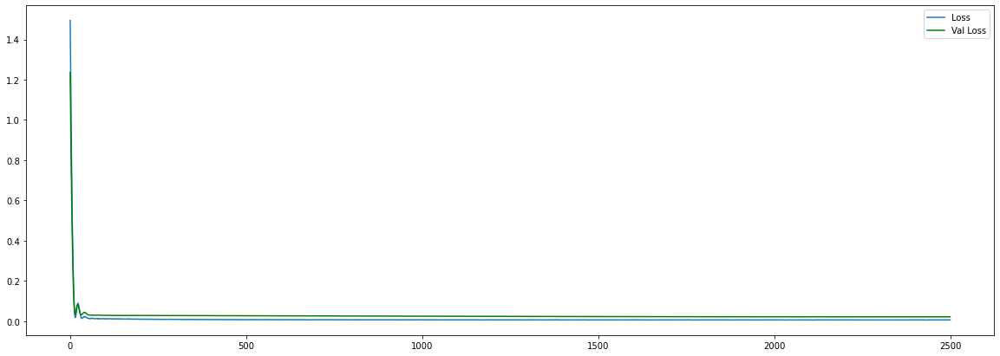

final loss: 0.0060202558524906635
final val_loss: 0.02139388956129551


In [ ]:
build_and_train_all_model(FPT_data_processor, FPT_predictor)

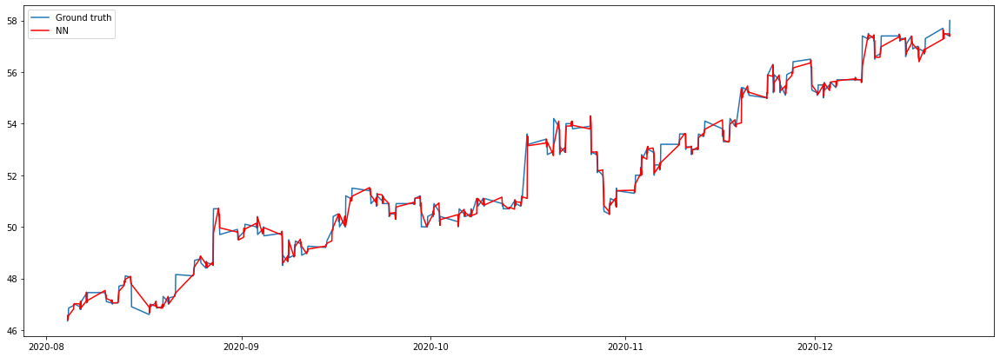

Simple NN
MSE:  0.09067876636981964
MAE:  0.19366638


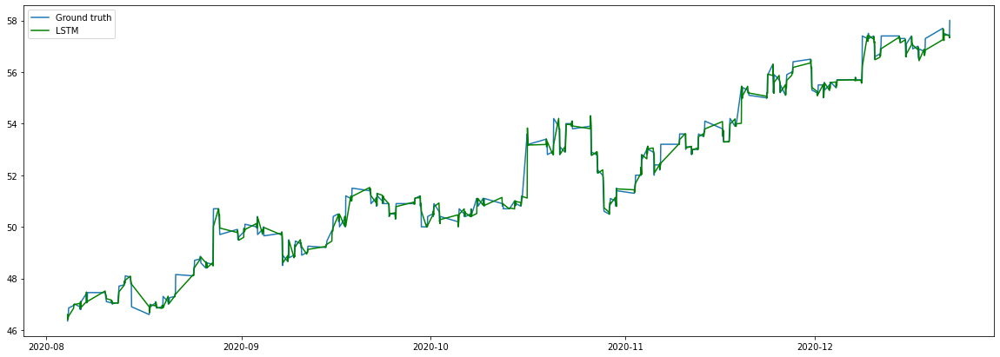

Simple LSTM
MSE:  0.09057443588972092
MAE:  0.19454707


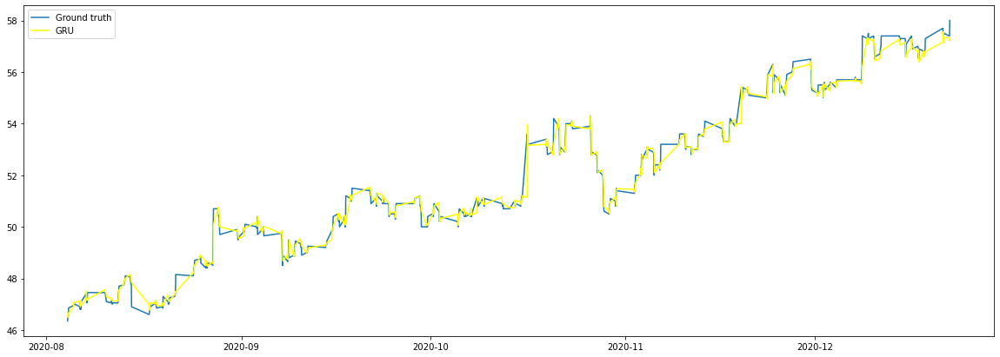

Simple GRU
MSE:  0.09270305931568146
MAE:  0.20314446


In [ ]:
evaluate_all_model(FPT_data_processor, FPT_predictor)

### MSN 

In [ ]:
MSN_data_processor = DataProcessor('MSN', MSN, '1H')
MSN_predictor = StockPredictor(MSN_data_processor.stock_name, MSN_data_processor.timeDelta)

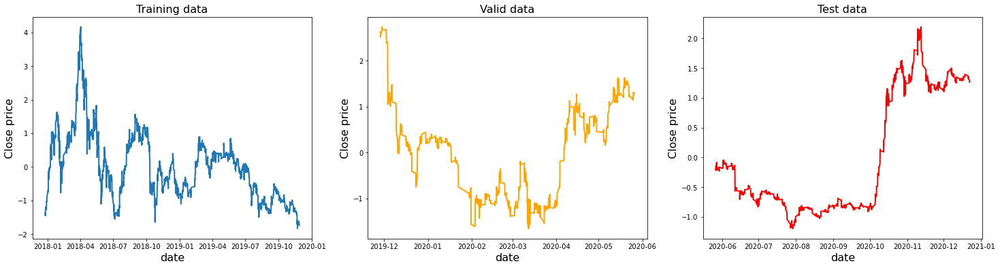

In [ ]:
MSN_data_processor.visualize_train_val_test_df()

Get best hyperparameter for simple NN


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


INFO:tensorflow:Oracle triggered exit
Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 1, 5)]            0         
_________________________________________________________________
flatten (Flatten)            (None, 5)                 0         
_________________________________________________________________
dense (Dense)                (None, 64)                384       
_________________________________________________________________
dropout (Dropout)            (None, 64)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 65        
Total params: 449
Trainable params: 449
Non-trainable params: 0
_________________________________________________________________
Start training simple NN
Epoch 1/2500
2/2 [==============================] - ETA: 0s - loss


Epoch 00030: val_loss improved from 0.03274 to 0.03177, saving model to MSN_1H_NN.hdf5
Epoch 31/2500
2/2 [==============================] - ETA: 0s - loss: 0.0893 - mae: 0.202 - 0s 17ms/step - loss: 0.0902 - mae: 0.2037 - val_loss: 0.0312 - val_mae: 0.1234

Epoch 00031: val_loss improved from 0.03177 to 0.03118, saving model to MSN_1H_NN.hdf5
Epoch 32/2500
2/2 [==============================] - ETA: 0s - loss: 0.0923 - mae: 0.203 - 0s 17ms/step - loss: 0.0934 - mae: 0.2038 - val_loss: 0.0310 - val_mae: 0.1212

Epoch 00032: val_loss improved from 0.03118 to 0.03098, saving model to MSN_1H_NN.hdf5
Epoch 33/2500
2/2 [==============================] - ETA: 0s - loss: 0.0877 - mae: 0.199 - 0s 15ms/step - loss: 0.0895 - mae: 0.2007 - val_loss: 0.0310 - val_mae: 0.1203

Epoch 00033: val_loss did not improve from 0.03098
Epoch 34/2500
2/2 [==============================] - ETA: 0s - loss: 0.0935 - mae: 0.203 - 0s 17ms/step - loss: 0.0954 - mae: 0.2039 - val_loss: 0.0311 - val_mae: 0.1201

Epo


Epoch 00064: val_loss improved from 0.02546 to 0.02533, saving model to MSN_1H_NN.hdf5
Epoch 65/2500
2/2 [==============================] - ETA: 0s - loss: 0.0781 - mae: 0.184 - 0s 17ms/step - loss: 0.0769 - mae: 0.1839 - val_loss: 0.0254 - val_mae: 0.1097

Epoch 00065: val_loss did not improve from 0.02533
Epoch 66/2500
2/2 [==============================] - ETA: 0s - loss: 0.0692 - mae: 0.183 - 0s 16ms/step - loss: 0.0689 - mae: 0.1827 - val_loss: 0.0256 - val_mae: 0.1108

Epoch 00066: val_loss did not improve from 0.02533
Epoch 67/2500
2/2 [==============================] - ETA: 0s - loss: 0.0731 - mae: 0.184 - 0s 16ms/step - loss: 0.0725 - mae: 0.1834 - val_loss: 0.0258 - val_mae: 0.1120

Epoch 00067: val_loss did not improve from 0.02533
Epoch 68/2500
2/2 [==============================] - ETA: 0s - loss: 0.0700 - mae: 0.184 - 0s 16ms/step - loss: 0.0688 - mae: 0.1830 - val_loss: 0.0258 - val_mae: 0.1125

Epoch 00068: val_loss did not improve from 0.02533
Epoch 69/2500
2/2 [=====

Epoch 00098: val_loss did not improve from 0.02153
Epoch 99/2500
2/2 [==============================] - ETA: 0s - loss: 0.0555 - mae: 0.168 - 0s 17ms/step - loss: 0.0561 - mae: 0.1680 - val_loss: 0.0224 - val_mae: 0.1007

Epoch 00099: val_loss did not improve from 0.02153
Epoch 100/2500
2/2 [==============================] - ETA: 0s - loss: 0.0519 - mae: 0.161 - 0s 15ms/step - loss: 0.0537 - mae: 0.1638 - val_loss: 0.0222 - val_mae: 0.1002

Epoch 00100: val_loss did not improve from 0.02153
Epoch 101/2500
2/2 [==============================] - ETA: 0s - loss: 0.0540 - mae: 0.166 - 0s 16ms/step - loss: 0.0547 - mae: 0.1662 - val_loss: 0.0217 - val_mae: 0.0993

Epoch 00101: val_loss did not improve from 0.02153
Epoch 102/2500
2/2 [==============================] - ETA: 0s - loss: 0.0543 - mae: 0.166 - 0s 16ms/step - loss: 0.0562 - mae: 0.1671 - val_loss: 0.0212 - val_mae: 0.0984

Epoch 00102: val_loss improved from 0.02153 to 0.02124, saving model to MSN_1H_NN.hdf5
Epoch 103/2500
2/2 [==

Epoch 00133: val_loss did not improve from 0.01935
Epoch 134/2500
2/2 [==============================] - ETA: 0s - loss: 0.0477 - mae: 0.151 - 0s 16ms/step - loss: 0.0471 - mae: 0.1504 - val_loss: 0.0201 - val_mae: 0.0945

Epoch 00134: val_loss did not improve from 0.01935
Epoch 135/2500
2/2 [==============================] - ETA: 0s - loss: 0.0455 - mae: 0.149 - 0s 16ms/step - loss: 0.0465 - mae: 0.1512 - val_loss: 0.0199 - val_mae: 0.0939

Epoch 00135: val_loss did not improve from 0.01935
Epoch 136/2500
2/2 [==============================] - ETA: 0s - loss: 0.0482 - mae: 0.153 - 0s 16ms/step - loss: 0.0479 - mae: 0.1529 - val_loss: 0.0197 - val_mae: 0.0933

Epoch 00136: val_loss did not improve from 0.01935
Epoch 137/2500
2/2 [==============================] - ETA: 0s - loss: 0.0455 - mae: 0.152 - 0s 15ms/step - loss: 0.0464 - mae: 0.1534 - val_loss: 0.0195 - val_mae: 0.0929

Epoch 00137: val_loss did not improve from 0.01935
Epoch 138/2500
2/2 [==============================] - ETA

Epoch 169/2500
2/2 [==============================] - ETA: 0s - loss: 0.0422 - mae: 0.144 - 0s 17ms/step - loss: 0.0421 - mae: 0.1447 - val_loss: 0.0186 - val_mae: 0.0918

Epoch 00169: val_loss did not improve from 0.01844
Epoch 170/2500
2/2 [==============================] - ETA: 0s - loss: 0.0395 - mae: 0.140 - 0s 16ms/step - loss: 0.0402 - mae: 0.1421 - val_loss: 0.0187 - val_mae: 0.0918

Epoch 00170: val_loss did not improve from 0.01844
Epoch 171/2500
2/2 [==============================] - ETA: 0s - loss: 0.0395 - mae: 0.139 - 0s 15ms/step - loss: 0.0398 - mae: 0.1404 - val_loss: 0.0188 - val_mae: 0.0917

Epoch 00171: val_loss did not improve from 0.01844
Epoch 172/2500
2/2 [==============================] - ETA: 0s - loss: 0.0364 - mae: 0.136 - 0s 17ms/step - loss: 0.0369 - mae: 0.1373 - val_loss: 0.0187 - val_mae: 0.0911

Epoch 00172: val_loss did not improve from 0.01844
Epoch 173/2500
2/2 [==============================] - ETA: 0s - loss: 0.0382 - mae: 0.138 - 0s 18ms/step - l

2/2 [==============================] - ETA: 0s - loss: 0.0336 - mae: 0.128 - 0s 17ms/step - loss: 0.0336 - mae: 0.1293 - val_loss: 0.0187 - val_mae: 0.0906

Epoch 00204: val_loss did not improve from 0.01766
Epoch 205/2500
2/2 [==============================] - ETA: 0s - loss: 0.0358 - mae: 0.133 - 0s 16ms/step - loss: 0.0370 - mae: 0.1341 - val_loss: 0.0187 - val_mae: 0.0910

Epoch 00205: val_loss did not improve from 0.01766
Epoch 206/2500
2/2 [==============================] - ETA: 0s - loss: 0.0358 - mae: 0.132 - 0s 15ms/step - loss: 0.0357 - mae: 0.1327 - val_loss: 0.0186 - val_mae: 0.0909

Epoch 00206: val_loss did not improve from 0.01766
Epoch 207/2500
2/2 [==============================] - ETA: 0s - loss: 0.0349 - mae: 0.132 - 0s 16ms/step - loss: 0.0352 - mae: 0.1323 - val_loss: 0.0184 - val_mae: 0.0905

Epoch 00207: val_loss did not improve from 0.01766
Epoch 208/2500
2/2 [==============================] - ETA: 0s - loss: 0.0316 - mae: 0.130 - 0s 16ms/step - loss: 0.0324 - m

Epoch 240/2500
2/2 [==============================] - ETA: 0s - loss: 0.0321 - mae: 0.124 - 0s 19ms/step - loss: 0.0317 - mae: 0.1235 - val_loss: 0.0178 - val_mae: 0.0887

Epoch 00240: val_loss did not improve from 0.01716
Epoch 241/2500
2/2 [==============================] - ETA: 0s - loss: 0.0295 - mae: 0.122 - 0s 16ms/step - loss: 0.0302 - mae: 0.1228 - val_loss: 0.0179 - val_mae: 0.0889

Epoch 00241: val_loss did not improve from 0.01716
Epoch 242/2500
2/2 [==============================] - ETA: 0s - loss: 0.0292 - mae: 0.121 - 0s 16ms/step - loss: 0.0290 - mae: 0.1211 - val_loss: 0.0179 - val_mae: 0.0889

Epoch 00242: val_loss did not improve from 0.01716
Epoch 243/2500
2/2 [==============================] - ETA: 0s - loss: 0.0320 - mae: 0.125 - 0s 16ms/step - loss: 0.0314 - mae: 0.1243 - val_loss: 0.0180 - val_mae: 0.0889

Epoch 00243: val_loss did not improve from 0.01716
Epoch 244/2500
2/2 [==============================] - ETA: 0s - loss: 0.0318 - mae: 0.124 - 0s 16ms/step - l

Epoch 00275: val_loss did not improve from 0.01665
Epoch 276/2500
2/2 [==============================] - ETA: 0s - loss: 0.0276 - mae: 0.116 - 0s 15ms/step - loss: 0.0275 - mae: 0.1163 - val_loss: 0.0170 - val_mae: 0.0862

Epoch 00276: val_loss did not improve from 0.01665
Epoch 277/2500
2/2 [==============================] - ETA: 0s - loss: 0.0264 - mae: 0.113 - 0s 18ms/step - loss: 0.0269 - mae: 0.1138 - val_loss: 0.0167 - val_mae: 0.0855

Epoch 00277: val_loss did not improve from 0.01665
Epoch 278/2500
2/2 [==============================] - ETA: 0s - loss: 0.0270 - mae: 0.117 - 0s 16ms/step - loss: 0.0274 - mae: 0.1174 - val_loss: 0.0166 - val_mae: 0.0855

Epoch 00278: val_loss improved from 0.01665 to 0.01664, saving model to MSN_1H_NN.hdf5
Epoch 279/2500
2/2 [==============================] - ETA: 0s - loss: 0.0276 - mae: 0.117 - 0s 17ms/step - loss: 0.0275 - mae: 0.1172 - val_loss: 0.0167 - val_mae: 0.0863

Epoch 00279: val_loss did not improve from 0.01664
Epoch 280/2500
2/2 [=

Epoch 00311: val_loss did not improve from 0.01649
Epoch 312/2500
2/2 [==============================] - ETA: 0s - loss: 0.0253 - mae: 0.110 - 0s 16ms/step - loss: 0.0248 - mae: 0.1103 - val_loss: 0.0172 - val_mae: 0.0867

Epoch 00312: val_loss did not improve from 0.01649
Epoch 313/2500
2/2 [==============================] - ETA: 0s - loss: 0.0250 - mae: 0.108 - 0s 19ms/step - loss: 0.0247 - mae: 0.1080 - val_loss: 0.0171 - val_mae: 0.0867

Epoch 00313: val_loss did not improve from 0.01649
Epoch 314/2500
2/2 [==============================] - ETA: 0s - loss: 0.0247 - mae: 0.110 - 0s 16ms/step - loss: 0.0244 - mae: 0.1102 - val_loss: 0.0171 - val_mae: 0.0868

Epoch 00314: val_loss did not improve from 0.01649
Epoch 315/2500
2/2 [==============================] - ETA: 0s - loss: 0.0244 - mae: 0.110 - 0s 16ms/step - loss: 0.0241 - mae: 0.1097 - val_loss: 0.0170 - val_mae: 0.0868

Epoch 00315: val_loss did not improve from 0.01649
Epoch 316/2500
2/2 [==============================] - ETA

Epoch 348/2500
2/2 [==============================] - ETA: 0s - loss: 0.0224 - mae: 0.102 - 0s 16ms/step - loss: 0.0225 - mae: 0.1025 - val_loss: 0.0167 - val_mae: 0.0858

Epoch 00348: val_loss did not improve from 0.01631
Epoch 349/2500
2/2 [==============================] - ETA: 0s - loss: 0.0231 - mae: 0.105 - 0s 16ms/step - loss: 0.0231 - mae: 0.1047 - val_loss: 0.0167 - val_mae: 0.0858

Epoch 00349: val_loss did not improve from 0.01631
Epoch 350/2500
2/2 [==============================] - ETA: 0s - loss: 0.0236 - mae: 0.106 - 0s 16ms/step - loss: 0.0234 - mae: 0.1063 - val_loss: 0.0165 - val_mae: 0.0855

Epoch 00350: val_loss did not improve from 0.01631
Epoch 351/2500
2/2 [==============================] - ETA: 0s - loss: 0.0232 - mae: 0.106 - 0s 16ms/step - loss: 0.0232 - mae: 0.1069 - val_loss: 0.0164 - val_mae: 0.0851

Epoch 00351: val_loss did not improve from 0.01631
Epoch 352/2500
2/2 [==============================] - ETA: 0s - loss: 0.0216 - mae: 0.101 - 0s 16ms/step - l

2/2 [==============================] - ETA: 0s - loss: 0.0219 - mae: 0.102 - 0s 15ms/step - loss: 0.0219 - mae: 0.1025 - val_loss: 0.0164 - val_mae: 0.0859

Epoch 00384: val_loss did not improve from 0.01627
Epoch 385/2500
2/2 [==============================] - ETA: 0s - loss: 0.0222 - mae: 0.101 - 0s 17ms/step - loss: 0.0219 - mae: 0.1009 - val_loss: 0.0162 - val_mae: 0.0856

Epoch 00385: val_loss improved from 0.01627 to 0.01624, saving model to MSN_1H_NN.hdf5
Epoch 386/2500
2/2 [==============================] - ETA: 0s - loss: 0.0217 - mae: 0.101 - 0s 16ms/step - loss: 0.0212 - mae: 0.1008 - val_loss: 0.0161 - val_mae: 0.0851

Epoch 00386: val_loss improved from 0.01624 to 0.01615, saving model to MSN_1H_NN.hdf5
Epoch 387/2500
2/2 [==============================] - ETA: 0s - loss: 0.0221 - mae: 0.103 - 0s 16ms/step - loss: 0.0217 - mae: 0.1029 - val_loss: 0.0161 - val_mae: 0.0848

Epoch 00387: val_loss improved from 0.01615 to 0.01613, saving model to MSN_1H_NN.hdf5
Epoch 388/2500


2/2 [==============================] - ETA: 0s - loss: 0.0195 - mae: 0.097 - 0s 16ms/step - loss: 0.0199 - mae: 0.0980 - val_loss: 0.0163 - val_mae: 0.0850

Epoch 00420: val_loss did not improve from 0.01613
Epoch 421/2500
2/2 [==============================] - ETA: 0s - loss: 0.0198 - mae: 0.096 - 0s 16ms/step - loss: 0.0202 - mae: 0.0972 - val_loss: 0.0164 - val_mae: 0.0852

Epoch 00421: val_loss did not improve from 0.01613
Epoch 422/2500
2/2 [==============================] - ETA: 0s - loss: 0.0203 - mae: 0.098 - 0s 16ms/step - loss: 0.0204 - mae: 0.0989 - val_loss: 0.0166 - val_mae: 0.0852

Epoch 00422: val_loss did not improve from 0.01613
Epoch 423/2500
2/2 [==============================] - ETA: 0s - loss: 0.0192 - mae: 0.098 - 0s 16ms/step - loss: 0.0194 - mae: 0.0985 - val_loss: 0.0165 - val_mae: 0.0850

Epoch 00423: val_loss did not improve from 0.01613
Epoch 424/2500
2/2 [==============================] - ETA: 0s - loss: 0.0202 - mae: 0.098 - 0s 16ms/step - loss: 0.0203 - m

2/2 [==============================] - ETA: 0s - loss: 0.0190 - mae: 0.095 - 0s 16ms/step - loss: 0.0190 - mae: 0.0954 - val_loss: 0.0160 - val_mae: 0.0835

Epoch 00456: val_loss improved from 0.01605 to 0.01599, saving model to MSN_1H_NN.hdf5
Epoch 457/2500
2/2 [==============================] - ETA: 0s - loss: 0.0203 - mae: 0.096 - 0s 16ms/step - loss: 0.0199 - mae: 0.0961 - val_loss: 0.0160 - val_mae: 0.0838

Epoch 00457: val_loss improved from 0.01599 to 0.01597, saving model to MSN_1H_NN.hdf5
Epoch 458/2500
2/2 [==============================] - ETA: 0s - loss: 0.0193 - mae: 0.095 - 0s 16ms/step - loss: 0.0194 - mae: 0.0958 - val_loss: 0.0161 - val_mae: 0.0846

Epoch 00458: val_loss did not improve from 0.01597
Epoch 459/2500
2/2 [==============================] - ETA: 0s - loss: 0.0193 - mae: 0.096 - 0s 17ms/step - loss: 0.0191 - mae: 0.0957 - val_loss: 0.0162 - val_mae: 0.0854

Epoch 00459: val_loss did not improve from 0.01597
Epoch 460/2500
2/2 [==============================]

2/2 [==============================] - ETA: 0s - loss: 0.0194 - mae: 0.096 - 0s 15ms/step - loss: 0.0194 - mae: 0.0960 - val_loss: 0.0162 - val_mae: 0.0840

Epoch 00492: val_loss did not improve from 0.01596
Epoch 493/2500
2/2 [==============================] - ETA: 0s - loss: 0.0192 - mae: 0.093 - 0s 16ms/step - loss: 0.0193 - mae: 0.0937 - val_loss: 0.0163 - val_mae: 0.0843

Epoch 00493: val_loss did not improve from 0.01596
Epoch 494/2500
2/2 [==============================] - ETA: 0s - loss: 0.0187 - mae: 0.093 - 0s 16ms/step - loss: 0.0186 - mae: 0.0930 - val_loss: 0.0164 - val_mae: 0.0846

Epoch 00494: val_loss did not improve from 0.01596
Epoch 495/2500
2/2 [==============================] - ETA: 0s - loss: 0.0189 - mae: 0.095 - 0s 16ms/step - loss: 0.0188 - mae: 0.0953 - val_loss: 0.0165 - val_mae: 0.0849

Epoch 00495: val_loss did not improve from 0.01596
Epoch 496/2500
2/2 [==============================] - ETA: 0s - loss: 0.0184 - mae: 0.093 - 0s 16ms/step - loss: 0.0180 - m


Epoch 00528: val_loss did not improve from 0.01589
Epoch 529/2500
2/2 [==============================] - ETA: 0s - loss: 0.0186 - mae: 0.092 - 0s 17ms/step - loss: 0.0185 - mae: 0.0926 - val_loss: 0.0165 - val_mae: 0.0857

Epoch 00529: val_loss did not improve from 0.01589
Epoch 530/2500
2/2 [==============================] - ETA: 0s - loss: 0.0176 - mae: 0.092 - 0s 16ms/step - loss: 0.0175 - mae: 0.0921 - val_loss: 0.0164 - val_mae: 0.0852

Epoch 00530: val_loss did not improve from 0.01589
Epoch 531/2500
2/2 [==============================] - ETA: 0s - loss: 0.0177 - mae: 0.092 - 0s 15ms/step - loss: 0.0179 - mae: 0.0923 - val_loss: 0.0164 - val_mae: 0.0851

Epoch 00531: val_loss did not improve from 0.01589
Epoch 532/2500
2/2 [==============================] - ETA: 0s - loss: 0.0199 - mae: 0.095 - 0s 18ms/step - loss: 0.0196 - mae: 0.0944 - val_loss: 0.0165 - val_mae: 0.0853

Epoch 00532: val_loss did not improve from 0.01589
Epoch 533/2500
2/2 [==============================] - ET


Epoch 00565: val_loss did not improve from 0.01589
Epoch 566/2500
2/2 [==============================] - ETA: 0s - loss: 0.0178 - mae: 0.090 - 0s 16ms/step - loss: 0.0178 - mae: 0.0909 - val_loss: 0.0162 - val_mae: 0.0847

Epoch 00566: val_loss did not improve from 0.01589
Epoch 567/2500
2/2 [==============================] - ETA: 0s - loss: 0.0166 - mae: 0.089 - 0s 16ms/step - loss: 0.0171 - mae: 0.0906 - val_loss: 0.0162 - val_mae: 0.0846

Epoch 00567: val_loss did not improve from 0.01589
Epoch 568/2500
2/2 [==============================] - ETA: 0s - loss: 0.0196 - mae: 0.093 - 0s 16ms/step - loss: 0.0193 - mae: 0.0926 - val_loss: 0.0161 - val_mae: 0.0846

Epoch 00568: val_loss did not improve from 0.01589
Epoch 569/2500
2/2 [==============================] - ETA: 0s - loss: 0.0186 - mae: 0.091 - 0s 15ms/step - loss: 0.0189 - mae: 0.0923 - val_loss: 0.0162 - val_mae: 0.0844

Epoch 00569: val_loss did not improve from 0.01589
Epoch 570/2500
2/2 [==============================] - ET


Epoch 00602: val_loss did not improve from 0.01589
Epoch 603/2500
2/2 [==============================] - ETA: 0s - loss: 0.0169 - mae: 0.088 - 0s 16ms/step - loss: 0.0171 - mae: 0.0890 - val_loss: 0.0159 - val_mae: 0.0831

Epoch 00603: val_loss did not improve from 0.01589
Epoch 604/2500
2/2 [==============================] - ETA: 0s - loss: 0.0168 - mae: 0.088 - 0s 16ms/step - loss: 0.0167 - mae: 0.0885 - val_loss: 0.0159 - val_mae: 0.0832

Epoch 00604: val_loss did not improve from 0.01589
Epoch 605/2500
2/2 [==============================] - ETA: 0s - loss: 0.0180 - mae: 0.092 - 0s 16ms/step - loss: 0.0179 - mae: 0.0919 - val_loss: 0.0160 - val_mae: 0.0835

Epoch 00605: val_loss did not improve from 0.01589
Epoch 606/2500
2/2 [==============================] - ETA: 0s - loss: 0.0180 - mae: 0.090 - 0s 16ms/step - loss: 0.0176 - mae: 0.0896 - val_loss: 0.0161 - val_mae: 0.0843

Epoch 00606: val_loss did not improve from 0.01589
Epoch 607/2500
2/2 [==============================] - ET


Epoch 00639: val_loss did not improve from 0.01589
Epoch 640/2500
2/2 [==============================] - ETA: 0s - loss: 0.0179 - mae: 0.090 - 0s 15ms/step - loss: 0.0174 - mae: 0.0901 - val_loss: 0.0160 - val_mae: 0.0833

Epoch 00640: val_loss did not improve from 0.01589
Epoch 641/2500
2/2 [==============================] - ETA: 0s - loss: 0.0161 - mae: 0.086 - 0s 16ms/step - loss: 0.0163 - mae: 0.0876 - val_loss: 0.0161 - val_mae: 0.0838

Epoch 00641: val_loss did not improve from 0.01589
Epoch 642/2500
2/2 [==============================] - ETA: 0s - loss: 0.0175 - mae: 0.090 - 0s 16ms/step - loss: 0.0173 - mae: 0.0903 - val_loss: 0.0162 - val_mae: 0.0844

Epoch 00642: val_loss did not improve from 0.01589
Epoch 643/2500
2/2 [==============================] - ETA: 0s - loss: 0.0171 - mae: 0.088 - 0s 17ms/step - loss: 0.0172 - mae: 0.0893 - val_loss: 0.0163 - val_mae: 0.0847

Epoch 00643: val_loss did not improve from 0.01589
Epoch 644/2500
2/2 [==============================] - ET

2/2 [==============================] - ETA: 0s - loss: 0.0159 - mae: 0.085 - 0s 16ms/step - loss: 0.0163 - mae: 0.0870 - val_loss: 0.0161 - val_mae: 0.0841

Epoch 00676: val_loss did not improve from 0.01588
Epoch 677/2500
2/2 [==============================] - ETA: 0s - loss: 0.0162 - mae: 0.087 - 0s 16ms/step - loss: 0.0165 - mae: 0.0883 - val_loss: 0.0163 - val_mae: 0.0843

Epoch 00677: val_loss did not improve from 0.01588
Epoch 678/2500
2/2 [==============================] - ETA: 0s - loss: 0.0154 - mae: 0.086 - 0s 16ms/step - loss: 0.0154 - mae: 0.0855 - val_loss: 0.0163 - val_mae: 0.0842

Epoch 00678: val_loss did not improve from 0.01588
Epoch 679/2500
2/2 [==============================] - ETA: 0s - loss: 0.0175 - mae: 0.089 - 0s 16ms/step - loss: 0.0176 - mae: 0.0900 - val_loss: 0.0162 - val_mae: 0.0839

Epoch 00679: val_loss did not improve from 0.01588
Epoch 680/2500
2/2 [==============================] - ETA: 0s - loss: 0.0177 - mae: 0.091 - 0s 15ms/step - loss: 0.0177 - m


Epoch 00712: val_loss did not improve from 0.01585
Epoch 713/2500
2/2 [==============================] - ETA: 0s - loss: 0.0167 - mae: 0.087 - 0s 16ms/step - loss: 0.0171 - mae: 0.0880 - val_loss: 0.0159 - val_mae: 0.0833

Epoch 00713: val_loss did not improve from 0.01585
Epoch 714/2500
2/2 [==============================] - ETA: 0s - loss: 0.0166 - mae: 0.087 - 0s 16ms/step - loss: 0.0164 - mae: 0.0870 - val_loss: 0.0158 - val_mae: 0.0838

Epoch 00714: val_loss improved from 0.01585 to 0.01583, saving model to MSN_1H_NN.hdf5
Epoch 715/2500
2/2 [==============================] - ETA: 0s - loss: 0.0157 - mae: 0.086 - 0s 17ms/step - loss: 0.0165 - mae: 0.0871 - val_loss: 0.0160 - val_mae: 0.0843

Epoch 00715: val_loss did not improve from 0.01583
Epoch 716/2500
2/2 [==============================] - ETA: 0s - loss: 0.0172 - mae: 0.087 - 0s 16ms/step - loss: 0.0171 - mae: 0.0878 - val_loss: 0.0161 - val_mae: 0.0845

Epoch 00716: val_loss did not improve from 0.01583
Epoch 717/2500
2/2 [

2/2 [==============================] - ETA: 0s - loss: 0.0162 - mae: 0.087 - 0s 16ms/step - loss: 0.0162 - mae: 0.0873 - val_loss: 0.0159 - val_mae: 0.0831

Epoch 00749: val_loss did not improve from 0.01583
Epoch 750/2500
2/2 [==============================] - ETA: 0s - loss: 0.0166 - mae: 0.088 - 0s 15ms/step - loss: 0.0166 - mae: 0.0878 - val_loss: 0.0160 - val_mae: 0.0833

Epoch 00750: val_loss did not improve from 0.01583
Epoch 751/2500
2/2 [==============================] - ETA: 0s - loss: 0.0171 - mae: 0.088 - 0s 16ms/step - loss: 0.0169 - mae: 0.0882 - val_loss: 0.0161 - val_mae: 0.0837

Epoch 00751: val_loss did not improve from 0.01583
Epoch 752/2500
2/2 [==============================] - ETA: 0s - loss: 0.0162 - mae: 0.086 - 0s 17ms/step - loss: 0.0163 - mae: 0.0872 - val_loss: 0.0161 - val_mae: 0.0839

Epoch 00752: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00752: val_loss did not improve from 0.01583
Epoch 753/2500
2/2 [======================


Epoch 00785: val_loss did not improve from 0.01583
Epoch 786/2500
2/2 [==============================] - ETA: 0s - loss: 0.0165 - mae: 0.086 - 0s 18ms/step - loss: 0.0161 - mae: 0.0858 - val_loss: 0.0161 - val_mae: 0.0842

Epoch 00786: val_loss did not improve from 0.01583
Epoch 787/2500
2/2 [==============================] - ETA: 0s - loss: 0.0154 - mae: 0.084 - 0s 15ms/step - loss: 0.0155 - mae: 0.0847 - val_loss: 0.0161 - val_mae: 0.0841

Epoch 00787: val_loss did not improve from 0.01583
Epoch 788/2500
2/2 [==============================] - ETA: 0s - loss: 0.0169 - mae: 0.087 - 0s 16ms/step - loss: 0.0166 - mae: 0.0868 - val_loss: 0.0160 - val_mae: 0.0839

Epoch 00788: val_loss did not improve from 0.01583
Epoch 789/2500
2/2 [==============================] - ETA: 0s - loss: 0.0171 - mae: 0.087 - 0s 16ms/step - loss: 0.0169 - mae: 0.0879 - val_loss: 0.0160 - val_mae: 0.0835

Epoch 00789: val_loss did not improve from 0.01583
Epoch 790/2500
2/2 [==============================] - ET


Epoch 00822: val_loss did not improve from 0.01583
Epoch 823/2500
2/2 [==============================] - ETA: 0s - loss: 0.0166 - mae: 0.087 - 0s 16ms/step - loss: 0.0164 - mae: 0.0870 - val_loss: 0.0162 - val_mae: 0.0841

Epoch 00823: val_loss did not improve from 0.01583
Epoch 824/2500
2/2 [==============================] - ETA: 0s - loss: 0.0168 - mae: 0.086 - 0s 15ms/step - loss: 0.0165 - mae: 0.0858 - val_loss: 0.0162 - val_mae: 0.0840

Epoch 00824: val_loss did not improve from 0.01583
Epoch 825/2500
2/2 [==============================] - ETA: 0s - loss: 0.0150 - mae: 0.084 - 0s 16ms/step - loss: 0.0156 - mae: 0.0850 - val_loss: 0.0161 - val_mae: 0.0838

Epoch 00825: val_loss did not improve from 0.01583
Epoch 826/2500
2/2 [==============================] - ETA: 0s - loss: 0.0169 - mae: 0.087 - 0s 16ms/step - loss: 0.0166 - mae: 0.0874 - val_loss: 0.0161 - val_mae: 0.0838

Epoch 00826: val_loss did not improve from 0.01583
Epoch 827/2500
2/2 [==============================] - ET


Epoch 00859: val_loss did not improve from 0.01583
Epoch 860/2500
2/2 [==============================] - ETA: 0s - loss: 0.0168 - mae: 0.087 - 0s 18ms/step - loss: 0.0169 - mae: 0.0876 - val_loss: 0.0160 - val_mae: 0.0842

Epoch 00860: val_loss did not improve from 0.01583
Epoch 861/2500
2/2 [==============================] - ETA: 0s - loss: 0.0169 - mae: 0.088 - 0s 16ms/step - loss: 0.0168 - mae: 0.0880 - val_loss: 0.0160 - val_mae: 0.0840

Epoch 00861: val_loss did not improve from 0.01583
Epoch 862/2500
2/2 [==============================] - ETA: 0s - loss: 0.0173 - mae: 0.088 - 0s 17ms/step - loss: 0.0172 - mae: 0.0882 - val_loss: 0.0161 - val_mae: 0.0840

Epoch 00862: val_loss did not improve from 0.01583
Epoch 863/2500
2/2 [==============================] - ETA: 0s - loss: 0.0173 - mae: 0.088 - 0s 16ms/step - loss: 0.0168 - mae: 0.0880 - val_loss: 0.0161 - val_mae: 0.0840

Epoch 00863: val_loss did not improve from 0.01583
Epoch 864/2500
2/2 [==============================] - ET


Epoch 00896: val_loss did not improve from 0.01583
Epoch 897/2500
2/2 [==============================] - ETA: 0s - loss: 0.0163 - mae: 0.088 - 0s 16ms/step - loss: 0.0166 - mae: 0.0883 - val_loss: 0.0159 - val_mae: 0.0835

Epoch 00897: val_loss did not improve from 0.01583
Epoch 898/2500
2/2 [==============================] - ETA: 0s - loss: 0.0157 - mae: 0.084 - 0s 16ms/step - loss: 0.0159 - mae: 0.0853 - val_loss: 0.0159 - val_mae: 0.0834

Epoch 00898: val_loss did not improve from 0.01583
Epoch 899/2500
2/2 [==============================] - ETA: 0s - loss: 0.0171 - mae: 0.087 - 0s 15ms/step - loss: 0.0172 - mae: 0.0872 - val_loss: 0.0159 - val_mae: 0.0834

Epoch 00899: val_loss did not improve from 0.01583
Epoch 900/2500
2/2 [==============================] - ETA: 0s - loss: 0.0168 - mae: 0.086 - 0s 15ms/step - loss: 0.0169 - mae: 0.0868 - val_loss: 0.0159 - val_mae: 0.0834

Epoch 00900: val_loss did not improve from 0.01583
Epoch 901/2500
2/2 [==============================] - ET


Epoch 00933: val_loss did not improve from 0.01583
Epoch 934/2500
2/2 [==============================] - ETA: 0s - loss: 0.0179 - mae: 0.088 - 0s 17ms/step - loss: 0.0175 - mae: 0.0883 - val_loss: 0.0160 - val_mae: 0.0834

Epoch 00934: val_loss did not improve from 0.01583
Epoch 935/2500
2/2 [==============================] - ETA: 0s - loss: 0.0149 - mae: 0.083 - 0s 17ms/step - loss: 0.0151 - mae: 0.0839 - val_loss: 0.0161 - val_mae: 0.0835

Epoch 00935: val_loss did not improve from 0.01583
Epoch 936/2500
2/2 [==============================] - ETA: 0s - loss: 0.0151 - mae: 0.084 - 0s 17ms/step - loss: 0.0156 - mae: 0.0851 - val_loss: 0.0161 - val_mae: 0.0837

Epoch 00936: val_loss did not improve from 0.01583
Epoch 937/2500
2/2 [==============================] - ETA: 0s - loss: 0.0163 - mae: 0.086 - 0s 16ms/step - loss: 0.0162 - mae: 0.0861 - val_loss: 0.0162 - val_mae: 0.0839

Epoch 00937: val_loss did not improve from 0.01583
Epoch 938/2500
2/2 [==============================] - ET


Epoch 00970: val_loss did not improve from 0.01583
Epoch 971/2500
2/2 [==============================] - ETA: 0s - loss: 0.0164 - mae: 0.087 - 0s 16ms/step - loss: 0.0160 - mae: 0.0867 - val_loss: 0.0164 - val_mae: 0.0850

Epoch 00971: val_loss did not improve from 0.01583
Epoch 972/2500
2/2 [==============================] - ETA: 0s - loss: 0.0153 - mae: 0.085 - 0s 16ms/step - loss: 0.0157 - mae: 0.0864 - val_loss: 0.0163 - val_mae: 0.0848

Epoch 00972: val_loss did not improve from 0.01583
Epoch 973/2500
2/2 [==============================] - ETA: 0s - loss: 0.0163 - mae: 0.087 - 0s 16ms/step - loss: 0.0161 - mae: 0.0874 - val_loss: 0.0162 - val_mae: 0.0847

Epoch 00973: val_loss did not improve from 0.01583
Epoch 974/2500
2/2 [==============================] - ETA: 0s - loss: 0.0165 - mae: 0.086 - 0s 15ms/step - loss: 0.0165 - mae: 0.0860 - val_loss: 0.0161 - val_mae: 0.0846

Epoch 00974: val_loss did not improve from 0.01583
Epoch 975/2500
2/2 [==============================] - ET

2/2 [==============================] - ETA: 0s - loss: 0.0158 - mae: 0.085 - 0s 16ms/step - loss: 0.0161 - mae: 0.0865 - val_loss: 0.0161 - val_mae: 0.0840

Epoch 01007: val_loss did not improve from 0.01583
Epoch 1008/2500
2/2 [==============================] - ETA: 0s - loss: 0.0157 - mae: 0.084 - 0s 17ms/step - loss: 0.0156 - mae: 0.0845 - val_loss: 0.0161 - val_mae: 0.0839

Epoch 01008: val_loss did not improve from 0.01583
Epoch 1009/2500
2/2 [==============================] - ETA: 0s - loss: 0.0169 - mae: 0.087 - 0s 16ms/step - loss: 0.0167 - mae: 0.0867 - val_loss: 0.0161 - val_mae: 0.0837

Epoch 01009: val_loss did not improve from 0.01583
Epoch 1010/2500
2/2 [==============================] - ETA: 0s - loss: 0.0168 - mae: 0.086 - 0s 16ms/step - loss: 0.0165 - mae: 0.0863 - val_loss: 0.0161 - val_mae: 0.0837

Epoch 01010: val_loss did not improve from 0.01583
Epoch 1011/2500
2/2 [==============================] - ETA: 0s - loss: 0.0171 - mae: 0.087 - 0s 17ms/step - loss: 0.0170


Epoch 01043: val_loss did not improve from 0.01583
Epoch 1044/2500
2/2 [==============================] - ETA: 0s - loss: 0.0150 - mae: 0.084 - 0s 16ms/step - loss: 0.0152 - mae: 0.0845 - val_loss: 0.0161 - val_mae: 0.0840

Epoch 01044: val_loss did not improve from 0.01583
Epoch 1045/2500
2/2 [==============================] - ETA: 0s - loss: 0.0167 - mae: 0.086 - 0s 15ms/step - loss: 0.0165 - mae: 0.0864 - val_loss: 0.0161 - val_mae: 0.0838

Epoch 01045: val_loss did not improve from 0.01583
Epoch 1046/2500
2/2 [==============================] - ETA: 0s - loss: 0.0170 - mae: 0.086 - 0s 16ms/step - loss: 0.0169 - mae: 0.0865 - val_loss: 0.0161 - val_mae: 0.0837

Epoch 01046: val_loss did not improve from 0.01583
Epoch 1047/2500
2/2 [==============================] - ETA: 0s - loss: 0.0159 - mae: 0.086 - 0s 17ms/step - loss: 0.0161 - mae: 0.0874 - val_loss: 0.0161 - val_mae: 0.0837

Epoch 01047: val_loss did not improve from 0.01583
Epoch 1048/2500
2/2 [==============================]

2/2 [==============================] - ETA: 0s - loss: 0.0172 - mae: 0.088 - 0s 16ms/step - loss: 0.0168 - mae: 0.0880 - val_loss: 0.0163 - val_mae: 0.0843

Epoch 01080: val_loss did not improve from 0.01583
Epoch 1081/2500
2/2 [==============================] - ETA: 0s - loss: 0.0174 - mae: 0.087 - 0s 17ms/step - loss: 0.0170 - mae: 0.0871 - val_loss: 0.0162 - val_mae: 0.0842

Epoch 01081: val_loss did not improve from 0.01583
Epoch 1082/2500
2/2 [==============================] - ETA: 0s - loss: 0.0164 - mae: 0.086 - 0s 17ms/step - loss: 0.0160 - mae: 0.0852 - val_loss: 0.0162 - val_mae: 0.0840

Epoch 01082: val_loss did not improve from 0.01583
Epoch 1083/2500
2/2 [==============================] - ETA: 0s - loss: 0.0164 - mae: 0.087 - 0s 16ms/step - loss: 0.0164 - mae: 0.0872 - val_loss: 0.0161 - val_mae: 0.0839

Epoch 01083: val_loss did not improve from 0.01583
Epoch 1084/2500
2/2 [==============================] - ETA: 0s - loss: 0.0160 - mae: 0.085 - 0s 15ms/step - loss: 0.0158


Epoch 01116: val_loss did not improve from 0.01583
Epoch 1117/2500
2/2 [==============================] - ETA: 0s - loss: 0.0165 - mae: 0.086 - 0s 16ms/step - loss: 0.0163 - mae: 0.0868 - val_loss: 0.0160 - val_mae: 0.0832

Epoch 01117: val_loss did not improve from 0.01583
Epoch 1118/2500
2/2 [==============================] - ETA: 0s - loss: 0.0157 - mae: 0.085 - 0s 17ms/step - loss: 0.0160 - mae: 0.0862 - val_loss: 0.0159 - val_mae: 0.0830

Epoch 01118: val_loss did not improve from 0.01583
Epoch 1119/2500
2/2 [==============================] - ETA: 0s - loss: 0.0160 - mae: 0.086 - 0s 16ms/step - loss: 0.0161 - mae: 0.0862 - val_loss: 0.0159 - val_mae: 0.0830

Epoch 01119: val_loss did not improve from 0.01583
Epoch 1120/2500
2/2 [==============================] - ETA: 0s - loss: 0.0161 - mae: 0.087 - 0s 16ms/step - loss: 0.0157 - mae: 0.0861 - val_loss: 0.0158 - val_mae: 0.0830

Epoch 01120: val_loss improved from 0.01583 to 0.01583, saving model to MSN_1H_NN.hdf5
Epoch 1121/2500


Epoch 01152: val_loss did not improve from 0.01581
Epoch 1153/2500
2/2 [==============================] - ETA: 0s - loss: 0.0157 - mae: 0.085 - 0s 15ms/step - loss: 0.0157 - mae: 0.0854 - val_loss: 0.0162 - val_mae: 0.0840

Epoch 01153: val_loss did not improve from 0.01581
Epoch 1154/2500
2/2 [==============================] - ETA: 0s - loss: 0.0157 - mae: 0.085 - 0s 16ms/step - loss: 0.0156 - mae: 0.0856 - val_loss: 0.0162 - val_mae: 0.0841

Epoch 01154: val_loss did not improve from 0.01581
Epoch 1155/2500
2/2 [==============================] - ETA: 0s - loss: 0.0152 - mae: 0.084 - 0s 15ms/step - loss: 0.0152 - mae: 0.0849 - val_loss: 0.0163 - val_mae: 0.0842

Epoch 01155: val_loss did not improve from 0.01581
Epoch 1156/2500
2/2 [==============================] - ETA: 0s - loss: 0.0154 - mae: 0.084 - 0s 15ms/step - loss: 0.0156 - mae: 0.0855 - val_loss: 0.0162 - val_mae: 0.0841

Epoch 01156: val_loss did not improve from 0.01581
Epoch 1157/2500
2/2 [==============================] 

2/2 [==============================] - ETA: 0s - loss: 0.0170 - mae: 0.086 - 0s 17ms/step - loss: 0.0165 - mae: 0.0860 - val_loss: 0.0159 - val_mae: 0.0830

Epoch 01189: val_loss did not improve from 0.01581
Epoch 1190/2500
2/2 [==============================] - ETA: 0s - loss: 0.0158 - mae: 0.085 - 0s 16ms/step - loss: 0.0163 - mae: 0.0863 - val_loss: 0.0159 - val_mae: 0.0832

Epoch 01190: val_loss did not improve from 0.01581
Epoch 1191/2500
2/2 [==============================] - ETA: 0s - loss: 0.0162 - mae: 0.086 - 0s 16ms/step - loss: 0.0162 - mae: 0.0870 - val_loss: 0.0159 - val_mae: 0.0836

Epoch 01191: val_loss did not improve from 0.01581
Epoch 1192/2500
2/2 [==============================] - ETA: 0s - loss: 0.0158 - mae: 0.085 - 0s 16ms/step - loss: 0.0163 - mae: 0.0861 - val_loss: 0.0160 - val_mae: 0.0839

Epoch 01192: val_loss did not improve from 0.01581
Epoch 1193/2500
2/2 [==============================] - ETA: 0s - loss: 0.0166 - mae: 0.086 - 0s 16ms/step - loss: 0.0165


Epoch 01225: val_loss did not improve from 0.01581
Epoch 1226/2500
2/2 [==============================] - ETA: 0s - loss: 0.0169 - mae: 0.087 - 0s 16ms/step - loss: 0.0166 - mae: 0.0870 - val_loss: 0.0162 - val_mae: 0.0841

Epoch 01226: val_loss did not improve from 0.01581
Epoch 1227/2500
2/2 [==============================] - ETA: 0s - loss: 0.0155 - mae: 0.085 - 0s 16ms/step - loss: 0.0158 - mae: 0.0863 - val_loss: 0.0162 - val_mae: 0.0840

Epoch 01227: val_loss did not improve from 0.01581
Epoch 1228/2500
2/2 [==============================] - ETA: 0s - loss: 0.0160 - mae: 0.086 - 0s 16ms/step - loss: 0.0160 - mae: 0.0863 - val_loss: 0.0161 - val_mae: 0.0838

Epoch 01228: val_loss did not improve from 0.01581
Epoch 1229/2500
2/2 [==============================] - ETA: 0s - loss: 0.0162 - mae: 0.087 - 0s 15ms/step - loss: 0.0162 - mae: 0.0865 - val_loss: 0.0161 - val_mae: 0.0837

Epoch 01229: val_loss did not improve from 0.01581
Epoch 1230/2500
2/2 [==============================]

Epoch 01261: val_loss did not improve from 0.01581
Epoch 1262/2500
2/2 [==============================] - ETA: 0s - loss: 0.0159 - mae: 0.085 - 0s 16ms/step - loss: 0.0157 - mae: 0.0856 - val_loss: 0.0161 - val_mae: 0.0841

Epoch 01262: val_loss did not improve from 0.01581
Epoch 1263/2500
2/2 [==============================] - ETA: 0s - loss: 0.0151 - mae: 0.084 - 0s 16ms/step - loss: 0.0155 - mae: 0.0847 - val_loss: 0.0161 - val_mae: 0.0841

Epoch 01263: val_loss did not improve from 0.01581
Epoch 1264/2500
2/2 [==============================] - ETA: 0s - loss: 0.0165 - mae: 0.086 - 0s 15ms/step - loss: 0.0162 - mae: 0.0856 - val_loss: 0.0161 - val_mae: 0.0840

Epoch 01264: val_loss did not improve from 0.01581
Epoch 1265/2500
2/2 [==============================] - ETA: 0s - loss: 0.0161 - mae: 0.085 - 0s 16ms/step - loss: 0.0160 - mae: 0.0858 - val_loss: 0.0161 - val_mae: 0.0839

Epoch 01265: val_loss did not improve from 0.01581
Epoch 1266/2500
2/2 [==============================] 

2/2 [==============================] - ETA: 0s - loss: 0.0155 - mae: 0.084 - 0s 15ms/step - loss: 0.0156 - mae: 0.0853 - val_loss: 0.0160 - val_mae: 0.0834

Epoch 01298: val_loss did not improve from 0.01581
Epoch 1299/2500
2/2 [==============================] - ETA: 0s - loss: 0.0161 - mae: 0.086 - 0s 16ms/step - loss: 0.0158 - mae: 0.0858 - val_loss: 0.0160 - val_mae: 0.0835

Epoch 01299: val_loss did not improve from 0.01581
Epoch 1300/2500
2/2 [==============================] - ETA: 0s - loss: 0.0161 - mae: 0.086 - 0s 15ms/step - loss: 0.0158 - mae: 0.0862 - val_loss: 0.0160 - val_mae: 0.0835

Epoch 01300: val_loss did not improve from 0.01581
Epoch 1301/2500
2/2 [==============================] - ETA: 0s - loss: 0.0155 - mae: 0.085 - 0s 16ms/step - loss: 0.0158 - mae: 0.0858 - val_loss: 0.0160 - val_mae: 0.0836

Epoch 01301: val_loss did not improve from 0.01581
Epoch 1302/2500
2/2 [==============================] - ETA: 0s - loss: 0.0155 - mae: 0.084 - 0s 15ms/step - loss: 0.0154


Epoch 01334: val_loss did not improve from 0.01581
Epoch 1335/2500
2/2 [==============================] - ETA: 0s - loss: 0.0166 - mae: 0.086 - 0s 15ms/step - loss: 0.0168 - mae: 0.0869 - val_loss: 0.0160 - val_mae: 0.0834

Epoch 01335: val_loss did not improve from 0.01581
Epoch 1336/2500
2/2 [==============================] - ETA: 0s - loss: 0.0166 - mae: 0.086 - 0s 16ms/step - loss: 0.0167 - mae: 0.0865 - val_loss: 0.0160 - val_mae: 0.0834

Epoch 01336: val_loss did not improve from 0.01581
Epoch 1337/2500
2/2 [==============================] - ETA: 0s - loss: 0.0160 - mae: 0.087 - 0s 18ms/step - loss: 0.0162 - mae: 0.0868 - val_loss: 0.0160 - val_mae: 0.0835

Epoch 01337: val_loss did not improve from 0.01581
Epoch 1338/2500
2/2 [==============================] - ETA: 0s - loss: 0.0158 - mae: 0.085 - 0s 17ms/step - loss: 0.0158 - mae: 0.0848 - val_loss: 0.0161 - val_mae: 0.0836

Epoch 01338: val_loss did not improve from 0.01581
Epoch 1339/2500
2/2 [==============================]

2/2 [==============================] - ETA: 0s - loss: 0.0162 - mae: 0.086 - 0s 16ms/step - loss: 0.0162 - mae: 0.0866 - val_loss: 0.0160 - val_mae: 0.0834

Epoch 01371: val_loss did not improve from 0.01581
Epoch 1372/2500
2/2 [==============================] - ETA: 0s - loss: 0.0153 - mae: 0.084 - 0s 16ms/step - loss: 0.0155 - mae: 0.0851 - val_loss: 0.0160 - val_mae: 0.0834

Epoch 01372: val_loss did not improve from 0.01581
Epoch 1373/2500
2/2 [==============================] - ETA: 0s - loss: 0.0158 - mae: 0.085 - 0s 16ms/step - loss: 0.0159 - mae: 0.0855 - val_loss: 0.0160 - val_mae: 0.0834

Epoch 01373: val_loss did not improve from 0.01581
Epoch 1374/2500
2/2 [==============================] - ETA: 0s - loss: 0.0155 - mae: 0.085 - 0s 16ms/step - loss: 0.0159 - mae: 0.0863 - val_loss: 0.0160 - val_mae: 0.0834

Epoch 01374: val_loss did not improve from 0.01581
Epoch 1375/2500
2/2 [==============================] - ETA: 0s - loss: 0.0169 - mae: 0.086 - 0s 16ms/step - loss: 0.0166


Epoch 01407: val_loss did not improve from 0.01581
Epoch 1408/2500
2/2 [==============================] - ETA: 0s - loss: 0.0161 - mae: 0.086 - 0s 16ms/step - loss: 0.0160 - mae: 0.0862 - val_loss: 0.0160 - val_mae: 0.0836

Epoch 01408: val_loss did not improve from 0.01581
Epoch 1409/2500
2/2 [==============================] - ETA: 0s - loss: 0.0157 - mae: 0.085 - 0s 16ms/step - loss: 0.0156 - mae: 0.0850 - val_loss: 0.0160 - val_mae: 0.0836

Epoch 01409: val_loss did not improve from 0.01581
Epoch 1410/2500
2/2 [==============================] - ETA: 0s - loss: 0.0162 - mae: 0.086 - 0s 16ms/step - loss: 0.0161 - mae: 0.0864 - val_loss: 0.0160 - val_mae: 0.0836

Epoch 01410: val_loss did not improve from 0.01581
Epoch 1411/2500
2/2 [==============================] - ETA: 0s - loss: 0.0153 - mae: 0.084 - 0s 16ms/step - loss: 0.0156 - mae: 0.0851 - val_loss: 0.0160 - val_mae: 0.0836

Epoch 01411: val_loss did not improve from 0.01581
Epoch 1412/2500
2/2 [==============================]

2/2 [==============================] - ETA: 0s - loss: 0.0158 - mae: 0.085 - 0s 16ms/step - loss: 0.0156 - mae: 0.0851 - val_loss: 0.0160 - val_mae: 0.0836

Epoch 01444: val_loss did not improve from 0.01581
Epoch 1445/2500
2/2 [==============================] - ETA: 0s - loss: 0.0160 - mae: 0.087 - 0s 16ms/step - loss: 0.0162 - mae: 0.0872 - val_loss: 0.0160 - val_mae: 0.0836

Epoch 01445: val_loss did not improve from 0.01581
Epoch 1446/2500
2/2 [==============================] - ETA: 0s - loss: 0.0156 - mae: 0.085 - 0s 16ms/step - loss: 0.0155 - mae: 0.0851 - val_loss: 0.0161 - val_mae: 0.0835

Epoch 01446: val_loss did not improve from 0.01581
Epoch 1447/2500
2/2 [==============================] - ETA: 0s - loss: 0.0160 - mae: 0.084 - 0s 16ms/step - loss: 0.0161 - mae: 0.0845 - val_loss: 0.0161 - val_mae: 0.0835

Epoch 01447: val_loss did not improve from 0.01581
Epoch 1448/2500
2/2 [==============================] - ETA: 0s - loss: 0.0154 - mae: 0.084 - 0s 17ms/step - loss: 0.0156


Epoch 01480: val_loss did not improve from 0.01581
Epoch 1481/2500
2/2 [==============================] - ETA: 0s - loss: 0.0162 - mae: 0.086 - 0s 16ms/step - loss: 0.0163 - mae: 0.0862 - val_loss: 0.0161 - val_mae: 0.0835

Epoch 01481: val_loss did not improve from 0.01581
Epoch 1482/2500
2/2 [==============================] - ETA: 0s - loss: 0.0164 - mae: 0.086 - 0s 15ms/step - loss: 0.0163 - mae: 0.0862 - val_loss: 0.0161 - val_mae: 0.0836

Epoch 01482: val_loss did not improve from 0.01581
Epoch 1483/2500
2/2 [==============================] - ETA: 0s - loss: 0.0163 - mae: 0.085 - 0s 16ms/step - loss: 0.0162 - mae: 0.0859 - val_loss: 0.0161 - val_mae: 0.0836

Epoch 01483: val_loss did not improve from 0.01581
Epoch 1484/2500
2/2 [==============================] - ETA: 0s - loss: 0.0147 - mae: 0.082 - 0s 17ms/step - loss: 0.0150 - mae: 0.0832 - val_loss: 0.0161 - val_mae: 0.0837

Epoch 01484: val_loss did not improve from 0.01581
Epoch 1485/2500
2/2 [==============================]

Epoch 01516: val_loss did not improve from 0.01581
Epoch 1517/2500
2/2 [==============================] - ETA: 0s - loss: 0.0160 - mae: 0.084 - 0s 17ms/step - loss: 0.0160 - mae: 0.0849 - val_loss: 0.0159 - val_mae: 0.0835

Epoch 01517: val_loss did not improve from 0.01581
Epoch 1518/2500
2/2 [==============================] - ETA: 0s - loss: 0.0156 - mae: 0.083 - 0s 16ms/step - loss: 0.0160 - mae: 0.0846 - val_loss: 0.0160 - val_mae: 0.0836

Epoch 01518: val_loss did not improve from 0.01581
Epoch 1519/2500
2/2 [==============================] - ETA: 0s - loss: 0.0159 - mae: 0.084 - 0s 16ms/step - loss: 0.0159 - mae: 0.0845 - val_loss: 0.0160 - val_mae: 0.0836

Epoch 01519: val_loss did not improve from 0.01581
Epoch 1520/2500
2/2 [==============================] - ETA: 0s - loss: 0.0159 - mae: 0.085 - 0s 16ms/step - loss: 0.0160 - mae: 0.0853 - val_loss: 0.0160 - val_mae: 0.0836

Epoch 01520: val_loss did not improve from 0.01581
Epoch 1521/2500
2/2 [==============================] 

2/2 [==============================] - ETA: 0s - loss: 0.0164 - mae: 0.086 - 0s 16ms/step - loss: 0.0163 - mae: 0.0862 - val_loss: 0.0161 - val_mae: 0.0839

Epoch 01553: val_loss did not improve from 0.01581
Epoch 1554/2500
2/2 [==============================] - ETA: 0s - loss: 0.0163 - mae: 0.085 - 0s 17ms/step - loss: 0.0162 - mae: 0.0851 - val_loss: 0.0161 - val_mae: 0.0840

Epoch 01554: val_loss did not improve from 0.01581
Epoch 1555/2500
2/2 [==============================] - ETA: 0s - loss: 0.0157 - mae: 0.084 - 0s 17ms/step - loss: 0.0157 - mae: 0.0848 - val_loss: 0.0161 - val_mae: 0.0840

Epoch 01555: val_loss did not improve from 0.01581
Epoch 1556/2500
2/2 [==============================] - ETA: 0s - loss: 0.0155 - mae: 0.084 - 0s 16ms/step - loss: 0.0155 - mae: 0.0846 - val_loss: 0.0161 - val_mae: 0.0840

Epoch 01556: val_loss did not improve from 0.01581
Epoch 1557/2500
2/2 [==============================] - ETA: 0s - loss: 0.0154 - mae: 0.084 - 0s 15ms/step - loss: 0.0156


Epoch 01589: val_loss did not improve from 0.01581
Epoch 1590/2500
2/2 [==============================] - ETA: 0s - loss: 0.0160 - mae: 0.085 - 0s 16ms/step - loss: 0.0160 - mae: 0.0855 - val_loss: 0.0159 - val_mae: 0.0833

Epoch 01590: val_loss did not improve from 0.01581
Epoch 1591/2500
2/2 [==============================] - ETA: 0s - loss: 0.0161 - mae: 0.086 - 0s 17ms/step - loss: 0.0162 - mae: 0.0860 - val_loss: 0.0159 - val_mae: 0.0832

Epoch 01591: val_loss did not improve from 0.01581
Epoch 1592/2500
2/2 [==============================] - ETA: 0s - loss: 0.0167 - mae: 0.086 - 0s 15ms/step - loss: 0.0162 - mae: 0.0856 - val_loss: 0.0159 - val_mae: 0.0832

Epoch 01592: val_loss did not improve from 0.01581
Epoch 1593/2500
2/2 [==============================] - ETA: 0s - loss: 0.0155 - mae: 0.084 - 0s 16ms/step - loss: 0.0155 - mae: 0.0843 - val_loss: 0.0159 - val_mae: 0.0833

Epoch 01593: val_loss did not improve from 0.01581
Epoch 1594/2500
2/2 [==============================]

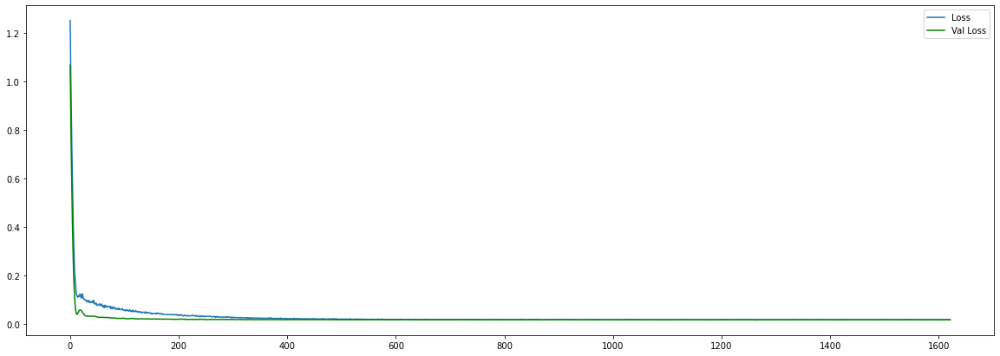

final loss: 0.016029205173254013
final val_loss: 0.016054103150963783
Get best hyperparameter for simple LSTM


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


INFO:tensorflow:Oracle triggered exit
Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 1, 5)]            0         
_________________________________________________________________
lstm (LSTM)                  (None, 1, 96)             39168     
_________________________________________________________________
lstm_1 (LSTM)                (None, 1, 96)             74112     
_________________________________________________________________
lstm_2 (LSTM)                (None, 96)                74112     
_________________________________________________________________
dense (Dense)                (None, 24)                2328      
_________________________________________________________________
dense_1 (Dense)              (None, 24)                600       
_________________________________________________________________
dense_2 (Dense)        


Epoch 00028: val_loss improved from 0.02102 to 0.02073, saving model to MSN_1H_LSTM.hdf5
Epoch 29/2500
2/2 [==============================] - ETA: 0s - loss: 0.0178 - mae: 0.089 - 0s 29ms/step - loss: 0.0179 - mae: 0.0899 - val_loss: 0.0230 - val_mae: 0.1140

Epoch 00029: val_loss did not improve from 0.02073
Epoch 30/2500
2/2 [==============================] - ETA: 0s - loss: 0.0191 - mae: 0.096 - 0s 29ms/step - loss: 0.0196 - mae: 0.0975 - val_loss: 0.0245 - val_mae: 0.1193

Epoch 00030: val_loss did not improve from 0.02073
Epoch 31/2500
2/2 [==============================] - ETA: 0s - loss: 0.0198 - mae: 0.101 - 0s 28ms/step - loss: 0.0205 - mae: 0.1022 - val_loss: 0.0236 - val_mae: 0.1160

Epoch 00031: val_loss did not improve from 0.02073
Epoch 32/2500
2/2 [==============================] - ETA: 0s - loss: 0.0203 - mae: 0.099 - 0s 28ms/step - loss: 0.0200 - mae: 0.0989 - val_loss: 0.0217 - val_mae: 0.1080

Epoch 00032: val_loss did not improve from 0.02073
Epoch 33/2500
2/2 [===


Epoch 00064: val_loss improved from 0.02040 to 0.02024, saving model to MSN_1H_LSTM.hdf5
Epoch 65/2500
2/2 [==============================] - ETA: 0s - loss: 0.0157 - mae: 0.084 - 0s 29ms/step - loss: 0.0155 - mae: 0.0839 - val_loss: 0.0199 - val_mae: 0.0988

Epoch 00065: val_loss improved from 0.02024 to 0.01993, saving model to MSN_1H_LSTM.hdf5
Epoch 66/2500
2/2 [==============================] - ETA: 0s - loss: 0.0159 - mae: 0.084 - 0s 28ms/step - loss: 0.0155 - mae: 0.0839 - val_loss: 0.0198 - val_mae: 0.0987

Epoch 00066: val_loss improved from 0.01993 to 0.01976, saving model to MSN_1H_LSTM.hdf5
Epoch 67/2500
2/2 [==============================] - ETA: 0s - loss: 0.0153 - mae: 0.083 - 0s 28ms/step - loss: 0.0153 - mae: 0.0835 - val_loss: 0.0197 - val_mae: 0.0985

Epoch 00067: val_loss improved from 0.01976 to 0.01967, saving model to MSN_1H_LSTM.hdf5
Epoch 68/2500
2/2 [==============================] - ETA: 0s - loss: 0.0157 - mae: 0.083 - 0s 29ms/step - loss: 0.0154 - mae: 0.08

Epoch 00098: val_loss improved from 0.01878 to 0.01875, saving model to MSN_1H_LSTM.hdf5
Epoch 99/2500
2/2 [==============================] - ETA: 0s - loss: 0.0138 - mae: 0.076 - 0s 27ms/step - loss: 0.0136 - mae: 0.0756 - val_loss: 0.0189 - val_mae: 0.0943

Epoch 00099: val_loss did not improve from 0.01875
Epoch 100/2500
2/2 [==============================] - ETA: 0s - loss: 0.0138 - mae: 0.075 - 0s 27ms/step - loss: 0.0136 - mae: 0.0752 - val_loss: 0.0190 - val_mae: 0.0950

Epoch 00100: val_loss did not improve from 0.01875
Epoch 101/2500
2/2 [==============================] - ETA: 0s - loss: 0.0129 - mae: 0.074 - 0s 28ms/step - loss: 0.0133 - mae: 0.0748 - val_loss: 0.0190 - val_mae: 0.0950

Epoch 00101: val_loss did not improve from 0.01875
Epoch 102/2500
2/2 [==============================] - ETA: 0s - loss: 0.0134 - mae: 0.074 - 0s 29ms/step - loss: 0.0134 - mae: 0.0750 - val_loss: 0.0189 - val_mae: 0.0942

Epoch 00102: val_loss did not improve from 0.01875
Epoch 103/2500
2/2 [

2/2 [==============================] - ETA: 0s - loss: 0.0131 - mae: 0.072 - 0s 31ms/step - loss: 0.0128 - mae: 0.0720 - val_loss: 0.0182 - val_mae: 0.0913

Epoch 00133: val_loss did not improve from 0.01792
Epoch 134/2500
2/2 [==============================] - ETA: 0s - loss: 0.0121 - mae: 0.070 - 0s 27ms/step - loss: 0.0124 - mae: 0.0711 - val_loss: 0.0180 - val_mae: 0.0903

Epoch 00134: val_loss did not improve from 0.01792
Epoch 135/2500
2/2 [==============================] - ETA: 0s - loss: 0.0120 - mae: 0.070 - 0s 27ms/step - loss: 0.0123 - mae: 0.0707 - val_loss: 0.0179 - val_mae: 0.0900

Epoch 00135: val_loss improved from 0.01792 to 0.01791, saving model to MSN_1H_LSTM.hdf5
Epoch 136/2500
2/2 [==============================] - ETA: 0s - loss: 0.0124 - mae: 0.071 - 0s 29ms/step - loss: 0.0125 - mae: 0.0711 - val_loss: 0.0179 - val_mae: 0.0905

Epoch 00136: val_loss did not improve from 0.01791
Epoch 137/2500
2/2 [==============================] - ETA: 0s - loss: 0.0130 - mae: 0

2/2 [==============================] - ETA: 0s - loss: 0.0122 - mae: 0.069 - 0s 27ms/step - loss: 0.0122 - mae: 0.0701 - val_loss: 0.0174 - val_mae: 0.0884

Epoch 00168: val_loss improved from 0.01752 to 0.01738, saving model to MSN_1H_LSTM.hdf5
Epoch 169/2500
2/2 [==============================] - ETA: 0s - loss: 0.0120 - mae: 0.070 - 0s 27ms/step - loss: 0.0122 - mae: 0.0703 - val_loss: 0.0173 - val_mae: 0.0888

Epoch 00169: val_loss improved from 0.01738 to 0.01733, saving model to MSN_1H_LSTM.hdf5
Epoch 170/2500
2/2 [==============================] - ETA: 0s - loss: 0.0128 - mae: 0.072 - 0s 28ms/step - loss: 0.0125 - mae: 0.0712 - val_loss: 0.0173 - val_mae: 0.0892

Epoch 00170: val_loss improved from 0.01733 to 0.01731, saving model to MSN_1H_LSTM.hdf5
Epoch 171/2500
2/2 [==============================] - ETA: 0s - loss: 0.0124 - mae: 0.071 - 0s 31ms/step - loss: 0.0123 - mae: 0.0710 - val_loss: 0.0173 - val_mae: 0.0887

Epoch 00171: val_loss did not improve from 0.01731
Epoch 172

Epoch 00202: val_loss did not improve from 0.01703
Epoch 203/2500
2/2 [==============================] - ETA: 0s - loss: 0.0124 - mae: 0.070 - 0s 27ms/step - loss: 0.0121 - mae: 0.0695 - val_loss: 0.0173 - val_mae: 0.0878

Epoch 00203: val_loss did not improve from 0.01703
Epoch 204/2500
2/2 [==============================] - ETA: 0s - loss: 0.0121 - mae: 0.069 - 0s 27ms/step - loss: 0.0120 - mae: 0.0694 - val_loss: 0.0173 - val_mae: 0.0880

Epoch 00204: val_loss did not improve from 0.01703
Epoch 205/2500
2/2 [==============================] - ETA: 0s - loss: 0.0116 - mae: 0.068 - 0s 26ms/step - loss: 0.0119 - mae: 0.0692 - val_loss: 0.0172 - val_mae: 0.0888

Epoch 00205: val_loss did not improve from 0.01703
Epoch 206/2500
2/2 [==============================] - ETA: 0s - loss: 0.0120 - mae: 0.070 - 0s 27ms/step - loss: 0.0120 - mae: 0.0699 - val_loss: 0.0171 - val_mae: 0.0882

Epoch 00206: val_loss did not improve from 0.01703
Epoch 207/2500
2/2 [==============================] - ETA

2/2 [==============================] - ETA: 0s - loss: 0.0119 - mae: 0.068 - 0s 28ms/step - loss: 0.0118 - mae: 0.0683 - val_loss: 0.0165 - val_mae: 0.0856

Epoch 00238: val_loss improved from 0.01661 to 0.01649, saving model to MSN_1H_LSTM.hdf5
Epoch 239/2500
2/2 [==============================] - ETA: 0s - loss: 0.0117 - mae: 0.068 - 0s 27ms/step - loss: 0.0117 - mae: 0.0684 - val_loss: 0.0165 - val_mae: 0.0864

Epoch 00239: val_loss improved from 0.01649 to 0.01648, saving model to MSN_1H_LSTM.hdf5
Epoch 240/2500
2/2 [==============================] - ETA: 0s - loss: 0.0118 - mae: 0.069 - 0s 26ms/step - loss: 0.0118 - mae: 0.0690 - val_loss: 0.0165 - val_mae: 0.0858

Epoch 00240: val_loss did not improve from 0.01648
Epoch 241/2500
2/2 [==============================] - ETA: 0s - loss: 0.0118 - mae: 0.068 - 0s 27ms/step - loss: 0.0117 - mae: 0.0685 - val_loss: 0.0168 - val_mae: 0.0860

Epoch 00241: val_loss did not improve from 0.01648
Epoch 242/2500
2/2 [===========================


Epoch 00273: val_loss did not improve from 0.01621
Epoch 274/2500
2/2 [==============================] - ETA: 0s - loss: 0.0119 - mae: 0.068 - 0s 29ms/step - loss: 0.0116 - mae: 0.0679 - val_loss: 0.0162 - val_mae: 0.0843

Epoch 00274: val_loss improved from 0.01621 to 0.01619, saving model to MSN_1H_LSTM.hdf5
Epoch 275/2500
2/2 [==============================] - ETA: 0s - loss: 0.0116 - mae: 0.067 - 0s 27ms/step - loss: 0.0115 - mae: 0.0672 - val_loss: 0.0162 - val_mae: 0.0841

Epoch 00275: val_loss did not improve from 0.01619
Epoch 276/2500
2/2 [==============================] - ETA: 0s - loss: 0.0116 - mae: 0.067 - 0s 26ms/step - loss: 0.0115 - mae: 0.0673 - val_loss: 0.0162 - val_mae: 0.0842

Epoch 00276: val_loss did not improve from 0.01619
Epoch 277/2500
2/2 [==============================] - ETA: 0s - loss: 0.0113 - mae: 0.066 - 0s 28ms/step - loss: 0.0114 - mae: 0.0670 - val_loss: 0.0163 - val_mae: 0.0848

Epoch 00277: val_loss did not improve from 0.01619
Epoch 278/2500
2/2

2/2 [==============================] - ETA: 0s - loss: 0.0110 - mae: 0.066 - 0s 27ms/step - loss: 0.0113 - mae: 0.0671 - val_loss: 0.0164 - val_mae: 0.0850

Epoch 00309: val_loss did not improve from 0.01586
Epoch 310/2500
2/2 [==============================] - ETA: 0s - loss: 0.0117 - mae: 0.068 - 0s 28ms/step - loss: 0.0116 - mae: 0.0677 - val_loss: 0.0159 - val_mae: 0.0829

Epoch 00310: val_loss did not improve from 0.01586
Epoch 311/2500
2/2 [==============================] - ETA: 0s - loss: 0.0111 - mae: 0.066 - 0s 27ms/step - loss: 0.0113 - mae: 0.0670 - val_loss: 0.0159 - val_mae: 0.0843

Epoch 00311: val_loss did not improve from 0.01586
Epoch 312/2500
2/2 [==============================] - ETA: 0s - loss: 0.0118 - mae: 0.069 - 0s 26ms/step - loss: 0.0117 - mae: 0.0686 - val_loss: 0.0159 - val_mae: 0.0838

Epoch 00312: val_loss did not improve from 0.01586
Epoch 313/2500
2/2 [==============================] - ETA: 0s - loss: 0.0112 - mae: 0.066 - 0s 27ms/step - loss: 0.0112 - m

2/2 [==============================] - ETA: 0s - loss: 0.0118 - mae: 0.067 - 0s 27ms/step - loss: 0.0114 - mae: 0.0666 - val_loss: 0.0158 - val_mae: 0.0834

Epoch 00345: val_loss did not improve from 0.01552
Epoch 346/2500
2/2 [==============================] - ETA: 0s - loss: 0.0106 - mae: 0.065 - 0s 27ms/step - loss: 0.0110 - mae: 0.0659 - val_loss: 0.0159 - val_mae: 0.0831

Epoch 00346: val_loss did not improve from 0.01552
Epoch 347/2500
2/2 [==============================] - ETA: 0s - loss: 0.0110 - mae: 0.065 - 0s 28ms/step - loss: 0.0111 - mae: 0.0660 - val_loss: 0.0160 - val_mae: 0.0830

Epoch 00347: val_loss did not improve from 0.01552
Epoch 348/2500
2/2 [==============================] - ETA: 0s - loss: 0.0112 - mae: 0.066 - 0s 27ms/step - loss: 0.0112 - mae: 0.0665 - val_loss: 0.0158 - val_mae: 0.0826

Epoch 00348: val_loss did not improve from 0.01552
Epoch 349/2500
2/2 [==============================] - ETA: 0s - loss: 0.0112 - mae: 0.066 - 0s 26ms/step - loss: 0.0112 - m


Epoch 00381: val_loss did not improve from 0.01548
Epoch 382/2500
2/2 [==============================] - ETA: 0s - loss: 0.0112 - mae: 0.066 - 0s 26ms/step - loss: 0.0112 - mae: 0.0663 - val_loss: 0.0160 - val_mae: 0.0848

Epoch 00382: val_loss did not improve from 0.01548
Epoch 383/2500
2/2 [==============================] - ETA: 0s - loss: 0.0111 - mae: 0.066 - 0s 27ms/step - loss: 0.0113 - mae: 0.0674 - val_loss: 0.0157 - val_mae: 0.0825

Epoch 00383: val_loss did not improve from 0.01548
Epoch 384/2500
2/2 [==============================] - ETA: 0s - loss: 0.0109 - mae: 0.065 - 0s 27ms/step - loss: 0.0110 - mae: 0.0658 - val_loss: 0.0156 - val_mae: 0.0821

Epoch 00384: val_loss did not improve from 0.01548
Epoch 385/2500
2/2 [==============================] - ETA: 0s - loss: 0.0114 - mae: 0.066 - 0s 26ms/step - loss: 0.0112 - mae: 0.0658 - val_loss: 0.0155 - val_mae: 0.0816

Epoch 00385: val_loss improved from 0.01548 to 0.01548, saving model to MSN_1H_LSTM.hdf5
Epoch 386/2500
2/2


Epoch 00417: val_loss did not improve from 0.01533
Epoch 418/2500
2/2 [==============================] - ETA: 0s - loss: 0.0111 - mae: 0.066 - 0s 27ms/step - loss: 0.0111 - mae: 0.0656 - val_loss: 0.0157 - val_mae: 0.0825

Epoch 00418: val_loss did not improve from 0.01533
Epoch 419/2500
2/2 [==============================] - ETA: 0s - loss: 0.0111 - mae: 0.066 - 0s 27ms/step - loss: 0.0111 - mae: 0.0660 - val_loss: 0.0154 - val_mae: 0.0819

Epoch 00419: val_loss did not improve from 0.01533
Epoch 420/2500
2/2 [==============================] - ETA: 0s - loss: 0.0106 - mae: 0.064 - 0s 28ms/step - loss: 0.0109 - mae: 0.0652 - val_loss: 0.0154 - val_mae: 0.0812

Epoch 00420: val_loss did not improve from 0.01533
Epoch 421/2500
2/2 [==============================] - ETA: 0s - loss: 0.0100 - mae: 0.063 - 0s 26ms/step - loss: 0.0107 - mae: 0.0648 - val_loss: 0.0154 - val_mae: 0.0812

Epoch 00421: val_loss did not improve from 0.01533
Epoch 422/2500
2/2 [==============================] - ET


Epoch 00454: val_loss did not improve from 0.01533
Epoch 455/2500
2/2 [==============================] - ETA: 0s - loss: 0.0111 - mae: 0.065 - 0s 28ms/step - loss: 0.0111 - mae: 0.0656 - val_loss: 0.0156 - val_mae: 0.0824

Epoch 00455: val_loss did not improve from 0.01533
Epoch 456/2500
2/2 [==============================] - ETA: 0s - loss: 0.0109 - mae: 0.065 - 0s 27ms/step - loss: 0.0110 - mae: 0.0657 - val_loss: 0.0156 - val_mae: 0.0831

Epoch 00456: val_loss did not improve from 0.01533
Epoch 457/2500
2/2 [==============================] - ETA: 0s - loss: 0.0108 - mae: 0.065 - 0s 27ms/step - loss: 0.0110 - mae: 0.0659 - val_loss: 0.0155 - val_mae: 0.0817

Epoch 00457: val_loss did not improve from 0.01533
Epoch 458/2500
2/2 [==============================] - ETA: 0s - loss: 0.0108 - mae: 0.065 - 0s 28ms/step - loss: 0.0110 - mae: 0.0654 - val_loss: 0.0157 - val_mae: 0.0819

Epoch 00458: val_loss did not improve from 0.01533
Epoch 459/2500
2/2 [==============================] - ET

2/2 [==============================] - ETA: 0s - loss: 0.0116 - mae: 0.066 - 0s 29ms/step - loss: 0.0113 - mae: 0.0661 - val_loss: 0.0154 - val_mae: 0.0816

Epoch 00491: val_loss did not improve from 0.01528
Epoch 492/2500
2/2 [==============================] - ETA: 0s - loss: 0.0105 - mae: 0.064 - 0s 27ms/step - loss: 0.0109 - mae: 0.0652 - val_loss: 0.0154 - val_mae: 0.0819

Epoch 00492: val_loss did not improve from 0.01528
Epoch 493/2500
2/2 [==============================] - ETA: 0s - loss: 0.0116 - mae: 0.066 - 0s 28ms/step - loss: 0.0112 - mae: 0.0658 - val_loss: 0.0157 - val_mae: 0.0823

Epoch 00493: val_loss did not improve from 0.01528
Epoch 494/2500
2/2 [==============================] - ETA: 0s - loss: 0.0115 - mae: 0.067 - 0s 28ms/step - loss: 0.0112 - mae: 0.0662 - val_loss: 0.0158 - val_mae: 0.0824

Epoch 00494: val_loss did not improve from 0.01528
Epoch 495/2500
2/2 [==============================] - ETA: 0s - loss: 0.0112 - mae: 0.066 - 0s 27ms/step - loss: 0.0112 - m

2/2 [==============================] - ETA: 0s - loss: 0.0107 - mae: 0.065 - 0s 27ms/step - loss: 0.0109 - mae: 0.0654 - val_loss: 0.0152 - val_mae: 0.0810

Epoch 00527: val_loss did not improve from 0.01520
Epoch 528/2500
2/2 [==============================] - ETA: 0s - loss: 0.0104 - mae: 0.064 - 0s 27ms/step - loss: 0.0108 - mae: 0.0653 - val_loss: 0.0154 - val_mae: 0.0819

Epoch 00528: val_loss did not improve from 0.01520
Epoch 529/2500
2/2 [==============================] - ETA: 0s - loss: 0.0111 - mae: 0.065 - 0s 27ms/step - loss: 0.0110 - mae: 0.0656 - val_loss: 0.0156 - val_mae: 0.0822

Epoch 00529: val_loss did not improve from 0.01520
Epoch 530/2500
2/2 [==============================] - ETA: 0s - loss: 0.0112 - mae: 0.065 - 0s 27ms/step - loss: 0.0111 - mae: 0.0657 - val_loss: 0.0156 - val_mae: 0.0819

Epoch 00530: val_loss did not improve from 0.01520
Epoch 531/2500
2/2 [==============================] - ETA: 0s - loss: 0.0112 - mae: 0.065 - 0s 26ms/step - loss: 0.0111 - m

Epoch 00563: val_loss did not improve from 0.01520
Epoch 564/2500
2/2 [==============================] - ETA: 0s - loss: 0.0111 - mae: 0.066 - 0s 28ms/step - loss: 0.0111 - mae: 0.0659 - val_loss: 0.0154 - val_mae: 0.0818

Epoch 00564: val_loss did not improve from 0.01520
Epoch 565/2500
2/2 [==============================] - ETA: 0s - loss: 0.0111 - mae: 0.066 - 0s 27ms/step - loss: 0.0111 - mae: 0.0657 - val_loss: 0.0152 - val_mae: 0.0812

Epoch 00565: val_loss did not improve from 0.01520
Epoch 566/2500
2/2 [==============================] - ETA: 0s - loss: 0.0109 - mae: 0.065 - 0s 28ms/step - loss: 0.0110 - mae: 0.0653 - val_loss: 0.0156 - val_mae: 0.0826

Epoch 00566: val_loss did not improve from 0.01520
Epoch 567/2500
2/2 [==============================] - ETA: 0s - loss: 0.0108 - mae: 0.065 - 0s 27ms/step - loss: 0.0110 - mae: 0.0661 - val_loss: 0.0153 - val_mae: 0.0815

Epoch 00567: val_loss did not improve from 0.01520
Epoch 568/2500
2/2 [==============================] - ETA

2/2 [==============================] - ETA: 0s - loss: 0.0109 - mae: 0.064 - 0s 28ms/step - loss: 0.0109 - mae: 0.0650 - val_loss: 0.0154 - val_mae: 0.0811

Epoch 00600: val_loss did not improve from 0.01515
Epoch 601/2500
2/2 [==============================] - ETA: 0s - loss: 0.0109 - mae: 0.065 - 0s 27ms/step - loss: 0.0110 - mae: 0.0653 - val_loss: 0.0153 - val_mae: 0.0809

Epoch 00601: val_loss did not improve from 0.01515
Epoch 602/2500
2/2 [==============================] - ETA: 0s - loss: 0.0106 - mae: 0.064 - 0s 27ms/step - loss: 0.0109 - mae: 0.0652 - val_loss: 0.0152 - val_mae: 0.0813

Epoch 00602: val_loss did not improve from 0.01515
Epoch 603/2500
2/2 [==============================] - ETA: 0s - loss: 0.0109 - mae: 0.065 - 0s 28ms/step - loss: 0.0110 - mae: 0.0656 - val_loss: 0.0153 - val_mae: 0.0812

Epoch 00603: val_loss did not improve from 0.01515
Epoch 604/2500
2/2 [==============================] - ETA: 0s - loss: 0.0110 - mae: 0.064 - 0s 27ms/step - loss: 0.0110 - m

Epoch 00636: val_loss did not improve from 0.01515
Epoch 637/2500
2/2 [==============================] - ETA: 0s - loss: 0.0113 - mae: 0.066 - 0s 27ms/step - loss: 0.0111 - mae: 0.0656 - val_loss: 0.0154 - val_mae: 0.0825

Epoch 00637: val_loss did not improve from 0.01515
Epoch 638/2500
2/2 [==============================] - ETA: 0s - loss: 0.0114 - mae: 0.066 - 0s 27ms/step - loss: 0.0112 - mae: 0.0662 - val_loss: 0.0154 - val_mae: 0.0818

Epoch 00638: val_loss did not improve from 0.01515
Epoch 639/2500
2/2 [==============================] - ETA: 0s - loss: 0.0108 - mae: 0.065 - 0s 27ms/step - loss: 0.0109 - mae: 0.0653 - val_loss: 0.0156 - val_mae: 0.0821

Epoch 00639: val_loss did not improve from 0.01515
Epoch 640/2500
2/2 [==============================] - ETA: 0s - loss: 0.0110 - mae: 0.065 - 0s 26ms/step - loss: 0.0111 - mae: 0.0658 - val_loss: 0.0154 - val_mae: 0.0815

Epoch 00640: val_loss did not improve from 0.01515
Epoch 641/2500
2/2 [==============================] - ETA

2/2 [==============================] - ETA: 0s - loss: 0.0109 - mae: 0.065 - 0s 28ms/step - loss: 0.0110 - mae: 0.0656 - val_loss: 0.0157 - val_mae: 0.0828

Epoch 00673: val_loss did not improve from 0.01512
Epoch 674/2500
2/2 [==============================] - ETA: 0s - loss: 0.0114 - mae: 0.067 - 0s 27ms/step - loss: 0.0113 - mae: 0.0667 - val_loss: 0.0155 - val_mae: 0.0820

Epoch 00674: val_loss did not improve from 0.01512
Epoch 675/2500
2/2 [==============================] - ETA: 0s - loss: 0.0112 - mae: 0.066 - 0s 27ms/step - loss: 0.0111 - mae: 0.0658 - val_loss: 0.0153 - val_mae: 0.0817

Epoch 00675: val_loss did not improve from 0.01512
Epoch 676/2500
2/2 [==============================] - ETA: 0s - loss: 0.0114 - mae: 0.066 - 0s 26ms/step - loss: 0.0113 - mae: 0.0663 - val_loss: 0.0153 - val_mae: 0.0813

Epoch 00676: val_loss did not improve from 0.01512
Epoch 677/2500
2/2 [==============================] - ETA: 0s - loss: 0.0111 - mae: 0.065 - 0s 27ms/step - loss: 0.0110 - m


Epoch 00709: val_loss did not improve from 0.01511
Epoch 710/2500
2/2 [==============================] - ETA: 0s - loss: 0.0110 - mae: 0.067 - 0s 28ms/step - loss: 0.0111 - mae: 0.0675 - val_loss: 0.0157 - val_mae: 0.0832

Epoch 00710: val_loss did not improve from 0.01511
Epoch 711/2500
2/2 [==============================] - ETA: 0s - loss: 0.0107 - mae: 0.065 - 0s 27ms/step - loss: 0.0110 - mae: 0.0660 - val_loss: 0.0155 - val_mae: 0.0813

Epoch 00711: val_loss did not improve from 0.01511
Epoch 712/2500
2/2 [==============================] - ETA: 0s - loss: 0.0114 - mae: 0.066 - 0s 27ms/step - loss: 0.0111 - mae: 0.0658 - val_loss: 0.0154 - val_mae: 0.0817

Epoch 00712: val_loss did not improve from 0.01511
Epoch 713/2500
2/2 [==============================] - ETA: 0s - loss: 0.0112 - mae: 0.065 - 0s 27ms/step - loss: 0.0110 - mae: 0.0654 - val_loss: 0.0155 - val_mae: 0.0832

Epoch 00713: val_loss did not improve from 0.01511
Epoch 714/2500
2/2 [==============================] - ET


Epoch 00746: val_loss did not improve from 0.01511
Epoch 747/2500
2/2 [==============================] - ETA: 0s - loss: 0.0105 - mae: 0.065 - 0s 28ms/step - loss: 0.0108 - mae: 0.0652 - val_loss: 0.0155 - val_mae: 0.0818

Epoch 00747: val_loss did not improve from 0.01511
Epoch 748/2500
2/2 [==============================] - ETA: 0s - loss: 0.0102 - mae: 0.063 - 0s 28ms/step - loss: 0.0107 - mae: 0.0648 - val_loss: 0.0154 - val_mae: 0.0816

Epoch 00748: val_loss did not improve from 0.01511
Epoch 749/2500
2/2 [==============================] - ETA: 0s - loss: 0.0113 - mae: 0.065 - 0s 28ms/step - loss: 0.0111 - mae: 0.0654 - val_loss: 0.0154 - val_mae: 0.0813

Epoch 00749: val_loss did not improve from 0.01511
Epoch 750/2500
2/2 [==============================] - ETA: 0s - loss: 0.0107 - mae: 0.064 - 0s 28ms/step - loss: 0.0109 - mae: 0.0650 - val_loss: 0.0154 - val_mae: 0.0815

Epoch 00750: val_loss did not improve from 0.01511
Epoch 751/2500
2/2 [==============================] - ET

2/2 [==============================] - ETA: 0s - loss: 0.0114 - mae: 0.066 - 0s 27ms/step - loss: 0.0112 - mae: 0.0662 - val_loss: 0.0154 - val_mae: 0.0819

Epoch 00783: val_loss did not improve from 0.01510
Epoch 784/2500
2/2 [==============================] - ETA: 0s - loss: 0.0105 - mae: 0.064 - 0s 27ms/step - loss: 0.0108 - mae: 0.0652 - val_loss: 0.0153 - val_mae: 0.0807

Epoch 00784: val_loss did not improve from 0.01510
Epoch 785/2500
2/2 [==============================] - ETA: 0s - loss: 0.0109 - mae: 0.065 - 0s 26ms/step - loss: 0.0110 - mae: 0.0654 - val_loss: 0.0153 - val_mae: 0.0808

Epoch 00785: val_loss did not improve from 0.01510
Epoch 786/2500
2/2 [==============================] - ETA: 0s - loss: 0.0112 - mae: 0.065 - 0s 27ms/step - loss: 0.0110 - mae: 0.0654 - val_loss: 0.0157 - val_mae: 0.0831

Epoch 00786: val_loss did not improve from 0.01510
Epoch 787/2500
2/2 [==============================] - ETA: 0s - loss: 0.0110 - mae: 0.066 - 0s 28ms/step - loss: 0.0111 - m

Epoch 00819: val_loss did not improve from 0.01510
Epoch 820/2500
2/2 [==============================] - ETA: 0s - loss: 0.0116 - mae: 0.067 - 0s 27ms/step - loss: 0.0113 - mae: 0.0668 - val_loss: 0.0152 - val_mae: 0.0804

Epoch 00820: val_loss did not improve from 0.01510
Epoch 821/2500
2/2 [==============================] - ETA: 0s - loss: 0.0109 - mae: 0.064 - 0s 27ms/step - loss: 0.0109 - mae: 0.0651 - val_loss: 0.0152 - val_mae: 0.0822

Epoch 00821: val_loss did not improve from 0.01510
Epoch 822/2500
2/2 [==============================] - ETA: 0s - loss: 0.0106 - mae: 0.065 - 0s 27ms/step - loss: 0.0110 - mae: 0.0662 - val_loss: 0.0153 - val_mae: 0.0818

Epoch 00822: val_loss did not improve from 0.01510
Epoch 823/2500
2/2 [==============================] - ETA: 0s - loss: 0.0112 - mae: 0.066 - 0s 26ms/step - loss: 0.0110 - mae: 0.0658 - val_loss: 0.0153 - val_mae: 0.0812

Epoch 00823: val_loss did not improve from 0.01510
Epoch 824/2500
2/2 [==============================] - ETA

2/2 [==============================] - ETA: 0s - loss: 0.0114 - mae: 0.067 - 0s 27ms/step - loss: 0.0113 - mae: 0.0670 - val_loss: 0.0157 - val_mae: 0.0831

Epoch 00856: val_loss did not improve from 0.01509
Epoch 857/2500
2/2 [==============================] - ETA: 0s - loss: 0.0121 - mae: 0.070 - 0s 26ms/step - loss: 0.0118 - mae: 0.0692 - val_loss: 0.0153 - val_mae: 0.0815

Epoch 00857: val_loss did not improve from 0.01509
Epoch 858/2500
2/2 [==============================] - ETA: 0s - loss: 0.0110 - mae: 0.065 - 0s 27ms/step - loss: 0.0111 - mae: 0.0657 - val_loss: 0.0157 - val_mae: 0.0829

Epoch 00858: val_loss did not improve from 0.01509
Epoch 859/2500
2/2 [==============================] - ETA: 0s - loss: 0.0107 - mae: 0.065 - 0s 27ms/step - loss: 0.0109 - mae: 0.0660 - val_loss: 0.0155 - val_mae: 0.0829

Epoch 00859: val_loss did not improve from 0.01509
Epoch 860/2500
2/2 [==============================] - ETA: 0s - loss: 0.0113 - mae: 0.066 - 0s 26ms/step - loss: 0.0113 - m


Epoch 00892: val_loss did not improve from 0.01508
Epoch 893/2500
2/2 [==============================] - ETA: 0s - loss: 0.0106 - mae: 0.065 - 0s 37ms/step - loss: 0.0108 - mae: 0.0654 - val_loss: 0.0161 - val_mae: 0.0842

Epoch 00893: val_loss did not improve from 0.01508
Epoch 894/2500
2/2 [==============================] - ETA: 0s - loss: 0.0113 - mae: 0.067 - 0s 26ms/step - loss: 0.0114 - mae: 0.0673 - val_loss: 0.0154 - val_mae: 0.0825

Epoch 00894: val_loss did not improve from 0.01508
Epoch 895/2500
2/2 [==============================] - ETA: 0s - loss: 0.0112 - mae: 0.066 - 0s 27ms/step - loss: 0.0110 - mae: 0.0662 - val_loss: 0.0154 - val_mae: 0.0830

Epoch 00895: val_loss did not improve from 0.01508
Epoch 896/2500
2/2 [==============================] - ETA: 0s - loss: 0.0112 - mae: 0.067 - 0s 27ms/step - loss: 0.0113 - mae: 0.0674 - val_loss: 0.0156 - val_mae: 0.0820

Epoch 00896: val_loss did not improve from 0.01508
Epoch 897/2500
2/2 [==============================] - ET


Epoch 00929: val_loss did not improve from 0.01508
Epoch 930/2500
2/2 [==============================] - ETA: 0s - loss: 0.0113 - mae: 0.065 - 0s 28ms/step - loss: 0.0111 - mae: 0.0655 - val_loss: 0.0156 - val_mae: 0.0820

Epoch 00930: val_loss did not improve from 0.01508
Epoch 931/2500
2/2 [==============================] - ETA: 0s - loss: 0.0108 - mae: 0.064 - 0s 27ms/step - loss: 0.0110 - mae: 0.0656 - val_loss: 0.0152 - val_mae: 0.0831

Epoch 00931: val_loss did not improve from 0.01508
Epoch 932/2500
2/2 [==============================] - ETA: 0s - loss: 0.0113 - mae: 0.068 - 0s 27ms/step - loss: 0.0112 - mae: 0.0674 - val_loss: 0.0152 - val_mae: 0.0811

Epoch 00932: val_loss did not improve from 0.01508
Epoch 933/2500
2/2 [==============================] - ETA: 0s - loss: 0.0111 - mae: 0.065 - 0s 27ms/step - loss: 0.0110 - mae: 0.0652 - val_loss: 0.0155 - val_mae: 0.0816

Epoch 00933: val_loss did not improve from 0.01508
Epoch 934/2500
2/2 [==============================] - ET


Epoch 00966: val_loss did not improve from 0.01508
Epoch 967/2500
2/2 [==============================] - ETA: 0s - loss: 0.0106 - mae: 0.064 - 0s 27ms/step - loss: 0.0109 - mae: 0.0653 - val_loss: 0.0152 - val_mae: 0.0825

Epoch 00967: val_loss did not improve from 0.01508
Epoch 968/2500
2/2 [==============================] - ETA: 0s - loss: 0.0109 - mae: 0.066 - 0s 27ms/step - loss: 0.0110 - mae: 0.0662 - val_loss: 0.0152 - val_mae: 0.0809

Epoch 00968: val_loss did not improve from 0.01508
Epoch 969/2500
2/2 [==============================] - ETA: 0s - loss: 0.0116 - mae: 0.066 - 0s 27ms/step - loss: 0.0112 - mae: 0.0656 - val_loss: 0.0153 - val_mae: 0.0812

Epoch 00969: val_loss did not improve from 0.01508
Epoch 970/2500
2/2 [==============================] - ETA: 0s - loss: 0.0111 - mae: 0.065 - 0s 27ms/step - loss: 0.0110 - mae: 0.0656 - val_loss: 0.0154 - val_mae: 0.0821

Epoch 00970: val_loss did not improve from 0.01508
Epoch 971/2500
2/2 [==============================] - ET

2/2 [==============================] - ETA: 0s - loss: 0.0109 - mae: 0.064 - 0s 27ms/step - loss: 0.0109 - mae: 0.0649 - val_loss: 0.0151 - val_mae: 0.0814

Epoch 01003: val_loss did not improve from 0.01506
Epoch 1004/2500
2/2 [==============================] - ETA: 0s - loss: 0.0114 - mae: 0.066 - 0s 28ms/step - loss: 0.0111 - mae: 0.0658 - val_loss: 0.0153 - val_mae: 0.0811

Epoch 01004: val_loss did not improve from 0.01506
Epoch 1005/2500
2/2 [==============================] - ETA: 0s - loss: 0.0108 - mae: 0.064 - 0s 28ms/step - loss: 0.0109 - mae: 0.0649 - val_loss: 0.0152 - val_mae: 0.0809

Epoch 01005: val_loss did not improve from 0.01506
Epoch 1006/2500
2/2 [==============================] - ETA: 0s - loss: 0.0109 - mae: 0.064 - 0s 28ms/step - loss: 0.0109 - mae: 0.0648 - val_loss: 0.0152 - val_mae: 0.0817

Epoch 01006: val_loss did not improve from 0.01506
Epoch 1007/2500
2/2 [==============================] - ETA: 0s - loss: 0.0110 - mae: 0.065 - 0s 27ms/step - loss: 0.0110

Epoch 01038: val_loss did not improve from 0.01499
Epoch 1039/2500
2/2 [==============================] - ETA: 0s - loss: 0.0106 - mae: 0.063 - 0s 28ms/step - loss: 0.0108 - mae: 0.0646 - val_loss: 0.0155 - val_mae: 0.0823

Epoch 01039: val_loss did not improve from 0.01499
Epoch 1040/2500
2/2 [==============================] - ETA: 0s - loss: 0.0112 - mae: 0.065 - 0s 29ms/step - loss: 0.0111 - mae: 0.0656 - val_loss: 0.0155 - val_mae: 0.0824

Epoch 01040: val_loss did not improve from 0.01499
Epoch 1041/2500
2/2 [==============================] - ETA: 0s - loss: 0.0107 - mae: 0.065 - 0s 28ms/step - loss: 0.0109 - mae: 0.0653 - val_loss: 0.0154 - val_mae: 0.0815

Epoch 01041: val_loss did not improve from 0.01499
Epoch 1042/2500
2/2 [==============================] - ETA: 0s - loss: 0.0106 - mae: 0.064 - 0s 28ms/step - loss: 0.0108 - mae: 0.0650 - val_loss: 0.0153 - val_mae: 0.0810

Epoch 01042: val_loss did not improve from 0.01499
Epoch 1043/2500
2/2 [==============================] 

2/2 [==============================] - ETA: 0s - loss: 0.0112 - mae: 0.065 - 0s 28ms/step - loss: 0.0110 - mae: 0.0654 - val_loss: 0.0151 - val_mae: 0.0809

Epoch 01075: val_loss did not improve from 0.01499
Epoch 1076/2500
2/2 [==============================] - ETA: 0s - loss: 0.0104 - mae: 0.064 - 0s 27ms/step - loss: 0.0107 - mae: 0.0649 - val_loss: 0.0151 - val_mae: 0.0810

Epoch 01076: val_loss did not improve from 0.01499
Epoch 1077/2500
2/2 [==============================] - ETA: 0s - loss: 0.0105 - mae: 0.064 - 0s 27ms/step - loss: 0.0108 - mae: 0.0649 - val_loss: 0.0152 - val_mae: 0.0810

Epoch 01077: val_loss did not improve from 0.01499
Epoch 1078/2500
2/2 [==============================] - ETA: 0s - loss: 0.0107 - mae: 0.064 - 0s 26ms/step - loss: 0.0108 - mae: 0.0648 - val_loss: 0.0154 - val_mae: 0.0814

Epoch 01078: val_loss did not improve from 0.01499
Epoch 1079/2500
2/2 [==============================] - ETA: 0s - loss: 0.0110 - mae: 0.065 - 0s 27ms/step - loss: 0.0110


Epoch 01111: val_loss did not improve from 0.01499
Epoch 1112/2500
2/2 [==============================] - ETA: 0s - loss: 0.0115 - mae: 0.066 - 0s 28ms/step - loss: 0.0111 - mae: 0.0659 - val_loss: 0.0153 - val_mae: 0.0816

Epoch 01112: val_loss did not improve from 0.01499
Epoch 1113/2500
2/2 [==============================] - ETA: 0s - loss: 0.0108 - mae: 0.065 - 0s 28ms/step - loss: 0.0109 - mae: 0.0654 - val_loss: 0.0151 - val_mae: 0.0808

Epoch 01113: val_loss did not improve from 0.01499
Epoch 1114/2500
2/2 [==============================] - ETA: 0s - loss: 0.0111 - mae: 0.066 - 0s 27ms/step - loss: 0.0110 - mae: 0.0655 - val_loss: 0.0151 - val_mae: 0.0805

Epoch 01114: val_loss did not improve from 0.01499
Epoch 1115/2500
2/2 [==============================] - ETA: 0s - loss: 0.0100 - mae: 0.063 - 0s 27ms/step - loss: 0.0106 - mae: 0.0646 - val_loss: 0.0152 - val_mae: 0.0808

Epoch 01115: val_loss did not improve from 0.01499
Epoch 1116/2500
2/2 [==============================]

2/2 [==============================] - ETA: 0s - loss: 0.0105 - mae: 0.065 - 0s 27ms/step - loss: 0.0108 - mae: 0.0654 - val_loss: 0.0151 - val_mae: 0.0816

Epoch 01148: val_loss did not improve from 0.01499
Epoch 1149/2500
2/2 [==============================] - ETA: 0s - loss: 0.0113 - mae: 0.066 - 0s 28ms/step - loss: 0.0111 - mae: 0.0662 - val_loss: 0.0150 - val_mae: 0.0813

Epoch 01149: val_loss did not improve from 0.01499
Epoch 1150/2500
2/2 [==============================] - ETA: 0s - loss: 0.0107 - mae: 0.065 - 0s 28ms/step - loss: 0.0109 - mae: 0.0657 - val_loss: 0.0151 - val_mae: 0.0803

Epoch 01150: val_loss did not improve from 0.01499
Epoch 1151/2500
2/2 [==============================] - ETA: 0s - loss: 0.0110 - mae: 0.065 - 0s 26ms/step - loss: 0.0110 - mae: 0.0650 - val_loss: 0.0154 - val_mae: 0.0813

Epoch 01151: val_loss did not improve from 0.01499
Epoch 1152/2500
2/2 [==============================] - ETA: 0s - loss: 0.0114 - mae: 0.066 - 0s 28ms/step - loss: 0.0111


Epoch 01184: val_loss did not improve from 0.01499
Epoch 1185/2500
2/2 [==============================] - ETA: 0s - loss: 0.0104 - mae: 0.063 - 0s 28ms/step - loss: 0.0107 - mae: 0.0643 - val_loss: 0.0153 - val_mae: 0.0811

Epoch 01185: val_loss did not improve from 0.01499
Epoch 1186/2500
2/2 [==============================] - ETA: 0s - loss: 0.0108 - mae: 0.065 - 0s 28ms/step - loss: 0.0109 - mae: 0.0652 - val_loss: 0.0152 - val_mae: 0.0809

Epoch 01186: val_loss did not improve from 0.01499
Epoch 1187/2500
2/2 [==============================] - ETA: 0s - loss: 0.0107 - mae: 0.063 - 0s 27ms/step - loss: 0.0108 - mae: 0.0645 - val_loss: 0.0152 - val_mae: 0.0808

Epoch 01187: val_loss did not improve from 0.01499
Epoch 1188/2500
2/2 [==============================] - ETA: 0s - loss: 0.0110 - mae: 0.065 - 0s 28ms/step - loss: 0.0109 - mae: 0.0652 - val_loss: 0.0152 - val_mae: 0.0806

Epoch 01188: val_loss did not improve from 0.01499
Epoch 1189/2500
2/2 [==============================]

2/2 [==============================] - ETA: 0s - loss: 0.0109 - mae: 0.065 - 0s 27ms/step - loss: 0.0110 - mae: 0.0660 - val_loss: 0.0154 - val_mae: 0.0817

Epoch 01221: val_loss did not improve from 0.01499
Epoch 1222/2500
2/2 [==============================] - ETA: 0s - loss: 0.0111 - mae: 0.065 - 0s 27ms/step - loss: 0.0110 - mae: 0.0652 - val_loss: 0.0153 - val_mae: 0.0821

Epoch 01222: val_loss did not improve from 0.01499
Epoch 1223/2500
2/2 [==============================] - ETA: 0s - loss: 0.0111 - mae: 0.066 - 0s 27ms/step - loss: 0.0110 - mae: 0.0658 - val_loss: 0.0153 - val_mae: 0.0812

Epoch 01223: val_loss did not improve from 0.01499
Epoch 1224/2500
2/2 [==============================] - ETA: 0s - loss: 0.0106 - mae: 0.064 - 0s 28ms/step - loss: 0.0108 - mae: 0.0652 - val_loss: 0.0154 - val_mae: 0.0811

Epoch 01224: val_loss did not improve from 0.01499
Epoch 1225/2500
2/2 [==============================] - ETA: 0s - loss: 0.0113 - mae: 0.066 - 0s 27ms/step - loss: 0.0111


Epoch 01257: val_loss did not improve from 0.01499
Epoch 1258/2500
2/2 [==============================] - ETA: 0s - loss: 0.0110 - mae: 0.065 - 0s 28ms/step - loss: 0.0109 - mae: 0.0651 - val_loss: 0.0152 - val_mae: 0.0811

Epoch 01258: val_loss did not improve from 0.01499
Epoch 1259/2500
2/2 [==============================] - ETA: 0s - loss: 0.0108 - mae: 0.064 - 0s 27ms/step - loss: 0.0108 - mae: 0.0649 - val_loss: 0.0152 - val_mae: 0.0809

Epoch 01259: val_loss did not improve from 0.01499
Epoch 1260/2500
2/2 [==============================] - ETA: 0s - loss: 0.0109 - mae: 0.064 - 0s 28ms/step - loss: 0.0109 - mae: 0.0648 - val_loss: 0.0153 - val_mae: 0.0808

Epoch 01260: val_loss did not improve from 0.01499
Epoch 1261/2500
2/2 [==============================] - ETA: 0s - loss: 0.0113 - mae: 0.065 - 0s 27ms/step - loss: 0.0110 - mae: 0.0653 - val_loss: 0.0152 - val_mae: 0.0810

Epoch 01261: val_loss did not improve from 0.01499
Epoch 1262/2500
2/2 [==============================]

Epoch 01293: val_loss did not improve from 0.01499
Epoch 1294/2500
2/2 [==============================] - ETA: 0s - loss: 0.0110 - mae: 0.065 - 0s 27ms/step - loss: 0.0109 - mae: 0.0651 - val_loss: 0.0152 - val_mae: 0.0811

Epoch 01294: val_loss did not improve from 0.01499
Epoch 1295/2500
2/2 [==============================] - ETA: 0s - loss: 0.0111 - mae: 0.065 - 0s 27ms/step - loss: 0.0110 - mae: 0.0653 - val_loss: 0.0151 - val_mae: 0.0812

Epoch 01295: val_loss did not improve from 0.01499
Epoch 1296/2500
2/2 [==============================] - ETA: 0s - loss: 0.0108 - mae: 0.064 - 0s 27ms/step - loss: 0.0109 - mae: 0.0650 - val_loss: 0.0151 - val_mae: 0.0809

Epoch 01296: val_loss did not improve from 0.01499
Epoch 1297/2500
2/2 [==============================] - ETA: 0s - loss: 0.0112 - mae: 0.065 - 0s 27ms/step - loss: 0.0110 - mae: 0.0652 - val_loss: 0.0151 - val_mae: 0.0807

Epoch 01297: val_loss did not improve from 0.01499
Epoch 1298/2500
2/2 [==============================] 

2/2 [==============================] - ETA: 0s - loss: 0.0111 - mae: 0.066 - 0s 28ms/step - loss: 0.0110 - mae: 0.0653 - val_loss: 0.0151 - val_mae: 0.0805

Epoch 01330: val_loss did not improve from 0.01499
Epoch 1331/2500
2/2 [==============================] - ETA: 0s - loss: 0.0107 - mae: 0.064 - 0s 28ms/step - loss: 0.0108 - mae: 0.0648 - val_loss: 0.0151 - val_mae: 0.0807

Epoch 01331: val_loss did not improve from 0.01499
Epoch 1332/2500
2/2 [==============================] - ETA: 0s - loss: 0.0108 - mae: 0.065 - 0s 28ms/step - loss: 0.0108 - mae: 0.0650 - val_loss: 0.0151 - val_mae: 0.0812

Epoch 01332: val_loss did not improve from 0.01499
Epoch 1333/2500
2/2 [==============================] - ETA: 0s - loss: 0.0104 - mae: 0.064 - 0s 27ms/step - loss: 0.0107 - mae: 0.0651 - val_loss: 0.0152 - val_mae: 0.0812

Epoch 01333: val_loss did not improve from 0.01499
Epoch 1334/2500
2/2 [==============================] - ETA: 0s - loss: 0.0106 - mae: 0.064 - 0s 26ms/step - loss: 0.0108


Epoch 01366: val_loss did not improve from 0.01499
Epoch 1367/2500
2/2 [==============================] - ETA: 0s - loss: 0.0108 - mae: 0.065 - 0s 27ms/step - loss: 0.0109 - mae: 0.0656 - val_loss: 0.0150 - val_mae: 0.0810

Epoch 01367: val_loss did not improve from 0.01499
Epoch 1368/2500
2/2 [==============================] - ETA: 0s - loss: 0.0108 - mae: 0.065 - 0s 27ms/step - loss: 0.0109 - mae: 0.0652 - val_loss: 0.0150 - val_mae: 0.0809

Epoch 01368: val_loss did not improve from 0.01499
Epoch 1369/2500
2/2 [==============================] - ETA: 0s - loss: 0.0110 - mae: 0.065 - 0s 28ms/step - loss: 0.0110 - mae: 0.0654 - val_loss: 0.0151 - val_mae: 0.0806

Epoch 01369: val_loss did not improve from 0.01499
Epoch 1370/2500
2/2 [==============================] - ETA: 0s - loss: 0.0109 - mae: 0.065 - 0s 27ms/step - loss: 0.0109 - mae: 0.0651 - val_loss: 0.0152 - val_mae: 0.0807

Epoch 01370: val_loss did not improve from 0.01499
Epoch 1371/2500
2/2 [==============================]

2/2 [==============================] - ETA: 0s - loss: 0.0109 - mae: 0.064 - 0s 27ms/step - loss: 0.0109 - mae: 0.0648 - val_loss: 0.0152 - val_mae: 0.0807

Epoch 01403: val_loss did not improve from 0.01499
Epoch 1404/2500
2/2 [==============================] - ETA: 0s - loss: 0.0106 - mae: 0.063 - 0s 27ms/step - loss: 0.0108 - mae: 0.0646 - val_loss: 0.0151 - val_mae: 0.0806

Epoch 01404: val_loss did not improve from 0.01499
Epoch 1405/2500
2/2 [==============================] - ETA: 0s - loss: 0.0109 - mae: 0.064 - 0s 27ms/step - loss: 0.0109 - mae: 0.0648 - val_loss: 0.0151 - val_mae: 0.0806

Epoch 01405: val_loss did not improve from 0.01499
Epoch 1406/2500
2/2 [==============================] - ETA: 0s - loss: 0.0108 - mae: 0.064 - 0s 27ms/step - loss: 0.0108 - mae: 0.0648 - val_loss: 0.0151 - val_mae: 0.0805

Epoch 01406: val_loss did not improve from 0.01499
Epoch 1407/2500
2/2 [==============================] - ETA: 0s - loss: 0.0105 - mae: 0.063 - 0s 27ms/step - loss: 0.0107


Epoch 01439: val_loss did not improve from 0.01499
Epoch 1440/2500
2/2 [==============================] - ETA: 0s - loss: 0.0109 - mae: 0.064 - 0s 27ms/step - loss: 0.0109 - mae: 0.0647 - val_loss: 0.0152 - val_mae: 0.0810

Epoch 01440: val_loss did not improve from 0.01499
Epoch 1441/2500
2/2 [==============================] - ETA: 0s - loss: 0.0113 - mae: 0.065 - 0s 27ms/step - loss: 0.0110 - mae: 0.0652 - val_loss: 0.0152 - val_mae: 0.0809

Epoch 01441: val_loss did not improve from 0.01499
Epoch 1442/2500
2/2 [==============================] - ETA: 0s - loss: 0.0103 - mae: 0.063 - 0s 43ms/step - loss: 0.0107 - mae: 0.0645 - val_loss: 0.0151 - val_mae: 0.0809

Epoch 01442: val_loss did not improve from 0.01499
Epoch 1443/2500
2/2 [==============================] - ETA: 0s - loss: 0.0106 - mae: 0.064 - 0s 28ms/step - loss: 0.0108 - mae: 0.0647 - val_loss: 0.0151 - val_mae: 0.0812

Epoch 01443: val_loss did not improve from 0.01499
Epoch 1444/2500
2/2 [==============================]

2/2 [==============================] - ETA: 0s - loss: 0.0110 - mae: 0.064 - 0s 28ms/step - loss: 0.0109 - mae: 0.0649 - val_loss: 0.0152 - val_mae: 0.0807

Epoch 01476: val_loss did not improve from 0.01499
Epoch 1477/2500
2/2 [==============================] - ETA: 0s - loss: 0.0110 - mae: 0.065 - 0s 27ms/step - loss: 0.0109 - mae: 0.0650 - val_loss: 0.0151 - val_mae: 0.0807

Epoch 01477: val_loss did not improve from 0.01499
Epoch 1478/2500
2/2 [==============================] - ETA: 0s - loss: 0.0107 - mae: 0.064 - 0s 27ms/step - loss: 0.0108 - mae: 0.0647 - val_loss: 0.0151 - val_mae: 0.0808

Epoch 01478: val_loss did not improve from 0.01499
Epoch 1479/2500
2/2 [==============================] - ETA: 0s - loss: 0.0112 - mae: 0.065 - 0s 27ms/step - loss: 0.0110 - mae: 0.0652 - val_loss: 0.0151 - val_mae: 0.0808

Epoch 01479: val_loss did not improve from 0.01499
Epoch 1480/2500
2/2 [==============================] - ETA: 0s - loss: 0.0111 - mae: 0.065 - 0s 28ms/step - loss: 0.0109


Epoch 01512: val_loss did not improve from 0.01499
Epoch 1513/2500
2/2 [==============================] - ETA: 0s - loss: 0.0106 - mae: 0.064 - 0s 29ms/step - loss: 0.0108 - mae: 0.0649 - val_loss: 0.0151 - val_mae: 0.0817

Epoch 01513: val_loss did not improve from 0.01499
Epoch 1514/2500
2/2 [==============================] - ETA: 0s - loss: 0.0107 - mae: 0.065 - 0s 27ms/step - loss: 0.0108 - mae: 0.0657 - val_loss: 0.0151 - val_mae: 0.0814

Epoch 01514: val_loss did not improve from 0.01499
Epoch 1515/2500
2/2 [==============================] - ETA: 0s - loss: 0.0102 - mae: 0.063 - 0s 29ms/step - loss: 0.0106 - mae: 0.0649 - val_loss: 0.0151 - val_mae: 0.0807

Epoch 01515: val_loss did not improve from 0.01499
Epoch 1516/2500
2/2 [==============================] - ETA: 0s - loss: 0.0100 - mae: 0.063 - 0s 28ms/step - loss: 0.0106 - mae: 0.0644 - val_loss: 0.0151 - val_mae: 0.0805

Epoch 01516: val_loss did not improve from 0.01499
Epoch 1517/2500
2/2 [==============================]

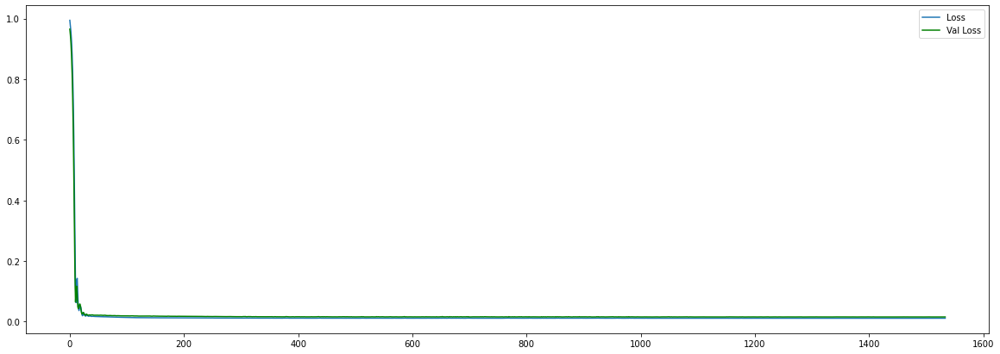

final loss: 0.010926649905741215
final val_loss: 0.01511838473379612
Get best hyperparameter for simple GRU


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


INFO:tensorflow:Oracle triggered exit
Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 1, 5)]            0         
_________________________________________________________________
gru (GRU)                    (None, 128)               51840     
_________________________________________________________________
dense (Dense)                (None, 56)                7224      
_________________________________________________________________
dropout (Dropout)            (None, 56)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 57        
Total params: 59,121
Trainable params: 59,121
Non-trainable params: 0
_________________________________________________________________
Start training simple GRU
Epoch 1/2500
2/2 [==============================] - ETA: 1s


Epoch 00031: val_loss did not improve from 0.01763
Epoch 32/2500
2/2 [==============================] - ETA: 0s - loss: 0.0212 - mae: 0.098 - 0s 19ms/step - loss: 0.0213 - mae: 0.0991 - val_loss: 0.0178 - val_mae: 0.0932

Epoch 00032: val_loss did not improve from 0.01763
Epoch 33/2500
2/2 [==============================] - ETA: 0s - loss: 0.0226 - mae: 0.101 - 0s 23ms/step - loss: 0.0223 - mae: 0.1012 - val_loss: 0.0177 - val_mae: 0.0928

Epoch 00033: val_loss did not improve from 0.01763
Epoch 34/2500
2/2 [==============================] - ETA: 0s - loss: 0.0212 - mae: 0.098 - 0s 21ms/step - loss: 0.0215 - mae: 0.0986 - val_loss: 0.0178 - val_mae: 0.0924

Epoch 00034: val_loss did not improve from 0.01763
Epoch 35/2500
2/2 [==============================] - ETA: 0s - loss: 0.0198 - mae: 0.096 - 0s 20ms/step - loss: 0.0202 - mae: 0.0971 - val_loss: 0.0179 - val_mae: 0.0916

Epoch 00035: val_loss did not improve from 0.01763
Epoch 36/2500
2/2 [==============================] - ETA: 0s

Epoch 68/2500
2/2 [==============================] - ETA: 0s - loss: 0.0209 - mae: 0.099 - 0s 19ms/step - loss: 0.0207 - mae: 0.0984 - val_loss: 0.0176 - val_mae: 0.0905

Epoch 00068: val_loss did not improve from 0.01748
Epoch 69/2500
2/2 [==============================] - ETA: 0s - loss: 0.0197 - mae: 0.095 - 0s 20ms/step - loss: 0.0199 - mae: 0.0954 - val_loss: 0.0179 - val_mae: 0.0917

Epoch 00069: val_loss did not improve from 0.01748
Epoch 70/2500
2/2 [==============================] - ETA: 0s - loss: 0.0194 - mae: 0.094 - 0s 20ms/step - loss: 0.0196 - mae: 0.0949 - val_loss: 0.0181 - val_mae: 0.0922

Epoch 00070: val_loss did not improve from 0.01748
Epoch 71/2500
2/2 [==============================] - ETA: 0s - loss: 0.0202 - mae: 0.096 - 0s 20ms/step - loss: 0.0201 - mae: 0.0961 - val_loss: 0.0180 - val_mae: 0.0917

Epoch 00071: val_loss did not improve from 0.01748
Epoch 72/2500
2/2 [==============================] - ETA: 0s - loss: 0.0177 - mae: 0.092 - 0s 20ms/step - loss: 

2/2 [==============================] - ETA: 0s - loss: 0.0190 - mae: 0.092 - 0s 22ms/step - loss: 0.0186 - mae: 0.0917 - val_loss: 0.0169 - val_mae: 0.0878

Epoch 00103: val_loss did not improve from 0.01678
Epoch 104/2500
2/2 [==============================] - ETA: 0s - loss: 0.0192 - mae: 0.094 - 0s 21ms/step - loss: 0.0188 - mae: 0.0931 - val_loss: 0.0171 - val_mae: 0.0885

Epoch 00104: val_loss did not improve from 0.01678
Epoch 105/2500
2/2 [==============================] - ETA: 0s - loss: 0.0192 - mae: 0.093 - 0s 21ms/step - loss: 0.0192 - mae: 0.0935 - val_loss: 0.0172 - val_mae: 0.0887

Epoch 00105: val_loss did not improve from 0.01678
Epoch 106/2500
2/2 [==============================] - ETA: 0s - loss: 0.0188 - mae: 0.092 - 0s 20ms/step - loss: 0.0189 - mae: 0.0930 - val_loss: 0.0172 - val_mae: 0.0886

Epoch 00106: val_loss did not improve from 0.01678
Epoch 107/2500
2/2 [==============================] - ETA: 0s - loss: 0.0184 - mae: 0.091 - 0s 20ms/step - loss: 0.0185 - m

2/2 [==============================] - ETA: 0s - loss: 0.0171 - mae: 0.089 - 0s 20ms/step - loss: 0.0171 - mae: 0.0896 - val_loss: 0.0167 - val_mae: 0.0860

Epoch 00139: val_loss did not improve from 0.01665
Epoch 140/2500
2/2 [==============================] - ETA: 0s - loss: 0.0175 - mae: 0.089 - 0s 19ms/step - loss: 0.0172 - mae: 0.0895 - val_loss: 0.0164 - val_mae: 0.0860

Epoch 00140: val_loss improved from 0.01665 to 0.01640, saving model to MSN_1H_GRU.hdf5
Epoch 141/2500
2/2 [==============================] - ETA: 0s - loss: 0.0174 - mae: 0.089 - 0s 21ms/step - loss: 0.0172 - mae: 0.0886 - val_loss: 0.0164 - val_mae: 0.0874

Epoch 00141: val_loss improved from 0.01640 to 0.01639, saving model to MSN_1H_GRU.hdf5
Epoch 142/2500
2/2 [==============================] - ETA: 0s - loss: 0.0177 - mae: 0.090 - 0s 21ms/step - loss: 0.0177 - mae: 0.0905 - val_loss: 0.0165 - val_mae: 0.0887

Epoch 00142: val_loss did not improve from 0.01639
Epoch 143/2500
2/2 [=============================

Epoch 00174: val_loss improved from 0.01630 to 0.01624, saving model to MSN_1H_GRU.hdf5
Epoch 175/2500
2/2 [==============================] - ETA: 0s - loss: 0.0174 - mae: 0.088 - 0s 22ms/step - loss: 0.0171 - mae: 0.0882 - val_loss: 0.0162 - val_mae: 0.0858

Epoch 00175: val_loss did not improve from 0.01624
Epoch 176/2500
2/2 [==============================] - ETA: 0s - loss: 0.0171 - mae: 0.089 - 0s 26ms/step - loss: 0.0173 - mae: 0.0894 - val_loss: 0.0165 - val_mae: 0.0882

Epoch 00176: val_loss did not improve from 0.01624
Epoch 177/2500
2/2 [==============================] - ETA: 0s - loss: 0.0170 - mae: 0.088 - 0s 21ms/step - loss: 0.0169 - mae: 0.0884 - val_loss: 0.0168 - val_mae: 0.0892

Epoch 00177: val_loss did not improve from 0.01624
Epoch 178/2500
2/2 [==============================] - ETA: 0s - loss: 0.0160 - mae: 0.086 - 0s 20ms/step - loss: 0.0164 - mae: 0.0878 - val_loss: 0.0167 - val_mae: 0.0876

Epoch 00178: val_loss did not improve from 0.01624
Epoch 179/2500
2/2 [


Epoch 00210: val_loss did not improve from 0.01599
Epoch 211/2500
2/2 [==============================] - ETA: 0s - loss: 0.0174 - mae: 0.090 - 0s 19ms/step - loss: 0.0170 - mae: 0.0894 - val_loss: 0.0161 - val_mae: 0.0848

Epoch 00211: val_loss did not improve from 0.01599
Epoch 212/2500
2/2 [==============================] - ETA: 0s - loss: 0.0160 - mae: 0.086 - 0s 20ms/step - loss: 0.0161 - mae: 0.0866 - val_loss: 0.0161 - val_mae: 0.0845

Epoch 00212: val_loss did not improve from 0.01599
Epoch 213/2500
2/2 [==============================] - ETA: 0s - loss: 0.0150 - mae: 0.084 - 0s 20ms/step - loss: 0.0156 - mae: 0.0858 - val_loss: 0.0161 - val_mae: 0.0842

Epoch 00213: val_loss did not improve from 0.01599
Epoch 214/2500
2/2 [==============================] - ETA: 0s - loss: 0.0160 - mae: 0.085 - 0s 20ms/step - loss: 0.0160 - mae: 0.0854 - val_loss: 0.0160 - val_mae: 0.0840

Epoch 00214: val_loss did not improve from 0.01599
Epoch 215/2500
2/2 [==============================] - ET

Epoch 00246: val_loss did not improve from 0.01581
Epoch 247/2500
2/2 [==============================] - ETA: 0s - loss: 0.0167 - mae: 0.086 - 0s 19ms/step - loss: 0.0167 - mae: 0.0872 - val_loss: 0.0161 - val_mae: 0.0845

Epoch 00247: val_loss did not improve from 0.01581
Epoch 248/2500
2/2 [==============================] - ETA: 0s - loss: 0.0152 - mae: 0.082 - 0s 20ms/step - loss: 0.0153 - mae: 0.0833 - val_loss: 0.0162 - val_mae: 0.0842

Epoch 00248: val_loss did not improve from 0.01581
Epoch 249/2500
2/2 [==============================] - ETA: 0s - loss: 0.0166 - mae: 0.087 - 0s 20ms/step - loss: 0.0165 - mae: 0.0875 - val_loss: 0.0161 - val_mae: 0.0840

Epoch 00249: val_loss did not improve from 0.01581
Epoch 250/2500
2/2 [==============================] - ETA: 0s - loss: 0.0159 - mae: 0.085 - 0s 20ms/step - loss: 0.0156 - mae: 0.0851 - val_loss: 0.0160 - val_mae: 0.0843

Epoch 00250: val_loss did not improve from 0.01581
Epoch 251/2500
2/2 [==============================] - ETA

Epoch 00282: val_loss improved from 0.01566 to 0.01566, saving model to MSN_1H_GRU.hdf5
Epoch 283/2500
2/2 [==============================] - ETA: 0s - loss: 0.0175 - mae: 0.089 - 0s 21ms/step - loss: 0.0173 - mae: 0.0883 - val_loss: 0.0157 - val_mae: 0.0830

Epoch 00283: val_loss did not improve from 0.01566
Epoch 284/2500
2/2 [==============================] - ETA: 0s - loss: 0.0161 - mae: 0.085 - 0s 20ms/step - loss: 0.0158 - mae: 0.0852 - val_loss: 0.0159 - val_mae: 0.0842

Epoch 00284: val_loss did not improve from 0.01566
Epoch 285/2500
2/2 [==============================] - ETA: 0s - loss: 0.0163 - mae: 0.085 - 0s 21ms/step - loss: 0.0163 - mae: 0.0858 - val_loss: 0.0158 - val_mae: 0.0836

Epoch 00285: val_loss did not improve from 0.01566
Epoch 286/2500
2/2 [==============================] - ETA: 0s - loss: 0.0165 - mae: 0.086 - 0s 20ms/step - loss: 0.0163 - mae: 0.0858 - val_loss: 0.0158 - val_mae: 0.0833

Epoch 00286: val_loss did not improve from 0.01566
Epoch 287/2500
2/2 [

Epoch 319/2500
2/2 [==============================] - ETA: 0s - loss: 0.0160 - mae: 0.085 - 0s 21ms/step - loss: 0.0161 - mae: 0.0860 - val_loss: 0.0158 - val_mae: 0.0830

Epoch 00319: val_loss did not improve from 0.01545
Epoch 320/2500
2/2 [==============================] - ETA: 0s - loss: 0.0164 - mae: 0.085 - 0s 20ms/step - loss: 0.0165 - mae: 0.0858 - val_loss: 0.0161 - val_mae: 0.0840

Epoch 00320: val_loss did not improve from 0.01545
Epoch 321/2500
2/2 [==============================] - ETA: 0s - loss: 0.0164 - mae: 0.084 - 0s 19ms/step - loss: 0.0164 - mae: 0.0853 - val_loss: 0.0160 - val_mae: 0.0837

Epoch 00321: val_loss did not improve from 0.01545
Epoch 322/2500
2/2 [==============================] - ETA: 0s - loss: 0.0158 - mae: 0.085 - 0s 20ms/step - loss: 0.0162 - mae: 0.0856 - val_loss: 0.0159 - val_mae: 0.0832

Epoch 00322: val_loss did not improve from 0.01545
Epoch 323/2500
2/2 [==============================] - ETA: 0s - loss: 0.0156 - mae: 0.083 - 0s 20ms/step - l


Epoch 00355: val_loss did not improve from 0.01545
Epoch 356/2500
2/2 [==============================] - ETA: 0s - loss: 0.0154 - mae: 0.084 - 0s 21ms/step - loss: 0.0154 - mae: 0.0841 - val_loss: 0.0158 - val_mae: 0.0822

Epoch 00356: val_loss did not improve from 0.01545
Epoch 357/2500
2/2 [==============================] - ETA: 0s - loss: 0.0156 - mae: 0.086 - 0s 20ms/step - loss: 0.0156 - mae: 0.0854 - val_loss: 0.0157 - val_mae: 0.0823

Epoch 00357: val_loss did not improve from 0.01545
Epoch 358/2500
2/2 [==============================] - ETA: 0s - loss: 0.0149 - mae: 0.083 - 0s 21ms/step - loss: 0.0152 - mae: 0.0844 - val_loss: 0.0158 - val_mae: 0.0841

Epoch 00358: val_loss did not improve from 0.01545
Epoch 359/2500
2/2 [==============================] - ETA: 0s - loss: 0.0148 - mae: 0.083 - 0s 20ms/step - loss: 0.0149 - mae: 0.0830 - val_loss: 0.0158 - val_mae: 0.0842

Epoch 00359: val_loss did not improve from 0.01545
Epoch 360/2500
2/2 [==============================] - ET


Epoch 00392: val_loss did not improve from 0.01545
Epoch 393/2500
2/2 [==============================] - ETA: 0s - loss: 0.0165 - mae: 0.086 - 0s 20ms/step - loss: 0.0164 - mae: 0.0861 - val_loss: 0.0160 - val_mae: 0.0839

Epoch 00393: val_loss did not improve from 0.01545
Epoch 394/2500
2/2 [==============================] - ETA: 0s - loss: 0.0147 - mae: 0.083 - 0s 20ms/step - loss: 0.0149 - mae: 0.0830 - val_loss: 0.0157 - val_mae: 0.0832

Epoch 00394: val_loss did not improve from 0.01545
Epoch 395/2500
2/2 [==============================] - ETA: 0s - loss: 0.0149 - mae: 0.083 - 0s 20ms/step - loss: 0.0152 - mae: 0.0839 - val_loss: 0.0156 - val_mae: 0.0835

Epoch 00395: val_loss did not improve from 0.01545
Epoch 396/2500
2/2 [==============================] - ETA: 0s - loss: 0.0152 - mae: 0.083 - 0s 20ms/step - loss: 0.0152 - mae: 0.0836 - val_loss: 0.0155 - val_mae: 0.0829

Epoch 00396: val_loss did not improve from 0.01545
Epoch 397/2500
2/2 [==============================] - ET

2/2 [==============================] - ETA: 0s - loss: 0.0154 - mae: 0.082 - 0s 20ms/step - loss: 0.0158 - mae: 0.0838 - val_loss: 0.0153 - val_mae: 0.0813

Epoch 00429: val_loss improved from 0.01531 to 0.01529, saving model to MSN_1H_GRU.hdf5
Epoch 430/2500
2/2 [==============================] - ETA: 0s - loss: 0.0150 - mae: 0.083 - 0s 20ms/step - loss: 0.0151 - mae: 0.0840 - val_loss: 0.0155 - val_mae: 0.0830

Epoch 00430: val_loss did not improve from 0.01529
Epoch 431/2500
2/2 [==============================] - ETA: 0s - loss: 0.0157 - mae: 0.084 - 0s 21ms/step - loss: 0.0158 - mae: 0.0843 - val_loss: 0.0160 - val_mae: 0.0849

Epoch 00431: val_loss did not improve from 0.01529
Epoch 432/2500
2/2 [==============================] - ETA: 0s - loss: 0.0159 - mae: 0.085 - 0s 21ms/step - loss: 0.0155 - mae: 0.0845 - val_loss: 0.0162 - val_mae: 0.0850

Epoch 00432: val_loss did not improve from 0.01529
Epoch 433/2500
2/2 [==============================] - ETA: 0s - loss: 0.0148 - mae: 0.


Epoch 00465: val_loss did not improve from 0.01522
Epoch 466/2500
2/2 [==============================] - ETA: 0s - loss: 0.0162 - mae: 0.085 - 0s 21ms/step - loss: 0.0161 - mae: 0.0853 - val_loss: 0.0160 - val_mae: 0.0842

Epoch 00466: val_loss did not improve from 0.01522
Epoch 467/2500
2/2 [==============================] - ETA: 0s - loss: 0.0160 - mae: 0.085 - 0s 31ms/step - loss: 0.0159 - mae: 0.0857 - val_loss: 0.0158 - val_mae: 0.0844

Epoch 00467: val_loss did not improve from 0.01522
Epoch 468/2500
2/2 [==============================] - ETA: 0s - loss: 0.0156 - mae: 0.085 - 0s 18ms/step - loss: 0.0155 - mae: 0.0847 - val_loss: 0.0155 - val_mae: 0.0826

Epoch 00468: val_loss did not improve from 0.01522
Epoch 469/2500
2/2 [==============================] - ETA: 0s - loss: 0.0163 - mae: 0.086 - 0s 18ms/step - loss: 0.0162 - mae: 0.0854 - val_loss: 0.0154 - val_mae: 0.0810

Epoch 00469: val_loss did not improve from 0.01522
Epoch 470/2500
2/2 [==============================] - ET

2/2 [==============================] - ETA: 0s - loss: 0.0156 - mae: 0.085 - 0s 20ms/step - loss: 0.0156 - mae: 0.0855 - val_loss: 0.0159 - val_mae: 0.0827

Epoch 00502: val_loss did not improve from 0.01520
Epoch 503/2500
2/2 [==============================] - ETA: 0s - loss: 0.0165 - mae: 0.087 - 0s 20ms/step - loss: 0.0163 - mae: 0.0872 - val_loss: 0.0159 - val_mae: 0.0847

Epoch 00503: val_loss did not improve from 0.01520
Epoch 504/2500
2/2 [==============================] - ETA: 0s - loss: 0.0170 - mae: 0.089 - 0s 21ms/step - loss: 0.0167 - mae: 0.0882 - val_loss: 0.0156 - val_mae: 0.0850

Epoch 00504: val_loss did not improve from 0.01520
Epoch 505/2500
2/2 [==============================] - ETA: 0s - loss: 0.0156 - mae: 0.085 - 0s 20ms/step - loss: 0.0155 - mae: 0.0849 - val_loss: 0.0159 - val_mae: 0.0855

Epoch 00505: val_loss did not improve from 0.01520
Epoch 506/2500
2/2 [==============================] - ETA: 0s - loss: 0.0155 - mae: 0.084 - 0s 20ms/step - loss: 0.0154 - m

Epoch 00538: val_loss did not improve from 0.01520
Epoch 539/2500
2/2 [==============================] - ETA: 0s - loss: 0.0143 - mae: 0.081 - 0s 20ms/step - loss: 0.0147 - mae: 0.0820 - val_loss: 0.0154 - val_mae: 0.0818

Epoch 00539: val_loss did not improve from 0.01520
Epoch 540/2500
2/2 [==============================] - ETA: 0s - loss: 0.0146 - mae: 0.082 - 0s 20ms/step - loss: 0.0147 - mae: 0.0827 - val_loss: 0.0154 - val_mae: 0.0812

Epoch 00540: val_loss did not improve from 0.01520
Epoch 541/2500
2/2 [==============================] - ETA: 0s - loss: 0.0152 - mae: 0.083 - 0s 20ms/step - loss: 0.0152 - mae: 0.0835 - val_loss: 0.0155 - val_mae: 0.0813

Epoch 00541: val_loss did not improve from 0.01520
Epoch 542/2500
2/2 [==============================] - ETA: 0s - loss: 0.0159 - mae: 0.085 - 0s 21ms/step - loss: 0.0161 - mae: 0.0857 - val_loss: 0.0155 - val_mae: 0.0816

Epoch 00542: val_loss did not improve from 0.01520
Epoch 543/2500
2/2 [==============================] - ETA


Epoch 00575: val_loss did not improve from 0.01520
Epoch 576/2500
2/2 [==============================] - ETA: 0s - loss: 0.0157 - mae: 0.084 - 0s 20ms/step - loss: 0.0154 - mae: 0.0842 - val_loss: 0.0154 - val_mae: 0.0809

Epoch 00576: val_loss did not improve from 0.01520
Epoch 577/2500
2/2 [==============================] - ETA: 0s - loss: 0.0147 - mae: 0.083 - 0s 19ms/step - loss: 0.0150 - mae: 0.0838 - val_loss: 0.0154 - val_mae: 0.0826

Epoch 00577: val_loss did not improve from 0.01520
Epoch 578/2500
2/2 [==============================] - ETA: 0s - loss: 0.0159 - mae: 0.085 - 0s 20ms/step - loss: 0.0154 - mae: 0.0840 - val_loss: 0.0160 - val_mae: 0.0863

Epoch 00578: val_loss did not improve from 0.01520
Epoch 579/2500
2/2 [==============================] - ETA: 0s - loss: 0.0155 - mae: 0.085 - 0s 20ms/step - loss: 0.0153 - mae: 0.0850 - val_loss: 0.0157 - val_mae: 0.0846

Epoch 00579: val_loss did not improve from 0.01520
Epoch 580/2500
2/2 [==============================] - ET


Epoch 00612: val_loss did not improve from 0.01520
Epoch 613/2500
2/2 [==============================] - ETA: 0s - loss: 0.0159 - mae: 0.085 - 0s 19ms/step - loss: 0.0155 - mae: 0.0846 - val_loss: 0.0153 - val_mae: 0.0828

Epoch 00613: val_loss did not improve from 0.01520
Epoch 614/2500
2/2 [==============================] - ETA: 0s - loss: 0.0140 - mae: 0.081 - 0s 19ms/step - loss: 0.0145 - mae: 0.0822 - val_loss: 0.0153 - val_mae: 0.0822

Epoch 00614: val_loss did not improve from 0.01520
Epoch 615/2500
2/2 [==============================] - ETA: 0s - loss: 0.0155 - mae: 0.085 - 0s 20ms/step - loss: 0.0153 - mae: 0.0847 - val_loss: 0.0155 - val_mae: 0.0820

Epoch 00615: val_loss did not improve from 0.01520
Epoch 616/2500
2/2 [==============================] - ETA: 0s - loss: 0.0152 - mae: 0.082 - 0s 20ms/step - loss: 0.0152 - mae: 0.0831 - val_loss: 0.0157 - val_mae: 0.0825

Epoch 00616: val_loss did not improve from 0.01520
Epoch 617/2500
2/2 [==============================] - ET

2/2 [==============================] - ETA: 0s - loss: 0.0154 - mae: 0.085 - 0s 20ms/step - loss: 0.0155 - mae: 0.0852 - val_loss: 0.0153 - val_mae: 0.0806

Epoch 00649: val_loss did not improve from 0.01517
Epoch 650/2500
2/2 [==============================] - ETA: 0s - loss: 0.0156 - mae: 0.083 - 0s 20ms/step - loss: 0.0154 - mae: 0.0838 - val_loss: 0.0152 - val_mae: 0.0815

Epoch 00650: val_loss did not improve from 0.01517
Epoch 651/2500
2/2 [==============================] - ETA: 0s - loss: 0.0153 - mae: 0.082 - 0s 20ms/step - loss: 0.0153 - mae: 0.0826 - val_loss: 0.0154 - val_mae: 0.0815

Epoch 00651: val_loss did not improve from 0.01517
Epoch 652/2500
2/2 [==============================] - ETA: 0s - loss: 0.0151 - mae: 0.083 - 0s 20ms/step - loss: 0.0151 - mae: 0.0833 - val_loss: 0.0158 - val_mae: 0.0824

Epoch 00652: val_loss did not improve from 0.01517
Epoch 653/2500
2/2 [==============================] - ETA: 0s - loss: 0.0147 - mae: 0.082 - 0s 20ms/step - loss: 0.0153 - m

Epoch 00685: val_loss did not improve from 0.01517
Epoch 686/2500
2/2 [==============================] - ETA: 0s - loss: 0.0153 - mae: 0.083 - 0s 20ms/step - loss: 0.0152 - mae: 0.0836 - val_loss: 0.0158 - val_mae: 0.0833

Epoch 00686: val_loss did not improve from 0.01517
Epoch 687/2500
2/2 [==============================] - ETA: 0s - loss: 0.0160 - mae: 0.085 - 0s 20ms/step - loss: 0.0164 - mae: 0.0865 - val_loss: 0.0154 - val_mae: 0.0818

Epoch 00687: val_loss did not improve from 0.01517
Epoch 688/2500
2/2 [==============================] - ETA: 0s - loss: 0.0160 - mae: 0.084 - 0s 20ms/step - loss: 0.0159 - mae: 0.0843 - val_loss: 0.0151 - val_mae: 0.0814

Epoch 00688: val_loss improved from 0.01517 to 0.01514, saving model to MSN_1H_GRU.hdf5
Epoch 689/2500
2/2 [==============================] - ETA: 0s - loss: 0.0157 - mae: 0.084 - 0s 21ms/step - loss: 0.0156 - mae: 0.0843 - val_loss: 0.0151 - val_mae: 0.0811

Epoch 00689: val_loss improved from 0.01514 to 0.01510, saving model to

2/2 [==============================] - ETA: 0s - loss: 0.0159 - mae: 0.084 - 0s 21ms/step - loss: 0.0155 - mae: 0.0833 - val_loss: 0.0155 - val_mae: 0.0837

Epoch 00722: val_loss did not improve from 0.01510
Epoch 723/2500
2/2 [==============================] - ETA: 0s - loss: 0.0162 - mae: 0.085 - 0s 19ms/step - loss: 0.0158 - mae: 0.0850 - val_loss: 0.0154 - val_mae: 0.0826

Epoch 00723: val_loss did not improve from 0.01510
Epoch 724/2500
2/2 [==============================] - ETA: 0s - loss: 0.0159 - mae: 0.083 - 0s 21ms/step - loss: 0.0158 - mae: 0.0840 - val_loss: 0.0160 - val_mae: 0.0836

Epoch 00724: val_loss did not improve from 0.01510
Epoch 725/2500
2/2 [==============================] - ETA: 0s - loss: 0.0154 - mae: 0.084 - 0s 21ms/step - loss: 0.0158 - mae: 0.0848 - val_loss: 0.0159 - val_mae: 0.0831

Epoch 00725: val_loss did not improve from 0.01510
Epoch 726/2500
2/2 [==============================] - ETA: 0s - loss: 0.0156 - mae: 0.084 - 0s 21ms/step - loss: 0.0156 - m


Epoch 00758: val_loss did not improve from 0.01505
Epoch 759/2500
2/2 [==============================] - ETA: 0s - loss: 0.0161 - mae: 0.084 - 0s 21ms/step - loss: 0.0159 - mae: 0.0846 - val_loss: 0.0154 - val_mae: 0.0831

Epoch 00759: val_loss did not improve from 0.01505
Epoch 760/2500
2/2 [==============================] - ETA: 0s - loss: 0.0153 - mae: 0.083 - 0s 20ms/step - loss: 0.0157 - mae: 0.0850 - val_loss: 0.0153 - val_mae: 0.0816

Epoch 00760: val_loss did not improve from 0.01505
Epoch 761/2500
2/2 [==============================] - ETA: 0s - loss: 0.0161 - mae: 0.085 - 0s 20ms/step - loss: 0.0160 - mae: 0.0850 - val_loss: 0.0152 - val_mae: 0.0809

Epoch 00761: val_loss did not improve from 0.01505
Epoch 762/2500
2/2 [==============================] - ETA: 0s - loss: 0.0149 - mae: 0.082 - 0s 20ms/step - loss: 0.0154 - mae: 0.0830 - val_loss: 0.0153 - val_mae: 0.0813

Epoch 00762: val_loss did not improve from 0.01505
Epoch 763/2500
2/2 [==============================] - ET


Epoch 00795: val_loss did not improve from 0.01505
Epoch 796/2500
2/2 [==============================] - ETA: 0s - loss: 0.0147 - mae: 0.083 - 0s 20ms/step - loss: 0.0148 - mae: 0.0829 - val_loss: 0.0156 - val_mae: 0.0824

Epoch 00796: val_loss did not improve from 0.01505
Epoch 797/2500
2/2 [==============================] - ETA: 0s - loss: 0.0157 - mae: 0.084 - 0s 20ms/step - loss: 0.0156 - mae: 0.0840 - val_loss: 0.0154 - val_mae: 0.0817

Epoch 00797: val_loss did not improve from 0.01505
Epoch 798/2500
2/2 [==============================] - ETA: 0s - loss: 0.0158 - mae: 0.084 - 0s 20ms/step - loss: 0.0157 - mae: 0.0845 - val_loss: 0.0153 - val_mae: 0.0817

Epoch 00798: val_loss did not improve from 0.01505
Epoch 799/2500
2/2 [==============================] - ETA: 0s - loss: 0.0151 - mae: 0.082 - 0s 20ms/step - loss: 0.0152 - mae: 0.0827 - val_loss: 0.0154 - val_mae: 0.0813

Epoch 00799: val_loss did not improve from 0.01505
Epoch 800/2500
2/2 [==============================] - ET


Epoch 00832: val_loss did not improve from 0.01505
Epoch 833/2500
2/2 [==============================] - ETA: 0s - loss: 0.0159 - mae: 0.085 - 0s 21ms/step - loss: 0.0157 - mae: 0.0853 - val_loss: 0.0155 - val_mae: 0.0834

Epoch 00833: val_loss did not improve from 0.01505
Epoch 834/2500
2/2 [==============================] - ETA: 0s - loss: 0.0154 - mae: 0.085 - 0s 20ms/step - loss: 0.0156 - mae: 0.0853 - val_loss: 0.0154 - val_mae: 0.0816

Epoch 00834: val_loss did not improve from 0.01505
Epoch 835/2500
2/2 [==============================] - ETA: 0s - loss: 0.0155 - mae: 0.085 - 0s 21ms/step - loss: 0.0159 - mae: 0.0855 - val_loss: 0.0160 - val_mae: 0.0844

Epoch 00835: val_loss did not improve from 0.01505
Epoch 836/2500
2/2 [==============================] - ETA: 0s - loss: 0.0162 - mae: 0.085 - 0s 20ms/step - loss: 0.0162 - mae: 0.0856 - val_loss: 0.0153 - val_mae: 0.0829

Epoch 00836: val_loss did not improve from 0.01505
Epoch 837/2500
2/2 [==============================] - ET


Epoch 00869: val_loss did not improve from 0.01505
Epoch 870/2500
2/2 [==============================] - ETA: 0s - loss: 0.0153 - mae: 0.084 - 0s 20ms/step - loss: 0.0154 - mae: 0.0846 - val_loss: 0.0152 - val_mae: 0.0831

Epoch 00870: val_loss did not improve from 0.01505
Epoch 871/2500
2/2 [==============================] - ETA: 0s - loss: 0.0159 - mae: 0.085 - 0s 20ms/step - loss: 0.0159 - mae: 0.0854 - val_loss: 0.0153 - val_mae: 0.0815

Epoch 00871: val_loss did not improve from 0.01505
Epoch 872/2500
2/2 [==============================] - ETA: 0s - loss: 0.0149 - mae: 0.082 - 0s 20ms/step - loss: 0.0152 - mae: 0.0833 - val_loss: 0.0154 - val_mae: 0.0815

Epoch 00872: val_loss did not improve from 0.01505
Epoch 873/2500
2/2 [==============================] - ETA: 0s - loss: 0.0156 - mae: 0.083 - 0s 21ms/step - loss: 0.0155 - mae: 0.0836 - val_loss: 0.0155 - val_mae: 0.0824

Epoch 00873: val_loss did not improve from 0.01505
Epoch 874/2500
2/2 [==============================] - ET

2/2 [==============================] - ETA: 0s - loss: 0.0161 - mae: 0.085 - 0s 20ms/step - loss: 0.0157 - mae: 0.0846 - val_loss: 0.0154 - val_mae: 0.0813

Epoch 00906: val_loss did not improve from 0.01505
Epoch 907/2500
2/2 [==============================] - ETA: 0s - loss: 0.0154 - mae: 0.083 - 0s 20ms/step - loss: 0.0156 - mae: 0.0843 - val_loss: 0.0155 - val_mae: 0.0822

Epoch 00907: val_loss did not improve from 0.01505
Epoch 908/2500
2/2 [==============================] - ETA: 0s - loss: 0.0155 - mae: 0.084 - 0s 20ms/step - loss: 0.0155 - mae: 0.0850 - val_loss: 0.0156 - val_mae: 0.0841

Epoch 00908: val_loss did not improve from 0.01505
Epoch 909/2500
2/2 [==============================] - ETA: 0s - loss: 0.0156 - mae: 0.083 - 0s 20ms/step - loss: 0.0154 - mae: 0.0836 - val_loss: 0.0153 - val_mae: 0.0828

Epoch 00909: val_loss did not improve from 0.01505
Epoch 910/2500
2/2 [==============================] - ETA: 0s - loss: 0.0158 - mae: 0.084 - 0s 20ms/step - loss: 0.0158 - m


Epoch 00942: val_loss did not improve from 0.01505
Epoch 943/2500
2/2 [==============================] - ETA: 0s - loss: 0.0162 - mae: 0.085 - 0s 19ms/step - loss: 0.0164 - mae: 0.0855 - val_loss: 0.0153 - val_mae: 0.0814

Epoch 00943: val_loss did not improve from 0.01505
Epoch 944/2500
2/2 [==============================] - ETA: 0s - loss: 0.0150 - mae: 0.082 - 0s 20ms/step - loss: 0.0152 - mae: 0.0833 - val_loss: 0.0154 - val_mae: 0.0818

Epoch 00944: val_loss did not improve from 0.01505
Epoch 945/2500
2/2 [==============================] - ETA: 0s - loss: 0.0164 - mae: 0.086 - 0s 19ms/step - loss: 0.0163 - mae: 0.0863 - val_loss: 0.0153 - val_mae: 0.0811

Epoch 00945: val_loss did not improve from 0.01505
Epoch 946/2500
2/2 [==============================] - ETA: 0s - loss: 0.0156 - mae: 0.084 - 0s 20ms/step - loss: 0.0157 - mae: 0.0847 - val_loss: 0.0151 - val_mae: 0.0809

Epoch 00946: val_loss did not improve from 0.01505
Epoch 947/2500
2/2 [==============================] - ET


Epoch 00979: val_loss did not improve from 0.01505
Epoch 980/2500
2/2 [==============================] - ETA: 0s - loss: 0.0151 - mae: 0.084 - 0s 19ms/step - loss: 0.0150 - mae: 0.0835 - val_loss: 0.0155 - val_mae: 0.0816

Epoch 00980: val_loss did not improve from 0.01505
Epoch 981/2500
2/2 [==============================] - ETA: 0s - loss: 0.0158 - mae: 0.086 - 0s 20ms/step - loss: 0.0154 - mae: 0.0854 - val_loss: 0.0154 - val_mae: 0.0813

Epoch 00981: val_loss did not improve from 0.01505
Epoch 982/2500
2/2 [==============================] - ETA: 0s - loss: 0.0152 - mae: 0.083 - 0s 20ms/step - loss: 0.0155 - mae: 0.0844 - val_loss: 0.0152 - val_mae: 0.0806

Epoch 00982: val_loss did not improve from 0.01505
Epoch 983/2500
2/2 [==============================] - ETA: 0s - loss: 0.0163 - mae: 0.085 - 0s 20ms/step - loss: 0.0161 - mae: 0.0852 - val_loss: 0.0151 - val_mae: 0.0808

Epoch 00983: val_loss did not improve from 0.01505
Epoch 984/2500
2/2 [==============================] - ET


Epoch 01016: val_loss did not improve from 0.01505
Epoch 1017/2500
2/2 [==============================] - ETA: 0s - loss: 0.0143 - mae: 0.080 - 0s 20ms/step - loss: 0.0145 - mae: 0.0815 - val_loss: 0.0152 - val_mae: 0.0825

Epoch 01017: val_loss did not improve from 0.01505
Epoch 1018/2500
2/2 [==============================] - ETA: 0s - loss: 0.0156 - mae: 0.084 - 0s 20ms/step - loss: 0.0160 - mae: 0.0849 - val_loss: 0.0153 - val_mae: 0.0828

Epoch 01018: val_loss did not improve from 0.01505
Epoch 1019/2500
2/2 [==============================] - ETA: 0s - loss: 0.0151 - mae: 0.082 - 0s 20ms/step - loss: 0.0151 - mae: 0.0827 - val_loss: 0.0152 - val_mae: 0.0811

Epoch 01019: val_loss did not improve from 0.01505
Epoch 1020/2500
2/2 [==============================] - ETA: 0s - loss: 0.0152 - mae: 0.083 - 0s 20ms/step - loss: 0.0151 - mae: 0.0836 - val_loss: 0.0153 - val_mae: 0.0809

Epoch 01020: val_loss did not improve from 0.01505
Epoch 1021/2500
2/2 [==============================]

2/2 [==============================] - ETA: 0s - loss: 0.0162 - mae: 0.086 - 0s 21ms/step - loss: 0.0162 - mae: 0.0865 - val_loss: 0.0151 - val_mae: 0.0810

Epoch 01053: val_loss did not improve from 0.01505
Epoch 1054/2500
2/2 [==============================] - ETA: 0s - loss: 0.0155 - mae: 0.082 - 0s 21ms/step - loss: 0.0155 - mae: 0.0830 - val_loss: 0.0152 - val_mae: 0.0823

Epoch 01054: val_loss did not improve from 0.01505
Epoch 1055/2500
2/2 [==============================] - ETA: 0s - loss: 0.0159 - mae: 0.084 - 0s 21ms/step - loss: 0.0159 - mae: 0.0849 - val_loss: 0.0154 - val_mae: 0.0829

Epoch 01055: val_loss did not improve from 0.01505
Epoch 1056/2500
2/2 [==============================] - ETA: 0s - loss: 0.0160 - mae: 0.084 - 0s 20ms/step - loss: 0.0156 - mae: 0.0842 - val_loss: 0.0155 - val_mae: 0.0832

Epoch 01056: val_loss did not improve from 0.01505
Epoch 1057/2500
2/2 [==============================] - ETA: 0s - loss: 0.0166 - mae: 0.086 - 0s 21ms/step - loss: 0.0163


Epoch 01089: val_loss did not improve from 0.01505
Epoch 1090/2500
2/2 [==============================] - ETA: 0s - loss: 0.0154 - mae: 0.083 - 0s 21ms/step - loss: 0.0150 - mae: 0.0829 - val_loss: 0.0155 - val_mae: 0.0821

Epoch 01090: val_loss did not improve from 0.01505
Epoch 1091/2500
2/2 [==============================] - ETA: 0s - loss: 0.0160 - mae: 0.086 - 0s 19ms/step - loss: 0.0160 - mae: 0.0863 - val_loss: 0.0152 - val_mae: 0.0817

Epoch 01091: val_loss did not improve from 0.01505
Epoch 1092/2500
2/2 [==============================] - ETA: 0s - loss: 0.0154 - mae: 0.083 - 0s 21ms/step - loss: 0.0157 - mae: 0.0842 - val_loss: 0.0153 - val_mae: 0.0838

Epoch 01092: val_loss did not improve from 0.01505
Epoch 1093/2500
2/2 [==============================] - ETA: 0s - loss: 0.0156 - mae: 0.085 - 0s 21ms/step - loss: 0.0159 - mae: 0.0858 - val_loss: 0.0152 - val_mae: 0.0825

Epoch 01093: val_loss did not improve from 0.01505
Epoch 1094/2500
2/2 [==============================]

2/2 [==============================] - ETA: 0s - loss: 0.0144 - mae: 0.082 - 0s 20ms/step - loss: 0.0149 - mae: 0.0835 - val_loss: 0.0153 - val_mae: 0.0814

Epoch 01126: val_loss did not improve from 0.01505
Epoch 1127/2500
2/2 [==============================] - ETA: 0s - loss: 0.0153 - mae: 0.083 - 0s 19ms/step - loss: 0.0153 - mae: 0.0839 - val_loss: 0.0153 - val_mae: 0.0813

Epoch 01127: val_loss did not improve from 0.01505
Epoch 1128/2500
2/2 [==============================] - ETA: 0s - loss: 0.0147 - mae: 0.082 - 0s 19ms/step - loss: 0.0150 - mae: 0.0830 - val_loss: 0.0154 - val_mae: 0.0813

Epoch 01128: val_loss did not improve from 0.01505
Epoch 1129/2500
2/2 [==============================] - ETA: 0s - loss: 0.0161 - mae: 0.085 - 0s 20ms/step - loss: 0.0159 - mae: 0.0853 - val_loss: 0.0154 - val_mae: 0.0813

Epoch 01129: val_loss did not improve from 0.01505
Epoch 1130/2500
2/2 [==============================] - ETA: 0s - loss: 0.0152 - mae: 0.084 - 0s 21ms/step - loss: 0.0154


Epoch 01162: val_loss did not improve from 0.01505
Epoch 1163/2500
2/2 [==============================] - ETA: 0s - loss: 0.0147 - mae: 0.082 - 0s 20ms/step - loss: 0.0149 - mae: 0.0832 - val_loss: 0.0153 - val_mae: 0.0809

Epoch 01163: val_loss did not improve from 0.01505
Epoch 1164/2500
2/2 [==============================] - ETA: 0s - loss: 0.0153 - mae: 0.083 - 0s 20ms/step - loss: 0.0152 - mae: 0.0830 - val_loss: 0.0153 - val_mae: 0.0809

Epoch 01164: val_loss did not improve from 0.01505
Epoch 1165/2500
2/2 [==============================] - ETA: 0s - loss: 0.0153 - mae: 0.084 - 0s 21ms/step - loss: 0.0157 - mae: 0.0847 - val_loss: 0.0153 - val_mae: 0.0813

Epoch 01165: val_loss did not improve from 0.01505
Epoch 1166/2500
2/2 [==============================] - ETA: 0s - loss: 0.0167 - mae: 0.086 - 0s 20ms/step - loss: 0.0165 - mae: 0.0860 - val_loss: 0.0155 - val_mae: 0.0819

Epoch 01166: val_loss did not improve from 0.01505
Epoch 1167/2500
2/2 [==============================]

Epoch 01198: val_loss did not improve from 0.01504
Epoch 1199/2500
2/2 [==============================] - ETA: 0s - loss: 0.0162 - mae: 0.085 - 0s 20ms/step - loss: 0.0159 - mae: 0.0847 - val_loss: 0.0153 - val_mae: 0.0811

Epoch 01199: val_loss did not improve from 0.01504
Epoch 1200/2500
2/2 [==============================] - ETA: 0s - loss: 0.0155 - mae: 0.084 - 0s 20ms/step - loss: 0.0151 - mae: 0.0837 - val_loss: 0.0152 - val_mae: 0.0815

Epoch 01200: val_loss did not improve from 0.01504
Epoch 1201/2500
2/2 [==============================] - ETA: 0s - loss: 0.0155 - mae: 0.084 - 0s 19ms/step - loss: 0.0153 - mae: 0.0838 - val_loss: 0.0152 - val_mae: 0.0817

Epoch 01201: val_loss did not improve from 0.01504
Epoch 1202/2500
2/2 [==============================] - ETA: 0s - loss: 0.0156 - mae: 0.084 - 0s 20ms/step - loss: 0.0156 - mae: 0.0846 - val_loss: 0.0151 - val_mae: 0.0813

Epoch 01202: val_loss did not improve from 0.01504
Epoch 1203/2500
2/2 [==============================] 

2/2 [==============================] - ETA: 0s - loss: 0.0159 - mae: 0.084 - 0s 20ms/step - loss: 0.0156 - mae: 0.0839 - val_loss: 0.0152 - val_mae: 0.0818

Epoch 01235: val_loss did not improve from 0.01504
Epoch 1236/2500
2/2 [==============================] - ETA: 0s - loss: 0.0159 - mae: 0.084 - 0s 20ms/step - loss: 0.0158 - mae: 0.0842 - val_loss: 0.0153 - val_mae: 0.0827

Epoch 01236: val_loss did not improve from 0.01504
Epoch 1237/2500
2/2 [==============================] - ETA: 0s - loss: 0.0162 - mae: 0.085 - 0s 19ms/step - loss: 0.0161 - mae: 0.0850 - val_loss: 0.0153 - val_mae: 0.0833

Epoch 01237: val_loss did not improve from 0.01504
Epoch 1238/2500
2/2 [==============================] - ETA: 0s - loss: 0.0153 - mae: 0.084 - 0s 19ms/step - loss: 0.0155 - mae: 0.0847 - val_loss: 0.0153 - val_mae: 0.0826

Epoch 01238: val_loss did not improve from 0.01504
Epoch 1239/2500
2/2 [==============================] - ETA: 0s - loss: 0.0157 - mae: 0.083 - 0s 20ms/step - loss: 0.0154


Epoch 01271: val_loss did not improve from 0.01504
Epoch 1272/2500
2/2 [==============================] - ETA: 0s - loss: 0.0150 - mae: 0.082 - 0s 20ms/step - loss: 0.0151 - mae: 0.0828 - val_loss: 0.0154 - val_mae: 0.0820

Epoch 01272: val_loss did not improve from 0.01504
Epoch 1273/2500
2/2 [==============================] - ETA: 0s - loss: 0.0150 - mae: 0.083 - 0s 21ms/step - loss: 0.0152 - mae: 0.0837 - val_loss: 0.0153 - val_mae: 0.0820

Epoch 01273: val_loss did not improve from 0.01504
Epoch 1274/2500
2/2 [==============================] - ETA: 0s - loss: 0.0149 - mae: 0.082 - 0s 20ms/step - loss: 0.0153 - mae: 0.0836 - val_loss: 0.0153 - val_mae: 0.0818

Epoch 01274: val_loss did not improve from 0.01504
Epoch 1275/2500
2/2 [==============================] - ETA: 0s - loss: 0.0151 - mae: 0.083 - 0s 20ms/step - loss: 0.0153 - mae: 0.0837 - val_loss: 0.0152 - val_mae: 0.0815

Epoch 01275: val_loss did not improve from 0.01504
Epoch 1276/2500
2/2 [==============================]

2/2 [==============================] - ETA: 0s - loss: 0.0149 - mae: 0.084 - 0s 20ms/step - loss: 0.0152 - mae: 0.0848 - val_loss: 0.0154 - val_mae: 0.0847

Epoch 01308: val_loss did not improve from 0.01504
Epoch 1309/2500
2/2 [==============================] - ETA: 0s - loss: 0.0149 - mae: 0.082 - 0s 20ms/step - loss: 0.0148 - mae: 0.0824 - val_loss: 0.0152 - val_mae: 0.0814

Epoch 01309: val_loss did not improve from 0.01504
Epoch 1310/2500
2/2 [==============================] - ETA: 0s - loss: 0.0147 - mae: 0.082 - 0s 20ms/step - loss: 0.0150 - mae: 0.0831 - val_loss: 0.0154 - val_mae: 0.0810

Epoch 01310: val_loss did not improve from 0.01504
Epoch 1311/2500
2/2 [==============================] - ETA: 0s - loss: 0.0151 - mae: 0.083 - 0s 20ms/step - loss: 0.0150 - mae: 0.0837 - val_loss: 0.0155 - val_mae: 0.0813

Epoch 01311: val_loss did not improve from 0.01504
Epoch 1312/2500
2/2 [==============================] - ETA: 0s - loss: 0.0164 - mae: 0.085 - 0s 19ms/step - loss: 0.0162


Epoch 01344: val_loss did not improve from 0.01504
Epoch 1345/2500
2/2 [==============================] - ETA: 0s - loss: 0.0159 - mae: 0.085 - 0s 19ms/step - loss: 0.0156 - mae: 0.0845 - val_loss: 0.0151 - val_mae: 0.0808

Epoch 01345: val_loss did not improve from 0.01504
Epoch 1346/2500
2/2 [==============================] - ETA: 0s - loss: 0.0155 - mae: 0.083 - 0s 22ms/step - loss: 0.0154 - mae: 0.0833 - val_loss: 0.0150 - val_mae: 0.0810

Epoch 01346: val_loss did not improve from 0.01504
Epoch 1347/2500
2/2 [==============================] - ETA: 0s - loss: 0.0151 - mae: 0.083 - 0s 20ms/step - loss: 0.0151 - mae: 0.0825 - val_loss: 0.0151 - val_mae: 0.0812

Epoch 01347: val_loss did not improve from 0.01504
Epoch 1348/2500
2/2 [==============================] - ETA: 0s - loss: 0.0146 - mae: 0.082 - 0s 20ms/step - loss: 0.0149 - mae: 0.0827 - val_loss: 0.0151 - val_mae: 0.0814

Epoch 01348: val_loss did not improve from 0.01504
Epoch 1349/2500
2/2 [==============================]

2/2 [==============================] - ETA: 0s - loss: 0.0155 - mae: 0.084 - 0s 20ms/step - loss: 0.0153 - mae: 0.0835 - val_loss: 0.0151 - val_mae: 0.0807

Epoch 01381: val_loss did not improve from 0.01500
Epoch 1382/2500
2/2 [==============================] - ETA: 0s - loss: 0.0163 - mae: 0.084 - 0s 20ms/step - loss: 0.0161 - mae: 0.0840 - val_loss: 0.0152 - val_mae: 0.0807

Epoch 01382: val_loss did not improve from 0.01500
Epoch 1383/2500
2/2 [==============================] - ETA: 0s - loss: 0.0159 - mae: 0.084 - 0s 21ms/step - loss: 0.0158 - mae: 0.0847 - val_loss: 0.0153 - val_mae: 0.0809

Epoch 01383: val_loss did not improve from 0.01500
Epoch 1384/2500
2/2 [==============================] - ETA: 0s - loss: 0.0155 - mae: 0.084 - 0s 22ms/step - loss: 0.0155 - mae: 0.0846 - val_loss: 0.0152 - val_mae: 0.0811

Epoch 01384: val_loss did not improve from 0.01500
Epoch 1385/2500
2/2 [==============================] - ETA: 0s - loss: 0.0164 - mae: 0.086 - 0s 21ms/step - loss: 0.0161


Epoch 01417: val_loss did not improve from 0.01500
Epoch 1418/2500
2/2 [==============================] - ETA: 0s - loss: 0.0157 - mae: 0.084 - 0s 20ms/step - loss: 0.0156 - mae: 0.0847 - val_loss: 0.0151 - val_mae: 0.0805

Epoch 01418: val_loss did not improve from 0.01500
Epoch 1419/2500
2/2 [==============================] - ETA: 0s - loss: 0.0153 - mae: 0.083 - 0s 20ms/step - loss: 0.0151 - mae: 0.0835 - val_loss: 0.0151 - val_mae: 0.0807

Epoch 01419: val_loss did not improve from 0.01500
Epoch 1420/2500
2/2 [==============================] - ETA: 0s - loss: 0.0158 - mae: 0.084 - 0s 19ms/step - loss: 0.0154 - mae: 0.0842 - val_loss: 0.0151 - val_mae: 0.0807

Epoch 01420: val_loss did not improve from 0.01500
Epoch 1421/2500
2/2 [==============================] - ETA: 0s - loss: 0.0152 - mae: 0.083 - 0s 19ms/step - loss: 0.0158 - mae: 0.0842 - val_loss: 0.0151 - val_mae: 0.0805

Epoch 01421: val_loss did not improve from 0.01500
Epoch 1422/2500
2/2 [==============================]

Epoch 01453: val_loss did not improve from 0.01500
Epoch 1454/2500
2/2 [==============================] - ETA: 0s - loss: 0.0147 - mae: 0.082 - 0s 21ms/step - loss: 0.0150 - mae: 0.0829 - val_loss: 0.0152 - val_mae: 0.0815

Epoch 01454: val_loss did not improve from 0.01500
Epoch 1455/2500
2/2 [==============================] - ETA: 0s - loss: 0.0147 - mae: 0.081 - 0s 20ms/step - loss: 0.0149 - mae: 0.0822 - val_loss: 0.0152 - val_mae: 0.0817

Epoch 01455: val_loss did not improve from 0.01500
Epoch 1456/2500
2/2 [==============================] - ETA: 0s - loss: 0.0157 - mae: 0.083 - 0s 20ms/step - loss: 0.0156 - mae: 0.0835 - val_loss: 0.0152 - val_mae: 0.0820

Epoch 01456: val_loss did not improve from 0.01500
Epoch 1457/2500
2/2 [==============================] - ETA: 0s - loss: 0.0167 - mae: 0.085 - 0s 19ms/step - loss: 0.0162 - mae: 0.0850 - val_loss: 0.0152 - val_mae: 0.0821

Epoch 01457: val_loss did not improve from 0.01500
Epoch 1458/2500
2/2 [==============================] 

2/2 [==============================] - ETA: 0s - loss: 0.0159 - mae: 0.084 - 0s 20ms/step - loss: 0.0160 - mae: 0.0844 - val_loss: 0.0153 - val_mae: 0.0813

Epoch 01490: val_loss did not improve from 0.01500
Epoch 1491/2500
2/2 [==============================] - ETA: 0s - loss: 0.0153 - mae: 0.084 - 0s 20ms/step - loss: 0.0155 - mae: 0.0844 - val_loss: 0.0153 - val_mae: 0.0812

Epoch 01491: val_loss did not improve from 0.01500
Epoch 1492/2500
2/2 [==============================] - ETA: 0s - loss: 0.0150 - mae: 0.084 - 0s 20ms/step - loss: 0.0153 - mae: 0.0843 - val_loss: 0.0152 - val_mae: 0.0811

Epoch 01492: val_loss did not improve from 0.01500
Epoch 1493/2500
2/2 [==============================] - ETA: 0s - loss: 0.0154 - mae: 0.083 - 0s 19ms/step - loss: 0.0155 - mae: 0.0836 - val_loss: 0.0151 - val_mae: 0.0813

Epoch 01493: val_loss did not improve from 0.01500
Epoch 1494/2500
2/2 [==============================] - ETA: 0s - loss: 0.0161 - mae: 0.084 - 0s 19ms/step - loss: 0.0159


Epoch 01526: val_loss improved from 0.01500 to 0.01499, saving model to MSN_1H_GRU.hdf5
Epoch 1527/2500
2/2 [==============================] - ETA: 0s - loss: 0.0163 - mae: 0.086 - 0s 19ms/step - loss: 0.0160 - mae: 0.0858 - val_loss: 0.0150 - val_mae: 0.0811

Epoch 01527: val_loss did not improve from 0.01499
Epoch 1528/2500
2/2 [==============================] - ETA: 0s - loss: 0.0153 - mae: 0.084 - 0s 21ms/step - loss: 0.0156 - mae: 0.0848 - val_loss: 0.0150 - val_mae: 0.0811

Epoch 01528: val_loss did not improve from 0.01499
Epoch 1529/2500
2/2 [==============================] - ETA: 0s - loss: 0.0161 - mae: 0.084 - 0s 32ms/step - loss: 0.0159 - mae: 0.0837 - val_loss: 0.0151 - val_mae: 0.0809

Epoch 01529: val_loss did not improve from 0.01499
Epoch 1530/2500
2/2 [==============================] - ETA: 0s - loss: 0.0148 - mae: 0.082 - 0s 23ms/step - loss: 0.0148 - mae: 0.0821 - val_loss: 0.0151 - val_mae: 0.0808

Epoch 01530: val_loss did not improve from 0.01499
Epoch 1531/2500

2/2 [==============================] - ETA: 0s - loss: 0.0163 - mae: 0.085 - 0s 20ms/step - loss: 0.0159 - mae: 0.0853 - val_loss: 0.0153 - val_mae: 0.0814

Epoch 01563: val_loss did not improve from 0.01499
Epoch 1564/2500
2/2 [==============================] - ETA: 0s - loss: 0.0154 - mae: 0.083 - 0s 21ms/step - loss: 0.0154 - mae: 0.0833 - val_loss: 0.0153 - val_mae: 0.0815

Epoch 01564: val_loss did not improve from 0.01499
Epoch 1565/2500
2/2 [==============================] - ETA: 0s - loss: 0.0156 - mae: 0.083 - 0s 21ms/step - loss: 0.0153 - mae: 0.0838 - val_loss: 0.0153 - val_mae: 0.0815

Epoch 01565: val_loss did not improve from 0.01499
Epoch 1566/2500
2/2 [==============================] - ETA: 0s - loss: 0.0159 - mae: 0.085 - 0s 20ms/step - loss: 0.0157 - mae: 0.0850 - val_loss: 0.0152 - val_mae: 0.0815

Epoch 01566: val_loss did not improve from 0.01499
Epoch 1567/2500
2/2 [==============================] - ETA: 0s - loss: 0.0155 - mae: 0.084 - 0s 20ms/step - loss: 0.0154


Epoch 01599: val_loss did not improve from 0.01499
Epoch 1600/2500
2/2 [==============================] - ETA: 0s - loss: 0.0158 - mae: 0.085 - 0s 20ms/step - loss: 0.0156 - mae: 0.0851 - val_loss: 0.0152 - val_mae: 0.0815

Epoch 01600: val_loss did not improve from 0.01499
Epoch 1601/2500
2/2 [==============================] - ETA: 0s - loss: 0.0159 - mae: 0.085 - 0s 20ms/step - loss: 0.0157 - mae: 0.0852 - val_loss: 0.0152 - val_mae: 0.0818

Epoch 01601: val_loss did not improve from 0.01499
Epoch 1602/2500
2/2 [==============================] - ETA: 0s - loss: 0.0148 - mae: 0.083 - 0s 21ms/step - loss: 0.0150 - mae: 0.0836 - val_loss: 0.0153 - val_mae: 0.0819

Epoch 01602: val_loss did not improve from 0.01499
Epoch 1603/2500
2/2 [==============================] - ETA: 0s - loss: 0.0159 - mae: 0.085 - 0s 20ms/step - loss: 0.0158 - mae: 0.0853 - val_loss: 0.0152 - val_mae: 0.0817

Epoch 01603: val_loss did not improve from 0.01499
Epoch 1604/2500
2/2 [==============================]

2/2 [==============================] - ETA: 0s - loss: 0.0151 - mae: 0.083 - 0s 20ms/step - loss: 0.0151 - mae: 0.0838 - val_loss: 0.0153 - val_mae: 0.0817

Epoch 01636: val_loss did not improve from 0.01499
Epoch 1637/2500
2/2 [==============================] - ETA: 0s - loss: 0.0154 - mae: 0.083 - 0s 20ms/step - loss: 0.0152 - mae: 0.0830 - val_loss: 0.0153 - val_mae: 0.0816

Epoch 01637: val_loss did not improve from 0.01499
Epoch 1638/2500
2/2 [==============================] - ETA: 0s - loss: 0.0157 - mae: 0.083 - 0s 21ms/step - loss: 0.0155 - mae: 0.0832 - val_loss: 0.0153 - val_mae: 0.0815

Epoch 01638: val_loss did not improve from 0.01499
Epoch 1639/2500
2/2 [==============================] - ETA: 0s - loss: 0.0145 - mae: 0.083 - 0s 19ms/step - loss: 0.0151 - mae: 0.0840 - val_loss: 0.0153 - val_mae: 0.0814

Epoch 01639: val_loss did not improve from 0.01499
Epoch 1640/2500
2/2 [==============================] - ETA: 0s - loss: 0.0153 - mae: 0.082 - 0s 20ms/step - loss: 0.0151


Epoch 01672: val_loss did not improve from 0.01499
Epoch 1673/2500
2/2 [==============================] - ETA: 0s - loss: 0.0149 - mae: 0.083 - 0s 19ms/step - loss: 0.0147 - mae: 0.0822 - val_loss: 0.0150 - val_mae: 0.0811

Epoch 01673: val_loss did not improve from 0.01499
Epoch 1674/2500
2/2 [==============================] - ETA: 0s - loss: 0.0155 - mae: 0.084 - 0s 21ms/step - loss: 0.0153 - mae: 0.0837 - val_loss: 0.0151 - val_mae: 0.0809

Epoch 01674: val_loss did not improve from 0.01499
Epoch 1675/2500
2/2 [==============================] - ETA: 0s - loss: 0.0154 - mae: 0.083 - 0s 20ms/step - loss: 0.0156 - mae: 0.0842 - val_loss: 0.0151 - val_mae: 0.0807

Epoch 01675: val_loss did not improve from 0.01499
Epoch 1676/2500
2/2 [==============================] - ETA: 0s - loss: 0.0150 - mae: 0.082 - 0s 21ms/step - loss: 0.0154 - mae: 0.0838 - val_loss: 0.0152 - val_mae: 0.0806

Epoch 01676: val_loss did not improve from 0.01499
Epoch 1677/2500
2/2 [==============================]

2/2 [==============================] - ETA: 0s - loss: 0.0159 - mae: 0.084 - 0s 19ms/step - loss: 0.0155 - mae: 0.0834 - val_loss: 0.0152 - val_mae: 0.0815

Epoch 01709: val_loss did not improve from 0.01499
Epoch 1710/2500
2/2 [==============================] - ETA: 0s - loss: 0.0158 - mae: 0.084 - 0s 19ms/step - loss: 0.0159 - mae: 0.0851 - val_loss: 0.0152 - val_mae: 0.0818

Epoch 01710: val_loss did not improve from 0.01499
Epoch 1711/2500
2/2 [==============================] - ETA: 0s - loss: 0.0145 - mae: 0.081 - 0s 19ms/step - loss: 0.0145 - mae: 0.0814 - val_loss: 0.0152 - val_mae: 0.0816

Epoch 01711: val_loss did not improve from 0.01499
Epoch 1712/2500
2/2 [==============================] - ETA: 0s - loss: 0.0157 - mae: 0.085 - 0s 19ms/step - loss: 0.0154 - mae: 0.0850 - val_loss: 0.0151 - val_mae: 0.0811

Epoch 01712: val_loss did not improve from 0.01499
Epoch 1713/2500
2/2 [==============================] - ETA: 0s - loss: 0.0162 - mae: 0.085 - 0s 20ms/step - loss: 0.0163


Epoch 01745: val_loss did not improve from 0.01499
Epoch 1746/2500
2/2 [==============================] - ETA: 0s - loss: 0.0154 - mae: 0.082 - 0s 20ms/step - loss: 0.0152 - mae: 0.0825 - val_loss: 0.0152 - val_mae: 0.0814

Epoch 01746: val_loss did not improve from 0.01499
Epoch 1747/2500
2/2 [==============================] - ETA: 0s - loss: 0.0154 - mae: 0.083 - 0s 22ms/step - loss: 0.0156 - mae: 0.0842 - val_loss: 0.0152 - val_mae: 0.0813

Epoch 01747: val_loss did not improve from 0.01499
Epoch 1748/2500
2/2 [==============================] - ETA: 0s - loss: 0.0157 - mae: 0.084 - 0s 20ms/step - loss: 0.0154 - mae: 0.0843 - val_loss: 0.0152 - val_mae: 0.0810

Epoch 01748: val_loss did not improve from 0.01499
Epoch 1749/2500
2/2 [==============================] - ETA: 0s - loss: 0.0158 - mae: 0.083 - 0s 19ms/step - loss: 0.0158 - mae: 0.0840 - val_loss: 0.0152 - val_mae: 0.0808

Epoch 01749: val_loss did not improve from 0.01499
Epoch 1750/2500
2/2 [==============================]

Epoch 01781: val_loss did not improve from 0.01499
Epoch 1782/2500
2/2 [==============================] - ETA: 0s - loss: 0.0150 - mae: 0.083 - 0s 23ms/step - loss: 0.0151 - mae: 0.0835 - val_loss: 0.0151 - val_mae: 0.0808

Epoch 01782: val_loss did not improve from 0.01499
Epoch 1783/2500
2/2 [==============================] - ETA: 0s - loss: 0.0154 - mae: 0.084 - 0s 20ms/step - loss: 0.0157 - mae: 0.0846 - val_loss: 0.0152 - val_mae: 0.0807

Epoch 01783: val_loss did not improve from 0.01499
Epoch 1784/2500
2/2 [==============================] - ETA: 0s - loss: 0.0160 - mae: 0.084 - 0s 20ms/step - loss: 0.0157 - mae: 0.0841 - val_loss: 0.0151 - val_mae: 0.0807

Epoch 01784: val_loss did not improve from 0.01499
Epoch 1785/2500
2/2 [==============================] - ETA: 0s - loss: 0.0154 - mae: 0.083 - 0s 20ms/step - loss: 0.0152 - mae: 0.0832 - val_loss: 0.0151 - val_mae: 0.0807

Epoch 01785: val_loss did not improve from 0.01499
Epoch 1786/2500
2/2 [==============================] 

2/2 [==============================] - ETA: 0s - loss: 0.0157 - mae: 0.085 - 0s 19ms/step - loss: 0.0156 - mae: 0.0849 - val_loss: 0.0152 - val_mae: 0.0809

Epoch 01818: val_loss did not improve from 0.01499
Epoch 1819/2500
2/2 [==============================] - ETA: 0s - loss: 0.0159 - mae: 0.085 - 0s 20ms/step - loss: 0.0158 - mae: 0.0847 - val_loss: 0.0152 - val_mae: 0.0810

Epoch 01819: val_loss did not improve from 0.01499
Epoch 1820/2500
2/2 [==============================] - ETA: 0s - loss: 0.0160 - mae: 0.086 - 0s 19ms/step - loss: 0.0161 - mae: 0.0867 - val_loss: 0.0152 - val_mae: 0.0810

Epoch 01820: val_loss did not improve from 0.01499
Epoch 1821/2500
2/2 [==============================] - ETA: 0s - loss: 0.0164 - mae: 0.086 - 0s 19ms/step - loss: 0.0161 - mae: 0.0852 - val_loss: 0.0152 - val_mae: 0.0812

Epoch 01821: val_loss did not improve from 0.01499
Epoch 1822/2500
2/2 [==============================] - ETA: 0s - loss: 0.0144 - mae: 0.080 - 0s 19ms/step - loss: 0.0149


Epoch 01854: val_loss did not improve from 0.01499
Epoch 1855/2500
2/2 [==============================] - ETA: 0s - loss: 0.0160 - mae: 0.085 - 0s 20ms/step - loss: 0.0162 - mae: 0.0855 - val_loss: 0.0151 - val_mae: 0.0814

Epoch 01855: val_loss did not improve from 0.01499
Epoch 1856/2500
2/2 [==============================] - ETA: 0s - loss: 0.0156 - mae: 0.084 - 0s 20ms/step - loss: 0.0152 - mae: 0.0835 - val_loss: 0.0151 - val_mae: 0.0816

Epoch 01856: val_loss did not improve from 0.01499
Epoch 1857/2500
2/2 [==============================] - ETA: 0s - loss: 0.0150 - mae: 0.082 - 0s 20ms/step - loss: 0.0150 - mae: 0.0826 - val_loss: 0.0151 - val_mae: 0.0816

Epoch 01857: val_loss did not improve from 0.01499
Epoch 1858/2500
2/2 [==============================] - ETA: 0s - loss: 0.0154 - mae: 0.083 - 0s 20ms/step - loss: 0.0153 - mae: 0.0829 - val_loss: 0.0151 - val_mae: 0.0814

Epoch 01858: val_loss did not improve from 0.01499
Epoch 1859/2500
2/2 [==============================]

2/2 [==============================] - ETA: 0s - loss: 0.0151 - mae: 0.082 - 0s 20ms/step - loss: 0.0153 - mae: 0.0835 - val_loss: 0.0151 - val_mae: 0.0809

Epoch 01891: val_loss did not improve from 0.01499
Epoch 1892/2500
2/2 [==============================] - ETA: 0s - loss: 0.0155 - mae: 0.084 - 0s 21ms/step - loss: 0.0154 - mae: 0.0840 - val_loss: 0.0151 - val_mae: 0.0809

Epoch 01892: val_loss did not improve from 0.01499
Epoch 1893/2500
2/2 [==============================] - ETA: 0s - loss: 0.0152 - mae: 0.084 - 0s 20ms/step - loss: 0.0150 - mae: 0.0837 - val_loss: 0.0151 - val_mae: 0.0809

Epoch 01893: val_loss did not improve from 0.01499
Epoch 1894/2500
2/2 [==============================] - ETA: 0s - loss: 0.0155 - mae: 0.083 - 0s 21ms/step - loss: 0.0155 - mae: 0.0839 - val_loss: 0.0151 - val_mae: 0.0809

Epoch 01894: val_loss did not improve from 0.01499
Epoch 1895/2500
2/2 [==============================] - ETA: 0s - loss: 0.0155 - mae: 0.083 - 0s 20ms/step - loss: 0.0158


Epoch 01927: val_loss did not improve from 0.01499
Epoch 1928/2500
2/2 [==============================] - ETA: 0s - loss: 0.0151 - mae: 0.083 - 0s 22ms/step - loss: 0.0153 - mae: 0.0836 - val_loss: 0.0151 - val_mae: 0.0810

Epoch 01928: val_loss did not improve from 0.01499
Epoch 1929/2500
2/2 [==============================] - ETA: 0s - loss: 0.0157 - mae: 0.083 - 0s 21ms/step - loss: 0.0158 - mae: 0.0841 - val_loss: 0.0151 - val_mae: 0.0809

Epoch 01929: val_loss did not improve from 0.01499
Epoch 1930/2500
2/2 [==============================] - ETA: 0s - loss: 0.0153 - mae: 0.083 - 0s 20ms/step - loss: 0.0152 - mae: 0.0835 - val_loss: 0.0151 - val_mae: 0.0808

Epoch 01930: val_loss did not improve from 0.01499
Epoch 1931/2500
2/2 [==============================] - ETA: 0s - loss: 0.0152 - mae: 0.083 - 0s 20ms/step - loss: 0.0154 - mae: 0.0844 - val_loss: 0.0152 - val_mae: 0.0808

Epoch 01931: val_loss did not improve from 0.01499
Epoch 1932/2500
2/2 [==============================]

2/2 [==============================] - ETA: 0s - loss: 0.0151 - mae: 0.083 - 0s 19ms/step - loss: 0.0152 - mae: 0.0833 - val_loss: 0.0152 - val_mae: 0.0815

Epoch 01964: val_loss did not improve from 0.01499
Epoch 1965/2500
2/2 [==============================] - ETA: 0s - loss: 0.0160 - mae: 0.085 - 0s 19ms/step - loss: 0.0160 - mae: 0.0854 - val_loss: 0.0151 - val_mae: 0.0814

Epoch 01965: val_loss did not improve from 0.01499
Epoch 1966/2500
2/2 [==============================] - ETA: 0s - loss: 0.0153 - mae: 0.083 - 0s 19ms/step - loss: 0.0154 - mae: 0.0835 - val_loss: 0.0151 - val_mae: 0.0811

Epoch 01966: val_loss did not improve from 0.01499
Epoch 1967/2500
2/2 [==============================] - ETA: 0s - loss: 0.0152 - mae: 0.083 - 0s 20ms/step - loss: 0.0155 - mae: 0.0842 - val_loss: 0.0151 - val_mae: 0.0808

Epoch 01967: val_loss did not improve from 0.01499
Epoch 1968/2500
2/2 [==============================] - ETA: 0s - loss: 0.0152 - mae: 0.082 - 0s 19ms/step - loss: 0.0152


Epoch 02000: val_loss did not improve from 0.01499
Epoch 2001/2500
2/2 [==============================] - ETA: 0s - loss: 0.0153 - mae: 0.083 - 0s 20ms/step - loss: 0.0153 - mae: 0.0840 - val_loss: 0.0151 - val_mae: 0.0805

Epoch 02001: val_loss did not improve from 0.01499
Epoch 2002/2500
2/2 [==============================] - ETA: 0s - loss: 0.0154 - mae: 0.083 - 0s 19ms/step - loss: 0.0152 - mae: 0.0827 - val_loss: 0.0152 - val_mae: 0.0805

Epoch 02002: val_loss did not improve from 0.01499
Epoch 2003/2500
2/2 [==============================] - ETA: 0s - loss: 0.0158 - mae: 0.084 - 0s 19ms/step - loss: 0.0158 - mae: 0.0844 - val_loss: 0.0152 - val_mae: 0.0806

Epoch 02003: val_loss did not improve from 0.01499
Epoch 2004/2500
2/2 [==============================] - ETA: 0s - loss: 0.0159 - mae: 0.084 - 0s 19ms/step - loss: 0.0157 - mae: 0.0840 - val_loss: 0.0153 - val_mae: 0.0807

Epoch 02004: val_loss did not improve from 0.01499
Epoch 2005/2500
2/2 [==============================]

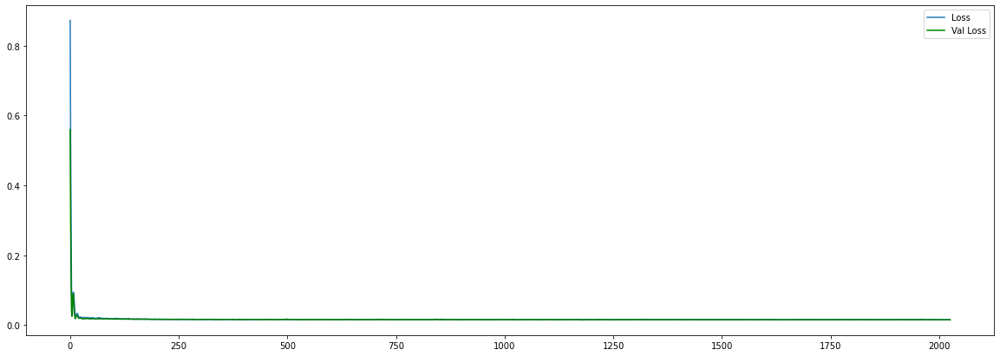

final loss: 0.014654386788606644
final val_loss: 0.015060837380588055


In [ ]:
build_and_train_all_model(MSN_data_processor, MSN_predictor)

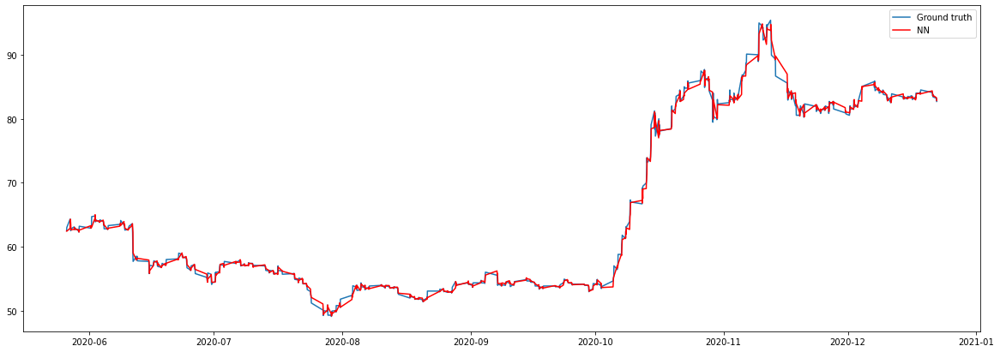

Simple NN
MSE:  0.5174412727355957
MAE:  0.4355255


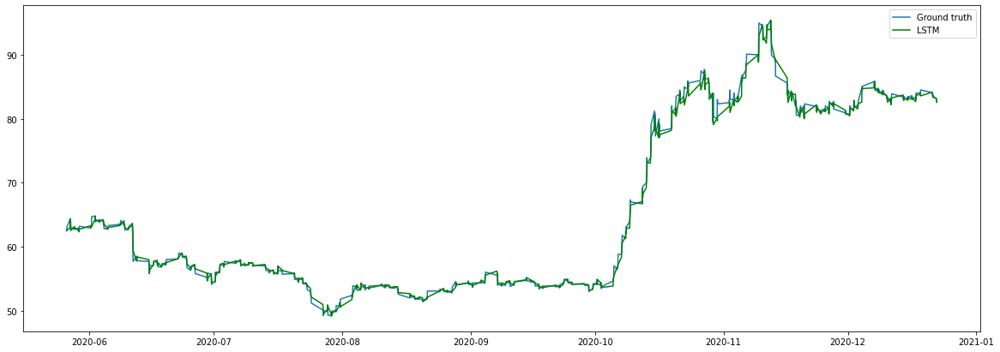

Simple LSTM
MSE:  0.6137381792068481
MAE:  0.4869622


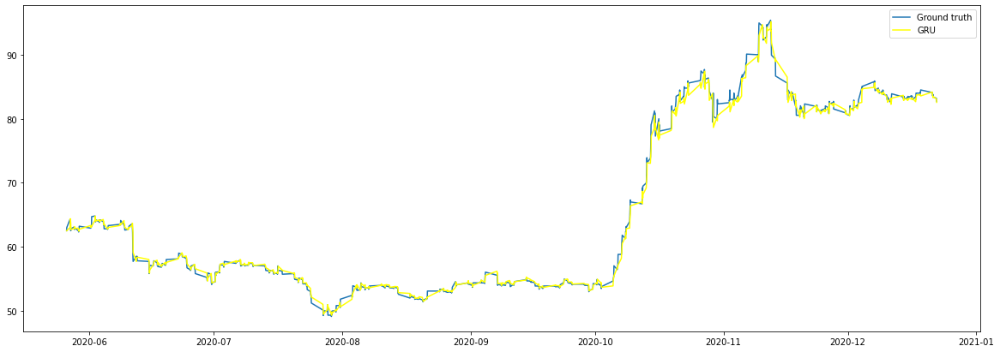

Simple GRU
MSE:  0.6159062385559082
MAE:  0.49316743


In [ ]:
evaluate_all_model(MSN_data_processor, MSN_predictor)

### PNJ

In [ ]:
PNJ_data_processor = DataProcessor('PNJ', PNJ, '1H')
PNJ_predictor = StockPredictor(PNJ_data_processor.stock_name, PNJ_data_processor.timeDelta)

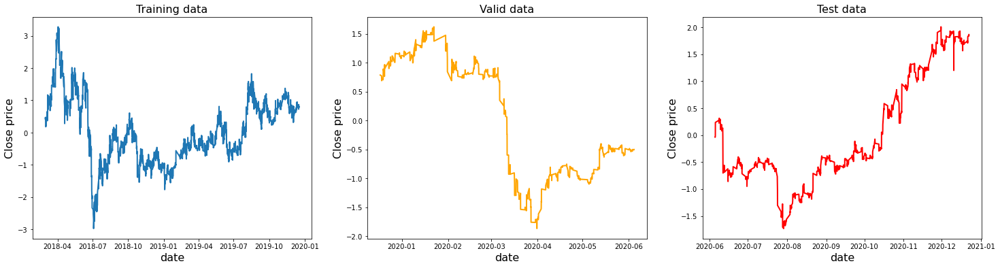

In [ ]:
PNJ_data_processor.visualize_train_val_test_df()

Get best hyperparameter for simple NN


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


INFO:tensorflow:Oracle triggered exit
Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 1, 5)]            0         
_________________________________________________________________
flatten (Flatten)            (None, 5)                 0         
_________________________________________________________________
dense (Dense)                (None, 32)                192       
_________________________________________________________________
dropout (Dropout)            (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 33        
Total params: 225
Trainable params: 225
Non-trainable params: 0
_________________________________________________________________
Start training simple NN
Epoch 1/2500
2/2 [==============================] - ETA: 0s - loss


Epoch 00029: val_loss did not improve from 0.00538
Epoch 30/2500
2/2 [==============================] - ETA: 0s - loss: 0.1838 - mae: 0.302 - 0s 17ms/step - loss: 0.1878 - mae: 0.3048 - val_loss: 0.0070 - val_mae: 0.0620

Epoch 00030: val_loss did not improve from 0.00538
Epoch 31/2500
2/2 [==============================] - ETA: 0s - loss: 0.1633 - mae: 0.287 - 0s 17ms/step - loss: 0.1672 - mae: 0.2891 - val_loss: 0.0067 - val_mae: 0.0602

Epoch 00031: val_loss did not improve from 0.00538
Epoch 32/2500
2/2 [==============================] - ETA: 0s - loss: 0.1963 - mae: 0.305 - 0s 16ms/step - loss: 0.1936 - mae: 0.3043 - val_loss: 0.0063 - val_mae: 0.0578

Epoch 00032: val_loss did not improve from 0.00538
Epoch 33/2500
2/2 [==============================] - ETA: 0s - loss: 0.1616 - mae: 0.286 - 0s 16ms/step - loss: 0.1635 - mae: 0.2885 - val_loss: 0.0060 - val_mae: 0.0550

Epoch 00033: val_loss did not improve from 0.00538
Epoch 34/2500
2/2 [==============================] - ETA: 0s

Epoch 66/2500
2/2 [==============================] - ETA: 0s - loss: 0.1442 - mae: 0.276 - 0s 16ms/step - loss: 0.1435 - mae: 0.2754 - val_loss: 0.0056 - val_mae: 0.0527

Epoch 00066: val_loss did not improve from 0.00497
Epoch 67/2500
2/2 [==============================] - ETA: 0s - loss: 0.1537 - mae: 0.279 - 0s 16ms/step - loss: 0.1536 - mae: 0.2790 - val_loss: 0.0056 - val_mae: 0.0527

Epoch 00067: val_loss did not improve from 0.00497
Epoch 68/2500
2/2 [==============================] - ETA: 0s - loss: 0.1532 - mae: 0.281 - 0s 16ms/step - loss: 0.1560 - mae: 0.2841 - val_loss: 0.0056 - val_mae: 0.0526

Epoch 00068: val_loss did not improve from 0.00497
Epoch 69/2500
2/2 [==============================] - ETA: 0s - loss: 0.1328 - mae: 0.263 - 0s 16ms/step - loss: 0.1367 - mae: 0.2647 - val_loss: 0.0055 - val_mae: 0.0518

Epoch 00069: val_loss did not improve from 0.00497
Epoch 70/2500
2/2 [==============================] - ETA: 0s - loss: 0.1632 - mae: 0.275 - 0s 16ms/step - loss: 

Epoch 00102: val_loss did not improve from 0.00497
Epoch 103/2500
2/2 [==============================] - ETA: 0s - loss: 0.1431 - mae: 0.264 - 0s 16ms/step - loss: 0.1443 - mae: 0.2654 - val_loss: 0.0059 - val_mae: 0.0549

Epoch 00103: val_loss did not improve from 0.00497
Epoch 104/2500
2/2 [==============================] - ETA: 0s - loss: 0.1431 - mae: 0.265 - 0s 15ms/step - loss: 0.1400 - mae: 0.2624 - val_loss: 0.0058 - val_mae: 0.0541

Epoch 00104: val_loss did not improve from 0.00497
Epoch 105/2500
2/2 [==============================] - ETA: 0s - loss: 0.1275 - mae: 0.259 - 0s 15ms/step - loss: 0.1272 - mae: 0.2596 - val_loss: 0.0057 - val_mae: 0.0529

Epoch 00105: val_loss did not improve from 0.00497
Epoch 106/2500
2/2 [==============================] - ETA: 0s - loss: 0.1168 - mae: 0.248 - 0s 16ms/step - loss: 0.1204 - mae: 0.2512 - val_loss: 0.0054 - val_mae: 0.0510

Epoch 00106: val_loss did not improve from 0.00497
Epoch 107/2500
2/2 [==============================] - ETA

2/2 [==============================] - ETA: 0s - loss: 0.1155 - mae: 0.242 - 0s 16ms/step - loss: 0.1153 - mae: 0.2420 - val_loss: 0.0049 - val_mae: 0.0459

Epoch 00139: val_loss improved from 0.00495 to 0.00486, saving model to PNJ_1H_NN.hdf5
Epoch 140/2500
2/2 [==============================] - ETA: 0s - loss: 0.1081 - mae: 0.233 - 0s 17ms/step - loss: 0.1081 - mae: 0.2342 - val_loss: 0.0048 - val_mae: 0.0453

Epoch 00140: val_loss improved from 0.00486 to 0.00482, saving model to PNJ_1H_NN.hdf5
Epoch 141/2500
2/2 [==============================] - ETA: 0s - loss: 0.1082 - mae: 0.237 - 0s 16ms/step - loss: 0.1100 - mae: 0.2373 - val_loss: 0.0048 - val_mae: 0.0454

Epoch 00141: val_loss did not improve from 0.00482
Epoch 142/2500
2/2 [==============================] - ETA: 0s - loss: 0.1103 - mae: 0.239 - 0s 16ms/step - loss: 0.1096 - mae: 0.2383 - val_loss: 0.0049 - val_mae: 0.0458

Epoch 00142: val_loss did not improve from 0.00482
Epoch 143/2500
2/2 [==============================]


Epoch 00175: val_loss did not improve from 0.00482
Epoch 176/2500
2/2 [==============================] - ETA: 0s - loss: 0.0910 - mae: 0.217 - 0s 16ms/step - loss: 0.0912 - mae: 0.2169 - val_loss: 0.0049 - val_mae: 0.0465

Epoch 00176: val_loss did not improve from 0.00482
Epoch 177/2500
2/2 [==============================] - ETA: 0s - loss: 0.0941 - mae: 0.217 - 0s 16ms/step - loss: 0.0945 - mae: 0.2188 - val_loss: 0.0049 - val_mae: 0.0463

Epoch 00177: val_loss did not improve from 0.00482
Epoch 178/2500
2/2 [==============================] - ETA: 0s - loss: 0.0957 - mae: 0.218 - 0s 15ms/step - loss: 0.0960 - mae: 0.2197 - val_loss: 0.0049 - val_mae: 0.0463

Epoch 00178: val_loss did not improve from 0.00482
Epoch 179/2500
2/2 [==============================] - ETA: 0s - loss: 0.0919 - mae: 0.219 - 0s 16ms/step - loss: 0.0935 - mae: 0.2204 - val_loss: 0.0049 - val_mae: 0.0464

Epoch 00179: val_loss did not improve from 0.00482
Epoch 180/2500
2/2 [==============================] - ET

Epoch 212/2500
2/2 [==============================] - ETA: 0s - loss: 0.0923 - mae: 0.213 - 0s 16ms/step - loss: 0.0918 - mae: 0.2127 - val_loss: 0.0052 - val_mae: 0.0493

Epoch 00212: val_loss did not improve from 0.00481
Epoch 213/2500
2/2 [==============================] - ETA: 0s - loss: 0.0811 - mae: 0.204 - 0s 16ms/step - loss: 0.0818 - mae: 0.2049 - val_loss: 0.0052 - val_mae: 0.0492

Epoch 00213: val_loss did not improve from 0.00481
Epoch 214/2500
2/2 [==============================] - ETA: 0s - loss: 0.0774 - mae: 0.203 - 0s 15ms/step - loss: 0.0775 - mae: 0.2032 - val_loss: 0.0052 - val_mae: 0.0491

Epoch 00214: val_loss did not improve from 0.00481
Epoch 215/2500
2/2 [==============================] - ETA: 0s - loss: 0.0894 - mae: 0.212 - 0s 16ms/step - loss: 0.0895 - mae: 0.2127 - val_loss: 0.0051 - val_mae: 0.0485

Epoch 00215: val_loss did not improve from 0.00481
Epoch 216/2500
2/2 [==============================] - ETA: 0s - loss: 0.0833 - mae: 0.208 - 0s 15ms/step - l

2/2 [==============================] - ETA: 0s - loss: 0.0729 - mae: 0.195 - 0s 16ms/step - loss: 0.0717 - mae: 0.1938 - val_loss: 0.0052 - val_mae: 0.0492

Epoch 00248: val_loss did not improve from 0.00472
Epoch 249/2500
2/2 [==============================] - ETA: 0s - loss: 0.0735 - mae: 0.194 - 0s 16ms/step - loss: 0.0737 - mae: 0.1953 - val_loss: 0.0051 - val_mae: 0.0484

Epoch 00249: val_loss did not improve from 0.00472
Epoch 250/2500
2/2 [==============================] - ETA: 0s - loss: 0.0690 - mae: 0.190 - 0s 15ms/step - loss: 0.0694 - mae: 0.1907 - val_loss: 0.0050 - val_mae: 0.0475

Epoch 00250: val_loss did not improve from 0.00472
Epoch 251/2500
2/2 [==============================] - ETA: 0s - loss: 0.0675 - mae: 0.191 - 0s 15ms/step - loss: 0.0673 - mae: 0.1912 - val_loss: 0.0049 - val_mae: 0.0468

Epoch 00251: val_loss did not improve from 0.00472
Epoch 252/2500
2/2 [==============================] - ETA: 0s - loss: 0.0740 - mae: 0.197 - 0s 16ms/step - loss: 0.0738 - m

Epoch 00284: val_loss did not improve from 0.00472
Epoch 285/2500
2/2 [==============================] - ETA: 0s - loss: 0.0649 - mae: 0.184 - 0s 16ms/step - loss: 0.0645 - mae: 0.1840 - val_loss: 0.0050 - val_mae: 0.0487

Epoch 00285: val_loss did not improve from 0.00472
Epoch 286/2500
2/2 [==============================] - ETA: 0s - loss: 0.0605 - mae: 0.179 - 0s 16ms/step - loss: 0.0613 - mae: 0.1801 - val_loss: 0.0050 - val_mae: 0.0487

Epoch 00286: val_loss did not improve from 0.00472
Epoch 287/2500
2/2 [==============================] - ETA: 0s - loss: 0.0650 - mae: 0.185 - 0s 17ms/step - loss: 0.0649 - mae: 0.1854 - val_loss: 0.0051 - val_mae: 0.0487

Epoch 00287: val_loss did not improve from 0.00472
Epoch 288/2500
2/2 [==============================] - ETA: 0s - loss: 0.0629 - mae: 0.183 - 0s 16ms/step - loss: 0.0634 - mae: 0.1845 - val_loss: 0.0051 - val_mae: 0.0487

Epoch 00288: val_loss did not improve from 0.00472
Epoch 289/2500
2/2 [==============================] - ETA


Epoch 00321: val_loss did not improve from 0.00472
Epoch 322/2500
2/2 [==============================] - ETA: 0s - loss: 0.0557 - mae: 0.172 - 0s 16ms/step - loss: 0.0555 - mae: 0.1725 - val_loss: 0.0049 - val_mae: 0.0466

Epoch 00322: val_loss did not improve from 0.00472
Epoch 323/2500
2/2 [==============================] - ETA: 0s - loss: 0.0569 - mae: 0.172 - 0s 16ms/step - loss: 0.0566 - mae: 0.1720 - val_loss: 0.0049 - val_mae: 0.0469

Epoch 00323: val_loss did not improve from 0.00472
Epoch 324/2500
2/2 [==============================] - ETA: 0s - loss: 0.0573 - mae: 0.175 - 0s 16ms/step - loss: 0.0571 - mae: 0.1747 - val_loss: 0.0049 - val_mae: 0.0469

Epoch 00324: val_loss did not improve from 0.00472
Epoch 325/2500
2/2 [==============================] - ETA: 0s - loss: 0.0582 - mae: 0.177 - 0s 15ms/step - loss: 0.0576 - mae: 0.1765 - val_loss: 0.0050 - val_mae: 0.0472

Epoch 00325: val_loss did not improve from 0.00472
Epoch 326/2500
2/2 [==============================] - ET


Epoch 00358: val_loss did not improve from 0.00472
Epoch 359/2500
2/2 [==============================] - ETA: 0s - loss: 0.0494 - mae: 0.164 - 0s 16ms/step - loss: 0.0502 - mae: 0.1649 - val_loss: 0.0051 - val_mae: 0.0486

Epoch 00359: val_loss did not improve from 0.00472
Epoch 360/2500
2/2 [==============================] - ETA: 0s - loss: 0.0514 - mae: 0.163 - 0s 16ms/step - loss: 0.0511 - mae: 0.1636 - val_loss: 0.0051 - val_mae: 0.0484

Epoch 00360: val_loss did not improve from 0.00472
Epoch 361/2500
2/2 [==============================] - ETA: 0s - loss: 0.0513 - mae: 0.166 - 0s 15ms/step - loss: 0.0511 - mae: 0.1666 - val_loss: 0.0051 - val_mae: 0.0485

Epoch 00361: val_loss did not improve from 0.00472
Epoch 362/2500
2/2 [==============================] - ETA: 0s - loss: 0.0504 - mae: 0.166 - 0s 16ms/step - loss: 0.0502 - mae: 0.1666 - val_loss: 0.0050 - val_mae: 0.0483

Epoch 00362: val_loss did not improve from 0.00472
Epoch 363/2500
2/2 [==============================] - ET


Epoch 00395: val_loss did not improve from 0.00472
Epoch 396/2500
2/2 [==============================] - ETA: 0s - loss: 0.0486 - mae: 0.161 - 0s 16ms/step - loss: 0.0477 - mae: 0.1597 - val_loss: 0.0052 - val_mae: 0.0492

Epoch 00396: val_loss did not improve from 0.00472
Epoch 397/2500
2/2 [==============================] - ETA: 0s - loss: 0.0440 - mae: 0.155 - 0s 16ms/step - loss: 0.0442 - mae: 0.1553 - val_loss: 0.0051 - val_mae: 0.0489

Epoch 00397: val_loss did not improve from 0.00472
Epoch 398/2500
2/2 [==============================] - ETA: 0s - loss: 0.0459 - mae: 0.156 - 0s 16ms/step - loss: 0.0459 - mae: 0.1566 - val_loss: 0.0051 - val_mae: 0.0485

Epoch 00398: val_loss did not improve from 0.00472
Epoch 399/2500
2/2 [==============================] - ETA: 0s - loss: 0.0467 - mae: 0.159 - 0s 15ms/step - loss: 0.0467 - mae: 0.1596 - val_loss: 0.0051 - val_mae: 0.0483

Epoch 00399: val_loss did not improve from 0.00472
Epoch 400/2500
2/2 [==============================] - ET


Epoch 00432: val_loss did not improve from 0.00472
Epoch 433/2500
2/2 [==============================] - ETA: 0s - loss: 0.0417 - mae: 0.152 - 0s 16ms/step - loss: 0.0415 - mae: 0.1518 - val_loss: 0.0048 - val_mae: 0.0463

Epoch 00433: val_loss did not improve from 0.00472
Epoch 434/2500
2/2 [==============================] - ETA: 0s - loss: 0.0410 - mae: 0.149 - 0s 15ms/step - loss: 0.0411 - mae: 0.1501 - val_loss: 0.0047 - val_mae: 0.0453

Epoch 00434: val_loss did not improve from 0.00472
Epoch 435/2500
2/2 [==============================] - ETA: 0s - loss: 0.0422 - mae: 0.151 - 0s 16ms/step - loss: 0.0430 - mae: 0.1531 - val_loss: 0.0047 - val_mae: 0.0446

Epoch 00435: val_loss improved from 0.00472 to 0.00466, saving model to PNJ_1H_NN.hdf5
Epoch 436/2500
2/2 [==============================] - ETA: 0s - loss: 0.0420 - mae: 0.150 - 0s 15ms/step - loss: 0.0417 - mae: 0.1506 - val_loss: 0.0046 - val_mae: 0.0445

Epoch 00436: val_loss improved from 0.00466 to 0.00465, saving model to

2/2 [==============================] - ETA: 0s - loss: 0.0405 - mae: 0.147 - 0s 16ms/step - loss: 0.0400 - mae: 0.1464 - val_loss: 0.0050 - val_mae: 0.0480

Epoch 00469: val_loss did not improve from 0.00465
Epoch 470/2500
2/2 [==============================] - ETA: 0s - loss: 0.0411 - mae: 0.148 - 0s 16ms/step - loss: 0.0407 - mae: 0.1477 - val_loss: 0.0051 - val_mae: 0.0482

Epoch 00470: val_loss did not improve from 0.00465
Epoch 471/2500
2/2 [==============================] - ETA: 0s - loss: 0.0399 - mae: 0.148 - 0s 15ms/step - loss: 0.0402 - mae: 0.1488 - val_loss: 0.0051 - val_mae: 0.0484

Epoch 00471: val_loss did not improve from 0.00465
Epoch 472/2500
2/2 [==============================] - ETA: 0s - loss: 0.0399 - mae: 0.147 - 0s 15ms/step - loss: 0.0394 - mae: 0.1463 - val_loss: 0.0051 - val_mae: 0.0487

Epoch 00472: val_loss did not improve from 0.00465
Epoch 473/2500
2/2 [==============================] - ETA: 0s - loss: 0.0402 - mae: 0.149 - 0s 15ms/step - loss: 0.0400 - m


Epoch 00505: val_loss did not improve from 0.00465
Epoch 506/2500
2/2 [==============================] - ETA: 0s - loss: 0.0380 - mae: 0.147 - 0s 15ms/step - loss: 0.0376 - mae: 0.1466 - val_loss: 0.0049 - val_mae: 0.0474

Epoch 00506: val_loss did not improve from 0.00465
Epoch 507/2500
2/2 [==============================] - ETA: 0s - loss: 0.0387 - mae: 0.145 - 0s 15ms/step - loss: 0.0385 - mae: 0.1448 - val_loss: 0.0049 - val_mae: 0.0473

Epoch 00507: val_loss did not improve from 0.00465
Epoch 508/2500
2/2 [==============================] - ETA: 0s - loss: 0.0377 - mae: 0.140 - 0s 15ms/step - loss: 0.0385 - mae: 0.1425 - val_loss: 0.0049 - val_mae: 0.0473

Epoch 00508: val_loss did not improve from 0.00465
Epoch 509/2500
2/2 [==============================] - ETA: 0s - loss: 0.0368 - mae: 0.141 - 0s 16ms/step - loss: 0.0368 - mae: 0.1418 - val_loss: 0.0049 - val_mae: 0.0473

Epoch 00509: val_loss did not improve from 0.00465
Epoch 510/2500
2/2 [==============================] - ET

2/2 [==============================] - ETA: 0s - loss: 0.0383 - mae: 0.142 - 0s 16ms/step - loss: 0.0380 - mae: 0.1417 - val_loss: 0.0051 - val_mae: 0.0488

Epoch 00542: val_loss did not improve from 0.00464
Epoch 543/2500
2/2 [==============================] - ETA: 0s - loss: 0.0363 - mae: 0.142 - 0s 15ms/step - loss: 0.0359 - mae: 0.1419 - val_loss: 0.0051 - val_mae: 0.0489

Epoch 00543: val_loss did not improve from 0.00464
Epoch 544/2500
2/2 [==============================] - ETA: 0s - loss: 0.0369 - mae: 0.142 - 0s 16ms/step - loss: 0.0370 - mae: 0.1428 - val_loss: 0.0051 - val_mae: 0.0488

Epoch 00544: val_loss did not improve from 0.00464
Epoch 545/2500
2/2 [==============================] - ETA: 0s - loss: 0.0378 - mae: 0.143 - 0s 16ms/step - loss: 0.0379 - mae: 0.1434 - val_loss: 0.0051 - val_mae: 0.0484

Epoch 00545: val_loss did not improve from 0.00464
Epoch 546/2500
2/2 [==============================] - ETA: 0s - loss: 0.0380 - mae: 0.143 - 0s 16ms/step - loss: 0.0378 - m

Epoch 00578: val_loss did not improve from 0.00464
Epoch 579/2500
2/2 [==============================] - ETA: 0s - loss: 0.0368 - mae: 0.140 - 0s 17ms/step - loss: 0.0369 - mae: 0.1404 - val_loss: 0.0048 - val_mae: 0.0462

Epoch 00579: val_loss did not improve from 0.00464
Epoch 580/2500
2/2 [==============================] - ETA: 0s - loss: 0.0377 - mae: 0.144 - 0s 16ms/step - loss: 0.0371 - mae: 0.1433 - val_loss: 0.0049 - val_mae: 0.0466

Epoch 00580: val_loss did not improve from 0.00464
Epoch 581/2500
2/2 [==============================] - ETA: 0s - loss: 0.0371 - mae: 0.142 - 0s 16ms/step - loss: 0.0368 - mae: 0.1421 - val_loss: 0.0049 - val_mae: 0.0468

Epoch 00581: val_loss did not improve from 0.00464
Epoch 582/2500
2/2 [==============================] - ETA: 0s - loss: 0.0368 - mae: 0.141 - 0s 16ms/step - loss: 0.0365 - mae: 0.1414 - val_loss: 0.0049 - val_mae: 0.0470

Epoch 00582: val_loss did not improve from 0.00464
Epoch 583/2500
2/2 [==============================] - ETA

2/2 [==============================] - ETA: 0s - loss: 0.0343 - mae: 0.136 - 0s 16ms/step - loss: 0.0343 - mae: 0.1366 - val_loss: 0.0047 - val_mae: 0.0450

Epoch 00615: val_loss did not improve from 0.00462
Epoch 616/2500
2/2 [==============================] - ETA: 0s - loss: 0.0354 - mae: 0.138 - 0s 16ms/step - loss: 0.0350 - mae: 0.1375 - val_loss: 0.0047 - val_mae: 0.0452

Epoch 00616: val_loss did not improve from 0.00462
Epoch 617/2500
2/2 [==============================] - ETA: 0s - loss: 0.0337 - mae: 0.135 - 0s 17ms/step - loss: 0.0336 - mae: 0.1359 - val_loss: 0.0048 - val_mae: 0.0455

Epoch 00617: val_loss did not improve from 0.00462
Epoch 618/2500
2/2 [==============================] - ETA: 0s - loss: 0.0354 - mae: 0.140 - 0s 15ms/step - loss: 0.0357 - mae: 0.1407 - val_loss: 0.0048 - val_mae: 0.0458

Epoch 00618: val_loss did not improve from 0.00462
Epoch 619/2500
2/2 [==============================] - ETA: 0s - loss: 0.0354 - mae: 0.137 - 0s 15ms/step - loss: 0.0350 - m

Epoch 00651: val_loss did not improve from 0.00462
Epoch 652/2500
2/2 [==============================] - ETA: 0s - loss: 0.0326 - mae: 0.134 - 0s 16ms/step - loss: 0.0324 - mae: 0.1346 - val_loss: 0.0047 - val_mae: 0.0450

Epoch 00652: val_loss did not improve from 0.00462
Epoch 653/2500
2/2 [==============================] - ETA: 0s - loss: 0.0335 - mae: 0.136 - 0s 16ms/step - loss: 0.0338 - mae: 0.1366 - val_loss: 0.0047 - val_mae: 0.0450

Epoch 00653: val_loss did not improve from 0.00462
Epoch 654/2500
2/2 [==============================] - ETA: 0s - loss: 0.0331 - mae: 0.134 - 0s 15ms/step - loss: 0.0331 - mae: 0.1354 - val_loss: 0.0047 - val_mae: 0.0452

Epoch 00654: val_loss did not improve from 0.00462
Epoch 655/2500
2/2 [==============================] - ETA: 0s - loss: 0.0351 - mae: 0.138 - 0s 15ms/step - loss: 0.0351 - mae: 0.1386 - val_loss: 0.0047 - val_mae: 0.0453

Epoch 00655: val_loss did not improve from 0.00462
Epoch 656/2500
2/2 [==============================] - ETA


Epoch 00688: val_loss did not improve from 0.00462
Epoch 689/2500
2/2 [==============================] - ETA: 0s - loss: 0.0359 - mae: 0.135 - 0s 16ms/step - loss: 0.0358 - mae: 0.1356 - val_loss: 0.0050 - val_mae: 0.0479

Epoch 00689: val_loss did not improve from 0.00462
Epoch 690/2500
2/2 [==============================] - ETA: 0s - loss: 0.0329 - mae: 0.134 - 0s 16ms/step - loss: 0.0329 - mae: 0.1351 - val_loss: 0.0050 - val_mae: 0.0472

Epoch 00690: val_loss did not improve from 0.00462
Epoch 691/2500
2/2 [==============================] - ETA: 0s - loss: 0.0325 - mae: 0.135 - 0s 15ms/step - loss: 0.0325 - mae: 0.1349 - val_loss: 0.0049 - val_mae: 0.0465

Epoch 00691: val_loss did not improve from 0.00462
Epoch 692/2500
2/2 [==============================] - ETA: 0s - loss: 0.0336 - mae: 0.135 - 0s 16ms/step - loss: 0.0339 - mae: 0.1365 - val_loss: 0.0048 - val_mae: 0.0459

Epoch 00692: val_loss did not improve from 0.00462
Epoch 693/2500
2/2 [==============================] - ET


Epoch 00725: val_loss did not improve from 0.00462
Epoch 726/2500
2/2 [==============================] - ETA: 0s - loss: 0.0316 - mae: 0.132 - 0s 16ms/step - loss: 0.0317 - mae: 0.1329 - val_loss: 0.0049 - val_mae: 0.0466

Epoch 00726: val_loss did not improve from 0.00462
Epoch 727/2500
2/2 [==============================] - ETA: 0s - loss: 0.0329 - mae: 0.132 - 0s 16ms/step - loss: 0.0327 - mae: 0.1327 - val_loss: 0.0049 - val_mae: 0.0469

Epoch 00727: val_loss did not improve from 0.00462
Epoch 728/2500
2/2 [==============================] - ETA: 0s - loss: 0.0316 - mae: 0.132 - 0s 16ms/step - loss: 0.0315 - mae: 0.1320 - val_loss: 0.0049 - val_mae: 0.0472

Epoch 00728: val_loss did not improve from 0.00462
Epoch 729/2500
2/2 [==============================] - ETA: 0s - loss: 0.0319 - mae: 0.131 - 0s 16ms/step - loss: 0.0321 - mae: 0.1323 - val_loss: 0.0050 - val_mae: 0.0476

Epoch 00729: val_loss did not improve from 0.00462
Epoch 730/2500
2/2 [==============================] - ET


Epoch 00762: val_loss did not improve from 0.00462
Epoch 763/2500
2/2 [==============================] - ETA: 0s - loss: 0.0320 - mae: 0.134 - 0s 16ms/step - loss: 0.0318 - mae: 0.1342 - val_loss: 0.0047 - val_mae: 0.0447

Epoch 00763: val_loss did not improve from 0.00462
Epoch 764/2500
2/2 [==============================] - ETA: 0s - loss: 0.0323 - mae: 0.133 - 0s 16ms/step - loss: 0.0322 - mae: 0.1330 - val_loss: 0.0047 - val_mae: 0.0448

Epoch 00764: val_loss did not improve from 0.00462
Epoch 765/2500
2/2 [==============================] - ETA: 0s - loss: 0.0324 - mae: 0.134 - 0s 15ms/step - loss: 0.0320 - mae: 0.1339 - val_loss: 0.0047 - val_mae: 0.0448

Epoch 00765: val_loss did not improve from 0.00462
Epoch 766/2500
2/2 [==============================] - ETA: 0s - loss: 0.0318 - mae: 0.131 - 0s 16ms/step - loss: 0.0317 - mae: 0.1318 - val_loss: 0.0047 - val_mae: 0.0449

Epoch 00766: val_loss did not improve from 0.00462
Epoch 767/2500
2/2 [==============================] - ET

2/2 [==============================] - ETA: 0s - loss: 0.0298 - mae: 0.129 - 0s 16ms/step - loss: 0.0300 - mae: 0.1294 - val_loss: 0.0049 - val_mae: 0.0469

Epoch 00799: val_loss did not improve from 0.00461
Epoch 800/2500
2/2 [==============================] - ETA: 0s - loss: 0.0314 - mae: 0.131 - 0s 16ms/step - loss: 0.0308 - mae: 0.1301 - val_loss: 0.0049 - val_mae: 0.0470

Epoch 00800: val_loss did not improve from 0.00461
Epoch 801/2500
2/2 [==============================] - ETA: 0s - loss: 0.0321 - mae: 0.133 - 0s 16ms/step - loss: 0.0319 - mae: 0.1330 - val_loss: 0.0049 - val_mae: 0.0469

Epoch 00801: val_loss did not improve from 0.00461
Epoch 802/2500
2/2 [==============================] - ETA: 0s - loss: 0.0325 - mae: 0.132 - 0s 16ms/step - loss: 0.0325 - mae: 0.1321 - val_loss: 0.0049 - val_mae: 0.0466

Epoch 00802: val_loss did not improve from 0.00461
Epoch 803/2500
2/2 [==============================] - ETA: 0s - loss: 0.0310 - mae: 0.129 - 0s 16ms/step - loss: 0.0314 - m

Epoch 00835: val_loss did not improve from 0.00461
Epoch 836/2500
2/2 [==============================] - ETA: 0s - loss: 0.0298 - mae: 0.128 - 0s 16ms/step - loss: 0.0304 - mae: 0.1297 - val_loss: 0.0047 - val_mae: 0.0451

Epoch 00836: val_loss did not improve from 0.00461
Epoch 837/2500
2/2 [==============================] - ETA: 0s - loss: 0.0302 - mae: 0.129 - 0s 15ms/step - loss: 0.0306 - mae: 0.1300 - val_loss: 0.0047 - val_mae: 0.0453

Epoch 00837: val_loss did not improve from 0.00461
Epoch 838/2500
2/2 [==============================] - ETA: 0s - loss: 0.0315 - mae: 0.131 - 0s 17ms/step - loss: 0.0317 - mae: 0.1317 - val_loss: 0.0047 - val_mae: 0.0455

Epoch 00838: val_loss did not improve from 0.00461
Epoch 839/2500
2/2 [==============================] - ETA: 0s - loss: 0.0306 - mae: 0.129 - 0s 16ms/step - loss: 0.0306 - mae: 0.1300 - val_loss: 0.0047 - val_mae: 0.0457

Epoch 00839: val_loss did not improve from 0.00461
Epoch 840/2500
2/2 [==============================] - ETA


Epoch 00871: val_loss did not improve from 0.00459
Epoch 872/2500
2/2 [==============================] - ETA: 0s - loss: 0.0317 - mae: 0.131 - 0s 16ms/step - loss: 0.0319 - mae: 0.1318 - val_loss: 0.0047 - val_mae: 0.0450

Epoch 00872: val_loss did not improve from 0.00459
Epoch 873/2500
2/2 [==============================] - ETA: 0s - loss: 0.0308 - mae: 0.129 - 0s 15ms/step - loss: 0.0308 - mae: 0.1295 - val_loss: 0.0047 - val_mae: 0.0452

Epoch 00873: val_loss did not improve from 0.00459
Epoch 874/2500
2/2 [==============================] - ETA: 0s - loss: 0.0294 - mae: 0.127 - 0s 16ms/step - loss: 0.0295 - mae: 0.1278 - val_loss: 0.0047 - val_mae: 0.0454

Epoch 00874: val_loss did not improve from 0.00459
Epoch 875/2500
2/2 [==============================] - ETA: 0s - loss: 0.0323 - mae: 0.133 - 0s 17ms/step - loss: 0.0318 - mae: 0.1327 - val_loss: 0.0048 - val_mae: 0.0456

Epoch 00875: val_loss did not improve from 0.00459
Epoch 876/2500
2/2 [==============================] - ET


Epoch 00908: val_loss did not improve from 0.00459
Epoch 909/2500
2/2 [==============================] - ETA: 0s - loss: 0.0317 - mae: 0.130 - 0s 16ms/step - loss: 0.0315 - mae: 0.1296 - val_loss: 0.0048 - val_mae: 0.0456

Epoch 00909: val_loss did not improve from 0.00459
Epoch 910/2500
2/2 [==============================] - ETA: 0s - loss: 0.0301 - mae: 0.129 - 0s 16ms/step - loss: 0.0303 - mae: 0.1303 - val_loss: 0.0048 - val_mae: 0.0455

Epoch 00910: val_loss did not improve from 0.00459
Epoch 911/2500
2/2 [==============================] - ETA: 0s - loss: 0.0281 - mae: 0.125 - 0s 15ms/step - loss: 0.0286 - mae: 0.1270 - val_loss: 0.0047 - val_mae: 0.0455

Epoch 00911: val_loss did not improve from 0.00459
Epoch 912/2500
2/2 [==============================] - ETA: 0s - loss: 0.0306 - mae: 0.131 - 0s 15ms/step - loss: 0.0308 - mae: 0.1315 - val_loss: 0.0047 - val_mae: 0.0455

Epoch 00912: val_loss did not improve from 0.00459
Epoch 913/2500
2/2 [==============================] - ET


Epoch 00945: val_loss did not improve from 0.00459
Epoch 946/2500
2/2 [==============================] - ETA: 0s - loss: 0.0296 - mae: 0.128 - 0s 16ms/step - loss: 0.0293 - mae: 0.1281 - val_loss: 0.0047 - val_mae: 0.0450

Epoch 00946: val_loss did not improve from 0.00459
Epoch 947/2500
2/2 [==============================] - ETA: 0s - loss: 0.0290 - mae: 0.127 - 0s 16ms/step - loss: 0.0292 - mae: 0.1277 - val_loss: 0.0047 - val_mae: 0.0450

Epoch 00947: val_loss did not improve from 0.00459
Epoch 948/2500
2/2 [==============================] - ETA: 0s - loss: 0.0297 - mae: 0.129 - 0s 15ms/step - loss: 0.0298 - mae: 0.1293 - val_loss: 0.0047 - val_mae: 0.0450

Epoch 00948: val_loss did not improve from 0.00459
Epoch 949/2500
2/2 [==============================] - ETA: 0s - loss: 0.0290 - mae: 0.125 - 0s 16ms/step - loss: 0.0294 - mae: 0.1265 - val_loss: 0.0047 - val_mae: 0.0450

Epoch 00949: val_loss did not improve from 0.00459
Epoch 950/2500
2/2 [==============================] - ET


Epoch 00982: val_loss did not improve from 0.00459
Epoch 983/2500
2/2 [==============================] - ETA: 0s - loss: 0.0281 - mae: 0.127 - 0s 16ms/step - loss: 0.0283 - mae: 0.1280 - val_loss: 0.0047 - val_mae: 0.0456

Epoch 00983: val_loss did not improve from 0.00459
Epoch 984/2500
2/2 [==============================] - ETA: 0s - loss: 0.0307 - mae: 0.130 - 0s 16ms/step - loss: 0.0312 - mae: 0.1311 - val_loss: 0.0048 - val_mae: 0.0457

Epoch 00984: val_loss did not improve from 0.00459
Epoch 985/2500
2/2 [==============================] - ETA: 0s - loss: 0.0290 - mae: 0.126 - 0s 16ms/step - loss: 0.0292 - mae: 0.1270 - val_loss: 0.0048 - val_mae: 0.0458

Epoch 00985: val_loss did not improve from 0.00459
Epoch 986/2500
2/2 [==============================] - ETA: 0s - loss: 0.0288 - mae: 0.128 - 0s 16ms/step - loss: 0.0290 - mae: 0.1286 - val_loss: 0.0048 - val_mae: 0.0458

Epoch 00986: val_loss did not improve from 0.00459
Epoch 987/2500
2/2 [==============================] - ET


Epoch 01019: val_loss did not improve from 0.00459
Epoch 1020/2500
2/2 [==============================] - ETA: 0s - loss: 0.0311 - mae: 0.129 - 0s 16ms/step - loss: 0.0306 - mae: 0.1290 - val_loss: 0.0048 - val_mae: 0.0459

Epoch 01020: val_loss did not improve from 0.00459
Epoch 1021/2500
2/2 [==============================] - ETA: 0s - loss: 0.0302 - mae: 0.130 - 0s 16ms/step - loss: 0.0301 - mae: 0.1297 - val_loss: 0.0048 - val_mae: 0.0459

Epoch 01021: val_loss did not improve from 0.00459
Epoch 1022/2500
2/2 [==============================] - ETA: 0s - loss: 0.0294 - mae: 0.127 - 0s 15ms/step - loss: 0.0295 - mae: 0.1274 - val_loss: 0.0048 - val_mae: 0.0459

Epoch 01022: val_loss did not improve from 0.00459
Epoch 1023/2500
2/2 [==============================] - ETA: 0s - loss: 0.0302 - mae: 0.130 - 0s 16ms/step - loss: 0.0301 - mae: 0.1305 - val_loss: 0.0048 - val_mae: 0.0458

Epoch 01023: val_loss did not improve from 0.00459
Epoch 1024/2500
2/2 [==============================]

2/2 [==============================] - ETA: 0s - loss: 0.0301 - mae: 0.128 - 0s 15ms/step - loss: 0.0302 - mae: 0.1283 - val_loss: 0.0047 - val_mae: 0.0454

Epoch 01056: val_loss did not improve from 0.00459
Epoch 1057/2500
2/2 [==============================] - ETA: 0s - loss: 0.0283 - mae: 0.125 - 0s 16ms/step - loss: 0.0287 - mae: 0.1264 - val_loss: 0.0047 - val_mae: 0.0453

Epoch 01057: val_loss did not improve from 0.00459
Epoch 1058/2500
2/2 [==============================] - ETA: 0s - loss: 0.0305 - mae: 0.131 - 0s 16ms/step - loss: 0.0300 - mae: 0.1299 - val_loss: 0.0047 - val_mae: 0.0453

Epoch 01058: val_loss did not improve from 0.00459
Epoch 1059/2500
2/2 [==============================] - ETA: 0s - loss: 0.0281 - mae: 0.125 - 0s 16ms/step - loss: 0.0284 - mae: 0.1262 - val_loss: 0.0047 - val_mae: 0.0452

Epoch 01059: val_loss did not improve from 0.00459
Epoch 1060/2500
2/2 [==============================] - ETA: 0s - loss: 0.0306 - mae: 0.128 - 0s 15ms/step - loss: 0.0304

Epoch 01091: val_loss did not improve from 0.00457
Epoch 1092/2500
2/2 [==============================] - ETA: 0s - loss: 0.0275 - mae: 0.124 - 0s 16ms/step - loss: 0.0279 - mae: 0.1255 - val_loss: 0.0048 - val_mae: 0.0460

Epoch 01092: val_loss did not improve from 0.00457
Epoch 1093/2500
2/2 [==============================] - ETA: 0s - loss: 0.0293 - mae: 0.126 - 0s 17ms/step - loss: 0.0294 - mae: 0.1272 - val_loss: 0.0048 - val_mae: 0.0459

Epoch 01093: val_loss did not improve from 0.00457
Epoch 1094/2500
2/2 [==============================] - ETA: 0s - loss: 0.0276 - mae: 0.124 - 0s 16ms/step - loss: 0.0280 - mae: 0.1248 - val_loss: 0.0048 - val_mae: 0.0459

Epoch 01094: val_loss did not improve from 0.00457
Epoch 1095/2500
2/2 [==============================] - ETA: 0s - loss: 0.0282 - mae: 0.124 - 0s 16ms/step - loss: 0.0282 - mae: 0.1246 - val_loss: 0.0048 - val_mae: 0.0458

Epoch 01095: val_loss did not improve from 0.00457
Epoch 1096/2500
2/2 [==============================] 

2/2 [==============================] - ETA: 0s - loss: 0.0291 - mae: 0.127 - 0s 16ms/step - loss: 0.0292 - mae: 0.1272 - val_loss: 0.0047 - val_mae: 0.0454

Epoch 01128: val_loss did not improve from 0.00457
Epoch 1129/2500
2/2 [==============================] - ETA: 0s - loss: 0.0302 - mae: 0.129 - 0s 16ms/step - loss: 0.0300 - mae: 0.1293 - val_loss: 0.0048 - val_mae: 0.0455

Epoch 01129: val_loss did not improve from 0.00457
Epoch 1130/2500
2/2 [==============================] - ETA: 0s - loss: 0.0295 - mae: 0.129 - 0s 17ms/step - loss: 0.0293 - mae: 0.1288 - val_loss: 0.0048 - val_mae: 0.0456

Epoch 01130: val_loss did not improve from 0.00457
Epoch 1131/2500
2/2 [==============================] - ETA: 0s - loss: 0.0292 - mae: 0.128 - 0s 16ms/step - loss: 0.0292 - mae: 0.1281 - val_loss: 0.0048 - val_mae: 0.0457

Epoch 01131: val_loss did not improve from 0.00457
Epoch 1132/2500
2/2 [==============================] - ETA: 0s - loss: 0.0297 - mae: 0.127 - 0s 16ms/step - loss: 0.0294


Epoch 01164: val_loss did not improve from 0.00457
Epoch 1165/2500
2/2 [==============================] - ETA: 0s - loss: 0.0292 - mae: 0.126 - 0s 19ms/step - loss: 0.0293 - mae: 0.1270 - val_loss: 0.0048 - val_mae: 0.0459

Epoch 01165: val_loss did not improve from 0.00457
Epoch 1166/2500
2/2 [==============================] - ETA: 0s - loss: 0.0291 - mae: 0.127 - 0s 16ms/step - loss: 0.0290 - mae: 0.1268 - val_loss: 0.0048 - val_mae: 0.0458

Epoch 01166: val_loss did not improve from 0.00457
Epoch 1167/2500
2/2 [==============================] - ETA: 0s - loss: 0.0315 - mae: 0.130 - 0s 16ms/step - loss: 0.0312 - mae: 0.1300 - val_loss: 0.0048 - val_mae: 0.0457

Epoch 01167: val_loss did not improve from 0.00457
Epoch 1168/2500
2/2 [==============================] - ETA: 0s - loss: 0.0293 - mae: 0.128 - 0s 15ms/step - loss: 0.0292 - mae: 0.1279 - val_loss: 0.0048 - val_mae: 0.0457

Epoch 01168: val_loss did not improve from 0.00457
Epoch 1169/2500
2/2 [==============================]

2/2 [==============================] - ETA: 0s - loss: 0.0283 - mae: 0.127 - 0s 17ms/step - loss: 0.0280 - mae: 0.1265 - val_loss: 0.0046 - val_mae: 0.0445

Epoch 01201: val_loss did not improve from 0.00457
Epoch 1202/2500
2/2 [==============================] - ETA: 0s - loss: 0.0280 - mae: 0.125 - 0s 17ms/step - loss: 0.0284 - mae: 0.1269 - val_loss: 0.0046 - val_mae: 0.0444

Epoch 01202: val_loss did not improve from 0.00457
Epoch 1203/2500
2/2 [==============================] - ETA: 0s - loss: 0.0284 - mae: 0.124 - 0s 17ms/step - loss: 0.0284 - mae: 0.1246 - val_loss: 0.0046 - val_mae: 0.0445

Epoch 01203: val_loss did not improve from 0.00457
Epoch 1204/2500
2/2 [==============================] - ETA: 0s - loss: 0.0300 - mae: 0.129 - 0s 16ms/step - loss: 0.0300 - mae: 0.1290 - val_loss: 0.0046 - val_mae: 0.0445

Epoch 01204: val_loss did not improve from 0.00457
Epoch 1205/2500
2/2 [==============================] - ETA: 0s - loss: 0.0296 - mae: 0.126 - 0s 16ms/step - loss: 0.0295


Epoch 01237: val_loss did not improve from 0.00457
Epoch 1238/2500
2/2 [==============================] - ETA: 0s - loss: 0.0279 - mae: 0.122 - 0s 16ms/step - loss: 0.0278 - mae: 0.1229 - val_loss: 0.0047 - val_mae: 0.0450

Epoch 01238: val_loss did not improve from 0.00457
Epoch 1239/2500
2/2 [==============================] - ETA: 0s - loss: 0.0292 - mae: 0.126 - 0s 15ms/step - loss: 0.0291 - mae: 0.1267 - val_loss: 0.0047 - val_mae: 0.0451

Epoch 01239: val_loss did not improve from 0.00457
Epoch 1240/2500
2/2 [==============================] - ETA: 0s - loss: 0.0289 - mae: 0.127 - 0s 16ms/step - loss: 0.0288 - mae: 0.1269 - val_loss: 0.0047 - val_mae: 0.0452

Epoch 01240: val_loss did not improve from 0.00457
Epoch 1241/2500
2/2 [==============================] - ETA: 0s - loss: 0.0284 - mae: 0.125 - 0s 15ms/step - loss: 0.0285 - mae: 0.1249 - val_loss: 0.0047 - val_mae: 0.0453

Epoch 01241: val_loss did not improve from 0.00457
Epoch 1242/2500
2/2 [==============================]

2/2 [==============================] - ETA: 0s - loss: 0.0287 - mae: 0.125 - 0s 15ms/step - loss: 0.0286 - mae: 0.1260 - val_loss: 0.0048 - val_mae: 0.0455

Epoch 01274: val_loss did not improve from 0.00457
Epoch 1275/2500
2/2 [==============================] - ETA: 0s - loss: 0.0300 - mae: 0.127 - 0s 15ms/step - loss: 0.0298 - mae: 0.1276 - val_loss: 0.0047 - val_mae: 0.0454

Epoch 01275: val_loss did not improve from 0.00457
Epoch 1276/2500
2/2 [==============================] - ETA: 0s - loss: 0.0310 - mae: 0.131 - 0s 16ms/step - loss: 0.0310 - mae: 0.1317 - val_loss: 0.0047 - val_mae: 0.0454

Epoch 01276: val_loss did not improve from 0.00457
Epoch 1277/2500
2/2 [==============================] - ETA: 0s - loss: 0.0274 - mae: 0.125 - 0s 15ms/step - loss: 0.0273 - mae: 0.1250 - val_loss: 0.0047 - val_mae: 0.0454

Epoch 01277: val_loss did not improve from 0.00457
Epoch 1278/2500
2/2 [==============================] - ETA: 0s - loss: 0.0288 - mae: 0.127 - 0s 16ms/step - loss: 0.0288


Epoch 01310: val_loss did not improve from 0.00457
Epoch 1311/2500
2/2 [==============================] - ETA: 0s - loss: 0.0282 - mae: 0.123 - 0s 15ms/step - loss: 0.0282 - mae: 0.1232 - val_loss: 0.0047 - val_mae: 0.0454

Epoch 01311: val_loss did not improve from 0.00457
Epoch 1312/2500
2/2 [==============================] - ETA: 0s - loss: 0.0307 - mae: 0.129 - 0s 16ms/step - loss: 0.0303 - mae: 0.1284 - val_loss: 0.0047 - val_mae: 0.0453

Epoch 01312: val_loss did not improve from 0.00457
Epoch 1313/2500
2/2 [==============================] - ETA: 0s - loss: 0.0297 - mae: 0.125 - 0s 16ms/step - loss: 0.0295 - mae: 0.1252 - val_loss: 0.0047 - val_mae: 0.0451

Epoch 01313: val_loss did not improve from 0.00457
Epoch 1314/2500
2/2 [==============================] - ETA: 0s - loss: 0.0278 - mae: 0.124 - 0s 17ms/step - loss: 0.0280 - mae: 0.1242 - val_loss: 0.0047 - val_mae: 0.0450

Epoch 01314: val_loss did not improve from 0.00457
Epoch 1315/2500
2/2 [==============================]

Epoch 01346: val_loss did not improve from 0.00457
Epoch 1347/2500
2/2 [==============================] - ETA: 0s - loss: 0.0283 - mae: 0.124 - 0s 17ms/step - loss: 0.0282 - mae: 0.1243 - val_loss: 0.0047 - val_mae: 0.0451

Epoch 01347: val_loss did not improve from 0.00457
Epoch 1348/2500
2/2 [==============================] - ETA: 0s - loss: 0.0291 - mae: 0.127 - 0s 16ms/step - loss: 0.0292 - mae: 0.1274 - val_loss: 0.0047 - val_mae: 0.0451

Epoch 01348: val_loss did not improve from 0.00457
Epoch 1349/2500
2/2 [==============================] - ETA: 0s - loss: 0.0305 - mae: 0.128 - 0s 16ms/step - loss: 0.0299 - mae: 0.1274 - val_loss: 0.0047 - val_mae: 0.0451

Epoch 01349: val_loss did not improve from 0.00457
Epoch 1350/2500
2/2 [==============================] - ETA: 0s - loss: 0.0271 - mae: 0.120 - 0s 16ms/step - loss: 0.0273 - mae: 0.1214 - val_loss: 0.0047 - val_mae: 0.0451

Epoch 01350: val_loss did not improve from 0.00457
Epoch 1351/2500
2/2 [==============================] 

2/2 [==============================] - ETA: 0s - loss: 0.0290 - mae: 0.126 - 0s 16ms/step - loss: 0.0287 - mae: 0.1258 - val_loss: 0.0048 - val_mae: 0.0456

Epoch 01383: val_loss did not improve from 0.00457
Epoch 1384/2500
2/2 [==============================] - ETA: 0s - loss: 0.0278 - mae: 0.125 - 0s 16ms/step - loss: 0.0280 - mae: 0.1260 - val_loss: 0.0048 - val_mae: 0.0456

Epoch 01384: val_loss did not improve from 0.00457
Epoch 1385/2500
2/2 [==============================] - ETA: 0s - loss: 0.0279 - mae: 0.124 - 0s 16ms/step - loss: 0.0280 - mae: 0.1247 - val_loss: 0.0048 - val_mae: 0.0456

Epoch 01385: val_loss did not improve from 0.00457
Epoch 1386/2500
2/2 [==============================] - ETA: 0s - loss: 0.0270 - mae: 0.123 - 0s 17ms/step - loss: 0.0273 - mae: 0.1241 - val_loss: 0.0048 - val_mae: 0.0455

Epoch 01386: val_loss did not improve from 0.00457
Epoch 1387/2500
2/2 [==============================] - ETA: 0s - loss: 0.0287 - mae: 0.125 - 0s 16ms/step - loss: 0.0284


Epoch 01419: val_loss did not improve from 0.00457
Epoch 1420/2500
2/2 [==============================] - ETA: 0s - loss: 0.0303 - mae: 0.129 - 0s 16ms/step - loss: 0.0300 - mae: 0.1295 - val_loss: 0.0047 - val_mae: 0.0450

Epoch 01420: val_loss did not improve from 0.00457
Epoch 1421/2500
2/2 [==============================] - ETA: 0s - loss: 0.0293 - mae: 0.128 - 0s 16ms/step - loss: 0.0293 - mae: 0.1280 - val_loss: 0.0047 - val_mae: 0.0450

Epoch 01421: val_loss did not improve from 0.00457
Epoch 1422/2500
2/2 [==============================] - ETA: 0s - loss: 0.0282 - mae: 0.125 - 0s 17ms/step - loss: 0.0281 - mae: 0.1250 - val_loss: 0.0047 - val_mae: 0.0450

Epoch 01422: val_loss did not improve from 0.00457
Epoch 1423/2500
2/2 [==============================] - ETA: 0s - loss: 0.0280 - mae: 0.124 - 0s 22ms/step - loss: 0.0280 - mae: 0.1248 - val_loss: 0.0047 - val_mae: 0.0451

Epoch 01423: val_loss did not improve from 0.00457
Epoch 1424/2500
2/2 [==============================]

2/2 [==============================] - ETA: 0s - loss: 0.0267 - mae: 0.123 - 0s 20ms/step - loss: 0.0267 - mae: 0.1234 - val_loss: 0.0047 - val_mae: 0.0450

Epoch 01456: val_loss did not improve from 0.00457
Epoch 1457/2500
2/2 [==============================] - ETA: 0s - loss: 0.0295 - mae: 0.127 - 0s 17ms/step - loss: 0.0295 - mae: 0.1277 - val_loss: 0.0047 - val_mae: 0.0450

Epoch 01457: val_loss did not improve from 0.00457
Epoch 1458/2500
2/2 [==============================] - ETA: 0s - loss: 0.0289 - mae: 0.126 - 0s 17ms/step - loss: 0.0289 - mae: 0.1263 - val_loss: 0.0047 - val_mae: 0.0451

Epoch 01458: val_loss did not improve from 0.00457
Epoch 1459/2500
2/2 [==============================] - ETA: 0s - loss: 0.0299 - mae: 0.126 - 0s 18ms/step - loss: 0.0296 - mae: 0.1261 - val_loss: 0.0047 - val_mae: 0.0451

Epoch 01459: val_loss did not improve from 0.00457
Epoch 1460/2500
2/2 [==============================] - ETA: 0s - loss: 0.0270 - mae: 0.123 - 0s 18ms/step - loss: 0.0270


Epoch 01492: val_loss did not improve from 0.00457
Epoch 1493/2500
2/2 [==============================] - ETA: 0s - loss: 0.0290 - mae: 0.127 - 0s 17ms/step - loss: 0.0289 - mae: 0.1271 - val_loss: 0.0047 - val_mae: 0.0452

Epoch 01493: val_loss did not improve from 0.00457
Epoch 1494/2500
2/2 [==============================] - ETA: 0s - loss: 0.0290 - mae: 0.125 - 0s 19ms/step - loss: 0.0287 - mae: 0.1250 - val_loss: 0.0047 - val_mae: 0.0452

Epoch 01494: val_loss did not improve from 0.00457
Epoch 1495/2500
2/2 [==============================] - ETA: 0s - loss: 0.0297 - mae: 0.126 - 0s 17ms/step - loss: 0.0295 - mae: 0.1255 - val_loss: 0.0047 - val_mae: 0.0453

Epoch 01495: val_loss did not improve from 0.00457
Epoch 1496/2500
2/2 [==============================] - ETA: 0s - loss: 0.0270 - mae: 0.122 - 0s 18ms/step - loss: 0.0269 - mae: 0.1227 - val_loss: 0.0047 - val_mae: 0.0453

Epoch 01496: val_loss did not improve from 0.00457
Epoch 1497/2500
2/2 [==============================]

2/2 [==============================] - ETA: 0s - loss: 0.0290 - mae: 0.126 - 0s 17ms/step - loss: 0.0291 - mae: 0.1265 - val_loss: 0.0047 - val_mae: 0.0450

Epoch 01529: val_loss did not improve from 0.00457
Epoch 1530/2500
2/2 [==============================] - ETA: 0s - loss: 0.0279 - mae: 0.125 - 0s 18ms/step - loss: 0.0278 - mae: 0.1254 - val_loss: 0.0047 - val_mae: 0.0449

Epoch 01530: val_loss did not improve from 0.00457
Epoch 1531/2500
2/2 [==============================] - ETA: 0s - loss: 0.0262 - mae: 0.120 - 0s 18ms/step - loss: 0.0265 - mae: 0.1217 - val_loss: 0.0047 - val_mae: 0.0448

Epoch 01531: val_loss did not improve from 0.00457
Epoch 1532/2500
2/2 [==============================] - ETA: 0s - loss: 0.0297 - mae: 0.127 - 0s 18ms/step - loss: 0.0295 - mae: 0.1271 - val_loss: 0.0047 - val_mae: 0.0448

Epoch 01532: val_loss did not improve from 0.00457
Epoch 1533/2500
2/2 [==============================] - ETA: 0s - loss: 0.0286 - mae: 0.126 - 0s 18ms/step - loss: 0.0285


Epoch 01565: val_loss did not improve from 0.00457
Epoch 1566/2500
2/2 [==============================] - ETA: 0s - loss: 0.0280 - mae: 0.125 - 0s 18ms/step - loss: 0.0278 - mae: 0.1247 - val_loss: 0.0047 - val_mae: 0.0450

Epoch 01566: val_loss did not improve from 0.00457
Epoch 1567/2500
2/2 [==============================] - ETA: 0s - loss: 0.0278 - mae: 0.123 - 0s 17ms/step - loss: 0.0282 - mae: 0.1245 - val_loss: 0.0047 - val_mae: 0.0450

Epoch 01567: val_loss did not improve from 0.00457
Epoch 1568/2500
2/2 [==============================] - ETA: 0s - loss: 0.0290 - mae: 0.126 - 0s 17ms/step - loss: 0.0286 - mae: 0.1255 - val_loss: 0.0047 - val_mae: 0.0450

Epoch 01568: val_loss did not improve from 0.00457
Epoch 1569/2500
2/2 [==============================] - ETA: 0s - loss: 0.0278 - mae: 0.123 - 0s 17ms/step - loss: 0.0276 - mae: 0.1233 - val_loss: 0.0047 - val_mae: 0.0450

Epoch 01569: val_loss did not improve from 0.00457
Epoch 1570/2500
2/2 [==============================]

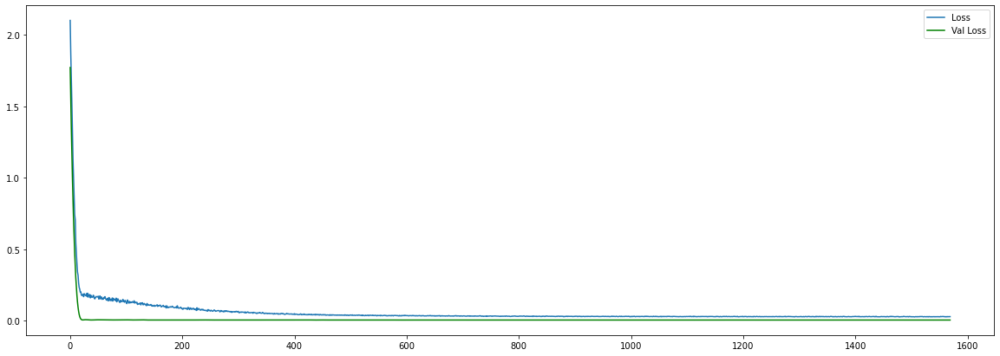

final loss: 0.02847435511648655
final val_loss: 0.004707613028585911
Get best hyperparameter for simple LSTM


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


INFO:tensorflow:Oracle triggered exit
Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 1, 5)]            0         
_________________________________________________________________
lstm (LSTM)                  (None, 1, 48)             10368     
_________________________________________________________________
lstm_1 (LSTM)                (None, 1, 48)             18624     
_________________________________________________________________
lstm_2 (LSTM)                (None, 48)                18624     
_________________________________________________________________
dense (Dense)                (None, 40)                1960      
_________________________________________________________________
dense_1 (Dense)              (None, 40)                1640      
_________________________________________________________________
dense_2 (Dense)        

2/2 [==============================] - ETA: 0s - loss: 0.0256 - mae: 0.119 - 0s 45ms/step - loss: 0.0255 - mae: 0.1194 - val_loss: 0.0151 - val_mae: 0.1040

Epoch 00028: val_loss did not improve from 0.00916
Epoch 29/2500
2/2 [==============================] - ETA: 0s - loss: 0.0287 - mae: 0.131 - 0s 29ms/step - loss: 0.0286 - mae: 0.1311 - val_loss: 0.0211 - val_mae: 0.1282

Epoch 00029: val_loss did not improve from 0.00916
Epoch 30/2500
2/2 [==============================] - ETA: 0s - loss: 0.0327 - mae: 0.142 - 0s 28ms/step - loss: 0.0326 - mae: 0.1426 - val_loss: 0.0203 - val_mae: 0.1259

Epoch 00030: val_loss did not improve from 0.00916
Epoch 31/2500
2/2 [==============================] - ETA: 0s - loss: 0.0311 - mae: 0.139 - 0s 26ms/step - loss: 0.0314 - mae: 0.1399 - val_loss: 0.0144 - val_mae: 0.1019

Epoch 00031: val_loss did not improve from 0.00916
Epoch 32/2500
2/2 [==============================] - ETA: 0s - loss: 0.0275 - mae: 0.128 - 0s 22ms/step - loss: 0.0272 - mae: 


Epoch 00063: val_loss did not improve from 0.00542
Epoch 64/2500
2/2 [==============================] - ETA: 0s - loss: 0.0204 - mae: 0.106 - 0s 27ms/step - loss: 0.0203 - mae: 0.1059 - val_loss: 0.0054 - val_mae: 0.0520

Epoch 00064: val_loss improved from 0.00542 to 0.00540, saving model to PNJ_1H_LSTM.hdf5
Epoch 65/2500
2/2 [==============================] - ETA: 0s - loss: 0.0203 - mae: 0.106 - 0s 25ms/step - loss: 0.0202 - mae: 0.1061 - val_loss: 0.0053 - val_mae: 0.0511

Epoch 00065: val_loss improved from 0.00540 to 0.00534, saving model to PNJ_1H_LSTM.hdf5
Epoch 66/2500
2/2 [==============================] - ETA: 0s - loss: 0.0203 - mae: 0.106 - 0s 29ms/step - loss: 0.0202 - mae: 0.1066 - val_loss: 0.0050 - val_mae: 0.0491

Epoch 00066: val_loss improved from 0.00534 to 0.00505, saving model to PNJ_1H_LSTM.hdf5
Epoch 67/2500
2/2 [==============================] - ETA: 0s - loss: 0.0200 - mae: 0.105 - 0s 37ms/step - loss: 0.0200 - mae: 0.1054 - val_loss: 0.0050 - val_mae: 0.049

Epoch 00098: val_loss improved from 0.00478 to 0.00473, saving model to PNJ_1H_LSTM.hdf5
Epoch 99/2500
2/2 [==============================] - ETA: 0s - loss: 0.0190 - mae: 0.102 - 0s 26ms/step - loss: 0.0190 - mae: 0.1027 - val_loss: 0.0050 - val_mae: 0.0481

Epoch 00099: val_loss did not improve from 0.00473
Epoch 100/2500
2/2 [==============================] - ETA: 0s - loss: 0.0190 - mae: 0.104 - 0s 30ms/step - loss: 0.0192 - mae: 0.1052 - val_loss: 0.0049 - val_mae: 0.0471

Epoch 00100: val_loss did not improve from 0.00473
Epoch 101/2500
2/2 [==============================] - ETA: 0s - loss: 0.0193 - mae: 0.105 - 0s 21ms/step - loss: 0.0192 - mae: 0.1045 - val_loss: 0.0049 - val_mae: 0.0483

Epoch 00101: val_loss did not improve from 0.00473
Epoch 102/2500
2/2 [==============================] - ETA: 0s - loss: 0.0191 - mae: 0.102 - 0s 23ms/step - loss: 0.0193 - mae: 0.1025 - val_loss: 0.0048 - val_mae: 0.0481

Epoch 00102: val_loss did not improve from 0.00473
Epoch 103/2500
2/2 [


Epoch 00134: val_loss did not improve from 0.00466
Epoch 135/2500
2/2 [==============================] - ETA: 0s - loss: 0.0188 - mae: 0.101 - 0s 22ms/step - loss: 0.0188 - mae: 0.1017 - val_loss: 0.0047 - val_mae: 0.0463

Epoch 00135: val_loss did not improve from 0.00466
Epoch 136/2500
2/2 [==============================] - ETA: 0s - loss: 0.0186 - mae: 0.102 - 0s 22ms/step - loss: 0.0187 - mae: 0.1025 - val_loss: 0.0047 - val_mae: 0.0459

Epoch 00136: val_loss did not improve from 0.00466
Epoch 137/2500
2/2 [==============================] - ETA: 0s - loss: 0.0187 - mae: 0.102 - 0s 24ms/step - loss: 0.0187 - mae: 0.1025 - val_loss: 0.0047 - val_mae: 0.0463

Epoch 00137: val_loss did not improve from 0.00466
Epoch 138/2500
2/2 [==============================] - ETA: 0s - loss: 0.0186 - mae: 0.101 - 0s 24ms/step - loss: 0.0187 - mae: 0.1017 - val_loss: 0.0047 - val_mae: 0.0460

Epoch 00138: val_loss improved from 0.00466 to 0.00466, saving model to PNJ_1H_LSTM.hdf5
Epoch 139/2500
2/2

Epoch 00170: val_loss did not improve from 0.00461
Epoch 171/2500
2/2 [==============================] - ETA: 0s - loss: 0.0188 - mae: 0.102 - 0s 28ms/step - loss: 0.0186 - mae: 0.1020 - val_loss: 0.0047 - val_mae: 0.0457

Epoch 00171: val_loss did not improve from 0.00461
Epoch 172/2500
2/2 [==============================] - ETA: 0s - loss: 0.0183 - mae: 0.100 - 0s 23ms/step - loss: 0.0184 - mae: 0.1009 - val_loss: 0.0047 - val_mae: 0.0460

Epoch 00172: val_loss did not improve from 0.00461
Epoch 173/2500
2/2 [==============================] - ETA: 0s - loss: 0.0184 - mae: 0.100 - 0s 25ms/step - loss: 0.0185 - mae: 0.1009 - val_loss: 0.0047 - val_mae: 0.0456

Epoch 00173: val_loss did not improve from 0.00461
Epoch 174/2500
2/2 [==============================] - ETA: 0s - loss: 0.0185 - mae: 0.101 - 0s 24ms/step - loss: 0.0185 - mae: 0.1013 - val_loss: 0.0047 - val_mae: 0.0461

Epoch 00174: val_loss did not improve from 0.00461
Epoch 175/2500
2/2 [==============================] - ETA

Epoch 207/2500
2/2 [==============================] - ETA: 0s - loss: 0.0181 - mae: 0.099 - 0s 22ms/step - loss: 0.0182 - mae: 0.1003 - val_loss: 0.0047 - val_mae: 0.0459

Epoch 00207: val_loss did not improve from 0.00454
Epoch 208/2500
2/2 [==============================] - ETA: 0s - loss: 0.0184 - mae: 0.101 - 0s 21ms/step - loss: 0.0184 - mae: 0.1015 - val_loss: 0.0047 - val_mae: 0.0461

Epoch 00208: val_loss did not improve from 0.00454
Epoch 209/2500
2/2 [==============================] - ETA: 0s - loss: 0.0183 - mae: 0.101 - 0s 21ms/step - loss: 0.0183 - mae: 0.1018 - val_loss: 0.0045 - val_mae: 0.0450

Epoch 00209: val_loss did not improve from 0.00454
Epoch 210/2500
2/2 [==============================] - ETA: 0s - loss: 0.0182 - mae: 0.100 - 0s 19ms/step - loss: 0.0182 - mae: 0.1003 - val_loss: 0.0048 - val_mae: 0.0472

Epoch 00210: val_loss did not improve from 0.00454
Epoch 211/2500
2/2 [==============================] - ETA: 0s - loss: 0.0181 - mae: 0.099 - 0s 20ms/step - l


Epoch 00243: val_loss did not improve from 0.00453
Epoch 244/2500
2/2 [==============================] - ETA: 0s - loss: 0.0175 - mae: 0.099 - 0s 21ms/step - loss: 0.0178 - mae: 0.1001 - val_loss: 0.0050 - val_mae: 0.0486

Epoch 00244: val_loss did not improve from 0.00453
Epoch 245/2500
2/2 [==============================] - ETA: 0s - loss: 0.0181 - mae: 0.103 - 0s 19ms/step - loss: 0.0182 - mae: 0.1033 - val_loss: 0.0046 - val_mae: 0.0451

Epoch 00245: val_loss did not improve from 0.00453
Epoch 246/2500
2/2 [==============================] - ETA: 0s - loss: 0.0180 - mae: 0.100 - 0s 20ms/step - loss: 0.0180 - mae: 0.1004 - val_loss: 0.0048 - val_mae: 0.0468

Epoch 00246: val_loss did not improve from 0.00453
Epoch 247/2500
2/2 [==============================] - ETA: 0s - loss: 0.0183 - mae: 0.098 - 0s 21ms/step - loss: 0.0183 - mae: 0.0987 - val_loss: 0.0046 - val_mae: 0.0452

Epoch 00247: val_loss did not improve from 0.00453
Epoch 248/2500
2/2 [==============================] - ET

Epoch 00279: val_loss did not improve from 0.00450
Epoch 280/2500
2/2 [==============================] - ETA: 0s - loss: 0.0178 - mae: 0.098 - 0s 24ms/step - loss: 0.0179 - mae: 0.0984 - val_loss: 0.0047 - val_mae: 0.0460

Epoch 00280: val_loss did not improve from 0.00450
Epoch 281/2500
2/2 [==============================] - ETA: 0s - loss: 0.0179 - mae: 0.099 - 0s 21ms/step - loss: 0.0179 - mae: 0.0999 - val_loss: 0.0046 - val_mae: 0.0448

Epoch 00281: val_loss did not improve from 0.00450
Epoch 282/2500
2/2 [==============================] - ETA: 0s - loss: 0.0177 - mae: 0.098 - 0s 20ms/step - loss: 0.0177 - mae: 0.0989 - val_loss: 0.0045 - val_mae: 0.0453

Epoch 00282: val_loss did not improve from 0.00450
Epoch 283/2500
2/2 [==============================] - ETA: 0s - loss: 0.0178 - mae: 0.097 - 0s 21ms/step - loss: 0.0178 - mae: 0.0977 - val_loss: 0.0046 - val_mae: 0.0457

Epoch 00283: val_loss did not improve from 0.00450
Epoch 284/2500
2/2 [==============================] - ETA

2/2 [==============================] - ETA: 0s - loss: 0.0178 - mae: 0.096 - 0s 21ms/step - loss: 0.0180 - mae: 0.0969 - val_loss: 0.0045 - val_mae: 0.0442

Epoch 00316: val_loss did not improve from 0.00448
Epoch 317/2500
2/2 [==============================] - ETA: 0s - loss: 0.0179 - mae: 0.098 - 0s 27ms/step - loss: 0.0177 - mae: 0.0981 - val_loss: 0.0050 - val_mae: 0.0495

Epoch 00317: val_loss did not improve from 0.00448
Epoch 318/2500
2/2 [==============================] - ETA: 0s - loss: 0.0181 - mae: 0.102 - 0s 25ms/step - loss: 0.0180 - mae: 0.1029 - val_loss: 0.0047 - val_mae: 0.0461

Epoch 00318: val_loss did not improve from 0.00448
Epoch 319/2500
2/2 [==============================] - ETA: 0s - loss: 0.0170 - mae: 0.099 - 0s 23ms/step - loss: 0.0174 - mae: 0.0998 - val_loss: 0.0046 - val_mae: 0.0445

Epoch 00319: val_loss did not improve from 0.00448
Epoch 320/2500
2/2 [==============================] - ETA: 0s - loss: 0.0173 - mae: 0.096 - 0s 24ms/step - loss: 0.0175 - m


Epoch 00352: val_loss did not improve from 0.00445
Epoch 353/2500
2/2 [==============================] - ETA: 0s - loss: 0.0174 - mae: 0.096 - 0s 24ms/step - loss: 0.0174 - mae: 0.0965 - val_loss: 0.0049 - val_mae: 0.0472

Epoch 00353: val_loss did not improve from 0.00445
Epoch 354/2500
2/2 [==============================] - ETA: 0s - loss: 0.0180 - mae: 0.098 - 0s 25ms/step - loss: 0.0177 - mae: 0.0985 - val_loss: 0.0048 - val_mae: 0.0462

Epoch 00354: val_loss did not improve from 0.00445
Epoch 355/2500
2/2 [==============================] - ETA: 0s - loss: 0.0177 - mae: 0.098 - 0s 22ms/step - loss: 0.0176 - mae: 0.0985 - val_loss: 0.0044 - val_mae: 0.0438

Epoch 00355: val_loss improved from 0.00445 to 0.00444, saving model to PNJ_1H_LSTM.hdf5
Epoch 356/2500
2/2 [==============================] - ETA: 0s - loss: 0.0171 - mae: 0.096 - 0s 22ms/step - loss: 0.0173 - mae: 0.0969 - val_loss: 0.0046 - val_mae: 0.0451

Epoch 00356: val_loss did not improve from 0.00444
Epoch 357/2500
2/2

2/2 [==============================] - ETA: 0s - loss: 0.0170 - mae: 0.096 - 0s 23ms/step - loss: 0.0171 - mae: 0.0964 - val_loss: 0.0046 - val_mae: 0.0437

Epoch 00389: val_loss did not improve from 0.00444
Epoch 390/2500
2/2 [==============================] - ETA: 0s - loss: 0.0174 - mae: 0.096 - 0s 21ms/step - loss: 0.0173 - mae: 0.0959 - val_loss: 0.0045 - val_mae: 0.0440

Epoch 00390: val_loss did not improve from 0.00444
Epoch 391/2500
2/2 [==============================] - ETA: 0s - loss: 0.0172 - mae: 0.097 - 0s 20ms/step - loss: 0.0172 - mae: 0.0976 - val_loss: 0.0046 - val_mae: 0.0443

Epoch 00391: val_loss did not improve from 0.00444
Epoch 392/2500
2/2 [==============================] - ETA: 0s - loss: 0.0172 - mae: 0.097 - 0s 21ms/step - loss: 0.0172 - mae: 0.0977 - val_loss: 0.0046 - val_mae: 0.0435

Epoch 00392: val_loss did not improve from 0.00444
Epoch 393/2500
2/2 [==============================] - ETA: 0s - loss: 0.0172 - mae: 0.096 - 0s 21ms/step - loss: 0.0172 - m

Epoch 00425: val_loss did not improve from 0.00444
Epoch 426/2500
2/2 [==============================] - ETA: 0s - loss: 0.0182 - mae: 0.107 - 0s 22ms/step - loss: 0.0183 - mae: 0.1072 - val_loss: 0.0048 - val_mae: 0.0472

Epoch 00426: val_loss did not improve from 0.00444
Epoch 427/2500
2/2 [==============================] - ETA: 0s - loss: 0.0173 - mae: 0.097 - 0s 28ms/step - loss: 0.0175 - mae: 0.0975 - val_loss: 0.0053 - val_mae: 0.0497

Epoch 00427: val_loss did not improve from 0.00444
Epoch 428/2500
2/2 [==============================] - ETA: 0s - loss: 0.0177 - mae: 0.094 - 0s 20ms/step - loss: 0.0178 - mae: 0.0945 - val_loss: 0.0055 - val_mae: 0.0516

Epoch 00428: val_loss did not improve from 0.00444
Epoch 429/2500
2/2 [==============================] - ETA: 0s - loss: 0.0181 - mae: 0.100 - 0s 20ms/step - loss: 0.0178 - mae: 0.1004 - val_loss: 0.0057 - val_mae: 0.0531

Epoch 00429: val_loss did not improve from 0.00444
Epoch 430/2500
2/2 [==============================] - ETA


Epoch 00462: val_loss did not improve from 0.00444
Epoch 463/2500
2/2 [==============================] - ETA: 0s - loss: 0.0179 - mae: 0.103 - 0s 20ms/step - loss: 0.0177 - mae: 0.1032 - val_loss: 0.0048 - val_mae: 0.0471

Epoch 00463: val_loss did not improve from 0.00444
Epoch 464/2500
2/2 [==============================] - ETA: 0s - loss: 0.0173 - mae: 0.098 - 0s 19ms/step - loss: 0.0173 - mae: 0.0987 - val_loss: 0.0049 - val_mae: 0.0458

Epoch 00464: val_loss did not improve from 0.00444
Epoch 465/2500
2/2 [==============================] - ETA: 0s - loss: 0.0170 - mae: 0.092 - 0s 21ms/step - loss: 0.0172 - mae: 0.0936 - val_loss: 0.0049 - val_mae: 0.0461

Epoch 00465: val_loss did not improve from 0.00444
Epoch 466/2500
2/2 [==============================] - ETA: 0s - loss: 0.0174 - mae: 0.098 - 0s 21ms/step - loss: 0.0172 - mae: 0.0978 - val_loss: 0.0050 - val_mae: 0.0494

Epoch 00466: val_loss did not improve from 0.00444
Epoch 467/2500
2/2 [==============================] - ET


Epoch 00499: val_loss did not improve from 0.00444
Epoch 500/2500
2/2 [==============================] - ETA: 0s - loss: 0.0167 - mae: 0.098 - 0s 23ms/step - loss: 0.0168 - mae: 0.0983 - val_loss: 0.0047 - val_mae: 0.0441

Epoch 00500: val_loss did not improve from 0.00444
Epoch 501/2500
2/2 [==============================] - ETA: 0s - loss: 0.0170 - mae: 0.094 - 0s 21ms/step - loss: 0.0170 - mae: 0.0942 - val_loss: 0.0047 - val_mae: 0.0445

Epoch 00501: val_loss did not improve from 0.00444
Epoch 502/2500
2/2 [==============================] - ETA: 0s - loss: 0.0173 - mae: 0.094 - 0s 21ms/step - loss: 0.0171 - mae: 0.0943 - val_loss: 0.0051 - val_mae: 0.0490

Epoch 00502: val_loss did not improve from 0.00444
Epoch 503/2500
2/2 [==============================] - ETA: 0s - loss: 0.0173 - mae: 0.099 - 0s 39ms/step - loss: 0.0172 - mae: 0.0999 - val_loss: 0.0048 - val_mae: 0.0458

Epoch 00503: val_loss did not improve from 0.00444
Epoch 504/2500
2/2 [==============================] - ET


Epoch 00536: val_loss did not improve from 0.00444
Epoch 537/2500
2/2 [==============================] - ETA: 0s - loss: 0.0170 - mae: 0.097 - 0s 24ms/step - loss: 0.0170 - mae: 0.0981 - val_loss: 0.0047 - val_mae: 0.0448

Epoch 00537: val_loss did not improve from 0.00444
Epoch 538/2500
2/2 [==============================] - ETA: 0s - loss: 0.0170 - mae: 0.097 - 0s 24ms/step - loss: 0.0169 - mae: 0.0966 - val_loss: 0.0051 - val_mae: 0.0470

Epoch 00538: val_loss did not improve from 0.00444
Epoch 539/2500
2/2 [==============================] - ETA: 0s - loss: 0.0173 - mae: 0.093 - 0s 22ms/step - loss: 0.0173 - mae: 0.0941 - val_loss: 0.0049 - val_mae: 0.0460

Epoch 00539: val_loss did not improve from 0.00444
Epoch 540/2500
2/2 [==============================] - ETA: 0s - loss: 0.0171 - mae: 0.096 - 0s 21ms/step - loss: 0.0170 - mae: 0.0964 - val_loss: 0.0047 - val_mae: 0.0464

Epoch 00540: val_loss did not improve from 0.00444
Epoch 541/2500
2/2 [==============================] - ET


Epoch 00573: val_loss did not improve from 0.00444
Epoch 574/2500
2/2 [==============================] - ETA: 0s - loss: 0.0166 - mae: 0.096 - 0s 23ms/step - loss: 0.0168 - mae: 0.0974 - val_loss: 0.0052 - val_mae: 0.0509

Epoch 00574: val_loss did not improve from 0.00444
Epoch 575/2500
2/2 [==============================] - ETA: 0s - loss: 0.0172 - mae: 0.095 - 0s 23ms/step - loss: 0.0176 - mae: 0.0969 - val_loss: 0.0048 - val_mae: 0.0468

Epoch 00575: val_loss did not improve from 0.00444
Epoch 576/2500
2/2 [==============================] - ETA: 0s - loss: 0.0168 - mae: 0.098 - 0s 24ms/step - loss: 0.0170 - mae: 0.0991 - val_loss: 0.0059 - val_mae: 0.0545

Epoch 00576: val_loss did not improve from 0.00444
Epoch 577/2500
2/2 [==============================] - ETA: 0s - loss: 0.0178 - mae: 0.102 - 0s 33ms/step - loss: 0.0177 - mae: 0.1019 - val_loss: 0.0046 - val_mae: 0.0443

Epoch 00577: val_loss did not improve from 0.00444
Epoch 578/2500
2/2 [==============================] - ET

2/2 [==============================] - ETA: 0s - loss: 0.0169 - mae: 0.097 - 0s 22ms/step - loss: 0.0169 - mae: 0.0971 - val_loss: 0.0049 - val_mae: 0.0459

Epoch 00610: val_loss did not improve from 0.00444
Epoch 611/2500
2/2 [==============================] - ETA: 0s - loss: 0.0172 - mae: 0.096 - 0s 22ms/step - loss: 0.0170 - mae: 0.0962 - val_loss: 0.0054 - val_mae: 0.0493

Epoch 00611: val_loss did not improve from 0.00444
Epoch 612/2500
2/2 [==============================] - ETA: 0s - loss: 0.0174 - mae: 0.096 - 0s 23ms/step - loss: 0.0173 - mae: 0.0966 - val_loss: 0.0050 - val_mae: 0.0463

Epoch 00612: val_loss did not improve from 0.00444
Epoch 613/2500
2/2 [==============================] - ETA: 0s - loss: 0.0171 - mae: 0.096 - 0s 21ms/step - loss: 0.0170 - mae: 0.0960 - val_loss: 0.0046 - val_mae: 0.0443

Epoch 00613: val_loss did not improve from 0.00444
Epoch 614/2500
2/2 [==============================] - ETA: 0s - loss: 0.0166 - mae: 0.095 - 0s 23ms/step - loss: 0.0167 - m

Epoch 00646: val_loss did not improve from 0.00444
Epoch 647/2500
2/2 [==============================] - ETA: 0s - loss: 0.0168 - mae: 0.095 - 0s 23ms/step - loss: 0.0168 - mae: 0.0956 - val_loss: 0.0047 - val_mae: 0.0445

Epoch 00647: val_loss did not improve from 0.00444
Epoch 648/2500
2/2 [==============================] - ETA: 0s - loss: 0.0169 - mae: 0.095 - 0s 23ms/step - loss: 0.0169 - mae: 0.0953 - val_loss: 0.0046 - val_mae: 0.0439

Epoch 00648: val_loss did not improve from 0.00444
Epoch 649/2500
2/2 [==============================] - ETA: 0s - loss: 0.0167 - mae: 0.095 - 0s 24ms/step - loss: 0.0167 - mae: 0.0956 - val_loss: 0.0046 - val_mae: 0.0451

Epoch 00649: val_loss did not improve from 0.00444
Epoch 650/2500
2/2 [==============================] - ETA: 0s - loss: 0.0173 - mae: 0.098 - 0s 22ms/step - loss: 0.0170 - mae: 0.0975 - val_loss: 0.0046 - val_mae: 0.0447

Epoch 00650: val_loss did not improve from 0.00444
Epoch 651/2500
2/2 [==============================] - ETA


Epoch 00683: val_loss did not improve from 0.00444
Epoch 684/2500
2/2 [==============================] - ETA: 0s - loss: 0.0168 - mae: 0.098 - 0s 22ms/step - loss: 0.0168 - mae: 0.0982 - val_loss: 0.0047 - val_mae: 0.0457

Epoch 00684: val_loss did not improve from 0.00444
Epoch 685/2500
2/2 [==============================] - ETA: 0s - loss: 0.0168 - mae: 0.097 - 0s 21ms/step - loss: 0.0168 - mae: 0.0973 - val_loss: 0.0046 - val_mae: 0.0444

Epoch 00685: val_loss did not improve from 0.00444
Epoch 686/2500
2/2 [==============================] - ETA: 0s - loss: 0.0165 - mae: 0.094 - 0s 22ms/step - loss: 0.0167 - mae: 0.0953 - val_loss: 0.0046 - val_mae: 0.0445

Epoch 00686: val_loss did not improve from 0.00444
Epoch 687/2500
2/2 [==============================] - ETA: 0s - loss: 0.0169 - mae: 0.096 - 0s 21ms/step - loss: 0.0168 - mae: 0.0961 - val_loss: 0.0049 - val_mae: 0.0469

Epoch 00687: val_loss did not improve from 0.00444
Epoch 688/2500
2/2 [==============================] - ET


Epoch 00720: val_loss did not improve from 0.00444
Epoch 721/2500
2/2 [==============================] - ETA: 0s - loss: 0.0170 - mae: 0.097 - 0s 23ms/step - loss: 0.0169 - mae: 0.0968 - val_loss: 0.0048 - val_mae: 0.0452

Epoch 00721: val_loss did not improve from 0.00444
Epoch 722/2500
2/2 [==============================] - ETA: 0s - loss: 0.0170 - mae: 0.096 - 0s 24ms/step - loss: 0.0168 - mae: 0.0955 - val_loss: 0.0048 - val_mae: 0.0452

Epoch 00722: val_loss did not improve from 0.00444
Epoch 723/2500
2/2 [==============================] - ETA: 0s - loss: 0.0168 - mae: 0.094 - 0s 24ms/step - loss: 0.0168 - mae: 0.0947 - val_loss: 0.0047 - val_mae: 0.0448

Epoch 00723: val_loss did not improve from 0.00444
Epoch 724/2500
2/2 [==============================] - ETA: 0s - loss: 0.0169 - mae: 0.095 - 0s 23ms/step - loss: 0.0168 - mae: 0.0950 - val_loss: 0.0047 - val_mae: 0.0462

Epoch 00724: val_loss did not improve from 0.00444
Epoch 725/2500
2/2 [==============================] - ET


Epoch 00757: val_loss did not improve from 0.00444
Epoch 758/2500
2/2 [==============================] - ETA: 0s - loss: 0.0170 - mae: 0.096 - 0s 22ms/step - loss: 0.0169 - mae: 0.0961 - val_loss: 0.0046 - val_mae: 0.0453

Epoch 00758: val_loss did not improve from 0.00444
Epoch 759/2500
2/2 [==============================] - ETA: 0s - loss: 0.0165 - mae: 0.095 - 0s 22ms/step - loss: 0.0167 - mae: 0.0961 - val_loss: 0.0047 - val_mae: 0.0452

Epoch 00759: val_loss did not improve from 0.00444
Epoch 760/2500
2/2 [==============================] - ETA: 0s - loss: 0.0170 - mae: 0.097 - 0s 22ms/step - loss: 0.0168 - mae: 0.0964 - val_loss: 0.0047 - val_mae: 0.0453

Epoch 00760: val_loss did not improve from 0.00444
Epoch 761/2500
2/2 [==============================] - ETA: 0s - loss: 0.0167 - mae: 0.095 - 0s 22ms/step - loss: 0.0167 - mae: 0.0959 - val_loss: 0.0046 - val_mae: 0.0448

Epoch 00761: val_loss did not improve from 0.00444
Epoch 762/2500
2/2 [==============================] - ET


Epoch 00794: val_loss did not improve from 0.00444
Epoch 795/2500
2/2 [==============================] - ETA: 0s - loss: 0.0167 - mae: 0.097 - 0s 23ms/step - loss: 0.0168 - mae: 0.0976 - val_loss: 0.0048 - val_mae: 0.0465

Epoch 00795: val_loss did not improve from 0.00444
Epoch 796/2500
2/2 [==============================] - ETA: 0s - loss: 0.0168 - mae: 0.098 - 0s 23ms/step - loss: 0.0168 - mae: 0.0980 - val_loss: 0.0048 - val_mae: 0.0449

Epoch 00796: val_loss did not improve from 0.00444
Epoch 797/2500
2/2 [==============================] - ETA: 0s - loss: 0.0169 - mae: 0.096 - 0s 23ms/step - loss: 0.0168 - mae: 0.0959 - val_loss: 0.0048 - val_mae: 0.0447

Epoch 00797: val_loss did not improve from 0.00444
Epoch 798/2500
2/2 [==============================] - ETA: 0s - loss: 0.0168 - mae: 0.094 - 0s 24ms/step - loss: 0.0168 - mae: 0.0943 - val_loss: 0.0047 - val_mae: 0.0449

Epoch 00798: val_loss did not improve from 0.00444
Epoch 799/2500
2/2 [==============================] - ET


Epoch 00831: val_loss did not improve from 0.00444
Epoch 832/2500
2/2 [==============================] - ETA: 0s - loss: 0.0171 - mae: 0.097 - 0s 21ms/step - loss: 0.0169 - mae: 0.0965 - val_loss: 0.0048 - val_mae: 0.0450

Epoch 00832: val_loss did not improve from 0.00444
Epoch 833/2500
2/2 [==============================] - ETA: 0s - loss: 0.0169 - mae: 0.094 - 0s 22ms/step - loss: 0.0168 - mae: 0.0948 - val_loss: 0.0048 - val_mae: 0.0451

Epoch 00833: val_loss did not improve from 0.00444
Epoch 834/2500
2/2 [==============================] - ETA: 0s - loss: 0.0171 - mae: 0.094 - 0s 22ms/step - loss: 0.0169 - mae: 0.0946 - val_loss: 0.0047 - val_mae: 0.0443

Epoch 00834: val_loss did not improve from 0.00444
Epoch 835/2500
2/2 [==============================] - ETA: 0s - loss: 0.0166 - mae: 0.094 - 0s 22ms/step - loss: 0.0167 - mae: 0.0948 - val_loss: 0.0047 - val_mae: 0.0455

Epoch 00835: val_loss did not improve from 0.00444
Epoch 836/2500
2/2 [==============================] - ET

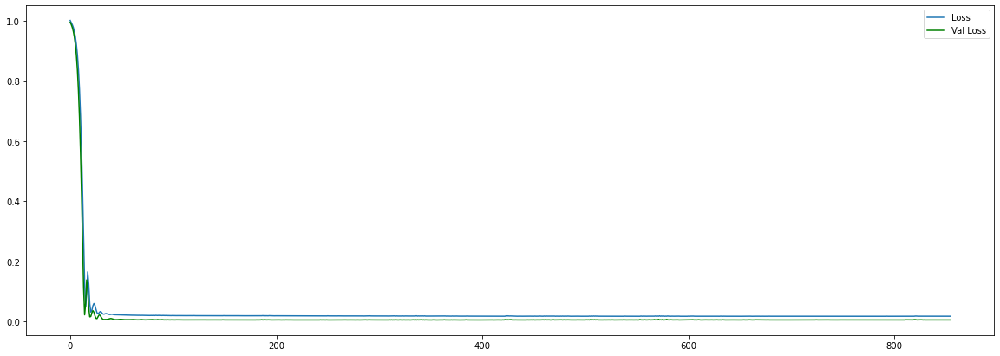

final loss: 0.016936808824539185
final val_loss: 0.0046538556925952435
Get best hyperparameter for simple GRU


INFO:tensorflow:Oracle triggered exit
Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 1, 5)]            0         
_________________________________________________________________
gru (GRU)                    (None, 128)               51840     
_________________________________________________________________
dense (Dense)                (None, 40)                5160      
_________________________________________________________________
dropout (Dropout)            (None, 40)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 41        
Total params: 57,041
Trainable params: 57,041
Non-trainable params: 0
_________________________________________________________________
Start training simple GRU
Epoch 1/2500
2/2 [==============================] - ETA: 1s


Epoch 00031: val_loss did not improve from 0.00485
Epoch 32/2500
2/2 [==============================] - ETA: 0s - loss: 0.0329 - mae: 0.133 - 0s 19ms/step - loss: 0.0324 - mae: 0.1334 - val_loss: 0.0059 - val_mae: 0.0571

Epoch 00032: val_loss did not improve from 0.00485
Epoch 33/2500
2/2 [==============================] - ETA: 0s - loss: 0.0292 - mae: 0.128 - 0s 18ms/step - loss: 0.0296 - mae: 0.1289 - val_loss: 0.0055 - val_mae: 0.0535

Epoch 00033: val_loss did not improve from 0.00485
Epoch 34/2500
2/2 [==============================] - ETA: 0s - loss: 0.0281 - mae: 0.126 - 0s 20ms/step - loss: 0.0282 - mae: 0.1263 - val_loss: 0.0051 - val_mae: 0.0496

Epoch 00034: val_loss did not improve from 0.00485
Epoch 35/2500
2/2 [==============================] - ETA: 0s - loss: 0.0281 - mae: 0.125 - 0s 18ms/step - loss: 0.0279 - mae: 0.1251 - val_loss: 0.0048 - val_mae: 0.0471

Epoch 00035: val_loss improved from 0.00485 to 0.00483, saving model to PNJ_1H_GRU.hdf5
Epoch 36/2500
2/2 [====


Epoch 00067: val_loss did not improve from 0.00465
Epoch 68/2500
2/2 [==============================] - ETA: 0s - loss: 0.0269 - mae: 0.121 - 0s 18ms/step - loss: 0.0268 - mae: 0.1216 - val_loss: 0.0048 - val_mae: 0.0465

Epoch 00068: val_loss did not improve from 0.00465
Epoch 69/2500
2/2 [==============================] - ETA: 0s - loss: 0.0252 - mae: 0.120 - 0s 18ms/step - loss: 0.0255 - mae: 0.1204 - val_loss: 0.0047 - val_mae: 0.0461

Epoch 00069: val_loss did not improve from 0.00465
Epoch 70/2500
2/2 [==============================] - ETA: 0s - loss: 0.0250 - mae: 0.118 - 0s 18ms/step - loss: 0.0253 - mae: 0.1188 - val_loss: 0.0046 - val_mae: 0.0457

Epoch 00070: val_loss improved from 0.00465 to 0.00464, saving model to PNJ_1H_GRU.hdf5
Epoch 71/2500
2/2 [==============================] - ETA: 0s - loss: 0.0255 - mae: 0.118 - 0s 19ms/step - loss: 0.0257 - mae: 0.1191 - val_loss: 0.0046 - val_mae: 0.0457

Epoch 00071: val_loss improved from 0.00464 to 0.00462, saving model to PN

Epoch 00103: val_loss did not improve from 0.00458
Epoch 104/2500
2/2 [==============================] - ETA: 0s - loss: 0.0251 - mae: 0.117 - 0s 20ms/step - loss: 0.0255 - mae: 0.1177 - val_loss: 0.0046 - val_mae: 0.0452

Epoch 00104: val_loss did not improve from 0.00458
Epoch 105/2500
2/2 [==============================] - ETA: 0s - loss: 0.0273 - mae: 0.122 - 0s 20ms/step - loss: 0.0271 - mae: 0.1217 - val_loss: 0.0048 - val_mae: 0.0465

Epoch 00105: val_loss did not improve from 0.00458
Epoch 106/2500
2/2 [==============================] - ETA: 0s - loss: 0.0261 - mae: 0.118 - 0s 18ms/step - loss: 0.0258 - mae: 0.1176 - val_loss: 0.0050 - val_mae: 0.0479

Epoch 00106: val_loss did not improve from 0.00458
Epoch 107/2500
2/2 [==============================] - ETA: 0s - loss: 0.0261 - mae: 0.121 - 0s 21ms/step - loss: 0.0259 - mae: 0.1207 - val_loss: 0.0050 - val_mae: 0.0481

Epoch 00107: val_loss did not improve from 0.00458
Epoch 108/2500
2/2 [==============================] - ETA


Epoch 00140: val_loss did not improve from 0.00458
Epoch 141/2500
2/2 [==============================] - ETA: 0s - loss: 0.0259 - mae: 0.119 - 0s 22ms/step - loss: 0.0261 - mae: 0.1196 - val_loss: 0.0050 - val_mae: 0.0486

Epoch 00141: val_loss did not improve from 0.00458
Epoch 142/2500
2/2 [==============================] - ETA: 0s - loss: 0.0237 - mae: 0.117 - 0s 18ms/step - loss: 0.0234 - mae: 0.1167 - val_loss: 0.0050 - val_mae: 0.0487

Epoch 00142: val_loss did not improve from 0.00458
Epoch 143/2500
2/2 [==============================] - ETA: 0s - loss: 0.0264 - mae: 0.120 - 0s 19ms/step - loss: 0.0261 - mae: 0.1201 - val_loss: 0.0048 - val_mae: 0.0470

Epoch 00143: val_loss did not improve from 0.00458
Epoch 144/2500
2/2 [==============================] - ETA: 0s - loss: 0.0250 - mae: 0.120 - 0s 19ms/step - loss: 0.0251 - mae: 0.1199 - val_loss: 0.0047 - val_mae: 0.0464

Epoch 00144: val_loss did not improve from 0.00458
Epoch 145/2500
2/2 [==============================] - ET


Epoch 00176: val_loss did not improve from 0.00451
Epoch 177/2500
2/2 [==============================] - ETA: 0s - loss: 0.0247 - mae: 0.117 - 0s 19ms/step - loss: 0.0247 - mae: 0.1172 - val_loss: 0.0047 - val_mae: 0.0465

Epoch 00177: val_loss did not improve from 0.00451
Epoch 178/2500
2/2 [==============================] - ETA: 0s - loss: 0.0264 - mae: 0.120 - 0s 18ms/step - loss: 0.0262 - mae: 0.1200 - val_loss: 0.0047 - val_mae: 0.0464

Epoch 00178: val_loss did not improve from 0.00451
Epoch 179/2500
2/2 [==============================] - ETA: 0s - loss: 0.0245 - mae: 0.117 - 0s 20ms/step - loss: 0.0246 - mae: 0.1172 - val_loss: 0.0046 - val_mae: 0.0455

Epoch 00179: val_loss did not improve from 0.00451
Epoch 180/2500
2/2 [==============================] - ETA: 0s - loss: 0.0240 - mae: 0.115 - 0s 18ms/step - loss: 0.0240 - mae: 0.1155 - val_loss: 0.0045 - val_mae: 0.0450

Epoch 00180: val_loss did not improve from 0.00451
Epoch 181/2500
2/2 [==============================] - ET

2/2 [==============================] - ETA: 0s - loss: 0.0241 - mae: 0.115 - 0s 20ms/step - loss: 0.0240 - mae: 0.1157 - val_loss: 0.0046 - val_mae: 0.0442

Epoch 00213: val_loss did not improve from 0.00448
Epoch 214/2500
2/2 [==============================] - ETA: 0s - loss: 0.0249 - mae: 0.115 - 0s 21ms/step - loss: 0.0246 - mae: 0.1150 - val_loss: 0.0046 - val_mae: 0.0445

Epoch 00214: val_loss did not improve from 0.00448
Epoch 215/2500
2/2 [==============================] - ETA: 0s - loss: 0.0252 - mae: 0.115 - 0s 22ms/step - loss: 0.0251 - mae: 0.1156 - val_loss: 0.0045 - val_mae: 0.0447

Epoch 00215: val_loss did not improve from 0.00448
Epoch 216/2500
2/2 [==============================] - ETA: 0s - loss: 0.0240 - mae: 0.115 - 0s 24ms/step - loss: 0.0241 - mae: 0.1155 - val_loss: 0.0046 - val_mae: 0.0454

Epoch 00216: val_loss did not improve from 0.00448
Epoch 217/2500
2/2 [==============================] - ETA: 0s - loss: 0.0236 - mae: 0.114 - 0s 26ms/step - loss: 0.0239 - m

Epoch 00249: val_loss did not improve from 0.00448
Epoch 250/2500
2/2 [==============================] - ETA: 0s - loss: 0.0250 - mae: 0.115 - 0s 21ms/step - loss: 0.0248 - mae: 0.1159 - val_loss: 0.0045 - val_mae: 0.0440

Epoch 00250: val_loss did not improve from 0.00448
Epoch 251/2500
2/2 [==============================] - ETA: 0s - loss: 0.0227 - mae: 0.112 - 0s 19ms/step - loss: 0.0231 - mae: 0.1128 - val_loss: 0.0047 - val_mae: 0.0460

Epoch 00251: val_loss did not improve from 0.00448
Epoch 252/2500
2/2 [==============================] - ETA: 0s - loss: 0.0247 - mae: 0.117 - 0s 18ms/step - loss: 0.0246 - mae: 0.1178 - val_loss: 0.0049 - val_mae: 0.0488

Epoch 00252: val_loss did not improve from 0.00448
Epoch 253/2500
2/2 [==============================] - ETA: 0s - loss: 0.0242 - mae: 0.117 - 0s 19ms/step - loss: 0.0241 - mae: 0.1169 - val_loss: 0.0049 - val_mae: 0.0482

Epoch 00253: val_loss did not improve from 0.00448
Epoch 254/2500
2/2 [==============================] - ETA

2/2 [==============================] - ETA: 0s - loss: 0.0245 - mae: 0.116 - 0s 22ms/step - loss: 0.0246 - mae: 0.1170 - val_loss: 0.0047 - val_mae: 0.0466

Epoch 00286: val_loss did not improve from 0.00447
Epoch 287/2500
2/2 [==============================] - ETA: 0s - loss: 0.0239 - mae: 0.114 - 0s 23ms/step - loss: 0.0239 - mae: 0.1148 - val_loss: 0.0045 - val_mae: 0.0443

Epoch 00287: val_loss did not improve from 0.00447
Epoch 288/2500
2/2 [==============================] - ETA: 0s - loss: 0.0231 - mae: 0.113 - 0s 21ms/step - loss: 0.0232 - mae: 0.1135 - val_loss: 0.0047 - val_mae: 0.0447

Epoch 00288: val_loss did not improve from 0.00447
Epoch 289/2500
2/2 [==============================] - ETA: 0s - loss: 0.0242 - mae: 0.114 - 0s 22ms/step - loss: 0.0243 - mae: 0.1146 - val_loss: 0.0046 - val_mae: 0.0440

Epoch 00289: val_loss did not improve from 0.00447
Epoch 290/2500
2/2 [==============================] - ETA: 0s - loss: 0.0234 - mae: 0.112 - 0s 23ms/step - loss: 0.0234 - m

Epoch 00322: val_loss did not improve from 0.00447
Epoch 323/2500
2/2 [==============================] - ETA: 0s - loss: 0.0221 - mae: 0.111 - 0s 18ms/step - loss: 0.0222 - mae: 0.1118 - val_loss: 0.0045 - val_mae: 0.0438

Epoch 00323: val_loss did not improve from 0.00447
Epoch 324/2500
2/2 [==============================] - ETA: 0s - loss: 0.0244 - mae: 0.116 - 0s 18ms/step - loss: 0.0239 - mae: 0.1158 - val_loss: 0.0046 - val_mae: 0.0439

Epoch 00324: val_loss did not improve from 0.00447
Epoch 325/2500
2/2 [==============================] - ETA: 0s - loss: 0.0234 - mae: 0.112 - 0s 19ms/step - loss: 0.0232 - mae: 0.1129 - val_loss: 0.0048 - val_mae: 0.0460

Epoch 00325: val_loss did not improve from 0.00447
Epoch 326/2500
2/2 [==============================] - ETA: 0s - loss: 0.0243 - mae: 0.118 - 0s 21ms/step - loss: 0.0240 - mae: 0.1177 - val_loss: 0.0048 - val_mae: 0.0459

Epoch 00326: val_loss did not improve from 0.00447
Epoch 327/2500
2/2 [==============================] - ETA

2/2 [==============================] - ETA: 0s - loss: 0.0235 - mae: 0.115 - 0s 18ms/step - loss: 0.0234 - mae: 0.1152 - val_loss: 0.0047 - val_mae: 0.0452

Epoch 00359: val_loss did not improve from 0.00447
Epoch 360/2500
2/2 [==============================] - ETA: 0s - loss: 0.0242 - mae: 0.115 - 0s 19ms/step - loss: 0.0240 - mae: 0.1155 - val_loss: 0.0046 - val_mae: 0.0447

Epoch 00360: val_loss did not improve from 0.00447
Epoch 361/2500
2/2 [==============================] - ETA: 0s - loss: 0.0233 - mae: 0.114 - 0s 19ms/step - loss: 0.0230 - mae: 0.1136 - val_loss: 0.0046 - val_mae: 0.0451

Epoch 00361: val_loss did not improve from 0.00447
Epoch 362/2500
2/2 [==============================] - ETA: 0s - loss: 0.0230 - mae: 0.113 - 0s 20ms/step - loss: 0.0230 - mae: 0.1139 - val_loss: 0.0046 - val_mae: 0.0453

Epoch 00362: val_loss did not improve from 0.00447
Epoch 363/2500
2/2 [==============================] - ETA: 0s - loss: 0.0231 - mae: 0.115 - 0s 20ms/step - loss: 0.0230 - m

Epoch 00395: val_loss did not improve from 0.00447
Epoch 396/2500
2/2 [==============================] - ETA: 0s - loss: 0.0230 - mae: 0.113 - 0s 33ms/step - loss: 0.0229 - mae: 0.1142 - val_loss: 0.0045 - val_mae: 0.0437

Epoch 00396: val_loss did not improve from 0.00447
Epoch 397/2500
2/2 [==============================] - ETA: 0s - loss: 0.0239 - mae: 0.113 - 0s 22ms/step - loss: 0.0241 - mae: 0.1144 - val_loss: 0.0045 - val_mae: 0.0435

Epoch 00397: val_loss did not improve from 0.00447
Epoch 398/2500
2/2 [==============================] - ETA: 0s - loss: 0.0244 - mae: 0.115 - 0s 22ms/step - loss: 0.0242 - mae: 0.1149 - val_loss: 0.0046 - val_mae: 0.0441

Epoch 00398: val_loss did not improve from 0.00447
Epoch 399/2500
2/2 [==============================] - ETA: 0s - loss: 0.0247 - mae: 0.116 - 0s 18ms/step - loss: 0.0244 - mae: 0.1161 - val_loss: 0.0048 - val_mae: 0.0469

Epoch 00399: val_loss did not improve from 0.00447
Epoch 400/2500
2/2 [==============================] - ETA

2/2 [==============================] - ETA: 0s - loss: 0.0234 - mae: 0.114 - 0s 18ms/step - loss: 0.0230 - mae: 0.1129 - val_loss: 0.0045 - val_mae: 0.0433

Epoch 00432: val_loss did not improve from 0.00447
Epoch 433/2500
2/2 [==============================] - ETA: 0s - loss: 0.0223 - mae: 0.111 - 0s 18ms/step - loss: 0.0228 - mae: 0.1127 - val_loss: 0.0048 - val_mae: 0.0451

Epoch 00433: val_loss did not improve from 0.00447
Epoch 434/2500
2/2 [==============================] - ETA: 0s - loss: 0.0229 - mae: 0.113 - 0s 19ms/step - loss: 0.0233 - mae: 0.1149 - val_loss: 0.0051 - val_mae: 0.0483

Epoch 00434: val_loss did not improve from 0.00447
Epoch 435/2500
2/2 [==============================] - ETA: 0s - loss: 0.0230 - mae: 0.114 - 0s 25ms/step - loss: 0.0233 - mae: 0.1148 - val_loss: 0.0052 - val_mae: 0.0492

Epoch 00435: val_loss did not improve from 0.00447
Epoch 436/2500
2/2 [==============================] - ETA: 0s - loss: 0.0239 - mae: 0.116 - 0s 22ms/step - loss: 0.0240 - m

Epoch 00468: val_loss did not improve from 0.00447
Epoch 469/2500
2/2 [==============================] - ETA: 0s - loss: 0.0237 - mae: 0.115 - 0s 18ms/step - loss: 0.0236 - mae: 0.1151 - val_loss: 0.0047 - val_mae: 0.0459

Epoch 00469: val_loss did not improve from 0.00447
Epoch 470/2500
2/2 [==============================] - ETA: 0s - loss: 0.0230 - mae: 0.113 - 0s 19ms/step - loss: 0.0231 - mae: 0.1143 - val_loss: 0.0047 - val_mae: 0.0465

Epoch 00470: val_loss did not improve from 0.00447
Epoch 471/2500
2/2 [==============================] - ETA: 0s - loss: 0.0237 - mae: 0.115 - 0s 18ms/step - loss: 0.0237 - mae: 0.1160 - val_loss: 0.0047 - val_mae: 0.0456

Epoch 00471: val_loss did not improve from 0.00447
Epoch 472/2500
2/2 [==============================] - ETA: 0s - loss: 0.0240 - mae: 0.116 - 0s 18ms/step - loss: 0.0237 - mae: 0.1157 - val_loss: 0.0046 - val_mae: 0.0447

Epoch 00472: val_loss did not improve from 0.00447
Epoch 473/2500
2/2 [==============================] - ETA


Epoch 00505: val_loss did not improve from 0.00447
Epoch 506/2500
2/2 [==============================] - ETA: 0s - loss: 0.0229 - mae: 0.113 - 0s 18ms/step - loss: 0.0228 - mae: 0.1135 - val_loss: 0.0047 - val_mae: 0.0452

Epoch 00506: val_loss did not improve from 0.00447
Epoch 507/2500
2/2 [==============================] - ETA: 0s - loss: 0.0226 - mae: 0.114 - 0s 18ms/step - loss: 0.0228 - mae: 0.1146 - val_loss: 0.0047 - val_mae: 0.0464

Epoch 00507: val_loss did not improve from 0.00447
Epoch 508/2500
2/2 [==============================] - ETA: 0s - loss: 0.0241 - mae: 0.118 - 0s 19ms/step - loss: 0.0238 - mae: 0.1171 - val_loss: 0.0047 - val_mae: 0.0463

Epoch 00508: val_loss did not improve from 0.00447
Epoch 509/2500
2/2 [==============================] - ETA: 0s - loss: 0.0227 - mae: 0.113 - 0s 18ms/step - loss: 0.0227 - mae: 0.1138 - val_loss: 0.0046 - val_mae: 0.0453

Epoch 00509: val_loss did not improve from 0.00447
Epoch 510/2500
2/2 [==============================] - ET


Epoch 00542: val_loss did not improve from 0.00447
Epoch 543/2500
2/2 [==============================] - ETA: 0s - loss: 0.0237 - mae: 0.113 - 0s 18ms/step - loss: 0.0236 - mae: 0.1135 - val_loss: 0.0046 - val_mae: 0.0460

Epoch 00543: val_loss did not improve from 0.00447
Epoch 544/2500
2/2 [==============================] - ETA: 0s - loss: 0.0250 - mae: 0.118 - 0s 18ms/step - loss: 0.0248 - mae: 0.1173 - val_loss: 0.0046 - val_mae: 0.0453

Epoch 00544: val_loss did not improve from 0.00447
Epoch 545/2500
2/2 [==============================] - ETA: 0s - loss: 0.0232 - mae: 0.114 - 0s 18ms/step - loss: 0.0230 - mae: 0.1138 - val_loss: 0.0046 - val_mae: 0.0459

Epoch 00545: val_loss did not improve from 0.00447
Epoch 546/2500
2/2 [==============================] - ETA: 0s - loss: 0.0237 - mae: 0.115 - 0s 18ms/step - loss: 0.0236 - mae: 0.1160 - val_loss: 0.0048 - val_mae: 0.0472

Epoch 00546: val_loss did not improve from 0.00447
Epoch 547/2500
2/2 [==============================] - ET


Epoch 00579: val_loss did not improve from 0.00447
Epoch 580/2500
2/2 [==============================] - ETA: 0s - loss: 0.0248 - mae: 0.117 - 0s 18ms/step - loss: 0.0244 - mae: 0.1168 - val_loss: 0.0047 - val_mae: 0.0449

Epoch 00580: val_loss did not improve from 0.00447
Epoch 581/2500
2/2 [==============================] - ETA: 0s - loss: 0.0242 - mae: 0.115 - 0s 18ms/step - loss: 0.0241 - mae: 0.1149 - val_loss: 0.0046 - val_mae: 0.0445

Epoch 00581: val_loss did not improve from 0.00447
Epoch 582/2500
2/2 [==============================] - ETA: 0s - loss: 0.0229 - mae: 0.112 - 0s 18ms/step - loss: 0.0231 - mae: 0.1129 - val_loss: 0.0047 - val_mae: 0.0448

Epoch 00582: val_loss did not improve from 0.00447
Epoch 583/2500
2/2 [==============================] - ETA: 0s - loss: 0.0232 - mae: 0.112 - 0s 18ms/step - loss: 0.0231 - mae: 0.1118 - val_loss: 0.0047 - val_mae: 0.0453

Epoch 00583: val_loss did not improve from 0.00447
Epoch 584/2500
2/2 [==============================] - ET


Epoch 00616: val_loss did not improve from 0.00447
Epoch 617/2500
2/2 [==============================] - ETA: 0s - loss: 0.0228 - mae: 0.111 - 0s 18ms/step - loss: 0.0229 - mae: 0.1118 - val_loss: 0.0046 - val_mae: 0.0439

Epoch 00617: val_loss did not improve from 0.00447
Epoch 618/2500
2/2 [==============================] - ETA: 0s - loss: 0.0239 - mae: 0.114 - 0s 18ms/step - loss: 0.0238 - mae: 0.1140 - val_loss: 0.0046 - val_mae: 0.0442

Epoch 00618: val_loss did not improve from 0.00447
Epoch 619/2500
2/2 [==============================] - ETA: 0s - loss: 0.0233 - mae: 0.113 - 0s 18ms/step - loss: 0.0233 - mae: 0.1139 - val_loss: 0.0048 - val_mae: 0.0454

Epoch 00619: val_loss did not improve from 0.00447
Epoch 620/2500
2/2 [==============================] - ETA: 0s - loss: 0.0247 - mae: 0.116 - 0s 19ms/step - loss: 0.0245 - mae: 0.1158 - val_loss: 0.0051 - val_mae: 0.0475

Epoch 00620: val_loss did not improve from 0.00447
Epoch 621/2500
2/2 [==============================] - ET


Epoch 00653: val_loss did not improve from 0.00447
Epoch 654/2500
2/2 [==============================] - ETA: 0s - loss: 0.0229 - mae: 0.111 - 0s 18ms/step - loss: 0.0228 - mae: 0.1119 - val_loss: 0.0047 - val_mae: 0.0449

Epoch 00654: val_loss did not improve from 0.00447
Epoch 655/2500
2/2 [==============================] - ETA: 0s - loss: 0.0230 - mae: 0.113 - 0s 19ms/step - loss: 0.0230 - mae: 0.1130 - val_loss: 0.0049 - val_mae: 0.0461

Epoch 00655: val_loss did not improve from 0.00447
Epoch 656/2500
2/2 [==============================] - ETA: 0s - loss: 0.0247 - mae: 0.117 - 0s 18ms/step - loss: 0.0243 - mae: 0.1166 - val_loss: 0.0050 - val_mae: 0.0466

Epoch 00656: val_loss did not improve from 0.00447
Epoch 657/2500
2/2 [==============================] - ETA: 0s - loss: 0.0236 - mae: 0.114 - 0s 18ms/step - loss: 0.0235 - mae: 0.1141 - val_loss: 0.0047 - val_mae: 0.0451

Epoch 00657: val_loss did not improve from 0.00447
Epoch 658/2500
2/2 [==============================] - ET

2/2 [==============================] - ETA: 0s - loss: 0.0217 - mae: 0.110 - 0s 18ms/step - loss: 0.0223 - mae: 0.1114 - val_loss: 0.0048 - val_mae: 0.0453

Epoch 00690: val_loss did not improve from 0.00447
Epoch 691/2500
2/2 [==============================] - ETA: 0s - loss: 0.0223 - mae: 0.111 - 0s 17ms/step - loss: 0.0225 - mae: 0.1119 - val_loss: 0.0047 - val_mae: 0.0454

Epoch 00691: val_loss did not improve from 0.00447
Epoch 692/2500
2/2 [==============================] - ETA: 0s - loss: 0.0237 - mae: 0.115 - 0s 18ms/step - loss: 0.0237 - mae: 0.1149 - val_loss: 0.0047 - val_mae: 0.0450

Epoch 00692: val_loss did not improve from 0.00447
Epoch 693/2500
2/2 [==============================] - ETA: 0s - loss: 0.0231 - mae: 0.113 - 0s 17ms/step - loss: 0.0231 - mae: 0.1133 - val_loss: 0.0046 - val_mae: 0.0448

Epoch 00693: val_loss did not improve from 0.00447
Epoch 694/2500
2/2 [==============================] - ETA: 0s - loss: 0.0239 - mae: 0.115 - 0s 19ms/step - loss: 0.0236 - m

Epoch 00726: val_loss did not improve from 0.00447
Epoch 727/2500
2/2 [==============================] - ETA: 0s - loss: 0.0248 - mae: 0.116 - 0s 18ms/step - loss: 0.0244 - mae: 0.1155 - val_loss: 0.0046 - val_mae: 0.0435

Epoch 00727: val_loss did not improve from 0.00447
Epoch 728/2500
2/2 [==============================] - ETA: 0s - loss: 0.0222 - mae: 0.110 - 0s 17ms/step - loss: 0.0226 - mae: 0.1109 - val_loss: 0.0046 - val_mae: 0.0435

Epoch 00728: val_loss did not improve from 0.00447
Epoch 729/2500
2/2 [==============================] - ETA: 0s - loss: 0.0245 - mae: 0.116 - 0s 18ms/step - loss: 0.0241 - mae: 0.1150 - val_loss: 0.0046 - val_mae: 0.0438

Epoch 00729: val_loss did not improve from 0.00447
Epoch 730/2500
2/2 [==============================] - ETA: 0s - loss: 0.0231 - mae: 0.111 - 0s 18ms/step - loss: 0.0230 - mae: 0.1115 - val_loss: 0.0047 - val_mae: 0.0444

Epoch 00730: val_loss did not improve from 0.00447
Epoch 731/2500
2/2 [==============================] - ETA


Epoch 00763: val_loss did not improve from 0.00447
Epoch 764/2500
2/2 [==============================] - ETA: 0s - loss: 0.0231 - mae: 0.113 - 0s 19ms/step - loss: 0.0235 - mae: 0.1139 - val_loss: 0.0046 - val_mae: 0.0440

Epoch 00764: val_loss did not improve from 0.00447
Epoch 765/2500
2/2 [==============================] - ETA: 0s - loss: 0.0240 - mae: 0.114 - 0s 18ms/step - loss: 0.0237 - mae: 0.1142 - val_loss: 0.0046 - val_mae: 0.0444

Epoch 00765: val_loss did not improve from 0.00447
Epoch 766/2500
2/2 [==============================] - ETA: 0s - loss: 0.0229 - mae: 0.113 - 0s 19ms/step - loss: 0.0229 - mae: 0.1140 - val_loss: 0.0046 - val_mae: 0.0445

Epoch 00766: val_loss did not improve from 0.00447
Epoch 767/2500
2/2 [==============================] - ETA: 0s - loss: 0.0224 - mae: 0.111 - 0s 19ms/step - loss: 0.0227 - mae: 0.1123 - val_loss: 0.0046 - val_mae: 0.0445

Epoch 00767: val_loss did not improve from 0.00447
Epoch 768/2500
2/2 [==============================] - ET


Epoch 00800: val_loss did not improve from 0.00447
Epoch 801/2500
2/2 [==============================] - ETA: 0s - loss: 0.0235 - mae: 0.114 - 0s 18ms/step - loss: 0.0234 - mae: 0.1141 - val_loss: 0.0047 - val_mae: 0.0453

Epoch 00801: val_loss did not improve from 0.00447
Epoch 802/2500
2/2 [==============================] - ETA: 0s - loss: 0.0233 - mae: 0.113 - 0s 19ms/step - loss: 0.0230 - mae: 0.1126 - val_loss: 0.0047 - val_mae: 0.0456

Epoch 00802: val_loss did not improve from 0.00447
Epoch 803/2500
2/2 [==============================] - ETA: 0s - loss: 0.0220 - mae: 0.111 - 0s 18ms/step - loss: 0.0222 - mae: 0.1117 - val_loss: 0.0046 - val_mae: 0.0455

Epoch 00803: val_loss did not improve from 0.00447
Epoch 804/2500
2/2 [==============================] - ETA: 0s - loss: 0.0228 - mae: 0.113 - 0s 18ms/step - loss: 0.0227 - mae: 0.1129 - val_loss: 0.0047 - val_mae: 0.0457

Epoch 00804: val_loss did not improve from 0.00447
Epoch 805/2500
2/2 [==============================] - ET

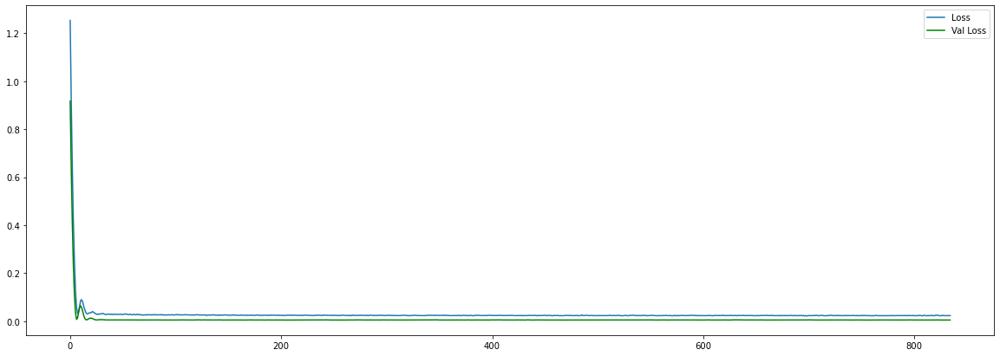

final loss: 0.023383045569062233
final val_loss: 0.004620188381522894


In [ ]:
build_and_train_all_model(PNJ_data_processor, PNJ_predictor)

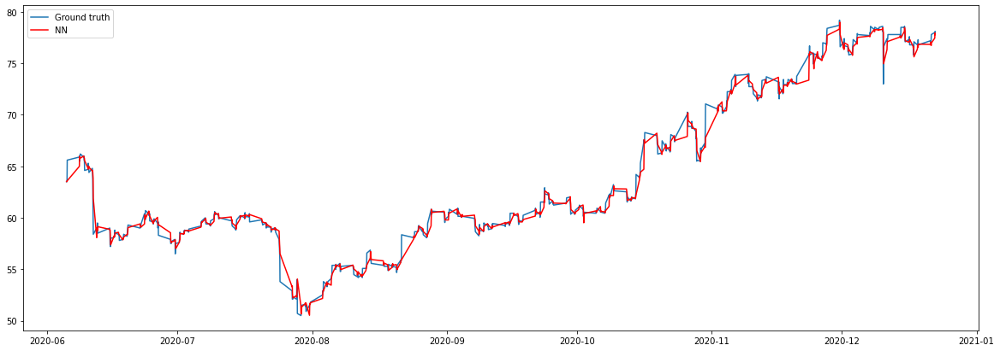

Simple NN
MSE:  0.36378833651542664
MAE:  0.3740097


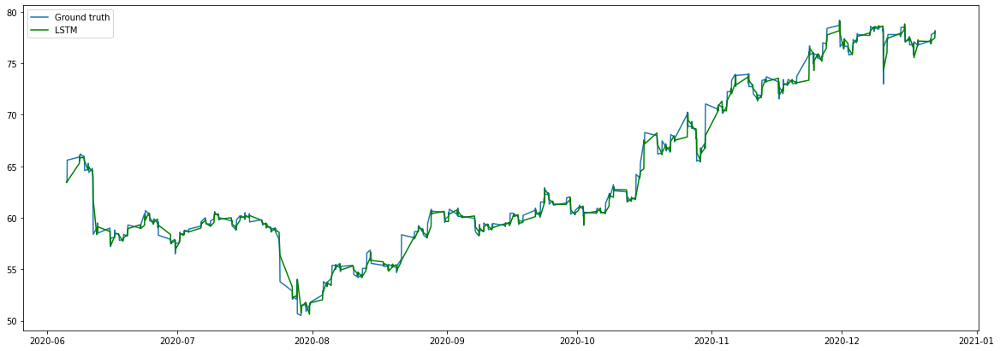

Simple LSTM
MSE:  0.36107972264289856
MAE:  0.36764374


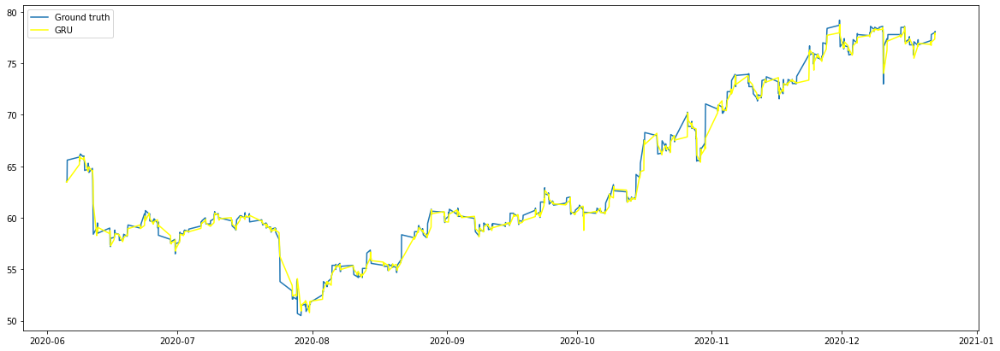

Simple GRU
MSE:  0.36193913221359253
MAE:  0.3715079


In [ ]:
evaluate_all_model(PNJ_data_processor, PNJ_predictor)

### VIC

In [ ]:
VIC_data_processor = DataProcessor('VIC', VIC, '1H')
VIC_predictor = StockPredictor(VIC_data_processor.stock_name, VIC_data_processor.timeDelta)

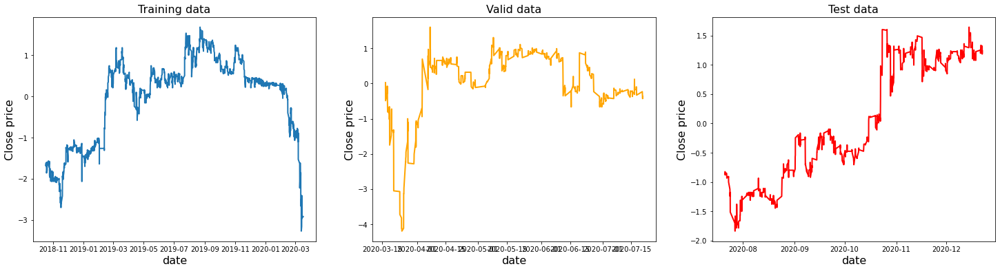

In [ ]:
VIC_data_processor.visualize_train_val_test_df()

Get best hyperparameter for simple NN


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


INFO:tensorflow:Oracle triggered exit
Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 1, 5)]            0         
_________________________________________________________________
flatten (Flatten)            (None, 5)                 0         
_________________________________________________________________
dense (Dense)                (None, 80)                480       
_________________________________________________________________
dropout (Dropout)            (None, 80)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 81        
Total params: 561
Trainable params: 561
Non-trainable params: 0
_________________________________________________________________
Start training simple NN
Epoch 1/2500
1/1 [==============================] - ETA: 0s - loss


Epoch 00030: val_loss did not improve from 0.08086
Epoch 31/2500
1/1 [==============================] - ETA: 0s - loss: 0.0988 - mae: 0.210 - 0s 18ms/step - loss: 0.0988 - mae: 0.2107 - val_loss: 0.0876 - val_mae: 0.1824

Epoch 00031: val_loss did not improve from 0.08086
Epoch 32/2500
1/1 [==============================] - ETA: 0s - loss: 0.0840 - mae: 0.206 - 0s 17ms/step - loss: 0.0840 - mae: 0.2061 - val_loss: 0.0842 - val_mae: 0.1768

Epoch 00032: val_loss did not improve from 0.08086
Epoch 33/2500
1/1 [==============================] - ETA: 0s - loss: 0.0931 - mae: 0.214 - 0s 19ms/step - loss: 0.0931 - mae: 0.2141 - val_loss: 0.0811 - val_mae: 0.1707

Epoch 00033: val_loss did not improve from 0.08086
Epoch 34/2500
1/1 [==============================] - ETA: 0s - loss: 0.0728 - mae: 0.195 - 0s 20ms/step - loss: 0.0728 - mae: 0.1958 - val_loss: 0.0782 - val_mae: 0.1656

Epoch 00034: val_loss improved from 0.08086 to 0.07825, saving model to VIC_1H_NN.hdf5
Epoch 35/2500
1/1 [=====

Epoch 66/2500
1/1 [==============================] - ETA: 0s - loss: 0.0719 - mae: 0.178 - 0s 18ms/step - loss: 0.0719 - mae: 0.1789 - val_loss: 0.0701 - val_mae: 0.1604

Epoch 00066: val_loss did not improve from 0.06842
Epoch 67/2500
1/1 [==============================] - ETA: 0s - loss: 0.0640 - mae: 0.176 - 0s 19ms/step - loss: 0.0640 - mae: 0.1765 - val_loss: 0.0699 - val_mae: 0.1601

Epoch 00067: val_loss did not improve from 0.06842
Epoch 68/2500
1/1 [==============================] - ETA: 0s - loss: 0.0646 - mae: 0.181 - 0s 19ms/step - loss: 0.0646 - mae: 0.1816 - val_loss: 0.0696 - val_mae: 0.1600

Epoch 00068: val_loss did not improve from 0.06842
Epoch 69/2500
1/1 [==============================] - ETA: 0s - loss: 0.0673 - mae: 0.178 - 0s 19ms/step - loss: 0.0673 - mae: 0.1785 - val_loss: 0.0693 - val_mae: 0.1596

Epoch 00069: val_loss did not improve from 0.06842
Epoch 70/2500
1/1 [==============================] - ETA: 0s - loss: 0.0600 - mae: 0.174 - 0s 20ms/step - loss: 

Epoch 00099: val_loss did not improve from 0.06723
Epoch 100/2500
1/1 [==============================] - ETA: 0s - loss: 0.0585 - mae: 0.169 - 0s 19ms/step - loss: 0.0585 - mae: 0.1698 - val_loss: 0.0673 - val_mae: 0.1536

Epoch 00100: val_loss did not improve from 0.06723
Epoch 101/2500
1/1 [==============================] - ETA: 0s - loss: 0.0609 - mae: 0.171 - 0s 17ms/step - loss: 0.0609 - mae: 0.1716 - val_loss: 0.0673 - val_mae: 0.1537

Epoch 00101: val_loss did not improve from 0.06723
Epoch 102/2500
1/1 [==============================] - ETA: 0s - loss: 0.0595 - mae: 0.171 - 0s 18ms/step - loss: 0.0595 - mae: 0.1717 - val_loss: 0.0672 - val_mae: 0.1539

Epoch 00102: val_loss improved from 0.06723 to 0.06720, saving model to VIC_1H_NN.hdf5
Epoch 103/2500
1/1 [==============================] - ETA: 0s - loss: 0.0609 - mae: 0.170 - 0s 18ms/step - loss: 0.0609 - mae: 0.1702 - val_loss: 0.0671 - val_mae: 0.1542

Epoch 00103: val_loss improved from 0.06720 to 0.06711, saving model to 

Epoch 00133: val_loss did not improve from 0.06647
Epoch 134/2500
1/1 [==============================] - ETA: 0s - loss: 0.0595 - mae: 0.167 - 0s 18ms/step - loss: 0.0595 - mae: 0.1673 - val_loss: 0.0667 - val_mae: 0.1551

Epoch 00134: val_loss did not improve from 0.06647
Epoch 135/2500
1/1 [==============================] - ETA: 0s - loss: 0.0625 - mae: 0.166 - 0s 18ms/step - loss: 0.0625 - mae: 0.1665 - val_loss: 0.0667 - val_mae: 0.1554

Epoch 00135: val_loss did not improve from 0.06647
Epoch 136/2500
1/1 [==============================] - ETA: 0s - loss: 0.0626 - mae: 0.164 - 0s 17ms/step - loss: 0.0626 - mae: 0.1646 - val_loss: 0.0666 - val_mae: 0.1556

Epoch 00136: val_loss did not improve from 0.06647
Epoch 137/2500
1/1 [==============================] - ETA: 0s - loss: 0.0559 - mae: 0.164 - 0s 18ms/step - loss: 0.0559 - mae: 0.1647 - val_loss: 0.0665 - val_mae: 0.1555

Epoch 00137: val_loss did not improve from 0.06647
Epoch 138/2500
1/1 [==============================] - ETA


Epoch 00166: val_loss improved from 0.06562 to 0.06559, saving model to VIC_1H_NN.hdf5
Epoch 167/2500
1/1 [==============================] - ETA: 0s - loss: 0.0529 - mae: 0.157 - 0s 19ms/step - loss: 0.0529 - mae: 0.1577 - val_loss: 0.0655 - val_mae: 0.1526

Epoch 00167: val_loss improved from 0.06559 to 0.06553, saving model to VIC_1H_NN.hdf5
Epoch 168/2500
1/1 [==============================] - ETA: 0s - loss: 0.0547 - mae: 0.161 - 0s 18ms/step - loss: 0.0547 - mae: 0.1612 - val_loss: 0.0655 - val_mae: 0.1523

Epoch 00168: val_loss improved from 0.06553 to 0.06549, saving model to VIC_1H_NN.hdf5
Epoch 169/2500
1/1 [==============================] - ETA: 0s - loss: 0.0486 - mae: 0.156 - 0s 18ms/step - loss: 0.0486 - mae: 0.1563 - val_loss: 0.0654 - val_mae: 0.1522

Epoch 00169: val_loss improved from 0.06549 to 0.06545, saving model to VIC_1H_NN.hdf5
Epoch 170/2500
1/1 [==============================] - ETA: 0s - loss: 0.0535 - mae: 0.160 - 0s 19ms/step - loss: 0.0535 - mae: 0.1605 -


Epoch 00200: val_loss improved from 0.06499 to 0.06490, saving model to VIC_1H_NN.hdf5
Epoch 201/2500
1/1 [==============================] - ETA: 0s - loss: 0.0497 - mae: 0.158 - 0s 18ms/step - loss: 0.0497 - mae: 0.1584 - val_loss: 0.0648 - val_mae: 0.1520

Epoch 00201: val_loss improved from 0.06490 to 0.06481, saving model to VIC_1H_NN.hdf5
Epoch 202/2500
1/1 [==============================] - ETA: 0s - loss: 0.0488 - mae: 0.152 - 0s 19ms/step - loss: 0.0488 - mae: 0.1525 - val_loss: 0.0647 - val_mae: 0.1521

Epoch 00202: val_loss improved from 0.06481 to 0.06474, saving model to VIC_1H_NN.hdf5
Epoch 203/2500
1/1 [==============================] - ETA: 0s - loss: 0.0467 - mae: 0.151 - 0s 19ms/step - loss: 0.0467 - mae: 0.1513 - val_loss: 0.0647 - val_mae: 0.1521

Epoch 00203: val_loss improved from 0.06474 to 0.06469, saving model to VIC_1H_NN.hdf5
Epoch 204/2500
1/1 [==============================] - ETA: 0s - loss: 0.0471 - mae: 0.150 - 0s 18ms/step - loss: 0.0471 - mae: 0.1502 -


Epoch 00232: val_loss did not improve from 0.06387
Epoch 233/2500
1/1 [==============================] - ETA: 0s - loss: 0.0401 - mae: 0.142 - 0s 26ms/step - loss: 0.0401 - mae: 0.1429 - val_loss: 0.0640 - val_mae: 0.1500

Epoch 00233: val_loss did not improve from 0.06387
Epoch 234/2500
1/1 [==============================] - ETA: 0s - loss: 0.0404 - mae: 0.141 - 0s 22ms/step - loss: 0.0404 - mae: 0.1410 - val_loss: 0.0640 - val_mae: 0.1501

Epoch 00234: val_loss did not improve from 0.06387
Epoch 235/2500
1/1 [==============================] - ETA: 0s - loss: 0.0413 - mae: 0.144 - 0s 22ms/step - loss: 0.0413 - mae: 0.1440 - val_loss: 0.0640 - val_mae: 0.1503

Epoch 00235: val_loss did not improve from 0.06387
Epoch 236/2500
1/1 [==============================] - ETA: 0s - loss: 0.0483 - mae: 0.150 - 0s 20ms/step - loss: 0.0483 - mae: 0.1509 - val_loss: 0.0640 - val_mae: 0.1504

Epoch 00236: val_loss did not improve from 0.06387
Epoch 237/2500
1/1 [==============================] - ET


Epoch 00266: val_loss improved from 0.06315 to 0.06311, saving model to VIC_1H_NN.hdf5
Epoch 267/2500
1/1 [==============================] - ETA: 0s - loss: 0.0376 - mae: 0.137 - 0s 18ms/step - loss: 0.0376 - mae: 0.1378 - val_loss: 0.0631 - val_mae: 0.1497

Epoch 00267: val_loss improved from 0.06311 to 0.06305, saving model to VIC_1H_NN.hdf5
Epoch 268/2500
1/1 [==============================] - ETA: 0s - loss: 0.0368 - mae: 0.136 - 0s 18ms/step - loss: 0.0368 - mae: 0.1360 - val_loss: 0.0630 - val_mae: 0.1493

Epoch 00268: val_loss improved from 0.06305 to 0.06299, saving model to VIC_1H_NN.hdf5
Epoch 269/2500
1/1 [==============================] - ETA: 0s - loss: 0.0360 - mae: 0.132 - 0s 18ms/step - loss: 0.0360 - mae: 0.1323 - val_loss: 0.0629 - val_mae: 0.1489

Epoch 00269: val_loss improved from 0.06299 to 0.06294, saving model to VIC_1H_NN.hdf5
Epoch 270/2500
1/1 [==============================] - ETA: 0s - loss: 0.0423 - mae: 0.141 - 0s 18ms/step - loss: 0.0423 - mae: 0.1417 -


Epoch 00301: val_loss did not improve from 0.06254
Epoch 302/2500
1/1 [==============================] - ETA: 0s - loss: 0.0392 - mae: 0.135 - 0s 18ms/step - loss: 0.0392 - mae: 0.1352 - val_loss: 0.0626 - val_mae: 0.1487

Epoch 00302: val_loss did not improve from 0.06254
Epoch 303/2500
1/1 [==============================] - ETA: 0s - loss: 0.0372 - mae: 0.137 - 0s 18ms/step - loss: 0.0372 - mae: 0.1373 - val_loss: 0.0626 - val_mae: 0.1486

Epoch 00303: val_loss did not improve from 0.06254
Epoch 304/2500
1/1 [==============================] - ETA: 0s - loss: 0.0401 - mae: 0.137 - 0s 18ms/step - loss: 0.0401 - mae: 0.1377 - val_loss: 0.0625 - val_mae: 0.1486

Epoch 00304: val_loss improved from 0.06254 to 0.06253, saving model to VIC_1H_NN.hdf5
Epoch 305/2500
1/1 [==============================] - ETA: 0s - loss: 0.0362 - mae: 0.135 - 0s 19ms/step - loss: 0.0362 - mae: 0.1352 - val_loss: 0.0625 - val_mae: 0.1485

Epoch 00305: val_loss improved from 0.06253 to 0.06247, saving model to


Epoch 00335: val_loss improved from 0.06161 to 0.06154, saving model to VIC_1H_NN.hdf5
Epoch 336/2500
1/1 [==============================] - ETA: 0s - loss: 0.0354 - mae: 0.130 - 0s 20ms/step - loss: 0.0354 - mae: 0.1308 - val_loss: 0.0615 - val_mae: 0.1471

Epoch 00336: val_loss improved from 0.06154 to 0.06149, saving model to VIC_1H_NN.hdf5
Epoch 337/2500
1/1 [==============================] - ETA: 0s - loss: 0.0344 - mae: 0.128 - 0s 20ms/step - loss: 0.0344 - mae: 0.1280 - val_loss: 0.0615 - val_mae: 0.1470

Epoch 00337: val_loss improved from 0.06149 to 0.06146, saving model to VIC_1H_NN.hdf5
Epoch 338/2500
1/1 [==============================] - ETA: 0s - loss: 0.0310 - mae: 0.126 - 0s 20ms/step - loss: 0.0310 - mae: 0.1263 - val_loss: 0.0614 - val_mae: 0.1467

Epoch 00338: val_loss improved from 0.06146 to 0.06143, saving model to VIC_1H_NN.hdf5
Epoch 339/2500
1/1 [==============================] - ETA: 0s - loss: 0.0346 - mae: 0.131 - 0s 18ms/step - loss: 0.0346 - mae: 0.1317 -

1/1 [==============================] - ETA: 0s - loss: 0.0302 - mae: 0.121 - 0s 21ms/step - loss: 0.0302 - mae: 0.1212 - val_loss: 0.0612 - val_mae: 0.1463

Epoch 00369: val_loss did not improve from 0.06101
Epoch 370/2500
1/1 [==============================] - ETA: 0s - loss: 0.0314 - mae: 0.121 - 0s 24ms/step - loss: 0.0314 - mae: 0.1219 - val_loss: 0.0611 - val_mae: 0.1460

Epoch 00370: val_loss did not improve from 0.06101
Epoch 371/2500
1/1 [==============================] - ETA: 0s - loss: 0.0347 - mae: 0.130 - 0s 19ms/step - loss: 0.0347 - mae: 0.1302 - val_loss: 0.0610 - val_mae: 0.1457

Epoch 00371: val_loss did not improve from 0.06101
Epoch 372/2500
1/1 [==============================] - ETA: 0s - loss: 0.0329 - mae: 0.124 - 0s 20ms/step - loss: 0.0329 - mae: 0.1241 - val_loss: 0.0610 - val_mae: 0.1455

Epoch 00372: val_loss improved from 0.06101 to 0.06100, saving model to VIC_1H_NN.hdf5
Epoch 373/2500
1/1 [==============================] - ETA: 0s - loss: 0.0313 - mae: 0.1


Epoch 00402: val_loss did not improve from 0.06017
Epoch 403/2500
1/1 [==============================] - ETA: 0s - loss: 0.0290 - mae: 0.119 - 0s 18ms/step - loss: 0.0290 - mae: 0.1194 - val_loss: 0.0602 - val_mae: 0.1444

Epoch 00403: val_loss did not improve from 0.06017
Epoch 404/2500
1/1 [==============================] - ETA: 0s - loss: 0.0292 - mae: 0.121 - 0s 18ms/step - loss: 0.0292 - mae: 0.1216 - val_loss: 0.0602 - val_mae: 0.1442

Epoch 00404: val_loss did not improve from 0.06017
Epoch 405/2500
1/1 [==============================] - ETA: 0s - loss: 0.0318 - mae: 0.122 - 0s 17ms/step - loss: 0.0318 - mae: 0.1223 - val_loss: 0.0603 - val_mae: 0.1442

Epoch 00405: val_loss did not improve from 0.06017
Epoch 406/2500
1/1 [==============================] - ETA: 0s - loss: 0.0277 - mae: 0.118 - 0s 22ms/step - loss: 0.0277 - mae: 0.1189 - val_loss: 0.0603 - val_mae: 0.1443

Epoch 00406: val_loss did not improve from 0.06017
Epoch 407/2500
1/1 [==============================] - ET

Epoch 00436: val_loss improved from 0.05967 to 0.05965, saving model to VIC_1H_NN.hdf5
Epoch 437/2500
1/1 [==============================] - ETA: 0s - loss: 0.0286 - mae: 0.116 - 0s 21ms/step - loss: 0.0286 - mae: 0.1168 - val_loss: 0.0596 - val_mae: 0.1445

Epoch 00437: val_loss improved from 0.05965 to 0.05963, saving model to VIC_1H_NN.hdf5
Epoch 438/2500
1/1 [==============================] - ETA: 0s - loss: 0.0285 - mae: 0.118 - 0s 20ms/step - loss: 0.0285 - mae: 0.1181 - val_loss: 0.0596 - val_mae: 0.1444

Epoch 00438: val_loss improved from 0.05963 to 0.05960, saving model to VIC_1H_NN.hdf5
Epoch 439/2500
1/1 [==============================] - ETA: 0s - loss: 0.0283 - mae: 0.116 - 0s 19ms/step - loss: 0.0283 - mae: 0.1164 - val_loss: 0.0596 - val_mae: 0.1443

Epoch 00439: val_loss improved from 0.05960 to 0.05957, saving model to VIC_1H_NN.hdf5
Epoch 440/2500
1/1 [==============================] - ETA: 0s - loss: 0.0255 - mae: 0.112 - 0s 19ms/step - loss: 0.0255 - mae: 0.1123 - 

Epoch 00468: val_loss improved from 0.05896 to 0.05894, saving model to VIC_1H_NN.hdf5
Epoch 469/2500
1/1 [==============================] - ETA: 0s - loss: 0.0256 - mae: 0.111 - 0s 19ms/step - loss: 0.0256 - mae: 0.1114 - val_loss: 0.0589 - val_mae: 0.1428

Epoch 00469: val_loss improved from 0.05894 to 0.05890, saving model to VIC_1H_NN.hdf5
Epoch 470/2500
1/1 [==============================] - ETA: 0s - loss: 0.0242 - mae: 0.112 - 0s 18ms/step - loss: 0.0242 - mae: 0.1121 - val_loss: 0.0589 - val_mae: 0.1425

Epoch 00470: val_loss improved from 0.05890 to 0.05887, saving model to VIC_1H_NN.hdf5
Epoch 471/2500
1/1 [==============================] - ETA: 0s - loss: 0.0240 - mae: 0.110 - 0s 18ms/step - loss: 0.0240 - mae: 0.1100 - val_loss: 0.0588 - val_mae: 0.1424

Epoch 00471: val_loss improved from 0.05887 to 0.05885, saving model to VIC_1H_NN.hdf5
Epoch 472/2500
1/1 [==============================] - ETA: 0s - loss: 0.0247 - mae: 0.110 - 0s 18ms/step - loss: 0.0247 - mae: 0.1105 - 

1/1 [==============================] - ETA: 0s - loss: 0.0252 - mae: 0.109 - 0s 20ms/step - loss: 0.0252 - mae: 0.1091 - val_loss: 0.0584 - val_mae: 0.1422

Epoch 00502: val_loss improved from 0.05841 to 0.05837, saving model to VIC_1H_NN.hdf5
Epoch 503/2500
1/1 [==============================] - ETA: 0s - loss: 0.0230 - mae: 0.107 - 0s 19ms/step - loss: 0.0230 - mae: 0.1075 - val_loss: 0.0583 - val_mae: 0.1420

Epoch 00503: val_loss improved from 0.05837 to 0.05833, saving model to VIC_1H_NN.hdf5
Epoch 504/2500
1/1 [==============================] - ETA: 0s - loss: 0.0243 - mae: 0.107 - 0s 19ms/step - loss: 0.0243 - mae: 0.1079 - val_loss: 0.0583 - val_mae: 0.1419

Epoch 00504: val_loss improved from 0.05833 to 0.05830, saving model to VIC_1H_NN.hdf5
Epoch 505/2500
1/1 [==============================] - ETA: 0s - loss: 0.0231 - mae: 0.107 - 0s 20ms/step - loss: 0.0231 - mae: 0.1077 - val_loss: 0.0583 - val_mae: 0.1418

Epoch 00505: val_loss improved from 0.05830 to 0.05826, saving mod

Epoch 00535: val_loss improved from 0.05792 to 0.05788, saving model to VIC_1H_NN.hdf5
Epoch 536/2500
1/1 [==============================] - ETA: 0s - loss: 0.0218 - mae: 0.104 - 0s 31ms/step - loss: 0.0218 - mae: 0.1042 - val_loss: 0.0578 - val_mae: 0.1421

Epoch 00536: val_loss improved from 0.05788 to 0.05784, saving model to VIC_1H_NN.hdf5
Epoch 537/2500
1/1 [==============================] - ETA: 0s - loss: 0.0226 - mae: 0.105 - 0s 24ms/step - loss: 0.0226 - mae: 0.1053 - val_loss: 0.0578 - val_mae: 0.1418

Epoch 00537: val_loss improved from 0.05784 to 0.05780, saving model to VIC_1H_NN.hdf5
Epoch 538/2500
1/1 [==============================] - ETA: 0s - loss: 0.0208 - mae: 0.103 - 0s 25ms/step - loss: 0.0208 - mae: 0.1036 - val_loss: 0.0577 - val_mae: 0.1416

Epoch 00538: val_loss improved from 0.05780 to 0.05775, saving model to VIC_1H_NN.hdf5
Epoch 539/2500
1/1 [==============================] - ETA: 0s - loss: 0.0220 - mae: 0.102 - 0s 20ms/step - loss: 0.0220 - mae: 0.1029 - 

Epoch 00568: val_loss did not improve from 0.05734
Epoch 569/2500
1/1 [==============================] - ETA: 0s - loss: 0.0227 - mae: 0.103 - 0s 24ms/step - loss: 0.0227 - mae: 0.1034 - val_loss: 0.0575 - val_mae: 0.1411

Epoch 00569: val_loss did not improve from 0.05734
Epoch 570/2500
1/1 [==============================] - ETA: 0s - loss: 0.0196 - mae: 0.098 - 0s 29ms/step - loss: 0.0196 - mae: 0.0989 - val_loss: 0.0575 - val_mae: 0.1412

Epoch 00570: val_loss did not improve from 0.05734
Epoch 571/2500
1/1 [==============================] - ETA: 0s - loss: 0.0201 - mae: 0.099 - 0s 22ms/step - loss: 0.0201 - mae: 0.0997 - val_loss: 0.0575 - val_mae: 0.1412

Epoch 00571: val_loss did not improve from 0.05734
Epoch 572/2500
1/1 [==============================] - ETA: 0s - loss: 0.0209 - mae: 0.101 - 0s 28ms/step - loss: 0.0209 - mae: 0.1010 - val_loss: 0.0575 - val_mae: 0.1413

Epoch 00572: val_loss did not improve from 0.05734
Epoch 573/2500
1/1 [==============================] - ETA


Epoch 00602: val_loss improved from 0.05687 to 0.05682, saving model to VIC_1H_NN.hdf5
Epoch 603/2500
1/1 [==============================] - ETA: 0s - loss: 0.0198 - mae: 0.098 - 0s 18ms/step - loss: 0.0198 - mae: 0.0981 - val_loss: 0.0568 - val_mae: 0.1401

Epoch 00603: val_loss improved from 0.05682 to 0.05680, saving model to VIC_1H_NN.hdf5
Epoch 604/2500
1/1 [==============================] - ETA: 0s - loss: 0.0214 - mae: 0.102 - 0s 23ms/step - loss: 0.0214 - mae: 0.1021 - val_loss: 0.0568 - val_mae: 0.1401

Epoch 00604: val_loss improved from 0.05680 to 0.05678, saving model to VIC_1H_NN.hdf5
Epoch 605/2500
1/1 [==============================] - ETA: 0s - loss: 0.0193 - mae: 0.099 - 0s 19ms/step - loss: 0.0193 - mae: 0.0991 - val_loss: 0.0568 - val_mae: 0.1401

Epoch 00605: val_loss improved from 0.05678 to 0.05675, saving model to VIC_1H_NN.hdf5
Epoch 606/2500
1/1 [==============================] - ETA: 0s - loss: 0.0198 - mae: 0.098 - 0s 18ms/step - loss: 0.0198 - mae: 0.0986 -


Epoch 00636: val_loss improved from 0.05632 to 0.05632, saving model to VIC_1H_NN.hdf5
Epoch 637/2500
1/1 [==============================] - ETA: 0s - loss: 0.0191 - mae: 0.097 - 0s 19ms/step - loss: 0.0191 - mae: 0.0978 - val_loss: 0.0563 - val_mae: 0.1390

Epoch 00637: val_loss did not improve from 0.05632
Epoch 638/2500
1/1 [==============================] - ETA: 0s - loss: 0.0193 - mae: 0.097 - 0s 20ms/step - loss: 0.0193 - mae: 0.0970 - val_loss: 0.0563 - val_mae: 0.1391

Epoch 00638: val_loss improved from 0.05632 to 0.05632, saving model to VIC_1H_NN.hdf5
Epoch 639/2500
1/1 [==============================] - ETA: 0s - loss: 0.0191 - mae: 0.097 - 0s 21ms/step - loss: 0.0191 - mae: 0.0972 - val_loss: 0.0563 - val_mae: 0.1393

Epoch 00639: val_loss improved from 0.05632 to 0.05630, saving model to VIC_1H_NN.hdf5
Epoch 640/2500
1/1 [==============================] - ETA: 0s - loss: 0.0183 - mae: 0.093 - 0s 21ms/step - loss: 0.0183 - mae: 0.0936 - val_loss: 0.0563 - val_mae: 0.1394


Epoch 00669: val_loss did not improve from 0.05588
Epoch 670/2500
1/1 [==============================] - ETA: 0s - loss: 0.0173 - mae: 0.092 - 0s 19ms/step - loss: 0.0173 - mae: 0.0928 - val_loss: 0.0559 - val_mae: 0.1389

Epoch 00670: val_loss did not improve from 0.05588
Epoch 671/2500
1/1 [==============================] - ETA: 0s - loss: 0.0179 - mae: 0.094 - 0s 18ms/step - loss: 0.0179 - mae: 0.0944 - val_loss: 0.0559 - val_mae: 0.1390

Epoch 00671: val_loss did not improve from 0.05588
Epoch 672/2500
1/1 [==============================] - ETA: 0s - loss: 0.0192 - mae: 0.095 - 0s 19ms/step - loss: 0.0192 - mae: 0.0951 - val_loss: 0.0559 - val_mae: 0.1390

Epoch 00672: val_loss did not improve from 0.05588
Epoch 673/2500
1/1 [==============================] - ETA: 0s - loss: 0.0177 - mae: 0.093 - 0s 18ms/step - loss: 0.0177 - mae: 0.0930 - val_loss: 0.0559 - val_mae: 0.1389

Epoch 00673: val_loss did not improve from 0.05588
Epoch 674/2500
1/1 [==============================] - ETA

1/1 [==============================] - ETA: 0s - loss: 0.0184 - mae: 0.094 - 0s 18ms/step - loss: 0.0184 - mae: 0.0940 - val_loss: 0.0555 - val_mae: 0.1375

Epoch 00704: val_loss did not improve from 0.05547
Epoch 705/2500
1/1 [==============================] - ETA: 0s - loss: 0.0187 - mae: 0.095 - 0s 18ms/step - loss: 0.0187 - mae: 0.0951 - val_loss: 0.0555 - val_mae: 0.1375

Epoch 00705: val_loss did not improve from 0.05547
Epoch 706/2500
1/1 [==============================] - ETA: 0s - loss: 0.0179 - mae: 0.094 - 0s 18ms/step - loss: 0.0179 - mae: 0.0942 - val_loss: 0.0555 - val_mae: 0.1375

Epoch 00706: val_loss did not improve from 0.05547
Epoch 707/2500
1/1 [==============================] - ETA: 0s - loss: 0.0168 - mae: 0.091 - 0s 19ms/step - loss: 0.0168 - mae: 0.0916 - val_loss: 0.0555 - val_mae: 0.1375

Epoch 00707: val_loss did not improve from 0.05547
Epoch 708/2500
1/1 [==============================] - ETA: 0s - loss: 0.0172 - mae: 0.091 - 0s 19ms/step - loss: 0.0172 - m


Epoch 00738: val_loss improved from 0.05513 to 0.05512, saving model to VIC_1H_NN.hdf5
Epoch 739/2500
1/1 [==============================] - ETA: 0s - loss: 0.0158 - mae: 0.087 - 0s 19ms/step - loss: 0.0158 - mae: 0.0874 - val_loss: 0.0551 - val_mae: 0.1368

Epoch 00739: val_loss improved from 0.05512 to 0.05512, saving model to VIC_1H_NN.hdf5
Epoch 740/2500
1/1 [==============================] - ETA: 0s - loss: 0.0170 - mae: 0.089 - 0s 19ms/step - loss: 0.0170 - mae: 0.0899 - val_loss: 0.0551 - val_mae: 0.1367

Epoch 00740: val_loss improved from 0.05512 to 0.05511, saving model to VIC_1H_NN.hdf5
Epoch 741/2500
1/1 [==============================] - ETA: 0s - loss: 0.0168 - mae: 0.091 - 0s 20ms/step - loss: 0.0168 - mae: 0.0916 - val_loss: 0.0551 - val_mae: 0.1366

Epoch 00741: val_loss improved from 0.05511 to 0.05510, saving model to VIC_1H_NN.hdf5
Epoch 742/2500
1/1 [==============================] - ETA: 0s - loss: 0.0170 - mae: 0.091 - 0s 19ms/step - loss: 0.0170 - mae: 0.0911 -

Epoch 00770: val_loss did not improve from 0.05470
Epoch 771/2500
1/1 [==============================] - ETA: 0s - loss: 0.0164 - mae: 0.089 - 0s 18ms/step - loss: 0.0164 - mae: 0.0894 - val_loss: 0.0547 - val_mae: 0.1368

Epoch 00771: val_loss improved from 0.05470 to 0.05470, saving model to VIC_1H_NN.hdf5
Epoch 772/2500
1/1 [==============================] - ETA: 0s - loss: 0.0174 - mae: 0.090 - 0s 18ms/step - loss: 0.0174 - mae: 0.0904 - val_loss: 0.0547 - val_mae: 0.1367

Epoch 00772: val_loss improved from 0.05470 to 0.05470, saving model to VIC_1H_NN.hdf5
Epoch 773/2500
1/1 [==============================] - ETA: 0s - loss: 0.0158 - mae: 0.087 - 0s 18ms/step - loss: 0.0158 - mae: 0.0878 - val_loss: 0.0547 - val_mae: 0.1366

Epoch 00773: val_loss improved from 0.05470 to 0.05469, saving model to VIC_1H_NN.hdf5
Epoch 774/2500
1/1 [==============================] - ETA: 0s - loss: 0.0161 - mae: 0.088 - 0s 18ms/step - loss: 0.0161 - mae: 0.0882 - val_loss: 0.0547 - val_mae: 0.1365



Epoch 00803: val_loss improved from 0.05433 to 0.05433, saving model to VIC_1H_NN.hdf5
Epoch 804/2500
1/1 [==============================] - ETA: 0s - loss: 0.0164 - mae: 0.089 - 0s 19ms/step - loss: 0.0164 - mae: 0.0891 - val_loss: 0.0543 - val_mae: 0.1362

Epoch 00804: val_loss did not improve from 0.05433
Epoch 805/2500
1/1 [==============================] - ETA: 0s - loss: 0.0157 - mae: 0.087 - 0s 18ms/step - loss: 0.0157 - mae: 0.0875 - val_loss: 0.0543 - val_mae: 0.1363

Epoch 00805: val_loss improved from 0.05433 to 0.05432, saving model to VIC_1H_NN.hdf5
Epoch 806/2500
1/1 [==============================] - ETA: 0s - loss: 0.0161 - mae: 0.088 - 0s 18ms/step - loss: 0.0161 - mae: 0.0881 - val_loss: 0.0543 - val_mae: 0.1363

Epoch 00806: val_loss did not improve from 0.05432
Epoch 807/2500
1/1 [==============================] - ETA: 0s - loss: 0.0155 - mae: 0.087 - 0s 18ms/step - loss: 0.0155 - mae: 0.0870 - val_loss: 0.0543 - val_mae: 0.1363

Epoch 00807: val_loss did not improv

1/1 [==============================] - ETA: 0s - loss: 0.0146 - mae: 0.084 - 0s 18ms/step - loss: 0.0146 - mae: 0.0848 - val_loss: 0.0543 - val_mae: 0.1352

Epoch 00838: val_loss did not improve from 0.05404
Epoch 839/2500
1/1 [==============================] - ETA: 0s - loss: 0.0161 - mae: 0.087 - 0s 18ms/step - loss: 0.0161 - mae: 0.0875 - val_loss: 0.0542 - val_mae: 0.1353

Epoch 00839: val_loss did not improve from 0.05404
Epoch 840/2500
1/1 [==============================] - ETA: 0s - loss: 0.0152 - mae: 0.086 - 0s 19ms/step - loss: 0.0152 - mae: 0.0867 - val_loss: 0.0542 - val_mae: 0.1354

Epoch 00840: val_loss did not improve from 0.05404
Epoch 841/2500
1/1 [==============================] - ETA: 0s - loss: 0.0151 - mae: 0.084 - 0s 18ms/step - loss: 0.0151 - mae: 0.0843 - val_loss: 0.0541 - val_mae: 0.1355

Epoch 00841: val_loss did not improve from 0.05404
Epoch 842/2500
1/1 [==============================] - ETA: 0s - loss: 0.0166 - mae: 0.088 - 0s 18ms/step - loss: 0.0166 - m


Epoch 00872: val_loss improved from 0.05372 to 0.05370, saving model to VIC_1H_NN.hdf5
Epoch 873/2500
1/1 [==============================] - ETA: 0s - loss: 0.0148 - mae: 0.085 - 0s 18ms/step - loss: 0.0148 - mae: 0.0852 - val_loss: 0.0537 - val_mae: 0.1355

Epoch 00873: val_loss improved from 0.05370 to 0.05367, saving model to VIC_1H_NN.hdf5
Epoch 874/2500
1/1 [==============================] - ETA: 0s - loss: 0.0135 - mae: 0.081 - 0s 18ms/step - loss: 0.0135 - mae: 0.0814 - val_loss: 0.0536 - val_mae: 0.1355

Epoch 00874: val_loss improved from 0.05367 to 0.05365, saving model to VIC_1H_NN.hdf5
Epoch 875/2500
1/1 [==============================] - ETA: 0s - loss: 0.0166 - mae: 0.085 - 0s 19ms/step - loss: 0.0166 - mae: 0.0858 - val_loss: 0.0536 - val_mae: 0.1355

Epoch 00875: val_loss improved from 0.05365 to 0.05364, saving model to VIC_1H_NN.hdf5
Epoch 876/2500
1/1 [==============================] - ETA: 0s - loss: 0.0149 - mae: 0.085 - 0s 19ms/step - loss: 0.0149 - mae: 0.0851 -

Epoch 00906: val_loss did not improve from 0.05333
Epoch 907/2500
1/1 [==============================] - ETA: 0s - loss: 0.0144 - mae: 0.083 - 0s 18ms/step - loss: 0.0144 - mae: 0.0833 - val_loss: 0.0534 - val_mae: 0.1349

Epoch 00907: val_loss did not improve from 0.05333
Epoch 908/2500
1/1 [==============================] - ETA: 0s - loss: 0.0154 - mae: 0.085 - 0s 19ms/step - loss: 0.0154 - mae: 0.0855 - val_loss: 0.0534 - val_mae: 0.1348

Epoch 00908: val_loss did not improve from 0.05333
Epoch 909/2500
1/1 [==============================] - ETA: 0s - loss: 0.0145 - mae: 0.082 - 0s 18ms/step - loss: 0.0145 - mae: 0.0824 - val_loss: 0.0534 - val_mae: 0.1347

Epoch 00909: val_loss did not improve from 0.05333
Epoch 910/2500
1/1 [==============================] - ETA: 0s - loss: 0.0146 - mae: 0.082 - 0s 18ms/step - loss: 0.0146 - mae: 0.0826 - val_loss: 0.0535 - val_mae: 0.1347

Epoch 00910: val_loss did not improve from 0.05333
Epoch 911/2500
1/1 [==============================] - ETA


Epoch 00941: val_loss improved from 0.05315 to 0.05313, saving model to VIC_1H_NN.hdf5
Epoch 942/2500
1/1 [==============================] - ETA: 0s - loss: 0.0139 - mae: 0.081 - 0s 18ms/step - loss: 0.0139 - mae: 0.0815 - val_loss: 0.0531 - val_mae: 0.1344

Epoch 00942: val_loss improved from 0.05313 to 0.05310, saving model to VIC_1H_NN.hdf5
Epoch 943/2500
1/1 [==============================] - ETA: 0s - loss: 0.0146 - mae: 0.083 - 0s 18ms/step - loss: 0.0146 - mae: 0.0838 - val_loss: 0.0531 - val_mae: 0.1343

Epoch 00943: val_loss improved from 0.05310 to 0.05308, saving model to VIC_1H_NN.hdf5
Epoch 944/2500
1/1 [==============================] - ETA: 0s - loss: 0.0142 - mae: 0.082 - 0s 18ms/step - loss: 0.0142 - mae: 0.0827 - val_loss: 0.0531 - val_mae: 0.1342

Epoch 00944: val_loss improved from 0.05308 to 0.05307, saving model to VIC_1H_NN.hdf5
Epoch 945/2500
1/1 [==============================] - ETA: 0s - loss: 0.0141 - mae: 0.082 - 0s 18ms/step - loss: 0.0141 - mae: 0.0824 -


Epoch 00975: val_loss did not improve from 0.05286
Epoch 976/2500
1/1 [==============================] - ETA: 0s - loss: 0.0133 - mae: 0.080 - 0s 18ms/step - loss: 0.0133 - mae: 0.0806 - val_loss: 0.0529 - val_mae: 0.1342

Epoch 00976: val_loss did not improve from 0.05286
Epoch 977/2500
1/1 [==============================] - ETA: 0s - loss: 0.0137 - mae: 0.081 - 0s 18ms/step - loss: 0.0137 - mae: 0.0818 - val_loss: 0.0529 - val_mae: 0.1341

Epoch 00977: val_loss did not improve from 0.05286
Epoch 978/2500
1/1 [==============================] - ETA: 0s - loss: 0.0145 - mae: 0.082 - 0s 18ms/step - loss: 0.0145 - mae: 0.0827 - val_loss: 0.0529 - val_mae: 0.1340

Epoch 00978: val_loss improved from 0.05286 to 0.05285, saving model to VIC_1H_NN.hdf5
Epoch 979/2500
1/1 [==============================] - ETA: 0s - loss: 0.0146 - mae: 0.082 - 0s 19ms/step - loss: 0.0146 - mae: 0.0826 - val_loss: 0.0528 - val_mae: 0.1339

Epoch 00979: val_loss improved from 0.05285 to 0.05285, saving model to

1/1 [==============================] - ETA: 0s - loss: 0.0141 - mae: 0.081 - 0s 19ms/step - loss: 0.0141 - mae: 0.0811 - val_loss: 0.0526 - val_mae: 0.1338

Epoch 01009: val_loss improved from 0.05259 to 0.05259, saving model to VIC_1H_NN.hdf5
Epoch 1010/2500
1/1 [==============================] - ETA: 0s - loss: 0.0141 - mae: 0.082 - 0s 18ms/step - loss: 0.0141 - mae: 0.0822 - val_loss: 0.0526 - val_mae: 0.1339

Epoch 01010: val_loss improved from 0.05259 to 0.05256, saving model to VIC_1H_NN.hdf5
Epoch 1011/2500
1/1 [==============================] - ETA: 0s - loss: 0.0137 - mae: 0.080 - 0s 18ms/step - loss: 0.0137 - mae: 0.0805 - val_loss: 0.0525 - val_mae: 0.1339

Epoch 01011: val_loss improved from 0.05256 to 0.05253, saving model to VIC_1H_NN.hdf5
Epoch 1012/2500
1/1 [==============================] - ETA: 0s - loss: 0.0136 - mae: 0.081 - 0s 18ms/step - loss: 0.0136 - mae: 0.0811 - val_loss: 0.0525 - val_mae: 0.1338

Epoch 01012: val_loss improved from 0.05253 to 0.05251, saving 

1/1 [==============================] - ETA: 0s - loss: 0.0136 - mae: 0.081 - 0s 19ms/step - loss: 0.0136 - mae: 0.0815 - val_loss: 0.0523 - val_mae: 0.1336

Epoch 01042: val_loss improved from 0.05236 to 0.05234, saving model to VIC_1H_NN.hdf5
Epoch 1043/2500
1/1 [==============================] - ETA: 0s - loss: 0.0130 - mae: 0.079 - 0s 19ms/step - loss: 0.0130 - mae: 0.0791 - val_loss: 0.0523 - val_mae: 0.1336

Epoch 01043: val_loss improved from 0.05234 to 0.05231, saving model to VIC_1H_NN.hdf5
Epoch 1044/2500
1/1 [==============================] - ETA: 0s - loss: 0.0145 - mae: 0.082 - 0s 19ms/step - loss: 0.0145 - mae: 0.0821 - val_loss: 0.0523 - val_mae: 0.1337

Epoch 01044: val_loss improved from 0.05231 to 0.05230, saving model to VIC_1H_NN.hdf5
Epoch 1045/2500
1/1 [==============================] - ETA: 0s - loss: 0.0128 - mae: 0.079 - 0s 18ms/step - loss: 0.0128 - mae: 0.0791 - val_loss: 0.0523 - val_mae: 0.1336

Epoch 01045: val_loss did not improve from 0.05230
Epoch 1046/2

Epoch 01076: val_loss improved from 0.05214 to 0.05213, saving model to VIC_1H_NN.hdf5
Epoch 1077/2500
1/1 [==============================] - ETA: 0s - loss: 0.0138 - mae: 0.080 - 0s 18ms/step - loss: 0.0138 - mae: 0.0808 - val_loss: 0.0521 - val_mae: 0.1332

Epoch 01077: val_loss improved from 0.05213 to 0.05211, saving model to VIC_1H_NN.hdf5
Epoch 1078/2500
1/1 [==============================] - ETA: 0s - loss: 0.0132 - mae: 0.079 - 0s 18ms/step - loss: 0.0132 - mae: 0.0798 - val_loss: 0.0521 - val_mae: 0.1331

Epoch 01078: val_loss improved from 0.05211 to 0.05209, saving model to VIC_1H_NN.hdf5
Epoch 1079/2500
1/1 [==============================] - ETA: 0s - loss: 0.0132 - mae: 0.078 - 0s 19ms/step - loss: 0.0132 - mae: 0.0785 - val_loss: 0.0521 - val_mae: 0.1332

Epoch 01079: val_loss improved from 0.05209 to 0.05207, saving model to VIC_1H_NN.hdf5
Epoch 1080/2500
1/1 [==============================] - ETA: 0s - loss: 0.0132 - mae: 0.078 - 0s 19ms/step - loss: 0.0132 - mae: 0.078

1/1 [==============================] - ETA: 0s - loss: 0.0136 - mae: 0.080 - 0s 19ms/step - loss: 0.0136 - mae: 0.0808 - val_loss: 0.0520 - val_mae: 0.1332

Epoch 01111: val_loss did not improve from 0.05191
Epoch 1112/2500
1/1 [==============================] - ETA: 0s - loss: 0.0132 - mae: 0.078 - 0s 18ms/step - loss: 0.0132 - mae: 0.0787 - val_loss: 0.0520 - val_mae: 0.1333

Epoch 01112: val_loss did not improve from 0.05191
Epoch 1113/2500
1/1 [==============================] - ETA: 0s - loss: 0.0123 - mae: 0.076 - 0s 18ms/step - loss: 0.0123 - mae: 0.0764 - val_loss: 0.0520 - val_mae: 0.1332

Epoch 01113: val_loss did not improve from 0.05191
Epoch 1114/2500
1/1 [==============================] - ETA: 0s - loss: 0.0130 - mae: 0.077 - 0s 18ms/step - loss: 0.0130 - mae: 0.0776 - val_loss: 0.0520 - val_mae: 0.1331

Epoch 01114: val_loss did not improve from 0.05191
Epoch 1115/2500
1/1 [==============================] - ETA: 0s - loss: 0.0131 - mae: 0.078 - 0s 18ms/step - loss: 0.0131

Epoch 1146/2500
1/1 [==============================] - ETA: 0s - loss: 0.0128 - mae: 0.078 - 0s 21ms/step - loss: 0.0128 - mae: 0.0780 - val_loss: 0.0517 - val_mae: 0.1329

Epoch 01146: val_loss improved from 0.05173 to 0.05173, saving model to VIC_1H_NN.hdf5
Epoch 1147/2500
1/1 [==============================] - ETA: 0s - loss: 0.0125 - mae: 0.077 - 0s 21ms/step - loss: 0.0125 - mae: 0.0771 - val_loss: 0.0517 - val_mae: 0.1329

Epoch 01147: val_loss improved from 0.05173 to 0.05172, saving model to VIC_1H_NN.hdf5
Epoch 1148/2500
1/1 [==============================] - ETA: 0s - loss: 0.0131 - mae: 0.078 - 0s 21ms/step - loss: 0.0131 - mae: 0.0782 - val_loss: 0.0517 - val_mae: 0.1328

Epoch 01148: val_loss did not improve from 0.05172
Epoch 1149/2500
1/1 [==============================] - ETA: 0s - loss: 0.0124 - mae: 0.076 - 0s 24ms/step - loss: 0.0124 - mae: 0.0762 - val_loss: 0.0517 - val_mae: 0.1328

Epoch 01149: val_loss did not improve from 0.05172
Epoch 1150/2500
1/1 [===========


Epoch 01180: val_loss did not improve from 0.05154
Epoch 1181/2500
1/1 [==============================] - ETA: 0s - loss: 0.0125 - mae: 0.077 - 0s 18ms/step - loss: 0.0125 - mae: 0.0772 - val_loss: 0.0517 - val_mae: 0.1326

Epoch 01181: val_loss did not improve from 0.05154
Epoch 1182/2500
1/1 [==============================] - ETA: 0s - loss: 0.0127 - mae: 0.077 - 0s 18ms/step - loss: 0.0127 - mae: 0.0773 - val_loss: 0.0516 - val_mae: 0.1326

Epoch 01182: val_loss did not improve from 0.05154
Epoch 1183/2500
1/1 [==============================] - ETA: 0s - loss: 0.0130 - mae: 0.076 - 0s 17ms/step - loss: 0.0130 - mae: 0.0765 - val_loss: 0.0516 - val_mae: 0.1326

Epoch 01183: val_loss did not improve from 0.05154
Epoch 1184/2500
1/1 [==============================] - ETA: 0s - loss: 0.0133 - mae: 0.076 - 0s 17ms/step - loss: 0.0133 - mae: 0.0769 - val_loss: 0.0515 - val_mae: 0.1326

Epoch 01184: val_loss did not improve from 0.05154
Epoch 1185/2500
1/1 [==============================]


Epoch 01215: val_loss did not improve from 0.05133
Epoch 1216/2500
1/1 [==============================] - ETA: 0s - loss: 0.0129 - mae: 0.077 - 0s 23ms/step - loss: 0.0129 - mae: 0.0777 - val_loss: 0.0514 - val_mae: 0.1329

Epoch 01216: val_loss did not improve from 0.05133
Epoch 1217/2500
1/1 [==============================] - ETA: 0s - loss: 0.0131 - mae: 0.078 - 0s 23ms/step - loss: 0.0131 - mae: 0.0788 - val_loss: 0.0514 - val_mae: 0.1328

Epoch 01217: val_loss did not improve from 0.05133
Epoch 1218/2500
1/1 [==============================] - ETA: 0s - loss: 0.0124 - mae: 0.077 - 0s 20ms/step - loss: 0.0124 - mae: 0.0771 - val_loss: 0.0513 - val_mae: 0.1326

Epoch 01218: val_loss improved from 0.05133 to 0.05133, saving model to VIC_1H_NN.hdf5
Epoch 1219/2500
1/1 [==============================] - ETA: 0s - loss: 0.0124 - mae: 0.076 - 0s 25ms/step - loss: 0.0124 - mae: 0.0765 - val_loss: 0.0513 - val_mae: 0.1325

Epoch 01219: val_loss improved from 0.05133 to 0.05129, saving mode


Epoch 01250: val_loss did not improve from 0.05116
Epoch 1251/2500
1/1 [==============================] - ETA: 0s - loss: 0.0118 - mae: 0.074 - 0s 19ms/step - loss: 0.0118 - mae: 0.0742 - val_loss: 0.0513 - val_mae: 0.1320

Epoch 01251: val_loss did not improve from 0.05116
Epoch 1252/2500
1/1 [==============================] - ETA: 0s - loss: 0.0123 - mae: 0.075 - 0s 19ms/step - loss: 0.0123 - mae: 0.0758 - val_loss: 0.0513 - val_mae: 0.1321

Epoch 01252: val_loss did not improve from 0.05116
Epoch 1253/2500
1/1 [==============================] - ETA: 0s - loss: 0.0134 - mae: 0.077 - 0s 18ms/step - loss: 0.0134 - mae: 0.0778 - val_loss: 0.0513 - val_mae: 0.1322

Epoch 01253: val_loss did not improve from 0.05116
Epoch 1254/2500
1/1 [==============================] - ETA: 0s - loss: 0.0136 - mae: 0.078 - 0s 19ms/step - loss: 0.0136 - mae: 0.0782 - val_loss: 0.0512 - val_mae: 0.1322

Epoch 01254: val_loss did not improve from 0.05116
Epoch 1255/2500
1/1 [==============================]

Epoch 01285: val_loss did not improve from 0.05107
Epoch 1286/2500
1/1 [==============================] - ETA: 0s - loss: 0.0119 - mae: 0.075 - 0s 18ms/step - loss: 0.0119 - mae: 0.0751 - val_loss: 0.0511 - val_mae: 0.1320

Epoch 01286: val_loss did not improve from 0.05107
Epoch 1287/2500
1/1 [==============================] - ETA: 0s - loss: 0.0125 - mae: 0.076 - 0s 18ms/step - loss: 0.0125 - mae: 0.0760 - val_loss: 0.0511 - val_mae: 0.1319

Epoch 01287: val_loss did not improve from 0.05107
Epoch 1288/2500
1/1 [==============================] - ETA: 0s - loss: 0.0125 - mae: 0.075 - 0s 19ms/step - loss: 0.0125 - mae: 0.0756 - val_loss: 0.0511 - val_mae: 0.1319

Epoch 01288: val_loss did not improve from 0.05107
Epoch 1289/2500
1/1 [==============================] - ETA: 0s - loss: 0.0135 - mae: 0.078 - 0s 18ms/step - loss: 0.0135 - mae: 0.0780 - val_loss: 0.0511 - val_mae: 0.1320

Epoch 01289: val_loss improved from 0.05107 to 0.05106, saving model to VIC_1H_NN.hdf5
Epoch 1290/2500
1

Epoch 01320: val_loss improved from 0.05094 to 0.05092, saving model to VIC_1H_NN.hdf5
Epoch 1321/2500
1/1 [==============================] - ETA: 0s - loss: 0.0114 - mae: 0.073 - 0s 19ms/step - loss: 0.0114 - mae: 0.0736 - val_loss: 0.0509 - val_mae: 0.1321

Epoch 01321: val_loss improved from 0.05092 to 0.05091, saving model to VIC_1H_NN.hdf5
Epoch 1322/2500
1/1 [==============================] - ETA: 0s - loss: 0.0127 - mae: 0.076 - 0s 18ms/step - loss: 0.0127 - mae: 0.0766 - val_loss: 0.0509 - val_mae: 0.1320

Epoch 01322: val_loss improved from 0.05091 to 0.05091, saving model to VIC_1H_NN.hdf5
Epoch 1323/2500
1/1 [==============================] - ETA: 0s - loss: 0.0127 - mae: 0.076 - 0s 19ms/step - loss: 0.0127 - mae: 0.0764 - val_loss: 0.0509 - val_mae: 0.1319

Epoch 01323: val_loss did not improve from 0.05091
Epoch 1324/2500
1/1 [==============================] - ETA: 0s - loss: 0.0130 - mae: 0.076 - 0s 19ms/step - loss: 0.0130 - mae: 0.0766 - val_loss: 0.0509 - val_mae: 0.13

Epoch 01354: val_loss did not improve from 0.05077
Epoch 1355/2500
1/1 [==============================] - ETA: 0s - loss: 0.0121 - mae: 0.074 - 0s 18ms/step - loss: 0.0121 - mae: 0.0745 - val_loss: 0.0509 - val_mae: 0.1319

Epoch 01355: val_loss did not improve from 0.05077
Epoch 1356/2500
1/1 [==============================] - ETA: 0s - loss: 0.0131 - mae: 0.076 - 0s 18ms/step - loss: 0.0131 - mae: 0.0760 - val_loss: 0.0510 - val_mae: 0.1318

Epoch 01356: val_loss did not improve from 0.05077
Epoch 1357/2500
1/1 [==============================] - ETA: 0s - loss: 0.0123 - mae: 0.075 - 0s 18ms/step - loss: 0.0123 - mae: 0.0755 - val_loss: 0.0510 - val_mae: 0.1317

Epoch 01357: val_loss did not improve from 0.05077
Epoch 1358/2500
1/1 [==============================] - ETA: 0s - loss: 0.0123 - mae: 0.076 - 0s 17ms/step - loss: 0.0123 - mae: 0.0764 - val_loss: 0.0510 - val_mae: 0.1317

Epoch 01358: val_loss did not improve from 0.05077
Epoch 1359/2500
1/1 [==============================] 

1/1 [==============================] - ETA: 0s - loss: 0.0120 - mae: 0.074 - 0s 18ms/step - loss: 0.0120 - mae: 0.0745 - val_loss: 0.0507 - val_mae: 0.1317

Epoch 01390: val_loss did not improve from 0.05054
Epoch 1391/2500
1/1 [==============================] - ETA: 0s - loss: 0.0121 - mae: 0.075 - 0s 17ms/step - loss: 0.0121 - mae: 0.0750 - val_loss: 0.0507 - val_mae: 0.1317

Epoch 01391: val_loss did not improve from 0.05054
Epoch 1392/2500
1/1 [==============================] - ETA: 0s - loss: 0.0119 - mae: 0.074 - 0s 18ms/step - loss: 0.0119 - mae: 0.0744 - val_loss: 0.0507 - val_mae: 0.1317

Epoch 01392: val_loss did not improve from 0.05054
Epoch 1393/2500
1/1 [==============================] - ETA: 0s - loss: 0.0123 - mae: 0.075 - 0s 18ms/step - loss: 0.0123 - mae: 0.0759 - val_loss: 0.0507 - val_mae: 0.1316

Epoch 01393: val_loss did not improve from 0.05054
Epoch 1394/2500
1/1 [==============================] - ETA: 0s - loss: 0.0125 - mae: 0.075 - 0s 18ms/step - loss: 0.0125

Epoch 1426/2500
1/1 [==============================] - ETA: 0s - loss: 0.0126 - mae: 0.076 - 0s 19ms/step - loss: 0.0126 - mae: 0.0762 - val_loss: 0.0506 - val_mae: 0.1315

Epoch 01426: val_loss did not improve from 0.05051
Epoch 1427/2500
1/1 [==============================] - ETA: 0s - loss: 0.0121 - mae: 0.075 - 0s 19ms/step - loss: 0.0121 - mae: 0.0750 - val_loss: 0.0506 - val_mae: 0.1316

Epoch 01427: val_loss did not improve from 0.05051
Epoch 1428/2500
1/1 [==============================] - ETA: 0s - loss: 0.0115 - mae: 0.073 - 0s 18ms/step - loss: 0.0115 - mae: 0.0739 - val_loss: 0.0506 - val_mae: 0.1316

Epoch 01428: val_loss did not improve from 0.05051
Epoch 1429/2500
1/1 [==============================] - ETA: 0s - loss: 0.0123 - mae: 0.075 - 0s 18ms/step - loss: 0.0123 - mae: 0.0759 - val_loss: 0.0506 - val_mae: 0.1316

Epoch 01429: val_loss did not improve from 0.05051
Epoch 1430/2500
1/1 [==============================] - ETA: 0s - loss: 0.0120 - mae: 0.075 - 0s 19ms/ste


Epoch 01461: val_loss did not improve from 0.05041
Epoch 1462/2500
1/1 [==============================] - ETA: 0s - loss: 0.0119 - mae: 0.074 - 0s 18ms/step - loss: 0.0119 - mae: 0.0749 - val_loss: 0.0506 - val_mae: 0.1312

Epoch 01462: val_loss did not improve from 0.05041
Epoch 1463/2500
1/1 [==============================] - ETA: 0s - loss: 0.0113 - mae: 0.073 - 0s 18ms/step - loss: 0.0113 - mae: 0.0731 - val_loss: 0.0506 - val_mae: 0.1312

Epoch 01463: val_loss did not improve from 0.05041
Epoch 1464/2500
1/1 [==============================] - ETA: 0s - loss: 0.0125 - mae: 0.076 - 0s 18ms/step - loss: 0.0125 - mae: 0.0760 - val_loss: 0.0506 - val_mae: 0.1313

Epoch 01464: val_loss did not improve from 0.05041
Epoch 1465/2500
1/1 [==============================] - ETA: 0s - loss: 0.0114 - mae: 0.073 - 0s 17ms/step - loss: 0.0114 - mae: 0.0734 - val_loss: 0.0505 - val_mae: 0.1313

Epoch 01465: val_loss did not improve from 0.05041
Epoch 1466/2500
1/1 [==============================]


Epoch 01497: val_loss did not improve from 0.05031
Epoch 1498/2500
1/1 [==============================] - ETA: 0s - loss: 0.0122 - mae: 0.074 - 0s 18ms/step - loss: 0.0122 - mae: 0.0746 - val_loss: 0.0506 - val_mae: 0.1312

Epoch 01498: val_loss did not improve from 0.05031
Epoch 1499/2500
1/1 [==============================] - ETA: 0s - loss: 0.0123 - mae: 0.075 - 0s 19ms/step - loss: 0.0123 - mae: 0.0750 - val_loss: 0.0506 - val_mae: 0.1312

Epoch 01499: val_loss did not improve from 0.05031
Epoch 1500/2500
1/1 [==============================] - ETA: 0s - loss: 0.0122 - mae: 0.075 - 0s 18ms/step - loss: 0.0122 - mae: 0.0750 - val_loss: 0.0506 - val_mae: 0.1312

Epoch 01500: val_loss did not improve from 0.05031
Epoch 1501/2500
1/1 [==============================] - ETA: 0s - loss: 0.0125 - mae: 0.074 - 0s 17ms/step - loss: 0.0125 - mae: 0.0746 - val_loss: 0.0505 - val_mae: 0.1313

Epoch 01501: val_loss did not improve from 0.05031
Epoch 1502/2500
1/1 [==============================]


Epoch 01533: val_loss did not improve from 0.05023
Epoch 1534/2500
1/1 [==============================] - ETA: 0s - loss: 0.0115 - mae: 0.073 - 0s 18ms/step - loss: 0.0115 - mae: 0.0732 - val_loss: 0.0503 - val_mae: 0.1309

Epoch 01534: val_loss did not improve from 0.05023
Epoch 1535/2500
1/1 [==============================] - ETA: 0s - loss: 0.0119 - mae: 0.074 - 0s 18ms/step - loss: 0.0119 - mae: 0.0742 - val_loss: 0.0502 - val_mae: 0.1310

Epoch 01535: val_loss improved from 0.05023 to 0.05022, saving model to VIC_1H_NN.hdf5
Epoch 1536/2500
1/1 [==============================] - ETA: 0s - loss: 0.0117 - mae: 0.073 - 0s 19ms/step - loss: 0.0117 - mae: 0.0733 - val_loss: 0.0502 - val_mae: 0.1310

Epoch 01536: val_loss improved from 0.05022 to 0.05021, saving model to VIC_1H_NN.hdf5
Epoch 1537/2500
1/1 [==============================] - ETA: 0s - loss: 0.0125 - mae: 0.074 - 0s 19ms/step - loss: 0.0125 - mae: 0.0742 - val_loss: 0.0502 - val_mae: 0.1311

Epoch 01537: val_loss improved 


Epoch 01569: val_loss did not improve from 0.05019
Epoch 1570/2500
1/1 [==============================] - ETA: 0s - loss: 0.0118 - mae: 0.072 - 0s 18ms/step - loss: 0.0118 - mae: 0.0724 - val_loss: 0.0504 - val_mae: 0.1311

Epoch 01570: val_loss did not improve from 0.05019
Epoch 1571/2500
1/1 [==============================] - ETA: 0s - loss: 0.0115 - mae: 0.073 - 0s 19ms/step - loss: 0.0115 - mae: 0.0734 - val_loss: 0.0503 - val_mae: 0.1311

Epoch 01571: val_loss did not improve from 0.05019
Epoch 1572/2500
1/1 [==============================] - ETA: 0s - loss: 0.0121 - mae: 0.073 - 0s 18ms/step - loss: 0.0121 - mae: 0.0737 - val_loss: 0.0503 - val_mae: 0.1311

Epoch 01572: val_loss did not improve from 0.05019
Epoch 1573/2500
1/1 [==============================] - ETA: 0s - loss: 0.0117 - mae: 0.073 - 0s 18ms/step - loss: 0.0117 - mae: 0.0739 - val_loss: 0.0503 - val_mae: 0.1311

Epoch 01573: val_loss did not improve from 0.05019
Epoch 1574/2500
1/1 [==============================]

1/1 [==============================] - ETA: 0s - loss: 0.0117 - mae: 0.072 - 0s 18ms/step - loss: 0.0117 - mae: 0.0729 - val_loss: 0.0501 - val_mae: 0.1309

Epoch 01605: val_loss did not improve from 0.04996
Epoch 1606/2500
1/1 [==============================] - ETA: 0s - loss: 0.0120 - mae: 0.073 - 0s 18ms/step - loss: 0.0120 - mae: 0.0732 - val_loss: 0.0501 - val_mae: 0.1309

Epoch 01606: val_loss did not improve from 0.04996
Epoch 1607/2500
1/1 [==============================] - ETA: 0s - loss: 0.0122 - mae: 0.074 - 0s 18ms/step - loss: 0.0122 - mae: 0.0743 - val_loss: 0.0502 - val_mae: 0.1309

Epoch 01607: val_loss did not improve from 0.04996
Epoch 1608/2500
1/1 [==============================] - ETA: 0s - loss: 0.0117 - mae: 0.073 - 0s 18ms/step - loss: 0.0117 - mae: 0.0737 - val_loss: 0.0502 - val_mae: 0.1308

Epoch 01608: val_loss did not improve from 0.04996
Epoch 1609/2500
1/1 [==============================] - ETA: 0s - loss: 0.0118 - mae: 0.074 - 0s 18ms/step - loss: 0.0118

1/1 [==============================] - ETA: 0s - loss: 0.0113 - mae: 0.072 - 0s 21ms/step - loss: 0.0113 - mae: 0.0726 - val_loss: 0.0499 - val_mae: 0.1307

Epoch 01641: val_loss improved from 0.04991 to 0.04991, saving model to VIC_1H_NN.hdf5
Epoch 1642/2500
1/1 [==============================] - ETA: 0s - loss: 0.0119 - mae: 0.074 - 0s 19ms/step - loss: 0.0119 - mae: 0.0748 - val_loss: 0.0499 - val_mae: 0.1307

Epoch 01642: val_loss did not improve from 0.04991
Epoch 1643/2500
1/1 [==============================] - ETA: 0s - loss: 0.0113 - mae: 0.072 - 0s 19ms/step - loss: 0.0113 - mae: 0.0723 - val_loss: 0.0500 - val_mae: 0.1307

Epoch 01643: val_loss did not improve from 0.04991
Epoch 1644/2500
1/1 [==============================] - ETA: 0s - loss: 0.0113 - mae: 0.071 - 0s 18ms/step - loss: 0.0113 - mae: 0.0715 - val_loss: 0.0500 - val_mae: 0.1307

Epoch 01644: val_loss did not improve from 0.04991
Epoch 1645/2500
1/1 [==============================] - ETA: 0s - loss: 0.0116 - mae:


Epoch 01677: val_loss did not improve from 0.04991
Epoch 1678/2500
1/1 [==============================] - ETA: 0s - loss: 0.0120 - mae: 0.073 - 0s 20ms/step - loss: 0.0120 - mae: 0.0739 - val_loss: 0.0500 - val_mae: 0.1308

Epoch 01678: val_loss did not improve from 0.04991
Epoch 1679/2500
1/1 [==============================] - ETA: 0s - loss: 0.0117 - mae: 0.073 - 0s 22ms/step - loss: 0.0117 - mae: 0.0733 - val_loss: 0.0500 - val_mae: 0.1308

Epoch 01679: val_loss did not improve from 0.04991
Epoch 1680/2500
1/1 [==============================] - ETA: 0s - loss: 0.0127 - mae: 0.075 - 0s 20ms/step - loss: 0.0127 - mae: 0.0752 - val_loss: 0.0499 - val_mae: 0.1308

Epoch 01680: val_loss did not improve from 0.04991
Epoch 1681/2500
1/1 [==============================] - ETA: 0s - loss: 0.0126 - mae: 0.075 - 0s 20ms/step - loss: 0.0126 - mae: 0.0750 - val_loss: 0.0500 - val_mae: 0.1308

Epoch 01681: val_loss did not improve from 0.04991
Epoch 1682/2500
1/1 [==============================]

Epoch 01713: val_loss did not improve from 0.04985
Epoch 1714/2500
1/1 [==============================] - ETA: 0s - loss: 0.0116 - mae: 0.073 - 0s 19ms/step - loss: 0.0116 - mae: 0.0738 - val_loss: 0.0501 - val_mae: 0.1307

Epoch 01714: val_loss did not improve from 0.04985
Epoch 1715/2500
1/1 [==============================] - ETA: 0s - loss: 0.0122 - mae: 0.075 - 0s 17ms/step - loss: 0.0122 - mae: 0.0755 - val_loss: 0.0501 - val_mae: 0.1307

Epoch 01715: val_loss did not improve from 0.04985
Epoch 1716/2500
1/1 [==============================] - ETA: 0s - loss: 0.0120 - mae: 0.074 - 0s 17ms/step - loss: 0.0120 - mae: 0.0747 - val_loss: 0.0501 - val_mae: 0.1306

Epoch 01716: val_loss did not improve from 0.04985
Epoch 1717/2500
1/1 [==============================] - ETA: 0s - loss: 0.0115 - mae: 0.072 - 0s 18ms/step - loss: 0.0115 - mae: 0.0729 - val_loss: 0.0501 - val_mae: 0.1306

Epoch 01717: val_loss did not improve from 0.04985
Epoch 1718/2500
1/1 [==============================] 

Epoch 01749: val_loss did not improve from 0.04981
Epoch 1750/2500
1/1 [==============================] - ETA: 0s - loss: 0.0120 - mae: 0.074 - 0s 18ms/step - loss: 0.0120 - mae: 0.0741 - val_loss: 0.0499 - val_mae: 0.1305

Epoch 01750: val_loss did not improve from 0.04981
Epoch 1751/2500
1/1 [==============================] - ETA: 0s - loss: 0.0119 - mae: 0.072 - 0s 19ms/step - loss: 0.0119 - mae: 0.0726 - val_loss: 0.0499 - val_mae: 0.1306

Epoch 01751: val_loss did not improve from 0.04981
Epoch 1752/2500
1/1 [==============================] - ETA: 0s - loss: 0.0123 - mae: 0.073 - 0s 18ms/step - loss: 0.0123 - mae: 0.0730 - val_loss: 0.0499 - val_mae: 0.1306

Epoch 01752: val_loss did not improve from 0.04981
Epoch 1753/2500
1/1 [==============================] - ETA: 0s - loss: 0.0117 - mae: 0.074 - 0s 18ms/step - loss: 0.0117 - mae: 0.0746 - val_loss: 0.0499 - val_mae: 0.1306

Epoch 01753: val_loss did not improve from 0.04981
Epoch 1754/2500
1/1 [==============================] 

1/1 [==============================] - ETA: 0s - loss: 0.0114 - mae: 0.071 - 0s 19ms/step - loss: 0.0114 - mae: 0.0717 - val_loss: 0.0500 - val_mae: 0.1305

Epoch 01786: val_loss did not improve from 0.04980
Epoch 1787/2500
1/1 [==============================] - ETA: 0s - loss: 0.0119 - mae: 0.073 - 0s 18ms/step - loss: 0.0119 - mae: 0.0733 - val_loss: 0.0500 - val_mae: 0.1305

Epoch 01787: val_loss did not improve from 0.04980
Epoch 1788/2500
1/1 [==============================] - ETA: 0s - loss: 0.0117 - mae: 0.073 - 0s 18ms/step - loss: 0.0117 - mae: 0.0733 - val_loss: 0.0499 - val_mae: 0.1305

Epoch 01788: val_loss did not improve from 0.04980
Epoch 1789/2500
1/1 [==============================] - ETA: 0s - loss: 0.0118 - mae: 0.073 - 0s 18ms/step - loss: 0.0118 - mae: 0.0733 - val_loss: 0.0499 - val_mae: 0.1305

Epoch 01789: val_loss did not improve from 0.04980
Epoch 1790/2500
1/1 [==============================] - ETA: 0s - loss: 0.0121 - mae: 0.072 - 0s 19ms/step - loss: 0.0121

1/1 [==============================] - ETA: 0s - loss: 0.0116 - mae: 0.072 - 0s 18ms/step - loss: 0.0116 - mae: 0.0727 - val_loss: 0.0498 - val_mae: 0.1304

Epoch 01822: val_loss did not improve from 0.04971
Epoch 1823/2500
1/1 [==============================] - ETA: 0s - loss: 0.0113 - mae: 0.072 - 0s 18ms/step - loss: 0.0113 - mae: 0.0720 - val_loss: 0.0498 - val_mae: 0.1304

Epoch 01823: val_loss did not improve from 0.04971
Epoch 1824/2500
1/1 [==============================] - ETA: 0s - loss: 0.0112 - mae: 0.071 - 0s 18ms/step - loss: 0.0112 - mae: 0.0710 - val_loss: 0.0498 - val_mae: 0.1303

Epoch 01824: val_loss did not improve from 0.04971
Epoch 1825/2500
1/1 [==============================] - ETA: 0s - loss: 0.0121 - mae: 0.075 - 0s 19ms/step - loss: 0.0121 - mae: 0.0757 - val_loss: 0.0498 - val_mae: 0.1303

Epoch 01825: val_loss did not improve from 0.04971
Epoch 1826/2500
1/1 [==============================] - ETA: 0s - loss: 0.0115 - mae: 0.071 - 0s 18ms/step - loss: 0.0115

Epoch 1858/2500
1/1 [==============================] - ETA: 0s - loss: 0.0114 - mae: 0.072 - 0s 18ms/step - loss: 0.0114 - mae: 0.0727 - val_loss: 0.0499 - val_mae: 0.1303

Epoch 01858: val_loss did not improve from 0.04968
Epoch 1859/2500
1/1 [==============================] - ETA: 0s - loss: 0.0109 - mae: 0.070 - 0s 18ms/step - loss: 0.0109 - mae: 0.0706 - val_loss: 0.0499 - val_mae: 0.1303

Epoch 01859: val_loss did not improve from 0.04968
Epoch 1860/2500
1/1 [==============================] - ETA: 0s - loss: 0.0119 - mae: 0.074 - 0s 18ms/step - loss: 0.0119 - mae: 0.0742 - val_loss: 0.0499 - val_mae: 0.1303

Epoch 01860: val_loss did not improve from 0.04968
Epoch 1861/2500
1/1 [==============================] - ETA: 0s - loss: 0.0111 - mae: 0.070 - 0s 18ms/step - loss: 0.0111 - mae: 0.0709 - val_loss: 0.0499 - val_mae: 0.1303

Epoch 01861: val_loss did not improve from 0.04968
Epoch 1862/2500
1/1 [==============================] - ETA: 0s - loss: 0.0118 - mae: 0.073 - 0s 18ms/ste


Epoch 01894: val_loss did not improve from 0.04968
Epoch 1895/2500
1/1 [==============================] - ETA: 0s - loss: 0.0119 - mae: 0.074 - 0s 17ms/step - loss: 0.0119 - mae: 0.0745 - val_loss: 0.0498 - val_mae: 0.1304

Epoch 01895: val_loss did not improve from 0.04968
Epoch 1896/2500
1/1 [==============================] - ETA: 0s - loss: 0.0118 - mae: 0.073 - 0s 18ms/step - loss: 0.0118 - mae: 0.0737 - val_loss: 0.0498 - val_mae: 0.1304

Epoch 01896: val_loss did not improve from 0.04968
Epoch 1897/2500
1/1 [==============================] - ETA: 0s - loss: 0.0114 - mae: 0.073 - 0s 18ms/step - loss: 0.0114 - mae: 0.0731 - val_loss: 0.0498 - val_mae: 0.1303

Epoch 01897: val_loss did not improve from 0.04968
Epoch 1898/2500
1/1 [==============================] - ETA: 0s - loss: 0.0120 - mae: 0.073 - 0s 18ms/step - loss: 0.0120 - mae: 0.0739 - val_loss: 0.0498 - val_mae: 0.1302

Epoch 01898: val_loss did not improve from 0.04968
Epoch 1899/2500
1/1 [==============================]


Epoch 01930: val_loss did not improve from 0.04960
Epoch 1931/2500
1/1 [==============================] - ETA: 0s - loss: 0.0116 - mae: 0.073 - 0s 19ms/step - loss: 0.0116 - mae: 0.0735 - val_loss: 0.0498 - val_mae: 0.1302

Epoch 01931: val_loss did not improve from 0.04960
Epoch 1932/2500
1/1 [==============================] - ETA: 0s - loss: 0.0110 - mae: 0.072 - 0s 20ms/step - loss: 0.0110 - mae: 0.0728 - val_loss: 0.0498 - val_mae: 0.1302

Epoch 01932: val_loss did not improve from 0.04960
Epoch 1933/2500
1/1 [==============================] - ETA: 0s - loss: 0.0117 - mae: 0.074 - 0s 20ms/step - loss: 0.0117 - mae: 0.0747 - val_loss: 0.0497 - val_mae: 0.1302

Epoch 01933: val_loss did not improve from 0.04960
Epoch 1934/2500
1/1 [==============================] - ETA: 0s - loss: 0.0110 - mae: 0.071 - 0s 20ms/step - loss: 0.0110 - mae: 0.0714 - val_loss: 0.0497 - val_mae: 0.1302

Epoch 01934: val_loss did not improve from 0.04960
Epoch 1935/2500
1/1 [==============================]

Epoch 1967/2500
1/1 [==============================] - ETA: 0s - loss: 0.0121 - mae: 0.074 - 0s 18ms/step - loss: 0.0121 - mae: 0.0741 - val_loss: 0.0497 - val_mae: 0.1301

Epoch 01967: val_loss did not improve from 0.04960
Epoch 1968/2500
1/1 [==============================] - ETA: 0s - loss: 0.0120 - mae: 0.073 - 0s 18ms/step - loss: 0.0120 - mae: 0.0738 - val_loss: 0.0497 - val_mae: 0.1302

Epoch 01968: val_loss did not improve from 0.04960
Epoch 1969/2500
1/1 [==============================] - ETA: 0s - loss: 0.0112 - mae: 0.071 - 0s 18ms/step - loss: 0.0112 - mae: 0.0710 - val_loss: 0.0497 - val_mae: 0.1302

Epoch 01969: val_loss did not improve from 0.04960
Epoch 1970/2500
1/1 [==============================] - ETA: 0s - loss: 0.0113 - mae: 0.072 - 0s 18ms/step - loss: 0.0113 - mae: 0.0721 - val_loss: 0.0497 - val_mae: 0.1302

Epoch 01970: val_loss did not improve from 0.04960
Epoch 1971/2500
1/1 [==============================] - ETA: 0s - loss: 0.0115 - mae: 0.072 - 0s 20ms/ste

Epoch 02002: val_loss did not improve from 0.04950
Epoch 2003/2500
1/1 [==============================] - ETA: 0s - loss: 0.0111 - mae: 0.070 - 0s 22ms/step - loss: 0.0111 - mae: 0.0705 - val_loss: 0.0497 - val_mae: 0.1303

Epoch 02003: val_loss did not improve from 0.04950
Epoch 2004/2500
1/1 [==============================] - ETA: 0s - loss: 0.0123 - mae: 0.074 - 0s 20ms/step - loss: 0.0123 - mae: 0.0743 - val_loss: 0.0497 - val_mae: 0.1303

Epoch 02004: val_loss did not improve from 0.04950
Epoch 2005/2500
1/1 [==============================] - ETA: 0s - loss: 0.0114 - mae: 0.072 - 0s 19ms/step - loss: 0.0114 - mae: 0.0722 - val_loss: 0.0498 - val_mae: 0.1302

Epoch 02005: val_loss did not improve from 0.04950
Epoch 2006/2500
1/1 [==============================] - ETA: 0s - loss: 0.0116 - mae: 0.071 - 0s 18ms/step - loss: 0.0116 - mae: 0.0719 - val_loss: 0.0498 - val_mae: 0.1302

Epoch 02006: val_loss did not improve from 0.04950
Epoch 2007/2500
1/1 [==============================] 

1/1 [==============================] - ETA: 0s - loss: 0.0118 - mae: 0.072 - 0s 18ms/step - loss: 0.0118 - mae: 0.0724 - val_loss: 0.0496 - val_mae: 0.1299

Epoch 02039: val_loss did not improve from 0.04950
Epoch 2040/2500
1/1 [==============================] - ETA: 0s - loss: 0.0121 - mae: 0.074 - 0s 18ms/step - loss: 0.0121 - mae: 0.0749 - val_loss: 0.0497 - val_mae: 0.1300

Epoch 02040: val_loss did not improve from 0.04950
Epoch 2041/2500
1/1 [==============================] - ETA: 0s - loss: 0.0122 - mae: 0.074 - 0s 18ms/step - loss: 0.0122 - mae: 0.0744 - val_loss: 0.0497 - val_mae: 0.1300

Epoch 02041: val_loss did not improve from 0.04950
Epoch 2042/2500
1/1 [==============================] - ETA: 0s - loss: 0.0116 - mae: 0.073 - 0s 18ms/step - loss: 0.0116 - mae: 0.0735 - val_loss: 0.0497 - val_mae: 0.1300

Epoch 02042: val_loss did not improve from 0.04950
Epoch 2043/2500
1/1 [==============================] - ETA: 0s - loss: 0.0113 - mae: 0.072 - 0s 19ms/step - loss: 0.0113


Epoch 02075: val_loss did not improve from 0.04950
Epoch 2076/2500
1/1 [==============================] - ETA: 0s - loss: 0.0116 - mae: 0.072 - 0s 18ms/step - loss: 0.0116 - mae: 0.0727 - val_loss: 0.0496 - val_mae: 0.1300

Epoch 02076: val_loss did not improve from 0.04950
Epoch 2077/2500
1/1 [==============================] - ETA: 0s - loss: 0.0125 - mae: 0.074 - 0s 20ms/step - loss: 0.0125 - mae: 0.0745 - val_loss: 0.0497 - val_mae: 0.1300

Epoch 02077: val_loss did not improve from 0.04950
Epoch 2078/2500
1/1 [==============================] - ETA: 0s - loss: 0.0112 - mae: 0.071 - 0s 19ms/step - loss: 0.0112 - mae: 0.0715 - val_loss: 0.0497 - val_mae: 0.1300

Epoch 02078: val_loss did not improve from 0.04950
Epoch 2079/2500
1/1 [==============================] - ETA: 0s - loss: 0.0113 - mae: 0.071 - 0s 18ms/step - loss: 0.0113 - mae: 0.0716 - val_loss: 0.0497 - val_mae: 0.1299

Epoch 02079: val_loss did not improve from 0.04950
Epoch 2080/2500
1/1 [==============================]

Epoch 02111: val_loss did not improve from 0.04946
Epoch 2112/2500
1/1 [==============================] - ETA: 0s - loss: 0.0112 - mae: 0.072 - 0s 17ms/step - loss: 0.0112 - mae: 0.0720 - val_loss: 0.0495 - val_mae: 0.1299

Epoch 02112: val_loss did not improve from 0.04946
Epoch 2113/2500
1/1 [==============================] - ETA: 0s - loss: 0.0115 - mae: 0.072 - 0s 18ms/step - loss: 0.0115 - mae: 0.0721 - val_loss: 0.0495 - val_mae: 0.1299

Epoch 02113: val_loss did not improve from 0.04946
Epoch 2114/2500
1/1 [==============================] - ETA: 0s - loss: 0.0115 - mae: 0.072 - 0s 18ms/step - loss: 0.0115 - mae: 0.0727 - val_loss: 0.0496 - val_mae: 0.1299

Epoch 02114: val_loss did not improve from 0.04946
Epoch 2115/2500
1/1 [==============================] - ETA: 0s - loss: 0.0112 - mae: 0.071 - 0s 18ms/step - loss: 0.0112 - mae: 0.0710 - val_loss: 0.0496 - val_mae: 0.1299

Epoch 02115: val_loss did not improve from 0.04946
Epoch 2116/2500
1/1 [==============================] 

Epoch 2148/2500
1/1 [==============================] - ETA: 0s - loss: 0.0109 - mae: 0.070 - 0s 17ms/step - loss: 0.0109 - mae: 0.0702 - val_loss: 0.0495 - val_mae: 0.1299

Epoch 02148: val_loss did not improve from 0.04942
Epoch 2149/2500
1/1 [==============================] - ETA: 0s - loss: 0.0117 - mae: 0.072 - 0s 19ms/step - loss: 0.0117 - mae: 0.0728 - val_loss: 0.0495 - val_mae: 0.1299

Epoch 02149: val_loss did not improve from 0.04942
Epoch 2150/2500
1/1 [==============================] - ETA: 0s - loss: 0.0115 - mae: 0.072 - 0s 18ms/step - loss: 0.0115 - mae: 0.0726 - val_loss: 0.0496 - val_mae: 0.1299

Epoch 02150: val_loss did not improve from 0.04942
Epoch 2151/2500
1/1 [==============================] - ETA: 0s - loss: 0.0110 - mae: 0.070 - 0s 19ms/step - loss: 0.0110 - mae: 0.0709 - val_loss: 0.0496 - val_mae: 0.1298

Epoch 02151: val_loss did not improve from 0.04942
Epoch 2152/2500
1/1 [==============================] - ETA: 0s - loss: 0.0113 - mae: 0.072 - 0s 18ms/ste


Epoch 02184: val_loss did not improve from 0.04942
Epoch 2185/2500
1/1 [==============================] - ETA: 0s - loss: 0.0120 - mae: 0.073 - 0s 18ms/step - loss: 0.0120 - mae: 0.0731 - val_loss: 0.0496 - val_mae: 0.1299

Epoch 02185: val_loss did not improve from 0.04942
Epoch 2186/2500
1/1 [==============================] - ETA: 0s - loss: 0.0113 - mae: 0.072 - 0s 18ms/step - loss: 0.0113 - mae: 0.0723 - val_loss: 0.0497 - val_mae: 0.1298

Epoch 02186: val_loss did not improve from 0.04942
Epoch 2187/2500
1/1 [==============================] - ETA: 0s - loss: 0.0115 - mae: 0.072 - 0s 18ms/step - loss: 0.0115 - mae: 0.0729 - val_loss: 0.0497 - val_mae: 0.1298

Epoch 02187: val_loss did not improve from 0.04942
Epoch 2188/2500
1/1 [==============================] - ETA: 0s - loss: 0.0116 - mae: 0.073 - 0s 17ms/step - loss: 0.0116 - mae: 0.0730 - val_loss: 0.0497 - val_mae: 0.1298

Epoch 02188: val_loss did not improve from 0.04942
Epoch 2189/2500
1/1 [==============================]

1/1 [==============================] - ETA: 0s - loss: 0.0108 - mae: 0.071 - 0s 18ms/step - loss: 0.0108 - mae: 0.0712 - val_loss: 0.0497 - val_mae: 0.1299

Epoch 02221: val_loss did not improve from 0.04942
Epoch 2222/2500
1/1 [==============================] - ETA: 0s - loss: 0.0115 - mae: 0.072 - 0s 18ms/step - loss: 0.0115 - mae: 0.0723 - val_loss: 0.0497 - val_mae: 0.1299

Epoch 02222: val_loss did not improve from 0.04942
Epoch 2223/2500
1/1 [==============================] - ETA: 0s - loss: 0.0112 - mae: 0.071 - 0s 19ms/step - loss: 0.0112 - mae: 0.0718 - val_loss: 0.0497 - val_mae: 0.1298

Epoch 02223: val_loss did not improve from 0.04942
Epoch 2224/2500
1/1 [==============================] - ETA: 0s - loss: 0.0111 - mae: 0.072 - 0s 19ms/step - loss: 0.0111 - mae: 0.0729 - val_loss: 0.0496 - val_mae: 0.1298

Epoch 02224: val_loss did not improve from 0.04942
Epoch 2225/2500
1/1 [==============================] - ETA: 0s - loss: 0.0117 - mae: 0.072 - 0s 18ms/step - loss: 0.0117

1/1 [==============================] - ETA: 0s - loss: 0.0110 - mae: 0.071 - 0s 18ms/step - loss: 0.0110 - mae: 0.0712 - val_loss: 0.0494 - val_mae: 0.1298

Epoch 02257: val_loss did not improve from 0.04942
Epoch 2258/2500
1/1 [==============================] - ETA: 0s - loss: 0.0117 - mae: 0.072 - 0s 18ms/step - loss: 0.0117 - mae: 0.0725 - val_loss: 0.0494 - val_mae: 0.1298

Epoch 02258: val_loss did not improve from 0.04942
Epoch 2259/2500
1/1 [==============================] - ETA: 0s - loss: 0.0114 - mae: 0.072 - 0s 18ms/step - loss: 0.0114 - mae: 0.0728 - val_loss: 0.0495 - val_mae: 0.1297

Epoch 02259: val_loss did not improve from 0.04942
Epoch 2260/2500
1/1 [==============================] - ETA: 0s - loss: 0.0115 - mae: 0.072 - 0s 18ms/step - loss: 0.0115 - mae: 0.0724 - val_loss: 0.0495 - val_mae: 0.1297

Epoch 02260: val_loss did not improve from 0.04942
Epoch 2261/2500
1/1 [==============================] - ETA: 0s - loss: 0.0114 - mae: 0.072 - 0s 18ms/step - loss: 0.0114

1/1 [==============================] - ETA: 0s - loss: 0.0108 - mae: 0.071 - 0s 18ms/step - loss: 0.0108 - mae: 0.0715 - val_loss: 0.0494 - val_mae: 0.1297

Epoch 02293: val_loss improved from 0.04936 to 0.04936, saving model to VIC_1H_NN.hdf5
Epoch 2294/2500
1/1 [==============================] - ETA: 0s - loss: 0.0115 - mae: 0.071 - 0s 18ms/step - loss: 0.0115 - mae: 0.0718 - val_loss: 0.0494 - val_mae: 0.1297

Epoch 02294: val_loss did not improve from 0.04936
Epoch 2295/2500
1/1 [==============================] - ETA: 0s - loss: 0.0107 - mae: 0.071 - 0s 18ms/step - loss: 0.0107 - mae: 0.0714 - val_loss: 0.0494 - val_mae: 0.1297

Epoch 02295: val_loss did not improve from 0.04936
Epoch 2296/2500
1/1 [==============================] - ETA: 0s - loss: 0.0121 - mae: 0.074 - 0s 18ms/step - loss: 0.0121 - mae: 0.0740 - val_loss: 0.0494 - val_mae: 0.1297

Epoch 02296: val_loss did not improve from 0.04936
Epoch 2297/2500
1/1 [==============================] - ETA: 0s - loss: 0.0111 - mae:


Epoch 02329: val_loss did not improve from 0.04936
Epoch 2330/2500
1/1 [==============================] - ETA: 0s - loss: 0.0120 - mae: 0.073 - 0s 18ms/step - loss: 0.0120 - mae: 0.0734 - val_loss: 0.0494 - val_mae: 0.1297

Epoch 02330: val_loss did not improve from 0.04936
Epoch 2331/2500
1/1 [==============================] - ETA: 0s - loss: 0.0116 - mae: 0.071 - 0s 18ms/step - loss: 0.0116 - mae: 0.0717 - val_loss: 0.0494 - val_mae: 0.1297

Epoch 02331: val_loss did not improve from 0.04936
Epoch 2332/2500
1/1 [==============================] - ETA: 0s - loss: 0.0122 - mae: 0.072 - 0s 18ms/step - loss: 0.0122 - mae: 0.0725 - val_loss: 0.0495 - val_mae: 0.1297

Epoch 02332: val_loss did not improve from 0.04936
Epoch 2333/2500
1/1 [==============================] - ETA: 0s - loss: 0.0115 - mae: 0.072 - 0s 19ms/step - loss: 0.0115 - mae: 0.0727 - val_loss: 0.0495 - val_mae: 0.1297

Epoch 02333: val_loss did not improve from 0.04936
Epoch 2334/2500
1/1 [==============================]

1/1 [==============================] - ETA: 0s - loss: 0.0112 - mae: 0.072 - 0s 18ms/step - loss: 0.0112 - mae: 0.0724 - val_loss: 0.0495 - val_mae: 0.1296

Epoch 02366: val_loss did not improve from 0.04936
Epoch 2367/2500
1/1 [==============================] - ETA: 0s - loss: 0.0119 - mae: 0.074 - 0s 18ms/step - loss: 0.0119 - mae: 0.0746 - val_loss: 0.0495 - val_mae: 0.1296

Epoch 02367: val_loss did not improve from 0.04936
Epoch 2368/2500
1/1 [==============================] - ETA: 0s - loss: 0.0118 - mae: 0.072 - 0s 18ms/step - loss: 0.0118 - mae: 0.0729 - val_loss: 0.0494 - val_mae: 0.1296

Epoch 02368: val_loss did not improve from 0.04936
Epoch 2369/2500
1/1 [==============================] - ETA: 0s - loss: 0.0114 - mae: 0.072 - 0s 17ms/step - loss: 0.0114 - mae: 0.0729 - val_loss: 0.0494 - val_mae: 0.1296

Epoch 02369: val_loss did not improve from 0.04936
Epoch 2370/2500
1/1 [==============================] - ETA: 0s - loss: 0.0116 - mae: 0.074 - 0s 17ms/step - loss: 0.0116


Epoch 02402: val_loss did not improve from 0.04936
Epoch 2403/2500
1/1 [==============================] - ETA: 0s - loss: 0.0116 - mae: 0.073 - 0s 18ms/step - loss: 0.0116 - mae: 0.0731 - val_loss: 0.0495 - val_mae: 0.1297

Epoch 02403: val_loss did not improve from 0.04936
Epoch 2404/2500
1/1 [==============================] - ETA: 0s - loss: 0.0119 - mae: 0.073 - 0s 18ms/step - loss: 0.0119 - mae: 0.0737 - val_loss: 0.0495 - val_mae: 0.1297

Epoch 02404: val_loss did not improve from 0.04936
Epoch 2405/2500
1/1 [==============================] - ETA: 0s - loss: 0.0111 - mae: 0.071 - 0s 19ms/step - loss: 0.0111 - mae: 0.0715 - val_loss: 0.0495 - val_mae: 0.1297

Epoch 02405: val_loss did not improve from 0.04936
Epoch 2406/2500
1/1 [==============================] - ETA: 0s - loss: 0.0115 - mae: 0.072 - 0s 18ms/step - loss: 0.0115 - mae: 0.0721 - val_loss: 0.0495 - val_mae: 0.1297

Epoch 02406: val_loss did not improve from 0.04936
Epoch 2407/2500
1/1 [==============================]

1/1 [==============================] - ETA: 0s - loss: 0.0119 - mae: 0.074 - 0s 18ms/step - loss: 0.0119 - mae: 0.0742 - val_loss: 0.0495 - val_mae: 0.1297

Epoch 02439: val_loss did not improve from 0.04936
Epoch 2440/2500
1/1 [==============================] - ETA: 0s - loss: 0.0115 - mae: 0.071 - 0s 18ms/step - loss: 0.0115 - mae: 0.0713 - val_loss: 0.0495 - val_mae: 0.1298

Epoch 02440: val_loss did not improve from 0.04936
Epoch 2441/2500
1/1 [==============================] - ETA: 0s - loss: 0.0110 - mae: 0.070 - 0s 17ms/step - loss: 0.0110 - mae: 0.0708 - val_loss: 0.0495 - val_mae: 0.1298

Epoch 02441: val_loss did not improve from 0.04936
Epoch 2442/2500
1/1 [==============================] - ETA: 0s - loss: 0.0117 - mae: 0.074 - 0s 18ms/step - loss: 0.0117 - mae: 0.0741 - val_loss: 0.0495 - val_mae: 0.1298

Epoch 02442: val_loss did not improve from 0.04936
Epoch 2443/2500
1/1 [==============================] - ETA: 0s - loss: 0.0114 - mae: 0.072 - 0s 19ms/step - loss: 0.0114


Epoch 02475: val_loss did not improve from 0.04936
Epoch 2476/2500
1/1 [==============================] - ETA: 0s - loss: 0.0116 - mae: 0.072 - 0s 19ms/step - loss: 0.0116 - mae: 0.0729 - val_loss: 0.0496 - val_mae: 0.1297

Epoch 02476: val_loss did not improve from 0.04936
Epoch 2477/2500
1/1 [==============================] - ETA: 0s - loss: 0.0115 - mae: 0.071 - 0s 19ms/step - loss: 0.0115 - mae: 0.0718 - val_loss: 0.0496 - val_mae: 0.1297

Epoch 02477: val_loss did not improve from 0.04936
Epoch 2478/2500
1/1 [==============================] - ETA: 0s - loss: 0.0114 - mae: 0.072 - 0s 18ms/step - loss: 0.0114 - mae: 0.0728 - val_loss: 0.0496 - val_mae: 0.1297

Epoch 02478: val_loss did not improve from 0.04936
Epoch 2479/2500
1/1 [==============================] - ETA: 0s - loss: 0.0116 - mae: 0.071 - 0s 22ms/step - loss: 0.0116 - mae: 0.0718 - val_loss: 0.0496 - val_mae: 0.1297

Epoch 02479: val_loss did not improve from 0.04936
Epoch 2480/2500
1/1 [==============================]

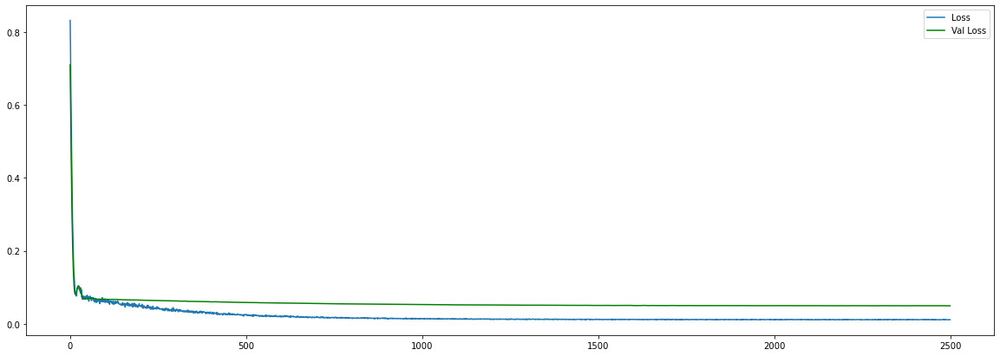

final loss: 0.01131847407668829
final val_loss: 0.04941362515091896
Get best hyperparameter for simple LSTM


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


INFO:tensorflow:Oracle triggered exit
Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 1, 5)]            0         
_________________________________________________________________
lstm (LSTM)                  (None, 1, 96)             39168     
_________________________________________________________________
lstm_1 (LSTM)                (None, 1, 96)             74112     
_________________________________________________________________
lstm_2 (LSTM)                (None, 96)                74112     
_________________________________________________________________
dense (Dense)                (None, 56)                5432      
_________________________________________________________________
dense_1 (Dense)              (None, 56)                3192      
_________________________________________________________________
dense_2 (Dense)        

Epoch 00027: val_loss did not improve from 0.05939
Epoch 28/2500
1/1 [==============================] - ETA: 0s - loss: 0.0265 - mae: 0.121 - 0s 73ms/step - loss: 0.0265 - mae: 0.1214 - val_loss: 0.0916 - val_mae: 0.2013

Epoch 00028: val_loss did not improve from 0.05939
Epoch 29/2500
1/1 [==============================] - ETA: 0s - loss: 0.0431 - mae: 0.158 - 0s 67ms/step - loss: 0.0431 - mae: 0.1585 - val_loss: 0.1088 - val_mae: 0.2174

Epoch 00029: val_loss did not improve from 0.05939
Epoch 30/2500
1/1 [==============================] - ETA: 0s - loss: 0.0584 - mae: 0.185 - 0s 71ms/step - loss: 0.0584 - mae: 0.1857 - val_loss: 0.1197 - val_mae: 0.2268

Epoch 00030: val_loss did not improve from 0.05939
Epoch 31/2500
1/1 [==============================] - ETA: 0s - loss: 0.0681 - mae: 0.201 - 0s 74ms/step - loss: 0.0681 - mae: 0.2016 - val_loss: 0.1230 - val_mae: 0.2289

Epoch 00031: val_loss did not improve from 0.05939
Epoch 32/2500
1/1 [==============================] - ETA: 0s 


Epoch 00064: val_loss did not improve from 0.05746
Epoch 65/2500
1/1 [==============================] - ETA: 0s - loss: 0.0105 - mae: 0.071 - 0s 65ms/step - loss: 0.0105 - mae: 0.0717 - val_loss: 0.0603 - val_mae: 0.1445

Epoch 00065: val_loss did not improve from 0.05746
Epoch 66/2500
1/1 [==============================] - ETA: 0s - loss: 0.0099 - mae: 0.067 - 0s 62ms/step - loss: 0.0099 - mae: 0.0672 - val_loss: 0.0613 - val_mae: 0.1439

Epoch 00066: val_loss did not improve from 0.05746
Epoch 67/2500
1/1 [==============================] - ETA: 0s - loss: 0.0097 - mae: 0.064 - 0s 62ms/step - loss: 0.0097 - mae: 0.0647 - val_loss: 0.0625 - val_mae: 0.1441

Epoch 00067: val_loss did not improve from 0.05746
Epoch 68/2500
1/1 [==============================] - ETA: 0s - loss: 0.0099 - mae: 0.064 - 0s 73ms/step - loss: 0.0099 - mae: 0.0645 - val_loss: 0.0635 - val_mae: 0.1449

Epoch 00068: val_loss did not improve from 0.05746
Epoch 69/2500
1/1 [==============================] - ETA: 0s


Epoch 00101: val_loss did not improve from 0.05746
Epoch 102/2500
1/1 [==============================] - ETA: 0s - loss: 0.0095 - mae: 0.064 - 0s 68ms/step - loss: 0.0095 - mae: 0.0640 - val_loss: 0.0596 - val_mae: 0.1428

Epoch 00102: val_loss did not improve from 0.05746
Epoch 103/2500
1/1 [==============================] - ETA: 0s - loss: 0.0095 - mae: 0.063 - 0s 66ms/step - loss: 0.0095 - mae: 0.0638 - val_loss: 0.0597 - val_mae: 0.1428

Epoch 00103: val_loss did not improve from 0.05746
Epoch 104/2500
1/1 [==============================] - ETA: 0s - loss: 0.0095 - mae: 0.063 - 0s 65ms/step - loss: 0.0095 - mae: 0.0637 - val_loss: 0.0597 - val_mae: 0.1427

Epoch 00104: val_loss did not improve from 0.05746
Epoch 105/2500
1/1 [==============================] - ETA: 0s - loss: 0.0095 - mae: 0.063 - 0s 61ms/step - loss: 0.0095 - mae: 0.0637 - val_loss: 0.0596 - val_mae: 0.1427

Epoch 00105: val_loss did not improve from 0.05746
Epoch 106/2500
1/1 [==============================] - ET


Epoch 00138: val_loss did not improve from 0.05746
Epoch 139/2500
1/1 [==============================] - ETA: 0s - loss: 0.0093 - mae: 0.063 - 0s 60ms/step - loss: 0.0093 - mae: 0.0632 - val_loss: 0.0580 - val_mae: 0.1415

Epoch 00139: val_loss did not improve from 0.05746
Epoch 140/2500
1/1 [==============================] - ETA: 0s - loss: 0.0093 - mae: 0.063 - 0s 60ms/step - loss: 0.0093 - mae: 0.0632 - val_loss: 0.0579 - val_mae: 0.1415

Epoch 00140: val_loss did not improve from 0.05746
Epoch 141/2500
1/1 [==============================] - ETA: 0s - loss: 0.0092 - mae: 0.063 - 0s 62ms/step - loss: 0.0092 - mae: 0.0632 - val_loss: 0.0579 - val_mae: 0.1415

Epoch 00141: val_loss did not improve from 0.05746
Epoch 142/2500
1/1 [==============================] - ETA: 0s - loss: 0.0092 - mae: 0.063 - 0s 63ms/step - loss: 0.0092 - mae: 0.0632 - val_loss: 0.0578 - val_mae: 0.1414

Epoch 00142: val_loss did not improve from 0.05746
Epoch 143/2500
1/1 [==============================] - ET


Epoch 00172: val_loss improved from 0.05686 to 0.05682, saving model to VIC_1H_LSTM.hdf5
Epoch 173/2500
1/1 [==============================] - ETA: 0s - loss: 0.0091 - mae: 0.062 - 0s 64ms/step - loss: 0.0091 - mae: 0.0624 - val_loss: 0.0568 - val_mae: 0.1405

Epoch 00173: val_loss improved from 0.05682 to 0.05679, saving model to VIC_1H_LSTM.hdf5
Epoch 174/2500
1/1 [==============================] - ETA: 0s - loss: 0.0091 - mae: 0.062 - 0s 58ms/step - loss: 0.0091 - mae: 0.0624 - val_loss: 0.0568 - val_mae: 0.1405

Epoch 00174: val_loss improved from 0.05679 to 0.05676, saving model to VIC_1H_LSTM.hdf5
Epoch 175/2500
1/1 [==============================] - ETA: 0s - loss: 0.0091 - mae: 0.062 - 0s 57ms/step - loss: 0.0091 - mae: 0.0623 - val_loss: 0.0567 - val_mae: 0.1405

Epoch 00175: val_loss improved from 0.05676 to 0.05673, saving model to VIC_1H_LSTM.hdf5
Epoch 176/2500
1/1 [==============================] - ETA: 0s - loss: 0.0091 - mae: 0.062 - 0s 60ms/step - loss: 0.0091 - mae: 

Epoch 204/2500
1/1 [==============================] - ETA: 0s - loss: 0.0089 - mae: 0.061 - 0s 74ms/step - loss: 0.0089 - mae: 0.0616 - val_loss: 0.0558 - val_mae: 0.1397

Epoch 00204: val_loss improved from 0.05579 to 0.05576, saving model to VIC_1H_LSTM.hdf5
Epoch 205/2500
1/1 [==============================] - ETA: 0s - loss: 0.0089 - mae: 0.061 - 0s 76ms/step - loss: 0.0089 - mae: 0.0615 - val_loss: 0.0557 - val_mae: 0.1396

Epoch 00205: val_loss improved from 0.05576 to 0.05573, saving model to VIC_1H_LSTM.hdf5
Epoch 206/2500
1/1 [==============================] - ETA: 0s - loss: 0.0089 - mae: 0.061 - 0s 68ms/step - loss: 0.0089 - mae: 0.0615 - val_loss: 0.0557 - val_mae: 0.1396

Epoch 00206: val_loss improved from 0.05573 to 0.05569, saving model to VIC_1H_LSTM.hdf5
Epoch 207/2500
1/1 [==============================] - ETA: 0s - loss: 0.0089 - mae: 0.061 - 0s 67ms/step - loss: 0.0089 - mae: 0.0615 - val_loss: 0.0557 - val_mae: 0.1396

Epoch 00207: val_loss improved from 0.05569 t


Epoch 00235: val_loss improved from 0.05480 to 0.05477, saving model to VIC_1H_LSTM.hdf5
Epoch 236/2500
1/1 [==============================] - ETA: 0s - loss: 0.0088 - mae: 0.060 - 0s 58ms/step - loss: 0.0088 - mae: 0.0608 - val_loss: 0.0547 - val_mae: 0.1387

Epoch 00236: val_loss improved from 0.05477 to 0.05474, saving model to VIC_1H_LSTM.hdf5
Epoch 237/2500
1/1 [==============================] - ETA: 0s - loss: 0.0088 - mae: 0.060 - 0s 57ms/step - loss: 0.0088 - mae: 0.0607 - val_loss: 0.0547 - val_mae: 0.1387

Epoch 00237: val_loss improved from 0.05474 to 0.05471, saving model to VIC_1H_LSTM.hdf5
Epoch 238/2500
1/1 [==============================] - ETA: 0s - loss: 0.0088 - mae: 0.060 - 0s 58ms/step - loss: 0.0088 - mae: 0.0607 - val_loss: 0.0547 - val_mae: 0.1387

Epoch 00238: val_loss improved from 0.05471 to 0.05467, saving model to VIC_1H_LSTM.hdf5
Epoch 239/2500
1/1 [==============================] - ETA: 0s - loss: 0.0088 - mae: 0.060 - 0s 62ms/step - loss: 0.0088 - mae: 

Epoch 267/2500
1/1 [==============================] - ETA: 0s - loss: 0.0087 - mae: 0.060 - 0s 58ms/step - loss: 0.0087 - mae: 0.0600 - val_loss: 0.0538 - val_mae: 0.1378

Epoch 00267: val_loss improved from 0.05384 to 0.05382, saving model to VIC_1H_LSTM.hdf5
Epoch 268/2500
1/1 [==============================] - ETA: 0s - loss: 0.0086 - mae: 0.060 - 0s 61ms/step - loss: 0.0086 - mae: 0.0600 - val_loss: 0.0538 - val_mae: 0.1378

Epoch 00268: val_loss improved from 0.05382 to 0.05379, saving model to VIC_1H_LSTM.hdf5
Epoch 269/2500
1/1 [==============================] - ETA: 0s - loss: 0.0086 - mae: 0.059 - 0s 55ms/step - loss: 0.0086 - mae: 0.0599 - val_loss: 0.0538 - val_mae: 0.1378

Epoch 00269: val_loss improved from 0.05379 to 0.05376, saving model to VIC_1H_LSTM.hdf5
Epoch 270/2500
1/1 [==============================] - ETA: 0s - loss: 0.0086 - mae: 0.059 - 0s 60ms/step - loss: 0.0086 - mae: 0.0599 - val_loss: 0.0537 - val_mae: 0.1377

Epoch 00270: val_loss improved from 0.05376 t


Epoch 00298: val_loss improved from 0.05301 to 0.05298, saving model to VIC_1H_LSTM.hdf5
Epoch 299/2500
1/1 [==============================] - ETA: 0s - loss: 0.0085 - mae: 0.059 - 0s 58ms/step - loss: 0.0085 - mae: 0.0592 - val_loss: 0.0530 - val_mae: 0.1369

Epoch 00299: val_loss improved from 0.05298 to 0.05295, saving model to VIC_1H_LSTM.hdf5
Epoch 300/2500
1/1 [==============================] - ETA: 0s - loss: 0.0085 - mae: 0.059 - 0s 60ms/step - loss: 0.0085 - mae: 0.0592 - val_loss: 0.0529 - val_mae: 0.1368

Epoch 00300: val_loss improved from 0.05295 to 0.05293, saving model to VIC_1H_LSTM.hdf5
Epoch 301/2500
1/1 [==============================] - ETA: 0s - loss: 0.0085 - mae: 0.059 - 0s 56ms/step - loss: 0.0085 - mae: 0.0592 - val_loss: 0.0529 - val_mae: 0.1368

Epoch 00301: val_loss improved from 0.05293 to 0.05290, saving model to VIC_1H_LSTM.hdf5
Epoch 302/2500
1/1 [==============================] - ETA: 0s - loss: 0.0085 - mae: 0.059 - 0s 59ms/step - loss: 0.0085 - mae: 

Epoch 330/2500
1/1 [==============================] - ETA: 0s - loss: 0.0084 - mae: 0.058 - 0s 54ms/step - loss: 0.0084 - mae: 0.0586 - val_loss: 0.0522 - val_mae: 0.1359

Epoch 00330: val_loss improved from 0.05225 to 0.05223, saving model to VIC_1H_LSTM.hdf5
Epoch 331/2500
1/1 [==============================] - ETA: 0s - loss: 0.0084 - mae: 0.058 - 0s 54ms/step - loss: 0.0084 - mae: 0.0586 - val_loss: 0.0522 - val_mae: 0.1359

Epoch 00331: val_loss improved from 0.05223 to 0.05221, saving model to VIC_1H_LSTM.hdf5
Epoch 332/2500
1/1 [==============================] - ETA: 0s - loss: 0.0084 - mae: 0.058 - 0s 56ms/step - loss: 0.0084 - mae: 0.0585 - val_loss: 0.0522 - val_mae: 0.1359

Epoch 00332: val_loss improved from 0.05221 to 0.05218, saving model to VIC_1H_LSTM.hdf5
Epoch 333/2500
1/1 [==============================] - ETA: 0s - loss: 0.0084 - mae: 0.058 - 0s 53ms/step - loss: 0.0084 - mae: 0.0585 - val_loss: 0.0522 - val_mae: 0.1358

Epoch 00333: val_loss improved from 0.05218 t


Epoch 00361: val_loss improved from 0.05166 to 0.05164, saving model to VIC_1H_LSTM.hdf5
Epoch 362/2500
1/1 [==============================] - ETA: 0s - loss: 0.0083 - mae: 0.058 - 0s 63ms/step - loss: 0.0083 - mae: 0.0581 - val_loss: 0.0516 - val_mae: 0.1350

Epoch 00362: val_loss improved from 0.05164 to 0.05162, saving model to VIC_1H_LSTM.hdf5
Epoch 363/2500
1/1 [==============================] - ETA: 0s - loss: 0.0083 - mae: 0.058 - 0s 78ms/step - loss: 0.0083 - mae: 0.0581 - val_loss: 0.0516 - val_mae: 0.1350

Epoch 00363: val_loss improved from 0.05162 to 0.05161, saving model to VIC_1H_LSTM.hdf5
Epoch 364/2500
1/1 [==============================] - ETA: 0s - loss: 0.0083 - mae: 0.058 - 0s 80ms/step - loss: 0.0083 - mae: 0.0580 - val_loss: 0.0516 - val_mae: 0.1350

Epoch 00364: val_loss improved from 0.05161 to 0.05159, saving model to VIC_1H_LSTM.hdf5
Epoch 365/2500
1/1 [==============================] - ETA: 0s - loss: 0.0083 - mae: 0.058 - 0s 68ms/step - loss: 0.0083 - mae: 

Epoch 393/2500
1/1 [==============================] - ETA: 0s - loss: 0.0083 - mae: 0.057 - 0s 70ms/step - loss: 0.0083 - mae: 0.0577 - val_loss: 0.0512 - val_mae: 0.1344

Epoch 00393: val_loss improved from 0.05122 to 0.05121, saving model to VIC_1H_LSTM.hdf5
Epoch 394/2500
1/1 [==============================] - ETA: 0s - loss: 0.0083 - mae: 0.057 - 0s 68ms/step - loss: 0.0083 - mae: 0.0577 - val_loss: 0.0512 - val_mae: 0.1344

Epoch 00394: val_loss improved from 0.05121 to 0.05119, saving model to VIC_1H_LSTM.hdf5
Epoch 395/2500
1/1 [==============================] - ETA: 0s - loss: 0.0083 - mae: 0.057 - 0s 71ms/step - loss: 0.0083 - mae: 0.0577 - val_loss: 0.0512 - val_mae: 0.1343

Epoch 00395: val_loss improved from 0.05119 to 0.05118, saving model to VIC_1H_LSTM.hdf5
Epoch 396/2500
1/1 [==============================] - ETA: 0s - loss: 0.0083 - mae: 0.057 - 0s 68ms/step - loss: 0.0083 - mae: 0.0577 - val_loss: 0.0512 - val_mae: 0.1343

Epoch 00396: val_loss improved from 0.05118 t


Epoch 00424: val_loss improved from 0.05096 to 0.05095, saving model to VIC_1H_LSTM.hdf5
Epoch 425/2500
1/1 [==============================] - ETA: 0s - loss: 0.0082 - mae: 0.057 - 0s 68ms/step - loss: 0.0082 - mae: 0.0574 - val_loss: 0.0509 - val_mae: 0.1339

Epoch 00425: val_loss improved from 0.05095 to 0.05095, saving model to VIC_1H_LSTM.hdf5
Epoch 426/2500
1/1 [==============================] - ETA: 0s - loss: 0.0082 - mae: 0.057 - 0s 68ms/step - loss: 0.0082 - mae: 0.0574 - val_loss: 0.0509 - val_mae: 0.1339

Epoch 00426: val_loss improved from 0.05095 to 0.05094, saving model to VIC_1H_LSTM.hdf5
Epoch 427/2500
1/1 [==============================] - ETA: 0s - loss: 0.0082 - mae: 0.057 - 0s 57ms/step - loss: 0.0082 - mae: 0.0574 - val_loss: 0.0509 - val_mae: 0.1339

Epoch 00427: val_loss improved from 0.05094 to 0.05094, saving model to VIC_1H_LSTM.hdf5
Epoch 428/2500
1/1 [==============================] - ETA: 0s - loss: 0.0082 - mae: 0.057 - 0s 56ms/step - loss: 0.0082 - mae: 

Epoch 456/2500
1/1 [==============================] - ETA: 0s - loss: 0.0082 - mae: 0.057 - 0s 52ms/step - loss: 0.0082 - mae: 0.0573 - val_loss: 0.0508 - val_mae: 0.1337

Epoch 00456: val_loss improved from 0.05084 to 0.05084, saving model to VIC_1H_LSTM.hdf5
Epoch 457/2500
1/1 [==============================] - ETA: 0s - loss: 0.0081 - mae: 0.057 - 0s 54ms/step - loss: 0.0081 - mae: 0.0573 - val_loss: 0.0508 - val_mae: 0.1337

Epoch 00457: val_loss improved from 0.05084 to 0.05084, saving model to VIC_1H_LSTM.hdf5
Epoch 458/2500
1/1 [==============================] - ETA: 0s - loss: 0.0081 - mae: 0.057 - 0s 55ms/step - loss: 0.0081 - mae: 0.0573 - val_loss: 0.0508 - val_mae: 0.1337

Epoch 00458: val_loss improved from 0.05084 to 0.05083, saving model to VIC_1H_LSTM.hdf5
Epoch 459/2500
1/1 [==============================] - ETA: 0s - loss: 0.0081 - mae: 0.057 - 0s 58ms/step - loss: 0.0081 - mae: 0.0573 - val_loss: 0.0508 - val_mae: 0.1337

Epoch 00459: val_loss improved from 0.05083 t


Epoch 00487: val_loss improved from 0.05076 to 0.05075, saving model to VIC_1H_LSTM.hdf5
Epoch 488/2500
1/1 [==============================] - ETA: 0s - loss: 0.0081 - mae: 0.057 - 0s 57ms/step - loss: 0.0081 - mae: 0.0572 - val_loss: 0.0507 - val_mae: 0.1336

Epoch 00488: val_loss improved from 0.05075 to 0.05075, saving model to VIC_1H_LSTM.hdf5
Epoch 489/2500
1/1 [==============================] - ETA: 0s - loss: 0.0081 - mae: 0.057 - 0s 57ms/step - loss: 0.0081 - mae: 0.0572 - val_loss: 0.0507 - val_mae: 0.1336

Epoch 00489: val_loss improved from 0.05075 to 0.05075, saving model to VIC_1H_LSTM.hdf5
Epoch 490/2500
1/1 [==============================] - ETA: 0s - loss: 0.0081 - mae: 0.057 - 0s 56ms/step - loss: 0.0081 - mae: 0.0572 - val_loss: 0.0507 - val_mae: 0.1336

Epoch 00490: val_loss improved from 0.05075 to 0.05074, saving model to VIC_1H_LSTM.hdf5
Epoch 491/2500
1/1 [==============================] - ETA: 0s - loss: 0.0081 - mae: 0.057 - 0s 58ms/step - loss: 0.0081 - mae: 

Epoch 519/2500
1/1 [==============================] - ETA: 0s - loss: 0.0081 - mae: 0.057 - 0s 69ms/step - loss: 0.0081 - mae: 0.0571 - val_loss: 0.0506 - val_mae: 0.1334

Epoch 00519: val_loss improved from 0.05064 to 0.05063, saving model to VIC_1H_LSTM.hdf5
Epoch 520/2500
1/1 [==============================] - ETA: 0s - loss: 0.0081 - mae: 0.057 - 0s 77ms/step - loss: 0.0081 - mae: 0.0571 - val_loss: 0.0506 - val_mae: 0.1334

Epoch 00520: val_loss improved from 0.05063 to 0.05063, saving model to VIC_1H_LSTM.hdf5
Epoch 521/2500
1/1 [==============================] - ETA: 0s - loss: 0.0081 - mae: 0.057 - 0s 70ms/step - loss: 0.0081 - mae: 0.0571 - val_loss: 0.0506 - val_mae: 0.1333

Epoch 00521: val_loss improved from 0.05063 to 0.05062, saving model to VIC_1H_LSTM.hdf5
Epoch 522/2500
1/1 [==============================] - ETA: 0s - loss: 0.0081 - mae: 0.057 - 0s 102ms/step - loss: 0.0081 - mae: 0.0571 - val_loss: 0.0506 - val_mae: 0.1333

Epoch 00522: val_loss improved from 0.05062 


Epoch 00550: val_loss improved from 0.05053 to 0.05053, saving model to VIC_1H_LSTM.hdf5
Epoch 551/2500
1/1 [==============================] - ETA: 0s - loss: 0.0080 - mae: 0.057 - 0s 70ms/step - loss: 0.0080 - mae: 0.0570 - val_loss: 0.0505 - val_mae: 0.1332

Epoch 00551: val_loss improved from 0.05053 to 0.05053, saving model to VIC_1H_LSTM.hdf5
Epoch 552/2500
1/1 [==============================] - ETA: 0s - loss: 0.0080 - mae: 0.057 - 0s 57ms/step - loss: 0.0080 - mae: 0.0570 - val_loss: 0.0505 - val_mae: 0.1332

Epoch 00552: val_loss improved from 0.05053 to 0.05053, saving model to VIC_1H_LSTM.hdf5
Epoch 553/2500
1/1 [==============================] - ETA: 0s - loss: 0.0080 - mae: 0.057 - 0s 59ms/step - loss: 0.0080 - mae: 0.0570 - val_loss: 0.0505 - val_mae: 0.1332

Epoch 00553: val_loss improved from 0.05053 to 0.05053, saving model to VIC_1H_LSTM.hdf5
Epoch 554/2500
1/1 [==============================] - ETA: 0s - loss: 0.0080 - mae: 0.057 - 0s 61ms/step - loss: 0.0080 - mae: 

Epoch 582/2500
1/1 [==============================] - ETA: 0s - loss: 0.0080 - mae: 0.056 - 0s 66ms/step - loss: 0.0080 - mae: 0.0569 - val_loss: 0.0505 - val_mae: 0.1331

Epoch 00582: val_loss improved from 0.05049 to 0.05049, saving model to VIC_1H_LSTM.hdf5
Epoch 583/2500
1/1 [==============================] - ETA: 0s - loss: 0.0080 - mae: 0.056 - 0s 57ms/step - loss: 0.0080 - mae: 0.0569 - val_loss: 0.0505 - val_mae: 0.1331

Epoch 00583: val_loss improved from 0.05049 to 0.05049, saving model to VIC_1H_LSTM.hdf5
Epoch 584/2500
1/1 [==============================] - ETA: 0s - loss: 0.0080 - mae: 0.056 - 0s 58ms/step - loss: 0.0080 - mae: 0.0569 - val_loss: 0.0505 - val_mae: 0.1331

Epoch 00584: val_loss improved from 0.05049 to 0.05049, saving model to VIC_1H_LSTM.hdf5
Epoch 585/2500
1/1 [==============================] - ETA: 0s - loss: 0.0080 - mae: 0.056 - 0s 57ms/step - loss: 0.0080 - mae: 0.0569 - val_loss: 0.0505 - val_mae: 0.1331

Epoch 00585: val_loss improved from 0.05049 t

1/1 [==============================] - ETA: 0s - loss: 0.0080 - mae: 0.056 - 0s 65ms/step - loss: 0.0080 - mae: 0.0568 - val_loss: 0.0505 - val_mae: 0.1331

Epoch 00616: val_loss did not improve from 0.05049
Epoch 617/2500
1/1 [==============================] - ETA: 0s - loss: 0.0080 - mae: 0.056 - 0s 61ms/step - loss: 0.0080 - mae: 0.0568 - val_loss: 0.0505 - val_mae: 0.1331

Epoch 00617: val_loss did not improve from 0.05049
Epoch 618/2500
1/1 [==============================] - ETA: 0s - loss: 0.0080 - mae: 0.056 - 0s 58ms/step - loss: 0.0080 - mae: 0.0568 - val_loss: 0.0505 - val_mae: 0.1331

Epoch 00618: val_loss did not improve from 0.05049
Epoch 619/2500
1/1 [==============================] - ETA: 0s - loss: 0.0080 - mae: 0.056 - 0s 57ms/step - loss: 0.0080 - mae: 0.0568 - val_loss: 0.0505 - val_mae: 0.1331

Epoch 00619: val_loss did not improve from 0.05049
Epoch 620/2500
1/1 [==============================] - ETA: 0s - loss: 0.0080 - mae: 0.056 - 0s 53ms/step - loss: 0.0080 - m

Epoch 00649: val_loss improved from 0.05049 to 0.05049, saving model to VIC_1H_LSTM.hdf5
Epoch 650/2500
1/1 [==============================] - ETA: 0s - loss: 0.0080 - mae: 0.056 - 0s 66ms/step - loss: 0.0080 - mae: 0.0567 - val_loss: 0.0505 - val_mae: 0.1331

Epoch 00650: val_loss improved from 0.05049 to 0.05049, saving model to VIC_1H_LSTM.hdf5
Epoch 651/2500
1/1 [==============================] - ETA: 0s - loss: 0.0080 - mae: 0.056 - 0s 64ms/step - loss: 0.0080 - mae: 0.0567 - val_loss: 0.0505 - val_mae: 0.1331

Epoch 00651: val_loss improved from 0.05049 to 0.05048, saving model to VIC_1H_LSTM.hdf5
Epoch 652/2500
1/1 [==============================] - ETA: 0s - loss: 0.0080 - mae: 0.056 - 0s 74ms/step - loss: 0.0080 - mae: 0.0567 - val_loss: 0.0505 - val_mae: 0.1331

Epoch 00652: val_loss improved from 0.05048 to 0.05048, saving model to VIC_1H_LSTM.hdf5
Epoch 653/2500
1/1 [==============================] - ETA: 0s - loss: 0.0080 - mae: 0.056 - 0s 58ms/step - loss: 0.0080 - mae: 0

Epoch 00681: val_loss did not improve from 0.05048
Epoch 682/2500
1/1 [==============================] - ETA: 0s - loss: 0.0079 - mae: 0.056 - 0s 63ms/step - loss: 0.0079 - mae: 0.0565 - val_loss: 0.0505 - val_mae: 0.1330

Epoch 00682: val_loss did not improve from 0.05048
Epoch 683/2500
1/1 [==============================] - ETA: 0s - loss: 0.0079 - mae: 0.056 - 0s 66ms/step - loss: 0.0079 - mae: 0.0565 - val_loss: 0.0505 - val_mae: 0.1330

Epoch 00683: val_loss did not improve from 0.05048
Epoch 684/2500
1/1 [==============================] - ETA: 0s - loss: 0.0079 - mae: 0.056 - 0s 60ms/step - loss: 0.0079 - mae: 0.0565 - val_loss: 0.0505 - val_mae: 0.1330

Epoch 00684: val_loss did not improve from 0.05048
Epoch 685/2500
1/1 [==============================] - ETA: 0s - loss: 0.0079 - mae: 0.056 - 0s 59ms/step - loss: 0.0079 - mae: 0.0565 - val_loss: 0.0505 - val_mae: 0.1330

Epoch 00685: val_loss did not improve from 0.05048
Epoch 686/2500
1/1 [==============================] - ETA


Epoch 00718: val_loss did not improve from 0.05048
Epoch 719/2500
1/1 [==============================] - ETA: 0s - loss: 0.0079 - mae: 0.056 - 0s 57ms/step - loss: 0.0079 - mae: 0.0564 - val_loss: 0.0505 - val_mae: 0.1329

Epoch 00719: val_loss did not improve from 0.05048
Epoch 720/2500
1/1 [==============================] - ETA: 0s - loss: 0.0079 - mae: 0.056 - 0s 58ms/step - loss: 0.0079 - mae: 0.0564 - val_loss: 0.0505 - val_mae: 0.1329

Epoch 00720: val_loss did not improve from 0.05048
Epoch 721/2500
1/1 [==============================] - ETA: 0s - loss: 0.0079 - mae: 0.056 - 0s 58ms/step - loss: 0.0079 - mae: 0.0564 - val_loss: 0.0505 - val_mae: 0.1329

Epoch 00721: val_loss did not improve from 0.05048
Epoch 722/2500
1/1 [==============================] - ETA: 0s - loss: 0.0079 - mae: 0.056 - 0s 60ms/step - loss: 0.0079 - mae: 0.0564 - val_loss: 0.0505 - val_mae: 0.1329

Epoch 00722: val_loss did not improve from 0.05048
Epoch 723/2500
1/1 [==============================] - ET


Epoch 00755: val_loss did not improve from 0.05048
Epoch 756/2500
1/1 [==============================] - ETA: 0s - loss: 0.0079 - mae: 0.056 - 0s 69ms/step - loss: 0.0079 - mae: 0.0562 - val_loss: 0.0506 - val_mae: 0.1328

Epoch 00756: val_loss did not improve from 0.05048
Epoch 757/2500
1/1 [==============================] - ETA: 0s - loss: 0.0079 - mae: 0.056 - 0s 66ms/step - loss: 0.0079 - mae: 0.0562 - val_loss: 0.0506 - val_mae: 0.1328

Epoch 00757: val_loss did not improve from 0.05048
Epoch 758/2500
1/1 [==============================] - ETA: 0s - loss: 0.0079 - mae: 0.056 - 0s 64ms/step - loss: 0.0079 - mae: 0.0562 - val_loss: 0.0506 - val_mae: 0.1328

Epoch 00758: val_loss did not improve from 0.05048
Epoch 759/2500
1/1 [==============================] - ETA: 0s - loss: 0.0079 - mae: 0.056 - 0s 60ms/step - loss: 0.0079 - mae: 0.0561 - val_loss: 0.0506 - val_mae: 0.1328

Epoch 00759: val_loss did not improve from 0.05048
Epoch 760/2500
1/1 [==============================] - ET


Epoch 00792: val_loss did not improve from 0.05048
Epoch 793/2500
1/1 [==============================] - ETA: 0s - loss: 0.0079 - mae: 0.056 - 0s 66ms/step - loss: 0.0079 - mae: 0.0560 - val_loss: 0.0508 - val_mae: 0.1334

Epoch 00793: val_loss did not improve from 0.05048
Epoch 794/2500
1/1 [==============================] - ETA: 0s - loss: 0.0079 - mae: 0.056 - 0s 59ms/step - loss: 0.0079 - mae: 0.0563 - val_loss: 0.0506 - val_mae: 0.1325

Epoch 00794: val_loss did not improve from 0.05048
Epoch 795/2500
1/1 [==============================] - ETA: 0s - loss: 0.0079 - mae: 0.056 - 0s 60ms/step - loss: 0.0079 - mae: 0.0561 - val_loss: 0.0508 - val_mae: 0.1335

Epoch 00795: val_loss did not improve from 0.05048
Epoch 796/2500
1/1 [==============================] - ETA: 0s - loss: 0.0079 - mae: 0.056 - 0s 68ms/step - loss: 0.0079 - mae: 0.0564 - val_loss: 0.0506 - val_mae: 0.1325

Epoch 00796: val_loss did not improve from 0.05048
Epoch 797/2500
1/1 [==============================] - ET


Epoch 00829: val_loss did not improve from 0.05048
Epoch 830/2500
1/1 [==============================] - ETA: 0s - loss: 0.0078 - mae: 0.055 - 0s 61ms/step - loss: 0.0078 - mae: 0.0558 - val_loss: 0.0508 - val_mae: 0.1328

Epoch 00830: val_loss did not improve from 0.05048
Epoch 831/2500
1/1 [==============================] - ETA: 0s - loss: 0.0078 - mae: 0.055 - 0s 64ms/step - loss: 0.0078 - mae: 0.0557 - val_loss: 0.0508 - val_mae: 0.1329

Epoch 00831: val_loss did not improve from 0.05048
Epoch 832/2500
1/1 [==============================] - ETA: 0s - loss: 0.0078 - mae: 0.055 - 0s 64ms/step - loss: 0.0078 - mae: 0.0558 - val_loss: 0.0508 - val_mae: 0.1329

Epoch 00832: val_loss did not improve from 0.05048
Epoch 833/2500
1/1 [==============================] - ETA: 0s - loss: 0.0078 - mae: 0.055 - 0s 62ms/step - loss: 0.0078 - mae: 0.0557 - val_loss: 0.0508 - val_mae: 0.1329

Epoch 00833: val_loss did not improve from 0.05048
Epoch 834/2500
1/1 [==============================] - ET


Epoch 00866: val_loss did not improve from 0.05048
Epoch 867/2500
1/1 [==============================] - ETA: 0s - loss: 0.0078 - mae: 0.055 - 0s 52ms/step - loss: 0.0078 - mae: 0.0556 - val_loss: 0.0510 - val_mae: 0.1330

Epoch 00867: val_loss did not improve from 0.05048
Epoch 868/2500
1/1 [==============================] - ETA: 0s - loss: 0.0078 - mae: 0.055 - 0s 52ms/step - loss: 0.0078 - mae: 0.0556 - val_loss: 0.0509 - val_mae: 0.1329

Epoch 00868: val_loss did not improve from 0.05048
Epoch 869/2500
1/1 [==============================] - ETA: 0s - loss: 0.0078 - mae: 0.055 - 0s 52ms/step - loss: 0.0078 - mae: 0.0556 - val_loss: 0.0510 - val_mae: 0.1331

Epoch 00869: val_loss did not improve from 0.05048
Epoch 870/2500
1/1 [==============================] - ETA: 0s - loss: 0.0078 - mae: 0.055 - 0s 52ms/step - loss: 0.0078 - mae: 0.0556 - val_loss: 0.0509 - val_mae: 0.1328

Epoch 00870: val_loss did not improve from 0.05048
Epoch 871/2500
1/1 [==============================] - ET

1/1 [==============================] - ETA: 0s - loss: 0.0078 - mae: 0.055 - 0s 76ms/step - loss: 0.0078 - mae: 0.0554 - val_loss: 0.0511 - val_mae: 0.1331

Epoch 00903: val_loss did not improve from 0.05048
Epoch 904/2500
1/1 [==============================] - ETA: 0s - loss: 0.0078 - mae: 0.055 - 0s 82ms/step - loss: 0.0078 - mae: 0.0555 - val_loss: 0.0511 - val_mae: 0.1331

Epoch 00904: val_loss did not improve from 0.05048
Epoch 905/2500
1/1 [==============================] - ETA: 0s - loss: 0.0078 - mae: 0.055 - 0s 81ms/step - loss: 0.0078 - mae: 0.0555 - val_loss: 0.0511 - val_mae: 0.1330

Epoch 00905: val_loss did not improve from 0.05048
Epoch 906/2500
1/1 [==============================] - ETA: 0s - loss: 0.0078 - mae: 0.055 - 0s 81ms/step - loss: 0.0078 - mae: 0.0554 - val_loss: 0.0511 - val_mae: 0.1330

Epoch 00906: val_loss did not improve from 0.05048
Epoch 907/2500
1/1 [==============================] - ETA: 0s - loss: 0.0078 - mae: 0.055 - 0s 86ms/step - loss: 0.0078 - m

Epoch 00939: val_loss did not improve from 0.05048
Epoch 940/2500
1/1 [==============================] - ETA: 0s - loss: 0.0078 - mae: 0.055 - 0s 64ms/step - loss: 0.0078 - mae: 0.0554 - val_loss: 0.0512 - val_mae: 0.1331

Epoch 00940: val_loss did not improve from 0.05048
Epoch 941/2500
1/1 [==============================] - ETA: 0s - loss: 0.0078 - mae: 0.055 - 0s 67ms/step - loss: 0.0078 - mae: 0.0554 - val_loss: 0.0512 - val_mae: 0.1331

Epoch 00941: val_loss did not improve from 0.05048
Epoch 942/2500
1/1 [==============================] - ETA: 0s - loss: 0.0078 - mae: 0.055 - 0s 68ms/step - loss: 0.0078 - mae: 0.0554 - val_loss: 0.0512 - val_mae: 0.1331

Epoch 00942: val_loss did not improve from 0.05048
Epoch 943/2500
1/1 [==============================] - ETA: 0s - loss: 0.0078 - mae: 0.055 - 0s 66ms/step - loss: 0.0078 - mae: 0.0554 - val_loss: 0.0512 - val_mae: 0.1331

Epoch 00943: val_loss did not improve from 0.05048
Epoch 944/2500
1/1 [==============================] - ETA


Epoch 00976: val_loss did not improve from 0.05048
Epoch 977/2500
1/1 [==============================] - ETA: 0s - loss: 0.0077 - mae: 0.055 - 0s 73ms/step - loss: 0.0077 - mae: 0.0553 - val_loss: 0.0513 - val_mae: 0.1331

Epoch 00977: val_loss did not improve from 0.05048
Epoch 978/2500
1/1 [==============================] - ETA: 0s - loss: 0.0077 - mae: 0.055 - 0s 66ms/step - loss: 0.0077 - mae: 0.0553 - val_loss: 0.0513 - val_mae: 0.1331

Epoch 00978: val_loss did not improve from 0.05048
Epoch 979/2500
1/1 [==============================] - ETA: 0s - loss: 0.0077 - mae: 0.055 - 0s 73ms/step - loss: 0.0077 - mae: 0.0553 - val_loss: 0.0513 - val_mae: 0.1331

Epoch 00979: val_loss did not improve from 0.05048
Epoch 980/2500
1/1 [==============================] - ETA: 0s - loss: 0.0077 - mae: 0.055 - 0s 69ms/step - loss: 0.0077 - mae: 0.0553 - val_loss: 0.0513 - val_mae: 0.1331

Epoch 00980: val_loss did not improve from 0.05048
Epoch 981/2500
1/1 [==============================] - ET


Epoch 01013: val_loss did not improve from 0.05048
Epoch 1014/2500
1/1 [==============================] - ETA: 0s - loss: 0.0077 - mae: 0.055 - 0s 68ms/step - loss: 0.0077 - mae: 0.0553 - val_loss: 0.0514 - val_mae: 0.1332

Epoch 01014: val_loss did not improve from 0.05048
Epoch 1015/2500
1/1 [==============================] - ETA: 0s - loss: 0.0077 - mae: 0.055 - 0s 65ms/step - loss: 0.0077 - mae: 0.0553 - val_loss: 0.0514 - val_mae: 0.1332

Epoch 01015: val_loss did not improve from 0.05048
Epoch 1016/2500
1/1 [==============================] - ETA: 0s - loss: 0.0077 - mae: 0.055 - 0s 67ms/step - loss: 0.0077 - mae: 0.0553 - val_loss: 0.0514 - val_mae: 0.1332

Epoch 01016: val_loss did not improve from 0.05048
Epoch 1017/2500
1/1 [==============================] - ETA: 0s - loss: 0.0077 - mae: 0.055 - 0s 70ms/step - loss: 0.0077 - mae: 0.0553 - val_loss: 0.0514 - val_mae: 0.1332

Epoch 01017: val_loss did not improve from 0.05048
Epoch 1018/2500
1/1 [==============================]

1/1 [==============================] - ETA: 0s - loss: 0.0077 - mae: 0.055 - 0s 94ms/step - loss: 0.0077 - mae: 0.0552 - val_loss: 0.0515 - val_mae: 0.1332

Epoch 01050: val_loss did not improve from 0.05048
Epoch 1051/2500
1/1 [==============================] - ETA: 0s - loss: 0.0077 - mae: 0.055 - 0s 78ms/step - loss: 0.0077 - mae: 0.0552 - val_loss: 0.0515 - val_mae: 0.1332

Epoch 01051: val_loss did not improve from 0.05048
Epoch 1052/2500
1/1 [==============================] - ETA: 0s - loss: 0.0077 - mae: 0.055 - 0s 79ms/step - loss: 0.0077 - mae: 0.0552 - val_loss: 0.0515 - val_mae: 0.1332

Epoch 01052: val_loss did not improve from 0.05048
Epoch 1053/2500
1/1 [==============================] - ETA: 0s - loss: 0.0077 - mae: 0.055 - 0s 81ms/step - loss: 0.0077 - mae: 0.0552 - val_loss: 0.0515 - val_mae: 0.1332

Epoch 01053: val_loss did not improve from 0.05048
Epoch 1054/2500
1/1 [==============================] - ETA: 0s - loss: 0.0077 - mae: 0.055 - 0s 80ms/step - loss: 0.0077


Epoch 01086: val_loss did not improve from 0.05048
Epoch 1087/2500
1/1 [==============================] - ETA: 0s - loss: 0.0077 - mae: 0.055 - 0s 75ms/step - loss: 0.0077 - mae: 0.0552 - val_loss: 0.0516 - val_mae: 0.1333

Epoch 01087: val_loss did not improve from 0.05048
Epoch 1088/2500
1/1 [==============================] - ETA: 0s - loss: 0.0077 - mae: 0.055 - 0s 80ms/step - loss: 0.0077 - mae: 0.0552 - val_loss: 0.0516 - val_mae: 0.1333

Epoch 01088: val_loss did not improve from 0.05048
Epoch 1089/2500
1/1 [==============================] - ETA: 0s - loss: 0.0077 - mae: 0.055 - 0s 71ms/step - loss: 0.0077 - mae: 0.0552 - val_loss: 0.0516 - val_mae: 0.1333

Epoch 01089: val_loss did not improve from 0.05048
Epoch 1090/2500
1/1 [==============================] - ETA: 0s - loss: 0.0077 - mae: 0.055 - 0s 73ms/step - loss: 0.0077 - mae: 0.0552 - val_loss: 0.0516 - val_mae: 0.1333

Epoch 01090: val_loss did not improve from 0.05048
Epoch 1091/2500
1/1 [==============================]

1/1 [==============================] - ETA: 0s - loss: 0.0077 - mae: 0.055 - 0s 78ms/step - loss: 0.0077 - mae: 0.0551 - val_loss: 0.0517 - val_mae: 0.1334

Epoch 01123: val_loss did not improve from 0.05048
Epoch 1124/2500
1/1 [==============================] - ETA: 0s - loss: 0.0077 - mae: 0.055 - 0s 75ms/step - loss: 0.0077 - mae: 0.0551 - val_loss: 0.0517 - val_mae: 0.1334

Epoch 01124: val_loss did not improve from 0.05048
Epoch 1125/2500
1/1 [==============================] - ETA: 0s - loss: 0.0077 - mae: 0.055 - 0s 67ms/step - loss: 0.0077 - mae: 0.0551 - val_loss: 0.0517 - val_mae: 0.1334

Epoch 01125: val_loss did not improve from 0.05048
Epoch 1126/2500
1/1 [==============================] - ETA: 0s - loss: 0.0077 - mae: 0.055 - 0s 75ms/step - loss: 0.0077 - mae: 0.0551 - val_loss: 0.0517 - val_mae: 0.1334

Epoch 01126: val_loss did not improve from 0.05048
Epoch 1127/2500
1/1 [==============================] - ETA: 0s - loss: 0.0077 - mae: 0.055 - 0s 69ms/step - loss: 0.0077

1/1 [==============================] - ETA: 0s - loss: 0.0077 - mae: 0.055 - 0s 61ms/step - loss: 0.0077 - mae: 0.0551 - val_loss: 0.0518 - val_mae: 0.1334

Epoch 01159: val_loss did not improve from 0.05048
Epoch 1160/2500
1/1 [==============================] - ETA: 0s - loss: 0.0077 - mae: 0.055 - 0s 62ms/step - loss: 0.0077 - mae: 0.0551 - val_loss: 0.0518 - val_mae: 0.1334

Epoch 01160: val_loss did not improve from 0.05048
Epoch 1161/2500
1/1 [==============================] - ETA: 0s - loss: 0.0077 - mae: 0.055 - 0s 58ms/step - loss: 0.0077 - mae: 0.0551 - val_loss: 0.0518 - val_mae: 0.1334

Epoch 01161: val_loss did not improve from 0.05048
Epoch 1162/2500
1/1 [==============================] - ETA: 0s - loss: 0.0077 - mae: 0.055 - 0s 64ms/step - loss: 0.0077 - mae: 0.0551 - val_loss: 0.0518 - val_mae: 0.1334

Epoch 01162: val_loss did not improve from 0.05048
Epoch 1163/2500
1/1 [==============================] - ETA: 0s - loss: 0.0077 - mae: 0.055 - 0s 59ms/step - loss: 0.0077

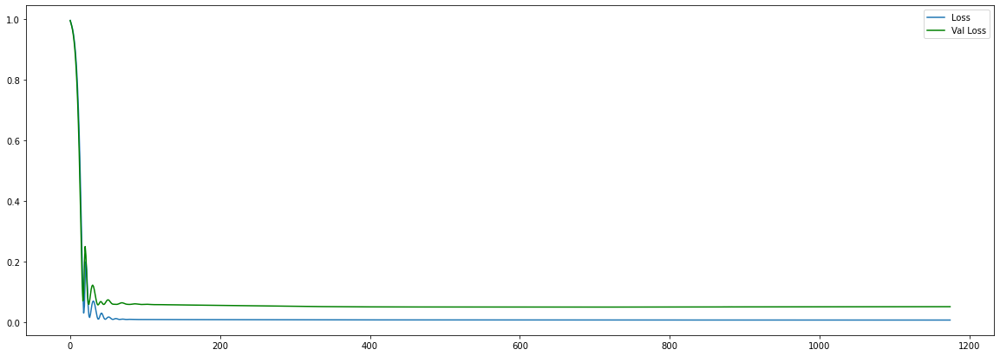

final loss: 0.0076970444060862064
final val_loss: 0.051779113709926605
Get best hyperparameter for simple GRU


INFO:tensorflow:Oracle triggered exit
Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 1, 5)]            0         
_________________________________________________________________
gru (GRU)                    (None, 128)               51840     
_________________________________________________________________
dense (Dense)                (None, 40)                5160      
_________________________________________________________________
dropout (Dropout)            (None, 40)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 41        
Total params: 57,041
Trainable params: 57,041
Non-trainable params: 0
_________________________________________________________________
Start training simple GRU
Epoch 1/2500
1/1 [==============================] - ETA: 0s


Epoch 00030: val_loss improved from 0.05708 to 0.05660, saving model to VIC_1H_GRU.hdf5
Epoch 31/2500
1/1 [==============================] - ETA: 0s - loss: 0.0274 - mae: 0.113 - 0s 30ms/step - loss: 0.0274 - mae: 0.1131 - val_loss: 0.0570 - val_mae: 0.1428

Epoch 00031: val_loss did not improve from 0.05660
Epoch 32/2500
1/1 [==============================] - ETA: 0s - loss: 0.0255 - mae: 0.110 - 0s 40ms/step - loss: 0.0255 - mae: 0.1108 - val_loss: 0.0581 - val_mae: 0.1449

Epoch 00032: val_loss did not improve from 0.05660
Epoch 33/2500
1/1 [==============================] - ETA: 0s - loss: 0.0266 - mae: 0.110 - 0s 31ms/step - loss: 0.0266 - mae: 0.1107 - val_loss: 0.0594 - val_mae: 0.1475

Epoch 00033: val_loss did not improve from 0.05660
Epoch 34/2500
1/1 [==============================] - ETA: 0s - loss: 0.0268 - mae: 0.113 - 0s 32ms/step - loss: 0.0268 - mae: 0.1130 - val_loss: 0.0609 - val_mae: 0.1501

Epoch 00034: val_loss did not improve from 0.05660
Epoch 35/2500
1/1 [====

Epoch 65/2500
1/1 [==============================] - ETA: 0s - loss: 0.0210 - mae: 0.100 - 0s 34ms/step - loss: 0.0210 - mae: 0.1005 - val_loss: 0.0532 - val_mae: 0.1376

Epoch 00065: val_loss did not improve from 0.05266
Epoch 66/2500
1/1 [==============================] - ETA: 0s - loss: 0.0210 - mae: 0.101 - 0s 34ms/step - loss: 0.0210 - mae: 0.1016 - val_loss: 0.0534 - val_mae: 0.1379

Epoch 00066: val_loss did not improve from 0.05266
Epoch 67/2500
1/1 [==============================] - ETA: 0s - loss: 0.0203 - mae: 0.099 - 0s 33ms/step - loss: 0.0203 - mae: 0.0991 - val_loss: 0.0536 - val_mae: 0.1383

Epoch 00067: val_loss did not improve from 0.05266
Epoch 68/2500
1/1 [==============================] - ETA: 0s - loss: 0.0207 - mae: 0.102 - 0s 37ms/step - loss: 0.0207 - mae: 0.1020 - val_loss: 0.0538 - val_mae: 0.1387

Epoch 00068: val_loss did not improve from 0.05266
Epoch 69/2500
1/1 [==============================] - ETA: 0s - loss: 0.0211 - mae: 0.102 - 0s 34ms/step - loss: 

Epoch 00101: val_loss did not improve from 0.05266
Epoch 102/2500
1/1 [==============================] - ETA: 0s - loss: 0.0191 - mae: 0.096 - 0s 36ms/step - loss: 0.0191 - mae: 0.0965 - val_loss: 0.0534 - val_mae: 0.1381

Epoch 00102: val_loss did not improve from 0.05266
Epoch 103/2500
1/1 [==============================] - ETA: 0s - loss: 0.0202 - mae: 0.099 - 0s 30ms/step - loss: 0.0202 - mae: 0.0991 - val_loss: 0.0535 - val_mae: 0.1383

Epoch 00103: val_loss did not improve from 0.05266
Epoch 104/2500
1/1 [==============================] - ETA: 0s - loss: 0.0198 - mae: 0.098 - 0s 31ms/step - loss: 0.0198 - mae: 0.0987 - val_loss: 0.0535 - val_mae: 0.1384

Epoch 00104: val_loss did not improve from 0.05266
Epoch 105/2500
1/1 [==============================] - ETA: 0s - loss: 0.0214 - mae: 0.101 - 0s 31ms/step - loss: 0.0214 - mae: 0.1015 - val_loss: 0.0536 - val_mae: 0.1385

Epoch 00105: val_loss did not improve from 0.05266
Epoch 106/2500
1/1 [==============================] - ETA


Epoch 00138: val_loss did not improve from 0.05266
Epoch 139/2500
1/1 [==============================] - ETA: 0s - loss: 0.0176 - mae: 0.093 - 0s 33ms/step - loss: 0.0176 - mae: 0.0934 - val_loss: 0.0537 - val_mae: 0.1385

Epoch 00139: val_loss did not improve from 0.05266
Epoch 140/2500
1/1 [==============================] - ETA: 0s - loss: 0.0190 - mae: 0.096 - 0s 32ms/step - loss: 0.0190 - mae: 0.0969 - val_loss: 0.0537 - val_mae: 0.1386

Epoch 00140: val_loss did not improve from 0.05266
Epoch 141/2500
1/1 [==============================] - ETA: 0s - loss: 0.0178 - mae: 0.093 - 0s 33ms/step - loss: 0.0178 - mae: 0.0936 - val_loss: 0.0538 - val_mae: 0.1387

Epoch 00141: val_loss did not improve from 0.05266
Epoch 142/2500
1/1 [==============================] - ETA: 0s - loss: 0.0197 - mae: 0.096 - 0s 43ms/step - loss: 0.0197 - mae: 0.0965 - val_loss: 0.0537 - val_mae: 0.1387

Epoch 00142: val_loss did not improve from 0.05266
Epoch 143/2500
1/1 [==============================] - ET


Epoch 00175: val_loss did not improve from 0.05266
Epoch 176/2500
1/1 [==============================] - ETA: 0s - loss: 0.0179 - mae: 0.093 - 0s 34ms/step - loss: 0.0179 - mae: 0.0935 - val_loss: 0.0538 - val_mae: 0.1387

Epoch 00176: val_loss did not improve from 0.05266
Epoch 177/2500
1/1 [==============================] - ETA: 0s - loss: 0.0186 - mae: 0.095 - 0s 40ms/step - loss: 0.0186 - mae: 0.0958 - val_loss: 0.0538 - val_mae: 0.1386

Epoch 00177: val_loss did not improve from 0.05266
Epoch 178/2500
1/1 [==============================] - ETA: 0s - loss: 0.0165 - mae: 0.091 - 0s 54ms/step - loss: 0.0165 - mae: 0.0913 - val_loss: 0.0537 - val_mae: 0.1385

Epoch 00178: val_loss did not improve from 0.05266
Epoch 179/2500
1/1 [==============================] - ETA: 0s - loss: 0.0176 - mae: 0.092 - 0s 33ms/step - loss: 0.0176 - mae: 0.0929 - val_loss: 0.0537 - val_mae: 0.1384

Epoch 00179: val_loss did not improve from 0.05266
Epoch 180/2500
1/1 [==============================] - ET


Epoch 00212: val_loss did not improve from 0.05266
Epoch 213/2500
1/1 [==============================] - ETA: 0s - loss: 0.0165 - mae: 0.090 - 0s 39ms/step - loss: 0.0165 - mae: 0.0902 - val_loss: 0.0536 - val_mae: 0.1383

Epoch 00213: val_loss did not improve from 0.05266
Epoch 214/2500
1/1 [==============================] - ETA: 0s - loss: 0.0158 - mae: 0.087 - 0s 34ms/step - loss: 0.0158 - mae: 0.0874 - val_loss: 0.0536 - val_mae: 0.1383

Epoch 00214: val_loss did not improve from 0.05266
Epoch 215/2500
1/1 [==============================] - ETA: 0s - loss: 0.0162 - mae: 0.089 - 0s 39ms/step - loss: 0.0162 - mae: 0.0897 - val_loss: 0.0536 - val_mae: 0.1383

Epoch 00215: val_loss did not improve from 0.05266
Epoch 216/2500
1/1 [==============================] - ETA: 0s - loss: 0.0161 - mae: 0.090 - 0s 46ms/step - loss: 0.0161 - mae: 0.0905 - val_loss: 0.0537 - val_mae: 0.1384

Epoch 00216: val_loss did not improve from 0.05266
Epoch 217/2500
1/1 [==============================] - ET


Epoch 00249: val_loss did not improve from 0.05266
Epoch 250/2500
1/1 [==============================] - ETA: 0s - loss: 0.0165 - mae: 0.087 - 0s 31ms/step - loss: 0.0165 - mae: 0.0879 - val_loss: 0.0535 - val_mae: 0.1381

Epoch 00250: val_loss did not improve from 0.05266
Epoch 251/2500
1/1 [==============================] - ETA: 0s - loss: 0.0160 - mae: 0.088 - 0s 37ms/step - loss: 0.0160 - mae: 0.0885 - val_loss: 0.0535 - val_mae: 0.1381

Epoch 00251: val_loss did not improve from 0.05266
Epoch 252/2500
1/1 [==============================] - ETA: 0s - loss: 0.0168 - mae: 0.090 - 0s 42ms/step - loss: 0.0168 - mae: 0.0908 - val_loss: 0.0535 - val_mae: 0.1381

Epoch 00252: val_loss did not improve from 0.05266
Epoch 253/2500
1/1 [==============================] - ETA: 0s - loss: 0.0174 - mae: 0.090 - 0s 33ms/step - loss: 0.0174 - mae: 0.0905 - val_loss: 0.0535 - val_mae: 0.1381

Epoch 00253: val_loss did not improve from 0.05266
Epoch 254/2500
1/1 [==============================] - ET


Epoch 00286: val_loss did not improve from 0.05266
Epoch 287/2500
1/1 [==============================] - ETA: 0s - loss: 0.0166 - mae: 0.089 - 0s 32ms/step - loss: 0.0166 - mae: 0.0891 - val_loss: 0.0531 - val_mae: 0.1375

Epoch 00287: val_loss did not improve from 0.05266
Epoch 288/2500
1/1 [==============================] - ETA: 0s - loss: 0.0166 - mae: 0.088 - 0s 52ms/step - loss: 0.0166 - mae: 0.0886 - val_loss: 0.0531 - val_mae: 0.1376

Epoch 00288: val_loss did not improve from 0.05266
Epoch 289/2500
1/1 [==============================] - ETA: 0s - loss: 0.0159 - mae: 0.087 - 0s 105ms/step - loss: 0.0159 - mae: 0.0874 - val_loss: 0.0531 - val_mae: 0.1377

Epoch 00289: val_loss did not improve from 0.05266
Epoch 290/2500
1/1 [==============================] - ETA: 0s - loss: 0.0167 - mae: 0.090 - 0s 87ms/step - loss: 0.0167 - mae: 0.0900 - val_loss: 0.0531 - val_mae: 0.1377

Epoch 00290: val_loss did not improve from 0.05266
Epoch 291/2500
1/1 [==============================] - E

1/1 [==============================] - ETA: 0s - loss: 0.0152 - mae: 0.085 - 0s 31ms/step - loss: 0.0152 - mae: 0.0858 - val_loss: 0.0529 - val_mae: 0.1373

Epoch 00323: val_loss did not improve from 0.05266
Epoch 324/2500
1/1 [==============================] - ETA: 0s - loss: 0.0162 - mae: 0.088 - 0s 30ms/step - loss: 0.0162 - mae: 0.0882 - val_loss: 0.0530 - val_mae: 0.1374

Epoch 00324: val_loss did not improve from 0.05266
Epoch 325/2500
1/1 [==============================] - ETA: 0s - loss: 0.0159 - mae: 0.087 - 0s 30ms/step - loss: 0.0159 - mae: 0.0873 - val_loss: 0.0530 - val_mae: 0.1374

Epoch 00325: val_loss did not improve from 0.05266
Epoch 326/2500
1/1 [==============================] - ETA: 0s - loss: 0.0161 - mae: 0.088 - 0s 31ms/step - loss: 0.0161 - mae: 0.0886 - val_loss: 0.0530 - val_mae: 0.1375

Epoch 00326: val_loss did not improve from 0.05266
Epoch 327/2500
1/1 [==============================] - ETA: 0s - loss: 0.0155 - mae: 0.087 - 0s 36ms/step - loss: 0.0155 - m

Epoch 00359: val_loss did not improve from 0.05266
Epoch 360/2500
1/1 [==============================] - ETA: 0s - loss: 0.0162 - mae: 0.088 - 0s 37ms/step - loss: 0.0162 - mae: 0.0887 - val_loss: 0.0530 - val_mae: 0.1376

Epoch 00360: val_loss did not improve from 0.05266
Epoch 361/2500
1/1 [==============================] - ETA: 0s - loss: 0.0156 - mae: 0.087 - 0s 36ms/step - loss: 0.0156 - mae: 0.0878 - val_loss: 0.0530 - val_mae: 0.1376

Epoch 00361: val_loss did not improve from 0.05266
Epoch 362/2500
1/1 [==============================] - ETA: 0s - loss: 0.0159 - mae: 0.087 - 0s 37ms/step - loss: 0.0159 - mae: 0.0873 - val_loss: 0.0530 - val_mae: 0.1375

Epoch 00362: val_loss did not improve from 0.05266
Epoch 363/2500
1/1 [==============================] - ETA: 0s - loss: 0.0147 - mae: 0.085 - 0s 31ms/step - loss: 0.0147 - mae: 0.0850 - val_loss: 0.0529 - val_mae: 0.1374

Epoch 00363: val_loss did not improve from 0.05266
Epoch 364/2500
1/1 [==============================] - ETA


Epoch 00396: val_loss did not improve from 0.05266
Epoch 397/2500
1/1 [==============================] - ETA: 0s - loss: 0.0160 - mae: 0.085 - 0s 41ms/step - loss: 0.0160 - mae: 0.0859 - val_loss: 0.0530 - val_mae: 0.1376

Epoch 00397: val_loss did not improve from 0.05266
Epoch 398/2500
1/1 [==============================] - ETA: 0s - loss: 0.0146 - mae: 0.084 - 0s 40ms/step - loss: 0.0146 - mae: 0.0846 - val_loss: 0.0531 - val_mae: 0.1378

Epoch 00398: val_loss did not improve from 0.05266
Epoch 399/2500
1/1 [==============================] - ETA: 0s - loss: 0.0158 - mae: 0.086 - 0s 44ms/step - loss: 0.0158 - mae: 0.0868 - val_loss: 0.0531 - val_mae: 0.1379

Epoch 00399: val_loss did not improve from 0.05266
Epoch 400/2500
1/1 [==============================] - ETA: 0s - loss: 0.0166 - mae: 0.089 - 0s 43ms/step - loss: 0.0166 - mae: 0.0894 - val_loss: 0.0531 - val_mae: 0.1380

Epoch 00400: val_loss did not improve from 0.05266
Epoch 401/2500
1/1 [==============================] - ET


Epoch 00433: val_loss did not improve from 0.05266
Epoch 434/2500
1/1 [==============================] - ETA: 0s - loss: 0.0167 - mae: 0.089 - 0s 30ms/step - loss: 0.0167 - mae: 0.0890 - val_loss: 0.0527 - val_mae: 0.1371

Epoch 00434: val_loss did not improve from 0.05266
Epoch 435/2500
1/1 [==============================] - ETA: 0s - loss: 0.0150 - mae: 0.085 - 0s 32ms/step - loss: 0.0150 - mae: 0.0852 - val_loss: 0.0527 - val_mae: 0.1373

Epoch 00435: val_loss did not improve from 0.05266
Epoch 436/2500
1/1 [==============================] - ETA: 0s - loss: 0.0151 - mae: 0.085 - 0s 31ms/step - loss: 0.0151 - mae: 0.0857 - val_loss: 0.0528 - val_mae: 0.1375

Epoch 00436: val_loss did not improve from 0.05266
Epoch 437/2500
1/1 [==============================] - ETA: 0s - loss: 0.0154 - mae: 0.087 - 0s 31ms/step - loss: 0.0154 - mae: 0.0875 - val_loss: 0.0528 - val_mae: 0.1376

Epoch 00437: val_loss did not improve from 0.05266
Epoch 438/2500
1/1 [==============================] - ET


Epoch 00470: val_loss did not improve from 0.05266
Epoch 471/2500
1/1 [==============================] - ETA: 0s - loss: 0.0155 - mae: 0.087 - 0s 35ms/step - loss: 0.0155 - mae: 0.0875 - val_loss: 0.0530 - val_mae: 0.1377

Epoch 00471: val_loss did not improve from 0.05266
Epoch 472/2500
1/1 [==============================] - ETA: 0s - loss: 0.0148 - mae: 0.084 - 0s 31ms/step - loss: 0.0148 - mae: 0.0845 - val_loss: 0.0529 - val_mae: 0.1375

Epoch 00472: val_loss did not improve from 0.05266
Epoch 473/2500
1/1 [==============================] - ETA: 0s - loss: 0.0151 - mae: 0.084 - 0s 31ms/step - loss: 0.0151 - mae: 0.0847 - val_loss: 0.0529 - val_mae: 0.1374

Epoch 00473: val_loss did not improve from 0.05266
Epoch 474/2500
1/1 [==============================] - ETA: 0s - loss: 0.0161 - mae: 0.086 - 0s 35ms/step - loss: 0.0161 - mae: 0.0867 - val_loss: 0.0528 - val_mae: 0.1373

Epoch 00474: val_loss did not improve from 0.05266
Epoch 475/2500
1/1 [==============================] - ET

Epoch 00506: val_loss did not improve from 0.05256
Epoch 507/2500
1/1 [==============================] - ETA: 0s - loss: 0.0152 - mae: 0.086 - 0s 31ms/step - loss: 0.0152 - mae: 0.0867 - val_loss: 0.0528 - val_mae: 0.1375

Epoch 00507: val_loss did not improve from 0.05256
Epoch 508/2500
1/1 [==============================] - ETA: 0s - loss: 0.0157 - mae: 0.085 - 0s 33ms/step - loss: 0.0157 - mae: 0.0851 - val_loss: 0.0529 - val_mae: 0.1377

Epoch 00508: val_loss did not improve from 0.05256
Epoch 509/2500
1/1 [==============================] - ETA: 0s - loss: 0.0160 - mae: 0.088 - 0s 31ms/step - loss: 0.0160 - mae: 0.0886 - val_loss: 0.0530 - val_mae: 0.1377

Epoch 00509: val_loss did not improve from 0.05256
Epoch 510/2500
1/1 [==============================] - ETA: 0s - loss: 0.0152 - mae: 0.086 - 0s 32ms/step - loss: 0.0152 - mae: 0.0868 - val_loss: 0.0530 - val_mae: 0.1376

Epoch 00510: val_loss did not improve from 0.05256
Epoch 511/2500
1/1 [==============================] - ETA

Epoch 00542: val_loss improved from 0.05251 to 0.05250, saving model to VIC_1H_GRU.hdf5
Epoch 543/2500
1/1 [==============================] - ETA: 0s - loss: 0.0152 - mae: 0.086 - 0s 32ms/step - loss: 0.0152 - mae: 0.0861 - val_loss: 0.0525 - val_mae: 0.1368

Epoch 00543: val_loss improved from 0.05250 to 0.05250, saving model to VIC_1H_GRU.hdf5
Epoch 544/2500
1/1 [==============================] - ETA: 0s - loss: 0.0146 - mae: 0.084 - 0s 43ms/step - loss: 0.0146 - mae: 0.0843 - val_loss: 0.0525 - val_mae: 0.1368

Epoch 00544: val_loss did not improve from 0.05250
Epoch 545/2500
1/1 [==============================] - ETA: 0s - loss: 0.0147 - mae: 0.085 - 0s 39ms/step - loss: 0.0147 - mae: 0.0851 - val_loss: 0.0525 - val_mae: 0.1369

Epoch 00545: val_loss did not improve from 0.05250
Epoch 546/2500
1/1 [==============================] - ETA: 0s - loss: 0.0161 - mae: 0.088 - 0s 35ms/step - loss: 0.0161 - mae: 0.0881 - val_loss: 0.0526 - val_mae: 0.1370

Epoch 00546: val_loss did not impr

1/1 [==============================] - ETA: 0s - loss: 0.0161 - mae: 0.085 - 0s 44ms/step - loss: 0.0161 - mae: 0.0857 - val_loss: 0.0525 - val_mae: 0.1369

Epoch 00578: val_loss did not improve from 0.05241
Epoch 579/2500
1/1 [==============================] - ETA: 0s - loss: 0.0151 - mae: 0.084 - 0s 48ms/step - loss: 0.0151 - mae: 0.0849 - val_loss: 0.0525 - val_mae: 0.1368

Epoch 00579: val_loss did not improve from 0.05241
Epoch 580/2500
1/1 [==============================] - ETA: 0s - loss: 0.0157 - mae: 0.085 - 0s 38ms/step - loss: 0.0157 - mae: 0.0858 - val_loss: 0.0525 - val_mae: 0.1368

Epoch 00580: val_loss did not improve from 0.05241
Epoch 581/2500
1/1 [==============================] - ETA: 0s - loss: 0.0157 - mae: 0.086 - 0s 60ms/step - loss: 0.0157 - mae: 0.0863 - val_loss: 0.0525 - val_mae: 0.1368

Epoch 00581: val_loss did not improve from 0.05241
Epoch 582/2500
1/1 [==============================] - ETA: 0s - loss: 0.0142 - mae: 0.083 - 0s 59ms/step - loss: 0.0142 - m

Epoch 00613: val_loss improved from 0.05228 to 0.05223, saving model to VIC_1H_GRU.hdf5
Epoch 614/2500
1/1 [==============================] - ETA: 0s - loss: 0.0146 - mae: 0.085 - 0s 39ms/step - loss: 0.0146 - mae: 0.0856 - val_loss: 0.0522 - val_mae: 0.1363

Epoch 00614: val_loss improved from 0.05223 to 0.05222, saving model to VIC_1H_GRU.hdf5
Epoch 615/2500
1/1 [==============================] - ETA: 0s - loss: 0.0145 - mae: 0.084 - 0s 42ms/step - loss: 0.0145 - mae: 0.0843 - val_loss: 0.0523 - val_mae: 0.1364

Epoch 00615: val_loss did not improve from 0.05222
Epoch 616/2500
1/1 [==============================] - ETA: 0s - loss: 0.0155 - mae: 0.085 - 0s 49ms/step - loss: 0.0155 - mae: 0.0851 - val_loss: 0.0523 - val_mae: 0.1365

Epoch 00616: val_loss did not improve from 0.05222
Epoch 617/2500
1/1 [==============================] - ETA: 0s - loss: 0.0159 - mae: 0.087 - 0s 48ms/step - loss: 0.0159 - mae: 0.0871 - val_loss: 0.0523 - val_mae: 0.1366

Epoch 00617: val_loss did not impr

1/1 [==============================] - ETA: 0s - loss: 0.0157 - mae: 0.084 - 0s 40ms/step - loss: 0.0157 - mae: 0.0843 - val_loss: 0.0524 - val_mae: 0.1367

Epoch 00650: val_loss did not improve from 0.05222
Epoch 651/2500
1/1 [==============================] - ETA: 0s - loss: 0.0151 - mae: 0.084 - 0s 43ms/step - loss: 0.0151 - mae: 0.0840 - val_loss: 0.0524 - val_mae: 0.1366

Epoch 00651: val_loss did not improve from 0.05222
Epoch 652/2500
1/1 [==============================] - ETA: 0s - loss: 0.0147 - mae: 0.083 - 0s 40ms/step - loss: 0.0147 - mae: 0.0834 - val_loss: 0.0524 - val_mae: 0.1365

Epoch 00652: val_loss did not improve from 0.05222
Epoch 653/2500
1/1 [==============================] - ETA: 0s - loss: 0.0155 - mae: 0.086 - 0s 40ms/step - loss: 0.0155 - mae: 0.0861 - val_loss: 0.0524 - val_mae: 0.1366

Epoch 00653: val_loss did not improve from 0.05222
Epoch 654/2500
1/1 [==============================] - ETA: 0s - loss: 0.0155 - mae: 0.085 - 0s 37ms/step - loss: 0.0155 - m


Epoch 00686: val_loss did not improve from 0.05221
Epoch 687/2500
1/1 [==============================] - ETA: 0s - loss: 0.0142 - mae: 0.083 - 0s 34ms/step - loss: 0.0142 - mae: 0.0832 - val_loss: 0.0526 - val_mae: 0.1370

Epoch 00687: val_loss did not improve from 0.05221
Epoch 688/2500
1/1 [==============================] - ETA: 0s - loss: 0.0149 - mae: 0.084 - 0s 30ms/step - loss: 0.0149 - mae: 0.0841 - val_loss: 0.0526 - val_mae: 0.1369

Epoch 00688: val_loss did not improve from 0.05221
Epoch 689/2500
1/1 [==============================] - ETA: 0s - loss: 0.0136 - mae: 0.082 - 0s 32ms/step - loss: 0.0136 - mae: 0.0826 - val_loss: 0.0526 - val_mae: 0.1368

Epoch 00689: val_loss did not improve from 0.05221
Epoch 690/2500
1/1 [==============================] - ETA: 0s - loss: 0.0155 - mae: 0.086 - 0s 32ms/step - loss: 0.0155 - mae: 0.0861 - val_loss: 0.0525 - val_mae: 0.1366

Epoch 00690: val_loss did not improve from 0.05221
Epoch 691/2500
1/1 [==============================] - ET

Epoch 722/2500
1/1 [==============================] - ETA: 0s - loss: 0.0158 - mae: 0.086 - 0s 44ms/step - loss: 0.0158 - mae: 0.0860 - val_loss: 0.0523 - val_mae: 0.1364

Epoch 00722: val_loss did not improve from 0.05197
Epoch 723/2500
1/1 [==============================] - ETA: 0s - loss: 0.0144 - mae: 0.083 - 0s 43ms/step - loss: 0.0144 - mae: 0.0833 - val_loss: 0.0523 - val_mae: 0.1363

Epoch 00723: val_loss did not improve from 0.05197
Epoch 724/2500
1/1 [==============================] - ETA: 0s - loss: 0.0149 - mae: 0.084 - 0s 39ms/step - loss: 0.0149 - mae: 0.0843 - val_loss: 0.0522 - val_mae: 0.1363

Epoch 00724: val_loss did not improve from 0.05197
Epoch 725/2500
1/1 [==============================] - ETA: 0s - loss: 0.0143 - mae: 0.083 - 0s 38ms/step - loss: 0.0143 - mae: 0.0838 - val_loss: 0.0522 - val_mae: 0.1363

Epoch 00725: val_loss did not improve from 0.05197
Epoch 726/2500
1/1 [==============================] - ETA: 0s - loss: 0.0146 - mae: 0.083 - 0s 43ms/step - l


Epoch 00758: val_loss did not improve from 0.05197
Epoch 759/2500
1/1 [==============================] - ETA: 0s - loss: 0.0157 - mae: 0.085 - 0s 32ms/step - loss: 0.0157 - mae: 0.0854 - val_loss: 0.0521 - val_mae: 0.1360

Epoch 00759: val_loss did not improve from 0.05197
Epoch 760/2500
1/1 [==============================] - ETA: 0s - loss: 0.0143 - mae: 0.082 - 0s 31ms/step - loss: 0.0143 - mae: 0.0828 - val_loss: 0.0521 - val_mae: 0.1360

Epoch 00760: val_loss did not improve from 0.05197
Epoch 761/2500
1/1 [==============================] - ETA: 0s - loss: 0.0150 - mae: 0.086 - 0s 31ms/step - loss: 0.0150 - mae: 0.0864 - val_loss: 0.0521 - val_mae: 0.1361

Epoch 00761: val_loss did not improve from 0.05197
Epoch 762/2500
1/1 [==============================] - ETA: 0s - loss: 0.0146 - mae: 0.084 - 0s 31ms/step - loss: 0.0146 - mae: 0.0849 - val_loss: 0.0521 - val_mae: 0.1362

Epoch 00762: val_loss did not improve from 0.05197
Epoch 763/2500
1/1 [==============================] - ET

Epoch 794/2500
1/1 [==============================] - ETA: 0s - loss: 0.0142 - mae: 0.083 - 0s 46ms/step - loss: 0.0142 - mae: 0.0834 - val_loss: 0.0519 - val_mae: 0.1360

Epoch 00794: val_loss did not improve from 0.05176
Epoch 795/2500
1/1 [==============================] - ETA: 0s - loss: 0.0140 - mae: 0.081 - 0s 33ms/step - loss: 0.0140 - mae: 0.0819 - val_loss: 0.0519 - val_mae: 0.1359

Epoch 00795: val_loss did not improve from 0.05176
Epoch 796/2500
1/1 [==============================] - ETA: 0s - loss: 0.0149 - mae: 0.085 - 0s 32ms/step - loss: 0.0149 - mae: 0.0854 - val_loss: 0.0518 - val_mae: 0.1358

Epoch 00796: val_loss did not improve from 0.05176
Epoch 797/2500
1/1 [==============================] - ETA: 0s - loss: 0.0155 - mae: 0.085 - 0s 31ms/step - loss: 0.0155 - mae: 0.0856 - val_loss: 0.0518 - val_mae: 0.1358

Epoch 00797: val_loss did not improve from 0.05176
Epoch 798/2500
1/1 [==============================] - ETA: 0s - loss: 0.0155 - mae: 0.086 - 0s 33ms/step - l


Epoch 00830: val_loss did not improve from 0.05169
Epoch 831/2500
1/1 [==============================] - ETA: 0s - loss: 0.0148 - mae: 0.083 - 0s 38ms/step - loss: 0.0148 - mae: 0.0830 - val_loss: 0.0520 - val_mae: 0.1361

Epoch 00831: val_loss did not improve from 0.05169
Epoch 832/2500
1/1 [==============================] - ETA: 0s - loss: 0.0136 - mae: 0.081 - 0s 38ms/step - loss: 0.0136 - mae: 0.0815 - val_loss: 0.0520 - val_mae: 0.1360

Epoch 00832: val_loss did not improve from 0.05169
Epoch 833/2500
1/1 [==============================] - ETA: 0s - loss: 0.0150 - mae: 0.084 - 0s 33ms/step - loss: 0.0150 - mae: 0.0848 - val_loss: 0.0519 - val_mae: 0.1359

Epoch 00833: val_loss did not improve from 0.05169
Epoch 834/2500
1/1 [==============================] - ETA: 0s - loss: 0.0154 - mae: 0.083 - 0s 43ms/step - loss: 0.0154 - mae: 0.0837 - val_loss: 0.0519 - val_mae: 0.1358

Epoch 00834: val_loss did not improve from 0.05169
Epoch 835/2500
1/1 [==============================] - ET


Epoch 00867: val_loss did not improve from 0.05169
Epoch 868/2500
1/1 [==============================] - ETA: 0s - loss: 0.0146 - mae: 0.083 - 0s 43ms/step - loss: 0.0146 - mae: 0.0837 - val_loss: 0.0518 - val_mae: 0.1357

Epoch 00868: val_loss did not improve from 0.05169
Epoch 869/2500
1/1 [==============================] - ETA: 0s - loss: 0.0146 - mae: 0.084 - 0s 39ms/step - loss: 0.0146 - mae: 0.0849 - val_loss: 0.0517 - val_mae: 0.1357

Epoch 00869: val_loss did not improve from 0.05169
Epoch 870/2500
1/1 [==============================] - ETA: 0s - loss: 0.0153 - mae: 0.085 - 0s 42ms/step - loss: 0.0153 - mae: 0.0855 - val_loss: 0.0518 - val_mae: 0.1358

Epoch 00870: val_loss did not improve from 0.05169
Epoch 871/2500
1/1 [==============================] - ETA: 0s - loss: 0.0143 - mae: 0.083 - 0s 37ms/step - loss: 0.0143 - mae: 0.0830 - val_loss: 0.0518 - val_mae: 0.1359

Epoch 00871: val_loss did not improve from 0.05169
Epoch 872/2500
1/1 [==============================] - ET


Epoch 00904: val_loss did not improve from 0.05169
Epoch 905/2500
1/1 [==============================] - ETA: 0s - loss: 0.0154 - mae: 0.085 - 0s 49ms/step - loss: 0.0154 - mae: 0.0852 - val_loss: 0.0517 - val_mae: 0.1357

Epoch 00905: val_loss did not improve from 0.05169
Epoch 906/2500
1/1 [==============================] - ETA: 0s - loss: 0.0154 - mae: 0.085 - 0s 36ms/step - loss: 0.0154 - mae: 0.0854 - val_loss: 0.0517 - val_mae: 0.1357

Epoch 00906: val_loss did not improve from 0.05169
Epoch 907/2500
1/1 [==============================] - ETA: 0s - loss: 0.0134 - mae: 0.081 - 0s 35ms/step - loss: 0.0134 - mae: 0.0818 - val_loss: 0.0517 - val_mae: 0.1357

Epoch 00907: val_loss did not improve from 0.05169
Epoch 908/2500
1/1 [==============================] - ETA: 0s - loss: 0.0149 - mae: 0.083 - 0s 35ms/step - loss: 0.0149 - mae: 0.0834 - val_loss: 0.0517 - val_mae: 0.1357

Epoch 00908: val_loss did not improve from 0.05169
Epoch 909/2500
1/1 [==============================] - ET


Epoch 00940: val_loss did not improve from 0.05151
Epoch 941/2500
1/1 [==============================] - ETA: 0s - loss: 0.0147 - mae: 0.083 - 0s 34ms/step - loss: 0.0147 - mae: 0.0835 - val_loss: 0.0518 - val_mae: 0.1357

Epoch 00941: val_loss did not improve from 0.05151
Epoch 942/2500
1/1 [==============================] - ETA: 0s - loss: 0.0145 - mae: 0.082 - 0s 36ms/step - loss: 0.0145 - mae: 0.0829 - val_loss: 0.0518 - val_mae: 0.1357

Epoch 00942: val_loss did not improve from 0.05151
Epoch 943/2500
1/1 [==============================] - ETA: 0s - loss: 0.0145 - mae: 0.082 - 0s 38ms/step - loss: 0.0145 - mae: 0.0820 - val_loss: 0.0518 - val_mae: 0.1357

Epoch 00943: val_loss did not improve from 0.05151
Epoch 944/2500
1/1 [==============================] - ETA: 0s - loss: 0.0146 - mae: 0.084 - 0s 41ms/step - loss: 0.0146 - mae: 0.0843 - val_loss: 0.0518 - val_mae: 0.1357

Epoch 00944: val_loss did not improve from 0.05151
Epoch 945/2500
1/1 [==============================] - ET

1/1 [==============================] - ETA: 0s - loss: 0.0144 - mae: 0.083 - 0s 30ms/step - loss: 0.0144 - mae: 0.0836 - val_loss: 0.0515 - val_mae: 0.1353

Epoch 00977: val_loss did not improve from 0.05145
Epoch 978/2500
1/1 [==============================] - ETA: 0s - loss: 0.0149 - mae: 0.083 - 0s 31ms/step - loss: 0.0149 - mae: 0.0835 - val_loss: 0.0515 - val_mae: 0.1353

Epoch 00978: val_loss did not improve from 0.05145
Epoch 979/2500
1/1 [==============================] - ETA: 0s - loss: 0.0151 - mae: 0.083 - 0s 32ms/step - loss: 0.0151 - mae: 0.0831 - val_loss: 0.0515 - val_mae: 0.1353

Epoch 00979: val_loss did not improve from 0.05145
Epoch 980/2500
1/1 [==============================] - ETA: 0s - loss: 0.0146 - mae: 0.083 - 0s 31ms/step - loss: 0.0146 - mae: 0.0831 - val_loss: 0.0515 - val_mae: 0.1353

Epoch 00980: val_loss did not improve from 0.05145
Epoch 981/2500
1/1 [==============================] - ETA: 0s - loss: 0.0145 - mae: 0.084 - 0s 32ms/step - loss: 0.0145 - m


Epoch 01013: val_loss improved from 0.05139 to 0.05139, saving model to VIC_1H_GRU.hdf5
Epoch 1014/2500
1/1 [==============================] - ETA: 0s - loss: 0.0138 - mae: 0.081 - 0s 39ms/step - loss: 0.0138 - mae: 0.0819 - val_loss: 0.0514 - val_mae: 0.1351

Epoch 01014: val_loss did not improve from 0.05139
Epoch 1015/2500
1/1 [==============================] - ETA: 0s - loss: 0.0141 - mae: 0.083 - 0s 66ms/step - loss: 0.0141 - mae: 0.0839 - val_loss: 0.0515 - val_mae: 0.1352

Epoch 01015: val_loss did not improve from 0.05139
Epoch 1016/2500
1/1 [==============================] - ETA: 0s - loss: 0.0140 - mae: 0.083 - 0s 38ms/step - loss: 0.0140 - mae: 0.0833 - val_loss: 0.0515 - val_mae: 0.1352

Epoch 01016: val_loss did not improve from 0.05139
Epoch 1017/2500
1/1 [==============================] - ETA: 0s - loss: 0.0145 - mae: 0.084 - 0s 33ms/step - loss: 0.0145 - mae: 0.0842 - val_loss: 0.0516 - val_mae: 0.1354

Epoch 01017: val_loss did not improve from 0.05139
Epoch 1018/2500

1/1 [==============================] - ETA: 0s - loss: 0.0141 - mae: 0.083 - 0s 32ms/step - loss: 0.0141 - mae: 0.0838 - val_loss: 0.0515 - val_mae: 0.1354

Epoch 01050: val_loss did not improve from 0.05139
Epoch 1051/2500
1/1 [==============================] - ETA: 0s - loss: 0.0142 - mae: 0.082 - 0s 30ms/step - loss: 0.0142 - mae: 0.0827 - val_loss: 0.0514 - val_mae: 0.1352

Epoch 01051: val_loss did not improve from 0.05139
Epoch 1052/2500
1/1 [==============================] - ETA: 0s - loss: 0.0146 - mae: 0.083 - 0s 31ms/step - loss: 0.0146 - mae: 0.0837 - val_loss: 0.0514 - val_mae: 0.1351

Epoch 01052: val_loss improved from 0.05139 to 0.05137, saving model to VIC_1H_GRU.hdf5
Epoch 1053/2500
1/1 [==============================] - ETA: 0s - loss: 0.0149 - mae: 0.083 - 0s 37ms/step - loss: 0.0149 - mae: 0.0836 - val_loss: 0.0514 - val_mae: 0.1351

Epoch 01053: val_loss did not improve from 0.05137
Epoch 1054/2500
1/1 [==============================] - ETA: 0s - loss: 0.0153 - mae

1/1 [==============================] - ETA: 0s - loss: 0.0148 - mae: 0.083 - 0s 31ms/step - loss: 0.0148 - mae: 0.0834 - val_loss: 0.0513 - val_mae: 0.1349

Epoch 01086: val_loss improved from 0.05131 to 0.05131, saving model to VIC_1H_GRU.hdf5
Epoch 1087/2500
1/1 [==============================] - ETA: 0s - loss: 0.0142 - mae: 0.082 - 0s 32ms/step - loss: 0.0142 - mae: 0.0829 - val_loss: 0.0513 - val_mae: 0.1350

Epoch 01087: val_loss did not improve from 0.05131
Epoch 1088/2500
1/1 [==============================] - ETA: 0s - loss: 0.0142 - mae: 0.081 - 0s 32ms/step - loss: 0.0142 - mae: 0.0810 - val_loss: 0.0514 - val_mae: 0.1350

Epoch 01088: val_loss did not improve from 0.05131
Epoch 1089/2500
1/1 [==============================] - ETA: 0s - loss: 0.0144 - mae: 0.083 - 0s 32ms/step - loss: 0.0144 - mae: 0.0836 - val_loss: 0.0514 - val_mae: 0.1352

Epoch 01089: val_loss did not improve from 0.05131
Epoch 1090/2500
1/1 [==============================] - ETA: 0s - loss: 0.0143 - mae

1/1 [==============================] - ETA: 0s - loss: 0.0142 - mae: 0.082 - 0s 33ms/step - loss: 0.0142 - mae: 0.0826 - val_loss: 0.0513 - val_mae: 0.1348

Epoch 01121: val_loss did not improve from 0.05117
Epoch 1122/2500
1/1 [==============================] - ETA: 0s - loss: 0.0136 - mae: 0.082 - 0s 34ms/step - loss: 0.0136 - mae: 0.0822 - val_loss: 0.0513 - val_mae: 0.1349

Epoch 01122: val_loss did not improve from 0.05117
Epoch 1123/2500
1/1 [==============================] - ETA: 0s - loss: 0.0140 - mae: 0.081 - 0s 32ms/step - loss: 0.0140 - mae: 0.0813 - val_loss: 0.0513 - val_mae: 0.1350

Epoch 01123: val_loss did not improve from 0.05117
Epoch 1124/2500
1/1 [==============================] - ETA: 0s - loss: 0.0138 - mae: 0.080 - 0s 35ms/step - loss: 0.0138 - mae: 0.0807 - val_loss: 0.0514 - val_mae: 0.1351

Epoch 01124: val_loss did not improve from 0.05117
Epoch 1125/2500
1/1 [==============================] - ETA: 0s - loss: 0.0144 - mae: 0.083 - 0s 33ms/step - loss: 0.0144


Epoch 01157: val_loss did not improve from 0.05116
Epoch 1158/2500
1/1 [==============================] - ETA: 0s - loss: 0.0141 - mae: 0.081 - 0s 32ms/step - loss: 0.0141 - mae: 0.0813 - val_loss: 0.0512 - val_mae: 0.1347

Epoch 01158: val_loss did not improve from 0.05116
Epoch 1159/2500
1/1 [==============================] - ETA: 0s - loss: 0.0151 - mae: 0.084 - 0s 32ms/step - loss: 0.0151 - mae: 0.0845 - val_loss: 0.0512 - val_mae: 0.1348

Epoch 01159: val_loss did not improve from 0.05116
Epoch 1160/2500
1/1 [==============================] - ETA: 0s - loss: 0.0147 - mae: 0.083 - 0s 31ms/step - loss: 0.0147 - mae: 0.0836 - val_loss: 0.0513 - val_mae: 0.1349

Epoch 01160: val_loss did not improve from 0.05116
Epoch 1161/2500
1/1 [==============================] - ETA: 0s - loss: 0.0151 - mae: 0.085 - 0s 31ms/step - loss: 0.0151 - mae: 0.0852 - val_loss: 0.0513 - val_mae: 0.1351

Epoch 01161: val_loss did not improve from 0.05116
Epoch 1162/2500
1/1 [==============================]

1/1 [==============================] - ETA: 0s - loss: 0.0146 - mae: 0.082 - 0s 34ms/step - loss: 0.0146 - mae: 0.0825 - val_loss: 0.0511 - val_mae: 0.1347

Epoch 01194: val_loss improved from 0.05114 to 0.05113, saving model to VIC_1H_GRU.hdf5
Epoch 1195/2500
1/1 [==============================] - ETA: 0s - loss: 0.0162 - mae: 0.085 - 0s 30ms/step - loss: 0.0162 - mae: 0.0855 - val_loss: 0.0511 - val_mae: 0.1346

Epoch 01195: val_loss did not improve from 0.05113
Epoch 1196/2500
1/1 [==============================] - ETA: 0s - loss: 0.0155 - mae: 0.084 - 0s 32ms/step - loss: 0.0155 - mae: 0.0848 - val_loss: 0.0512 - val_mae: 0.1346

Epoch 01196: val_loss did not improve from 0.05113
Epoch 1197/2500
1/1 [==============================] - ETA: 0s - loss: 0.0151 - mae: 0.083 - 0s 30ms/step - loss: 0.0151 - mae: 0.0837 - val_loss: 0.0513 - val_mae: 0.1347

Epoch 01197: val_loss did not improve from 0.05113
Epoch 1198/2500
1/1 [==============================] - ETA: 0s - loss: 0.0140 - mae

Epoch 01229: val_loss did not improve from 0.05102
Epoch 1230/2500
1/1 [==============================] - ETA: 0s - loss: 0.0135 - mae: 0.082 - 0s 31ms/step - loss: 0.0135 - mae: 0.0820 - val_loss: 0.0511 - val_mae: 0.1345

Epoch 01230: val_loss did not improve from 0.05102
Epoch 1231/2500
1/1 [==============================] - ETA: 0s - loss: 0.0147 - mae: 0.083 - 0s 32ms/step - loss: 0.0147 - mae: 0.0835 - val_loss: 0.0510 - val_mae: 0.1345

Epoch 01231: val_loss did not improve from 0.05102
Epoch 1232/2500
1/1 [==============================] - ETA: 0s - loss: 0.0133 - mae: 0.080 - 0s 31ms/step - loss: 0.0133 - mae: 0.0803 - val_loss: 0.0510 - val_mae: 0.1345

Epoch 01232: val_loss improved from 0.05102 to 0.05098, saving model to VIC_1H_GRU.hdf5
Epoch 1233/2500
1/1 [==============================] - ETA: 0s - loss: 0.0144 - mae: 0.083 - 0s 31ms/step - loss: 0.0144 - mae: 0.0830 - val_loss: 0.0509 - val_mae: 0.1344

Epoch 01233: val_loss improved from 0.05098 to 0.05094, saving mode

Epoch 1266/2500
1/1 [==============================] - ETA: 0s - loss: 0.0142 - mae: 0.081 - 0s 30ms/step - loss: 0.0142 - mae: 0.0811 - val_loss: 0.0513 - val_mae: 0.1347

Epoch 01266: val_loss did not improve from 0.05094
Epoch 1267/2500
1/1 [==============================] - ETA: 0s - loss: 0.0150 - mae: 0.084 - 0s 28ms/step - loss: 0.0150 - mae: 0.0842 - val_loss: 0.0512 - val_mae: 0.1346

Epoch 01267: val_loss did not improve from 0.05094
Epoch 1268/2500
1/1 [==============================] - ETA: 0s - loss: 0.0139 - mae: 0.081 - 0s 37ms/step - loss: 0.0139 - mae: 0.0819 - val_loss: 0.0512 - val_mae: 0.1345

Epoch 01268: val_loss did not improve from 0.05094
Epoch 1269/2500
1/1 [==============================] - ETA: 0s - loss: 0.0142 - mae: 0.082 - 0s 30ms/step - loss: 0.0142 - mae: 0.0826 - val_loss: 0.0512 - val_mae: 0.1345

Epoch 01269: val_loss did not improve from 0.05094
Epoch 1270/2500
1/1 [==============================] - ETA: 0s - loss: 0.0147 - mae: 0.084 - 0s 30ms/ste


Epoch 01302: val_loss did not improve from 0.05093
Epoch 1303/2500
1/1 [==============================] - ETA: 0s - loss: 0.0142 - mae: 0.081 - 0s 31ms/step - loss: 0.0142 - mae: 0.0819 - val_loss: 0.0513 - val_mae: 0.1346

Epoch 01303: val_loss did not improve from 0.05093
Epoch 1304/2500
1/1 [==============================] - ETA: 0s - loss: 0.0143 - mae: 0.082 - 0s 31ms/step - loss: 0.0143 - mae: 0.0823 - val_loss: 0.0514 - val_mae: 0.1346

Epoch 01304: val_loss did not improve from 0.05093
Epoch 1305/2500
1/1 [==============================] - ETA: 0s - loss: 0.0127 - mae: 0.079 - 0s 32ms/step - loss: 0.0127 - mae: 0.0795 - val_loss: 0.0513 - val_mae: 0.1346

Epoch 01305: val_loss did not improve from 0.05093
Epoch 1306/2500
1/1 [==============================] - ETA: 0s - loss: 0.0134 - mae: 0.081 - 0s 30ms/step - loss: 0.0134 - mae: 0.0819 - val_loss: 0.0513 - val_mae: 0.1345

Epoch 01306: val_loss did not improve from 0.05093
Epoch 1307/2500
1/1 [==============================]


Epoch 01338: val_loss improved from 0.05084 to 0.05080, saving model to VIC_1H_GRU.hdf5
Epoch 1339/2500
1/1 [==============================] - ETA: 0s - loss: 0.0153 - mae: 0.085 - 0s 31ms/step - loss: 0.0153 - mae: 0.0851 - val_loss: 0.0508 - val_mae: 0.1340

Epoch 01339: val_loss improved from 0.05080 to 0.05078, saving model to VIC_1H_GRU.hdf5
Epoch 1340/2500
1/1 [==============================] - ETA: 0s - loss: 0.0139 - mae: 0.082 - 0s 32ms/step - loss: 0.0139 - mae: 0.0827 - val_loss: 0.0508 - val_mae: 0.1340

Epoch 01340: val_loss did not improve from 0.05078
Epoch 1341/2500
1/1 [==============================] - ETA: 0s - loss: 0.0144 - mae: 0.082 - 0s 31ms/step - loss: 0.0144 - mae: 0.0829 - val_loss: 0.0508 - val_mae: 0.1340

Epoch 01341: val_loss did not improve from 0.05078
Epoch 1342/2500
1/1 [==============================] - ETA: 0s - loss: 0.0149 - mae: 0.084 - 0s 31ms/step - loss: 0.0149 - mae: 0.0841 - val_loss: 0.0509 - val_mae: 0.1340

Epoch 01342: val_loss did not

Epoch 01374: val_loss did not improve from 0.05075
Epoch 1375/2500
1/1 [==============================] - ETA: 0s - loss: 0.0132 - mae: 0.080 - 0s 33ms/step - loss: 0.0132 - mae: 0.0804 - val_loss: 0.0509 - val_mae: 0.1341

Epoch 01375: val_loss did not improve from 0.05075
Epoch 1376/2500
1/1 [==============================] - ETA: 0s - loss: 0.0143 - mae: 0.081 - 0s 34ms/step - loss: 0.0143 - mae: 0.0819 - val_loss: 0.0508 - val_mae: 0.1339

Epoch 01376: val_loss did not improve from 0.05075
Epoch 1377/2500
1/1 [==============================] - ETA: 0s - loss: 0.0146 - mae: 0.082 - 0s 33ms/step - loss: 0.0146 - mae: 0.0824 - val_loss: 0.0508 - val_mae: 0.1339

Epoch 01377: val_loss did not improve from 0.05075
Epoch 1378/2500
1/1 [==============================] - ETA: 0s - loss: 0.0138 - mae: 0.081 - 0s 31ms/step - loss: 0.0138 - mae: 0.0817 - val_loss: 0.0508 - val_mae: 0.1339

Epoch 01378: val_loss did not improve from 0.05075
Epoch 1379/2500
1/1 [==============================] 

1/1 [==============================] - ETA: 0s - loss: 0.0143 - mae: 0.083 - 0s 29ms/step - loss: 0.0143 - mae: 0.0836 - val_loss: 0.0508 - val_mae: 0.1340

Epoch 01411: val_loss did not improve from 0.05075
Epoch 1412/2500
1/1 [==============================] - ETA: 0s - loss: 0.0145 - mae: 0.084 - 0s 30ms/step - loss: 0.0145 - mae: 0.0840 - val_loss: 0.0508 - val_mae: 0.1340

Epoch 01412: val_loss did not improve from 0.05075
Epoch 1413/2500
1/1 [==============================] - ETA: 0s - loss: 0.0135 - mae: 0.079 - 0s 30ms/step - loss: 0.0135 - mae: 0.0799 - val_loss: 0.0508 - val_mae: 0.1340

Epoch 01413: val_loss did not improve from 0.05075
Epoch 1414/2500
1/1 [==============================] - ETA: 0s - loss: 0.0157 - mae: 0.086 - 0s 30ms/step - loss: 0.0157 - mae: 0.0868 - val_loss: 0.0508 - val_mae: 0.1340

Epoch 01414: val_loss did not improve from 0.05075
Epoch 1415/2500
1/1 [==============================] - ETA: 0s - loss: 0.0140 - mae: 0.081 - 0s 31ms/step - loss: 0.0140

1/1 [==============================] - ETA: 0s - loss: 0.0151 - mae: 0.084 - 0s 30ms/step - loss: 0.0151 - mae: 0.0840 - val_loss: 0.0510 - val_mae: 0.1340

Epoch 01446: val_loss did not improve from 0.05060
Epoch 1447/2500
1/1 [==============================] - ETA: 0s - loss: 0.0144 - mae: 0.082 - 0s 31ms/step - loss: 0.0144 - mae: 0.0823 - val_loss: 0.0510 - val_mae: 0.1340

Epoch 01447: val_loss did not improve from 0.05060
Epoch 1448/2500
1/1 [==============================] - ETA: 0s - loss: 0.0136 - mae: 0.081 - 0s 31ms/step - loss: 0.0136 - mae: 0.0814 - val_loss: 0.0510 - val_mae: 0.1340

Epoch 01448: val_loss did not improve from 0.05060
Epoch 1449/2500
1/1 [==============================] - ETA: 0s - loss: 0.0141 - mae: 0.080 - 0s 46ms/step - loss: 0.0141 - mae: 0.0803 - val_loss: 0.0510 - val_mae: 0.1340

Epoch 01449: val_loss did not improve from 0.05060
Epoch 1450/2500
1/1 [==============================] - ETA: 0s - loss: 0.0134 - mae: 0.080 - 0s 39ms/step - loss: 0.0134


Epoch 01482: val_loss did not improve from 0.05060
Epoch 1483/2500
1/1 [==============================] - ETA: 0s - loss: 0.0134 - mae: 0.079 - 0s 30ms/step - loss: 0.0134 - mae: 0.0795 - val_loss: 0.0507 - val_mae: 0.1335

Epoch 01483: val_loss did not improve from 0.05060
Epoch 1484/2500
1/1 [==============================] - ETA: 0s - loss: 0.0135 - mae: 0.081 - 0s 19ms/step - loss: 0.0135 - mae: 0.0816 - val_loss: 0.0507 - val_mae: 0.1335

Epoch 01484: val_loss did not improve from 0.05060
Epoch 1485/2500
1/1 [==============================] - ETA: 0s - loss: 0.0150 - mae: 0.084 - 0s 46ms/step - loss: 0.0150 - mae: 0.0840 - val_loss: 0.0507 - val_mae: 0.1335

Epoch 01485: val_loss did not improve from 0.05060
Epoch 1486/2500
1/1 [==============================] - ETA: 0s - loss: 0.0136 - mae: 0.081 - 0s 32ms/step - loss: 0.0136 - mae: 0.0812 - val_loss: 0.0507 - val_mae: 0.1336

Epoch 01486: val_loss did not improve from 0.05060
Epoch 1487/2500
1/1 [==============================]

Epoch 01518: val_loss did not improve from 0.05047
Epoch 1519/2500
1/1 [==============================] - ETA: 0s - loss: 0.0134 - mae: 0.082 - 0s 30ms/step - loss: 0.0134 - mae: 0.0820 - val_loss: 0.0506 - val_mae: 0.1334

Epoch 01519: val_loss did not improve from 0.05047
Epoch 1520/2500
1/1 [==============================] - ETA: 0s - loss: 0.0141 - mae: 0.079 - 0s 29ms/step - loss: 0.0141 - mae: 0.0799 - val_loss: 0.0505 - val_mae: 0.1334

Epoch 01520: val_loss did not improve from 0.05047
Epoch 1521/2500
1/1 [==============================] - ETA: 0s - loss: 0.0156 - mae: 0.085 - 0s 29ms/step - loss: 0.0156 - mae: 0.0855 - val_loss: 0.0505 - val_mae: 0.1334

Epoch 01521: val_loss did not improve from 0.05047
Epoch 1522/2500
1/1 [==============================] - ETA: 0s - loss: 0.0139 - mae: 0.080 - 0s 31ms/step - loss: 0.0139 - mae: 0.0805 - val_loss: 0.0505 - val_mae: 0.1334

Epoch 01522: val_loss did not improve from 0.05047
Epoch 1523/2500
1/1 [==============================] 

Epoch 1554/2500
1/1 [==============================] - ETA: 0s - loss: 0.0137 - mae: 0.081 - 0s 35ms/step - loss: 0.0137 - mae: 0.0819 - val_loss: 0.0506 - val_mae: 0.1334

Epoch 01554: val_loss did not improve from 0.05029
Epoch 1555/2500
1/1 [==============================] - ETA: 0s - loss: 0.0147 - mae: 0.082 - 0s 35ms/step - loss: 0.0147 - mae: 0.0828 - val_loss: 0.0506 - val_mae: 0.1333

Epoch 01555: val_loss did not improve from 0.05029
Epoch 1556/2500
1/1 [==============================] - ETA: 0s - loss: 0.0153 - mae: 0.084 - 0s 34ms/step - loss: 0.0153 - mae: 0.0844 - val_loss: 0.0506 - val_mae: 0.1333

Epoch 01556: val_loss did not improve from 0.05029
Epoch 1557/2500
1/1 [==============================] - ETA: 0s - loss: 0.0145 - mae: 0.082 - 0s 32ms/step - loss: 0.0145 - mae: 0.0829 - val_loss: 0.0506 - val_mae: 0.1334

Epoch 01557: val_loss did not improve from 0.05029
Epoch 1558/2500
1/1 [==============================] - ETA: 0s - loss: 0.0145 - mae: 0.084 - 0s 31ms/ste


Epoch 01590: val_loss did not improve from 0.05029
Epoch 1591/2500
1/1 [==============================] - ETA: 0s - loss: 0.0146 - mae: 0.082 - 0s 33ms/step - loss: 0.0146 - mae: 0.0825 - val_loss: 0.0505 - val_mae: 0.1331

Epoch 01591: val_loss did not improve from 0.05029
Epoch 1592/2500
1/1 [==============================] - ETA: 0s - loss: 0.0143 - mae: 0.082 - 0s 30ms/step - loss: 0.0143 - mae: 0.0825 - val_loss: 0.0505 - val_mae: 0.1331

Epoch 01592: val_loss did not improve from 0.05029
Epoch 1593/2500
1/1 [==============================] - ETA: 0s - loss: 0.0141 - mae: 0.082 - 0s 45ms/step - loss: 0.0141 - mae: 0.0826 - val_loss: 0.0505 - val_mae: 0.1331

Epoch 01593: val_loss did not improve from 0.05029
Epoch 1594/2500
1/1 [==============================] - ETA: 0s - loss: 0.0137 - mae: 0.081 - 0s 36ms/step - loss: 0.0137 - mae: 0.0815 - val_loss: 0.0505 - val_mae: 0.1331

Epoch 01594: val_loss did not improve from 0.05029
Epoch 1595/2500
1/1 [==============================]

1/1 [==============================] - ETA: 0s - loss: 0.0135 - mae: 0.080 - 0s 31ms/step - loss: 0.0135 - mae: 0.0806 - val_loss: 0.0505 - val_mae: 0.1331

Epoch 01627: val_loss did not improve from 0.05029
Epoch 1628/2500
1/1 [==============================] - ETA: 0s - loss: 0.0142 - mae: 0.081 - 0s 30ms/step - loss: 0.0142 - mae: 0.0818 - val_loss: 0.0504 - val_mae: 0.1330

Epoch 01628: val_loss did not improve from 0.05029
Epoch 1629/2500
1/1 [==============================] - ETA: 0s - loss: 0.0143 - mae: 0.082 - 0s 30ms/step - loss: 0.0143 - mae: 0.0824 - val_loss: 0.0503 - val_mae: 0.1329

Epoch 01629: val_loss did not improve from 0.05029
Epoch 1630/2500
1/1 [==============================] - ETA: 0s - loss: 0.0139 - mae: 0.082 - 0s 29ms/step - loss: 0.0139 - mae: 0.0820 - val_loss: 0.0504 - val_mae: 0.1329

Epoch 01630: val_loss did not improve from 0.05029
Epoch 1631/2500
1/1 [==============================] - ETA: 0s - loss: 0.0147 - mae: 0.082 - 0s 21ms/step - loss: 0.0147


Epoch 01663: val_loss did not improve from 0.05029
Epoch 1664/2500
1/1 [==============================] - ETA: 0s - loss: 0.0144 - mae: 0.083 - 0s 31ms/step - loss: 0.0144 - mae: 0.0830 - val_loss: 0.0504 - val_mae: 0.1330

Epoch 01664: val_loss did not improve from 0.05029
Epoch 1665/2500
1/1 [==============================] - ETA: 0s - loss: 0.0149 - mae: 0.085 - 0s 31ms/step - loss: 0.0149 - mae: 0.0850 - val_loss: 0.0504 - val_mae: 0.1330

Epoch 01665: val_loss did not improve from 0.05029
Epoch 1666/2500
1/1 [==============================] - ETA: 0s - loss: 0.0142 - mae: 0.082 - 0s 30ms/step - loss: 0.0142 - mae: 0.0828 - val_loss: 0.0504 - val_mae: 0.1329

Epoch 01666: val_loss did not improve from 0.05029
Epoch 1667/2500
1/1 [==============================] - ETA: 0s - loss: 0.0129 - mae: 0.080 - 0s 31ms/step - loss: 0.0129 - mae: 0.0806 - val_loss: 0.0504 - val_mae: 0.1329

Epoch 01667: val_loss did not improve from 0.05029
Epoch 1668/2500
1/1 [==============================]


Epoch 01699: val_loss did not improve from 0.05015
Epoch 1700/2500
1/1 [==============================] - ETA: 0s - loss: 0.0144 - mae: 0.082 - 0s 30ms/step - loss: 0.0144 - mae: 0.0828 - val_loss: 0.0503 - val_mae: 0.1328

Epoch 01700: val_loss did not improve from 0.05015
Epoch 1701/2500
1/1 [==============================] - ETA: 0s - loss: 0.0151 - mae: 0.084 - 0s 31ms/step - loss: 0.0151 - mae: 0.0845 - val_loss: 0.0504 - val_mae: 0.1329

Epoch 01701: val_loss did not improve from 0.05015
Epoch 1702/2500
1/1 [==============================] - ETA: 0s - loss: 0.0145 - mae: 0.082 - 0s 29ms/step - loss: 0.0145 - mae: 0.0828 - val_loss: 0.0504 - val_mae: 0.1328

Epoch 01702: val_loss did not improve from 0.05015
Epoch 1703/2500
1/1 [==============================] - ETA: 0s - loss: 0.0140 - mae: 0.081 - 0s 31ms/step - loss: 0.0140 - mae: 0.0818 - val_loss: 0.0505 - val_mae: 0.1329

Epoch 01703: val_loss did not improve from 0.05015
Epoch 1704/2500
1/1 [==============================]

1/1 [==============================] - ETA: 0s - loss: 0.0144 - mae: 0.082 - 0s 30ms/step - loss: 0.0144 - mae: 0.0823 - val_loss: 0.0504 - val_mae: 0.1327

Epoch 01736: val_loss did not improve from 0.05015
Epoch 1737/2500
1/1 [==============================] - ETA: 0s - loss: 0.0142 - mae: 0.082 - 0s 29ms/step - loss: 0.0142 - mae: 0.0820 - val_loss: 0.0504 - val_mae: 0.1328

Epoch 01737: val_loss did not improve from 0.05015
Epoch 1738/2500
1/1 [==============================] - ETA: 0s - loss: 0.0149 - mae: 0.083 - 0s 30ms/step - loss: 0.0149 - mae: 0.0837 - val_loss: 0.0504 - val_mae: 0.1328

Epoch 01738: val_loss did not improve from 0.05015
Epoch 1739/2500
1/1 [==============================] - ETA: 0s - loss: 0.0150 - mae: 0.082 - 0s 30ms/step - loss: 0.0150 - mae: 0.0828 - val_loss: 0.0505 - val_mae: 0.1328

Epoch 01739: val_loss did not improve from 0.05015
Epoch 1740/2500
1/1 [==============================] - ETA: 0s - loss: 0.0136 - mae: 0.079 - 0s 30ms/step - loss: 0.0136

Epoch 01771: val_loss did not improve from 0.05007
Epoch 1772/2500
1/1 [==============================] - ETA: 0s - loss: 0.0136 - mae: 0.081 - 0s 32ms/step - loss: 0.0136 - mae: 0.0819 - val_loss: 0.0503 - val_mae: 0.1326

Epoch 01772: val_loss did not improve from 0.05007
Epoch 1773/2500
1/1 [==============================] - ETA: 0s - loss: 0.0144 - mae: 0.084 - 0s 32ms/step - loss: 0.0144 - mae: 0.0842 - val_loss: 0.0504 - val_mae: 0.1326

Epoch 01773: val_loss did not improve from 0.05007
Epoch 1774/2500
1/1 [==============================] - ETA: 0s - loss: 0.0139 - mae: 0.081 - 0s 31ms/step - loss: 0.0139 - mae: 0.0812 - val_loss: 0.0504 - val_mae: 0.1326

Epoch 01774: val_loss did not improve from 0.05007
Epoch 1775/2500
1/1 [==============================] - ETA: 0s - loss: 0.0137 - mae: 0.081 - 0s 31ms/step - loss: 0.0137 - mae: 0.0819 - val_loss: 0.0504 - val_mae: 0.1328

Epoch 01775: val_loss did not improve from 0.05007
Epoch 1776/2500
1/1 [==============================] 

1/1 [==============================] - ETA: 0s - loss: 0.0142 - mae: 0.082 - 0s 31ms/step - loss: 0.0142 - mae: 0.0825 - val_loss: 0.0505 - val_mae: 0.1329

Epoch 01808: val_loss did not improve from 0.05007
Epoch 1809/2500
1/1 [==============================] - ETA: 0s - loss: 0.0154 - mae: 0.085 - 0s 31ms/step - loss: 0.0154 - mae: 0.0852 - val_loss: 0.0505 - val_mae: 0.1328

Epoch 01809: val_loss did not improve from 0.05007
Epoch 1810/2500
1/1 [==============================] - ETA: 0s - loss: 0.0145 - mae: 0.082 - 0s 31ms/step - loss: 0.0145 - mae: 0.0828 - val_loss: 0.0504 - val_mae: 0.1327

Epoch 01810: val_loss did not improve from 0.05007
Epoch 1811/2500
1/1 [==============================] - ETA: 0s - loss: 0.0139 - mae: 0.081 - 0s 32ms/step - loss: 0.0139 - mae: 0.0815 - val_loss: 0.0504 - val_mae: 0.1326

Epoch 01811: val_loss did not improve from 0.05007
Epoch 1812/2500
1/1 [==============================] - ETA: 0s - loss: 0.0140 - mae: 0.082 - 0s 31ms/step - loss: 0.0140


Epoch 01844: val_loss did not improve from 0.05007
Epoch 1845/2500
1/1 [==============================] - ETA: 0s - loss: 0.0141 - mae: 0.081 - 0s 33ms/step - loss: 0.0141 - mae: 0.0819 - val_loss: 0.0505 - val_mae: 0.1328

Epoch 01845: val_loss did not improve from 0.05007
Epoch 1846/2500
1/1 [==============================] - ETA: 0s - loss: 0.0151 - mae: 0.083 - 0s 37ms/step - loss: 0.0151 - mae: 0.0835 - val_loss: 0.0506 - val_mae: 0.1328

Epoch 01846: val_loss did not improve from 0.05007
Epoch 1847/2500
1/1 [==============================] - ETA: 0s - loss: 0.0139 - mae: 0.083 - 0s 33ms/step - loss: 0.0139 - mae: 0.0830 - val_loss: 0.0506 - val_mae: 0.1328

Epoch 01847: val_loss did not improve from 0.05007
Epoch 1848/2500
1/1 [==============================] - ETA: 0s - loss: 0.0143 - mae: 0.081 - 0s 34ms/step - loss: 0.0143 - mae: 0.0813 - val_loss: 0.0506 - val_mae: 0.1328

Epoch 01848: val_loss did not improve from 0.05007
Epoch 1849/2500
1/1 [==============================]

1/1 [==============================] - ETA: 0s - loss: 0.0144 - mae: 0.082 - 0s 43ms/step - loss: 0.0144 - mae: 0.0820 - val_loss: 0.0503 - val_mae: 0.1326

Epoch 01881: val_loss did not improve from 0.05007
Epoch 1882/2500
1/1 [==============================] - ETA: 0s - loss: 0.0145 - mae: 0.083 - 0s 31ms/step - loss: 0.0145 - mae: 0.0830 - val_loss: 0.0503 - val_mae: 0.1325

Epoch 01882: val_loss did not improve from 0.05007
Epoch 1883/2500
1/1 [==============================] - ETA: 0s - loss: 0.0145 - mae: 0.083 - 0s 29ms/step - loss: 0.0145 - mae: 0.0833 - val_loss: 0.0503 - val_mae: 0.1325

Epoch 01883: val_loss did not improve from 0.05007
Epoch 1884/2500
1/1 [==============================] - ETA: 0s - loss: 0.0134 - mae: 0.080 - 0s 30ms/step - loss: 0.0134 - mae: 0.0802 - val_loss: 0.0503 - val_mae: 0.1325

Epoch 01884: val_loss did not improve from 0.05007
Epoch 1885/2500
1/1 [==============================] - ETA: 0s - loss: 0.0145 - mae: 0.083 - 0s 31ms/step - loss: 0.0145


Epoch 01917: val_loss did not improve from 0.05007
Epoch 1918/2500
1/1 [==============================] - ETA: 0s - loss: 0.0144 - mae: 0.081 - 0s 31ms/step - loss: 0.0144 - mae: 0.0817 - val_loss: 0.0503 - val_mae: 0.1324

Epoch 01918: val_loss did not improve from 0.05007
Epoch 1919/2500
1/1 [==============================] - ETA: 0s - loss: 0.0144 - mae: 0.083 - 0s 30ms/step - loss: 0.0144 - mae: 0.0833 - val_loss: 0.0503 - val_mae: 0.1324

Epoch 01919: val_loss did not improve from 0.05007
Epoch 1920/2500
1/1 [==============================] - ETA: 0s - loss: 0.0141 - mae: 0.082 - 0s 30ms/step - loss: 0.0141 - mae: 0.0825 - val_loss: 0.0502 - val_mae: 0.1323

Epoch 01920: val_loss did not improve from 0.05007
Epoch 1921/2500
1/1 [==============================] - ETA: 0s - loss: 0.0138 - mae: 0.083 - 0s 31ms/step - loss: 0.0138 - mae: 0.0832 - val_loss: 0.0503 - val_mae: 0.1323

Epoch 01921: val_loss did not improve from 0.05007
Epoch 1922/2500
1/1 [==============================]

1/1 [==============================] - ETA: 0s - loss: 0.0136 - mae: 0.081 - 0s 30ms/step - loss: 0.0136 - mae: 0.0818 - val_loss: 0.0503 - val_mae: 0.1323

Epoch 01954: val_loss did not improve from 0.05007
Epoch 1955/2500
1/1 [==============================] - ETA: 0s - loss: 0.0140 - mae: 0.082 - 0s 31ms/step - loss: 0.0140 - mae: 0.0823 - val_loss: 0.0503 - val_mae: 0.1323

Epoch 01955: val_loss did not improve from 0.05007
Epoch 1956/2500
1/1 [==============================] - ETA: 0s - loss: 0.0129 - mae: 0.080 - 0s 31ms/step - loss: 0.0129 - mae: 0.0803 - val_loss: 0.0502 - val_mae: 0.1322

Epoch 01956: val_loss did not improve from 0.05007
Epoch 1957/2500
1/1 [==============================] - ETA: 0s - loss: 0.0138 - mae: 0.082 - 0s 31ms/step - loss: 0.0138 - mae: 0.0827 - val_loss: 0.0502 - val_mae: 0.1322

Epoch 01957: val_loss did not improve from 0.05007
Epoch 1958/2500
1/1 [==============================] - ETA: 0s - loss: 0.0137 - mae: 0.079 - 0s 30ms/step - loss: 0.0137


Epoch 01990: val_loss did not improve from 0.05007
Epoch 1991/2500
1/1 [==============================] - ETA: 0s - loss: 0.0143 - mae: 0.081 - 0s 30ms/step - loss: 0.0143 - mae: 0.0817 - val_loss: 0.0503 - val_mae: 0.1324

Epoch 01991: val_loss did not improve from 0.05007
Epoch 1992/2500
1/1 [==============================] - ETA: 0s - loss: 0.0133 - mae: 0.080 - 0s 31ms/step - loss: 0.0133 - mae: 0.0802 - val_loss: 0.0503 - val_mae: 0.1323

Epoch 01992: val_loss did not improve from 0.05007
Epoch 1993/2500
1/1 [==============================] - ETA: 0s - loss: 0.0141 - mae: 0.081 - 0s 30ms/step - loss: 0.0141 - mae: 0.0817 - val_loss: 0.0502 - val_mae: 0.1323

Epoch 01993: val_loss did not improve from 0.05007
Epoch 1994/2500
1/1 [==============================] - ETA: 0s - loss: 0.0144 - mae: 0.083 - 0s 30ms/step - loss: 0.0144 - mae: 0.0834 - val_loss: 0.0502 - val_mae: 0.1322

Epoch 01994: val_loss did not improve from 0.05007
Epoch 1995/2500
1/1 [==============================]

Epoch 02026: val_loss did not improve from 0.05007
Epoch 2027/2500
1/1 [==============================] - ETA: 0s - loss: 0.0147 - mae: 0.082 - 0s 34ms/step - loss: 0.0147 - mae: 0.0821 - val_loss: 0.0503 - val_mae: 0.1324

Epoch 02027: val_loss did not improve from 0.05007
Epoch 2028/2500
1/1 [==============================] - ETA: 0s - loss: 0.0138 - mae: 0.082 - 0s 34ms/step - loss: 0.0138 - mae: 0.0827 - val_loss: 0.0503 - val_mae: 0.1324

Epoch 02028: val_loss did not improve from 0.05007
Epoch 2029/2500
1/1 [==============================] - ETA: 0s - loss: 0.0137 - mae: 0.081 - 0s 33ms/step - loss: 0.0137 - mae: 0.0819 - val_loss: 0.0503 - val_mae: 0.1323

Epoch 02029: val_loss did not improve from 0.05007
Epoch 2030/2500
1/1 [==============================] - ETA: 0s - loss: 0.0139 - mae: 0.081 - 0s 31ms/step - loss: 0.0139 - mae: 0.0811 - val_loss: 0.0503 - val_mae: 0.1324

Epoch 02030: val_loss did not improve from 0.05007
Epoch 2031/2500
1/1 [==============================] 

1/1 [==============================] - ETA: 0s - loss: 0.0138 - mae: 0.081 - 0s 31ms/step - loss: 0.0138 - mae: 0.0817 - val_loss: 0.0504 - val_mae: 0.1324

Epoch 02063: val_loss did not improve from 0.05007
Epoch 2064/2500
1/1 [==============================] - ETA: 0s - loss: 0.0135 - mae: 0.080 - 0s 34ms/step - loss: 0.0135 - mae: 0.0804 - val_loss: 0.0504 - val_mae: 0.1324

Epoch 02064: val_loss did not improve from 0.05007
Epoch 2065/2500
1/1 [==============================] - ETA: 0s - loss: 0.0135 - mae: 0.080 - 0s 32ms/step - loss: 0.0135 - mae: 0.0800 - val_loss: 0.0504 - val_mae: 0.1324

Epoch 02065: val_loss did not improve from 0.05007
Epoch 2066/2500
1/1 [==============================] - ETA: 0s - loss: 0.0138 - mae: 0.080 - 0s 32ms/step - loss: 0.0138 - mae: 0.0802 - val_loss: 0.0504 - val_mae: 0.1324

Epoch 02066: val_loss did not improve from 0.05007
Epoch 2067/2500
1/1 [==============================] - ETA: 0s - loss: 0.0142 - mae: 0.082 - 0s 31ms/step - loss: 0.0142


Epoch 02099: val_loss did not improve from 0.05007
Epoch 2100/2500
1/1 [==============================] - ETA: 0s - loss: 0.0138 - mae: 0.080 - 0s 30ms/step - loss: 0.0138 - mae: 0.0805 - val_loss: 0.0504 - val_mae: 0.1325

Epoch 02100: val_loss did not improve from 0.05007
Epoch 2101/2500
1/1 [==============================] - ETA: 0s - loss: 0.0141 - mae: 0.082 - 0s 30ms/step - loss: 0.0141 - mae: 0.0822 - val_loss: 0.0504 - val_mae: 0.1325

Epoch 02101: val_loss did not improve from 0.05007
Epoch 2102/2500
1/1 [==============================] - ETA: 0s - loss: 0.0136 - mae: 0.081 - 0s 31ms/step - loss: 0.0136 - mae: 0.0815 - val_loss: 0.0504 - val_mae: 0.1325

Epoch 02102: val_loss did not improve from 0.05007
Epoch 2103/2500
1/1 [==============================] - ETA: 0s - loss: 0.0139 - mae: 0.081 - 0s 31ms/step - loss: 0.0139 - mae: 0.0814 - val_loss: 0.0504 - val_mae: 0.1325

Epoch 02103: val_loss did not improve from 0.05007
Epoch 2104/2500
1/1 [==============================]

1/1 [==============================] - ETA: 0s - loss: 0.0138 - mae: 0.081 - 0s 33ms/step - loss: 0.0138 - mae: 0.0816 - val_loss: 0.0504 - val_mae: 0.1323

Epoch 02136: val_loss did not improve from 0.05007
Epoch 2137/2500
1/1 [==============================] - ETA: 0s - loss: 0.0141 - mae: 0.082 - 0s 31ms/step - loss: 0.0141 - mae: 0.0825 - val_loss: 0.0503 - val_mae: 0.1323

Epoch 02137: val_loss did not improve from 0.05007
Epoch 2138/2500
1/1 [==============================] - ETA: 0s - loss: 0.0129 - mae: 0.079 - 0s 30ms/step - loss: 0.0129 - mae: 0.0794 - val_loss: 0.0503 - val_mae: 0.1323

Epoch 02138: val_loss did not improve from 0.05007
Epoch 2139/2500
1/1 [==============================] - ETA: 0s - loss: 0.0140 - mae: 0.080 - 0s 30ms/step - loss: 0.0140 - mae: 0.0807 - val_loss: 0.0503 - val_mae: 0.1322

Epoch 02139: val_loss did not improve from 0.05007
Epoch 2140/2500
1/1 [==============================] - ETA: 0s - loss: 0.0133 - mae: 0.079 - 0s 32ms/step - loss: 0.0133


Epoch 02172: val_loss did not improve from 0.05007
Epoch 2173/2500
1/1 [==============================] - ETA: 0s - loss: 0.0140 - mae: 0.082 - 0s 30ms/step - loss: 0.0140 - mae: 0.0824 - val_loss: 0.0503 - val_mae: 0.1322

Epoch 02173: val_loss did not improve from 0.05007
Epoch 2174/2500
1/1 [==============================] - ETA: 0s - loss: 0.0136 - mae: 0.081 - 0s 16ms/step - loss: 0.0136 - mae: 0.0815 - val_loss: 0.0503 - val_mae: 0.1322

Epoch 02174: val_loss did not improve from 0.05007
Epoch 2175/2500
1/1 [==============================] - ETA: 0s - loss: 0.0141 - mae: 0.082 - 0s 33ms/step - loss: 0.0141 - mae: 0.0828 - val_loss: 0.0503 - val_mae: 0.1322

Epoch 02175: val_loss did not improve from 0.05007
Epoch 2176/2500
1/1 [==============================] - ETA: 0s - loss: 0.0146 - mae: 0.081 - 0s 29ms/step - loss: 0.0146 - mae: 0.0814 - val_loss: 0.0503 - val_mae: 0.1322

Epoch 02176: val_loss did not improve from 0.05007
Epoch 2177/2500
1/1 [==============================]

1/1 [==============================] - ETA: 0s - loss: 0.0141 - mae: 0.082 - 0s 43ms/step - loss: 0.0141 - mae: 0.0822 - val_loss: 0.0504 - val_mae: 0.1325

Epoch 02209: val_loss did not improve from 0.05007
Epoch 2210/2500
1/1 [==============================] - ETA: 0s - loss: 0.0145 - mae: 0.084 - 0s 37ms/step - loss: 0.0145 - mae: 0.0843 - val_loss: 0.0504 - val_mae: 0.1324

Epoch 02210: val_loss did not improve from 0.05007
Epoch 2211/2500
1/1 [==============================] - ETA: 0s - loss: 0.0143 - mae: 0.081 - 0s 48ms/step - loss: 0.0143 - mae: 0.0817 - val_loss: 0.0503 - val_mae: 0.1323

Epoch 02211: val_loss did not improve from 0.05007
Epoch 2212/2500
1/1 [==============================] - ETA: 0s - loss: 0.0134 - mae: 0.079 - 0s 46ms/step - loss: 0.0134 - mae: 0.0796 - val_loss: 0.0503 - val_mae: 0.1323

Epoch 02212: val_loss did not improve from 0.05007
Epoch 2213/2500
1/1 [==============================] - ETA: 0s - loss: 0.0153 - mae: 0.084 - 0s 42ms/step - loss: 0.0153


Epoch 02245: ReduceLROnPlateau reducing learning rate to 0.0001250000059371814.

Epoch 02245: val_loss did not improve from 0.05007
Epoch 2246/2500
1/1 [==============================] - ETA: 0s - loss: 0.0138 - mae: 0.080 - 0s 32ms/step - loss: 0.0138 - mae: 0.0803 - val_loss: 0.0502 - val_mae: 0.1321

Epoch 02246: val_loss did not improve from 0.05007
Epoch 2247/2500
1/1 [==============================] - ETA: 0s - loss: 0.0143 - mae: 0.081 - 0s 33ms/step - loss: 0.0143 - mae: 0.0819 - val_loss: 0.0502 - val_mae: 0.1321

Epoch 02247: val_loss did not improve from 0.05007
Epoch 2248/2500
1/1 [==============================] - ETA: 0s - loss: 0.0139 - mae: 0.082 - 0s 32ms/step - loss: 0.0139 - mae: 0.0820 - val_loss: 0.0502 - val_mae: 0.1321

Epoch 02248: val_loss did not improve from 0.05007
Epoch 2249/2500
1/1 [==============================] - ETA: 0s - loss: 0.0149 - mae: 0.082 - 0s 32ms/step - loss: 0.0149 - mae: 0.0824 - val_loss: 0.0502 - val_mae: 0.1321

Epoch 02249: val_loss 

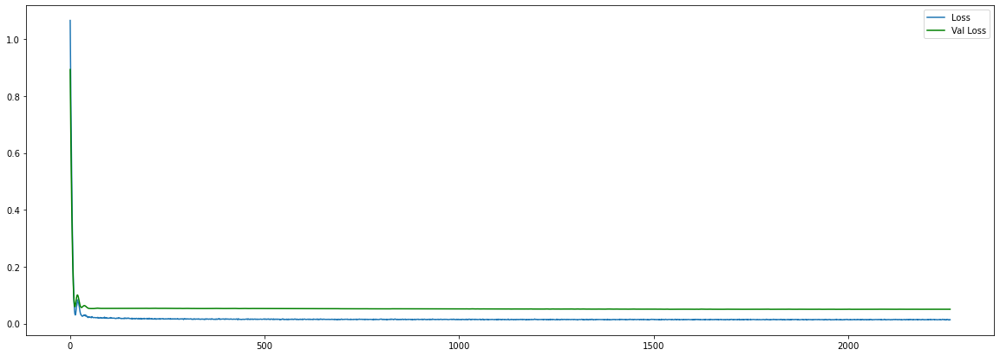

final loss: 0.013654530048370361
final val_loss: 0.05036057159304619


In [ ]:
build_and_train_all_model(VIC_data_processor, VIC_predictor)

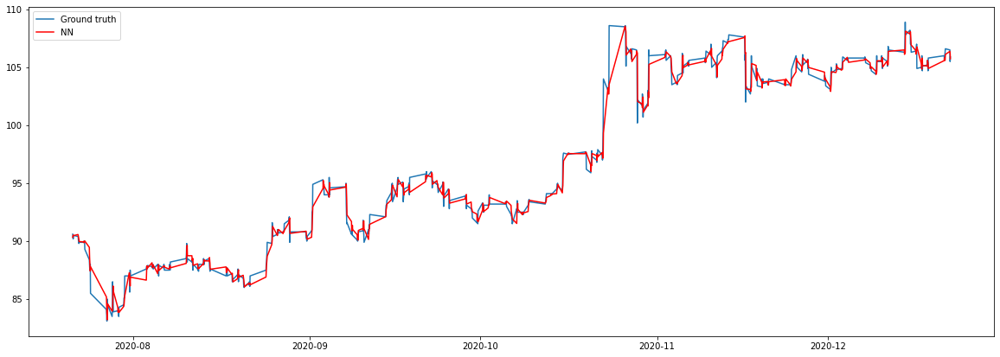

Simple NN
MSE:  0.6533653736114502
MAE:  0.49529377


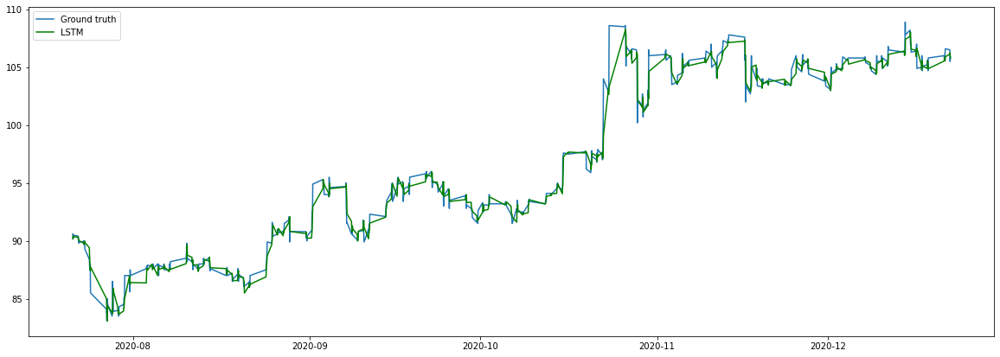

Simple LSTM
MSE:  0.6683753132820129
MAE:  0.50705


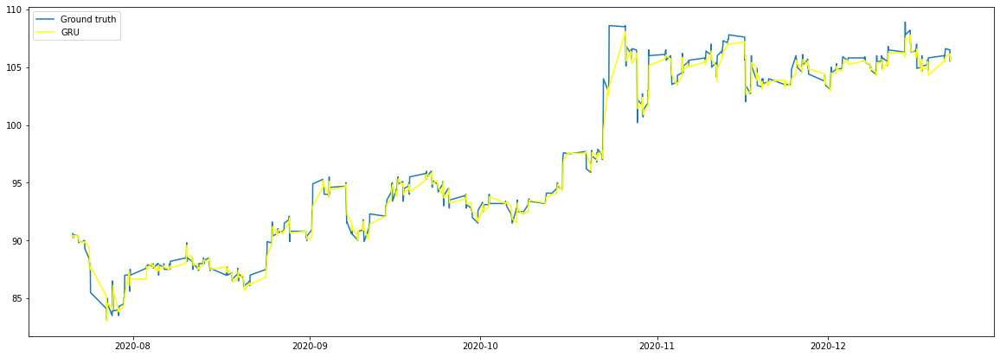

Simple GRU
MSE:  0.6591110229492188
MAE:  0.51140505


In [ ]:
evaluate_all_model(VIC_data_processor, VIC_predictor)

## Predict 1D

### FPT

In [ ]:
FPT_data_processor = DataProcessor('FPT', FPT, '1D')
FPT_predictor = StockPredictor(FPT_data_processor.stock_name, FPT_data_processor.timeDelta)

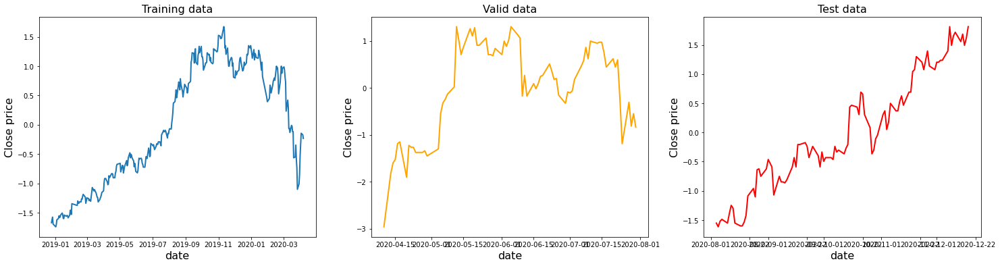

In [ ]:
FPT_data_processor.visualize_train_val_test_df()

Get best hyperparameter for simple NN


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


INFO:tensorflow:Oracle triggered exit
Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 1, 5)]            0         
_________________________________________________________________
flatten (Flatten)            (None, 5)                 0         
_________________________________________________________________
dense (Dense)                (None, 48)                288       
_________________________________________________________________
dropout (Dropout)            (None, 48)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 49        
Total params: 337
Trainable params: 337
Non-trainable params: 0
_________________________________________________________________
Start training simple NN
Epoch 1/2500
1/1 [==============================] - ETA: 0s - loss

Epoch 00028: val_loss improved from 0.18745 to 0.18383, saving model to FPT_1D_NN.hdf5
Epoch 29/2500
1/1 [==============================] - ETA: 0s - loss: 0.1302 - mae: 0.280 - 0s 18ms/step - loss: 0.1302 - mae: 0.2809 - val_loss: 0.1808 - val_mae: 0.3001

Epoch 00029: val_loss improved from 0.18383 to 0.18079, saving model to FPT_1D_NN.hdf5
Epoch 30/2500
1/1 [==============================] - ETA: 0s - loss: 0.1260 - mae: 0.277 - 0s 17ms/step - loss: 0.1260 - mae: 0.2776 - val_loss: 0.1781 - val_mae: 0.2978

Epoch 00030: val_loss improved from 0.18079 to 0.17814, saving model to FPT_1D_NN.hdf5
Epoch 31/2500
1/1 [==============================] - ETA: 0s - loss: 0.1377 - mae: 0.289 - 0s 19ms/step - loss: 0.1377 - mae: 0.2892 - val_loss: 0.1758 - val_mae: 0.2955

Epoch 00031: val_loss improved from 0.17814 to 0.17581, saving model to FPT_1D_NN.hdf5
Epoch 32/2500
1/1 [==============================] - ETA: 0s - loss: 0.1399 - mae: 0.291 - 0s 21ms/step - loss: 0.1399 - mae: 0.2917 - val_

1/1 [==============================] - ETA: 0s - loss: 0.0916 - mae: 0.232 - 0s 17ms/step - loss: 0.0916 - mae: 0.2320 - val_loss: 0.1617 - val_mae: 0.2715

Epoch 00062: val_loss did not improve from 0.15860
Epoch 63/2500
1/1 [==============================] - ETA: 0s - loss: 0.1082 - mae: 0.251 - 0s 16ms/step - loss: 0.1082 - mae: 0.2512 - val_loss: 0.1617 - val_mae: 0.2717

Epoch 00063: val_loss did not improve from 0.15860
Epoch 64/2500
1/1 [==============================] - ETA: 0s - loss: 0.0900 - mae: 0.227 - 0s 16ms/step - loss: 0.0900 - mae: 0.2272 - val_loss: 0.1615 - val_mae: 0.2715

Epoch 00064: val_loss did not improve from 0.15860
Epoch 65/2500
1/1 [==============================] - ETA: 0s - loss: 0.0978 - mae: 0.233 - 0s 17ms/step - loss: 0.0978 - mae: 0.2332 - val_loss: 0.1612 - val_mae: 0.2711

Epoch 00065: val_loss did not improve from 0.15860
Epoch 66/2500
1/1 [==============================] - ETA: 0s - loss: 0.1103 - mae: 0.252 - 0s 16ms/step - loss: 0.1103 - mae: 

1/1 [==============================] - ETA: 0s - loss: 0.0832 - mae: 0.227 - 0s 18ms/step - loss: 0.0832 - mae: 0.2278 - val_loss: 0.1555 - val_mae: 0.2645

Epoch 00096: val_loss improved from 0.15558 to 0.15548, saving model to FPT_1D_NN.hdf5
Epoch 97/2500
1/1 [==============================] - ETA: 0s - loss: 0.0989 - mae: 0.246 - 0s 17ms/step - loss: 0.0989 - mae: 0.2462 - val_loss: 0.1554 - val_mae: 0.2644

Epoch 00097: val_loss improved from 0.15548 to 0.15542, saving model to FPT_1D_NN.hdf5
Epoch 98/2500
1/1 [==============================] - ETA: 0s - loss: 0.0807 - mae: 0.222 - 0s 17ms/step - loss: 0.0807 - mae: 0.2221 - val_loss: 0.1555 - val_mae: 0.2645

Epoch 00098: val_loss did not improve from 0.15542
Epoch 99/2500
1/1 [==============================] - ETA: 0s - loss: 0.0946 - mae: 0.234 - 0s 17ms/step - loss: 0.0946 - mae: 0.2348 - val_loss: 0.1556 - val_mae: 0.2647

Epoch 00099: val_loss did not improve from 0.15542
Epoch 100/2500
1/1 [==============================] - 

Epoch 00129: val_loss improved from 0.15257 to 0.15249, saving model to FPT_1D_NN.hdf5
Epoch 130/2500
1/1 [==============================] - ETA: 0s - loss: 0.0918 - mae: 0.233 - 0s 18ms/step - loss: 0.0918 - mae: 0.2337 - val_loss: 0.1524 - val_mae: 0.2613

Epoch 00130: val_loss improved from 0.15249 to 0.15235, saving model to FPT_1D_NN.hdf5
Epoch 131/2500
1/1 [==============================] - ETA: 0s - loss: 0.0884 - mae: 0.222 - 0s 18ms/step - loss: 0.0884 - mae: 0.2220 - val_loss: 0.1522 - val_mae: 0.2613

Epoch 00131: val_loss improved from 0.15235 to 0.15224, saving model to FPT_1D_NN.hdf5
Epoch 132/2500
1/1 [==============================] - ETA: 0s - loss: 0.1023 - mae: 0.247 - 0s 17ms/step - loss: 0.1023 - mae: 0.2471 - val_loss: 0.1522 - val_mae: 0.2613

Epoch 00132: val_loss improved from 0.15224 to 0.15216, saving model to FPT_1D_NN.hdf5
Epoch 133/2500
1/1 [==============================] - ETA: 0s - loss: 0.0863 - mae: 0.225 - 0s 17ms/step - loss: 0.0863 - mae: 0.2257 - 


Epoch 00164: val_loss did not improve from 0.15101
Epoch 165/2500
1/1 [==============================] - ETA: 0s - loss: 0.0745 - mae: 0.207 - 0s 18ms/step - loss: 0.0745 - mae: 0.2079 - val_loss: 0.1521 - val_mae: 0.2631

Epoch 00165: val_loss did not improve from 0.15101
Epoch 166/2500
1/1 [==============================] - ETA: 0s - loss: 0.0864 - mae: 0.227 - 0s 18ms/step - loss: 0.0864 - mae: 0.2271 - val_loss: 0.1522 - val_mae: 0.2634

Epoch 00166: val_loss did not improve from 0.15101
Epoch 167/2500
1/1 [==============================] - ETA: 0s - loss: 0.0782 - mae: 0.212 - 0s 17ms/step - loss: 0.0782 - mae: 0.2126 - val_loss: 0.1522 - val_mae: 0.2636

Epoch 00167: val_loss did not improve from 0.15101
Epoch 168/2500
1/1 [==============================] - ETA: 0s - loss: 0.0716 - mae: 0.198 - 0s 16ms/step - loss: 0.0716 - mae: 0.1981 - val_loss: 0.1521 - val_mae: 0.2636

Epoch 00168: val_loss did not improve from 0.15101
Epoch 169/2500
1/1 [==============================] - ET

Epoch 00198: val_loss did not improve from 0.14891
Epoch 199/2500
1/1 [==============================] - ETA: 0s - loss: 0.0602 - mae: 0.189 - 0s 18ms/step - loss: 0.0602 - mae: 0.1899 - val_loss: 0.1493 - val_mae: 0.2613

Epoch 00199: val_loss did not improve from 0.14891
Epoch 200/2500
1/1 [==============================] - ETA: 0s - loss: 0.0692 - mae: 0.201 - 0s 16ms/step - loss: 0.0692 - mae: 0.2013 - val_loss: 0.1493 - val_mae: 0.2612

Epoch 00200: val_loss did not improve from 0.14891
Epoch 201/2500
1/1 [==============================] - ETA: 0s - loss: 0.0770 - mae: 0.210 - 0s 16ms/step - loss: 0.0770 - mae: 0.2101 - val_loss: 0.1492 - val_mae: 0.2610

Epoch 00201: val_loss did not improve from 0.14891
Epoch 202/2500
1/1 [==============================] - ETA: 0s - loss: 0.0629 - mae: 0.197 - 0s 16ms/step - loss: 0.0629 - mae: 0.1976 - val_loss: 0.1490 - val_mae: 0.2607

Epoch 00202: val_loss did not improve from 0.14891
Epoch 203/2500
1/1 [==============================] - ETA

1/1 [==============================] - ETA: 0s - loss: 0.0584 - mae: 0.182 - 0s 17ms/step - loss: 0.0584 - mae: 0.1821 - val_loss: 0.1458 - val_mae: 0.2563

Epoch 00231: val_loss did not improve from 0.14571
Epoch 232/2500
1/1 [==============================] - ETA: 0s - loss: 0.0653 - mae: 0.196 - 0s 18ms/step - loss: 0.0653 - mae: 0.1960 - val_loss: 0.1458 - val_mae: 0.2564

Epoch 00232: val_loss did not improve from 0.14571
Epoch 233/2500
1/1 [==============================] - ETA: 0s - loss: 0.0655 - mae: 0.199 - 0s 27ms/step - loss: 0.0655 - mae: 0.1991 - val_loss: 0.1459 - val_mae: 0.2565

Epoch 00233: val_loss did not improve from 0.14571
Epoch 234/2500
1/1 [==============================] - ETA: 0s - loss: 0.0657 - mae: 0.198 - 0s 19ms/step - loss: 0.0657 - mae: 0.1980 - val_loss: 0.1460 - val_mae: 0.2566

Epoch 00234: val_loss did not improve from 0.14571
Epoch 235/2500
1/1 [==============================] - ETA: 0s - loss: 0.0651 - mae: 0.194 - 0s 18ms/step - loss: 0.0651 - m

1/1 [==============================] - ETA: 0s - loss: 0.0568 - mae: 0.185 - 0s 16ms/step - loss: 0.0568 - mae: 0.1850 - val_loss: 0.1439 - val_mae: 0.2549

Epoch 00265: val_loss did not improve from 0.14361
Epoch 266/2500
1/1 [==============================] - ETA: 0s - loss: 0.0700 - mae: 0.202 - 0s 15ms/step - loss: 0.0700 - mae: 0.2024 - val_loss: 0.1439 - val_mae: 0.2549

Epoch 00266: val_loss did not improve from 0.14361
Epoch 267/2500
1/1 [==============================] - ETA: 0s - loss: 0.0531 - mae: 0.177 - 0s 17ms/step - loss: 0.0531 - mae: 0.1778 - val_loss: 0.1440 - val_mae: 0.2550

Epoch 00267: val_loss did not improve from 0.14361
Epoch 268/2500
1/1 [==============================] - ETA: 0s - loss: 0.0557 - mae: 0.178 - 0s 17ms/step - loss: 0.0557 - mae: 0.1789 - val_loss: 0.1441 - val_mae: 0.2551

Epoch 00268: val_loss did not improve from 0.14361
Epoch 269/2500
1/1 [==============================] - ETA: 0s - loss: 0.0530 - mae: 0.177 - 0s 17ms/step - loss: 0.0530 - m


Epoch 00298: val_loss improved from 0.14178 to 0.14157, saving model to FPT_1D_NN.hdf5
Epoch 299/2500
1/1 [==============================] - ETA: 0s - loss: 0.0517 - mae: 0.179 - 0s 16ms/step - loss: 0.0517 - mae: 0.1798 - val_loss: 0.1413 - val_mae: 0.2524

Epoch 00299: val_loss improved from 0.14157 to 0.14134, saving model to FPT_1D_NN.hdf5
Epoch 300/2500
1/1 [==============================] - ETA: 0s - loss: 0.0581 - mae: 0.177 - 0s 18ms/step - loss: 0.0581 - mae: 0.1777 - val_loss: 0.1411 - val_mae: 0.2521

Epoch 00300: val_loss improved from 0.14134 to 0.14113, saving model to FPT_1D_NN.hdf5
Epoch 301/2500
1/1 [==============================] - ETA: 0s - loss: 0.0590 - mae: 0.182 - 0s 17ms/step - loss: 0.0590 - mae: 0.1822 - val_loss: 0.1409 - val_mae: 0.2516

Epoch 00301: val_loss improved from 0.14113 to 0.14092, saving model to FPT_1D_NN.hdf5
Epoch 302/2500
1/1 [==============================] - ETA: 0s - loss: 0.0550 - mae: 0.180 - 0s 19ms/step - loss: 0.0550 - mae: 0.1800 -

Epoch 00332: val_loss improved from 0.13967 to 0.13963, saving model to FPT_1D_NN.hdf5
Epoch 333/2500
1/1 [==============================] - ETA: 0s - loss: 0.0525 - mae: 0.178 - 0s 18ms/step - loss: 0.0525 - mae: 0.1782 - val_loss: 0.1396 - val_mae: 0.2507

Epoch 00333: val_loss improved from 0.13963 to 0.13959, saving model to FPT_1D_NN.hdf5
Epoch 334/2500
1/1 [==============================] - ETA: 0s - loss: 0.0478 - mae: 0.173 - 0s 18ms/step - loss: 0.0478 - mae: 0.1735 - val_loss: 0.1395 - val_mae: 0.2507

Epoch 00334: val_loss improved from 0.13959 to 0.13949, saving model to FPT_1D_NN.hdf5
Epoch 335/2500
1/1 [==============================] - ETA: 0s - loss: 0.0561 - mae: 0.181 - 0s 17ms/step - loss: 0.0561 - mae: 0.1815 - val_loss: 0.1394 - val_mae: 0.2506

Epoch 00335: val_loss improved from 0.13949 to 0.13938, saving model to FPT_1D_NN.hdf5
Epoch 336/2500
1/1 [==============================] - ETA: 0s - loss: 0.0508 - mae: 0.178 - 0s 17ms/step - loss: 0.0508 - mae: 0.1785 - 

Epoch 00365: val_loss improved from 0.13773 to 0.13768, saving model to FPT_1D_NN.hdf5
Epoch 366/2500
1/1 [==============================] - ETA: 0s - loss: 0.0476 - mae: 0.164 - 0s 17ms/step - loss: 0.0476 - mae: 0.1644 - val_loss: 0.1377 - val_mae: 0.2488

Epoch 00366: val_loss improved from 0.13768 to 0.13767, saving model to FPT_1D_NN.hdf5
Epoch 367/2500
1/1 [==============================] - ETA: 0s - loss: 0.0480 - mae: 0.170 - 0s 17ms/step - loss: 0.0480 - mae: 0.1708 - val_loss: 0.1377 - val_mae: 0.2489

Epoch 00367: val_loss did not improve from 0.13767
Epoch 368/2500
1/1 [==============================] - ETA: 0s - loss: 0.0464 - mae: 0.160 - 0s 16ms/step - loss: 0.0464 - mae: 0.1608 - val_loss: 0.1377 - val_mae: 0.2490

Epoch 00368: val_loss did not improve from 0.13767
Epoch 369/2500
1/1 [==============================] - ETA: 0s - loss: 0.0446 - mae: 0.156 - 0s 16ms/step - loss: 0.0446 - mae: 0.1562 - val_loss: 0.1378 - val_mae: 0.2490

Epoch 00369: val_loss did not improv

1/1 [==============================] - ETA: 0s - loss: 0.0502 - mae: 0.170 - 0s 17ms/step - loss: 0.0502 - mae: 0.1701 - val_loss: 0.1372 - val_mae: 0.2483

Epoch 00401: val_loss improved from 0.13729 to 0.13718, saving model to FPT_1D_NN.hdf5
Epoch 402/2500
1/1 [==============================] - ETA: 0s - loss: 0.0392 - mae: 0.151 - 0s 17ms/step - loss: 0.0392 - mae: 0.1518 - val_loss: 0.1371 - val_mae: 0.2481

Epoch 00402: val_loss improved from 0.13718 to 0.13706, saving model to FPT_1D_NN.hdf5
Epoch 403/2500
1/1 [==============================] - ETA: 0s - loss: 0.0435 - mae: 0.162 - 0s 16ms/step - loss: 0.0435 - mae: 0.1628 - val_loss: 0.1369 - val_mae: 0.2479

Epoch 00403: val_loss improved from 0.13706 to 0.13690, saving model to FPT_1D_NN.hdf5
Epoch 404/2500
1/1 [==============================] - ETA: 0s - loss: 0.0391 - mae: 0.150 - 0s 17ms/step - loss: 0.0391 - mae: 0.1509 - val_loss: 0.1368 - val_mae: 0.2478

Epoch 00404: val_loss improved from 0.13690 to 0.13677, saving mod

1/1 [==============================] - ETA: 0s - loss: 0.0411 - mae: 0.157 - 0s 17ms/step - loss: 0.0411 - mae: 0.1574 - val_loss: 0.1351 - val_mae: 0.2468

Epoch 00434: val_loss did not improve from 0.13502
Epoch 435/2500
1/1 [==============================] - ETA: 0s - loss: 0.0430 - mae: 0.162 - 0s 17ms/step - loss: 0.0430 - mae: 0.1623 - val_loss: 0.1351 - val_mae: 0.2467

Epoch 00435: val_loss did not improve from 0.13502
Epoch 436/2500
1/1 [==============================] - ETA: 0s - loss: 0.0436 - mae: 0.157 - 0s 16ms/step - loss: 0.0436 - mae: 0.1571 - val_loss: 0.1350 - val_mae: 0.2466

Epoch 00436: val_loss improved from 0.13502 to 0.13501, saving model to FPT_1D_NN.hdf5
Epoch 437/2500
1/1 [==============================] - ETA: 0s - loss: 0.0419 - mae: 0.155 - 0s 17ms/step - loss: 0.0419 - mae: 0.1552 - val_loss: 0.1350 - val_mae: 0.2465

Epoch 00437: val_loss improved from 0.13501 to 0.13497, saving model to FPT_1D_NN.hdf5
Epoch 438/2500
1/1 [==============================]

Epoch 468/2500
1/1 [==============================] - ETA: 0s - loss: 0.0410 - mae: 0.151 - 0s 17ms/step - loss: 0.0410 - mae: 0.1516 - val_loss: 0.1350 - val_mae: 0.2474

Epoch 00468: val_loss did not improve from 0.13443
Epoch 469/2500
1/1 [==============================] - ETA: 0s - loss: 0.0358 - mae: 0.145 - 0s 16ms/step - loss: 0.0358 - mae: 0.1452 - val_loss: 0.1350 - val_mae: 0.2473

Epoch 00469: val_loss did not improve from 0.13443
Epoch 470/2500
1/1 [==============================] - ETA: 0s - loss: 0.0349 - mae: 0.146 - 0s 17ms/step - loss: 0.0349 - mae: 0.1464 - val_loss: 0.1349 - val_mae: 0.2472

Epoch 00470: val_loss did not improve from 0.13443
Epoch 471/2500
1/1 [==============================] - ETA: 0s - loss: 0.0338 - mae: 0.141 - 0s 16ms/step - loss: 0.0338 - mae: 0.1411 - val_loss: 0.1348 - val_mae: 0.2469

Epoch 00471: val_loss did not improve from 0.13443
Epoch 472/2500
1/1 [==============================] - ETA: 0s - loss: 0.0339 - mae: 0.142 - 0s 18ms/step - l

Epoch 502/2500
1/1 [==============================] - ETA: 0s - loss: 0.0336 - mae: 0.137 - 0s 16ms/step - loss: 0.0336 - mae: 0.1374 - val_loss: 0.1336 - val_mae: 0.2463

Epoch 00502: val_loss did not improve from 0.13343
Epoch 503/2500
1/1 [==============================] - ETA: 0s - loss: 0.0363 - mae: 0.143 - 0s 17ms/step - loss: 0.0363 - mae: 0.1433 - val_loss: 0.1337 - val_mae: 0.2465

Epoch 00503: val_loss did not improve from 0.13343
Epoch 504/2500
1/1 [==============================] - ETA: 0s - loss: 0.0348 - mae: 0.136 - 0s 17ms/step - loss: 0.0348 - mae: 0.1361 - val_loss: 0.1338 - val_mae: 0.2466

Epoch 00504: val_loss did not improve from 0.13343
Epoch 505/2500
1/1 [==============================] - ETA: 0s - loss: 0.0340 - mae: 0.143 - 0s 16ms/step - loss: 0.0340 - mae: 0.1432 - val_loss: 0.1339 - val_mae: 0.2468

Epoch 00505: val_loss did not improve from 0.13343
Epoch 506/2500
1/1 [==============================] - ETA: 0s - loss: 0.0292 - mae: 0.132 - 0s 16ms/step - l


Epoch 00536: val_loss improved from 0.13261 to 0.13259, saving model to FPT_1D_NN.hdf5
Epoch 537/2500
1/1 [==============================] - ETA: 0s - loss: 0.0345 - mae: 0.139 - 0s 16ms/step - loss: 0.0345 - mae: 0.1396 - val_loss: 0.1326 - val_mae: 0.2464

Epoch 00537: val_loss did not improve from 0.13259
Epoch 538/2500
1/1 [==============================] - ETA: 0s - loss: 0.0361 - mae: 0.146 - 0s 18ms/step - loss: 0.0361 - mae: 0.1464 - val_loss: 0.1326 - val_mae: 0.2464

Epoch 00538: val_loss did not improve from 0.13259
Epoch 539/2500
1/1 [==============================] - ETA: 0s - loss: 0.0297 - mae: 0.129 - 0s 17ms/step - loss: 0.0297 - mae: 0.1290 - val_loss: 0.1326 - val_mae: 0.2463

Epoch 00539: val_loss did not improve from 0.13259
Epoch 540/2500
1/1 [==============================] - ETA: 0s - loss: 0.0315 - mae: 0.132 - 0s 18ms/step - loss: 0.0315 - mae: 0.1323 - val_loss: 0.1326 - val_mae: 0.2463

Epoch 00540: val_loss did not improve from 0.13259
Epoch 541/2500
1/1 [


Epoch 00571: val_loss did not improve from 0.13071
Epoch 572/2500
1/1 [==============================] - ETA: 0s - loss: 0.0293 - mae: 0.128 - 0s 17ms/step - loss: 0.0293 - mae: 0.1285 - val_loss: 0.1323 - val_mae: 0.2461

Epoch 00572: val_loss did not improve from 0.13071
Epoch 573/2500
1/1 [==============================] - ETA: 0s - loss: 0.0317 - mae: 0.134 - 0s 18ms/step - loss: 0.0317 - mae: 0.1344 - val_loss: 0.1326 - val_mae: 0.2465

Epoch 00573: val_loss did not improve from 0.13071
Epoch 574/2500
1/1 [==============================] - ETA: 0s - loss: 0.0290 - mae: 0.129 - 0s 16ms/step - loss: 0.0290 - mae: 0.1292 - val_loss: 0.1327 - val_mae: 0.2467

Epoch 00574: val_loss did not improve from 0.13071
Epoch 575/2500
1/1 [==============================] - ETA: 0s - loss: 0.0309 - mae: 0.135 - 0s 17ms/step - loss: 0.0309 - mae: 0.1359 - val_loss: 0.1328 - val_mae: 0.2469

Epoch 00575: val_loss did not improve from 0.13071
Epoch 576/2500
1/1 [==============================] - ET


Epoch 00608: val_loss did not improve from 0.13071
Epoch 609/2500
1/1 [==============================] - ETA: 0s - loss: 0.0306 - mae: 0.134 - 0s 17ms/step - loss: 0.0306 - mae: 0.1346 - val_loss: 0.1318 - val_mae: 0.2470

Epoch 00609: val_loss did not improve from 0.13071
Epoch 610/2500
1/1 [==============================] - ETA: 0s - loss: 0.0257 - mae: 0.121 - 0s 16ms/step - loss: 0.0257 - mae: 0.1216 - val_loss: 0.1318 - val_mae: 0.2469

Epoch 00610: val_loss did not improve from 0.13071
Epoch 611/2500
1/1 [==============================] - ETA: 0s - loss: 0.0306 - mae: 0.138 - 0s 16ms/step - loss: 0.0306 - mae: 0.1381 - val_loss: 0.1317 - val_mae: 0.2469

Epoch 00611: val_loss did not improve from 0.13071
Epoch 612/2500
1/1 [==============================] - ETA: 0s - loss: 0.0285 - mae: 0.128 - 0s 4ms/step - loss: 0.0285 - mae: 0.1282 - val_loss: 0.1317 - val_mae: 0.2469

Epoch 00612: val_loss did not improve from 0.13071
Epoch 613/2500
1/1 [==============================] - ETA

1/1 [==============================] - ETA: 0s - loss: 0.0301 - mae: 0.128 - 0s 17ms/step - loss: 0.0301 - mae: 0.1288 - val_loss: 0.1302 - val_mae: 0.2459

Epoch 00644: val_loss did not improve from 0.13004
Epoch 645/2500
1/1 [==============================] - ETA: 0s - loss: 0.0257 - mae: 0.120 - 0s 16ms/step - loss: 0.0257 - mae: 0.1208 - val_loss: 0.1302 - val_mae: 0.2460

Epoch 00645: val_loss did not improve from 0.13004
Epoch 646/2500
1/1 [==============================] - ETA: 0s - loss: 0.0262 - mae: 0.123 - 0s 16ms/step - loss: 0.0262 - mae: 0.1233 - val_loss: 0.1303 - val_mae: 0.2461

Epoch 00646: val_loss did not improve from 0.13004
Epoch 647/2500
1/1 [==============================] - ETA: 0s - loss: 0.0290 - mae: 0.128 - 0s 16ms/step - loss: 0.0290 - mae: 0.1282 - val_loss: 0.1304 - val_mae: 0.2462

Epoch 00647: val_loss did not improve from 0.13004
Epoch 648/2500
1/1 [==============================] - ETA: 0s - loss: 0.0257 - mae: 0.116 - 0s 16ms/step - loss: 0.0257 - m


Epoch 00680: val_loss did not improve from 0.12990
Epoch 681/2500
1/1 [==============================] - ETA: 0s - loss: 0.0265 - mae: 0.118 - 0s 18ms/step - loss: 0.0265 - mae: 0.1182 - val_loss: 0.1299 - val_mae: 0.2467

Epoch 00681: val_loss did not improve from 0.12990
Epoch 682/2500
1/1 [==============================] - ETA: 0s - loss: 0.0246 - mae: 0.119 - 0s 18ms/step - loss: 0.0246 - mae: 0.1193 - val_loss: 0.1299 - val_mae: 0.2467

Epoch 00682: val_loss did not improve from 0.12990
Epoch 683/2500
1/1 [==============================] - ETA: 0s - loss: 0.0264 - mae: 0.123 - 0s 20ms/step - loss: 0.0264 - mae: 0.1238 - val_loss: 0.1300 - val_mae: 0.2468

Epoch 00683: val_loss did not improve from 0.12990
Epoch 684/2500
1/1 [==============================] - ETA: 0s - loss: 0.0247 - mae: 0.115 - 0s 18ms/step - loss: 0.0247 - mae: 0.1159 - val_loss: 0.1300 - val_mae: 0.2469

Epoch 00684: val_loss did not improve from 0.12990
Epoch 685/2500
1/1 [==============================] - ET


Epoch 00717: val_loss did not improve from 0.12990
Epoch 718/2500
1/1 [==============================] - ETA: 0s - loss: 0.0272 - mae: 0.125 - 0s 19ms/step - loss: 0.0272 - mae: 0.1256 - val_loss: 0.1299 - val_mae: 0.2464

Epoch 00718: val_loss did not improve from 0.12990
Epoch 719/2500
1/1 [==============================] - ETA: 0s - loss: 0.0268 - mae: 0.123 - 0s 19ms/step - loss: 0.0268 - mae: 0.1234 - val_loss: 0.1299 - val_mae: 0.2463

Epoch 00719: val_loss improved from 0.12990 to 0.12987, saving model to FPT_1D_NN.hdf5
Epoch 720/2500
1/1 [==============================] - ETA: 0s - loss: 0.0273 - mae: 0.123 - 0s 18ms/step - loss: 0.0273 - mae: 0.1237 - val_loss: 0.1298 - val_mae: 0.2463

Epoch 00720: val_loss improved from 0.12987 to 0.12982, saving model to FPT_1D_NN.hdf5
Epoch 721/2500
1/1 [==============================] - ETA: 0s - loss: 0.0268 - mae: 0.126 - 0s 18ms/step - loss: 0.0268 - mae: 0.1263 - val_loss: 0.1297 - val_mae: 0.2463

Epoch 00721: val_loss improved from


Epoch 00753: val_loss did not improve from 0.12950
Epoch 754/2500
1/1 [==============================] - ETA: 0s - loss: 0.0240 - mae: 0.117 - 0s 16ms/step - loss: 0.0240 - mae: 0.1174 - val_loss: 0.1303 - val_mae: 0.2485

Epoch 00754: val_loss did not improve from 0.12950
Epoch 755/2500
1/1 [==============================] - ETA: 0s - loss: 0.0255 - mae: 0.123 - 0s 17ms/step - loss: 0.0255 - mae: 0.1230 - val_loss: 0.1302 - val_mae: 0.2484

Epoch 00755: val_loss did not improve from 0.12950
Epoch 756/2500
1/1 [==============================] - ETA: 0s - loss: 0.0235 - mae: 0.113 - 0s 16ms/step - loss: 0.0235 - mae: 0.1133 - val_loss: 0.1301 - val_mae: 0.2484

Epoch 00756: val_loss did not improve from 0.12950
Epoch 757/2500
1/1 [==============================] - ETA: 0s - loss: 0.0238 - mae: 0.113 - 0s 17ms/step - loss: 0.0238 - mae: 0.1139 - val_loss: 0.1301 - val_mae: 0.2484

Epoch 00757: val_loss did not improve from 0.12950
Epoch 758/2500
1/1 [==============================] - ET


Epoch 00790: val_loss did not improve from 0.12950
Epoch 791/2500
1/1 [==============================] - ETA: 0s - loss: 0.0219 - mae: 0.110 - 0s 17ms/step - loss: 0.0219 - mae: 0.1108 - val_loss: 0.1299 - val_mae: 0.2480

Epoch 00791: val_loss did not improve from 0.12950
Epoch 792/2500
1/1 [==============================] - ETA: 0s - loss: 0.0259 - mae: 0.111 - 0s 17ms/step - loss: 0.0259 - mae: 0.1119 - val_loss: 0.1299 - val_mae: 0.2480

Epoch 00792: val_loss did not improve from 0.12950
Epoch 793/2500
1/1 [==============================] - ETA: 0s - loss: 0.0220 - mae: 0.114 - 0s 16ms/step - loss: 0.0220 - mae: 0.1146 - val_loss: 0.1299 - val_mae: 0.2481

Epoch 00793: val_loss did not improve from 0.12950
Epoch 794/2500
1/1 [==============================] - ETA: 0s - loss: 0.0276 - mae: 0.128 - 0s 17ms/step - loss: 0.0276 - mae: 0.1281 - val_loss: 0.1300 - val_mae: 0.2482

Epoch 00794: val_loss did not improve from 0.12950
Epoch 795/2500
1/1 [==============================] - ET


Epoch 00827: val_loss did not improve from 0.12950
Epoch 828/2500
1/1 [==============================] - ETA: 0s - loss: 0.0214 - mae: 0.111 - 0s 17ms/step - loss: 0.0214 - mae: 0.1113 - val_loss: 0.1299 - val_mae: 0.2485

Epoch 00828: val_loss did not improve from 0.12950
Epoch 829/2500
1/1 [==============================] - ETA: 0s - loss: 0.0225 - mae: 0.114 - 0s 17ms/step - loss: 0.0225 - mae: 0.1148 - val_loss: 0.1299 - val_mae: 0.2484

Epoch 00829: val_loss did not improve from 0.12950
Epoch 830/2500
1/1 [==============================] - ETA: 0s - loss: 0.0235 - mae: 0.115 - 0s 17ms/step - loss: 0.0235 - mae: 0.1151 - val_loss: 0.1298 - val_mae: 0.2484

Epoch 00830: val_loss did not improve from 0.12950
Epoch 831/2500
1/1 [==============================] - ETA: 0s - loss: 0.0218 - mae: 0.109 - 0s 16ms/step - loss: 0.0218 - mae: 0.1096 - val_loss: 0.1297 - val_mae: 0.2483

Epoch 00831: val_loss did not improve from 0.12950
Epoch 832/2500
1/1 [==============================] - ET

1/1 [==============================] - ETA: 0s - loss: 0.0205 - mae: 0.108 - 0s 17ms/step - loss: 0.0205 - mae: 0.1082 - val_loss: 0.1297 - val_mae: 0.2487

Epoch 00863: val_loss did not improve from 0.12920
Epoch 864/2500
1/1 [==============================] - ETA: 0s - loss: 0.0232 - mae: 0.113 - 0s 18ms/step - loss: 0.0232 - mae: 0.1133 - val_loss: 0.1296 - val_mae: 0.2486

Epoch 00864: val_loss did not improve from 0.12920
Epoch 865/2500
1/1 [==============================] - ETA: 0s - loss: 0.0210 - mae: 0.108 - 0s 17ms/step - loss: 0.0210 - mae: 0.1082 - val_loss: 0.1295 - val_mae: 0.2485

Epoch 00865: val_loss did not improve from 0.12920
Epoch 866/2500
1/1 [==============================] - ETA: 0s - loss: 0.0215 - mae: 0.110 - 0s 16ms/step - loss: 0.0215 - mae: 0.1101 - val_loss: 0.1295 - val_mae: 0.2484

Epoch 00866: val_loss did not improve from 0.12920
Epoch 867/2500
1/1 [==============================] - ETA: 0s - loss: 0.0247 - mae: 0.119 - 0s 17ms/step - loss: 0.0247 - m

Epoch 00899: val_loss did not improve from 0.12920
Epoch 900/2500
1/1 [==============================] - ETA: 0s - loss: 0.0229 - mae: 0.112 - 0s 17ms/step - loss: 0.0229 - mae: 0.1124 - val_loss: 0.1298 - val_mae: 0.2486

Epoch 00900: val_loss did not improve from 0.12920
Epoch 901/2500
1/1 [==============================] - ETA: 0s - loss: 0.0199 - mae: 0.107 - 0s 17ms/step - loss: 0.0199 - mae: 0.1079 - val_loss: 0.1299 - val_mae: 0.2487

Epoch 00901: val_loss did not improve from 0.12920
Epoch 902/2500
1/1 [==============================] - ETA: 0s - loss: 0.0215 - mae: 0.112 - 0s 16ms/step - loss: 0.0215 - mae: 0.1121 - val_loss: 0.1300 - val_mae: 0.2490

Epoch 00902: val_loss did not improve from 0.12920
Epoch 903/2500
1/1 [==============================] - ETA: 0s - loss: 0.0247 - mae: 0.116 - 0s 17ms/step - loss: 0.0247 - mae: 0.1168 - val_loss: 0.1301 - val_mae: 0.2492

Epoch 00903: val_loss did not improve from 0.12920
Epoch 904/2500
1/1 [==============================] - ETA


Epoch 00936: val_loss did not improve from 0.12920
Epoch 937/2500
1/1 [==============================] - ETA: 0s - loss: 0.0218 - mae: 0.111 - 0s 17ms/step - loss: 0.0218 - mae: 0.1114 - val_loss: 0.1293 - val_mae: 0.2485

Epoch 00937: val_loss did not improve from 0.12920
Epoch 938/2500
1/1 [==============================] - ETA: 0s - loss: 0.0209 - mae: 0.106 - 0s 17ms/step - loss: 0.0209 - mae: 0.1061 - val_loss: 0.1293 - val_mae: 0.2485

Epoch 00938: val_loss did not improve from 0.12920
Epoch 939/2500
1/1 [==============================] - ETA: 0s - loss: 0.0233 - mae: 0.112 - 0s 17ms/step - loss: 0.0233 - mae: 0.1121 - val_loss: 0.1294 - val_mae: 0.2487

Epoch 00939: val_loss did not improve from 0.12920
Epoch 940/2500
1/1 [==============================] - ETA: 0s - loss: 0.0210 - mae: 0.108 - 0s 16ms/step - loss: 0.0210 - mae: 0.1088 - val_loss: 0.1296 - val_mae: 0.2488

Epoch 00940: val_loss did not improve from 0.12920
Epoch 941/2500
1/1 [==============================] - ET


Epoch 00973: val_loss did not improve from 0.12920
Epoch 974/2500
1/1 [==============================] - ETA: 0s - loss: 0.0231 - mae: 0.113 - 0s 17ms/step - loss: 0.0231 - mae: 0.1134 - val_loss: 0.1302 - val_mae: 0.2499

Epoch 00974: val_loss did not improve from 0.12920
Epoch 975/2500
1/1 [==============================] - ETA: 0s - loss: 0.0225 - mae: 0.109 - 0s 17ms/step - loss: 0.0225 - mae: 0.1095 - val_loss: 0.1302 - val_mae: 0.2498

Epoch 00975: val_loss did not improve from 0.12920
Epoch 976/2500
1/1 [==============================] - ETA: 0s - loss: 0.0224 - mae: 0.110 - 0s 17ms/step - loss: 0.0224 - mae: 0.1101 - val_loss: 0.1302 - val_mae: 0.2498

Epoch 00976: val_loss did not improve from 0.12920
Epoch 977/2500
1/1 [==============================] - ETA: 0s - loss: 0.0211 - mae: 0.111 - 0s 17ms/step - loss: 0.0211 - mae: 0.1110 - val_loss: 0.1301 - val_mae: 0.2498

Epoch 00977: val_loss did not improve from 0.12920
Epoch 978/2500
1/1 [==============================] - ET


Epoch 01010: val_loss did not improve from 0.12920
Epoch 1011/2500
1/1 [==============================] - ETA: 0s - loss: 0.0225 - mae: 0.115 - 0s 16ms/step - loss: 0.0225 - mae: 0.1157 - val_loss: 0.1298 - val_mae: 0.2499

Epoch 01011: val_loss did not improve from 0.12920
Epoch 1012/2500
1/1 [==============================] - ETA: 0s - loss: 0.0201 - mae: 0.107 - 0s 16ms/step - loss: 0.0201 - mae: 0.1075 - val_loss: 0.1297 - val_mae: 0.2499

Epoch 01012: val_loss did not improve from 0.12920
Epoch 1013/2500
1/1 [==============================] - ETA: 0s - loss: 0.0207 - mae: 0.108 - 0s 17ms/step - loss: 0.0207 - mae: 0.1089 - val_loss: 0.1297 - val_mae: 0.2499

Epoch 01013: val_loss did not improve from 0.12920
Epoch 1014/2500
1/1 [==============================] - ETA: 0s - loss: 0.0207 - mae: 0.113 - 0s 17ms/step - loss: 0.0207 - mae: 0.1136 - val_loss: 0.1295 - val_mae: 0.2497

Epoch 01014: val_loss did not improve from 0.12920
Epoch 1015/2500
1/1 [==============================]

1/1 [==============================] - ETA: 0s - loss: 0.0184 - mae: 0.105 - 0s 17ms/step - loss: 0.0184 - mae: 0.1056 - val_loss: 0.1295 - val_mae: 0.2499

Epoch 01047: val_loss did not improve from 0.12920
Epoch 1048/2500
1/1 [==============================] - ETA: 0s - loss: 0.0197 - mae: 0.103 - 0s 17ms/step - loss: 0.0197 - mae: 0.1037 - val_loss: 0.1295 - val_mae: 0.2500

Epoch 01048: val_loss did not improve from 0.12920
Epoch 1049/2500
1/1 [==============================] - ETA: 0s - loss: 0.0192 - mae: 0.105 - 0s 17ms/step - loss: 0.0192 - mae: 0.1055 - val_loss: 0.1296 - val_mae: 0.2501

Epoch 01049: val_loss did not improve from 0.12920
Epoch 1050/2500
1/1 [==============================] - ETA: 0s - loss: 0.0238 - mae: 0.116 - 0s 16ms/step - loss: 0.0238 - mae: 0.1163 - val_loss: 0.1297 - val_mae: 0.2502

Epoch 01050: val_loss did not improve from 0.12920
Epoch 1051/2500
1/1 [==============================] - ETA: 0s - loss: 0.0186 - mae: 0.101 - 0s 17ms/step - loss: 0.0186


Epoch 01083: val_loss did not improve from 0.12920
Epoch 1084/2500
1/1 [==============================] - ETA: 0s - loss: 0.0209 - mae: 0.112 - 0s 16ms/step - loss: 0.0209 - mae: 0.1122 - val_loss: 0.1301 - val_mae: 0.2505

Epoch 01084: val_loss did not improve from 0.12920
Epoch 1085/2500
1/1 [==============================] - ETA: 0s - loss: 0.0210 - mae: 0.109 - 0s 10ms/step - loss: 0.0210 - mae: 0.1098 - val_loss: 0.1300 - val_mae: 0.2504

Epoch 01085: val_loss did not improve from 0.12920
Epoch 1086/2500
1/1 [==============================] - ETA: 0s - loss: 0.0200 - mae: 0.106 - 0s 28ms/step - loss: 0.0200 - mae: 0.1063 - val_loss: 0.1300 - val_mae: 0.2504

Epoch 01086: val_loss did not improve from 0.12920
Epoch 1087/2500
1/1 [==============================] - ETA: 0s - loss: 0.0206 - mae: 0.108 - 0s 17ms/step - loss: 0.0206 - mae: 0.1088 - val_loss: 0.1300 - val_mae: 0.2505

Epoch 01087: val_loss did not improve from 0.12920
Epoch 1088/2500
1/1 [==============================]

Epoch 01119: val_loss did not improve from 0.12920
Epoch 1120/2500
1/1 [==============================] - ETA: 0s - loss: 0.0203 - mae: 0.107 - 0s 16ms/step - loss: 0.0203 - mae: 0.1071 - val_loss: 0.1301 - val_mae: 0.2508

Epoch 01120: val_loss did not improve from 0.12920
Epoch 1121/2500
1/1 [==============================] - ETA: 0s - loss: 0.0188 - mae: 0.098 - 0s 17ms/step - loss: 0.0188 - mae: 0.0988 - val_loss: 0.1302 - val_mae: 0.2508

Epoch 01121: val_loss did not improve from 0.12920
Epoch 1122/2500
1/1 [==============================] - ETA: 0s - loss: 0.0199 - mae: 0.105 - 0s 16ms/step - loss: 0.0199 - mae: 0.1055 - val_loss: 0.1301 - val_mae: 0.2508

Epoch 01122: val_loss did not improve from 0.12920
Epoch 1123/2500
1/1 [==============================] - ETA: 0s - loss: 0.0212 - mae: 0.112 - 0s 17ms/step - loss: 0.0212 - mae: 0.1122 - val_loss: 0.1301 - val_mae: 0.2507

Epoch 01123: val_loss did not improve from 0.12920
Epoch 1124/2500
1/1 [==============================] 

1/1 [==============================] - ETA: 0s - loss: 0.0206 - mae: 0.108 - 0s 25ms/step - loss: 0.0206 - mae: 0.1084 - val_loss: 0.1312 - val_mae: 0.2523

Epoch 01156: val_loss did not improve from 0.12920
Epoch 1157/2500
1/1 [==============================] - ETA: 0s - loss: 0.0219 - mae: 0.111 - 0s 17ms/step - loss: 0.0219 - mae: 0.1115 - val_loss: 0.1312 - val_mae: 0.2522

Epoch 01157: val_loss did not improve from 0.12920
Epoch 1158/2500
1/1 [==============================] - ETA: 0s - loss: 0.0202 - mae: 0.107 - 0s 16ms/step - loss: 0.0202 - mae: 0.1070 - val_loss: 0.1311 - val_mae: 0.2520

Epoch 01158: val_loss did not improve from 0.12920
Epoch 1159/2500
1/1 [==============================] - ETA: 0s - loss: 0.0202 - mae: 0.105 - 0s 17ms/step - loss: 0.0202 - mae: 0.1055 - val_loss: 0.1310 - val_mae: 0.2519

Epoch 01159: val_loss did not improve from 0.12920
Epoch 1160/2500
1/1 [==============================] - ETA: 0s - loss: 0.0197 - mae: 0.103 - 0s 16ms/step - loss: 0.0197


Epoch 01192: val_loss did not improve from 0.12920
Epoch 1193/2500
1/1 [==============================] - ETA: 0s - loss: 0.0198 - mae: 0.106 - 0s 17ms/step - loss: 0.0198 - mae: 0.1068 - val_loss: 0.1306 - val_mae: 0.2519

Epoch 01193: val_loss did not improve from 0.12920
Epoch 1194/2500
1/1 [==============================] - ETA: 0s - loss: 0.0205 - mae: 0.107 - 0s 17ms/step - loss: 0.0205 - mae: 0.1071 - val_loss: 0.1306 - val_mae: 0.2519

Epoch 01194: val_loss did not improve from 0.12920
Epoch 1195/2500
1/1 [==============================] - ETA: 0s - loss: 0.0191 - mae: 0.103 - 0s 16ms/step - loss: 0.0191 - mae: 0.1034 - val_loss: 0.1306 - val_mae: 0.2519

Epoch 01195: val_loss did not improve from 0.12920
Epoch 1196/2500
1/1 [==============================] - ETA: 0s - loss: 0.0200 - mae: 0.105 - 0s 16ms/step - loss: 0.0200 - mae: 0.1050 - val_loss: 0.1306 - val_mae: 0.2518

Epoch 01196: val_loss did not improve from 0.12920
Epoch 1197/2500
1/1 [==============================]

1/1 [==============================] - ETA: 0s - loss: 0.0185 - mae: 0.105 - 0s 18ms/step - loss: 0.0185 - mae: 0.1058 - val_loss: 0.1313 - val_mae: 0.2526

Epoch 01229: val_loss did not improve from 0.12920
Epoch 1230/2500
1/1 [==============================] - ETA: 0s - loss: 0.0204 - mae: 0.108 - 0s 17ms/step - loss: 0.0204 - mae: 0.1083 - val_loss: 0.1313 - val_mae: 0.2526

Epoch 01230: val_loss did not improve from 0.12920
Epoch 1231/2500
1/1 [==============================] - ETA: 0s - loss: 0.0200 - mae: 0.105 - 0s 16ms/step - loss: 0.0200 - mae: 0.1050 - val_loss: 0.1312 - val_mae: 0.2525

Epoch 01231: val_loss did not improve from 0.12920
Epoch 1232/2500
1/1 [==============================] - ETA: 0s - loss: 0.0192 - mae: 0.104 - 0s 17ms/step - loss: 0.0192 - mae: 0.1046 - val_loss: 0.1310 - val_mae: 0.2524

Epoch 01232: val_loss did not improve from 0.12920
Epoch 1233/2500
1/1 [==============================] - ETA: 0s - loss: 0.0193 - mae: 0.105 - 0s 17ms/step - loss: 0.0193


Epoch 01265: val_loss did not improve from 0.12920
Epoch 1266/2500
1/1 [==============================] - ETA: 0s - loss: 0.0183 - mae: 0.102 - 0s 17ms/step - loss: 0.0183 - mae: 0.1029 - val_loss: 0.1311 - val_mae: 0.2521

Epoch 01266: val_loss did not improve from 0.12920
Epoch 1267/2500
1/1 [==============================] - ETA: 0s - loss: 0.0200 - mae: 0.103 - 0s 17ms/step - loss: 0.0200 - mae: 0.1038 - val_loss: 0.1308 - val_mae: 0.2518

Epoch 01267: val_loss did not improve from 0.12920
Epoch 1268/2500
1/1 [==============================] - ETA: 0s - loss: 0.0186 - mae: 0.101 - 0s 16ms/step - loss: 0.0186 - mae: 0.1019 - val_loss: 0.1307 - val_mae: 0.2516

Epoch 01268: val_loss did not improve from 0.12920
Epoch 1269/2500
1/1 [==============================] - ETA: 0s - loss: 0.0202 - mae: 0.105 - 0s 16ms/step - loss: 0.0202 - mae: 0.1051 - val_loss: 0.1306 - val_mae: 0.2514

Epoch 01269: val_loss did not improve from 0.12920
Epoch 1270/2500
1/1 [==============================]

1/1 [==============================] - ETA: 0s - loss: 0.0200 - mae: 0.107 - 0s 16ms/step - loss: 0.0200 - mae: 0.1075 - val_loss: 0.1311 - val_mae: 0.2523

Epoch 01302: val_loss did not improve from 0.12920
Epoch 1303/2500
1/1 [==============================] - ETA: 0s - loss: 0.0197 - mae: 0.107 - 0s 16ms/step - loss: 0.0197 - mae: 0.1079 - val_loss: 0.1310 - val_mae: 0.2521

Epoch 01303: val_loss did not improve from 0.12920
Epoch 1304/2500
1/1 [==============================] - ETA: 0s - loss: 0.0205 - mae: 0.108 - 0s 17ms/step - loss: 0.0205 - mae: 0.1089 - val_loss: 0.1309 - val_mae: 0.2520

Epoch 01304: val_loss did not improve from 0.12920
Epoch 1305/2500
1/1 [==============================] - ETA: 0s - loss: 0.0177 - mae: 0.100 - 0s 16ms/step - loss: 0.0177 - mae: 0.1004 - val_loss: 0.1309 - val_mae: 0.2521

Epoch 01305: val_loss did not improve from 0.12920
Epoch 1306/2500
1/1 [==============================] - ETA: 0s - loss: 0.0182 - mae: 0.103 - 0s 16ms/step - loss: 0.0182


Epoch 01338: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.

Epoch 01338: val_loss did not improve from 0.12920
Epoch 1339/2500
1/1 [==============================] - ETA: 0s - loss: 0.0187 - mae: 0.102 - 0s 17ms/step - loss: 0.0187 - mae: 0.1029 - val_loss: 0.1314 - val_mae: 0.2525

Epoch 01339: val_loss did not improve from 0.12920
Epoch 1340/2500
1/1 [==============================] - ETA: 0s - loss: 0.0182 - mae: 0.103 - 0s 17ms/step - loss: 0.0182 - mae: 0.1034 - val_loss: 0.1313 - val_mae: 0.2525

Epoch 01340: val_loss did not improve from 0.12920
Epoch 1341/2500
1/1 [==============================] - ETA: 0s - loss: 0.0168 - mae: 0.100 - 0s 16ms/step - loss: 0.0168 - mae: 0.1002 - val_loss: 0.1313 - val_mae: 0.2524
Restoring model weights from the end of the best epoch.

Epoch 01341: val_loss did not improve from 0.12920
Epoch 01341: early stopping


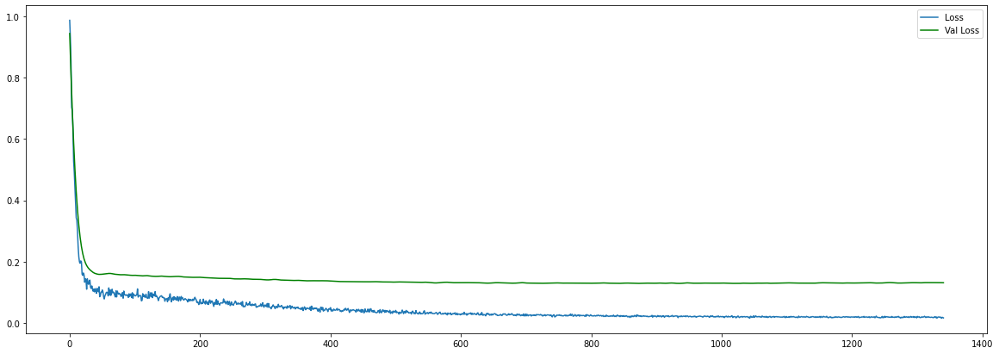

final loss: 0.016767697408795357
final val_loss: 0.1313050091266632
Get best hyperparameter for simple LSTM


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


INFO:tensorflow:Oracle triggered exit
Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 1, 5)]            0         
_________________________________________________________________
lstm (LSTM)                  (None, 1, 64)             17920     
_________________________________________________________________
lstm_1 (LSTM)                (None, 1, 64)             33024     
_________________________________________________________________
lstm_2 (LSTM)                (None, 64)                33024     
_________________________________________________________________
dense (Dense)                (None, 40)                2600      
_________________________________________________________________
dense_1 (Dense)              (None, 40)                1640      
_________________________________________________________________
dense_2 (Dense)        

1/1 [==============================] - ETA: 0s - loss: 0.0570 - mae: 0.187 - 0s 32ms/step - loss: 0.0570 - mae: 0.1871 - val_loss: 0.2211 - val_mae: 0.3475

Epoch 00027: val_loss did not improve from 0.14864
Epoch 28/2500
1/1 [==============================] - ETA: 0s - loss: 0.1164 - mae: 0.285 - 0s 23ms/step - loss: 0.1164 - mae: 0.2859 - val_loss: 0.2592 - val_mae: 0.3881

Epoch 00028: val_loss did not improve from 0.14864
Epoch 29/2500
1/1 [==============================] - ETA: 0s - loss: 0.1627 - mae: 0.347 - 0s 24ms/step - loss: 0.1627 - mae: 0.3478 - val_loss: 0.2624 - val_mae: 0.3927

Epoch 00029: val_loss did not improve from 0.14864
Epoch 30/2500
1/1 [==============================] - ETA: 0s - loss: 0.1669 - mae: 0.354 - 0s 24ms/step - loss: 0.1669 - mae: 0.3546 - val_loss: 0.2373 - val_mae: 0.3687

Epoch 00030: val_loss did not improve from 0.14864
Epoch 31/2500
1/1 [==============================] - ETA: 0s - loss: 0.1370 - mae: 0.319 - 0s 25ms/step - loss: 0.1370 - mae: 

1/1 [==============================] - ETA: 0s - loss: 0.0206 - mae: 0.111 - 0s 24ms/step - loss: 0.0206 - mae: 0.1113 - val_loss: 0.1436 - val_mae: 0.2597

Epoch 00063: val_loss did not improve from 0.14335
Epoch 64/2500
1/1 [==============================] - ETA: 0s - loss: 0.0208 - mae: 0.112 - 0s 23ms/step - loss: 0.0208 - mae: 0.1121 - val_loss: 0.1430 - val_mae: 0.2591

Epoch 00064: val_loss improved from 0.14335 to 0.14295, saving model to FPT_1D_LSTM.hdf5
Epoch 65/2500
1/1 [==============================] - ETA: 0s - loss: 0.0203 - mae: 0.110 - 0s 24ms/step - loss: 0.0203 - mae: 0.1105 - val_loss: 0.1421 - val_mae: 0.2582

Epoch 00065: val_loss improved from 0.14295 to 0.14214, saving model to FPT_1D_LSTM.hdf5
Epoch 66/2500
1/1 [==============================] - ETA: 0s - loss: 0.0195 - mae: 0.107 - 0s 28ms/step - loss: 0.0195 - mae: 0.1071 - val_loss: 0.1413 - val_mae: 0.2574

Epoch 00066: val_loss improved from 0.14214 to 0.14131, saving model to FPT_1D_LSTM.hdf5
Epoch 67/250

1/1 [==============================] - ETA: 0s - loss: 0.0153 - mae: 0.085 - 0s 24ms/step - loss: 0.0153 - mae: 0.0854 - val_loss: 0.1377 - val_mae: 0.2539

Epoch 00097: val_loss did not improve from 0.13693
Epoch 98/2500
1/1 [==============================] - ETA: 0s - loss: 0.0152 - mae: 0.085 - 0s 23ms/step - loss: 0.0152 - mae: 0.0852 - val_loss: 0.1374 - val_mae: 0.2535

Epoch 00098: val_loss did not improve from 0.13693
Epoch 99/2500
1/1 [==============================] - ETA: 0s - loss: 0.0151 - mae: 0.085 - 0s 23ms/step - loss: 0.0151 - mae: 0.0852 - val_loss: 0.1371 - val_mae: 0.2531

Epoch 00099: val_loss did not improve from 0.13693
Epoch 100/2500
1/1 [==============================] - ETA: 0s - loss: 0.0151 - mae: 0.085 - 0s 23ms/step - loss: 0.0151 - mae: 0.0852 - val_loss: 0.1369 - val_mae: 0.2527

Epoch 00100: val_loss improved from 0.13693 to 0.13689, saving model to FPT_1D_LSTM.hdf5
Epoch 101/2500
1/1 [==============================] - ETA: 0s - loss: 0.0151 - mae: 0.0

Epoch 00132: val_loss did not improve from 0.13641
Epoch 133/2500
1/1 [==============================] - ETA: 0s - loss: 0.0144 - mae: 0.083 - 0s 26ms/step - loss: 0.0144 - mae: 0.0831 - val_loss: 0.1373 - val_mae: 0.2540

Epoch 00133: val_loss did not improve from 0.13641
Epoch 134/2500
1/1 [==============================] - ETA: 0s - loss: 0.0144 - mae: 0.083 - 0s 28ms/step - loss: 0.0144 - mae: 0.0830 - val_loss: 0.1372 - val_mae: 0.2539

Epoch 00134: val_loss did not improve from 0.13641
Epoch 135/2500
1/1 [==============================] - ETA: 0s - loss: 0.0144 - mae: 0.083 - 0s 26ms/step - loss: 0.0144 - mae: 0.0830 - val_loss: 0.1372 - val_mae: 0.2539

Epoch 00135: val_loss did not improve from 0.13641
Epoch 136/2500
1/1 [==============================] - ETA: 0s - loss: 0.0143 - mae: 0.083 - 0s 29ms/step - loss: 0.0143 - mae: 0.0830 - val_loss: 0.1372 - val_mae: 0.2538

Epoch 00136: val_loss did not improve from 0.13641
Epoch 137/2500
1/1 [==============================] - ETA


Epoch 00169: val_loss did not improve from 0.13641
Epoch 170/2500
1/1 [==============================] - ETA: 0s - loss: 0.0140 - mae: 0.082 - 0s 23ms/step - loss: 0.0140 - mae: 0.0823 - val_loss: 0.1381 - val_mae: 0.2544

Epoch 00170: val_loss did not improve from 0.13641
Epoch 171/2500
1/1 [==============================] - ETA: 0s - loss: 0.0140 - mae: 0.082 - 0s 24ms/step - loss: 0.0140 - mae: 0.0823 - val_loss: 0.1381 - val_mae: 0.2544

Epoch 00171: val_loss did not improve from 0.13641
Epoch 172/2500
1/1 [==============================] - ETA: 0s - loss: 0.0140 - mae: 0.082 - 0s 23ms/step - loss: 0.0140 - mae: 0.0823 - val_loss: 0.1381 - val_mae: 0.2544

Epoch 00172: val_loss did not improve from 0.13641
Epoch 173/2500
1/1 [==============================] - ETA: 0s - loss: 0.0140 - mae: 0.082 - 0s 24ms/step - loss: 0.0140 - mae: 0.0823 - val_loss: 0.1381 - val_mae: 0.2544

Epoch 00173: val_loss did not improve from 0.13641
Epoch 174/2500
1/1 [==============================] - ET


Epoch 00206: val_loss did not improve from 0.13641
Epoch 207/2500
1/1 [==============================] - ETA: 0s - loss: 0.0138 - mae: 0.081 - 0s 24ms/step - loss: 0.0138 - mae: 0.0818 - val_loss: 0.1385 - val_mae: 0.2542

Epoch 00207: val_loss did not improve from 0.13641
Epoch 208/2500
1/1 [==============================] - ETA: 0s - loss: 0.0138 - mae: 0.081 - 0s 23ms/step - loss: 0.0138 - mae: 0.0818 - val_loss: 0.1385 - val_mae: 0.2542

Epoch 00208: val_loss did not improve from 0.13641
Epoch 209/2500
1/1 [==============================] - ETA: 0s - loss: 0.0138 - mae: 0.081 - 0s 24ms/step - loss: 0.0138 - mae: 0.0817 - val_loss: 0.1385 - val_mae: 0.2542

Epoch 00209: val_loss did not improve from 0.13641
Epoch 210/2500
1/1 [==============================] - ETA: 0s - loss: 0.0138 - mae: 0.081 - 0s 23ms/step - loss: 0.0138 - mae: 0.0817 - val_loss: 0.1385 - val_mae: 0.2542

Epoch 00210: val_loss did not improve from 0.13641
Epoch 211/2500
1/1 [==============================] - ET


Epoch 00243: val_loss did not improve from 0.13641
Epoch 244/2500
1/1 [==============================] - ETA: 0s - loss: 0.0137 - mae: 0.081 - 0s 24ms/step - loss: 0.0137 - mae: 0.0811 - val_loss: 0.1384 - val_mae: 0.2537

Epoch 00244: val_loss did not improve from 0.13641
Epoch 245/2500
1/1 [==============================] - ETA: 0s - loss: 0.0137 - mae: 0.081 - 0s 23ms/step - loss: 0.0137 - mae: 0.0816 - val_loss: 0.1384 - val_mae: 0.2535

Epoch 00245: val_loss did not improve from 0.13641
Epoch 246/2500
1/1 [==============================] - ETA: 0s - loss: 0.0136 - mae: 0.081 - 0s 23ms/step - loss: 0.0136 - mae: 0.0812 - val_loss: 0.1384 - val_mae: 0.2535

Epoch 00246: val_loss did not improve from 0.13641
Epoch 247/2500
1/1 [==============================] - ETA: 0s - loss: 0.0136 - mae: 0.081 - 0s 24ms/step - loss: 0.0136 - mae: 0.0810 - val_loss: 0.1383 - val_mae: 0.2536

Epoch 00247: val_loss did not improve from 0.13641
Epoch 248/2500
1/1 [==============================] - ET


Epoch 00280: val_loss did not improve from 0.13641
Epoch 281/2500
1/1 [==============================] - ETA: 0s - loss: 0.0135 - mae: 0.080 - 0s 24ms/step - loss: 0.0135 - mae: 0.0806 - val_loss: 0.1380 - val_mae: 0.2527

Epoch 00281: val_loss did not improve from 0.13641
Epoch 282/2500
1/1 [==============================] - ETA: 0s - loss: 0.0135 - mae: 0.080 - 0s 25ms/step - loss: 0.0135 - mae: 0.0805 - val_loss: 0.1380 - val_mae: 0.2526

Epoch 00282: val_loss did not improve from 0.13641
Epoch 283/2500
1/1 [==============================] - ETA: 0s - loss: 0.0134 - mae: 0.080 - 0s 24ms/step - loss: 0.0134 - mae: 0.0805 - val_loss: 0.1379 - val_mae: 0.2526

Epoch 00283: val_loss did not improve from 0.13641
Epoch 284/2500
1/1 [==============================] - ETA: 0s - loss: 0.0134 - mae: 0.080 - 0s 23ms/step - loss: 0.0134 - mae: 0.0805 - val_loss: 0.1379 - val_mae: 0.2526

Epoch 00284: val_loss did not improve from 0.13641
Epoch 285/2500
1/1 [==============================] - ET


Epoch 00317: val_loss did not improve from 0.13641
Epoch 318/2500
1/1 [==============================] - ETA: 0s - loss: 0.0133 - mae: 0.080 - 0s 25ms/step - loss: 0.0133 - mae: 0.0800 - val_loss: 0.1375 - val_mae: 0.2518

Epoch 00318: val_loss did not improve from 0.13641
Epoch 319/2500
1/1 [==============================] - ETA: 0s - loss: 0.0133 - mae: 0.079 - 0s 28ms/step - loss: 0.0133 - mae: 0.0799 - val_loss: 0.1375 - val_mae: 0.2518

Epoch 00319: val_loss did not improve from 0.13641
Epoch 320/2500
1/1 [==============================] - ETA: 0s - loss: 0.0133 - mae: 0.079 - 0s 24ms/step - loss: 0.0133 - mae: 0.0799 - val_loss: 0.1375 - val_mae: 0.2518

Epoch 00320: val_loss did not improve from 0.13641
Epoch 321/2500
1/1 [==============================] - ETA: 0s - loss: 0.0133 - mae: 0.079 - 0s 26ms/step - loss: 0.0133 - mae: 0.0799 - val_loss: 0.1375 - val_mae: 0.2518

Epoch 00321: val_loss did not improve from 0.13641
Epoch 322/2500
1/1 [==============================] - ET


Epoch 00354: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00354: val_loss did not improve from 0.13641
Epoch 355/2500
1/1 [==============================] - ETA: 0s - loss: 0.0132 - mae: 0.079 - 0s 28ms/step - loss: 0.0132 - mae: 0.0794 - val_loss: 0.1371 - val_mae: 0.2515

Epoch 00355: val_loss did not improve from 0.13641
Epoch 356/2500
1/1 [==============================] - ETA: 0s - loss: 0.0132 - mae: 0.079 - 0s 28ms/step - loss: 0.0132 - mae: 0.0794 - val_loss: 0.1371 - val_mae: 0.2515

Epoch 00356: val_loss did not improve from 0.13641
Epoch 357/2500
1/1 [==============================] - ETA: 0s - loss: 0.0132 - mae: 0.079 - 0s 29ms/step - loss: 0.0132 - mae: 0.0794 - val_loss: 0.1370 - val_mae: 0.2516

Epoch 00357: val_loss did not improve from 0.13641
Epoch 358/2500
1/1 [==============================] - ETA: 0s - loss: 0.0132 - mae: 0.079 - 0s 31ms/step - loss: 0.0132 - mae: 0.0794 - val_loss: 0.1370 - val_mae: 0.2516

Epoch 00358: val_loss did 

1/1 [==============================] - ETA: 0s - loss: 0.0131 - mae: 0.079 - 0s 26ms/step - loss: 0.0131 - mae: 0.0792 - val_loss: 0.1368 - val_mae: 0.2516

Epoch 00391: val_loss did not improve from 0.13641
Epoch 392/2500
1/1 [==============================] - ETA: 0s - loss: 0.0131 - mae: 0.079 - 0s 38ms/step - loss: 0.0131 - mae: 0.0792 - val_loss: 0.1368 - val_mae: 0.2516

Epoch 00392: val_loss did not improve from 0.13641
Epoch 393/2500
1/1 [==============================] - ETA: 0s - loss: 0.0131 - mae: 0.079 - 0s 31ms/step - loss: 0.0131 - mae: 0.0792 - val_loss: 0.1368 - val_mae: 0.2516

Epoch 00393: val_loss did not improve from 0.13641
Epoch 394/2500
1/1 [==============================] - ETA: 0s - loss: 0.0131 - mae: 0.079 - 0s 29ms/step - loss: 0.0131 - mae: 0.0792 - val_loss: 0.1368 - val_mae: 0.2516

Epoch 00394: val_loss did not improve from 0.13641
Epoch 395/2500
1/1 [==============================] - ETA: 0s - loss: 0.0131 - mae: 0.079 - 0s 30ms/step - loss: 0.0131 - m

Epoch 00427: val_loss did not improve from 0.13641
Epoch 428/2500
1/1 [==============================] - ETA: 0s - loss: 0.0130 - mae: 0.079 - 0s 25ms/step - loss: 0.0130 - mae: 0.0790 - val_loss: 0.1366 - val_mae: 0.2517

Epoch 00428: val_loss did not improve from 0.13641
Epoch 429/2500
1/1 [==============================] - ETA: 0s - loss: 0.0130 - mae: 0.078 - 0s 26ms/step - loss: 0.0130 - mae: 0.0789 - val_loss: 0.1366 - val_mae: 0.2517

Epoch 00429: val_loss did not improve from 0.13641
Epoch 430/2500
1/1 [==============================] - ETA: 0s - loss: 0.0130 - mae: 0.078 - 0s 29ms/step - loss: 0.0130 - mae: 0.0789 - val_loss: 0.1366 - val_mae: 0.2517

Epoch 00430: val_loss did not improve from 0.13641
Epoch 431/2500
1/1 [==============================] - ETA: 0s - loss: 0.0130 - mae: 0.078 - 0s 28ms/step - loss: 0.0130 - mae: 0.0789 - val_loss: 0.1366 - val_mae: 0.2517

Epoch 00431: val_loss did not improve from 0.13641
Epoch 432/2500
1/1 [==============================] - ETA

1/1 [==============================] - ETA: 0s - loss: 0.0130 - mae: 0.078 - 0s 28ms/step - loss: 0.0130 - mae: 0.0787 - val_loss: 0.1364 - val_mae: 0.2518

Epoch 00463: val_loss improved from 0.13636 to 0.13636, saving model to FPT_1D_LSTM.hdf5
Epoch 464/2500
1/1 [==============================] - ETA: 0s - loss: 0.0130 - mae: 0.078 - 0s 26ms/step - loss: 0.0130 - mae: 0.0787 - val_loss: 0.1363 - val_mae: 0.2518

Epoch 00464: val_loss improved from 0.13636 to 0.13635, saving model to FPT_1D_LSTM.hdf5
Epoch 465/2500
1/1 [==============================] - ETA: 0s - loss: 0.0130 - mae: 0.078 - 0s 29ms/step - loss: 0.0130 - mae: 0.0787 - val_loss: 0.1363 - val_mae: 0.2518

Epoch 00465: val_loss improved from 0.13635 to 0.13634, saving model to FPT_1D_LSTM.hdf5
Epoch 466/2500
1/1 [==============================] - ETA: 0s - loss: 0.0130 - mae: 0.078 - 0s 29ms/step - loss: 0.0130 - mae: 0.0787 - val_loss: 0.1363 - val_mae: 0.2518

Epoch 00466: val_loss improved from 0.13634 to 0.13634, savi


Epoch 00494: val_loss improved from 0.13615 to 0.13615, saving model to FPT_1D_LSTM.hdf5
Epoch 495/2500
1/1 [==============================] - ETA: 0s - loss: 0.0129 - mae: 0.078 - 0s 24ms/step - loss: 0.0129 - mae: 0.0786 - val_loss: 0.1361 - val_mae: 0.2518

Epoch 00495: val_loss improved from 0.13615 to 0.13614, saving model to FPT_1D_LSTM.hdf5
Epoch 496/2500
1/1 [==============================] - ETA: 0s - loss: 0.0129 - mae: 0.078 - 0s 23ms/step - loss: 0.0129 - mae: 0.0785 - val_loss: 0.1361 - val_mae: 0.2518

Epoch 00496: val_loss improved from 0.13614 to 0.13613, saving model to FPT_1D_LSTM.hdf5
Epoch 497/2500
1/1 [==============================] - ETA: 0s - loss: 0.0129 - mae: 0.078 - 0s 24ms/step - loss: 0.0129 - mae: 0.0785 - val_loss: 0.1361 - val_mae: 0.2518

Epoch 00497: val_loss improved from 0.13613 to 0.13613, saving model to FPT_1D_LSTM.hdf5
Epoch 498/2500
1/1 [==============================] - ETA: 0s - loss: 0.0129 - mae: 0.078 - 0s 19ms/step - loss: 0.0129 - mae: 

Epoch 526/2500
1/1 [==============================] - ETA: 0s - loss: 0.0129 - mae: 0.078 - 0s 24ms/step - loss: 0.0129 - mae: 0.0784 - val_loss: 0.1359 - val_mae: 0.2519

Epoch 00526: val_loss improved from 0.13594 to 0.13593, saving model to FPT_1D_LSTM.hdf5
Epoch 527/2500
1/1 [==============================] - ETA: 0s - loss: 0.0129 - mae: 0.078 - 0s 25ms/step - loss: 0.0129 - mae: 0.0784 - val_loss: 0.1359 - val_mae: 0.2519

Epoch 00527: val_loss improved from 0.13593 to 0.13592, saving model to FPT_1D_LSTM.hdf5
Epoch 528/2500
1/1 [==============================] - ETA: 0s - loss: 0.0129 - mae: 0.078 - 0s 24ms/step - loss: 0.0129 - mae: 0.0784 - val_loss: 0.1359 - val_mae: 0.2519

Epoch 00528: val_loss improved from 0.13592 to 0.13592, saving model to FPT_1D_LSTM.hdf5
Epoch 529/2500
1/1 [==============================] - ETA: 0s - loss: 0.0128 - mae: 0.078 - 0s 23ms/step - loss: 0.0128 - mae: 0.0784 - val_loss: 0.1359 - val_mae: 0.2519

Epoch 00529: val_loss improved from 0.13592 t


Epoch 00557: val_loss improved from 0.13573 to 0.13572, saving model to FPT_1D_LSTM.hdf5
Epoch 558/2500
1/1 [==============================] - ETA: 0s - loss: 0.0128 - mae: 0.078 - 0s 27ms/step - loss: 0.0128 - mae: 0.0782 - val_loss: 0.1357 - val_mae: 0.2520

Epoch 00558: val_loss improved from 0.13572 to 0.13571, saving model to FPT_1D_LSTM.hdf5
Epoch 559/2500
1/1 [==============================] - ETA: 0s - loss: 0.0128 - mae: 0.078 - 0s 26ms/step - loss: 0.0128 - mae: 0.0782 - val_loss: 0.1357 - val_mae: 0.2520

Epoch 00559: val_loss improved from 0.13571 to 0.13571, saving model to FPT_1D_LSTM.hdf5
Epoch 560/2500
1/1 [==============================] - ETA: 0s - loss: 0.0128 - mae: 0.078 - 0s 25ms/step - loss: 0.0128 - mae: 0.0782 - val_loss: 0.1357 - val_mae: 0.2520

Epoch 00560: val_loss improved from 0.13571 to 0.13570, saving model to FPT_1D_LSTM.hdf5
Epoch 561/2500
1/1 [==============================] - ETA: 0s - loss: 0.0128 - mae: 0.078 - 0s 24ms/step - loss: 0.0128 - mae: 

Epoch 589/2500
1/1 [==============================] - ETA: 0s - loss: 0.0127 - mae: 0.078 - 0s 22ms/step - loss: 0.0127 - mae: 0.0781 - val_loss: 0.1355 - val_mae: 0.2520

Epoch 00589: val_loss improved from 0.13551 to 0.13551, saving model to FPT_1D_LSTM.hdf5
Epoch 590/2500
1/1 [==============================] - ETA: 0s - loss: 0.0127 - mae: 0.078 - 0s 23ms/step - loss: 0.0127 - mae: 0.0781 - val_loss: 0.1355 - val_mae: 0.2520

Epoch 00590: val_loss improved from 0.13551 to 0.13550, saving model to FPT_1D_LSTM.hdf5
Epoch 591/2500
1/1 [==============================] - ETA: 0s - loss: 0.0127 - mae: 0.078 - 0s 39ms/step - loss: 0.0127 - mae: 0.0781 - val_loss: 0.1355 - val_mae: 0.2520

Epoch 00591: val_loss improved from 0.13550 to 0.13549, saving model to FPT_1D_LSTM.hdf5
Epoch 592/2500
1/1 [==============================] - ETA: 0s - loss: 0.0127 - mae: 0.078 - 0s 24ms/step - loss: 0.0127 - mae: 0.0781 - val_loss: 0.1355 - val_mae: 0.2521

Epoch 00592: val_loss improved from 0.13549 t


Epoch 00620: val_loss improved from 0.13531 to 0.13530, saving model to FPT_1D_LSTM.hdf5
Epoch 621/2500
1/1 [==============================] - ETA: 0s - loss: 0.0127 - mae: 0.078 - 0s 24ms/step - loss: 0.0127 - mae: 0.0780 - val_loss: 0.1353 - val_mae: 0.2521

Epoch 00621: val_loss improved from 0.13530 to 0.13530, saving model to FPT_1D_LSTM.hdf5
Epoch 622/2500
1/1 [==============================] - ETA: 0s - loss: 0.0127 - mae: 0.077 - 0s 25ms/step - loss: 0.0127 - mae: 0.0779 - val_loss: 0.1353 - val_mae: 0.2521

Epoch 00622: val_loss improved from 0.13530 to 0.13529, saving model to FPT_1D_LSTM.hdf5
Epoch 623/2500
1/1 [==============================] - ETA: 0s - loss: 0.0127 - mae: 0.077 - 0s 25ms/step - loss: 0.0127 - mae: 0.0779 - val_loss: 0.1353 - val_mae: 0.2521

Epoch 00623: val_loss improved from 0.13529 to 0.13528, saving model to FPT_1D_LSTM.hdf5
Epoch 624/2500
1/1 [==============================] - ETA: 0s - loss: 0.0127 - mae: 0.077 - 0s 25ms/step - loss: 0.0127 - mae: 

Epoch 652/2500
1/1 [==============================] - ETA: 0s - loss: 0.0126 - mae: 0.077 - 0s 26ms/step - loss: 0.0126 - mae: 0.0778 - val_loss: 0.1351 - val_mae: 0.2522

Epoch 00652: val_loss improved from 0.13510 to 0.13510, saving model to FPT_1D_LSTM.hdf5
Epoch 653/2500
1/1 [==============================] - ETA: 0s - loss: 0.0126 - mae: 0.077 - 0s 27ms/step - loss: 0.0126 - mae: 0.0778 - val_loss: 0.1351 - val_mae: 0.2522

Epoch 00653: val_loss improved from 0.13510 to 0.13509, saving model to FPT_1D_LSTM.hdf5
Epoch 654/2500
1/1 [==============================] - ETA: 0s - loss: 0.0126 - mae: 0.077 - 0s 29ms/step - loss: 0.0126 - mae: 0.0778 - val_loss: 0.1351 - val_mae: 0.2522

Epoch 00654: val_loss improved from 0.13509 to 0.13508, saving model to FPT_1D_LSTM.hdf5
Epoch 655/2500
1/1 [==============================] - ETA: 0s - loss: 0.0126 - mae: 0.077 - 0s 25ms/step - loss: 0.0126 - mae: 0.0778 - val_loss: 0.1351 - val_mae: 0.2522

Epoch 00655: val_loss improved from 0.13508 t


Epoch 00683: val_loss improved from 0.13491 to 0.13491, saving model to FPT_1D_LSTM.hdf5
Epoch 684/2500
1/1 [==============================] - ETA: 0s - loss: 0.0126 - mae: 0.077 - 0s 26ms/step - loss: 0.0126 - mae: 0.0777 - val_loss: 0.1349 - val_mae: 0.2523

Epoch 00684: val_loss improved from 0.13491 to 0.13490, saving model to FPT_1D_LSTM.hdf5
Epoch 685/2500
1/1 [==============================] - ETA: 0s - loss: 0.0126 - mae: 0.077 - 0s 29ms/step - loss: 0.0126 - mae: 0.0777 - val_loss: 0.1349 - val_mae: 0.2523

Epoch 00685: val_loss improved from 0.13490 to 0.13490, saving model to FPT_1D_LSTM.hdf5
Epoch 686/2500
1/1 [==============================] - ETA: 0s - loss: 0.0126 - mae: 0.077 - 0s 24ms/step - loss: 0.0126 - mae: 0.0777 - val_loss: 0.1349 - val_mae: 0.2523

Epoch 00686: val_loss improved from 0.13490 to 0.13489, saving model to FPT_1D_LSTM.hdf5
Epoch 687/2500
1/1 [==============================] - ETA: 0s - loss: 0.0126 - mae: 0.077 - 0s 24ms/step - loss: 0.0126 - mae: 

Epoch 715/2500
1/1 [==============================] - ETA: 0s - loss: 0.0125 - mae: 0.077 - 0s 25ms/step - loss: 0.0125 - mae: 0.0775 - val_loss: 0.1347 - val_mae: 0.2523

Epoch 00715: val_loss improved from 0.13473 to 0.13472, saving model to FPT_1D_LSTM.hdf5
Epoch 716/2500
1/1 [==============================] - ETA: 0s - loss: 0.0125 - mae: 0.077 - 0s 25ms/step - loss: 0.0125 - mae: 0.0775 - val_loss: 0.1347 - val_mae: 0.2523

Epoch 00716: val_loss improved from 0.13472 to 0.13472, saving model to FPT_1D_LSTM.hdf5
Epoch 717/2500
1/1 [==============================] - ETA: 0s - loss: 0.0125 - mae: 0.077 - 0s 25ms/step - loss: 0.0125 - mae: 0.0775 - val_loss: 0.1347 - val_mae: 0.2523

Epoch 00717: val_loss improved from 0.13472 to 0.13471, saving model to FPT_1D_LSTM.hdf5
Epoch 718/2500
1/1 [==============================] - ETA: 0s - loss: 0.0125 - mae: 0.077 - 0s 24ms/step - loss: 0.0125 - mae: 0.0775 - val_loss: 0.1347 - val_mae: 0.2523

Epoch 00718: val_loss improved from 0.13471 t


Epoch 00746: val_loss improved from 0.13456 to 0.13456, saving model to FPT_1D_LSTM.hdf5
Epoch 747/2500
1/1 [==============================] - ETA: 0s - loss: 0.0125 - mae: 0.077 - 0s 27ms/step - loss: 0.0125 - mae: 0.0774 - val_loss: 0.1346 - val_mae: 0.2524

Epoch 00747: val_loss improved from 0.13456 to 0.13455, saving model to FPT_1D_LSTM.hdf5
Epoch 748/2500
1/1 [==============================] - ETA: 0s - loss: 0.0125 - mae: 0.077 - 0s 29ms/step - loss: 0.0125 - mae: 0.0774 - val_loss: 0.1345 - val_mae: 0.2524

Epoch 00748: val_loss improved from 0.13455 to 0.13455, saving model to FPT_1D_LSTM.hdf5
Epoch 749/2500
1/1 [==============================] - ETA: 0s - loss: 0.0125 - mae: 0.077 - 0s 32ms/step - loss: 0.0125 - mae: 0.0774 - val_loss: 0.1345 - val_mae: 0.2524

Epoch 00749: val_loss improved from 0.13455 to 0.13454, saving model to FPT_1D_LSTM.hdf5
Epoch 750/2500
1/1 [==============================] - ETA: 0s - loss: 0.0125 - mae: 0.077 - 0s 28ms/step - loss: 0.0125 - mae: 

Epoch 778/2500
1/1 [==============================] - ETA: 0s - loss: 0.0124 - mae: 0.077 - 0s 28ms/step - loss: 0.0124 - mae: 0.0773 - val_loss: 0.1344 - val_mae: 0.2525

Epoch 00778: val_loss improved from 0.13441 to 0.13440, saving model to FPT_1D_LSTM.hdf5
Epoch 779/2500
1/1 [==============================] - ETA: 0s - loss: 0.0124 - mae: 0.077 - 0s 26ms/step - loss: 0.0124 - mae: 0.0773 - val_loss: 0.1344 - val_mae: 0.2525

Epoch 00779: val_loss improved from 0.13440 to 0.13440, saving model to FPT_1D_LSTM.hdf5
Epoch 780/2500
1/1 [==============================] - ETA: 0s - loss: 0.0124 - mae: 0.077 - 0s 24ms/step - loss: 0.0124 - mae: 0.0773 - val_loss: 0.1344 - val_mae: 0.2525

Epoch 00780: val_loss improved from 0.13440 to 0.13439, saving model to FPT_1D_LSTM.hdf5
Epoch 781/2500
1/1 [==============================] - ETA: 0s - loss: 0.0124 - mae: 0.077 - 0s 24ms/step - loss: 0.0124 - mae: 0.0773 - val_loss: 0.1344 - val_mae: 0.2525

Epoch 00781: val_loss improved from 0.13439 t


Epoch 00809: val_loss improved from 0.13427 to 0.13427, saving model to FPT_1D_LSTM.hdf5
Epoch 810/2500
1/1 [==============================] - ETA: 0s - loss: 0.0123 - mae: 0.077 - 0s 27ms/step - loss: 0.0123 - mae: 0.0772 - val_loss: 0.1343 - val_mae: 0.2526

Epoch 00810: val_loss improved from 0.13427 to 0.13427, saving model to FPT_1D_LSTM.hdf5
Epoch 811/2500
1/1 [==============================] - ETA: 0s - loss: 0.0123 - mae: 0.077 - 0s 27ms/step - loss: 0.0123 - mae: 0.0772 - val_loss: 0.1343 - val_mae: 0.2526

Epoch 00811: val_loss improved from 0.13427 to 0.13426, saving model to FPT_1D_LSTM.hdf5
Epoch 812/2500
1/1 [==============================] - ETA: 0s - loss: 0.0123 - mae: 0.077 - 0s 28ms/step - loss: 0.0123 - mae: 0.0772 - val_loss: 0.1343 - val_mae: 0.2526

Epoch 00812: val_loss improved from 0.13426 to 0.13426, saving model to FPT_1D_LSTM.hdf5
Epoch 813/2500
1/1 [==============================] - ETA: 0s - loss: 0.0123 - mae: 0.077 - 0s 26ms/step - loss: 0.0123 - mae: 

Epoch 841/2500
1/1 [==============================] - ETA: 0s - loss: 0.0123 - mae: 0.077 - 0s 25ms/step - loss: 0.0123 - mae: 0.0770 - val_loss: 0.1342 - val_mae: 0.2526

Epoch 00841: val_loss improved from 0.13416 to 0.13416, saving model to FPT_1D_LSTM.hdf5
Epoch 842/2500
1/1 [==============================] - ETA: 0s - loss: 0.0123 - mae: 0.077 - 0s 25ms/step - loss: 0.0123 - mae: 0.0770 - val_loss: 0.1342 - val_mae: 0.2526

Epoch 00842: val_loss improved from 0.13416 to 0.13416, saving model to FPT_1D_LSTM.hdf5
Epoch 843/2500
1/1 [==============================] - ETA: 0s - loss: 0.0123 - mae: 0.077 - 0s 25ms/step - loss: 0.0123 - mae: 0.0770 - val_loss: 0.1342 - val_mae: 0.2526

Epoch 00843: val_loss improved from 0.13416 to 0.13415, saving model to FPT_1D_LSTM.hdf5
Epoch 844/2500
1/1 [==============================] - ETA: 0s - loss: 0.0123 - mae: 0.077 - 0s 26ms/step - loss: 0.0123 - mae: 0.0770 - val_loss: 0.1342 - val_mae: 0.2527

Epoch 00844: val_loss improved from 0.13415 t


Epoch 00872: val_loss improved from 0.13408 to 0.13408, saving model to FPT_1D_LSTM.hdf5
Epoch 873/2500
1/1 [==============================] - ETA: 0s - loss: 0.0122 - mae: 0.076 - 0s 25ms/step - loss: 0.0122 - mae: 0.0769 - val_loss: 0.1341 - val_mae: 0.2527

Epoch 00873: val_loss improved from 0.13408 to 0.13407, saving model to FPT_1D_LSTM.hdf5
Epoch 874/2500
1/1 [==============================] - ETA: 0s - loss: 0.0122 - mae: 0.076 - 0s 23ms/step - loss: 0.0122 - mae: 0.0769 - val_loss: 0.1341 - val_mae: 0.2527

Epoch 00874: val_loss improved from 0.13407 to 0.13407, saving model to FPT_1D_LSTM.hdf5
Epoch 875/2500
1/1 [==============================] - ETA: 0s - loss: 0.0122 - mae: 0.076 - 0s 26ms/step - loss: 0.0122 - mae: 0.0769 - val_loss: 0.1341 - val_mae: 0.2527

Epoch 00875: val_loss improved from 0.13407 to 0.13407, saving model to FPT_1D_LSTM.hdf5
Epoch 876/2500
1/1 [==============================] - ETA: 0s - loss: 0.0122 - mae: 0.076 - 0s 24ms/step - loss: 0.0122 - mae: 

Epoch 904/2500
1/1 [==============================] - ETA: 0s - loss: 0.0122 - mae: 0.076 - 0s 25ms/step - loss: 0.0122 - mae: 0.0768 - val_loss: 0.1340 - val_mae: 0.2529

Epoch 00904: val_loss improved from 0.13402 to 0.13402, saving model to FPT_1D_LSTM.hdf5
Epoch 905/2500
1/1 [==============================] - ETA: 0s - loss: 0.0122 - mae: 0.076 - 0s 25ms/step - loss: 0.0122 - mae: 0.0768 - val_loss: 0.1340 - val_mae: 0.2529

Epoch 00905: val_loss improved from 0.13402 to 0.13402, saving model to FPT_1D_LSTM.hdf5
Epoch 906/2500
1/1 [==============================] - ETA: 0s - loss: 0.0122 - mae: 0.076 - 0s 24ms/step - loss: 0.0122 - mae: 0.0768 - val_loss: 0.1340 - val_mae: 0.2529

Epoch 00906: val_loss improved from 0.13402 to 0.13402, saving model to FPT_1D_LSTM.hdf5
Epoch 907/2500
1/1 [==============================] - ETA: 0s - loss: 0.0122 - mae: 0.076 - 0s 25ms/step - loss: 0.0122 - mae: 0.0768 - val_loss: 0.1340 - val_mae: 0.2529

Epoch 00907: val_loss improved from 0.13402 t


Epoch 00935: val_loss improved from 0.13400 to 0.13400, saving model to FPT_1D_LSTM.hdf5
Epoch 936/2500
1/1 [==============================] - ETA: 0s - loss: 0.0121 - mae: 0.076 - 0s 23ms/step - loss: 0.0121 - mae: 0.0766 - val_loss: 0.1340 - val_mae: 0.2532

Epoch 00936: val_loss improved from 0.13400 to 0.13400, saving model to FPT_1D_LSTM.hdf5
Epoch 937/2500
1/1 [==============================] - ETA: 0s - loss: 0.0121 - mae: 0.076 - 0s 23ms/step - loss: 0.0121 - mae: 0.0766 - val_loss: 0.1340 - val_mae: 0.2532

Epoch 00937: val_loss improved from 0.13400 to 0.13400, saving model to FPT_1D_LSTM.hdf5
Epoch 938/2500
1/1 [==============================] - ETA: 0s - loss: 0.0121 - mae: 0.076 - 0s 29ms/step - loss: 0.0121 - mae: 0.0766 - val_loss: 0.1340 - val_mae: 0.2532

Epoch 00938: val_loss improved from 0.13400 to 0.13400, saving model to FPT_1D_LSTM.hdf5
Epoch 939/2500
1/1 [==============================] - ETA: 0s - loss: 0.0121 - mae: 0.076 - 0s 25ms/step - loss: 0.0121 - mae: 


Epoch 00971: val_loss did not improve from 0.13400
Epoch 972/2500
1/1 [==============================] - ETA: 0s - loss: 0.0121 - mae: 0.076 - 0s 25ms/step - loss: 0.0121 - mae: 0.0765 - val_loss: 0.1340 - val_mae: 0.2535

Epoch 00972: val_loss did not improve from 0.13400
Epoch 973/2500
1/1 [==============================] - ETA: 0s - loss: 0.0121 - mae: 0.076 - 0s 24ms/step - loss: 0.0121 - mae: 0.0765 - val_loss: 0.1340 - val_mae: 0.2535

Epoch 00973: val_loss did not improve from 0.13400
Epoch 974/2500
1/1 [==============================] - ETA: 0s - loss: 0.0121 - mae: 0.076 - 0s 23ms/step - loss: 0.0121 - mae: 0.0765 - val_loss: 0.1340 - val_mae: 0.2535

Epoch 00974: val_loss did not improve from 0.13400
Epoch 975/2500
1/1 [==============================] - ETA: 0s - loss: 0.0121 - mae: 0.076 - 0s 24ms/step - loss: 0.0121 - mae: 0.0765 - val_loss: 0.1340 - val_mae: 0.2535

Epoch 00975: val_loss did not improve from 0.13400
Epoch 976/2500
1/1 [==============================] - ET


Epoch 01008: val_loss did not improve from 0.13400
Epoch 1009/2500
1/1 [==============================] - ETA: 0s - loss: 0.0120 - mae: 0.076 - 0s 24ms/step - loss: 0.0120 - mae: 0.0764 - val_loss: 0.1341 - val_mae: 0.2539

Epoch 01009: val_loss did not improve from 0.13400
Epoch 1010/2500
1/1 [==============================] - ETA: 0s - loss: 0.0120 - mae: 0.076 - 0s 24ms/step - loss: 0.0120 - mae: 0.0764 - val_loss: 0.1341 - val_mae: 0.2539

Epoch 01010: val_loss did not improve from 0.13400
Epoch 1011/2500
1/1 [==============================] - ETA: 0s - loss: 0.0120 - mae: 0.076 - 0s 24ms/step - loss: 0.0120 - mae: 0.0763 - val_loss: 0.1341 - val_mae: 0.2539

Epoch 01011: val_loss did not improve from 0.13400
Epoch 1012/2500
1/1 [==============================] - ETA: 0s - loss: 0.0120 - mae: 0.076 - 0s 24ms/step - loss: 0.0120 - mae: 0.0763 - val_loss: 0.1341 - val_mae: 0.2539

Epoch 01012: val_loss did not improve from 0.13400
Epoch 1013/2500
1/1 [==============================]

1/1 [==============================] - ETA: 0s - loss: 0.0119 - mae: 0.076 - 0s 24ms/step - loss: 0.0119 - mae: 0.0762 - val_loss: 0.1342 - val_mae: 0.2542

Epoch 01045: val_loss did not improve from 0.13400
Epoch 1046/2500
1/1 [==============================] - ETA: 0s - loss: 0.0119 - mae: 0.076 - 0s 23ms/step - loss: 0.0119 - mae: 0.0762 - val_loss: 0.1342 - val_mae: 0.2542

Epoch 01046: val_loss did not improve from 0.13400
Epoch 1047/2500
1/1 [==============================] - ETA: 0s - loss: 0.0119 - mae: 0.076 - 0s 25ms/step - loss: 0.0119 - mae: 0.0762 - val_loss: 0.1342 - val_mae: 0.2543

Epoch 01047: val_loss did not improve from 0.13400
Epoch 1048/2500
1/1 [==============================] - ETA: 0s - loss: 0.0119 - mae: 0.076 - 0s 24ms/step - loss: 0.0119 - mae: 0.0762 - val_loss: 0.1342 - val_mae: 0.2543

Epoch 01048: val_loss did not improve from 0.13400
Epoch 1049/2500
1/1 [==============================] - ETA: 0s - loss: 0.0119 - mae: 0.076 - 0s 24ms/step - loss: 0.0119


Epoch 01081: val_loss did not improve from 0.13400
Epoch 1082/2500
1/1 [==============================] - ETA: 0s - loss: 0.0119 - mae: 0.076 - 0s 24ms/step - loss: 0.0119 - mae: 0.0762 - val_loss: 0.1344 - val_mae: 0.2546

Epoch 01082: val_loss did not improve from 0.13400
Epoch 1083/2500
1/1 [==============================] - ETA: 0s - loss: 0.0119 - mae: 0.076 - 0s 24ms/step - loss: 0.0119 - mae: 0.0761 - val_loss: 0.1344 - val_mae: 0.2546

Epoch 01083: val_loss did not improve from 0.13400
Epoch 1084/2500
1/1 [==============================] - ETA: 0s - loss: 0.0119 - mae: 0.076 - 0s 24ms/step - loss: 0.0119 - mae: 0.0762 - val_loss: 0.1344 - val_mae: 0.2547

Epoch 01084: val_loss did not improve from 0.13400
Epoch 1085/2500
1/1 [==============================] - ETA: 0s - loss: 0.0119 - mae: 0.076 - 0s 23ms/step - loss: 0.0119 - mae: 0.0762 - val_loss: 0.1344 - val_mae: 0.2546

Epoch 01085: val_loss did not improve from 0.13400
Epoch 1086/2500
1/1 [==============================]

1/1 [==============================] - ETA: 0s - loss: 0.0118 - mae: 0.076 - 0s 38ms/step - loss: 0.0118 - mae: 0.0760 - val_loss: 0.1346 - val_mae: 0.2550

Epoch 01118: val_loss did not improve from 0.13400
Epoch 1119/2500
1/1 [==============================] - ETA: 0s - loss: 0.0118 - mae: 0.076 - 0s 30ms/step - loss: 0.0118 - mae: 0.0760 - val_loss: 0.1346 - val_mae: 0.2550

Epoch 01119: val_loss did not improve from 0.13400
Epoch 1120/2500
1/1 [==============================] - ETA: 0s - loss: 0.0118 - mae: 0.076 - 0s 23ms/step - loss: 0.0118 - mae: 0.0760 - val_loss: 0.1346 - val_mae: 0.2550

Epoch 01120: val_loss did not improve from 0.13400
Epoch 1121/2500
1/1 [==============================] - ETA: 0s - loss: 0.0118 - mae: 0.076 - 0s 23ms/step - loss: 0.0118 - mae: 0.0760 - val_loss: 0.1346 - val_mae: 0.2550

Epoch 01121: val_loss did not improve from 0.13400
Epoch 1122/2500
1/1 [==============================] - ETA: 0s - loss: 0.0118 - mae: 0.076 - 0s 23ms/step - loss: 0.0118

1/1 [==============================] - ETA: 0s - loss: 0.0118 - mae: 0.076 - 0s 23ms/step - loss: 0.0118 - mae: 0.0760 - val_loss: 0.1348 - val_mae: 0.2552

Epoch 01154: val_loss did not improve from 0.13400
Epoch 1155/2500
1/1 [==============================] - ETA: 0s - loss: 0.0118 - mae: 0.076 - 0s 23ms/step - loss: 0.0118 - mae: 0.0760 - val_loss: 0.1348 - val_mae: 0.2552

Epoch 01155: val_loss did not improve from 0.13400
Epoch 1156/2500
1/1 [==============================] - ETA: 0s - loss: 0.0118 - mae: 0.076 - 0s 24ms/step - loss: 0.0118 - mae: 0.0760 - val_loss: 0.1348 - val_mae: 0.2552

Epoch 01156: val_loss did not improve from 0.13400
Epoch 1157/2500
1/1 [==============================] - ETA: 0s - loss: 0.0118 - mae: 0.076 - 0s 24ms/step - loss: 0.0118 - mae: 0.0760 - val_loss: 0.1348 - val_mae: 0.2552

Epoch 01157: val_loss did not improve from 0.13400
Epoch 1158/2500
1/1 [==============================] - ETA: 0s - loss: 0.0118 - mae: 0.076 - 0s 27ms/step - loss: 0.0118


Epoch 01190: val_loss did not improve from 0.13400
Epoch 1191/2500
1/1 [==============================] - ETA: 0s - loss: 0.0118 - mae: 0.075 - 0s 23ms/step - loss: 0.0118 - mae: 0.0759 - val_loss: 0.1349 - val_mae: 0.2553

Epoch 01191: val_loss did not improve from 0.13400
Epoch 1192/2500
1/1 [==============================] - ETA: 0s - loss: 0.0118 - mae: 0.075 - 0s 24ms/step - loss: 0.0118 - mae: 0.0759 - val_loss: 0.1349 - val_mae: 0.2553

Epoch 01192: val_loss did not improve from 0.13400
Epoch 1193/2500
1/1 [==============================] - ETA: 0s - loss: 0.0118 - mae: 0.075 - 0s 24ms/step - loss: 0.0118 - mae: 0.0759 - val_loss: 0.1349 - val_mae: 0.2553

Epoch 01193: val_loss did not improve from 0.13400
Epoch 1194/2500
1/1 [==============================] - ETA: 0s - loss: 0.0118 - mae: 0.075 - 0s 24ms/step - loss: 0.0118 - mae: 0.0759 - val_loss: 0.1349 - val_mae: 0.2553

Epoch 01194: val_loss did not improve from 0.13400
Epoch 1195/2500
1/1 [==============================]

1/1 [==============================] - ETA: 0s - loss: 0.0117 - mae: 0.075 - 0s 23ms/step - loss: 0.0117 - mae: 0.0759 - val_loss: 0.1351 - val_mae: 0.2555

Epoch 01227: val_loss did not improve from 0.13400
Epoch 1228/2500
1/1 [==============================] - ETA: 0s - loss: 0.0117 - mae: 0.075 - 0s 23ms/step - loss: 0.0117 - mae: 0.0759 - val_loss: 0.1351 - val_mae: 0.2555

Epoch 01228: val_loss did not improve from 0.13400
Epoch 1229/2500
1/1 [==============================] - ETA: 0s - loss: 0.0117 - mae: 0.075 - 0s 23ms/step - loss: 0.0117 - mae: 0.0759 - val_loss: 0.1351 - val_mae: 0.2555

Epoch 01229: val_loss did not improve from 0.13400
Epoch 1230/2500
1/1 [==============================] - ETA: 0s - loss: 0.0117 - mae: 0.075 - 0s 13ms/step - loss: 0.0117 - mae: 0.0759 - val_loss: 0.1351 - val_mae: 0.2555

Epoch 01230: val_loss did not improve from 0.13400
Epoch 1231/2500
1/1 [==============================] - ETA: 0s - loss: 0.0117 - mae: 0.075 - 0s 38ms/step - loss: 0.0117


Epoch 01263: val_loss did not improve from 0.13400
Epoch 1264/2500
1/1 [==============================] - ETA: 0s - loss: 0.0117 - mae: 0.075 - 0s 23ms/step - loss: 0.0117 - mae: 0.0758 - val_loss: 0.1352 - val_mae: 0.2558

Epoch 01264: val_loss did not improve from 0.13400
Epoch 1265/2500
1/1 [==============================] - ETA: 0s - loss: 0.0117 - mae: 0.075 - 0s 25ms/step - loss: 0.0117 - mae: 0.0758 - val_loss: 0.1352 - val_mae: 0.2558

Epoch 01265: val_loss did not improve from 0.13400
Epoch 1266/2500
1/1 [==============================] - ETA: 0s - loss: 0.0117 - mae: 0.075 - 0s 18ms/step - loss: 0.0117 - mae: 0.0758 - val_loss: 0.1353 - val_mae: 0.2558

Epoch 01266: val_loss did not improve from 0.13400
Epoch 1267/2500
1/1 [==============================] - ETA: 0s - loss: 0.0117 - mae: 0.075 - 0s 34ms/step - loss: 0.0117 - mae: 0.0758 - val_loss: 0.1353 - val_mae: 0.2559

Epoch 01267: val_loss did not improve from 0.13400
Epoch 1268/2500
1/1 [==============================]

1/1 [==============================] - ETA: 0s - loss: 0.0117 - mae: 0.075 - 0s 24ms/step - loss: 0.0117 - mae: 0.0758 - val_loss: 0.1354 - val_mae: 0.2562

Epoch 01300: val_loss did not improve from 0.13400
Epoch 1301/2500
1/1 [==============================] - ETA: 0s - loss: 0.0117 - mae: 0.075 - 0s 24ms/step - loss: 0.0117 - mae: 0.0758 - val_loss: 0.1354 - val_mae: 0.2562

Epoch 01301: val_loss did not improve from 0.13400
Epoch 1302/2500
1/1 [==============================] - ETA: 0s - loss: 0.0117 - mae: 0.075 - 0s 9ms/step - loss: 0.0117 - mae: 0.0758 - val_loss: 0.1354 - val_mae: 0.2562

Epoch 01302: val_loss did not improve from 0.13400
Epoch 1303/2500
1/1 [==============================] - ETA: 0s - loss: 0.0117 - mae: 0.075 - 0s 23ms/step - loss: 0.0117 - mae: 0.0758 - val_loss: 0.1354 - val_mae: 0.2562

Epoch 01303: val_loss did not improve from 0.13400
Epoch 1304/2500
1/1 [==============================] - ETA: 0s - loss: 0.0117 - mae: 0.075 - 0s 25ms/step - loss: 0.0117 


Epoch 01336: val_loss did not improve from 0.13400
Epoch 1337/2500
1/1 [==============================] - ETA: 0s - loss: 0.0117 - mae: 0.075 - 0s 24ms/step - loss: 0.0117 - mae: 0.0757 - val_loss: 0.1356 - val_mae: 0.2565

Epoch 01337: val_loss did not improve from 0.13400
Epoch 1338/2500
1/1 [==============================] - ETA: 0s - loss: 0.0117 - mae: 0.075 - 0s 23ms/step - loss: 0.0117 - mae: 0.0757 - val_loss: 0.1356 - val_mae: 0.2565

Epoch 01338: val_loss did not improve from 0.13400
Epoch 1339/2500
1/1 [==============================] - ETA: 0s - loss: 0.0117 - mae: 0.075 - 0s 24ms/step - loss: 0.0117 - mae: 0.0757 - val_loss: 0.1356 - val_mae: 0.2565

Epoch 01339: val_loss did not improve from 0.13400
Epoch 1340/2500
1/1 [==============================] - ETA: 0s - loss: 0.0117 - mae: 0.075 - 0s 24ms/step - loss: 0.0117 - mae: 0.0757 - val_loss: 0.1357 - val_mae: 0.2565

Epoch 01340: val_loss did not improve from 0.13400
Epoch 1341/2500
1/1 [==============================]

1/1 [==============================] - ETA: 0s - loss: 0.0116 - mae: 0.075 - 0s 23ms/step - loss: 0.0116 - mae: 0.0757 - val_loss: 0.1359 - val_mae: 0.2568

Epoch 01373: val_loss did not improve from 0.13400
Epoch 1374/2500
1/1 [==============================] - ETA: 0s - loss: 0.0116 - mae: 0.075 - 0s 23ms/step - loss: 0.0116 - mae: 0.0757 - val_loss: 0.1359 - val_mae: 0.2568

Epoch 01374: val_loss did not improve from 0.13400
Epoch 1375/2500
1/1 [==============================] - ETA: 0s - loss: 0.0116 - mae: 0.075 - 0s 23ms/step - loss: 0.0116 - mae: 0.0757 - val_loss: 0.1359 - val_mae: 0.2569

Epoch 01375: val_loss did not improve from 0.13400
Epoch 1376/2500
1/1 [==============================] - ETA: 0s - loss: 0.0116 - mae: 0.075 - 0s 23ms/step - loss: 0.0116 - mae: 0.0757 - val_loss: 0.1359 - val_mae: 0.2569

Epoch 01376: val_loss did not improve from 0.13400
Epoch 1377/2500
1/1 [==============================] - ETA: 0s - loss: 0.0116 - mae: 0.075 - 0s 22ms/step - loss: 0.0116

1/1 [==============================] - ETA: 0s - loss: 0.0116 - mae: 0.075 - 0s 24ms/step - loss: 0.0116 - mae: 0.0757 - val_loss: 0.1360 - val_mae: 0.2570

Epoch 01409: val_loss did not improve from 0.13400
Epoch 1410/2500
1/1 [==============================] - ETA: 0s - loss: 0.0116 - mae: 0.075 - 0s 24ms/step - loss: 0.0116 - mae: 0.0757 - val_loss: 0.1360 - val_mae: 0.2570

Epoch 01410: val_loss did not improve from 0.13400
Epoch 1411/2500
1/1 [==============================] - ETA: 0s - loss: 0.0116 - mae: 0.075 - 0s 25ms/step - loss: 0.0116 - mae: 0.0757 - val_loss: 0.1360 - val_mae: 0.2570

Epoch 01411: val_loss did not improve from 0.13400
Epoch 1412/2500
1/1 [==============================] - ETA: 0s - loss: 0.0116 - mae: 0.075 - 0s 24ms/step - loss: 0.0116 - mae: 0.0757 - val_loss: 0.1360 - val_mae: 0.2570

Epoch 01412: val_loss did not improve from 0.13400
Epoch 1413/2500
1/1 [==============================] - ETA: 0s - loss: 0.0116 - mae: 0.075 - 0s 23ms/step - loss: 0.0116

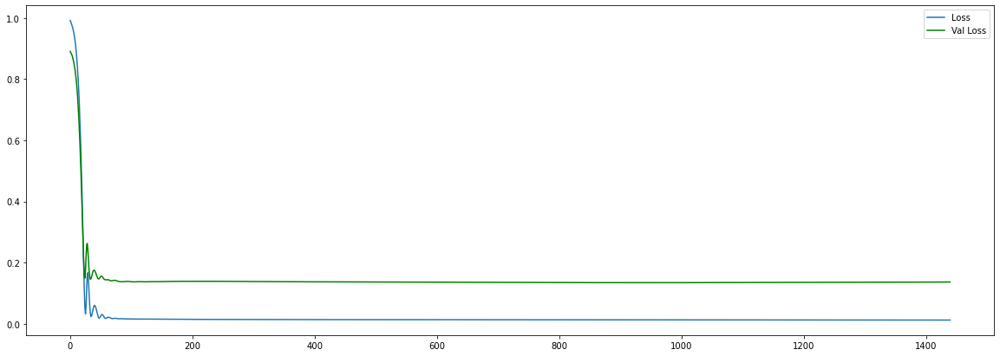

final loss: 0.011608555912971497
final val_loss: 0.13608944416046143
Get best hyperparameter for simple GRU


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


INFO:tensorflow:Oracle triggered exit
Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 1, 5)]            0         
_________________________________________________________________
gru (GRU)                    (None, 48)                7920      
_________________________________________________________________
dense (Dense)                (None, 32)                1568      
_________________________________________________________________
dropout (Dropout)            (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 33        
Total params: 9,521
Trainable params: 9,521
Non-trainable params: 0
_________________________________________________________________
Start training simple GRU
Epoch 1/2500
1/1 [==============================] - ETA: 0s -


Epoch 00028: val_loss improved from 0.15352 to 0.15182, saving model to FPT_1D_GRU.hdf5
Epoch 29/2500
1/1 [==============================] - ETA: 0s - loss: 0.0382 - mae: 0.153 - 0s 22ms/step - loss: 0.0382 - mae: 0.1531 - val_loss: 0.1505 - val_mae: 0.2704

Epoch 00029: val_loss improved from 0.15182 to 0.15048, saving model to FPT_1D_GRU.hdf5
Epoch 30/2500
1/1 [==============================] - ETA: 0s - loss: 0.0401 - mae: 0.151 - 0s 24ms/step - loss: 0.0401 - mae: 0.1511 - val_loss: 0.1495 - val_mae: 0.2679

Epoch 00030: val_loss improved from 0.15048 to 0.14951, saving model to FPT_1D_GRU.hdf5
Epoch 31/2500
1/1 [==============================] - ETA: 0s - loss: 0.0397 - mae: 0.152 - 0s 18ms/step - loss: 0.0397 - mae: 0.1528 - val_loss: 0.1488 - val_mae: 0.2656

Epoch 00031: val_loss improved from 0.14951 to 0.14882, saving model to FPT_1D_GRU.hdf5
Epoch 32/2500
1/1 [==============================] - ETA: 0s - loss: 0.0312 - mae: 0.135 - 0s 18ms/step - loss: 0.0312 - mae: 0.1359 -

Epoch 00060: val_loss improved from 0.14294 to 0.14289, saving model to FPT_1D_GRU.hdf5
Epoch 61/2500
1/1 [==============================] - ETA: 0s - loss: 0.0330 - mae: 0.138 - 0s 19ms/step - loss: 0.0330 - mae: 0.1388 - val_loss: 0.1429 - val_mae: 0.2618

Epoch 00061: val_loss improved from 0.14289 to 0.14286, saving model to FPT_1D_GRU.hdf5
Epoch 62/2500
1/1 [==============================] - ETA: 0s - loss: 0.0306 - mae: 0.131 - 0s 19ms/step - loss: 0.0306 - mae: 0.1316 - val_loss: 0.1428 - val_mae: 0.2617

Epoch 00062: val_loss improved from 0.14286 to 0.14283, saving model to FPT_1D_GRU.hdf5
Epoch 63/2500
1/1 [==============================] - ETA: 0s - loss: 0.0341 - mae: 0.139 - 0s 20ms/step - loss: 0.0341 - mae: 0.1395 - val_loss: 0.1427 - val_mae: 0.2615

Epoch 00063: val_loss improved from 0.14283 to 0.14272, saving model to FPT_1D_GRU.hdf5
Epoch 64/2500
1/1 [==============================] - ETA: 0s - loss: 0.0306 - mae: 0.132 - 0s 19ms/step - loss: 0.0306 - mae: 0.1321 - 


Epoch 00094: val_loss improved from 0.14024 to 0.14017, saving model to FPT_1D_GRU.hdf5
Epoch 95/2500
1/1 [==============================] - ETA: 0s - loss: 0.0255 - mae: 0.122 - 0s 19ms/step - loss: 0.0255 - mae: 0.1224 - val_loss: 0.1401 - val_mae: 0.2589

Epoch 00095: val_loss improved from 0.14017 to 0.14011, saving model to FPT_1D_GRU.hdf5
Epoch 96/2500
1/1 [==============================] - ETA: 0s - loss: 0.0285 - mae: 0.127 - 0s 21ms/step - loss: 0.0285 - mae: 0.1276 - val_loss: 0.1400 - val_mae: 0.2587

Epoch 00096: val_loss improved from 0.14011 to 0.14003, saving model to FPT_1D_GRU.hdf5
Epoch 97/2500
1/1 [==============================] - ETA: 0s - loss: 0.0256 - mae: 0.121 - 0s 19ms/step - loss: 0.0256 - mae: 0.1216 - val_loss: 0.1399 - val_mae: 0.2585

Epoch 00097: val_loss improved from 0.14003 to 0.13990, saving model to FPT_1D_GRU.hdf5
Epoch 98/2500
1/1 [==============================] - ETA: 0s - loss: 0.0273 - mae: 0.125 - 0s 19ms/step - loss: 0.0273 - mae: 0.1255 -


Epoch 00127: val_loss did not improve from 0.13825
Epoch 128/2500
1/1 [==============================] - ETA: 0s - loss: 0.0267 - mae: 0.121 - 0s 18ms/step - loss: 0.0267 - mae: 0.1218 - val_loss: 0.1386 - val_mae: 0.2580

Epoch 00128: val_loss did not improve from 0.13825
Epoch 129/2500
1/1 [==============================] - ETA: 0s - loss: 0.0313 - mae: 0.132 - 0s 18ms/step - loss: 0.0313 - mae: 0.1324 - val_loss: 0.1387 - val_mae: 0.2582

Epoch 00129: val_loss did not improve from 0.13825
Epoch 130/2500
1/1 [==============================] - ETA: 0s - loss: 0.0280 - mae: 0.124 - 0s 16ms/step - loss: 0.0280 - mae: 0.1247 - val_loss: 0.1388 - val_mae: 0.2584

Epoch 00130: val_loss did not improve from 0.13825
Epoch 131/2500
1/1 [==============================] - ETA: 0s - loss: 0.0257 - mae: 0.120 - 0s 26ms/step - loss: 0.0257 - mae: 0.1209 - val_loss: 0.1389 - val_mae: 0.2584

Epoch 00131: val_loss did not improve from 0.13825
Epoch 132/2500
1/1 [==============================] - ET

1/1 [==============================] - ETA: 0s - loss: 0.0277 - mae: 0.123 - 0s 20ms/step - loss: 0.0277 - mae: 0.1233 - val_loss: 0.1374 - val_mae: 0.2551

Epoch 00163: val_loss improved from 0.13758 to 0.13741, saving model to FPT_1D_GRU.hdf5
Epoch 164/2500
1/1 [==============================] - ETA: 0s - loss: 0.0278 - mae: 0.124 - 0s 19ms/step - loss: 0.0278 - mae: 0.1247 - val_loss: 0.1373 - val_mae: 0.2549

Epoch 00164: val_loss improved from 0.13741 to 0.13729, saving model to FPT_1D_GRU.hdf5
Epoch 165/2500
1/1 [==============================] - ETA: 0s - loss: 0.0282 - mae: 0.127 - 0s 18ms/step - loss: 0.0282 - mae: 0.1277 - val_loss: 0.1372 - val_mae: 0.2550

Epoch 00165: val_loss improved from 0.13729 to 0.13723, saving model to FPT_1D_GRU.hdf5
Epoch 166/2500
1/1 [==============================] - ETA: 0s - loss: 0.0248 - mae: 0.119 - 0s 19ms/step - loss: 0.0248 - mae: 0.1195 - val_loss: 0.1371 - val_mae: 0.2548

Epoch 00166: val_loss improved from 0.13723 to 0.13708, saving 


Epoch 00198: val_loss improved from 0.13674 to 0.13669, saving model to FPT_1D_GRU.hdf5
Epoch 199/2500
1/1 [==============================] - ETA: 0s - loss: 0.0235 - mae: 0.113 - 0s 18ms/step - loss: 0.0235 - mae: 0.1137 - val_loss: 0.1367 - val_mae: 0.2543

Epoch 00199: val_loss improved from 0.13669 to 0.13669, saving model to FPT_1D_GRU.hdf5
Epoch 200/2500
1/1 [==============================] - ETA: 0s - loss: 0.0250 - mae: 0.122 - 0s 19ms/step - loss: 0.0250 - mae: 0.1220 - val_loss: 0.1366 - val_mae: 0.2543

Epoch 00200: val_loss improved from 0.13669 to 0.13659, saving model to FPT_1D_GRU.hdf5
Epoch 201/2500
1/1 [==============================] - ETA: 0s - loss: 0.0261 - mae: 0.121 - 0s 18ms/step - loss: 0.0261 - mae: 0.1210 - val_loss: 0.1366 - val_mae: 0.2544

Epoch 00201: val_loss did not improve from 0.13659
Epoch 202/2500
1/1 [==============================] - ETA: 0s - loss: 0.0240 - mae: 0.113 - 0s 16ms/step - loss: 0.0240 - mae: 0.1130 - val_loss: 0.1366 - val_mae: 0.25


Epoch 00233: val_loss did not improve from 0.13566
Epoch 234/2500
1/1 [==============================] - ETA: 0s - loss: 0.0220 - mae: 0.109 - 0s 19ms/step - loss: 0.0220 - mae: 0.1097 - val_loss: 0.1362 - val_mae: 0.2527

Epoch 00234: val_loss did not improve from 0.13566
Epoch 235/2500
1/1 [==============================] - ETA: 0s - loss: 0.0243 - mae: 0.116 - 0s 17ms/step - loss: 0.0243 - mae: 0.1162 - val_loss: 0.1359 - val_mae: 0.2523

Epoch 00235: val_loss did not improve from 0.13566
Epoch 236/2500
1/1 [==============================] - ETA: 0s - loss: 0.0251 - mae: 0.119 - 0s 19ms/step - loss: 0.0251 - mae: 0.1197 - val_loss: 0.1355 - val_mae: 0.2519

Epoch 00236: val_loss improved from 0.13566 to 0.13551, saving model to FPT_1D_GRU.hdf5
Epoch 237/2500
1/1 [==============================] - ETA: 0s - loss: 0.0235 - mae: 0.116 - 0s 19ms/step - loss: 0.0235 - mae: 0.1166 - val_loss: 0.1352 - val_mae: 0.2514

Epoch 00237: val_loss improved from 0.13551 to 0.13517, saving model t

Epoch 269/2500
1/1 [==============================] - ETA: 0s - loss: 0.0223 - mae: 0.115 - 0s 19ms/step - loss: 0.0223 - mae: 0.1150 - val_loss: 0.1343 - val_mae: 0.2499

Epoch 00269: val_loss improved from 0.13441 to 0.13430, saving model to FPT_1D_GRU.hdf5
Epoch 270/2500
1/1 [==============================] - ETA: 0s - loss: 0.0226 - mae: 0.111 - 0s 19ms/step - loss: 0.0226 - mae: 0.1111 - val_loss: 0.1343 - val_mae: 0.2500

Epoch 00270: val_loss did not improve from 0.13430
Epoch 271/2500
1/1 [==============================] - ETA: 0s - loss: 0.0204 - mae: 0.107 - 0s 18ms/step - loss: 0.0204 - mae: 0.1077 - val_loss: 0.1344 - val_mae: 0.2503

Epoch 00271: val_loss did not improve from 0.13430
Epoch 272/2500
1/1 [==============================] - ETA: 0s - loss: 0.0226 - mae: 0.112 - 0s 19ms/step - loss: 0.0226 - mae: 0.1124 - val_loss: 0.1345 - val_mae: 0.2504

Epoch 00272: val_loss did not improve from 0.13430
Epoch 273/2500
1/1 [==============================] - ETA: 0s - loss: 0

1/1 [==============================] - ETA: 0s - loss: 0.0235 - mae: 0.114 - 0s 19ms/step - loss: 0.0235 - mae: 0.1146 - val_loss: 0.1336 - val_mae: 0.2486

Epoch 00304: val_loss did not improve from 0.13328
Epoch 305/2500
1/1 [==============================] - ETA: 0s - loss: 0.0229 - mae: 0.115 - 0s 18ms/step - loss: 0.0229 - mae: 0.1155 - val_loss: 0.1337 - val_mae: 0.2487

Epoch 00305: val_loss did not improve from 0.13328
Epoch 306/2500
1/1 [==============================] - ETA: 0s - loss: 0.0219 - mae: 0.109 - 0s 18ms/step - loss: 0.0219 - mae: 0.1096 - val_loss: 0.1338 - val_mae: 0.2488

Epoch 00306: val_loss did not improve from 0.13328
Epoch 307/2500
1/1 [==============================] - ETA: 0s - loss: 0.0220 - mae: 0.110 - 0s 18ms/step - loss: 0.0220 - mae: 0.1108 - val_loss: 0.1340 - val_mae: 0.2490

Epoch 00307: val_loss did not improve from 0.13328
Epoch 308/2500
1/1 [==============================] - ETA: 0s - loss: 0.0232 - mae: 0.115 - 0s 18ms/step - loss: 0.0232 - m


Epoch 00339: val_loss did not improve from 0.13185
Epoch 340/2500
1/1 [==============================] - ETA: 0s - loss: 0.0214 - mae: 0.111 - 0s 19ms/step - loss: 0.0214 - mae: 0.1112 - val_loss: 0.1330 - val_mae: 0.2472

Epoch 00340: val_loss did not improve from 0.13185
Epoch 341/2500
1/1 [==============================] - ETA: 0s - loss: 0.0205 - mae: 0.106 - 0s 18ms/step - loss: 0.0205 - mae: 0.1060 - val_loss: 0.1332 - val_mae: 0.2474

Epoch 00341: val_loss did not improve from 0.13185
Epoch 342/2500
1/1 [==============================] - ETA: 0s - loss: 0.0228 - mae: 0.114 - 0s 19ms/step - loss: 0.0228 - mae: 0.1145 - val_loss: 0.1333 - val_mae: 0.2476

Epoch 00342: val_loss did not improve from 0.13185
Epoch 343/2500
1/1 [==============================] - ETA: 0s - loss: 0.0205 - mae: 0.107 - 0s 18ms/step - loss: 0.0205 - mae: 0.1076 - val_loss: 0.1335 - val_mae: 0.2479

Epoch 00343: val_loss did not improve from 0.13185
Epoch 344/2500
1/1 [==============================] - ET


Epoch 00375: val_loss did not improve from 0.13050
Epoch 376/2500
1/1 [==============================] - ETA: 0s - loss: 0.0226 - mae: 0.113 - 0s 17ms/step - loss: 0.0226 - mae: 0.1136 - val_loss: 0.1321 - val_mae: 0.2456

Epoch 00376: val_loss did not improve from 0.13050
Epoch 377/2500
1/1 [==============================] - ETA: 0s - loss: 0.0209 - mae: 0.108 - 0s 19ms/step - loss: 0.0209 - mae: 0.1083 - val_loss: 0.1322 - val_mae: 0.2458

Epoch 00377: val_loss did not improve from 0.13050
Epoch 378/2500
1/1 [==============================] - ETA: 0s - loss: 0.0194 - mae: 0.104 - 0s 17ms/step - loss: 0.0194 - mae: 0.1042 - val_loss: 0.1323 - val_mae: 0.2462

Epoch 00378: val_loss did not improve from 0.13050
Epoch 379/2500
1/1 [==============================] - ETA: 0s - loss: 0.0210 - mae: 0.111 - 0s 18ms/step - loss: 0.0210 - mae: 0.1110 - val_loss: 0.1326 - val_mae: 0.2466

Epoch 00379: val_loss did not improve from 0.13050
Epoch 380/2500
1/1 [==============================] - ET


Epoch 00412: val_loss did not improve from 0.13050
Epoch 413/2500
1/1 [==============================] - ETA: 0s - loss: 0.0211 - mae: 0.108 - 0s 19ms/step - loss: 0.0211 - mae: 0.1086 - val_loss: 0.1305 - val_mae: 0.2439

Epoch 00413: val_loss did not improve from 0.13050
Epoch 414/2500
1/1 [==============================] - ETA: 0s - loss: 0.0219 - mae: 0.112 - 0s 18ms/step - loss: 0.0219 - mae: 0.1123 - val_loss: 0.1304 - val_mae: 0.2438

Epoch 00414: val_loss improved from 0.13050 to 0.13042, saving model to FPT_1D_GRU.hdf5
Epoch 415/2500
1/1 [==============================] - ETA: 0s - loss: 0.0229 - mae: 0.113 - 0s 20ms/step - loss: 0.0229 - mae: 0.1132 - val_loss: 0.1305 - val_mae: 0.2439

Epoch 00415: val_loss did not improve from 0.13042
Epoch 416/2500
1/1 [==============================] - ETA: 0s - loss: 0.0217 - mae: 0.112 - 0s 19ms/step - loss: 0.0217 - mae: 0.1121 - val_loss: 0.1305 - val_mae: 0.2440

Epoch 00416: val_loss did not improve from 0.13042
Epoch 417/2500
1/1 

Epoch 449/2500
1/1 [==============================] - ETA: 0s - loss: 0.0186 - mae: 0.101 - 0s 18ms/step - loss: 0.0186 - mae: 0.1017 - val_loss: 0.1307 - val_mae: 0.2447

Epoch 00449: val_loss did not improve from 0.13036
Epoch 450/2500
1/1 [==============================] - ETA: 0s - loss: 0.0212 - mae: 0.109 - 0s 22ms/step - loss: 0.0212 - mae: 0.1095 - val_loss: 0.1309 - val_mae: 0.2449

Epoch 00450: val_loss did not improve from 0.13036
Epoch 451/2500
1/1 [==============================] - ETA: 0s - loss: 0.0229 - mae: 0.111 - 0s 45ms/step - loss: 0.0229 - mae: 0.1118 - val_loss: 0.1312 - val_mae: 0.2456

Epoch 00451: val_loss did not improve from 0.13036
Epoch 452/2500
1/1 [==============================] - ETA: 0s - loss: 0.0216 - mae: 0.112 - 0s 32ms/step - loss: 0.0216 - mae: 0.1120 - val_loss: 0.1316 - val_mae: 0.2462

Epoch 00452: val_loss did not improve from 0.13036
Epoch 453/2500
1/1 [==============================] - ETA: 0s - loss: 0.0202 - mae: 0.106 - 0s 34ms/step - l


Epoch 00485: val_loss did not improve from 0.13036
Epoch 486/2500
1/1 [==============================] - ETA: 0s - loss: 0.0209 - mae: 0.109 - 0s 18ms/step - loss: 0.0209 - mae: 0.1096 - val_loss: 0.1309 - val_mae: 0.2463

Epoch 00486: val_loss did not improve from 0.13036
Epoch 487/2500
1/1 [==============================] - ETA: 0s - loss: 0.0182 - mae: 0.101 - 0s 23ms/step - loss: 0.0182 - mae: 0.1013 - val_loss: 0.1310 - val_mae: 0.2465

Epoch 00487: val_loss did not improve from 0.13036
Epoch 488/2500
1/1 [==============================] - ETA: 0s - loss: 0.0204 - mae: 0.104 - 0s 19ms/step - loss: 0.0204 - mae: 0.1049 - val_loss: 0.1313 - val_mae: 0.2467

Epoch 00488: val_loss did not improve from 0.13036
Epoch 489/2500
1/1 [==============================] - ETA: 0s - loss: 0.0204 - mae: 0.106 - 0s 18ms/step - loss: 0.0204 - mae: 0.1069 - val_loss: 0.1315 - val_mae: 0.2470

Epoch 00489: val_loss did not improve from 0.13036
Epoch 490/2500
1/1 [==============================] - ET

1/1 [==============================] - ETA: 0s - loss: 0.0219 - mae: 0.112 - 0s 18ms/step - loss: 0.0219 - mae: 0.1123 - val_loss: 0.1316 - val_mae: 0.2480

Epoch 00522: val_loss did not improve from 0.13010
Epoch 523/2500
1/1 [==============================] - ETA: 0s - loss: 0.0216 - mae: 0.108 - 0s 18ms/step - loss: 0.0216 - mae: 0.1086 - val_loss: 0.1314 - val_mae: 0.2478

Epoch 00523: val_loss did not improve from 0.13010
Epoch 524/2500
1/1 [==============================] - ETA: 0s - loss: 0.0207 - mae: 0.106 - 0s 18ms/step - loss: 0.0207 - mae: 0.1062 - val_loss: 0.1311 - val_mae: 0.2475

Epoch 00524: val_loss did not improve from 0.13010
Epoch 525/2500
1/1 [==============================] - ETA: 0s - loss: 0.0220 - mae: 0.114 - 0s 19ms/step - loss: 0.0220 - mae: 0.1140 - val_loss: 0.1310 - val_mae: 0.2473

Epoch 00525: val_loss did not improve from 0.13010
Epoch 526/2500
1/1 [==============================] - ETA: 0s - loss: 0.0216 - mae: 0.111 - 0s 18ms/step - loss: 0.0216 - m


Epoch 00558: val_loss did not improve from 0.13001
Epoch 559/2500
1/1 [==============================] - ETA: 0s - loss: 0.0214 - mae: 0.110 - 0s 18ms/step - loss: 0.0214 - mae: 0.1104 - val_loss: 0.1310 - val_mae: 0.2481

Epoch 00559: val_loss did not improve from 0.13001
Epoch 560/2500
1/1 [==============================] - ETA: 0s - loss: 0.0190 - mae: 0.106 - 0s 18ms/step - loss: 0.0190 - mae: 0.1066 - val_loss: 0.1308 - val_mae: 0.2479

Epoch 00560: val_loss did not improve from 0.13001
Epoch 561/2500
1/1 [==============================] - ETA: 0s - loss: 0.0196 - mae: 0.107 - 0s 19ms/step - loss: 0.0196 - mae: 0.1072 - val_loss: 0.1309 - val_mae: 0.2479

Epoch 00561: val_loss did not improve from 0.13001
Epoch 562/2500
1/1 [==============================] - ETA: 0s - loss: 0.0212 - mae: 0.108 - 0s 18ms/step - loss: 0.0212 - mae: 0.1087 - val_loss: 0.1312 - val_mae: 0.2485

Epoch 00562: val_loss did not improve from 0.13001
Epoch 563/2500
1/1 [==============================] - ET


Epoch 00595: val_loss did not improve from 0.13001
Epoch 596/2500
1/1 [==============================] - ETA: 0s - loss: 0.0207 - mae: 0.107 - 0s 18ms/step - loss: 0.0207 - mae: 0.1072 - val_loss: 0.1324 - val_mae: 0.2506

Epoch 00596: val_loss did not improve from 0.13001
Epoch 597/2500
1/1 [==============================] - ETA: 0s - loss: 0.0233 - mae: 0.116 - 0s 19ms/step - loss: 0.0233 - mae: 0.1167 - val_loss: 0.1318 - val_mae: 0.2500

Epoch 00597: val_loss did not improve from 0.13001
Epoch 598/2500
1/1 [==============================] - ETA: 0s - loss: 0.0185 - mae: 0.101 - 0s 22ms/step - loss: 0.0185 - mae: 0.1018 - val_loss: 0.1312 - val_mae: 0.2492

Epoch 00598: val_loss did not improve from 0.13001
Epoch 599/2500
1/1 [==============================] - ETA: 0s - loss: 0.0191 - mae: 0.103 - 0s 20ms/step - loss: 0.0191 - mae: 0.1036 - val_loss: 0.1309 - val_mae: 0.2490

Epoch 00599: val_loss did not improve from 0.13001
Epoch 600/2500
1/1 [==============================] - ET


Epoch 00632: val_loss did not improve from 0.13001
Epoch 633/2500
1/1 [==============================] - ETA: 0s - loss: 0.0197 - mae: 0.103 - 0s 17ms/step - loss: 0.0197 - mae: 0.1039 - val_loss: 0.1315 - val_mae: 0.2522

Epoch 00633: val_loss did not improve from 0.13001
Epoch 634/2500
1/1 [==============================] - ETA: 0s - loss: 0.0200 - mae: 0.108 - 0s 18ms/step - loss: 0.0200 - mae: 0.1083 - val_loss: 0.1315 - val_mae: 0.2522

Epoch 00634: val_loss did not improve from 0.13001
Epoch 635/2500
1/1 [==============================] - ETA: 0s - loss: 0.0185 - mae: 0.103 - 0s 18ms/step - loss: 0.0185 - mae: 0.1038 - val_loss: 0.1315 - val_mae: 0.2521

Epoch 00635: val_loss did not improve from 0.13001
Epoch 636/2500
1/1 [==============================] - ETA: 0s - loss: 0.0189 - mae: 0.098 - 0s 19ms/step - loss: 0.0189 - mae: 0.0988 - val_loss: 0.1317 - val_mae: 0.2522

Epoch 00636: val_loss did not improve from 0.13001
Epoch 637/2500
1/1 [==============================] - ET


Epoch 00669: val_loss did not improve from 0.13001
Epoch 670/2500
1/1 [==============================] - ETA: 0s - loss: 0.0206 - mae: 0.104 - 0s 20ms/step - loss: 0.0206 - mae: 0.1049 - val_loss: 0.1320 - val_mae: 0.2533

Epoch 00670: val_loss did not improve from 0.13001
Epoch 671/2500
1/1 [==============================] - ETA: 0s - loss: 0.0186 - mae: 0.104 - 0s 22ms/step - loss: 0.0186 - mae: 0.1044 - val_loss: 0.1321 - val_mae: 0.2531

Epoch 00671: val_loss did not improve from 0.13001
Epoch 672/2500
1/1 [==============================] - ETA: 0s - loss: 0.0196 - mae: 0.105 - 0s 20ms/step - loss: 0.0196 - mae: 0.1057 - val_loss: 0.1321 - val_mae: 0.2529

Epoch 00672: val_loss did not improve from 0.13001
Epoch 673/2500
1/1 [==============================] - ETA: 0s - loss: 0.0210 - mae: 0.108 - 0s 19ms/step - loss: 0.0210 - mae: 0.1083 - val_loss: 0.1320 - val_mae: 0.2527

Epoch 00673: val_loss did not improve from 0.13001
Epoch 674/2500
1/1 [==============================] - ET


Epoch 00706: val_loss did not improve from 0.13001
Epoch 707/2500
1/1 [==============================] - ETA: 0s - loss: 0.0206 - mae: 0.109 - 0s 18ms/step - loss: 0.0206 - mae: 0.1093 - val_loss: 0.1312 - val_mae: 0.2530

Epoch 00707: val_loss did not improve from 0.13001
Epoch 708/2500
1/1 [==============================] - ETA: 0s - loss: 0.0205 - mae: 0.109 - 0s 18ms/step - loss: 0.0205 - mae: 0.1092 - val_loss: 0.1314 - val_mae: 0.2531

Epoch 00708: val_loss did not improve from 0.13001
Epoch 709/2500
1/1 [==============================] - ETA: 0s - loss: 0.0186 - mae: 0.104 - 0s 18ms/step - loss: 0.0186 - mae: 0.1046 - val_loss: 0.1317 - val_mae: 0.2534

Epoch 00709: val_loss did not improve from 0.13001
Epoch 710/2500
1/1 [==============================] - ETA: 0s - loss: 0.0218 - mae: 0.110 - 0s 19ms/step - loss: 0.0218 - mae: 0.1107 - val_loss: 0.1323 - val_mae: 0.2541

Epoch 00710: val_loss did not improve from 0.13001
Epoch 711/2500
1/1 [==============================] - ET


Epoch 00743: val_loss did not improve from 0.13001
Epoch 744/2500
1/1 [==============================] - ETA: 0s - loss: 0.0205 - mae: 0.109 - 0s 19ms/step - loss: 0.0205 - mae: 0.1091 - val_loss: 0.1336 - val_mae: 0.2569

Epoch 00744: val_loss did not improve from 0.13001
Epoch 745/2500
1/1 [==============================] - ETA: 0s - loss: 0.0185 - mae: 0.102 - 0s 18ms/step - loss: 0.0185 - mae: 0.1024 - val_loss: 0.1335 - val_mae: 0.2567

Epoch 00745: val_loss did not improve from 0.13001
Epoch 746/2500
1/1 [==============================] - ETA: 0s - loss: 0.0189 - mae: 0.105 - 0s 18ms/step - loss: 0.0189 - mae: 0.1057 - val_loss: 0.1332 - val_mae: 0.2560

Epoch 00746: val_loss did not improve from 0.13001
Epoch 747/2500
1/1 [==============================] - ETA: 0s - loss: 0.0211 - mae: 0.107 - 0s 21ms/step - loss: 0.0211 - mae: 0.1077 - val_loss: 0.1331 - val_mae: 0.2556

Epoch 00747: val_loss did not improve from 0.13001
Epoch 748/2500
1/1 [==============================] - ET

1/1 [==============================] - ETA: 0s - loss: 0.0218 - mae: 0.112 - 0s 24ms/step - loss: 0.0218 - mae: 0.1124 - val_loss: 0.1332 - val_mae: 0.2563

Epoch 00780: val_loss did not improve from 0.13001
Epoch 781/2500
1/1 [==============================] - ETA: 0s - loss: 0.0207 - mae: 0.109 - 0s 19ms/step - loss: 0.0207 - mae: 0.1091 - val_loss: 0.1333 - val_mae: 0.2565

Epoch 00781: val_loss did not improve from 0.13001
Epoch 782/2500
1/1 [==============================] - ETA: 0s - loss: 0.0180 - mae: 0.101 - 0s 20ms/step - loss: 0.0180 - mae: 0.1013 - val_loss: 0.1335 - val_mae: 0.2571

Epoch 00782: val_loss did not improve from 0.13001
Epoch 783/2500
1/1 [==============================] - ETA: 0s - loss: 0.0180 - mae: 0.100 - 0s 18ms/step - loss: 0.0180 - mae: 0.1007 - val_loss: 0.1337 - val_mae: 0.2575

Epoch 00783: val_loss did not improve from 0.13001
Epoch 784/2500
1/1 [==============================] - ETA: 0s - loss: 0.0195 - mae: 0.107 - 0s 21ms/step - loss: 0.0195 - m

Epoch 00816: val_loss did not improve from 0.13001
Epoch 817/2500
1/1 [==============================] - ETA: 0s - loss: 0.0195 - mae: 0.105 - 0s 19ms/step - loss: 0.0195 - mae: 0.1058 - val_loss: 0.1340 - val_mae: 0.2577

Epoch 00817: val_loss did not improve from 0.13001
Epoch 818/2500
1/1 [==============================] - ETA: 0s - loss: 0.0213 - mae: 0.109 - 0s 19ms/step - loss: 0.0213 - mae: 0.1096 - val_loss: 0.1339 - val_mae: 0.2576

Epoch 00818: val_loss did not improve from 0.13001
Epoch 819/2500
1/1 [==============================] - ETA: 0s - loss: 0.0203 - mae: 0.108 - 0s 19ms/step - loss: 0.0203 - mae: 0.1089 - val_loss: 0.1336 - val_mae: 0.2571

Epoch 00819: val_loss did not improve from 0.13001
Epoch 820/2500
1/1 [==============================] - ETA: 0s - loss: 0.0227 - mae: 0.114 - 0s 19ms/step - loss: 0.0227 - mae: 0.1143 - val_loss: 0.1335 - val_mae: 0.2570

Epoch 00820: val_loss did not improve from 0.13001
Epoch 821/2500
1/1 [==============================] - ETA


Epoch 00853: val_loss did not improve from 0.13001
Epoch 854/2500
1/1 [==============================] - ETA: 0s - loss: 0.0186 - mae: 0.103 - 0s 18ms/step - loss: 0.0186 - mae: 0.1035 - val_loss: 0.1336 - val_mae: 0.2574

Epoch 00854: val_loss did not improve from 0.13001
Epoch 855/2500
1/1 [==============================] - ETA: 0s - loss: 0.0195 - mae: 0.104 - 0s 19ms/step - loss: 0.0195 - mae: 0.1048 - val_loss: 0.1331 - val_mae: 0.2568

Epoch 00855: val_loss did not improve from 0.13001
Epoch 856/2500
1/1 [==============================] - ETA: 0s - loss: 0.0217 - mae: 0.111 - 0s 18ms/step - loss: 0.0217 - mae: 0.1117 - val_loss: 0.1328 - val_mae: 0.2563

Epoch 00856: val_loss did not improve from 0.13001
Epoch 857/2500
1/1 [==============================] - ETA: 0s - loss: 0.0195 - mae: 0.103 - 0s 19ms/step - loss: 0.0195 - mae: 0.1034 - val_loss: 0.1327 - val_mae: 0.2563

Epoch 00857: val_loss did not improve from 0.13001
Epoch 858/2500
1/1 [==============================] - ET


Epoch 00890: val_loss did not improve from 0.13001
Epoch 891/2500
1/1 [==============================] - ETA: 0s - loss: 0.0191 - mae: 0.106 - 0s 19ms/step - loss: 0.0191 - mae: 0.1061 - val_loss: 0.1335 - val_mae: 0.2576

Epoch 00891: val_loss did not improve from 0.13001
Epoch 892/2500
1/1 [==============================] - ETA: 0s - loss: 0.0188 - mae: 0.102 - 0s 17ms/step - loss: 0.0188 - mae: 0.1028 - val_loss: 0.1334 - val_mae: 0.2576

Epoch 00892: val_loss did not improve from 0.13001
Epoch 893/2500
1/1 [==============================] - ETA: 0s - loss: 0.0186 - mae: 0.101 - 0s 18ms/step - loss: 0.0186 - mae: 0.1019 - val_loss: 0.1335 - val_mae: 0.2577

Epoch 00893: val_loss did not improve from 0.13001
Epoch 894/2500
1/1 [==============================] - ETA: 0s - loss: 0.0206 - mae: 0.110 - 0s 19ms/step - loss: 0.0206 - mae: 0.1100 - val_loss: 0.1336 - val_mae: 0.2579

Epoch 00894: val_loss did not improve from 0.13001
Epoch 895/2500
1/1 [==============================] - ET


Epoch 00927: val_loss did not improve from 0.13001
Epoch 928/2500
1/1 [==============================] - ETA: 0s - loss: 0.0191 - mae: 0.105 - 0s 18ms/step - loss: 0.0191 - mae: 0.1052 - val_loss: 0.1349 - val_mae: 0.2600

Epoch 00928: val_loss did not improve from 0.13001
Epoch 929/2500
1/1 [==============================] - ETA: 0s - loss: 0.0200 - mae: 0.109 - 0s 18ms/step - loss: 0.0200 - mae: 0.1090 - val_loss: 0.1349 - val_mae: 0.2599

Epoch 00929: val_loss did not improve from 0.13001
Epoch 930/2500
1/1 [==============================] - ETA: 0s - loss: 0.0191 - mae: 0.105 - 0s 18ms/step - loss: 0.0191 - mae: 0.1051 - val_loss: 0.1349 - val_mae: 0.2600

Epoch 00930: val_loss did not improve from 0.13001
Epoch 931/2500
1/1 [==============================] - ETA: 0s - loss: 0.0190 - mae: 0.105 - 0s 20ms/step - loss: 0.0190 - mae: 0.1055 - val_loss: 0.1348 - val_mae: 0.2599

Epoch 00931: val_loss did not improve from 0.13001
Epoch 932/2500
1/1 [==============================] - ET


Epoch 00964: val_loss did not improve from 0.13001
Epoch 965/2500
1/1 [==============================] - ETA: 0s - loss: 0.0203 - mae: 0.104 - 0s 18ms/step - loss: 0.0203 - mae: 0.1049 - val_loss: 0.1353 - val_mae: 0.2603

Epoch 00965: val_loss did not improve from 0.13001
Epoch 966/2500
1/1 [==============================] - ETA: 0s - loss: 0.0187 - mae: 0.101 - 0s 18ms/step - loss: 0.0187 - mae: 0.1015 - val_loss: 0.1353 - val_mae: 0.2603

Epoch 00966: val_loss did not improve from 0.13001
Epoch 967/2500
1/1 [==============================] - ETA: 0s - loss: 0.0175 - mae: 0.101 - 0s 18ms/step - loss: 0.0175 - mae: 0.1013 - val_loss: 0.1352 - val_mae: 0.2601

Epoch 00967: val_loss did not improve from 0.13001
Epoch 968/2500
1/1 [==============================] - ETA: 0s - loss: 0.0176 - mae: 0.101 - 0s 19ms/step - loss: 0.0176 - mae: 0.1016 - val_loss: 0.1350 - val_mae: 0.2599

Epoch 00968: val_loss did not improve from 0.13001
Epoch 969/2500
1/1 [==============================] - ET


Epoch 01001: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.

Epoch 01001: val_loss did not improve from 0.13001
Epoch 1002/2500
1/1 [==============================] - ETA: 0s - loss: 0.0191 - mae: 0.105 - 0s 18ms/step - loss: 0.0191 - mae: 0.1059 - val_loss: 0.1355 - val_mae: 0.2602

Epoch 01002: val_loss did not improve from 0.13001
Epoch 1003/2500
1/1 [==============================] - ETA: 0s - loss: 0.0180 - mae: 0.101 - 0s 19ms/step - loss: 0.0180 - mae: 0.1017 - val_loss: 0.1356 - val_mae: 0.2602

Epoch 01003: val_loss did not improve from 0.13001
Epoch 1004/2500
1/1 [==============================] - ETA: 0s - loss: 0.0201 - mae: 0.107 - 0s 18ms/step - loss: 0.0201 - mae: 0.1079 - val_loss: 0.1355 - val_mae: 0.2602

Epoch 01004: val_loss did not improve from 0.13001
Epoch 1005/2500
1/1 [==============================] - ETA: 0s - loss: 0.0184 - mae: 0.104 - 0s 18ms/step - loss: 0.0184 - mae: 0.1046 - val_loss: 0.1354 - val_mae: 0.2600

Epoch 01005: val_loss 

Epoch 01037: val_loss did not improve from 0.13001
Epoch 1038/2500
1/1 [==============================] - ETA: 0s - loss: 0.0209 - mae: 0.107 - 0s 19ms/step - loss: 0.0209 - mae: 0.1077 - val_loss: 0.1357 - val_mae: 0.2604

Epoch 01038: val_loss did not improve from 0.13001
Epoch 1039/2500
1/1 [==============================] - ETA: 0s - loss: 0.0200 - mae: 0.104 - 0s 18ms/step - loss: 0.0200 - mae: 0.1045 - val_loss: 0.1360 - val_mae: 0.2608
Restoring model weights from the end of the best epoch.

Epoch 01039: val_loss did not improve from 0.13001
Epoch 01039: early stopping


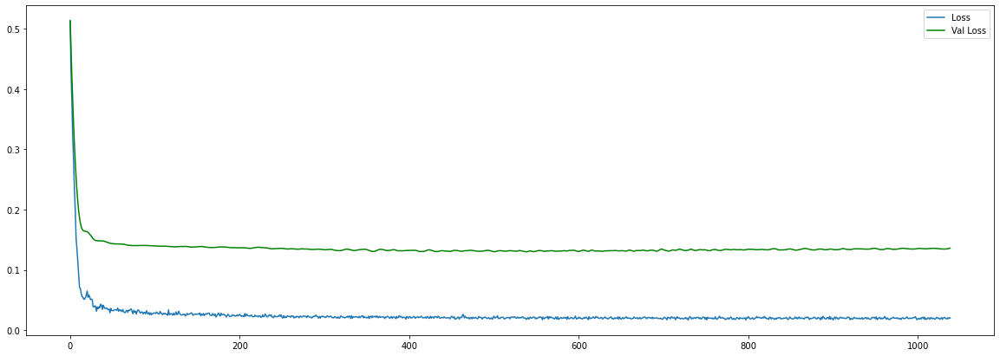

final loss: 0.01996435411274433
final val_loss: 0.13603664934635162


In [ ]:
build_and_train_all_model(FPT_data_processor, FPT_predictor)

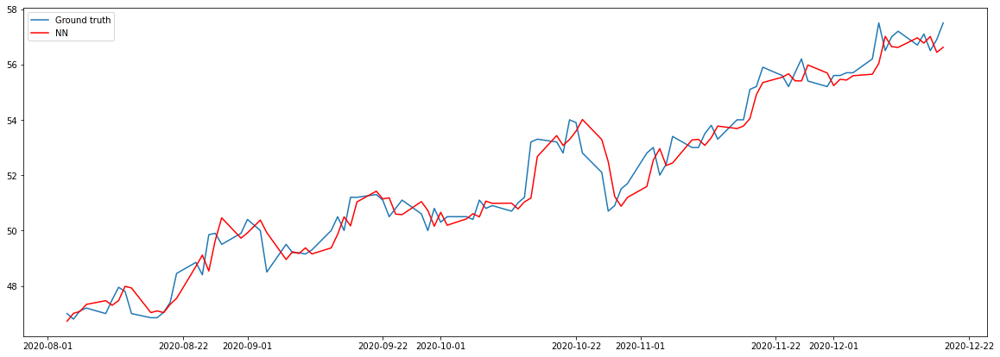

Simple NN
MSE:  0.3852291405200958
MAE:  0.48310155


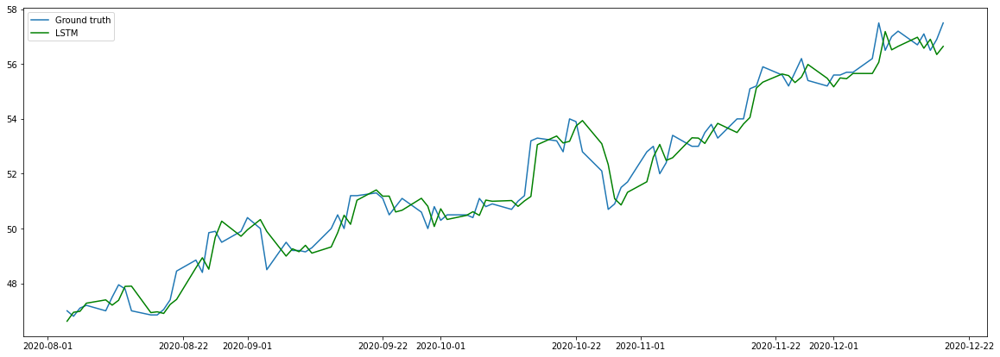

Simple LSTM
MSE:  0.3660299777984619
MAE:  0.46892536


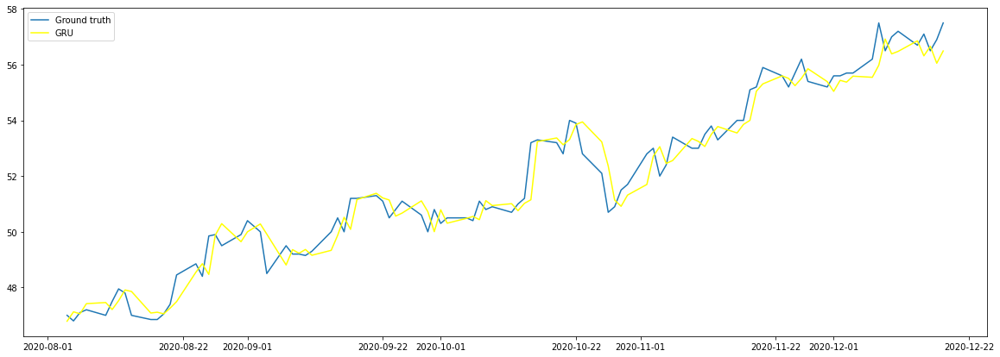

Simple GRU
MSE:  0.38452643156051636
MAE:  0.4735795


In [ ]:
evaluate_all_model(FPT_data_processor, FPT_predictor)

### MSN

In [ ]:
MSN_data_processor = DataProcessor('MSN', MSN, '1D')
MSN_predictor = StockPredictor(MSN_data_processor.stock_name, MSN_data_processor.timeDelta)

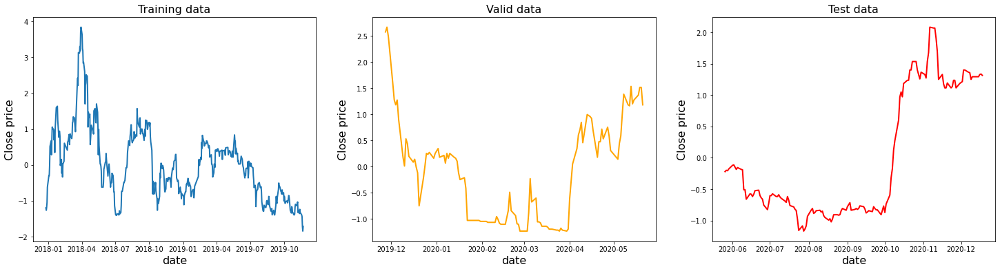

In [ ]:
MSN_data_processor.visualize_train_val_test_df()

Get best hyperparameter for simple NN


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


INFO:tensorflow:Oracle triggered exit
Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 1, 5)]            0         
_________________________________________________________________
flatten (Flatten)            (None, 5)                 0         
_________________________________________________________________
dense (Dense)                (None, 16)                96        
_________________________________________________________________
dropout (Dropout)            (None, 16)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 17        
Total params: 113
Trainable params: 113
Non-trainable params: 0
_________________________________________________________________
Start training simple NN
Epoch 1/2500
1/1 [==============================] - ETA: 0s - loss

Epoch 00028: val_loss improved from 1.39754 to 1.36082, saving model to MSN_1D_NN.hdf5
Epoch 29/2500
1/1 [==============================] - ETA: 0s - loss: 1.4243 - mae: 0.947 - 0s 18ms/step - loss: 1.4243 - mae: 0.9473 - val_loss: 1.3249 - val_mae: 0.9661

Epoch 00029: val_loss improved from 1.36082 to 1.32493, saving model to MSN_1D_NN.hdf5
Epoch 30/2500
1/1 [==============================] - ETA: 0s - loss: 1.4900 - mae: 0.961 - 0s 20ms/step - loss: 1.4900 - mae: 0.9613 - val_loss: 1.2898 - val_mae: 0.9530

Epoch 00030: val_loss improved from 1.32493 to 1.28980, saving model to MSN_1D_NN.hdf5
Epoch 31/2500
1/1 [==============================] - ETA: 0s - loss: 1.4676 - mae: 0.945 - 0s 21ms/step - loss: 1.4676 - mae: 0.9451 - val_loss: 1.2554 - val_mae: 0.9399

Epoch 00031: val_loss improved from 1.28980 to 1.25541, saving model to MSN_1D_NN.hdf5
Epoch 32/2500
1/1 [==============================] - ETA: 0s - loss: 1.3752 - mae: 0.915 - 0s 18ms/step - loss: 1.3752 - mae: 0.9153 - val_


Epoch 00060: val_loss improved from 0.56266 to 0.54636, saving model to MSN_1D_NN.hdf5
Epoch 61/2500
1/1 [==============================] - ETA: 0s - loss: 0.6434 - mae: 0.573 - 0s 19ms/step - loss: 0.6434 - mae: 0.5738 - val_loss: 0.5306 - val_mae: 0.6127

Epoch 00061: val_loss improved from 0.54636 to 0.53057, saving model to MSN_1D_NN.hdf5
Epoch 62/2500
1/1 [==============================] - ETA: 0s - loss: 0.6122 - mae: 0.563 - 0s 18ms/step - loss: 0.6122 - mae: 0.5636 - val_loss: 0.5153 - val_mae: 0.6039

Epoch 00062: val_loss improved from 0.53057 to 0.51528, saving model to MSN_1D_NN.hdf5
Epoch 63/2500
1/1 [==============================] - ETA: 0s - loss: 0.5822 - mae: 0.550 - 0s 20ms/step - loss: 0.5822 - mae: 0.5506 - val_loss: 0.5005 - val_mae: 0.5953

Epoch 00063: val_loss improved from 0.51528 to 0.50050, saving model to MSN_1D_NN.hdf5
Epoch 64/2500
1/1 [==============================] - ETA: 0s - loss: 0.5926 - mae: 0.579 - 0s 20ms/step - loss: 0.5926 - mae: 0.5790 - val


Epoch 00092: val_loss improved from 0.24488 to 0.24009, saving model to MSN_1D_NN.hdf5
Epoch 93/2500
1/1 [==============================] - ETA: 0s - loss: 0.2980 - mae: 0.392 - 0s 20ms/step - loss: 0.2980 - mae: 0.3924 - val_loss: 0.2355 - val_mae: 0.4019

Epoch 00093: val_loss improved from 0.24009 to 0.23550, saving model to MSN_1D_NN.hdf5
Epoch 94/2500
1/1 [==============================] - ETA: 0s - loss: 0.3444 - mae: 0.408 - 0s 19ms/step - loss: 0.3444 - mae: 0.4080 - val_loss: 0.2311 - val_mae: 0.3974

Epoch 00094: val_loss improved from 0.23550 to 0.23108, saving model to MSN_1D_NN.hdf5
Epoch 95/2500
1/1 [==============================] - ETA: 0s - loss: 0.2776 - mae: 0.374 - 0s 19ms/step - loss: 0.2776 - mae: 0.3742 - val_loss: 0.2269 - val_mae: 0.3930

Epoch 00095: val_loss improved from 0.23108 to 0.22690, saving model to MSN_1D_NN.hdf5
Epoch 96/2500
1/1 [==============================] - ETA: 0s - loss: 0.2988 - mae: 0.381 - 0s 18ms/step - loss: 0.2988 - mae: 0.3819 - val

1/1 [==============================] - ETA: 0s - loss: 0.2349 - mae: 0.342 - 0s 19ms/step - loss: 0.2349 - mae: 0.3427 - val_loss: 0.1644 - val_mae: 0.3161

Epoch 00124: val_loss improved from 0.16525 to 0.16438, saving model to MSN_1D_NN.hdf5
Epoch 125/2500
1/1 [==============================] - ETA: 0s - loss: 0.2291 - mae: 0.339 - 0s 18ms/step - loss: 0.2291 - mae: 0.3394 - val_loss: 0.1636 - val_mae: 0.3150

Epoch 00125: val_loss improved from 0.16438 to 0.16356, saving model to MSN_1D_NN.hdf5
Epoch 126/2500
1/1 [==============================] - ETA: 0s - loss: 0.2426 - mae: 0.358 - 0s 20ms/step - loss: 0.2426 - mae: 0.3586 - val_loss: 0.1628 - val_mae: 0.3139

Epoch 00126: val_loss improved from 0.16356 to 0.16279, saving model to MSN_1D_NN.hdf5
Epoch 127/2500
1/1 [==============================] - ETA: 0s - loss: 0.2936 - mae: 0.376 - 0s 19ms/step - loss: 0.2936 - mae: 0.3760 - val_loss: 0.1620 - val_mae: 0.3128

Epoch 00127: val_loss improved from 0.16279 to 0.16203, saving mod

Epoch 00155: val_loss improved from 0.15244 to 0.15225, saving model to MSN_1D_NN.hdf5
Epoch 156/2500
1/1 [==============================] - ETA: 0s - loss: 0.2206 - mae: 0.338 - 0s 20ms/step - loss: 0.2206 - mae: 0.3381 - val_loss: 0.1521 - val_mae: 0.2965

Epoch 00156: val_loss improved from 0.15225 to 0.15207, saving model to MSN_1D_NN.hdf5
Epoch 157/2500
1/1 [==============================] - ETA: 0s - loss: 0.2176 - mae: 0.343 - 0s 19ms/step - loss: 0.2176 - mae: 0.3438 - val_loss: 0.1519 - val_mae: 0.2962

Epoch 00157: val_loss improved from 0.15207 to 0.15189, saving model to MSN_1D_NN.hdf5
Epoch 158/2500
1/1 [==============================] - ETA: 0s - loss: 0.2165 - mae: 0.350 - 0s 19ms/step - loss: 0.2165 - mae: 0.3502 - val_loss: 0.1517 - val_mae: 0.2958

Epoch 00158: val_loss improved from 0.15189 to 0.15168, saving model to MSN_1D_NN.hdf5
Epoch 159/2500
1/1 [==============================] - ETA: 0s - loss: 0.2188 - mae: 0.346 - 0s 18ms/step - loss: 0.2188 - mae: 0.3468 - 

1/1 [==============================] - ETA: 0s - loss: 0.2449 - mae: 0.357 - 0s 20ms/step - loss: 0.2449 - mae: 0.3578 - val_loss: 0.1481 - val_mae: 0.2912

Epoch 00187: val_loss improved from 0.14825 to 0.14812, saving model to MSN_1D_NN.hdf5
Epoch 188/2500
1/1 [==============================] - ETA: 0s - loss: 0.2231 - mae: 0.343 - 0s 19ms/step - loss: 0.2231 - mae: 0.3433 - val_loss: 0.1480 - val_mae: 0.2911

Epoch 00188: val_loss improved from 0.14812 to 0.14799, saving model to MSN_1D_NN.hdf5
Epoch 189/2500
1/1 [==============================] - ETA: 0s - loss: 0.2056 - mae: 0.324 - 0s 20ms/step - loss: 0.2056 - mae: 0.3245 - val_loss: 0.1479 - val_mae: 0.2910

Epoch 00189: val_loss improved from 0.14799 to 0.14788, saving model to MSN_1D_NN.hdf5
Epoch 190/2500
1/1 [==============================] - ETA: 0s - loss: 0.2338 - mae: 0.348 - 0s 20ms/step - loss: 0.2338 - mae: 0.3485 - val_loss: 0.1478 - val_mae: 0.2909

Epoch 00190: val_loss improved from 0.14788 to 0.14778, saving mod

Epoch 00218: val_loss improved from 0.14441 to 0.14436, saving model to MSN_1D_NN.hdf5
Epoch 219/2500
1/1 [==============================] - ETA: 0s - loss: 0.2205 - mae: 0.335 - 0s 18ms/step - loss: 0.2205 - mae: 0.3357 - val_loss: 0.1443 - val_mae: 0.2879

Epoch 00219: val_loss improved from 0.14436 to 0.14430, saving model to MSN_1D_NN.hdf5
Epoch 220/2500
1/1 [==============================] - ETA: 0s - loss: 0.2141 - mae: 0.347 - 0s 17ms/step - loss: 0.2141 - mae: 0.3474 - val_loss: 0.1442 - val_mae: 0.2878

Epoch 00220: val_loss improved from 0.14430 to 0.14423, saving model to MSN_1D_NN.hdf5
Epoch 221/2500
1/1 [==============================] - ETA: 0s - loss: 0.2098 - mae: 0.338 - 0s 16ms/step - loss: 0.2098 - mae: 0.3389 - val_loss: 0.1441 - val_mae: 0.2877

Epoch 00221: val_loss improved from 0.14423 to 0.14414, saving model to MSN_1D_NN.hdf5
Epoch 222/2500
1/1 [==============================] - ETA: 0s - loss: 0.2090 - mae: 0.339 - 0s 16ms/step - loss: 0.2090 - mae: 0.3390 - 

1/1 [==============================] - ETA: 0s - loss: 0.2110 - mae: 0.332 - 0s 17ms/step - loss: 0.2110 - mae: 0.3326 - val_loss: 0.1410 - val_mae: 0.2851

Epoch 00250: val_loss improved from 0.14112 to 0.14103, saving model to MSN_1D_NN.hdf5
Epoch 251/2500
1/1 [==============================] - ETA: 0s - loss: 0.2246 - mae: 0.341 - 0s 16ms/step - loss: 0.2246 - mae: 0.3410 - val_loss: 0.1409 - val_mae: 0.2850

Epoch 00251: val_loss improved from 0.14103 to 0.14092, saving model to MSN_1D_NN.hdf5
Epoch 252/2500
1/1 [==============================] - ETA: 0s - loss: 0.1931 - mae: 0.330 - 0s 17ms/step - loss: 0.1931 - mae: 0.3305 - val_loss: 0.1409 - val_mae: 0.2850

Epoch 00252: val_loss improved from 0.14092 to 0.14085, saving model to MSN_1D_NN.hdf5
Epoch 253/2500
1/1 [==============================] - ETA: 0s - loss: 0.1962 - mae: 0.325 - 0s 16ms/step - loss: 0.1962 - mae: 0.3253 - val_loss: 0.1408 - val_mae: 0.2850

Epoch 00253: val_loss improved from 0.14085 to 0.14075, saving mod

Epoch 00281: val_loss improved from 0.13747 to 0.13727, saving model to MSN_1D_NN.hdf5
Epoch 282/2500
1/1 [==============================] - ETA: 0s - loss: 0.1944 - mae: 0.330 - 0s 20ms/step - loss: 0.1944 - mae: 0.3304 - val_loss: 0.1370 - val_mae: 0.2819

Epoch 00282: val_loss improved from 0.13727 to 0.13704, saving model to MSN_1D_NN.hdf5
Epoch 283/2500
1/1 [==============================] - ETA: 0s - loss: 0.1979 - mae: 0.326 - 0s 21ms/step - loss: 0.1979 - mae: 0.3265 - val_loss: 0.1368 - val_mae: 0.2816

Epoch 00283: val_loss improved from 0.13704 to 0.13685, saving model to MSN_1D_NN.hdf5
Epoch 284/2500
1/1 [==============================] - ETA: 0s - loss: 0.2156 - mae: 0.341 - 0s 19ms/step - loss: 0.2156 - mae: 0.3418 - val_loss: 0.1367 - val_mae: 0.2814

Epoch 00284: val_loss improved from 0.13685 to 0.13667, saving model to MSN_1D_NN.hdf5
Epoch 285/2500
1/1 [==============================] - ETA: 0s - loss: 0.1963 - mae: 0.315 - 0s 22ms/step - loss: 0.1963 - mae: 0.3152 - 

1/1 [==============================] - ETA: 0s - loss: 0.1893 - mae: 0.326 - 0s 19ms/step - loss: 0.1893 - mae: 0.3265 - val_loss: 0.1328 - val_mae: 0.2776

Epoch 00313: val_loss improved from 0.13294 to 0.13284, saving model to MSN_1D_NN.hdf5
Epoch 314/2500
1/1 [==============================] - ETA: 0s - loss: 0.2051 - mae: 0.333 - 0s 17ms/step - loss: 0.2051 - mae: 0.3339 - val_loss: 0.1327 - val_mae: 0.2775

Epoch 00314: val_loss improved from 0.13284 to 0.13272, saving model to MSN_1D_NN.hdf5
Epoch 315/2500
1/1 [==============================] - ETA: 0s - loss: 0.1587 - mae: 0.303 - 0s 18ms/step - loss: 0.1587 - mae: 0.3035 - val_loss: 0.1326 - val_mae: 0.2776

Epoch 00315: val_loss improved from 0.13272 to 0.13265, saving model to MSN_1D_NN.hdf5
Epoch 316/2500
1/1 [==============================] - ETA: 0s - loss: 0.1909 - mae: 0.325 - 0s 20ms/step - loss: 0.1909 - mae: 0.3253 - val_loss: 0.1326 - val_mae: 0.2777

Epoch 00316: val_loss improved from 0.13265 to 0.13258, saving mod

Epoch 00344: val_loss improved from 0.12910 to 0.12906, saving model to MSN_1D_NN.hdf5
Epoch 345/2500
1/1 [==============================] - ETA: 0s - loss: 0.1943 - mae: 0.316 - 0s 16ms/step - loss: 0.1943 - mae: 0.3161 - val_loss: 0.1290 - val_mae: 0.2758

Epoch 00345: val_loss improved from 0.12906 to 0.12902, saving model to MSN_1D_NN.hdf5
Epoch 346/2500
1/1 [==============================] - ETA: 0s - loss: 0.1771 - mae: 0.316 - 0s 17ms/step - loss: 0.1771 - mae: 0.3164 - val_loss: 0.1290 - val_mae: 0.2759

Epoch 00346: val_loss improved from 0.12902 to 0.12897, saving model to MSN_1D_NN.hdf5
Epoch 347/2500
1/1 [==============================] - ETA: 0s - loss: 0.1887 - mae: 0.317 - 0s 17ms/step - loss: 0.1887 - mae: 0.3170 - val_loss: 0.1289 - val_mae: 0.2758

Epoch 00347: val_loss improved from 0.12897 to 0.12888, saving model to MSN_1D_NN.hdf5
Epoch 348/2500
1/1 [==============================] - ETA: 0s - loss: 0.1717 - mae: 0.311 - 0s 16ms/step - loss: 0.1717 - mae: 0.3114 - 

1/1 [==============================] - ETA: 0s - loss: 0.1888 - mae: 0.314 - 0s 11ms/step - loss: 0.1888 - mae: 0.3140 - val_loss: 0.1254 - val_mae: 0.2724

Epoch 00376: val_loss improved from 0.12545 to 0.12540, saving model to MSN_1D_NN.hdf5
Epoch 377/2500
1/1 [==============================] - ETA: 0s - loss: 0.1751 - mae: 0.314 - 0s 18ms/step - loss: 0.1751 - mae: 0.3140 - val_loss: 0.1253 - val_mae: 0.2724

Epoch 00377: val_loss improved from 0.12540 to 0.12532, saving model to MSN_1D_NN.hdf5
Epoch 378/2500
1/1 [==============================] - ETA: 0s - loss: 0.1648 - mae: 0.308 - 0s 16ms/step - loss: 0.1648 - mae: 0.3083 - val_loss: 0.1252 - val_mae: 0.2725

Epoch 00378: val_loss improved from 0.12532 to 0.12525, saving model to MSN_1D_NN.hdf5
Epoch 379/2500
1/1 [==============================] - ETA: 0s - loss: 0.1574 - mae: 0.298 - 0s 17ms/step - loss: 0.1574 - mae: 0.2988 - val_loss: 0.1252 - val_mae: 0.2726

Epoch 00379: val_loss improved from 0.12525 to 0.12519, saving mod

Epoch 00407: val_loss improved from 0.12256 to 0.12247, saving model to MSN_1D_NN.hdf5
Epoch 408/2500
1/1 [==============================] - ETA: 0s - loss: 0.1796 - mae: 0.302 - 0s 17ms/step - loss: 0.1796 - mae: 0.3026 - val_loss: 0.1224 - val_mae: 0.2700

Epoch 00408: val_loss improved from 0.12247 to 0.12237, saving model to MSN_1D_NN.hdf5
Epoch 409/2500
1/1 [==============================] - ETA: 0s - loss: 0.1811 - mae: 0.323 - 0s 17ms/step - loss: 0.1811 - mae: 0.3233 - val_loss: 0.1223 - val_mae: 0.2699

Epoch 00409: val_loss improved from 0.12237 to 0.12226, saving model to MSN_1D_NN.hdf5
Epoch 410/2500
1/1 [==============================] - ETA: 0s - loss: 0.1507 - mae: 0.283 - 0s 17ms/step - loss: 0.1507 - mae: 0.2834 - val_loss: 0.1221 - val_mae: 0.2697

Epoch 00410: val_loss improved from 0.12226 to 0.12214, saving model to MSN_1D_NN.hdf5
Epoch 411/2500
1/1 [==============================] - ETA: 0s - loss: 0.1639 - mae: 0.295 - 0s 18ms/step - loss: 0.1639 - mae: 0.2954 - 

1/1 [==============================] - ETA: 0s - loss: 0.1576 - mae: 0.304 - 0s 18ms/step - loss: 0.1576 - mae: 0.3041 - val_loss: 0.1190 - val_mae: 0.2665

Epoch 00439: val_loss improved from 0.11907 to 0.11902, saving model to MSN_1D_NN.hdf5
Epoch 440/2500
1/1 [==============================] - ETA: 0s - loss: 0.1613 - mae: 0.294 - 0s 17ms/step - loss: 0.1613 - mae: 0.2941 - val_loss: 0.1190 - val_mae: 0.2665

Epoch 00440: val_loss improved from 0.11902 to 0.11896, saving model to MSN_1D_NN.hdf5
Epoch 441/2500
1/1 [==============================] - ETA: 0s - loss: 0.1721 - mae: 0.304 - 0s 17ms/step - loss: 0.1721 - mae: 0.3042 - val_loss: 0.1189 - val_mae: 0.2666

Epoch 00441: val_loss improved from 0.11896 to 0.11891, saving model to MSN_1D_NN.hdf5
Epoch 442/2500
1/1 [==============================] - ETA: 0s - loss: 0.1501 - mae: 0.296 - 0s 18ms/step - loss: 0.1501 - mae: 0.2969 - val_loss: 0.1188 - val_mae: 0.2666

Epoch 00442: val_loss improved from 0.11891 to 0.11884, saving mod

Epoch 00470: val_loss improved from 0.11600 to 0.11589, saving model to MSN_1D_NN.hdf5
Epoch 471/2500
1/1 [==============================] - ETA: 0s - loss: 0.1848 - mae: 0.310 - 0s 3ms/step - loss: 0.1848 - mae: 0.3104 - val_loss: 0.1158 - val_mae: 0.2640

Epoch 00471: val_loss improved from 0.11589 to 0.11579, saving model to MSN_1D_NN.hdf5
Epoch 472/2500
1/1 [==============================] - ETA: 0s - loss: 0.1383 - mae: 0.284 - 0s 17ms/step - loss: 0.1383 - mae: 0.2846 - val_loss: 0.1157 - val_mae: 0.2640

Epoch 00472: val_loss improved from 0.11579 to 0.11573, saving model to MSN_1D_NN.hdf5
Epoch 473/2500
1/1 [==============================] - ETA: 0s - loss: 0.1667 - mae: 0.307 - 0s 17ms/step - loss: 0.1667 - mae: 0.3073 - val_loss: 0.1157 - val_mae: 0.2640

Epoch 00473: val_loss improved from 0.11573 to 0.11567, saving model to MSN_1D_NN.hdf5
Epoch 474/2500
1/1 [==============================] - ETA: 0s - loss: 0.1452 - mae: 0.283 - 0s 18ms/step - loss: 0.1452 - mae: 0.2836 - v

1/1 [==============================] - ETA: 0s - loss: 0.1562 - mae: 0.292 - 0s 17ms/step - loss: 0.1562 - mae: 0.2924 - val_loss: 0.1128 - val_mae: 0.2608

Epoch 00502: val_loss improved from 0.11292 to 0.11282, saving model to MSN_1D_NN.hdf5
Epoch 503/2500
1/1 [==============================] - ETA: 0s - loss: 0.1355 - mae: 0.268 - 0s 17ms/step - loss: 0.1355 - mae: 0.2686 - val_loss: 0.1128 - val_mae: 0.2608

Epoch 00503: val_loss improved from 0.11282 to 0.11276, saving model to MSN_1D_NN.hdf5
Epoch 504/2500
1/1 [==============================] - ETA: 0s - loss: 0.1459 - mae: 0.280 - 0s 17ms/step - loss: 0.1459 - mae: 0.2801 - val_loss: 0.1127 - val_mae: 0.2608

Epoch 00504: val_loss improved from 0.11276 to 0.11271, saving model to MSN_1D_NN.hdf5
Epoch 505/2500
1/1 [==============================] - ETA: 0s - loss: 0.1492 - mae: 0.286 - 0s 16ms/step - loss: 0.1492 - mae: 0.2868 - val_loss: 0.1127 - val_mae: 0.2608

Epoch 00505: val_loss improved from 0.11271 to 0.11267, saving mod

Epoch 00533: val_loss improved from 0.11075 to 0.11063, saving model to MSN_1D_NN.hdf5
Epoch 534/2500
1/1 [==============================] - ETA: 0s - loss: 0.1412 - mae: 0.279 - 0s 19ms/step - loss: 0.1412 - mae: 0.2798 - val_loss: 0.1105 - val_mae: 0.2590

Epoch 00534: val_loss improved from 0.11063 to 0.11049, saving model to MSN_1D_NN.hdf5
Epoch 535/2500
1/1 [==============================] - ETA: 0s - loss: 0.1350 - mae: 0.268 - 0s 19ms/step - loss: 0.1350 - mae: 0.2686 - val_loss: 0.1104 - val_mae: 0.2588

Epoch 00535: val_loss improved from 0.11049 to 0.11035, saving model to MSN_1D_NN.hdf5
Epoch 536/2500
1/1 [==============================] - ETA: 0s - loss: 0.1699 - mae: 0.308 - 0s 20ms/step - loss: 0.1699 - mae: 0.3081 - val_loss: 0.1102 - val_mae: 0.2586

Epoch 00536: val_loss improved from 0.11035 to 0.11022, saving model to MSN_1D_NN.hdf5
Epoch 537/2500
1/1 [==============================] - ETA: 0s - loss: 0.1408 - mae: 0.273 - 0s 18ms/step - loss: 0.1408 - mae: 0.2738 - 

1/1 [==============================] - ETA: 0s - loss: 0.1317 - mae: 0.273 - 0s 18ms/step - loss: 0.1317 - mae: 0.2737 - val_loss: 0.1076 - val_mae: 0.2560

Epoch 00565: val_loss improved from 0.10764 to 0.10759, saving model to MSN_1D_NN.hdf5
Epoch 566/2500
1/1 [==============================] - ETA: 0s - loss: 0.1317 - mae: 0.266 - 0s 18ms/step - loss: 0.1317 - mae: 0.2666 - val_loss: 0.1075 - val_mae: 0.2559

Epoch 00566: val_loss improved from 0.10759 to 0.10753, saving model to MSN_1D_NN.hdf5
Epoch 567/2500
1/1 [==============================] - ETA: 0s - loss: 0.1126 - mae: 0.254 - 0s 17ms/step - loss: 0.1126 - mae: 0.2546 - val_loss: 0.1075 - val_mae: 0.2558

Epoch 00567: val_loss improved from 0.10753 to 0.10747, saving model to MSN_1D_NN.hdf5
Epoch 568/2500
1/1 [==============================] - ETA: 0s - loss: 0.1312 - mae: 0.275 - 0s 17ms/step - loss: 0.1312 - mae: 0.2756 - val_loss: 0.1074 - val_mae: 0.2558

Epoch 00568: val_loss improved from 0.10747 to 0.10742, saving mod

Epoch 00596: val_loss improved from 0.10566 to 0.10556, saving model to MSN_1D_NN.hdf5
Epoch 597/2500
1/1 [==============================] - ETA: 0s - loss: 0.1465 - mae: 0.278 - 0s 18ms/step - loss: 0.1465 - mae: 0.2783 - val_loss: 0.1054 - val_mae: 0.2533

Epoch 00597: val_loss improved from 0.10556 to 0.10542, saving model to MSN_1D_NN.hdf5
Epoch 598/2500
1/1 [==============================] - ETA: 0s - loss: 0.1455 - mae: 0.282 - 0s 17ms/step - loss: 0.1455 - mae: 0.2826 - val_loss: 0.1053 - val_mae: 0.2531

Epoch 00598: val_loss improved from 0.10542 to 0.10529, saving model to MSN_1D_NN.hdf5
Epoch 599/2500
1/1 [==============================] - ETA: 0s - loss: 0.1381 - mae: 0.277 - 0s 18ms/step - loss: 0.1381 - mae: 0.2775 - val_loss: 0.1052 - val_mae: 0.2530

Epoch 00599: val_loss improved from 0.10529 to 0.10518, saving model to MSN_1D_NN.hdf5
Epoch 600/2500
1/1 [==============================] - ETA: 0s - loss: 0.1392 - mae: 0.278 - 0s 20ms/step - loss: 0.1392 - mae: 0.2788 - 

1/1 [==============================] - ETA: 0s - loss: 0.1403 - mae: 0.276 - 0s 17ms/step - loss: 0.1403 - mae: 0.2766 - val_loss: 0.1030 - val_mae: 0.2514

Epoch 00628: val_loss improved from 0.10314 to 0.10302, saving model to MSN_1D_NN.hdf5
Epoch 629/2500
1/1 [==============================] - ETA: 0s - loss: 0.1409 - mae: 0.277 - 0s 18ms/step - loss: 0.1409 - mae: 0.2776 - val_loss: 0.1029 - val_mae: 0.2513

Epoch 00629: val_loss improved from 0.10302 to 0.10294, saving model to MSN_1D_NN.hdf5
Epoch 630/2500
1/1 [==============================] - ETA: 0s - loss: 0.1216 - mae: 0.263 - 0s 17ms/step - loss: 0.1216 - mae: 0.2634 - val_loss: 0.1029 - val_mae: 0.2512

Epoch 00630: val_loss improved from 0.10294 to 0.10289, saving model to MSN_1D_NN.hdf5
Epoch 631/2500
1/1 [==============================] - ETA: 0s - loss: 0.1261 - mae: 0.272 - 0s 17ms/step - loss: 0.1261 - mae: 0.2720 - val_loss: 0.1028 - val_mae: 0.2511

Epoch 00631: val_loss improved from 0.10289 to 0.10281, saving mod

Epoch 00659: val_loss improved from 0.10022 to 0.10011, saving model to MSN_1D_NN.hdf5
Epoch 660/2500
1/1 [==============================] - ETA: 0s - loss: 0.1230 - mae: 0.259 - 0s 18ms/step - loss: 0.1230 - mae: 0.2593 - val_loss: 0.1000 - val_mae: 0.2470

Epoch 00660: val_loss improved from 0.10011 to 0.10001, saving model to MSN_1D_NN.hdf5
Epoch 661/2500
1/1 [==============================] - ETA: 0s - loss: 0.1350 - mae: 0.267 - 0s 17ms/step - loss: 0.1350 - mae: 0.2674 - val_loss: 0.0999 - val_mae: 0.2470

Epoch 00661: val_loss improved from 0.10001 to 0.09994, saving model to MSN_1D_NN.hdf5
Epoch 662/2500
1/1 [==============================] - ETA: 0s - loss: 0.1388 - mae: 0.274 - 0s 17ms/step - loss: 0.1388 - mae: 0.2744 - val_loss: 0.0999 - val_mae: 0.2471

Epoch 00662: val_loss improved from 0.09994 to 0.09990, saving model to MSN_1D_NN.hdf5
Epoch 663/2500
1/1 [==============================] - ETA: 0s - loss: 0.1331 - mae: 0.267 - 0s 20ms/step - loss: 0.1331 - mae: 0.2671 - 

1/1 [==============================] - ETA: 0s - loss: 0.1321 - mae: 0.268 - 0s 8ms/step - loss: 0.1321 - mae: 0.2687 - val_loss: 0.0979 - val_mae: 0.2450

Epoch 00691: val_loss improved from 0.09796 to 0.09789, saving model to MSN_1D_NN.hdf5
Epoch 692/2500
1/1 [==============================] - ETA: 0s - loss: 0.1269 - mae: 0.263 - 0s 17ms/step - loss: 0.1269 - mae: 0.2631 - val_loss: 0.0978 - val_mae: 0.2448

Epoch 00692: val_loss improved from 0.09789 to 0.09780, saving model to MSN_1D_NN.hdf5
Epoch 693/2500
1/1 [==============================] - ETA: 0s - loss: 0.1205 - mae: 0.259 - 0s 17ms/step - loss: 0.1205 - mae: 0.2594 - val_loss: 0.0977 - val_mae: 0.2447

Epoch 00693: val_loss improved from 0.09780 to 0.09771, saving model to MSN_1D_NN.hdf5
Epoch 694/2500
1/1 [==============================] - ETA: 0s - loss: 0.1201 - mae: 0.259 - 0s 17ms/step - loss: 0.1201 - mae: 0.2591 - val_loss: 0.0976 - val_mae: 0.2445

Epoch 00694: val_loss improved from 0.09771 to 0.09762, saving mode

Epoch 00722: val_loss improved from 0.09614 to 0.09608, saving model to MSN_1D_NN.hdf5
Epoch 723/2500
1/1 [==============================] - ETA: 0s - loss: 0.1181 - mae: 0.253 - 0s 18ms/step - loss: 0.1181 - mae: 0.2536 - val_loss: 0.0960 - val_mae: 0.2433

Epoch 00723: val_loss improved from 0.09608 to 0.09604, saving model to MSN_1D_NN.hdf5
Epoch 724/2500
1/1 [==============================] - ETA: 0s - loss: 0.1245 - mae: 0.262 - 0s 17ms/step - loss: 0.1245 - mae: 0.2625 - val_loss: 0.0960 - val_mae: 0.2433

Epoch 00724: val_loss improved from 0.09604 to 0.09599, saving model to MSN_1D_NN.hdf5
Epoch 725/2500
1/1 [==============================] - ETA: 0s - loss: 0.1222 - mae: 0.257 - 0s 17ms/step - loss: 0.1222 - mae: 0.2579 - val_loss: 0.0959 - val_mae: 0.2432

Epoch 00725: val_loss improved from 0.09599 to 0.09594, saving model to MSN_1D_NN.hdf5
Epoch 726/2500
1/1 [==============================] - ETA: 0s - loss: 0.1131 - mae: 0.249 - 0s 17ms/step - loss: 0.1131 - mae: 0.2495 - 

1/1 [==============================] - ETA: 0s - loss: 0.1089 - mae: 0.246 - 0s 17ms/step - loss: 0.1089 - mae: 0.2461 - val_loss: 0.0938 - val_mae: 0.2402

Epoch 00754: val_loss improved from 0.09388 to 0.09385, saving model to MSN_1D_NN.hdf5
Epoch 755/2500
1/1 [==============================] - ETA: 0s - loss: 0.1125 - mae: 0.249 - 0s 18ms/step - loss: 0.1125 - mae: 0.2498 - val_loss: 0.0938 - val_mae: 0.2402

Epoch 00755: val_loss improved from 0.09385 to 0.09378, saving model to MSN_1D_NN.hdf5
Epoch 756/2500
1/1 [==============================] - ETA: 0s - loss: 0.1071 - mae: 0.241 - 0s 17ms/step - loss: 0.1071 - mae: 0.2417 - val_loss: 0.0937 - val_mae: 0.2402

Epoch 00756: val_loss improved from 0.09378 to 0.09373, saving model to MSN_1D_NN.hdf5
Epoch 757/2500
1/1 [==============================] - ETA: 0s - loss: 0.1183 - mae: 0.254 - 0s 16ms/step - loss: 0.1183 - mae: 0.2546 - val_loss: 0.0937 - val_mae: 0.2402

Epoch 00757: val_loss improved from 0.09373 to 0.09368, saving mod

Epoch 00785: val_loss improved from 0.09161 to 0.09156, saving model to MSN_1D_NN.hdf5
Epoch 786/2500
1/1 [==============================] - ETA: 0s - loss: 0.1099 - mae: 0.248 - 0s 17ms/step - loss: 0.1099 - mae: 0.2485 - val_loss: 0.0915 - val_mae: 0.2365

Epoch 00786: val_loss improved from 0.09156 to 0.09152, saving model to MSN_1D_NN.hdf5
Epoch 787/2500
1/1 [==============================] - ETA: 0s - loss: 0.1197 - mae: 0.258 - 0s 17ms/step - loss: 0.1197 - mae: 0.2580 - val_loss: 0.0915 - val_mae: 0.2364

Epoch 00787: val_loss improved from 0.09152 to 0.09146, saving model to MSN_1D_NN.hdf5
Epoch 788/2500
1/1 [==============================] - ETA: 0s - loss: 0.1093 - mae: 0.243 - 0s 17ms/step - loss: 0.1093 - mae: 0.2430 - val_loss: 0.0914 - val_mae: 0.2364

Epoch 00788: val_loss improved from 0.09146 to 0.09141, saving model to MSN_1D_NN.hdf5
Epoch 789/2500
1/1 [==============================] - ETA: 0s - loss: 0.1075 - mae: 0.256 - 0s 30ms/step - loss: 0.1075 - mae: 0.2565 - 

1/1 [==============================] - ETA: 0s - loss: 0.1092 - mae: 0.251 - 0s 19ms/step - loss: 0.1092 - mae: 0.2510 - val_loss: 0.0901 - val_mae: 0.2350

Epoch 00817: val_loss improved from 0.09010 to 0.09006, saving model to MSN_1D_NN.hdf5
Epoch 818/2500
1/1 [==============================] - ETA: 0s - loss: 0.1052 - mae: 0.244 - 0s 21ms/step - loss: 0.1052 - mae: 0.2440 - val_loss: 0.0900 - val_mae: 0.2349

Epoch 00818: val_loss improved from 0.09006 to 0.09001, saving model to MSN_1D_NN.hdf5
Epoch 819/2500
1/1 [==============================] - ETA: 0s - loss: 0.1040 - mae: 0.239 - 0s 20ms/step - loss: 0.1040 - mae: 0.2399 - val_loss: 0.0900 - val_mae: 0.2350

Epoch 00819: val_loss improved from 0.09001 to 0.08999, saving model to MSN_1D_NN.hdf5
Epoch 820/2500
1/1 [==============================] - ETA: 0s - loss: 0.1094 - mae: 0.249 - 0s 20ms/step - loss: 0.1094 - mae: 0.2499 - val_loss: 0.0900 - val_mae: 0.2350

Epoch 00820: val_loss improved from 0.08999 to 0.08997, saving mod

Epoch 00848: val_loss improved from 0.08857 to 0.08847, saving model to MSN_1D_NN.hdf5
Epoch 849/2500
1/1 [==============================] - ETA: 0s - loss: 0.1001 - mae: 0.231 - 0s 23ms/step - loss: 0.1001 - mae: 0.2315 - val_loss: 0.0884 - val_mae: 0.2328

Epoch 00849: val_loss improved from 0.08847 to 0.08838, saving model to MSN_1D_NN.hdf5
Epoch 850/2500
1/1 [==============================] - ETA: 0s - loss: 0.1070 - mae: 0.243 - 0s 19ms/step - loss: 0.1070 - mae: 0.2436 - val_loss: 0.0883 - val_mae: 0.2327

Epoch 00850: val_loss improved from 0.08838 to 0.08830, saving model to MSN_1D_NN.hdf5
Epoch 851/2500
1/1 [==============================] - ETA: 0s - loss: 0.1076 - mae: 0.243 - 0s 18ms/step - loss: 0.1076 - mae: 0.2432 - val_loss: 0.0882 - val_mae: 0.2325

Epoch 00851: val_loss improved from 0.08830 to 0.08822, saving model to MSN_1D_NN.hdf5
Epoch 852/2500
1/1 [==============================] - ETA: 0s - loss: 0.1083 - mae: 0.239 - 0s 18ms/step - loss: 0.1083 - mae: 0.2399 - 

1/1 [==============================] - ETA: 0s - loss: 0.1084 - mae: 0.239 - 0s 16ms/step - loss: 0.1084 - mae: 0.2394 - val_loss: 0.0866 - val_mae: 0.2293

Epoch 00880: val_loss improved from 0.08662 to 0.08657, saving model to MSN_1D_NN.hdf5
Epoch 881/2500
1/1 [==============================] - ETA: 0s - loss: 0.1201 - mae: 0.246 - 0s 18ms/step - loss: 0.1201 - mae: 0.2469 - val_loss: 0.0865 - val_mae: 0.2292

Epoch 00881: val_loss improved from 0.08657 to 0.08652, saving model to MSN_1D_NN.hdf5
Epoch 882/2500
1/1 [==============================] - ETA: 0s - loss: 0.0996 - mae: 0.231 - 0s 19ms/step - loss: 0.0996 - mae: 0.2318 - val_loss: 0.0865 - val_mae: 0.2292

Epoch 00882: val_loss improved from 0.08652 to 0.08649, saving model to MSN_1D_NN.hdf5
Epoch 883/2500
1/1 [==============================] - ETA: 0s - loss: 0.1049 - mae: 0.240 - 0s 21ms/step - loss: 0.1049 - mae: 0.2402 - val_loss: 0.0865 - val_mae: 0.2293

Epoch 00883: val_loss improved from 0.08649 to 0.08648, saving mod

Epoch 00912: val_loss improved from 0.08537 to 0.08527, saving model to MSN_1D_NN.hdf5
Epoch 913/2500
1/1 [==============================] - ETA: 0s - loss: 0.0995 - mae: 0.234 - 0s 18ms/step - loss: 0.0995 - mae: 0.2343 - val_loss: 0.0852 - val_mae: 0.2280

Epoch 00913: val_loss improved from 0.08527 to 0.08519, saving model to MSN_1D_NN.hdf5
Epoch 914/2500
1/1 [==============================] - ETA: 0s - loss: 0.1024 - mae: 0.237 - 0s 17ms/step - loss: 0.1024 - mae: 0.2375 - val_loss: 0.0851 - val_mae: 0.2278

Epoch 00914: val_loss improved from 0.08519 to 0.08512, saving model to MSN_1D_NN.hdf5
Epoch 915/2500
1/1 [==============================] - ETA: 0s - loss: 0.0970 - mae: 0.233 - 0s 17ms/step - loss: 0.0970 - mae: 0.2337 - val_loss: 0.0851 - val_mae: 0.2277

Epoch 00915: val_loss improved from 0.08512 to 0.08507, saving model to MSN_1D_NN.hdf5
Epoch 916/2500
1/1 [==============================] - ETA: 0s - loss: 0.0976 - mae: 0.237 - 0s 18ms/step - loss: 0.0976 - mae: 0.2370 - 

Epoch 00944: val_loss improved from 0.08425 to 0.08417, saving model to MSN_1D_NN.hdf5
Epoch 945/2500
1/1 [==============================] - ETA: 0s - loss: 0.1020 - mae: 0.238 - 0s 18ms/step - loss: 0.1020 - mae: 0.2380 - val_loss: 0.0841 - val_mae: 0.2270

Epoch 00945: val_loss improved from 0.08417 to 0.08410, saving model to MSN_1D_NN.hdf5
Epoch 946/2500
1/1 [==============================] - ETA: 0s - loss: 0.1080 - mae: 0.230 - 0s 16ms/step - loss: 0.1080 - mae: 0.2309 - val_loss: 0.0840 - val_mae: 0.2269

Epoch 00946: val_loss improved from 0.08410 to 0.08404, saving model to MSN_1D_NN.hdf5
Epoch 947/2500
1/1 [==============================] - ETA: 0s - loss: 0.1134 - mae: 0.242 - 0s 16ms/step - loss: 0.1134 - mae: 0.2422 - val_loss: 0.0839 - val_mae: 0.2266

Epoch 00947: val_loss improved from 0.08404 to 0.08395, saving model to MSN_1D_NN.hdf5
Epoch 948/2500
1/1 [==============================] - ETA: 0s - loss: 0.1106 - mae: 0.238 - 0s 5ms/step - loss: 0.1106 - mae: 0.2381 - v

1/1 [==============================] - ETA: 0s - loss: 0.1009 - mae: 0.230 - 0s 20ms/step - loss: 0.1009 - mae: 0.2308 - val_loss: 0.0823 - val_mae: 0.2230

Epoch 00976: val_loss improved from 0.08235 to 0.08234, saving model to MSN_1D_NN.hdf5
Epoch 977/2500
1/1 [==============================] - ETA: 0s - loss: 0.0961 - mae: 0.223 - 0s 20ms/step - loss: 0.0961 - mae: 0.2236 - val_loss: 0.0823 - val_mae: 0.2231

Epoch 00977: val_loss improved from 0.08234 to 0.08233, saving model to MSN_1D_NN.hdf5
Epoch 978/2500
1/1 [==============================] - ETA: 0s - loss: 0.0913 - mae: 0.228 - 0s 18ms/step - loss: 0.0913 - mae: 0.2280 - val_loss: 0.0823 - val_mae: 0.2232

Epoch 00978: val_loss improved from 0.08233 to 0.08233, saving model to MSN_1D_NN.hdf5
Epoch 979/2500
1/1 [==============================] - ETA: 0s - loss: 0.0990 - mae: 0.228 - 0s 17ms/step - loss: 0.0990 - mae: 0.2283 - val_loss: 0.0823 - val_mae: 0.2233

Epoch 00979: val_loss improved from 0.08233 to 0.08232, saving mod

Epoch 01008: val_loss improved from 0.08164 to 0.08157, saving model to MSN_1D_NN.hdf5
Epoch 1009/2500
1/1 [==============================] - ETA: 0s - loss: 0.0962 - mae: 0.229 - 0s 21ms/step - loss: 0.0962 - mae: 0.2290 - val_loss: 0.0815 - val_mae: 0.2226

Epoch 01009: val_loss improved from 0.08157 to 0.08149, saving model to MSN_1D_NN.hdf5
Epoch 1010/2500
1/1 [==============================] - ETA: 0s - loss: 0.0993 - mae: 0.235 - 0s 17ms/step - loss: 0.0993 - mae: 0.2354 - val_loss: 0.0814 - val_mae: 0.2224

Epoch 01010: val_loss improved from 0.08149 to 0.08142, saving model to MSN_1D_NN.hdf5
Epoch 1011/2500
1/1 [==============================] - ETA: 0s - loss: 0.0969 - mae: 0.235 - 0s 17ms/step - loss: 0.0969 - mae: 0.2358 - val_loss: 0.0814 - val_mae: 0.2223

Epoch 01011: val_loss improved from 0.08142 to 0.08136, saving model to MSN_1D_NN.hdf5
Epoch 1012/2500
1/1 [==============================] - ETA: 0s - loss: 0.0895 - mae: 0.220 - 0s 17ms/step - loss: 0.0895 - mae: 0.220

Epoch 1041/2500
1/1 [==============================] - ETA: 0s - loss: 0.0965 - mae: 0.226 - 0s 17ms/step - loss: 0.0965 - mae: 0.2267 - val_loss: 0.0804 - val_mae: 0.2208

Epoch 01041: val_loss improved from 0.08052 to 0.08044, saving model to MSN_1D_NN.hdf5
Epoch 1042/2500
1/1 [==============================] - ETA: 0s - loss: 0.1086 - mae: 0.236 - 0s 17ms/step - loss: 0.1086 - mae: 0.2364 - val_loss: 0.0804 - val_mae: 0.2205

Epoch 01042: val_loss improved from 0.08044 to 0.08036, saving model to MSN_1D_NN.hdf5
Epoch 1043/2500
1/1 [==============================] - ETA: 0s - loss: 0.0923 - mae: 0.226 - 0s 17ms/step - loss: 0.0923 - mae: 0.2268 - val_loss: 0.0803 - val_mae: 0.2203

Epoch 01043: val_loss improved from 0.08036 to 0.08029, saving model to MSN_1D_NN.hdf5
Epoch 1044/2500
1/1 [==============================] - ETA: 0s - loss: 0.1007 - mae: 0.232 - 0s 17ms/step - loss: 0.1007 - mae: 0.2329 - val_loss: 0.0802 - val_mae: 0.2202

Epoch 01044: val_loss improved from 0.08029 to 


Epoch 01072: val_loss improved from 0.07915 to 0.07913, saving model to MSN_1D_NN.hdf5
Epoch 1073/2500
1/1 [==============================] - ETA: 0s - loss: 0.0797 - mae: 0.205 - 0s 16ms/step - loss: 0.0797 - mae: 0.2050 - val_loss: 0.0791 - val_mae: 0.2179

Epoch 01073: val_loss improved from 0.07913 to 0.07911, saving model to MSN_1D_NN.hdf5
Epoch 1074/2500
1/1 [==============================] - ETA: 0s - loss: 0.0985 - mae: 0.222 - 0s 17ms/step - loss: 0.0985 - mae: 0.2226 - val_loss: 0.0791 - val_mae: 0.2177

Epoch 01074: val_loss improved from 0.07911 to 0.07907, saving model to MSN_1D_NN.hdf5
Epoch 1075/2500
1/1 [==============================] - ETA: 0s - loss: 0.0952 - mae: 0.228 - 0s 18ms/step - loss: 0.0952 - mae: 0.2283 - val_loss: 0.0791 - val_mae: 0.2177

Epoch 01075: val_loss improved from 0.07907 to 0.07906, saving model to MSN_1D_NN.hdf5
Epoch 1076/2500
1/1 [==============================] - ETA: 0s - loss: 0.0917 - mae: 0.222 - 0s 16ms/step - loss: 0.0917 - mae: 0.22

1/1 [==============================] - ETA: 0s - loss: 0.0915 - mae: 0.223 - 0s 18ms/step - loss: 0.0915 - mae: 0.2233 - val_loss: 0.0782 - val_mae: 0.2172

Epoch 01104: val_loss improved from 0.07823 to 0.07823, saving model to MSN_1D_NN.hdf5
Epoch 1105/2500
1/1 [==============================] - ETA: 0s - loss: 0.0853 - mae: 0.217 - 0s 17ms/step - loss: 0.0853 - mae: 0.2179 - val_loss: 0.0782 - val_mae: 0.2174

Epoch 01105: val_loss did not improve from 0.07823
Epoch 1106/2500
1/1 [==============================] - ETA: 0s - loss: 0.0996 - mae: 0.230 - 0s 16ms/step - loss: 0.0996 - mae: 0.2304 - val_loss: 0.0783 - val_mae: 0.2175

Epoch 01106: val_loss did not improve from 0.07823
Epoch 1107/2500
1/1 [==============================] - ETA: 0s - loss: 0.0956 - mae: 0.223 - 0s 17ms/step - loss: 0.0956 - mae: 0.2232 - val_loss: 0.0783 - val_mae: 0.2177

Epoch 01107: val_loss did not improve from 0.07823
Epoch 1108/2500
1/1 [==============================] - ETA: 0s - loss: 0.0927 - mae:


Epoch 01136: val_loss improved from 0.07705 to 0.07699, saving model to MSN_1D_NN.hdf5
Epoch 1137/2500
1/1 [==============================] - ETA: 0s - loss: 0.0920 - mae: 0.223 - 0s 14ms/step - loss: 0.0920 - mae: 0.2235 - val_loss: 0.0769 - val_mae: 0.2136

Epoch 01137: val_loss improved from 0.07699 to 0.07694, saving model to MSN_1D_NN.hdf5
Epoch 1138/2500
1/1 [==============================] - ETA: 0s - loss: 0.0878 - mae: 0.221 - 0s 18ms/step - loss: 0.0878 - mae: 0.2216 - val_loss: 0.0769 - val_mae: 0.2134

Epoch 01138: val_loss improved from 0.07694 to 0.07689, saving model to MSN_1D_NN.hdf5
Epoch 1139/2500
1/1 [==============================] - ETA: 0s - loss: 0.0883 - mae: 0.218 - 0s 17ms/step - loss: 0.0883 - mae: 0.2184 - val_loss: 0.0768 - val_mae: 0.2133

Epoch 01139: val_loss improved from 0.07689 to 0.07685, saving model to MSN_1D_NN.hdf5
Epoch 1140/2500
1/1 [==============================] - ETA: 0s - loss: 0.0916 - mae: 0.227 - 0s 17ms/step - loss: 0.0916 - mae: 0.22

Epoch 01169: val_loss improved from 0.07640 to 0.07635, saving model to MSN_1D_NN.hdf5
Epoch 1170/2500
1/1 [==============================] - ETA: 0s - loss: 0.0987 - mae: 0.223 - 0s 18ms/step - loss: 0.0987 - mae: 0.2239 - val_loss: 0.0763 - val_mae: 0.2137

Epoch 01170: val_loss improved from 0.07635 to 0.07630, saving model to MSN_1D_NN.hdf5
Epoch 1171/2500
1/1 [==============================] - ETA: 0s - loss: 0.0935 - mae: 0.224 - 0s 18ms/step - loss: 0.0935 - mae: 0.2248 - val_loss: 0.0762 - val_mae: 0.2135

Epoch 01171: val_loss improved from 0.07630 to 0.07625, saving model to MSN_1D_NN.hdf5
Epoch 1172/2500
1/1 [==============================] - ETA: 0s - loss: 0.0895 - mae: 0.215 - 0s 17ms/step - loss: 0.0895 - mae: 0.2152 - val_loss: 0.0762 - val_mae: 0.2134

Epoch 01172: val_loss improved from 0.07625 to 0.07621, saving model to MSN_1D_NN.hdf5
Epoch 1173/2500
1/1 [==============================] - ETA: 0s - loss: 0.0898 - mae: 0.220 - 0s 17ms/step - loss: 0.0898 - mae: 0.220

Epoch 1202/2500
1/1 [==============================] - ETA: 0s - loss: 0.0868 - mae: 0.216 - 0s 17ms/step - loss: 0.0868 - mae: 0.2160 - val_loss: 0.0756 - val_mae: 0.2116

Epoch 01202: val_loss improved from 0.07562 to 0.07562, saving model to MSN_1D_NN.hdf5
Epoch 1203/2500
1/1 [==============================] - ETA: 0s - loss: 0.0805 - mae: 0.211 - 0s 17ms/step - loss: 0.0805 - mae: 0.2115 - val_loss: 0.0756 - val_mae: 0.2116

Epoch 01203: val_loss improved from 0.07562 to 0.07561, saving model to MSN_1D_NN.hdf5
Epoch 1204/2500
1/1 [==============================] - ETA: 0s - loss: 0.0801 - mae: 0.214 - 0s 17ms/step - loss: 0.0801 - mae: 0.2140 - val_loss: 0.0756 - val_mae: 0.2115

Epoch 01204: val_loss improved from 0.07561 to 0.07558, saving model to MSN_1D_NN.hdf5
Epoch 1205/2500
1/1 [==============================] - ETA: 0s - loss: 0.0877 - mae: 0.215 - 0s 17ms/step - loss: 0.0877 - mae: 0.2153 - val_loss: 0.0756 - val_mae: 0.2115

Epoch 01205: val_loss improved from 0.07558 to 

1/1 [==============================] - ETA: 0s - loss: 0.0859 - mae: 0.216 - 0s 18ms/step - loss: 0.0859 - mae: 0.2163 - val_loss: 0.0748 - val_mae: 0.2102

Epoch 01234: val_loss improved from 0.07488 to 0.07483, saving model to MSN_1D_NN.hdf5
Epoch 1235/2500
1/1 [==============================] - ETA: 0s - loss: 0.0843 - mae: 0.210 - 0s 18ms/step - loss: 0.0843 - mae: 0.2106 - val_loss: 0.0748 - val_mae: 0.2100

Epoch 01235: val_loss improved from 0.07483 to 0.07477, saving model to MSN_1D_NN.hdf5
Epoch 1236/2500
1/1 [==============================] - ETA: 0s - loss: 0.0850 - mae: 0.217 - 0s 17ms/step - loss: 0.0850 - mae: 0.2176 - val_loss: 0.0747 - val_mae: 0.2098

Epoch 01236: val_loss improved from 0.07477 to 0.07472, saving model to MSN_1D_NN.hdf5
Epoch 1237/2500
1/1 [==============================] - ETA: 0s - loss: 0.0961 - mae: 0.225 - 0s 17ms/step - loss: 0.0961 - mae: 0.2255 - val_loss: 0.0747 - val_mae: 0.2098

Epoch 01237: val_loss improved from 0.07472 to 0.07468, saving 


Epoch 01267: val_loss improved from 0.07423 to 0.07416, saving model to MSN_1D_NN.hdf5
Epoch 1268/2500
1/1 [==============================] - ETA: 0s - loss: 0.0853 - mae: 0.215 - 0s 18ms/step - loss: 0.0853 - mae: 0.2151 - val_loss: 0.0741 - val_mae: 0.2075

Epoch 01268: val_loss improved from 0.07416 to 0.07408, saving model to MSN_1D_NN.hdf5
Epoch 1269/2500
1/1 [==============================] - ETA: 0s - loss: 0.0873 - mae: 0.224 - 0s 20ms/step - loss: 0.0873 - mae: 0.2245 - val_loss: 0.0740 - val_mae: 0.2073

Epoch 01269: val_loss improved from 0.07408 to 0.07402, saving model to MSN_1D_NN.hdf5
Epoch 1270/2500
1/1 [==============================] - ETA: 0s - loss: 0.0819 - mae: 0.212 - 0s 17ms/step - loss: 0.0819 - mae: 0.2129 - val_loss: 0.0739 - val_mae: 0.2071

Epoch 01270: val_loss improved from 0.07402 to 0.07394, saving model to MSN_1D_NN.hdf5
Epoch 1271/2500
1/1 [==============================] - ETA: 0s - loss: 0.0871 - mae: 0.212 - 0s 17ms/step - loss: 0.0871 - mae: 0.21


Epoch 01301: val_loss improved from 0.07344 to 0.07342, saving model to MSN_1D_NN.hdf5
Epoch 1302/2500
1/1 [==============================] - ETA: 0s - loss: 0.0848 - mae: 0.213 - 0s 18ms/step - loss: 0.0848 - mae: 0.2133 - val_loss: 0.0734 - val_mae: 0.2074

Epoch 01302: val_loss improved from 0.07342 to 0.07341, saving model to MSN_1D_NN.hdf5
Epoch 1303/2500
1/1 [==============================] - ETA: 0s - loss: 0.0884 - mae: 0.213 - 0s 19ms/step - loss: 0.0884 - mae: 0.2134 - val_loss: 0.0734 - val_mae: 0.2074

Epoch 01303: val_loss improved from 0.07341 to 0.07339, saving model to MSN_1D_NN.hdf5
Epoch 1304/2500
1/1 [==============================] - ETA: 0s - loss: 0.0785 - mae: 0.213 - 0s 18ms/step - loss: 0.0785 - mae: 0.2133 - val_loss: 0.0734 - val_mae: 0.2075

Epoch 01304: val_loss improved from 0.07339 to 0.07337, saving model to MSN_1D_NN.hdf5
Epoch 1305/2500
1/1 [==============================] - ETA: 0s - loss: 0.1022 - mae: 0.231 - 0s 20ms/step - loss: 0.1022 - mae: 0.23


Epoch 01334: val_loss improved from 0.07269 to 0.07268, saving model to MSN_1D_NN.hdf5
Epoch 1335/2500
1/1 [==============================] - ETA: 0s - loss: 0.0829 - mae: 0.210 - 0s 17ms/step - loss: 0.0829 - mae: 0.2108 - val_loss: 0.0727 - val_mae: 0.2056

Epoch 01335: val_loss did not improve from 0.07268
Epoch 1336/2500
1/1 [==============================] - ETA: 0s - loss: 0.0849 - mae: 0.213 - 0s 16ms/step - loss: 0.0849 - mae: 0.2137 - val_loss: 0.0727 - val_mae: 0.2057

Epoch 01336: val_loss did not improve from 0.07268
Epoch 1337/2500
1/1 [==============================] - ETA: 0s - loss: 0.0818 - mae: 0.213 - 0s 17ms/step - loss: 0.0818 - mae: 0.2134 - val_loss: 0.0727 - val_mae: 0.2059

Epoch 01337: val_loss did not improve from 0.07268
Epoch 1338/2500
1/1 [==============================] - ETA: 0s - loss: 0.0887 - mae: 0.217 - 0s 18ms/step - loss: 0.0887 - mae: 0.2175 - val_loss: 0.0727 - val_mae: 0.2060

Epoch 01338: val_loss did not improve from 0.07268
Epoch 1339/2500



Epoch 01368: val_loss improved from 0.07218 to 0.07213, saving model to MSN_1D_NN.hdf5
Epoch 1369/2500
1/1 [==============================] - ETA: 0s - loss: 0.0911 - mae: 0.215 - 0s 19ms/step - loss: 0.0911 - mae: 0.2158 - val_loss: 0.0721 - val_mae: 0.2050

Epoch 01369: val_loss improved from 0.07213 to 0.07209, saving model to MSN_1D_NN.hdf5
Epoch 1370/2500
1/1 [==============================] - ETA: 0s - loss: 0.0818 - mae: 0.210 - 0s 18ms/step - loss: 0.0818 - mae: 0.2104 - val_loss: 0.0720 - val_mae: 0.2048

Epoch 01370: val_loss improved from 0.07209 to 0.07204, saving model to MSN_1D_NN.hdf5
Epoch 1371/2500
1/1 [==============================] - ETA: 0s - loss: 0.0841 - mae: 0.213 - 0s 10ms/step - loss: 0.0841 - mae: 0.2135 - val_loss: 0.0720 - val_mae: 0.2046

Epoch 01371: val_loss improved from 0.07204 to 0.07201, saving model to MSN_1D_NN.hdf5
Epoch 1372/2500
1/1 [==============================] - ETA: 0s - loss: 0.0871 - mae: 0.218 - 0s 18ms/step - loss: 0.0871 - mae: 0.21


Epoch 01403: val_loss improved from 0.07187 to 0.07187, saving model to MSN_1D_NN.hdf5
Epoch 1404/2500
1/1 [==============================] - ETA: 0s - loss: 0.0847 - mae: 0.213 - 0s 17ms/step - loss: 0.0847 - mae: 0.2131 - val_loss: 0.0719 - val_mae: 0.2037

Epoch 01404: val_loss improved from 0.07187 to 0.07185, saving model to MSN_1D_NN.hdf5
Epoch 1405/2500
1/1 [==============================] - ETA: 0s - loss: 0.0881 - mae: 0.219 - 0s 18ms/step - loss: 0.0881 - mae: 0.2197 - val_loss: 0.0718 - val_mae: 0.2036

Epoch 01405: val_loss improved from 0.07185 to 0.07183, saving model to MSN_1D_NN.hdf5
Epoch 1406/2500
1/1 [==============================] - ETA: 0s - loss: 0.0743 - mae: 0.207 - 0s 17ms/step - loss: 0.0743 - mae: 0.2074 - val_loss: 0.0718 - val_mae: 0.2036

Epoch 01406: val_loss improved from 0.07183 to 0.07182, saving model to MSN_1D_NN.hdf5
Epoch 1407/2500
1/1 [==============================] - ETA: 0s - loss: 0.0762 - mae: 0.206 - 0s 17ms/step - loss: 0.0762 - mae: 0.20

Epoch 01437: val_loss improved from 0.07146 to 0.07140, saving model to MSN_1D_NN.hdf5
Epoch 1438/2500
1/1 [==============================] - ETA: 0s - loss: 0.0798 - mae: 0.203 - 0s 17ms/step - loss: 0.0798 - mae: 0.2033 - val_loss: 0.0713 - val_mae: 0.2042

Epoch 01438: val_loss improved from 0.07140 to 0.07134, saving model to MSN_1D_NN.hdf5
Epoch 1439/2500
1/1 [==============================] - ETA: 0s - loss: 0.0858 - mae: 0.214 - 0s 17ms/step - loss: 0.0858 - mae: 0.2144 - val_loss: 0.0713 - val_mae: 0.2040

Epoch 01439: val_loss improved from 0.07134 to 0.07129, saving model to MSN_1D_NN.hdf5
Epoch 1440/2500
1/1 [==============================] - ETA: 0s - loss: 0.0774 - mae: 0.206 - 0s 17ms/step - loss: 0.0774 - mae: 0.2067 - val_loss: 0.0712 - val_mae: 0.2038

Epoch 01440: val_loss improved from 0.07129 to 0.07124, saving model to MSN_1D_NN.hdf5
Epoch 1441/2500
1/1 [==============================] - ETA: 0s - loss: 0.0833 - mae: 0.217 - 0s 17ms/step - loss: 0.0833 - mae: 0.217


Epoch 01470: val_loss improved from 0.07053 to 0.07050, saving model to MSN_1D_NN.hdf5
Epoch 1471/2500
1/1 [==============================] - ETA: 0s - loss: 0.0747 - mae: 0.203 - 0s 20ms/step - loss: 0.0747 - mae: 0.2033 - val_loss: 0.0705 - val_mae: 0.2012

Epoch 01471: val_loss improved from 0.07050 to 0.07047, saving model to MSN_1D_NN.hdf5
Epoch 1472/2500
1/1 [==============================] - ETA: 0s - loss: 0.0865 - mae: 0.207 - 0s 18ms/step - loss: 0.0865 - mae: 0.2078 - val_loss: 0.0705 - val_mae: 0.2011

Epoch 01472: val_loss improved from 0.07047 to 0.07045, saving model to MSN_1D_NN.hdf5
Epoch 1473/2500
1/1 [==============================] - ETA: 0s - loss: 0.0934 - mae: 0.216 - 0s 17ms/step - loss: 0.0934 - mae: 0.2161 - val_loss: 0.0705 - val_mae: 0.2010

Epoch 01473: val_loss did not improve from 0.07045
Epoch 1474/2500
1/1 [==============================] - ETA: 0s - loss: 0.0787 - mae: 0.205 - 0s 17ms/step - loss: 0.0787 - mae: 0.2058 - val_loss: 0.0705 - val_mae: 0.2

1/1 [==============================] - ETA: 0s - loss: 0.0871 - mae: 0.215 - 0s 17ms/step - loss: 0.0871 - mae: 0.2150 - val_loss: 0.0702 - val_mae: 0.2011

Epoch 01505: val_loss improved from 0.07021 to 0.07020, saving model to MSN_1D_NN.hdf5
Epoch 1506/2500
1/1 [==============================] - ETA: 0s - loss: 0.0843 - mae: 0.207 - 0s 16ms/step - loss: 0.0843 - mae: 0.2071 - val_loss: 0.0702 - val_mae: 0.2012

Epoch 01506: val_loss improved from 0.07020 to 0.07019, saving model to MSN_1D_NN.hdf5
Epoch 1507/2500
1/1 [==============================] - ETA: 0s - loss: 0.0838 - mae: 0.214 - 0s 27ms/step - loss: 0.0838 - mae: 0.2147 - val_loss: 0.0702 - val_mae: 0.2014

Epoch 01507: val_loss did not improve from 0.07019
Epoch 1508/2500
1/1 [==============================] - ETA: 0s - loss: 0.0749 - mae: 0.199 - 0s 17ms/step - loss: 0.0749 - mae: 0.1997 - val_loss: 0.0702 - val_mae: 0.2016

Epoch 01508: val_loss improved from 0.07019 to 0.07018, saving model to MSN_1D_NN.hdf5
Epoch 1509/2


Epoch 01538: val_loss improved from 0.06984 to 0.06983, saving model to MSN_1D_NN.hdf5
Epoch 1539/2500
1/1 [==============================] - ETA: 0s - loss: 0.0793 - mae: 0.206 - 0s 18ms/step - loss: 0.0793 - mae: 0.2063 - val_loss: 0.0698 - val_mae: 0.1996

Epoch 01539: val_loss improved from 0.06983 to 0.06983, saving model to MSN_1D_NN.hdf5
Epoch 1540/2500
1/1 [==============================] - ETA: 0s - loss: 0.0814 - mae: 0.209 - 0s 18ms/step - loss: 0.0814 - mae: 0.2091 - val_loss: 0.0698 - val_mae: 0.1996

Epoch 01540: val_loss improved from 0.06983 to 0.06982, saving model to MSN_1D_NN.hdf5
Epoch 1541/2500
1/1 [==============================] - ETA: 0s - loss: 0.0856 - mae: 0.214 - 0s 20ms/step - loss: 0.0856 - mae: 0.2142 - val_loss: 0.0698 - val_mae: 0.1995

Epoch 01541: val_loss improved from 0.06982 to 0.06981, saving model to MSN_1D_NN.hdf5
Epoch 1542/2500
1/1 [==============================] - ETA: 0s - loss: 0.0779 - mae: 0.202 - 0s 20ms/step - loss: 0.0779 - mae: 0.20

1/1 [==============================] - ETA: 0s - loss: 0.0756 - mae: 0.202 - 0s 18ms/step - loss: 0.0756 - mae: 0.2023 - val_loss: 0.0695 - val_mae: 0.1986

Epoch 01572: val_loss improved from 0.06952 to 0.06949, saving model to MSN_1D_NN.hdf5
Epoch 1573/2500
1/1 [==============================] - ETA: 0s - loss: 0.0760 - mae: 0.205 - 0s 20ms/step - loss: 0.0760 - mae: 0.2054 - val_loss: 0.0695 - val_mae: 0.1984

Epoch 01573: val_loss improved from 0.06949 to 0.06946, saving model to MSN_1D_NN.hdf5
Epoch 1574/2500
1/1 [==============================] - ETA: 0s - loss: 0.0826 - mae: 0.204 - 0s 19ms/step - loss: 0.0826 - mae: 0.2047 - val_loss: 0.0694 - val_mae: 0.1983

Epoch 01574: val_loss improved from 0.06946 to 0.06943, saving model to MSN_1D_NN.hdf5
Epoch 1575/2500
1/1 [==============================] - ETA: 0s - loss: 0.0798 - mae: 0.202 - 0s 19ms/step - loss: 0.0798 - mae: 0.2026 - val_loss: 0.0694 - val_mae: 0.1981

Epoch 01575: val_loss improved from 0.06943 to 0.06940, saving 

1/1 [==============================] - ETA: 0s - loss: 0.0802 - mae: 0.207 - 0s 17ms/step - loss: 0.0802 - mae: 0.2074 - val_loss: 0.0692 - val_mae: 0.1987

Epoch 01606: val_loss improved from 0.06920 to 0.06918, saving model to MSN_1D_NN.hdf5
Epoch 1607/2500
1/1 [==============================] - ETA: 0s - loss: 0.0803 - mae: 0.207 - 0s 18ms/step - loss: 0.0803 - mae: 0.2078 - val_loss: 0.0691 - val_mae: 0.1986

Epoch 01607: val_loss improved from 0.06918 to 0.06912, saving model to MSN_1D_NN.hdf5
Epoch 1608/2500
1/1 [==============================] - ETA: 0s - loss: 0.0831 - mae: 0.213 - 0s 17ms/step - loss: 0.0831 - mae: 0.2131 - val_loss: 0.0690 - val_mae: 0.1983

Epoch 01608: val_loss improved from 0.06912 to 0.06905, saving model to MSN_1D_NN.hdf5
Epoch 1609/2500
1/1 [==============================] - ETA: 0s - loss: 0.0772 - mae: 0.199 - 0s 17ms/step - loss: 0.0772 - mae: 0.1996 - val_loss: 0.0690 - val_mae: 0.1982

Epoch 01609: val_loss improved from 0.06905 to 0.06898, saving 

1/1 [==============================] - ETA: 0s - loss: 0.0762 - mae: 0.202 - 0s 28ms/step - loss: 0.0762 - mae: 0.2026 - val_loss: 0.0688 - val_mae: 0.1980

Epoch 01640: val_loss did not improve from 0.06866
Epoch 1641/2500
1/1 [==============================] - ETA: 0s - loss: 0.0723 - mae: 0.199 - 0s 16ms/step - loss: 0.0723 - mae: 0.1991 - val_loss: 0.0688 - val_mae: 0.1978

Epoch 01641: val_loss did not improve from 0.06866
Epoch 1642/2500
1/1 [==============================] - ETA: 0s - loss: 0.0713 - mae: 0.199 - 0s 17ms/step - loss: 0.0713 - mae: 0.1995 - val_loss: 0.0687 - val_mae: 0.1977

Epoch 01642: val_loss did not improve from 0.06866
Epoch 1643/2500
1/1 [==============================] - ETA: 0s - loss: 0.0821 - mae: 0.206 - 0s 17ms/step - loss: 0.0821 - mae: 0.2062 - val_loss: 0.0687 - val_mae: 0.1976

Epoch 01643: val_loss did not improve from 0.06866
Epoch 1644/2500
1/1 [==============================] - ETA: 0s - loss: 0.0813 - mae: 0.208 - 0s 16ms/step - loss: 0.0813

Epoch 01673: val_loss improved from 0.06827 to 0.06823, saving model to MSN_1D_NN.hdf5
Epoch 1674/2500
1/1 [==============================] - ETA: 0s - loss: 0.0852 - mae: 0.210 - 0s 18ms/step - loss: 0.0852 - mae: 0.2102 - val_loss: 0.0682 - val_mae: 0.1965

Epoch 01674: val_loss improved from 0.06823 to 0.06820, saving model to MSN_1D_NN.hdf5
Epoch 1675/2500
1/1 [==============================] - ETA: 0s - loss: 0.0807 - mae: 0.202 - 0s 17ms/step - loss: 0.0807 - mae: 0.2027 - val_loss: 0.0682 - val_mae: 0.1964

Epoch 01675: val_loss improved from 0.06820 to 0.06818, saving model to MSN_1D_NN.hdf5
Epoch 1676/2500
1/1 [==============================] - ETA: 0s - loss: 0.0786 - mae: 0.202 - 0s 18ms/step - loss: 0.0786 - mae: 0.2027 - val_loss: 0.0682 - val_mae: 0.1964

Epoch 01676: val_loss improved from 0.06818 to 0.06817, saving model to MSN_1D_NN.hdf5
Epoch 1677/2500
1/1 [==============================] - ETA: 0s - loss: 0.0792 - mae: 0.204 - 0s 17ms/step - loss: 0.0792 - mae: 0.204


Epoch 01708: val_loss did not improve from 0.06795
Epoch 1709/2500
1/1 [==============================] - ETA: 0s - loss: 0.0796 - mae: 0.197 - 0s 16ms/step - loss: 0.0796 - mae: 0.1979 - val_loss: 0.0680 - val_mae: 0.1962

Epoch 01709: val_loss did not improve from 0.06795
Epoch 1710/2500
1/1 [==============================] - ETA: 0s - loss: 0.0841 - mae: 0.209 - 0s 16ms/step - loss: 0.0841 - mae: 0.2096 - val_loss: 0.0680 - val_mae: 0.1962

Epoch 01710: val_loss did not improve from 0.06795
Epoch 1711/2500
1/1 [==============================] - ETA: 0s - loss: 0.0757 - mae: 0.203 - 0s 17ms/step - loss: 0.0757 - mae: 0.2033 - val_loss: 0.0680 - val_mae: 0.1962

Epoch 01711: val_loss did not improve from 0.06795
Epoch 1712/2500
1/1 [==============================] - ETA: 0s - loss: 0.0770 - mae: 0.204 - 0s 16ms/step - loss: 0.0770 - mae: 0.2042 - val_loss: 0.0680 - val_mae: 0.1963

Epoch 01712: val_loss did not improve from 0.06795
Epoch 1713/2500
1/1 [==============================]


Epoch 01743: val_loss improved from 0.06770 to 0.06770, saving model to MSN_1D_NN.hdf5
Epoch 1744/2500
1/1 [==============================] - ETA: 0s - loss: 0.0742 - mae: 0.204 - 0s 18ms/step - loss: 0.0742 - mae: 0.2047 - val_loss: 0.0677 - val_mae: 0.1953

Epoch 01744: val_loss did not improve from 0.06770
Epoch 1745/2500
1/1 [==============================] - ETA: 0s - loss: 0.0767 - mae: 0.202 - 0s 16ms/step - loss: 0.0767 - mae: 0.2020 - val_loss: 0.0677 - val_mae: 0.1954

Epoch 01745: val_loss did not improve from 0.06770
Epoch 1746/2500
1/1 [==============================] - ETA: 0s - loss: 0.0711 - mae: 0.196 - 0s 18ms/step - loss: 0.0711 - mae: 0.1963 - val_loss: 0.0677 - val_mae: 0.1955

Epoch 01746: val_loss did not improve from 0.06770
Epoch 1747/2500
1/1 [==============================] - ETA: 0s - loss: 0.0794 - mae: 0.201 - 0s 16ms/step - loss: 0.0794 - mae: 0.2013 - val_loss: 0.0677 - val_mae: 0.1955

Epoch 01747: val_loss did not improve from 0.06770
Epoch 1748/2500


Epoch 01778: val_loss did not improve from 0.06725
Epoch 1779/2500
1/1 [==============================] - ETA: 0s - loss: 0.0751 - mae: 0.203 - 0s 17ms/step - loss: 0.0751 - mae: 0.2035 - val_loss: 0.0674 - val_mae: 0.1944

Epoch 01779: val_loss did not improve from 0.06725
Epoch 1780/2500
1/1 [==============================] - ETA: 0s - loss: 0.0800 - mae: 0.206 - 0s 16ms/step - loss: 0.0800 - mae: 0.2066 - val_loss: 0.0674 - val_mae: 0.1946

Epoch 01780: val_loss did not improve from 0.06725
Epoch 1781/2500
1/1 [==============================] - ETA: 0s - loss: 0.0757 - mae: 0.198 - 0s 17ms/step - loss: 0.0757 - mae: 0.1989 - val_loss: 0.0674 - val_mae: 0.1946

Epoch 01781: val_loss did not improve from 0.06725
Epoch 1782/2500
1/1 [==============================] - ETA: 0s - loss: 0.0782 - mae: 0.203 - 0s 17ms/step - loss: 0.0782 - mae: 0.2034 - val_loss: 0.0674 - val_mae: 0.1947

Epoch 01782: val_loss did not improve from 0.06725
Epoch 1783/2500
1/1 [==============================] 

1/1 [==============================] - ETA: 0s - loss: 0.0794 - mae: 0.208 - 0s 26ms/step - loss: 0.0794 - mae: 0.2086 - val_loss: 0.0669 - val_mae: 0.1917

Epoch 01814: val_loss improved from 0.06693 to 0.06688, saving model to MSN_1D_NN.hdf5
Epoch 1815/2500
1/1 [==============================] - ETA: 0s - loss: 0.0810 - mae: 0.207 - 0s 18ms/step - loss: 0.0810 - mae: 0.2079 - val_loss: 0.0668 - val_mae: 0.1918

Epoch 01815: val_loss improved from 0.06688 to 0.06683, saving model to MSN_1D_NN.hdf5
Epoch 1816/2500
1/1 [==============================] - ETA: 0s - loss: 0.0785 - mae: 0.206 - 0s 17ms/step - loss: 0.0785 - mae: 0.2065 - val_loss: 0.0668 - val_mae: 0.1919

Epoch 01816: val_loss improved from 0.06683 to 0.06680, saving model to MSN_1D_NN.hdf5
Epoch 1817/2500
1/1 [==============================] - ETA: 0s - loss: 0.0712 - mae: 0.199 - 0s 18ms/step - loss: 0.0712 - mae: 0.1996 - val_loss: 0.0668 - val_mae: 0.1921

Epoch 01817: val_loss improved from 0.06680 to 0.06679, saving 

Epoch 1850/2500
1/1 [==============================] - ETA: 0s - loss: 0.0789 - mae: 0.208 - 0s 16ms/step - loss: 0.0789 - mae: 0.2087 - val_loss: 0.0673 - val_mae: 0.1953

Epoch 01850: val_loss did not improve from 0.06679
Epoch 1851/2500
1/1 [==============================] - ETA: 0s - loss: 0.0704 - mae: 0.192 - 0s 17ms/step - loss: 0.0704 - mae: 0.1923 - val_loss: 0.0673 - val_mae: 0.1954

Epoch 01851: val_loss did not improve from 0.06679
Epoch 1852/2500
1/1 [==============================] - ETA: 0s - loss: 0.0787 - mae: 0.207 - 0s 16ms/step - loss: 0.0787 - mae: 0.2077 - val_loss: 0.0673 - val_mae: 0.1956

Epoch 01852: val_loss did not improve from 0.06679
Epoch 1853/2500
1/1 [==============================] - ETA: 0s - loss: 0.0740 - mae: 0.202 - 0s 17ms/step - loss: 0.0740 - mae: 0.2020 - val_loss: 0.0672 - val_mae: 0.1957

Epoch 01853: val_loss did not improve from 0.06679
Epoch 1854/2500
1/1 [==============================] - ETA: 0s - loss: 0.0748 - mae: 0.200 - 0s 9ms/step

Epoch 01885: val_loss improved from 0.06673 to 0.06673, saving model to MSN_1D_NN.hdf5
Epoch 1886/2500
1/1 [==============================] - ETA: 0s - loss: 0.0760 - mae: 0.194 - 0s 16ms/step - loss: 0.0760 - mae: 0.1947 - val_loss: 0.0667 - val_mae: 0.1927

Epoch 01886: val_loss improved from 0.06673 to 0.06669, saving model to MSN_1D_NN.hdf5
Epoch 1887/2500
1/1 [==============================] - ETA: 0s - loss: 0.0704 - mae: 0.196 - 0s 17ms/step - loss: 0.0704 - mae: 0.1962 - val_loss: 0.0667 - val_mae: 0.1925

Epoch 01887: val_loss improved from 0.06669 to 0.06666, saving model to MSN_1D_NN.hdf5
Epoch 1888/2500
1/1 [==============================] - ETA: 0s - loss: 0.0792 - mae: 0.199 - 0s 17ms/step - loss: 0.0792 - mae: 0.1994 - val_loss: 0.0666 - val_mae: 0.1924

Epoch 01888: val_loss improved from 0.06666 to 0.06662, saving model to MSN_1D_NN.hdf5
Epoch 1889/2500
1/1 [==============================] - ETA: 0s - loss: 0.0664 - mae: 0.193 - 0s 16ms/step - loss: 0.0664 - mae: 0.193


Epoch 01920: val_loss improved from 0.06645 to 0.06642, saving model to MSN_1D_NN.hdf5
Epoch 1921/2500
1/1 [==============================] - ETA: 0s - loss: 0.0732 - mae: 0.202 - 0s 18ms/step - loss: 0.0732 - mae: 0.2024 - val_loss: 0.0664 - val_mae: 0.1926

Epoch 01921: val_loss improved from 0.06642 to 0.06640, saving model to MSN_1D_NN.hdf5
Epoch 1922/2500
1/1 [==============================] - ETA: 0s - loss: 0.0821 - mae: 0.203 - 0s 17ms/step - loss: 0.0821 - mae: 0.2037 - val_loss: 0.0664 - val_mae: 0.1927

Epoch 01922: val_loss improved from 0.06640 to 0.06638, saving model to MSN_1D_NN.hdf5
Epoch 1923/2500
1/1 [==============================] - ETA: 0s - loss: 0.0687 - mae: 0.193 - 0s 17ms/step - loss: 0.0687 - mae: 0.1933 - val_loss: 0.0663 - val_mae: 0.1926

Epoch 01923: val_loss improved from 0.06638 to 0.06634, saving model to MSN_1D_NN.hdf5
Epoch 1924/2500
1/1 [==============================] - ETA: 0s - loss: 0.0853 - mae: 0.206 - 0s 17ms/step - loss: 0.0853 - mae: 0.20

Epoch 01955: val_loss improved from 0.06627 to 0.06624, saving model to MSN_1D_NN.hdf5
Epoch 1956/2500
1/1 [==============================] - ETA: 0s - loss: 0.0757 - mae: 0.194 - 0s 17ms/step - loss: 0.0757 - mae: 0.1940 - val_loss: 0.0662 - val_mae: 0.1918

Epoch 01956: val_loss improved from 0.06624 to 0.06622, saving model to MSN_1D_NN.hdf5
Epoch 1957/2500
1/1 [==============================] - ETA: 0s - loss: 0.0764 - mae: 0.204 - 0s 18ms/step - loss: 0.0764 - mae: 0.2040 - val_loss: 0.0662 - val_mae: 0.1916

Epoch 01957: val_loss improved from 0.06622 to 0.06617, saving model to MSN_1D_NN.hdf5
Epoch 1958/2500
1/1 [==============================] - ETA: 0s - loss: 0.0723 - mae: 0.196 - 0s 17ms/step - loss: 0.0723 - mae: 0.1967 - val_loss: 0.0661 - val_mae: 0.1915

Epoch 01958: val_loss improved from 0.06617 to 0.06613, saving model to MSN_1D_NN.hdf5
Epoch 1959/2500
1/1 [==============================] - ETA: 0s - loss: 0.0709 - mae: 0.192 - 0s 17ms/step - loss: 0.0709 - mae: 0.192


Epoch 01990: val_loss did not improve from 0.06599
Epoch 1991/2500
1/1 [==============================] - ETA: 0s - loss: 0.0677 - mae: 0.188 - 0s 16ms/step - loss: 0.0677 - mae: 0.1889 - val_loss: 0.0663 - val_mae: 0.1908

Epoch 01991: val_loss did not improve from 0.06599
Epoch 1992/2500
1/1 [==============================] - ETA: 0s - loss: 0.0721 - mae: 0.198 - 0s 17ms/step - loss: 0.0721 - mae: 0.1981 - val_loss: 0.0663 - val_mae: 0.1910

Epoch 01992: val_loss did not improve from 0.06599
Epoch 1993/2500
1/1 [==============================] - ETA: 0s - loss: 0.0756 - mae: 0.199 - 0s 19ms/step - loss: 0.0756 - mae: 0.1990 - val_loss: 0.0663 - val_mae: 0.1910

Epoch 01993: val_loss did not improve from 0.06599
Epoch 1994/2500
1/1 [==============================] - ETA: 0s - loss: 0.0744 - mae: 0.201 - 0s 18ms/step - loss: 0.0744 - mae: 0.2011 - val_loss: 0.0662 - val_mae: 0.1910

Epoch 01994: val_loss did not improve from 0.06599
Epoch 1995/2500
1/1 [==============================]


Epoch 02026: val_loss improved from 0.06595 to 0.06594, saving model to MSN_1D_NN.hdf5
Epoch 2027/2500
1/1 [==============================] - ETA: 0s - loss: 0.0735 - mae: 0.196 - 0s 18ms/step - loss: 0.0735 - mae: 0.1966 - val_loss: 0.0659 - val_mae: 0.1909

Epoch 02027: val_loss improved from 0.06594 to 0.06591, saving model to MSN_1D_NN.hdf5
Epoch 2028/2500
1/1 [==============================] - ETA: 0s - loss: 0.0730 - mae: 0.194 - 0s 19ms/step - loss: 0.0730 - mae: 0.1941 - val_loss: 0.0659 - val_mae: 0.1909

Epoch 02028: val_loss did not improve from 0.06591
Epoch 2029/2500
1/1 [==============================] - ETA: 0s - loss: 0.0743 - mae: 0.195 - 0s 18ms/step - loss: 0.0743 - mae: 0.1954 - val_loss: 0.0659 - val_mae: 0.1908

Epoch 02029: val_loss did not improve from 0.06591
Epoch 2030/2500
1/1 [==============================] - ETA: 0s - loss: 0.0772 - mae: 0.202 - 0s 17ms/step - loss: 0.0772 - mae: 0.2027 - val_loss: 0.0659 - val_mae: 0.1908

Epoch 02030: val_loss did not i

1/1 [==============================] - ETA: 0s - loss: 0.0661 - mae: 0.193 - 0s 18ms/step - loss: 0.0661 - mae: 0.1933 - val_loss: 0.0661 - val_mae: 0.1917

Epoch 02062: val_loss did not improve from 0.06584
Epoch 2063/2500
1/1 [==============================] - ETA: 0s - loss: 0.0721 - mae: 0.193 - 0s 16ms/step - loss: 0.0721 - mae: 0.1935 - val_loss: 0.0661 - val_mae: 0.1914

Epoch 02063: val_loss did not improve from 0.06584
Epoch 2064/2500
1/1 [==============================] - ETA: 0s - loss: 0.0746 - mae: 0.203 - 0s 16ms/step - loss: 0.0746 - mae: 0.2031 - val_loss: 0.0661 - val_mae: 0.1911

Epoch 02064: val_loss did not improve from 0.06584
Epoch 2065/2500
1/1 [==============================] - ETA: 0s - loss: 0.0714 - mae: 0.191 - 0s 17ms/step - loss: 0.0714 - mae: 0.1910 - val_loss: 0.0660 - val_mae: 0.1907

Epoch 02065: val_loss did not improve from 0.06584
Epoch 2066/2500
1/1 [==============================] - ETA: 0s - loss: 0.0740 - mae: 0.194 - 0s 16ms/step - loss: 0.0740


Epoch 02096: val_loss did not improve from 0.06545
Epoch 2097/2500
1/1 [==============================] - ETA: 0s - loss: 0.0712 - mae: 0.195 - 0s 17ms/step - loss: 0.0712 - mae: 0.1951 - val_loss: 0.0656 - val_mae: 0.1908

Epoch 02097: val_loss did not improve from 0.06545
Epoch 2098/2500
1/1 [==============================] - ETA: 0s - loss: 0.0716 - mae: 0.197 - 0s 17ms/step - loss: 0.0716 - mae: 0.1979 - val_loss: 0.0656 - val_mae: 0.1906

Epoch 02098: val_loss did not improve from 0.06545
Epoch 2099/2500
1/1 [==============================] - ETA: 0s - loss: 0.0836 - mae: 0.204 - 0s 17ms/step - loss: 0.0836 - mae: 0.2044 - val_loss: 0.0656 - val_mae: 0.1903

Epoch 02099: val_loss did not improve from 0.06545
Epoch 2100/2500
1/1 [==============================] - ETA: 0s - loss: 0.0717 - mae: 0.198 - 0s 16ms/step - loss: 0.0717 - mae: 0.1988 - val_loss: 0.0656 - val_mae: 0.1898

Epoch 02100: val_loss did not improve from 0.06545
Epoch 2101/2500
1/1 [==============================]

1/1 [==============================] - ETA: 0s - loss: 0.0663 - mae: 0.185 - 0s 21ms/step - loss: 0.0663 - mae: 0.1859 - val_loss: 0.0656 - val_mae: 0.1899

Epoch 02133: val_loss did not improve from 0.06545
Epoch 2134/2500
1/1 [==============================] - ETA: 0s - loss: 0.0695 - mae: 0.194 - 0s 17ms/step - loss: 0.0695 - mae: 0.1940 - val_loss: 0.0655 - val_mae: 0.1897

Epoch 02134: val_loss did not improve from 0.06545
Epoch 2135/2500
1/1 [==============================] - ETA: 0s - loss: 0.0793 - mae: 0.201 - 0s 17ms/step - loss: 0.0793 - mae: 0.2018 - val_loss: 0.0655 - val_mae: 0.1897

Epoch 02135: val_loss did not improve from 0.06545
Epoch 2136/2500
1/1 [==============================] - ETA: 0s - loss: 0.0726 - mae: 0.193 - 0s 32ms/step - loss: 0.0726 - mae: 0.1939 - val_loss: 0.0655 - val_mae: 0.1896

Epoch 02136: val_loss did not improve from 0.06545
Epoch 2137/2500
1/1 [==============================] - ETA: 0s - loss: 0.0784 - mae: 0.200 - 0s 22ms/step - loss: 0.0784


Epoch 02169: val_loss improved from 0.06541 to 0.06537, saving model to MSN_1D_NN.hdf5
Epoch 2170/2500
1/1 [==============================] - ETA: 0s - loss: 0.0701 - mae: 0.191 - 0s 18ms/step - loss: 0.0701 - mae: 0.1911 - val_loss: 0.0653 - val_mae: 0.1897

Epoch 02170: val_loss improved from 0.06537 to 0.06533, saving model to MSN_1D_NN.hdf5
Epoch 2171/2500
1/1 [==============================] - ETA: 0s - loss: 0.0698 - mae: 0.191 - 0s 18ms/step - loss: 0.0698 - mae: 0.1917 - val_loss: 0.0653 - val_mae: 0.1894

Epoch 02171: val_loss improved from 0.06533 to 0.06530, saving model to MSN_1D_NN.hdf5
Epoch 2172/2500
1/1 [==============================] - ETA: 0s - loss: 0.0818 - mae: 0.208 - 0s 18ms/step - loss: 0.0818 - mae: 0.2084 - val_loss: 0.0653 - val_mae: 0.1892

Epoch 02172: val_loss improved from 0.06530 to 0.06529, saving model to MSN_1D_NN.hdf5
Epoch 2173/2500
1/1 [==============================] - ETA: 0s - loss: 0.0682 - mae: 0.193 - 0s 18ms/step - loss: 0.0682 - mae: 0.19


Epoch 02205: val_loss did not improve from 0.06528
Epoch 2206/2500
1/1 [==============================] - ETA: 0s - loss: 0.0763 - mae: 0.196 - 0s 17ms/step - loss: 0.0763 - mae: 0.1966 - val_loss: 0.0656 - val_mae: 0.1906

Epoch 02206: val_loss did not improve from 0.06528
Epoch 2207/2500
1/1 [==============================] - ETA: 0s - loss: 0.0753 - mae: 0.198 - 0s 16ms/step - loss: 0.0753 - mae: 0.1982 - val_loss: 0.0656 - val_mae: 0.1906

Epoch 02207: val_loss did not improve from 0.06528
Epoch 2208/2500
1/1 [==============================] - ETA: 0s - loss: 0.0668 - mae: 0.187 - 0s 17ms/step - loss: 0.0668 - mae: 0.1872 - val_loss: 0.0657 - val_mae: 0.1907

Epoch 02208: val_loss did not improve from 0.06528
Epoch 2209/2500
1/1 [==============================] - ETA: 0s - loss: 0.0741 - mae: 0.207 - 0s 17ms/step - loss: 0.0741 - mae: 0.2072 - val_loss: 0.0657 - val_mae: 0.1906

Epoch 02209: val_loss did not improve from 0.06528
Epoch 2210/2500
1/1 [==============================]

1/1 [==============================] - ETA: 0s - loss: 0.0753 - mae: 0.198 - 0s 17ms/step - loss: 0.0753 - mae: 0.1989 - val_loss: 0.0652 - val_mae: 0.1904

Epoch 02241: val_loss did not improve from 0.06501
Epoch 2242/2500
1/1 [==============================] - ETA: 0s - loss: 0.0672 - mae: 0.189 - 0s 17ms/step - loss: 0.0672 - mae: 0.1895 - val_loss: 0.0652 - val_mae: 0.1905

Epoch 02242: val_loss did not improve from 0.06501
Epoch 2243/2500
1/1 [==============================] - ETA: 0s - loss: 0.0648 - mae: 0.185 - 0s 18ms/step - loss: 0.0648 - mae: 0.1854 - val_loss: 0.0652 - val_mae: 0.1906

Epoch 02243: val_loss did not improve from 0.06501
Epoch 2244/2500
1/1 [==============================] - ETA: 0s - loss: 0.0710 - mae: 0.197 - 0s 16ms/step - loss: 0.0710 - mae: 0.1975 - val_loss: 0.0652 - val_mae: 0.1909

Epoch 02244: val_loss did not improve from 0.06501
Epoch 2245/2500
1/1 [==============================] - ETA: 0s - loss: 0.0755 - mae: 0.195 - 0s 17ms/step - loss: 0.0755

1/1 [==============================] - ETA: 0s - loss: 0.0775 - mae: 0.203 - 0s 17ms/step - loss: 0.0775 - mae: 0.2033 - val_loss: 0.0650 - val_mae: 0.1893

Epoch 02277: val_loss did not improve from 0.06492
Epoch 2278/2500
1/1 [==============================] - ETA: 0s - loss: 0.0652 - mae: 0.184 - 0s 17ms/step - loss: 0.0652 - mae: 0.1843 - val_loss: 0.0650 - val_mae: 0.1893

Epoch 02278: val_loss did not improve from 0.06492
Epoch 2279/2500
1/1 [==============================] - ETA: 0s - loss: 0.0733 - mae: 0.192 - 0s 17ms/step - loss: 0.0733 - mae: 0.1921 - val_loss: 0.0650 - val_mae: 0.1894

Epoch 02279: val_loss did not improve from 0.06492
Epoch 2280/2500
1/1 [==============================] - ETA: 0s - loss: 0.0733 - mae: 0.199 - 0s 16ms/step - loss: 0.0733 - mae: 0.1998 - val_loss: 0.0650 - val_mae: 0.1895

Epoch 02280: val_loss did not improve from 0.06492
Epoch 2281/2500
1/1 [==============================] - ETA: 0s - loss: 0.0647 - mae: 0.188 - 0s 17ms/step - loss: 0.0647


Epoch 02313: val_loss did not improve from 0.06492
Epoch 2314/2500
1/1 [==============================] - ETA: 0s - loss: 0.0704 - mae: 0.200 - 0s 17ms/step - loss: 0.0704 - mae: 0.2003 - val_loss: 0.0650 - val_mae: 0.1903

Epoch 02314: val_loss did not improve from 0.06492
Epoch 2315/2500
1/1 [==============================] - ETA: 0s - loss: 0.0679 - mae: 0.191 - 0s 16ms/step - loss: 0.0679 - mae: 0.1917 - val_loss: 0.0650 - val_mae: 0.1904

Epoch 02315: val_loss did not improve from 0.06492
Epoch 2316/2500
1/1 [==============================] - ETA: 0s - loss: 0.0740 - mae: 0.188 - 0s 20ms/step - loss: 0.0740 - mae: 0.1886 - val_loss: 0.0650 - val_mae: 0.1905

Epoch 02316: val_loss did not improve from 0.06492
Epoch 2317/2500
1/1 [==============================] - ETA: 0s - loss: 0.0717 - mae: 0.192 - 0s 19ms/step - loss: 0.0717 - mae: 0.1923 - val_loss: 0.0650 - val_mae: 0.1904

Epoch 02317: val_loss did not improve from 0.06492
Epoch 2318/2500
1/1 [==============================]


Epoch 02349: val_loss did not improve from 0.06475
Epoch 2350/2500
1/1 [==============================] - ETA: 0s - loss: 0.0690 - mae: 0.193 - 0s 16ms/step - loss: 0.0690 - mae: 0.1934 - val_loss: 0.0652 - val_mae: 0.1898

Epoch 02350: val_loss did not improve from 0.06475
Epoch 2351/2500
1/1 [==============================] - ETA: 0s - loss: 0.0731 - mae: 0.195 - 0s 16ms/step - loss: 0.0731 - mae: 0.1958 - val_loss: 0.0653 - val_mae: 0.1899

Epoch 02351: val_loss did not improve from 0.06475
Epoch 2352/2500
1/1 [==============================] - ETA: 0s - loss: 0.0647 - mae: 0.185 - 0s 16ms/step - loss: 0.0647 - mae: 0.1854 - val_loss: 0.0653 - val_mae: 0.1897

Epoch 02352: val_loss did not improve from 0.06475
Epoch 2353/2500
1/1 [==============================] - ETA: 0s - loss: 0.0721 - mae: 0.194 - 0s 17ms/step - loss: 0.0721 - mae: 0.1942 - val_loss: 0.0652 - val_mae: 0.1894

Epoch 02353: val_loss did not improve from 0.06475
Epoch 2354/2500
1/1 [==============================]

1/1 [==============================] - ETA: 0s - loss: 0.0742 - mae: 0.195 - 0s 16ms/step - loss: 0.0742 - mae: 0.1951 - val_loss: 0.0654 - val_mae: 0.1890

Epoch 02386: val_loss did not improve from 0.06475
Epoch 2387/2500
1/1 [==============================] - ETA: 0s - loss: 0.0725 - mae: 0.191 - 0s 17ms/step - loss: 0.0725 - mae: 0.1914 - val_loss: 0.0655 - val_mae: 0.1889

Epoch 02387: val_loss did not improve from 0.06475
Epoch 2388/2500
1/1 [==============================] - ETA: 0s - loss: 0.0653 - mae: 0.187 - 0s 16ms/step - loss: 0.0653 - mae: 0.1879 - val_loss: 0.0655 - val_mae: 0.1888

Epoch 02388: val_loss did not improve from 0.06475
Epoch 2389/2500
1/1 [==============================] - ETA: 0s - loss: 0.0714 - mae: 0.196 - 0s 16ms/step - loss: 0.0714 - mae: 0.1966 - val_loss: 0.0655 - val_mae: 0.1887

Epoch 02389: val_loss did not improve from 0.06475
Epoch 2390/2500
1/1 [==============================] - ETA: 0s - loss: 0.0645 - mae: 0.188 - 0s 17ms/step - loss: 0.0645


Epoch 02422: val_loss did not improve from 0.06475
Epoch 2423/2500
1/1 [==============================] - ETA: 0s - loss: 0.0676 - mae: 0.195 - 0s 16ms/step - loss: 0.0676 - mae: 0.1955 - val_loss: 0.0649 - val_mae: 0.1891

Epoch 02423: val_loss did not improve from 0.06475
Epoch 2424/2500
1/1 [==============================] - ETA: 0s - loss: 0.0685 - mae: 0.193 - 0s 16ms/step - loss: 0.0685 - mae: 0.1933 - val_loss: 0.0649 - val_mae: 0.1891

Epoch 02424: val_loss did not improve from 0.06475
Epoch 2425/2500
1/1 [==============================] - ETA: 0s - loss: 0.0750 - mae: 0.198 - 0s 16ms/step - loss: 0.0750 - mae: 0.1983 - val_loss: 0.0649 - val_mae: 0.1890

Epoch 02425: val_loss did not improve from 0.06475
Epoch 2426/2500
1/1 [==============================] - ETA: 0s - loss: 0.0666 - mae: 0.188 - 0s 18ms/step - loss: 0.0666 - mae: 0.1884 - val_loss: 0.0650 - val_mae: 0.1890

Epoch 02426: val_loss did not improve from 0.06475
Epoch 2427/2500
1/1 [==============================]

1/1 [==============================] - ETA: 0s - loss: 0.0718 - mae: 0.197 - 0s 17ms/step - loss: 0.0718 - mae: 0.1971 - val_loss: 0.0647 - val_mae: 0.1882

Epoch 02459: val_loss improved from 0.06475 to 0.06472, saving model to MSN_1D_NN.hdf5
Epoch 2460/2500
1/1 [==============================] - ETA: 0s - loss: 0.0754 - mae: 0.197 - 0s 18ms/step - loss: 0.0754 - mae: 0.1976 - val_loss: 0.0647 - val_mae: 0.1879

Epoch 02460: val_loss improved from 0.06472 to 0.06469, saving model to MSN_1D_NN.hdf5
Epoch 2461/2500
1/1 [==============================] - ETA: 0s - loss: 0.0747 - mae: 0.196 - 0s 17ms/step - loss: 0.0747 - mae: 0.1960 - val_loss: 0.0647 - val_mae: 0.1878

Epoch 02461: val_loss improved from 0.06469 to 0.06467, saving model to MSN_1D_NN.hdf5
Epoch 2462/2500
1/1 [==============================] - ETA: 0s - loss: 0.0733 - mae: 0.193 - 0s 17ms/step - loss: 0.0733 - mae: 0.1931 - val_loss: 0.0647 - val_mae: 0.1876

Epoch 02462: val_loss did not improve from 0.06467
Epoch 2463/2

Epoch 02494: val_loss did not improve from 0.06461
Epoch 2495/2500
1/1 [==============================] - ETA: 0s - loss: 0.0681 - mae: 0.189 - 0s 17ms/step - loss: 0.0681 - mae: 0.1895 - val_loss: 0.0647 - val_mae: 0.1874

Epoch 02495: val_loss did not improve from 0.06461
Epoch 2496/2500
1/1 [==============================] - ETA: 0s - loss: 0.0670 - mae: 0.189 - 0s 17ms/step - loss: 0.0670 - mae: 0.1893 - val_loss: 0.0647 - val_mae: 0.1877

Epoch 02496: val_loss did not improve from 0.06461
Epoch 2497/2500
1/1 [==============================] - ETA: 0s - loss: 0.0670 - mae: 0.187 - 0s 17ms/step - loss: 0.0670 - mae: 0.1874 - val_loss: 0.0648 - val_mae: 0.1879

Epoch 02497: val_loss did not improve from 0.06461
Epoch 2498/2500
1/1 [==============================] - ETA: 0s - loss: 0.0756 - mae: 0.198 - 0s 17ms/step - loss: 0.0756 - mae: 0.1981 - val_loss: 0.0648 - val_mae: 0.1881

Epoch 02498: val_loss did not improve from 0.06461
Epoch 2499/2500
1/1 [==============================] 

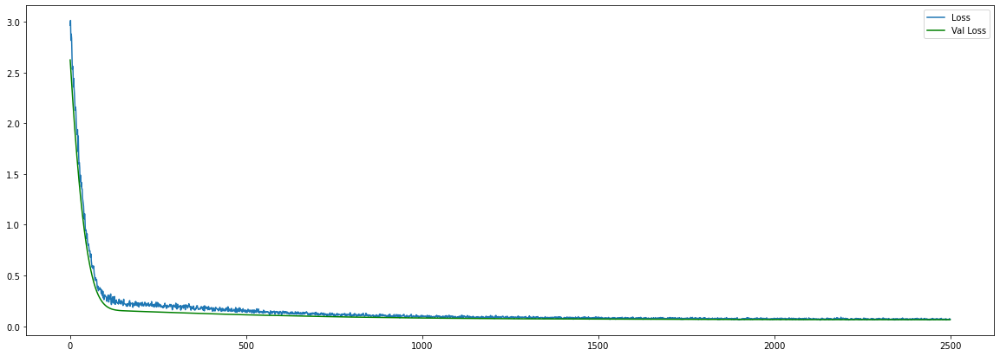

final loss: 0.06876561045646667
final val_loss: 0.06489058583974838
Get best hyperparameter for simple LSTM


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


INFO:tensorflow:Oracle triggered exit
Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 1, 5)]            0         
_________________________________________________________________
lstm (LSTM)                  (None, 1, 112)            52864     
_________________________________________________________________
lstm_1 (LSTM)                (None, 1, 112)            100800    
_________________________________________________________________
lstm_2 (LSTM)                (None, 112)               100800    
_________________________________________________________________
dense (Dense)                (None, 8)                 904       
_________________________________________________________________
dense_1 (Dense)              (None, 8)                 72        
_________________________________________________________________
dense_2 (Dense)        

Epoch 00026: val_loss improved from 0.77571 to 0.75518, saving model to MSN_1D_LSTM.hdf5
Epoch 27/2500
1/1 [==============================] - ETA: 0s - loss: 0.7876 - mae: 0.700 - 0s 35ms/step - loss: 0.7876 - mae: 0.7006 - val_loss: 0.7323 - val_mae: 0.7153

Epoch 00027: val_loss improved from 0.75518 to 0.73227, saving model to MSN_1D_LSTM.hdf5
Epoch 28/2500
1/1 [==============================] - ETA: 0s - loss: 0.7593 - mae: 0.689 - 0s 33ms/step - loss: 0.7593 - mae: 0.6891 - val_loss: 0.7069 - val_mae: 0.7031

Epoch 00028: val_loss improved from 0.73227 to 0.70686, saving model to MSN_1D_LSTM.hdf5
Epoch 29/2500
1/1 [==============================] - ETA: 0s - loss: 0.7281 - mae: 0.675 - 0s 34ms/step - loss: 0.7281 - mae: 0.6759 - val_loss: 0.6791 - val_mae: 0.6893

Epoch 00029: val_loss improved from 0.70686 to 0.67906, saving model to MSN_1D_LSTM.hdf5
Epoch 30/2500
1/1 [==============================] - ETA: 0s - loss: 0.6940 - mae: 0.661 - 0s 34ms/step - loss: 0.6940 - mae: 0.661


Epoch 00059: val_loss improved from 0.37712 to 0.37268, saving model to MSN_1D_LSTM.hdf5
Epoch 60/2500
1/1 [==============================] - ETA: 0s - loss: 0.3345 - mae: 0.434 - 0s 35ms/step - loss: 0.3345 - mae: 0.4345 - val_loss: 0.3680 - val_mae: 0.4844

Epoch 00060: val_loss improved from 0.37268 to 0.36799, saving model to MSN_1D_LSTM.hdf5
Epoch 61/2500
1/1 [==============================] - ETA: 0s - loss: 0.3290 - mae: 0.430 - 0s 34ms/step - loss: 0.3290 - mae: 0.4303 - val_loss: 0.3632 - val_mae: 0.4810

Epoch 00061: val_loss improved from 0.36799 to 0.36320, saving model to MSN_1D_LSTM.hdf5
Epoch 62/2500
1/1 [==============================] - ETA: 0s - loss: 0.3231 - mae: 0.425 - 0s 33ms/step - loss: 0.3231 - mae: 0.4256 - val_loss: 0.3585 - val_mae: 0.4773

Epoch 00062: val_loss improved from 0.36320 to 0.35847, saving model to MSN_1D_LSTM.hdf5
Epoch 63/2500
1/1 [==============================] - ETA: 0s - loss: 0.3170 - mae: 0.420 - 0s 32ms/step - loss: 0.3170 - mae: 0.42

1/1 [==============================] - ETA: 0s - loss: 0.1514 - mae: 0.294 - 0s 37ms/step - loss: 0.1514 - mae: 0.2941 - val_loss: 0.1634 - val_mae: 0.3401

Epoch 00091: val_loss improved from 0.17158 to 0.16338, saving model to MSN_1D_LSTM.hdf5
Epoch 92/2500
1/1 [==============================] - ETA: 0s - loss: 0.1447 - mae: 0.287 - 0s 36ms/step - loss: 0.1447 - mae: 0.2876 - val_loss: 0.1553 - val_mae: 0.3318

Epoch 00092: val_loss improved from 0.16338 to 0.15530, saving model to MSN_1D_LSTM.hdf5
Epoch 93/2500
1/1 [==============================] - ETA: 0s - loss: 0.1381 - mae: 0.281 - 0s 35ms/step - loss: 0.1381 - mae: 0.2810 - val_loss: 0.1474 - val_mae: 0.3235

Epoch 00093: val_loss improved from 0.15530 to 0.14738, saving model to MSN_1D_LSTM.hdf5
Epoch 94/2500
1/1 [==============================] - ETA: 0s - loss: 0.1318 - mae: 0.274 - 0s 48ms/step - loss: 0.1318 - mae: 0.2748 - val_loss: 0.1396 - val_mae: 0.3148

Epoch 00094: val_loss improved from 0.14738 to 0.13962, saving 

1/1 [==============================] - ETA: 0s - loss: 0.0720 - mae: 0.193 - 0s 38ms/step - loss: 0.0720 - mae: 0.1932 - val_loss: 0.0801 - val_mae: 0.2082

Epoch 00124: val_loss improved from 0.08087 to 0.08014, saving model to MSN_1D_LSTM.hdf5
Epoch 125/2500
1/1 [==============================] - ETA: 0s - loss: 0.0712 - mae: 0.191 - 0s 36ms/step - loss: 0.0712 - mae: 0.1915 - val_loss: 0.0795 - val_mae: 0.2050

Epoch 00125: val_loss improved from 0.08014 to 0.07954, saving model to MSN_1D_LSTM.hdf5
Epoch 126/2500
1/1 [==============================] - ETA: 0s - loss: 0.0705 - mae: 0.190 - 0s 36ms/step - loss: 0.0705 - mae: 0.1900 - val_loss: 0.0791 - val_mae: 0.2023

Epoch 00126: val_loss improved from 0.07954 to 0.07908, saving model to MSN_1D_LSTM.hdf5
Epoch 127/2500
1/1 [==============================] - ETA: 0s - loss: 0.0699 - mae: 0.188 - 0s 34ms/step - loss: 0.0699 - mae: 0.1888 - val_loss: 0.0787 - val_mae: 0.2004

Epoch 00127: val_loss improved from 0.07908 to 0.07872, savi

1/1 [==============================] - ETA: 0s - loss: 0.0601 - mae: 0.169 - 0s 39ms/step - loss: 0.0601 - mae: 0.1691 - val_loss: 0.0771 - val_mae: 0.1974

Epoch 00158: val_loss did not improve from 0.07704
Epoch 159/2500
1/1 [==============================] - ETA: 0s - loss: 0.0599 - mae: 0.168 - 0s 38ms/step - loss: 0.0599 - mae: 0.1688 - val_loss: 0.0772 - val_mae: 0.1974

Epoch 00159: val_loss did not improve from 0.07704
Epoch 160/2500
1/1 [==============================] - ETA: 0s - loss: 0.0598 - mae: 0.168 - 0s 38ms/step - loss: 0.0598 - mae: 0.1684 - val_loss: 0.0772 - val_mae: 0.1975

Epoch 00160: val_loss did not improve from 0.07704
Epoch 161/2500
1/1 [==============================] - ETA: 0s - loss: 0.0596 - mae: 0.168 - 0s 38ms/step - loss: 0.0596 - mae: 0.1681 - val_loss: 0.0773 - val_mae: 0.1974

Epoch 00161: val_loss did not improve from 0.07704
Epoch 162/2500
1/1 [==============================] - ETA: 0s - loss: 0.0595 - mae: 0.167 - 0s 47ms/step - loss: 0.0595 - m

Epoch 00190: val_loss improved from 0.07523 to 0.07512, saving model to MSN_1D_LSTM.hdf5
Epoch 191/2500
1/1 [==============================] - ETA: 0s - loss: 0.0567 - mae: 0.163 - 0s 35ms/step - loss: 0.0567 - mae: 0.1637 - val_loss: 0.0750 - val_mae: 0.1926

Epoch 00191: val_loss improved from 0.07512 to 0.07501, saving model to MSN_1D_LSTM.hdf5
Epoch 192/2500
1/1 [==============================] - ETA: 0s - loss: 0.0566 - mae: 0.163 - 0s 36ms/step - loss: 0.0566 - mae: 0.1635 - val_loss: 0.0749 - val_mae: 0.1925

Epoch 00192: val_loss improved from 0.07501 to 0.07492, saving model to MSN_1D_LSTM.hdf5
Epoch 193/2500
1/1 [==============================] - ETA: 0s - loss: 0.0565 - mae: 0.163 - 0s 39ms/step - loss: 0.0565 - mae: 0.1634 - val_loss: 0.0748 - val_mae: 0.1923

Epoch 00193: val_loss improved from 0.07492 to 0.07483, saving model to MSN_1D_LSTM.hdf5
Epoch 194/2500
1/1 [==============================] - ETA: 0s - loss: 0.0565 - mae: 0.163 - 0s 35ms/step - loss: 0.0565 - mae: 0

Epoch 222/2500
1/1 [==============================] - ETA: 0s - loss: 0.0538 - mae: 0.159 - 0s 37ms/step - loss: 0.0538 - mae: 0.1596 - val_loss: 0.0721 - val_mae: 0.1891

Epoch 00222: val_loss improved from 0.07220 to 0.07212, saving model to MSN_1D_LSTM.hdf5
Epoch 223/2500
1/1 [==============================] - ETA: 0s - loss: 0.0536 - mae: 0.159 - 0s 39ms/step - loss: 0.0536 - mae: 0.1595 - val_loss: 0.0721 - val_mae: 0.1890

Epoch 00223: val_loss improved from 0.07212 to 0.07205, saving model to MSN_1D_LSTM.hdf5
Epoch 224/2500
1/1 [==============================] - ETA: 0s - loss: 0.0535 - mae: 0.159 - 0s 42ms/step - loss: 0.0535 - mae: 0.1593 - val_loss: 0.0720 - val_mae: 0.1889

Epoch 00224: val_loss improved from 0.07205 to 0.07198, saving model to MSN_1D_LSTM.hdf5
Epoch 225/2500
1/1 [==============================] - ETA: 0s - loss: 0.0534 - mae: 0.159 - 0s 38ms/step - loss: 0.0534 - mae: 0.1592 - val_loss: 0.0719 - val_mae: 0.1888

Epoch 00225: val_loss improved from 0.07198 t


Epoch 00253: val_loss improved from 0.06997 to 0.06989, saving model to MSN_1D_LSTM.hdf5
Epoch 254/2500
1/1 [==============================] - ETA: 0s - loss: 0.0512 - mae: 0.156 - 0s 34ms/step - loss: 0.0512 - mae: 0.1562 - val_loss: 0.0698 - val_mae: 0.1862

Epoch 00254: val_loss improved from 0.06989 to 0.06981, saving model to MSN_1D_LSTM.hdf5
Epoch 255/2500
1/1 [==============================] - ETA: 0s - loss: 0.0511 - mae: 0.156 - 0s 34ms/step - loss: 0.0511 - mae: 0.1562 - val_loss: 0.0697 - val_mae: 0.1861

Epoch 00255: val_loss improved from 0.06981 to 0.06972, saving model to MSN_1D_LSTM.hdf5
Epoch 256/2500
1/1 [==============================] - ETA: 0s - loss: 0.0511 - mae: 0.156 - 0s 35ms/step - loss: 0.0511 - mae: 0.1561 - val_loss: 0.0696 - val_mae: 0.1861

Epoch 00256: val_loss improved from 0.06972 to 0.06964, saving model to MSN_1D_LSTM.hdf5
Epoch 257/2500
1/1 [==============================] - ETA: 0s - loss: 0.0510 - mae: 0.156 - 0s 33ms/step - loss: 0.0510 - mae: 

Epoch 285/2500
1/1 [==============================] - ETA: 0s - loss: 0.0494 - mae: 0.154 - 0s 34ms/step - loss: 0.0494 - mae: 0.1546 - val_loss: 0.0677 - val_mae: 0.1846

Epoch 00285: val_loss improved from 0.06778 to 0.06772, saving model to MSN_1D_LSTM.hdf5
Epoch 286/2500
1/1 [==============================] - ETA: 0s - loss: 0.0494 - mae: 0.154 - 0s 37ms/step - loss: 0.0494 - mae: 0.1545 - val_loss: 0.0677 - val_mae: 0.1846

Epoch 00286: val_loss improved from 0.06772 to 0.06767, saving model to MSN_1D_LSTM.hdf5
Epoch 287/2500
1/1 [==============================] - ETA: 0s - loss: 0.0494 - mae: 0.154 - 0s 35ms/step - loss: 0.0494 - mae: 0.1545 - val_loss: 0.0676 - val_mae: 0.1845

Epoch 00287: val_loss improved from 0.06767 to 0.06762, saving model to MSN_1D_LSTM.hdf5
Epoch 288/2500
1/1 [==============================] - ETA: 0s - loss: 0.0493 - mae: 0.154 - 0s 34ms/step - loss: 0.0493 - mae: 0.1544 - val_loss: 0.0676 - val_mae: 0.1845

Epoch 00288: val_loss improved from 0.06762 t


Epoch 00316: val_loss improved from 0.06655 to 0.06652, saving model to MSN_1D_LSTM.hdf5
Epoch 317/2500
1/1 [==============================] - ETA: 0s - loss: 0.0482 - mae: 0.153 - 0s 35ms/step - loss: 0.0482 - mae: 0.1530 - val_loss: 0.0665 - val_mae: 0.1837

Epoch 00317: val_loss improved from 0.06652 to 0.06650, saving model to MSN_1D_LSTM.hdf5
Epoch 318/2500
1/1 [==============================] - ETA: 0s - loss: 0.0482 - mae: 0.152 - 0s 35ms/step - loss: 0.0482 - mae: 0.1529 - val_loss: 0.0665 - val_mae: 0.1837

Epoch 00318: val_loss improved from 0.06650 to 0.06647, saving model to MSN_1D_LSTM.hdf5
Epoch 319/2500
1/1 [==============================] - ETA: 0s - loss: 0.0481 - mae: 0.152 - 0s 57ms/step - loss: 0.0481 - mae: 0.1529 - val_loss: 0.0665 - val_mae: 0.1837

Epoch 00319: val_loss improved from 0.06647 to 0.06645, saving model to MSN_1D_LSTM.hdf5
Epoch 320/2500
1/1 [==============================] - ETA: 0s - loss: 0.0481 - mae: 0.152 - 0s 35ms/step - loss: 0.0481 - mae: 


Epoch 00348: val_loss improved from 0.06595 to 0.06593, saving model to MSN_1D_LSTM.hdf5
Epoch 349/2500
1/1 [==============================] - ETA: 0s - loss: 0.0473 - mae: 0.151 - 0s 36ms/step - loss: 0.0473 - mae: 0.1519 - val_loss: 0.0659 - val_mae: 0.1840

Epoch 00349: val_loss improved from 0.06593 to 0.06592, saving model to MSN_1D_LSTM.hdf5
Epoch 350/2500
1/1 [==============================] - ETA: 0s - loss: 0.0473 - mae: 0.151 - 0s 35ms/step - loss: 0.0473 - mae: 0.1519 - val_loss: 0.0659 - val_mae: 0.1840

Epoch 00350: val_loss improved from 0.06592 to 0.06591, saving model to MSN_1D_LSTM.hdf5
Epoch 351/2500
1/1 [==============================] - ETA: 0s - loss: 0.0472 - mae: 0.151 - 0s 33ms/step - loss: 0.0472 - mae: 0.1519 - val_loss: 0.0659 - val_mae: 0.1840

Epoch 00351: val_loss improved from 0.06591 to 0.06591, saving model to MSN_1D_LSTM.hdf5
Epoch 352/2500
1/1 [==============================] - ETA: 0s - loss: 0.0472 - mae: 0.151 - 0s 35ms/step - loss: 0.0472 - mae: 

1/1 [==============================] - ETA: 0s - loss: 0.0466 - mae: 0.151 - 0s 33ms/step - loss: 0.0466 - mae: 0.1512 - val_loss: 0.0658 - val_mae: 0.1847

Epoch 00381: val_loss did not improve from 0.06580
Epoch 382/2500
1/1 [==============================] - ETA: 0s - loss: 0.0465 - mae: 0.151 - 0s 32ms/step - loss: 0.0465 - mae: 0.1512 - val_loss: 0.0658 - val_mae: 0.1848

Epoch 00382: val_loss did not improve from 0.06580
Epoch 383/2500
1/1 [==============================] - ETA: 0s - loss: 0.0465 - mae: 0.151 - 0s 35ms/step - loss: 0.0465 - mae: 0.1511 - val_loss: 0.0658 - val_mae: 0.1848

Epoch 00383: val_loss did not improve from 0.06580
Epoch 384/2500
1/1 [==============================] - ETA: 0s - loss: 0.0465 - mae: 0.151 - 0s 36ms/step - loss: 0.0465 - mae: 0.1511 - val_loss: 0.0658 - val_mae: 0.1848

Epoch 00384: val_loss did not improve from 0.06580
Epoch 385/2500
1/1 [==============================] - ETA: 0s - loss: 0.0465 - mae: 0.151 - 0s 34ms/step - loss: 0.0465 - m


Epoch 00417: val_loss did not improve from 0.06580
Epoch 418/2500
1/1 [==============================] - ETA: 0s - loss: 0.0458 - mae: 0.150 - 0s 34ms/step - loss: 0.0458 - mae: 0.1503 - val_loss: 0.0660 - val_mae: 0.1863

Epoch 00418: val_loss did not improve from 0.06580
Epoch 419/2500
1/1 [==============================] - ETA: 0s - loss: 0.0457 - mae: 0.150 - 0s 33ms/step - loss: 0.0457 - mae: 0.1503 - val_loss: 0.0660 - val_mae: 0.1864

Epoch 00419: val_loss did not improve from 0.06580
Epoch 420/2500
1/1 [==============================] - ETA: 0s - loss: 0.0457 - mae: 0.150 - 0s 34ms/step - loss: 0.0457 - mae: 0.1503 - val_loss: 0.0660 - val_mae: 0.1864

Epoch 00420: val_loss did not improve from 0.06580
Epoch 421/2500
1/1 [==============================] - ETA: 0s - loss: 0.0457 - mae: 0.150 - 0s 37ms/step - loss: 0.0457 - mae: 0.1503 - val_loss: 0.0660 - val_mae: 0.1865

Epoch 00421: val_loss did not improve from 0.06580
Epoch 422/2500
1/1 [==============================] - ET


Epoch 00454: val_loss did not improve from 0.06580
Epoch 455/2500
1/1 [==============================] - ETA: 0s - loss: 0.0450 - mae: 0.149 - 0s 32ms/step - loss: 0.0450 - mae: 0.1496 - val_loss: 0.0667 - val_mae: 0.1887

Epoch 00455: val_loss did not improve from 0.06580
Epoch 456/2500
1/1 [==============================] - ETA: 0s - loss: 0.0449 - mae: 0.149 - 0s 33ms/step - loss: 0.0449 - mae: 0.1495 - val_loss: 0.0668 - val_mae: 0.1888

Epoch 00456: val_loss did not improve from 0.06580
Epoch 457/2500
1/1 [==============================] - ETA: 0s - loss: 0.0449 - mae: 0.149 - 0s 34ms/step - loss: 0.0449 - mae: 0.1495 - val_loss: 0.0668 - val_mae: 0.1889

Epoch 00457: val_loss did not improve from 0.06580
Epoch 458/2500
1/1 [==============================] - ETA: 0s - loss: 0.0449 - mae: 0.149 - 0s 34ms/step - loss: 0.0449 - mae: 0.1495 - val_loss: 0.0668 - val_mae: 0.1890

Epoch 00458: val_loss did not improve from 0.06580
Epoch 459/2500
1/1 [==============================] - ET


Epoch 00491: val_loss did not improve from 0.06580
Epoch 492/2500
1/1 [==============================] - ETA: 0s - loss: 0.0442 - mae: 0.149 - 0s 33ms/step - loss: 0.0442 - mae: 0.1492 - val_loss: 0.0688 - val_mae: 0.1927

Epoch 00492: val_loss did not improve from 0.06580
Epoch 493/2500
1/1 [==============================] - ETA: 0s - loss: 0.0442 - mae: 0.149 - 0s 33ms/step - loss: 0.0442 - mae: 0.1492 - val_loss: 0.0689 - val_mae: 0.1928

Epoch 00493: val_loss did not improve from 0.06580
Epoch 494/2500
1/1 [==============================] - ETA: 0s - loss: 0.0442 - mae: 0.149 - 0s 33ms/step - loss: 0.0442 - mae: 0.1492 - val_loss: 0.0689 - val_mae: 0.1929

Epoch 00494: val_loss did not improve from 0.06580
Epoch 495/2500
1/1 [==============================] - ETA: 0s - loss: 0.0441 - mae: 0.149 - 0s 32ms/step - loss: 0.0441 - mae: 0.1492 - val_loss: 0.0690 - val_mae: 0.1930

Epoch 00495: val_loss did not improve from 0.06580
Epoch 496/2500
1/1 [==============================] - ET


Epoch 00528: val_loss did not improve from 0.06580
Epoch 529/2500
1/1 [==============================] - ETA: 0s - loss: 0.0435 - mae: 0.148 - 0s 33ms/step - loss: 0.0435 - mae: 0.1488 - val_loss: 0.0724 - val_mae: 0.1971

Epoch 00529: val_loss did not improve from 0.06580
Epoch 530/2500
1/1 [==============================] - ETA: 0s - loss: 0.0435 - mae: 0.148 - 0s 33ms/step - loss: 0.0435 - mae: 0.1488 - val_loss: 0.0725 - val_mae: 0.1972

Epoch 00530: val_loss did not improve from 0.06580
Epoch 531/2500
1/1 [==============================] - ETA: 0s - loss: 0.0435 - mae: 0.148 - 0s 33ms/step - loss: 0.0435 - mae: 0.1487 - val_loss: 0.0726 - val_mae: 0.1973

Epoch 00531: val_loss did not improve from 0.06580
Epoch 532/2500
1/1 [==============================] - ETA: 0s - loss: 0.0435 - mae: 0.148 - 0s 33ms/step - loss: 0.0435 - mae: 0.1487 - val_loss: 0.0728 - val_mae: 0.1974

Epoch 00532: val_loss did not improve from 0.06580
Epoch 533/2500
1/1 [==============================] - ET


Epoch 00565: val_loss did not improve from 0.06580
Epoch 566/2500
1/1 [==============================] - ETA: 0s - loss: 0.0430 - mae: 0.148 - 0s 36ms/step - loss: 0.0430 - mae: 0.1482 - val_loss: 0.0761 - val_mae: 0.2006

Epoch 00566: val_loss did not improve from 0.06580
Epoch 567/2500
1/1 [==============================] - ETA: 0s - loss: 0.0430 - mae: 0.148 - 0s 33ms/step - loss: 0.0430 - mae: 0.1482 - val_loss: 0.0762 - val_mae: 0.2006

Epoch 00567: val_loss did not improve from 0.06580
Epoch 568/2500
1/1 [==============================] - ETA: 0s - loss: 0.0430 - mae: 0.148 - 0s 33ms/step - loss: 0.0430 - mae: 0.1481 - val_loss: 0.0763 - val_mae: 0.2008

Epoch 00568: val_loss did not improve from 0.06580
Epoch 569/2500
1/1 [==============================] - ETA: 0s - loss: 0.0430 - mae: 0.148 - 0s 33ms/step - loss: 0.0430 - mae: 0.1481 - val_loss: 0.0764 - val_mae: 0.2009

Epoch 00569: val_loss did not improve from 0.06580
Epoch 570/2500
1/1 [==============================] - ET


Epoch 00602: val_loss did not improve from 0.06580
Epoch 603/2500
1/1 [==============================] - ETA: 0s - loss: 0.0426 - mae: 0.147 - 0s 33ms/step - loss: 0.0426 - mae: 0.1479 - val_loss: 0.0790 - val_mae: 0.2035

Epoch 00603: val_loss did not improve from 0.06580
Epoch 604/2500
1/1 [==============================] - ETA: 0s - loss: 0.0426 - mae: 0.147 - 0s 33ms/step - loss: 0.0426 - mae: 0.1479 - val_loss: 0.0791 - val_mae: 0.2036

Epoch 00604: val_loss did not improve from 0.06580
Epoch 605/2500
1/1 [==============================] - ETA: 0s - loss: 0.0426 - mae: 0.147 - 0s 33ms/step - loss: 0.0426 - mae: 0.1479 - val_loss: 0.0791 - val_mae: 0.2036

Epoch 00605: val_loss did not improve from 0.06580
Epoch 606/2500
1/1 [==============================] - ETA: 0s - loss: 0.0426 - mae: 0.147 - 0s 33ms/step - loss: 0.0426 - mae: 0.1478 - val_loss: 0.0791 - val_mae: 0.2036

Epoch 00606: val_loss did not improve from 0.06580
Epoch 607/2500
1/1 [==============================] - ET

1/1 [==============================] - ETA: 0s - loss: 0.0424 - mae: 0.147 - 0s 33ms/step - loss: 0.0424 - mae: 0.1475 - val_loss: 0.0802 - val_mae: 0.2047

Epoch 00639: val_loss did not improve from 0.06580
Epoch 640/2500
1/1 [==============================] - ETA: 0s - loss: 0.0424 - mae: 0.147 - 0s 33ms/step - loss: 0.0424 - mae: 0.1475 - val_loss: 0.0802 - val_mae: 0.2046

Epoch 00640: val_loss did not improve from 0.06580
Epoch 641/2500
1/1 [==============================] - ETA: 0s - loss: 0.0424 - mae: 0.147 - 0s 34ms/step - loss: 0.0424 - mae: 0.1475 - val_loss: 0.0802 - val_mae: 0.2047

Epoch 00641: val_loss did not improve from 0.06580
Epoch 642/2500
1/1 [==============================] - ETA: 0s - loss: 0.0424 - mae: 0.147 - 0s 33ms/step - loss: 0.0424 - mae: 0.1475 - val_loss: 0.0802 - val_mae: 0.2047

Epoch 00642: val_loss did not improve from 0.06580
Epoch 643/2500
1/1 [==============================] - ETA: 0s - loss: 0.0424 - mae: 0.147 - 0s 33ms/step - loss: 0.0424 - m

Epoch 00675: val_loss did not improve from 0.06580
Epoch 676/2500
1/1 [==============================] - ETA: 0s - loss: 0.0422 - mae: 0.147 - 0s 33ms/step - loss: 0.0422 - mae: 0.1474 - val_loss: 0.0809 - val_mae: 0.2053

Epoch 00676: val_loss did not improve from 0.06580
Epoch 677/2500
1/1 [==============================] - ETA: 0s - loss: 0.0422 - mae: 0.147 - 0s 33ms/step - loss: 0.0422 - mae: 0.1474 - val_loss: 0.0809 - val_mae: 0.2053

Epoch 00677: val_loss did not improve from 0.06580
Epoch 678/2500
1/1 [==============================] - ETA: 0s - loss: 0.0422 - mae: 0.147 - 0s 32ms/step - loss: 0.0422 - mae: 0.1474 - val_loss: 0.0809 - val_mae: 0.2053

Epoch 00678: val_loss did not improve from 0.06580
Epoch 679/2500
1/1 [==============================] - ETA: 0s - loss: 0.0422 - mae: 0.147 - 0s 34ms/step - loss: 0.0422 - mae: 0.1474 - val_loss: 0.0810 - val_mae: 0.2054

Epoch 00679: val_loss did not improve from 0.06580
Epoch 680/2500
1/1 [==============================] - ETA


Epoch 00712: val_loss did not improve from 0.06580
Epoch 713/2500
1/1 [==============================] - ETA: 0s - loss: 0.0421 - mae: 0.147 - 0s 32ms/step - loss: 0.0421 - mae: 0.1471 - val_loss: 0.0814 - val_mae: 0.2056

Epoch 00713: val_loss did not improve from 0.06580
Epoch 714/2500
1/1 [==============================] - ETA: 0s - loss: 0.0421 - mae: 0.147 - 0s 33ms/step - loss: 0.0421 - mae: 0.1471 - val_loss: 0.0814 - val_mae: 0.2055

Epoch 00714: val_loss did not improve from 0.06580
Epoch 715/2500
1/1 [==============================] - ETA: 0s - loss: 0.0421 - mae: 0.147 - 0s 32ms/step - loss: 0.0421 - mae: 0.1471 - val_loss: 0.0813 - val_mae: 0.2055

Epoch 00715: val_loss did not improve from 0.06580
Epoch 716/2500
1/1 [==============================] - ETA: 0s - loss: 0.0421 - mae: 0.147 - 0s 32ms/step - loss: 0.0421 - mae: 0.1471 - val_loss: 0.0814 - val_mae: 0.2055

Epoch 00716: val_loss did not improve from 0.06580
Epoch 717/2500
1/1 [==============================] - ET


Epoch 00749: val_loss did not improve from 0.06580
Epoch 750/2500
1/1 [==============================] - ETA: 0s - loss: 0.0419 - mae: 0.147 - 0s 34ms/step - loss: 0.0419 - mae: 0.1470 - val_loss: 0.0817 - val_mae: 0.2055

Epoch 00750: val_loss did not improve from 0.06580
Epoch 751/2500
1/1 [==============================] - ETA: 0s - loss: 0.0419 - mae: 0.147 - 0s 32ms/step - loss: 0.0419 - mae: 0.1470 - val_loss: 0.0816 - val_mae: 0.2055

Epoch 00751: val_loss did not improve from 0.06580
Epoch 752/2500
1/1 [==============================] - ETA: 0s - loss: 0.0419 - mae: 0.147 - 0s 33ms/step - loss: 0.0419 - mae: 0.1470 - val_loss: 0.0816 - val_mae: 0.2055

Epoch 00752: val_loss did not improve from 0.06580
Epoch 753/2500
1/1 [==============================] - ETA: 0s - loss: 0.0419 - mae: 0.147 - 0s 33ms/step - loss: 0.0419 - mae: 0.1470 - val_loss: 0.0816 - val_mae: 0.2055

Epoch 00753: val_loss did not improve from 0.06580
Epoch 754/2500
1/1 [==============================] - ET


Epoch 00786: val_loss did not improve from 0.06580
Epoch 787/2500
1/1 [==============================] - ETA: 0s - loss: 0.0418 - mae: 0.146 - 0s 34ms/step - loss: 0.0418 - mae: 0.1468 - val_loss: 0.0817 - val_mae: 0.2054

Epoch 00787: val_loss did not improve from 0.06580
Epoch 788/2500
1/1 [==============================] - ETA: 0s - loss: 0.0418 - mae: 0.146 - 0s 32ms/step - loss: 0.0418 - mae: 0.1468 - val_loss: 0.0818 - val_mae: 0.2054

Epoch 00788: val_loss did not improve from 0.06580
Epoch 789/2500
1/1 [==============================] - ETA: 0s - loss: 0.0418 - mae: 0.146 - 0s 33ms/step - loss: 0.0418 - mae: 0.1468 - val_loss: 0.0818 - val_mae: 0.2055

Epoch 00789: val_loss did not improve from 0.06580
Epoch 790/2500
1/1 [==============================] - ETA: 0s - loss: 0.0418 - mae: 0.146 - 0s 34ms/step - loss: 0.0418 - mae: 0.1468 - val_loss: 0.0818 - val_mae: 0.2055

Epoch 00790: val_loss did not improve from 0.06580
Epoch 791/2500
1/1 [==============================] - ET


Epoch 00823: val_loss did not improve from 0.06580
Epoch 824/2500
1/1 [==============================] - ETA: 0s - loss: 0.0416 - mae: 0.146 - 0s 33ms/step - loss: 0.0416 - mae: 0.1467 - val_loss: 0.0817 - val_mae: 0.2053

Epoch 00824: val_loss did not improve from 0.06580
Epoch 825/2500
1/1 [==============================] - ETA: 0s - loss: 0.0416 - mae: 0.146 - 0s 32ms/step - loss: 0.0416 - mae: 0.1467 - val_loss: 0.0817 - val_mae: 0.2053

Epoch 00825: val_loss did not improve from 0.06580
Epoch 826/2500
1/1 [==============================] - ETA: 0s - loss: 0.0416 - mae: 0.146 - 0s 33ms/step - loss: 0.0416 - mae: 0.1467 - val_loss: 0.0817 - val_mae: 0.2054

Epoch 00826: val_loss did not improve from 0.06580
Epoch 827/2500
1/1 [==============================] - ETA: 0s - loss: 0.0416 - mae: 0.146 - 0s 33ms/step - loss: 0.0416 - mae: 0.1467 - val_loss: 0.0817 - val_mae: 0.2054

Epoch 00827: val_loss did not improve from 0.06580
Epoch 828/2500
1/1 [==============================] - ET


Epoch 00860: val_loss did not improve from 0.06580
Epoch 861/2500
1/1 [==============================] - ETA: 0s - loss: 0.0415 - mae: 0.146 - 0s 32ms/step - loss: 0.0415 - mae: 0.1466 - val_loss: 0.0814 - val_mae: 0.2052

Epoch 00861: val_loss did not improve from 0.06580
Epoch 862/2500
1/1 [==============================] - ETA: 0s - loss: 0.0415 - mae: 0.146 - 0s 33ms/step - loss: 0.0415 - mae: 0.1466 - val_loss: 0.0814 - val_mae: 0.2052

Epoch 00862: val_loss did not improve from 0.06580
Epoch 863/2500
1/1 [==============================] - ETA: 0s - loss: 0.0415 - mae: 0.146 - 0s 33ms/step - loss: 0.0415 - mae: 0.1466 - val_loss: 0.0814 - val_mae: 0.2052

Epoch 00863: val_loss did not improve from 0.06580
Epoch 864/2500
1/1 [==============================] - ETA: 0s - loss: 0.0415 - mae: 0.146 - 0s 33ms/step - loss: 0.0415 - mae: 0.1465 - val_loss: 0.0814 - val_mae: 0.2052

Epoch 00864: val_loss did not improve from 0.06580
Epoch 865/2500
1/1 [==============================] - ET

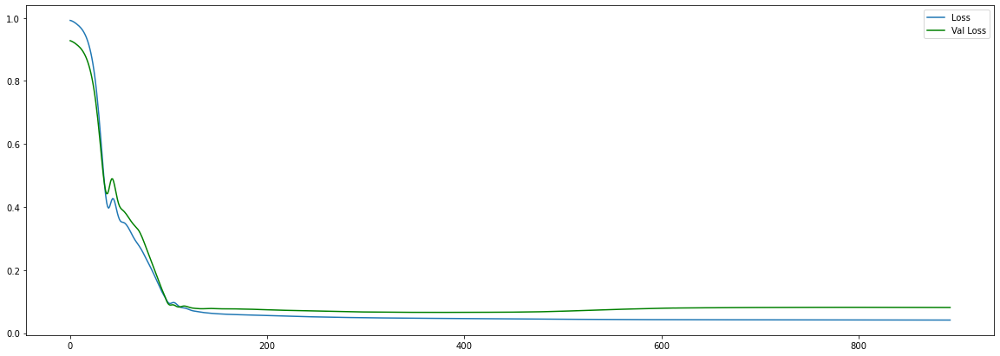

final loss: 0.041418708860874176
final val_loss: 0.08129989355802536
Get best hyperparameter for simple GRU


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


INFO:tensorflow:Oracle triggered exit
Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 1, 5)]            0         
_________________________________________________________________
gru (GRU)                    (None, 112)               39984     
_________________________________________________________________
dense (Dense)                (None, 64)                7232      
_________________________________________________________________
dropout (Dropout)            (None, 64)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 65        
Total params: 47,281
Trainable params: 47,281
Non-trainable params: 0
_________________________________________________________________
Start training simple GRU
Epoch 1/2500
1/1 [==============================] - ETA: 0s

Epoch 00029: val_loss did not improve from 0.09034
Epoch 30/2500
1/1 [==============================] - ETA: 0s - loss: 0.1079 - mae: 0.239 - 0s 25ms/step - loss: 0.1079 - mae: 0.2391 - val_loss: 0.1136 - val_mae: 0.2362

Epoch 00030: val_loss did not improve from 0.09034
Epoch 31/2500
1/1 [==============================] - ETA: 0s - loss: 0.1124 - mae: 0.240 - 0s 24ms/step - loss: 0.1124 - mae: 0.2404 - val_loss: 0.1111 - val_mae: 0.2336

Epoch 00031: val_loss did not improve from 0.09034
Epoch 32/2500
1/1 [==============================] - ETA: 0s - loss: 0.1112 - mae: 0.242 - 0s 23ms/step - loss: 0.1112 - mae: 0.2429 - val_loss: 0.1080 - val_mae: 0.2307

Epoch 00032: val_loss did not improve from 0.09034
Epoch 33/2500
1/1 [==============================] - ETA: 0s - loss: 0.1007 - mae: 0.230 - 0s 22ms/step - loss: 0.1007 - mae: 0.2304 - val_loss: 0.1043 - val_mae: 0.2280

Epoch 00033: val_loss did not improve from 0.09034
Epoch 34/2500
1/1 [==============================] - ETA: 0s 


Epoch 00063: val_loss did not improve from 0.07757
Epoch 64/2500
1/1 [==============================] - ETA: 0s - loss: 0.0855 - mae: 0.198 - 0s 24ms/step - loss: 0.0855 - mae: 0.1988 - val_loss: 0.0789 - val_mae: 0.2023

Epoch 00064: val_loss did not improve from 0.07757
Epoch 65/2500
1/1 [==============================] - ETA: 0s - loss: 0.0757 - mae: 0.194 - 0s 23ms/step - loss: 0.0757 - mae: 0.1945 - val_loss: 0.0789 - val_mae: 0.2028

Epoch 00065: val_loss did not improve from 0.07757
Epoch 66/2500
1/1 [==============================] - ETA: 0s - loss: 0.0728 - mae: 0.194 - 0s 24ms/step - loss: 0.0728 - mae: 0.1945 - val_loss: 0.0790 - val_mae: 0.2032

Epoch 00066: val_loss did not improve from 0.07757
Epoch 67/2500
1/1 [==============================] - ETA: 0s - loss: 0.0748 - mae: 0.195 - 0s 41ms/step - loss: 0.0748 - mae: 0.1950 - val_loss: 0.0789 - val_mae: 0.2035

Epoch 00067: val_loss did not improve from 0.07757
Epoch 68/2500
1/1 [==============================] - ETA: 0s

Epoch 00097: val_loss did not improve from 0.07432
Epoch 98/2500
1/1 [==============================] - ETA: 0s - loss: 0.0752 - mae: 0.192 - 0s 25ms/step - loss: 0.0752 - mae: 0.1927 - val_loss: 0.0748 - val_mae: 0.1975

Epoch 00098: val_loss did not improve from 0.07432
Epoch 99/2500
1/1 [==============================] - ETA: 0s - loss: 0.0698 - mae: 0.185 - 0s 24ms/step - loss: 0.0698 - mae: 0.1855 - val_loss: 0.0748 - val_mae: 0.1977

Epoch 00099: val_loss did not improve from 0.07432
Epoch 100/2500
1/1 [==============================] - ETA: 0s - loss: 0.0739 - mae: 0.189 - 0s 24ms/step - loss: 0.0739 - mae: 0.1894 - val_loss: 0.0748 - val_mae: 0.1978

Epoch 00100: val_loss did not improve from 0.07432
Epoch 101/2500
1/1 [==============================] - ETA: 0s - loss: 0.0771 - mae: 0.192 - 0s 24ms/step - loss: 0.0771 - mae: 0.1925 - val_loss: 0.0747 - val_mae: 0.1980

Epoch 00101: val_loss did not improve from 0.07432
Epoch 102/2500
1/1 [==============================] - ETA: 


Epoch 00130: val_loss improved from 0.07125 to 0.07114, saving model to MSN_1D_GRU.hdf5
Epoch 131/2500
1/1 [==============================] - ETA: 0s - loss: 0.0717 - mae: 0.188 - 0s 26ms/step - loss: 0.0717 - mae: 0.1886 - val_loss: 0.0711 - val_mae: 0.1926

Epoch 00131: val_loss improved from 0.07114 to 0.07107, saving model to MSN_1D_GRU.hdf5
Epoch 132/2500
1/1 [==============================] - ETA: 0s - loss: 0.0699 - mae: 0.183 - 0s 23ms/step - loss: 0.0699 - mae: 0.1831 - val_loss: 0.0710 - val_mae: 0.1925

Epoch 00132: val_loss improved from 0.07107 to 0.07105, saving model to MSN_1D_GRU.hdf5
Epoch 133/2500
1/1 [==============================] - ETA: 0s - loss: 0.0670 - mae: 0.183 - 0s 23ms/step - loss: 0.0670 - mae: 0.1831 - val_loss: 0.0711 - val_mae: 0.1922

Epoch 00133: val_loss did not improve from 0.07105
Epoch 134/2500
1/1 [==============================] - ETA: 0s - loss: 0.0697 - mae: 0.183 - 0s 23ms/step - loss: 0.0697 - mae: 0.1832 - val_loss: 0.0711 - val_mae: 0.19

Epoch 164/2500
1/1 [==============================] - ETA: 0s - loss: 0.0688 - mae: 0.177 - 0s 22ms/step - loss: 0.0688 - mae: 0.1778 - val_loss: 0.0681 - val_mae: 0.1870

Epoch 00164: val_loss improved from 0.06851 to 0.06814, saving model to MSN_1D_GRU.hdf5
Epoch 165/2500
1/1 [==============================] - ETA: 0s - loss: 0.0654 - mae: 0.170 - 0s 23ms/step - loss: 0.0654 - mae: 0.1707 - val_loss: 0.0678 - val_mae: 0.1863

Epoch 00165: val_loss improved from 0.06814 to 0.06782, saving model to MSN_1D_GRU.hdf5
Epoch 166/2500
1/1 [==============================] - ETA: 0s - loss: 0.0645 - mae: 0.175 - 0s 23ms/step - loss: 0.0645 - mae: 0.1757 - val_loss: 0.0674 - val_mae: 0.1857

Epoch 00166: val_loss improved from 0.06782 to 0.06744, saving model to MSN_1D_GRU.hdf5
Epoch 167/2500
1/1 [==============================] - ETA: 0s - loss: 0.0637 - mae: 0.175 - 0s 24ms/step - loss: 0.0637 - mae: 0.1756 - val_loss: 0.0670 - val_mae: 0.1853

Epoch 00167: val_loss improved from 0.06744 to 0


Epoch 00198: val_loss improved from 0.06565 to 0.06529, saving model to MSN_1D_GRU.hdf5
Epoch 199/2500
1/1 [==============================] - ETA: 0s - loss: 0.0584 - mae: 0.169 - 0s 22ms/step - loss: 0.0584 - mae: 0.1695 - val_loss: 0.0651 - val_mae: 0.1849

Epoch 00199: val_loss improved from 0.06529 to 0.06507, saving model to MSN_1D_GRU.hdf5
Epoch 200/2500
1/1 [==============================] - ETA: 0s - loss: 0.0629 - mae: 0.173 - 0s 23ms/step - loss: 0.0629 - mae: 0.1732 - val_loss: 0.0649 - val_mae: 0.1849

Epoch 00200: val_loss improved from 0.06507 to 0.06486, saving model to MSN_1D_GRU.hdf5
Epoch 201/2500
1/1 [==============================] - ETA: 0s - loss: 0.0590 - mae: 0.173 - 0s 22ms/step - loss: 0.0590 - mae: 0.1739 - val_loss: 0.0647 - val_mae: 0.1849

Epoch 00201: val_loss improved from 0.06486 to 0.06469, saving model to MSN_1D_GRU.hdf5
Epoch 202/2500
1/1 [==============================] - ETA: 0s - loss: 0.0565 - mae: 0.167 - 0s 23ms/step - loss: 0.0565 - mae: 0.16


Epoch 00233: val_loss did not improve from 0.06342
Epoch 234/2500
1/1 [==============================] - ETA: 0s - loss: 0.0554 - mae: 0.168 - 0s 23ms/step - loss: 0.0554 - mae: 0.1683 - val_loss: 0.0640 - val_mae: 0.1826

Epoch 00234: val_loss did not improve from 0.06342
Epoch 235/2500
1/1 [==============================] - ETA: 0s - loss: 0.0570 - mae: 0.170 - 0s 24ms/step - loss: 0.0570 - mae: 0.1705 - val_loss: 0.0639 - val_mae: 0.1826

Epoch 00235: val_loss did not improve from 0.06342
Epoch 236/2500
1/1 [==============================] - ETA: 0s - loss: 0.0566 - mae: 0.168 - 0s 24ms/step - loss: 0.0566 - mae: 0.1685 - val_loss: 0.0639 - val_mae: 0.1824

Epoch 00236: val_loss did not improve from 0.06342
Epoch 237/2500
1/1 [==============================] - ETA: 0s - loss: 0.0576 - mae: 0.168 - 0s 24ms/step - loss: 0.0576 - mae: 0.1684 - val_loss: 0.0639 - val_mae: 0.1823

Epoch 00237: val_loss did not improve from 0.06342
Epoch 238/2500
1/1 [==============================] - ET

1/1 [==============================] - ETA: 0s - loss: 0.0519 - mae: 0.163 - 0s 23ms/step - loss: 0.0519 - mae: 0.1638 - val_loss: 0.0627 - val_mae: 0.1822

Epoch 00269: val_loss did not improve from 0.06235
Epoch 270/2500
1/1 [==============================] - ETA: 0s - loss: 0.0599 - mae: 0.172 - 0s 23ms/step - loss: 0.0599 - mae: 0.1720 - val_loss: 0.0627 - val_mae: 0.1816

Epoch 00270: val_loss did not improve from 0.06235
Epoch 271/2500
1/1 [==============================] - ETA: 0s - loss: 0.0608 - mae: 0.171 - 0s 25ms/step - loss: 0.0608 - mae: 0.1719 - val_loss: 0.0627 - val_mae: 0.1811

Epoch 00271: val_loss did not improve from 0.06235
Epoch 272/2500
1/1 [==============================] - ETA: 0s - loss: 0.0568 - mae: 0.167 - 0s 23ms/step - loss: 0.0568 - mae: 0.1677 - val_loss: 0.0629 - val_mae: 0.1811

Epoch 00272: val_loss did not improve from 0.06235
Epoch 273/2500
1/1 [==============================] - ETA: 0s - loss: 0.0609 - mae: 0.174 - 0s 24ms/step - loss: 0.0609 - m

1/1 [==============================] - ETA: 0s - loss: 0.0483 - mae: 0.162 - 0s 24ms/step - loss: 0.0483 - mae: 0.1624 - val_loss: 0.0632 - val_mae: 0.1842

Epoch 00305: val_loss did not improve from 0.06144
Epoch 306/2500
1/1 [==============================] - ETA: 0s - loss: 0.0570 - mae: 0.169 - 0s 25ms/step - loss: 0.0570 - mae: 0.1695 - val_loss: 0.0625 - val_mae: 0.1835

Epoch 00306: val_loss did not improve from 0.06144
Epoch 307/2500
1/1 [==============================] - ETA: 0s - loss: 0.0550 - mae: 0.168 - 0s 24ms/step - loss: 0.0550 - mae: 0.1685 - val_loss: 0.0619 - val_mae: 0.1828

Epoch 00307: val_loss did not improve from 0.06144
Epoch 308/2500
1/1 [==============================] - ETA: 0s - loss: 0.0561 - mae: 0.169 - 0s 24ms/step - loss: 0.0561 - mae: 0.1695 - val_loss: 0.0615 - val_mae: 0.1821

Epoch 00308: val_loss did not improve from 0.06144
Epoch 309/2500
1/1 [==============================] - ETA: 0s - loss: 0.0531 - mae: 0.163 - 0s 23ms/step - loss: 0.0531 - m


Epoch 00341: val_loss did not improve from 0.06124
Epoch 342/2500
1/1 [==============================] - ETA: 0s - loss: 0.0516 - mae: 0.162 - 0s 23ms/step - loss: 0.0516 - mae: 0.1628 - val_loss: 0.0630 - val_mae: 0.1834

Epoch 00342: val_loss did not improve from 0.06124
Epoch 343/2500
1/1 [==============================] - ETA: 0s - loss: 0.0523 - mae: 0.164 - 0s 23ms/step - loss: 0.0523 - mae: 0.1642 - val_loss: 0.0631 - val_mae: 0.1835

Epoch 00343: val_loss did not improve from 0.06124
Epoch 344/2500
1/1 [==============================] - ETA: 0s - loss: 0.0549 - mae: 0.168 - 0s 24ms/step - loss: 0.0549 - mae: 0.1681 - val_loss: 0.0632 - val_mae: 0.1838

Epoch 00344: val_loss did not improve from 0.06124
Epoch 345/2500
1/1 [==============================] - ETA: 0s - loss: 0.0564 - mae: 0.169 - 0s 23ms/step - loss: 0.0564 - mae: 0.1691 - val_loss: 0.0631 - val_mae: 0.1839

Epoch 00345: val_loss did not improve from 0.06124
Epoch 346/2500
1/1 [==============================] - ET


Epoch 00378: val_loss did not improve from 0.06124
Epoch 379/2500
1/1 [==============================] - ETA: 0s - loss: 0.0501 - mae: 0.161 - 0s 24ms/step - loss: 0.0501 - mae: 0.1619 - val_loss: 0.0651 - val_mae: 0.1861

Epoch 00379: val_loss did not improve from 0.06124
Epoch 380/2500
1/1 [==============================] - ETA: 0s - loss: 0.0546 - mae: 0.164 - 0s 23ms/step - loss: 0.0546 - mae: 0.1648 - val_loss: 0.0649 - val_mae: 0.1859

Epoch 00380: val_loss did not improve from 0.06124
Epoch 381/2500
1/1 [==============================] - ETA: 0s - loss: 0.0539 - mae: 0.168 - 0s 23ms/step - loss: 0.0539 - mae: 0.1683 - val_loss: 0.0642 - val_mae: 0.1851

Epoch 00381: val_loss did not improve from 0.06124
Epoch 382/2500
1/1 [==============================] - ETA: 0s - loss: 0.0527 - mae: 0.165 - 0s 23ms/step - loss: 0.0527 - mae: 0.1652 - val_loss: 0.0632 - val_mae: 0.1841

Epoch 00382: val_loss did not improve from 0.06124
Epoch 383/2500
1/1 [==============================] - ET


Epoch 00415: val_loss did not improve from 0.06124
Epoch 416/2500
1/1 [==============================] - ETA: 0s - loss: 0.0495 - mae: 0.162 - 0s 24ms/step - loss: 0.0495 - mae: 0.1621 - val_loss: 0.0640 - val_mae: 0.1875

Epoch 00416: val_loss did not improve from 0.06124
Epoch 417/2500
1/1 [==============================] - ETA: 0s - loss: 0.0552 - mae: 0.171 - 0s 25ms/step - loss: 0.0552 - mae: 0.1715 - val_loss: 0.0636 - val_mae: 0.1868

Epoch 00417: val_loss did not improve from 0.06124
Epoch 418/2500
1/1 [==============================] - ETA: 0s - loss: 0.0539 - mae: 0.163 - 0s 23ms/step - loss: 0.0539 - mae: 0.1636 - val_loss: 0.0632 - val_mae: 0.1861

Epoch 00418: val_loss did not improve from 0.06124
Epoch 419/2500
1/1 [==============================] - ETA: 0s - loss: 0.0521 - mae: 0.162 - 0s 24ms/step - loss: 0.0521 - mae: 0.1623 - val_loss: 0.0630 - val_mae: 0.1857

Epoch 00419: val_loss did not improve from 0.06124
Epoch 420/2500
1/1 [==============================] - ET


Epoch 00452: val_loss did not improve from 0.06124
Epoch 453/2500
1/1 [==============================] - ETA: 0s - loss: 0.0547 - mae: 0.169 - 0s 23ms/step - loss: 0.0547 - mae: 0.1697 - val_loss: 0.0656 - val_mae: 0.1893

Epoch 00453: val_loss did not improve from 0.06124
Epoch 454/2500
1/1 [==============================] - ETA: 0s - loss: 0.0581 - mae: 0.170 - 0s 26ms/step - loss: 0.0581 - mae: 0.1700 - val_loss: 0.0665 - val_mae: 0.1906

Epoch 00454: val_loss did not improve from 0.06124
Epoch 455/2500
1/1 [==============================] - ETA: 0s - loss: 0.0477 - mae: 0.160 - 0s 23ms/step - loss: 0.0477 - mae: 0.1602 - val_loss: 0.0671 - val_mae: 0.1916

Epoch 00455: val_loss did not improve from 0.06124
Epoch 456/2500
1/1 [==============================] - ETA: 0s - loss: 0.0508 - mae: 0.162 - 0s 22ms/step - loss: 0.0508 - mae: 0.1623 - val_loss: 0.0666 - val_mae: 0.1919

Epoch 00456: val_loss did not improve from 0.06124
Epoch 457/2500
1/1 [==============================] - ET


Epoch 00489: val_loss did not improve from 0.06124
Epoch 490/2500
1/1 [==============================] - ETA: 0s - loss: 0.0544 - mae: 0.166 - 0s 24ms/step - loss: 0.0544 - mae: 0.1661 - val_loss: 0.0637 - val_mae: 0.1882

Epoch 00490: val_loss did not improve from 0.06124
Epoch 491/2500
1/1 [==============================] - ETA: 0s - loss: 0.0568 - mae: 0.168 - 0s 24ms/step - loss: 0.0568 - mae: 0.1684 - val_loss: 0.0636 - val_mae: 0.1877

Epoch 00491: val_loss did not improve from 0.06124
Epoch 492/2500
1/1 [==============================] - ETA: 0s - loss: 0.0534 - mae: 0.164 - 0s 23ms/step - loss: 0.0534 - mae: 0.1648 - val_loss: 0.0637 - val_mae: 0.1878

Epoch 00492: val_loss did not improve from 0.06124
Epoch 493/2500
1/1 [==============================] - ETA: 0s - loss: 0.0551 - mae: 0.162 - 0s 23ms/step - loss: 0.0551 - mae: 0.1620 - val_loss: 0.0639 - val_mae: 0.1880

Epoch 00493: val_loss did not improve from 0.06124
Epoch 494/2500
1/1 [==============================] - ET


Epoch 00526: val_loss did not improve from 0.06124
Epoch 527/2500
1/1 [==============================] - ETA: 0s - loss: 0.0540 - mae: 0.163 - 0s 23ms/step - loss: 0.0540 - mae: 0.1633 - val_loss: 0.0639 - val_mae: 0.1873

Epoch 00527: val_loss did not improve from 0.06124
Epoch 528/2500
1/1 [==============================] - ETA: 0s - loss: 0.0552 - mae: 0.168 - 0s 24ms/step - loss: 0.0552 - mae: 0.1685 - val_loss: 0.0639 - val_mae: 0.1874

Epoch 00528: val_loss did not improve from 0.06124
Epoch 529/2500
1/1 [==============================] - ETA: 0s - loss: 0.0510 - mae: 0.164 - 0s 22ms/step - loss: 0.0510 - mae: 0.1642 - val_loss: 0.0638 - val_mae: 0.1874

Epoch 00529: val_loss did not improve from 0.06124
Epoch 530/2500
1/1 [==============================] - ETA: 0s - loss: 0.0519 - mae: 0.163 - 0s 23ms/step - loss: 0.0519 - mae: 0.1638 - val_loss: 0.0637 - val_mae: 0.1876

Epoch 00530: val_loss did not improve from 0.06124
Epoch 531/2500
1/1 [==============================] - ET

1/1 [==============================] - ETA: 0s - loss: 0.0565 - mae: 0.168 - 0s 23ms/step - loss: 0.0565 - mae: 0.1689 - val_loss: 0.0648 - val_mae: 0.1886

Epoch 00563: val_loss did not improve from 0.06124
Epoch 564/2500
1/1 [==============================] - ETA: 0s - loss: 0.0554 - mae: 0.165 - 0s 23ms/step - loss: 0.0554 - mae: 0.1659 - val_loss: 0.0650 - val_mae: 0.1893

Epoch 00564: val_loss did not improve from 0.06124
Epoch 565/2500
1/1 [==============================] - ETA: 0s - loss: 0.0516 - mae: 0.161 - 0s 23ms/step - loss: 0.0516 - mae: 0.1616 - val_loss: 0.0652 - val_mae: 0.1899

Epoch 00565: val_loss did not improve from 0.06124
Epoch 566/2500
1/1 [==============================] - ETA: 0s - loss: 0.0583 - mae: 0.174 - 0s 25ms/step - loss: 0.0583 - mae: 0.1740 - val_loss: 0.0650 - val_mae: 0.1900

Epoch 00566: val_loss did not improve from 0.06124
Epoch 567/2500
1/1 [==============================] - ETA: 0s - loss: 0.0543 - mae: 0.167 - 0s 23ms/step - loss: 0.0543 - m

Epoch 00599: val_loss did not improve from 0.06124
Epoch 600/2500
1/1 [==============================] - ETA: 0s - loss: 0.0536 - mae: 0.168 - 0s 23ms/step - loss: 0.0536 - mae: 0.1687 - val_loss: 0.0630 - val_mae: 0.1872

Epoch 00600: val_loss did not improve from 0.06124
Epoch 601/2500
1/1 [==============================] - ETA: 0s - loss: 0.0531 - mae: 0.169 - 0s 22ms/step - loss: 0.0531 - mae: 0.1696 - val_loss: 0.0631 - val_mae: 0.1871

Epoch 00601: val_loss did not improve from 0.06124
Epoch 602/2500
1/1 [==============================] - ETA: 0s - loss: 0.0520 - mae: 0.163 - 0s 23ms/step - loss: 0.0520 - mae: 0.1632 - val_loss: 0.0632 - val_mae: 0.1871

Epoch 00602: val_loss did not improve from 0.06124
Epoch 603/2500
1/1 [==============================] - ETA: 0s - loss: 0.0524 - mae: 0.164 - 0s 24ms/step - loss: 0.0524 - mae: 0.1648 - val_loss: 0.0636 - val_mae: 0.1875

Epoch 00603: val_loss did not improve from 0.06124
Epoch 604/2500
1/1 [==============================] - ETA


Epoch 00636: val_loss did not improve from 0.06124
Epoch 637/2500
1/1 [==============================] - ETA: 0s - loss: 0.0502 - mae: 0.162 - 0s 23ms/step - loss: 0.0502 - mae: 0.1620 - val_loss: 0.0651 - val_mae: 0.1898

Epoch 00637: val_loss did not improve from 0.06124
Epoch 638/2500
1/1 [==============================] - ETA: 0s - loss: 0.0545 - mae: 0.170 - 0s 23ms/step - loss: 0.0545 - mae: 0.1703 - val_loss: 0.0657 - val_mae: 0.1908

Epoch 00638: val_loss did not improve from 0.06124
Epoch 639/2500
1/1 [==============================] - ETA: 0s - loss: 0.0576 - mae: 0.171 - 0s 23ms/step - loss: 0.0576 - mae: 0.1712 - val_loss: 0.0661 - val_mae: 0.1912

Epoch 00639: val_loss did not improve from 0.06124
Epoch 640/2500
1/1 [==============================] - ETA: 0s - loss: 0.0503 - mae: 0.157 - 0s 23ms/step - loss: 0.0503 - mae: 0.1579 - val_loss: 0.0663 - val_mae: 0.1915

Epoch 00640: val_loss did not improve from 0.06124
Epoch 641/2500
1/1 [==============================] - ET


Epoch 00673: val_loss did not improve from 0.06124
Epoch 674/2500
1/1 [==============================] - ETA: 0s - loss: 0.0540 - mae: 0.167 - 0s 24ms/step - loss: 0.0540 - mae: 0.1677 - val_loss: 0.0648 - val_mae: 0.1889

Epoch 00674: val_loss did not improve from 0.06124
Epoch 675/2500
1/1 [==============================] - ETA: 0s - loss: 0.0525 - mae: 0.167 - 0s 24ms/step - loss: 0.0525 - mae: 0.1674 - val_loss: 0.0646 - val_mae: 0.1887

Epoch 00675: val_loss did not improve from 0.06124
Epoch 676/2500
1/1 [==============================] - ETA: 0s - loss: 0.0538 - mae: 0.165 - 0s 24ms/step - loss: 0.0538 - mae: 0.1650 - val_loss: 0.0644 - val_mae: 0.1887

Epoch 00676: val_loss did not improve from 0.06124
Epoch 677/2500
1/1 [==============================] - ETA: 0s - loss: 0.0548 - mae: 0.171 - 0s 24ms/step - loss: 0.0548 - mae: 0.1718 - val_loss: 0.0644 - val_mae: 0.1889

Epoch 00677: val_loss did not improve from 0.06124
Epoch 678/2500
1/1 [==============================] - ET


Epoch 00710: val_loss did not improve from 0.06124
Epoch 711/2500
1/1 [==============================] - ETA: 0s - loss: 0.0603 - mae: 0.171 - 0s 24ms/step - loss: 0.0603 - mae: 0.1719 - val_loss: 0.0643 - val_mae: 0.1882

Epoch 00711: val_loss did not improve from 0.06124
Epoch 712/2500
1/1 [==============================] - ETA: 0s - loss: 0.0561 - mae: 0.168 - 0s 24ms/step - loss: 0.0561 - mae: 0.1689 - val_loss: 0.0641 - val_mae: 0.1882

Epoch 00712: val_loss did not improve from 0.06124
Epoch 713/2500
1/1 [==============================] - ETA: 0s - loss: 0.0525 - mae: 0.165 - 0s 24ms/step - loss: 0.0525 - mae: 0.1657 - val_loss: 0.0638 - val_mae: 0.1879

Epoch 00713: val_loss did not improve from 0.06124
Epoch 714/2500
1/1 [==============================] - ETA: 0s - loss: 0.0524 - mae: 0.163 - 0s 25ms/step - loss: 0.0524 - mae: 0.1639 - val_loss: 0.0637 - val_mae: 0.1877

Epoch 00714: val_loss did not improve from 0.06124
Epoch 715/2500
1/1 [==============================] - ET


Epoch 00747: val_loss did not improve from 0.06124
Epoch 748/2500
1/1 [==============================] - ETA: 0s - loss: 0.0508 - mae: 0.164 - 0s 24ms/step - loss: 0.0508 - mae: 0.1649 - val_loss: 0.0644 - val_mae: 0.1879

Epoch 00748: val_loss did not improve from 0.06124
Epoch 749/2500
1/1 [==============================] - ETA: 0s - loss: 0.0499 - mae: 0.161 - 0s 22ms/step - loss: 0.0499 - mae: 0.1616 - val_loss: 0.0650 - val_mae: 0.1887

Epoch 00749: val_loss did not improve from 0.06124
Epoch 750/2500
1/1 [==============================] - ETA: 0s - loss: 0.0473 - mae: 0.160 - 0s 23ms/step - loss: 0.0473 - mae: 0.1604 - val_loss: 0.0656 - val_mae: 0.1896

Epoch 00750: val_loss did not improve from 0.06124
Epoch 751/2500
1/1 [==============================] - ETA: 0s - loss: 0.0502 - mae: 0.161 - 0s 24ms/step - loss: 0.0502 - mae: 0.1613 - val_loss: 0.0659 - val_mae: 0.1900

Epoch 00751: val_loss did not improve from 0.06124
Epoch 752/2500
1/1 [==============================] - ET


Epoch 00784: val_loss did not improve from 0.06124
Epoch 785/2500
1/1 [==============================] - ETA: 0s - loss: 0.0531 - mae: 0.164 - 0s 23ms/step - loss: 0.0531 - mae: 0.1644 - val_loss: 0.0652 - val_mae: 0.1891

Epoch 00785: val_loss did not improve from 0.06124
Epoch 786/2500
1/1 [==============================] - ETA: 0s - loss: 0.0499 - mae: 0.165 - 0s 22ms/step - loss: 0.0499 - mae: 0.1651 - val_loss: 0.0650 - val_mae: 0.1888

Epoch 00786: val_loss did not improve from 0.06124
Epoch 787/2500
1/1 [==============================] - ETA: 0s - loss: 0.0475 - mae: 0.160 - 0s 23ms/step - loss: 0.0475 - mae: 0.1605 - val_loss: 0.0648 - val_mae: 0.1886

Epoch 00787: val_loss did not improve from 0.06124
Epoch 788/2500
1/1 [==============================] - ETA: 0s - loss: 0.0515 - mae: 0.165 - 0s 23ms/step - loss: 0.0515 - mae: 0.1659 - val_loss: 0.0648 - val_mae: 0.1886

Epoch 00788: val_loss did not improve from 0.06124
Epoch 789/2500
1/1 [==============================] - ET

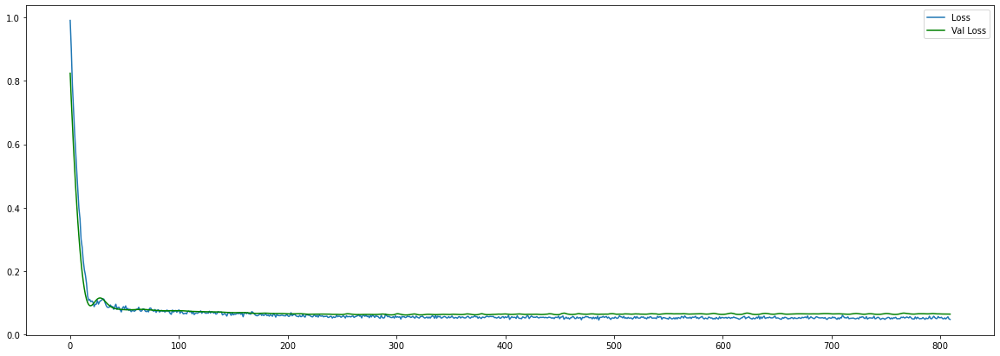

final loss: 0.04723309352993965
final val_loss: 0.06392928212881088


In [ ]:
build_and_train_all_model(MSN_data_processor, MSN_predictor)

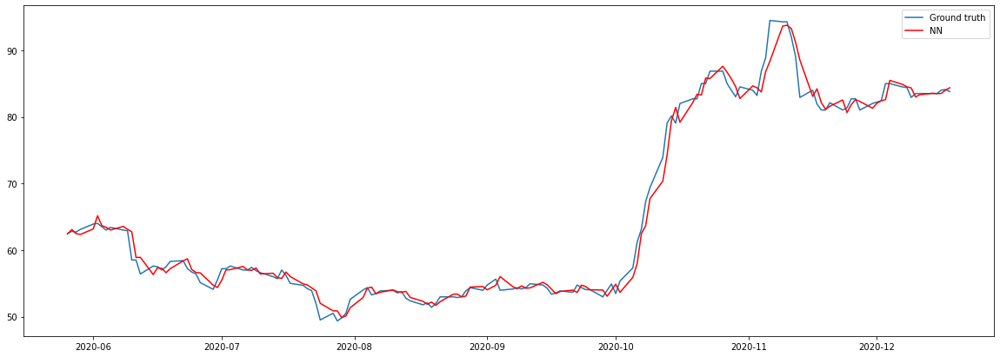

Simple NN
MSE:  1.9821079969406128
MAE:  0.9484445


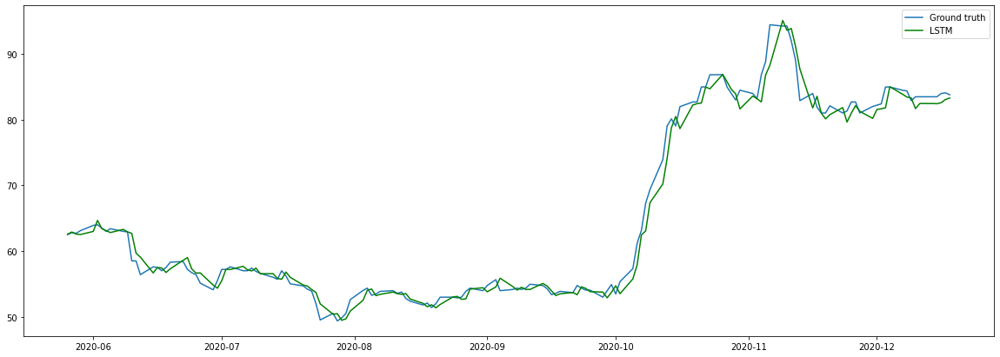

Simple LSTM
MSE:  2.238365650177002
MAE:  1.0274906


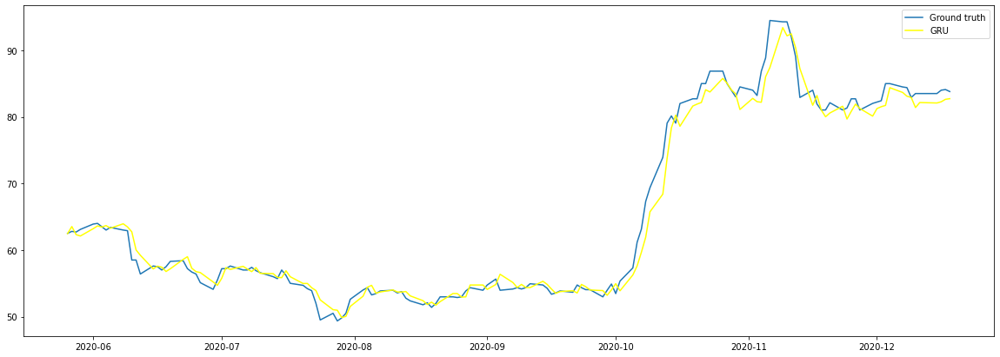

Simple GRU
MSE:  2.907970666885376
MAE:  1.1703992


In [ ]:
evaluate_all_model(MSN_data_processor, MSN_predictor)

### PNJ 

In [ ]:
PNJ_data_processor = DataProcessor('PNJ', PNJ, '1D')
PNJ_predictor = StockPredictor(PNJ_data_processor.stock_name, PNJ_data_processor.timeDelta)

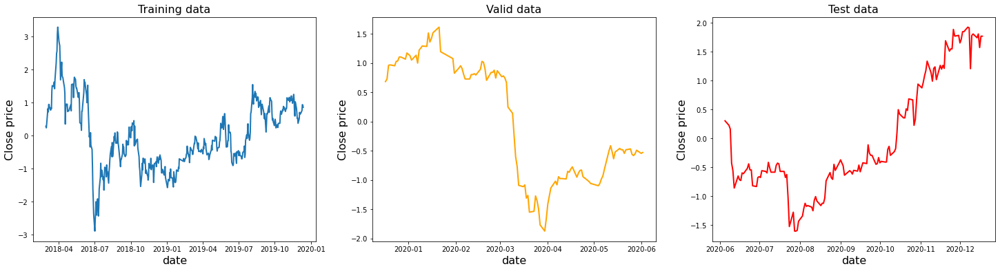

In [ ]:
PNJ_data_processor.visualize_train_val_test_df()

Get best hyperparameter for simple NN


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


INFO:tensorflow:Oracle triggered exit
Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 1, 5)]            0         
_________________________________________________________________
flatten (Flatten)            (None, 5)                 0         
_________________________________________________________________
dense (Dense)                (None, 32)                192       
_________________________________________________________________
dropout (Dropout)            (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 33        
Total params: 225
Trainable params: 225
Non-trainable params: 0
_________________________________________________________________
Start training simple NN
Epoch 1/2500
1/1 [==============================] - ETA: 0s - loss

1/1 [==============================] - ETA: 0s - loss: 0.1467 - mae: 0.292 - 0s 18ms/step - loss: 0.1467 - mae: 0.2927 - val_loss: 0.0313 - val_mae: 0.1367

Epoch 00029: val_loss improved from 0.03160 to 0.03135, saving model to PNJ_1D_NN.hdf5
Epoch 30/2500
1/1 [==============================] - ETA: 0s - loss: 0.1097 - mae: 0.260 - 0s 19ms/step - loss: 0.1097 - mae: 0.2603 - val_loss: 0.0311 - val_mae: 0.1360

Epoch 00030: val_loss improved from 0.03135 to 0.03105, saving model to PNJ_1D_NN.hdf5
Epoch 31/2500
1/1 [==============================] - ETA: 0s - loss: 0.1219 - mae: 0.266 - 0s 18ms/step - loss: 0.1219 - mae: 0.2667 - val_loss: 0.0309 - val_mae: 0.1354

Epoch 00031: val_loss improved from 0.03105 to 0.03085, saving model to PNJ_1D_NN.hdf5
Epoch 32/2500
1/1 [==============================] - ETA: 0s - loss: 0.1296 - mae: 0.270 - 0s 19ms/step - loss: 0.1296 - mae: 0.2709 - val_loss: 0.0307 - val_mae: 0.1349

Epoch 00032: val_loss improved from 0.03085 to 0.03071, saving model 

1/1 [==============================] - ETA: 0s - loss: 0.0964 - mae: 0.234 - 0s 19ms/step - loss: 0.0964 - mae: 0.2340 - val_loss: 0.0260 - val_mae: 0.1212

Epoch 00062: val_loss improved from 0.02623 to 0.02598, saving model to PNJ_1D_NN.hdf5
Epoch 63/2500
1/1 [==============================] - ETA: 0s - loss: 0.1011 - mae: 0.242 - 0s 19ms/step - loss: 0.1011 - mae: 0.2426 - val_loss: 0.0258 - val_mae: 0.1205

Epoch 00063: val_loss improved from 0.02598 to 0.02580, saving model to PNJ_1D_NN.hdf5
Epoch 64/2500
1/1 [==============================] - ETA: 0s - loss: 0.1196 - mae: 0.256 - 0s 18ms/step - loss: 0.1196 - mae: 0.2566 - val_loss: 0.0257 - val_mae: 0.1201

Epoch 00064: val_loss improved from 0.02580 to 0.02569, saving model to PNJ_1D_NN.hdf5
Epoch 65/2500
1/1 [==============================] - ETA: 0s - loss: 0.1030 - mae: 0.245 - 0s 19ms/step - loss: 0.1030 - mae: 0.2453 - val_loss: 0.0255 - val_mae: 0.1195

Epoch 00065: val_loss improved from 0.02569 to 0.02554, saving model 


Epoch 00095: val_loss improved from 0.02336 to 0.02329, saving model to PNJ_1D_NN.hdf5
Epoch 96/2500
1/1 [==============================] - ETA: 0s - loss: 0.0997 - mae: 0.240 - 0s 19ms/step - loss: 0.0997 - mae: 0.2406 - val_loss: 0.0232 - val_mae: 0.1116

Epoch 00096: val_loss improved from 0.02329 to 0.02322, saving model to PNJ_1D_NN.hdf5
Epoch 97/2500
1/1 [==============================] - ETA: 0s - loss: 0.0863 - mae: 0.223 - 0s 19ms/step - loss: 0.0863 - mae: 0.2236 - val_loss: 0.0232 - val_mae: 0.1117

Epoch 00097: val_loss improved from 0.02322 to 0.02322, saving model to PNJ_1D_NN.hdf5
Epoch 98/2500
1/1 [==============================] - ETA: 0s - loss: 0.0947 - mae: 0.227 - 0s 20ms/step - loss: 0.0947 - mae: 0.2279 - val_loss: 0.0232 - val_mae: 0.1119

Epoch 00098: val_loss did not improve from 0.02322
Epoch 99/2500
1/1 [==============================] - ETA: 0s - loss: 0.0905 - mae: 0.220 - 0s 19ms/step - loss: 0.0905 - mae: 0.2208 - val_loss: 0.0233 - val_mae: 0.1122

Epo

Epoch 00129: val_loss improved from 0.02199 to 0.02194, saving model to PNJ_1D_NN.hdf5
Epoch 130/2500
1/1 [==============================] - ETA: 0s - loss: 0.0831 - mae: 0.217 - 0s 19ms/step - loss: 0.0831 - mae: 0.2174 - val_loss: 0.0219 - val_mae: 0.1080

Epoch 00130: val_loss improved from 0.02194 to 0.02191, saving model to PNJ_1D_NN.hdf5
Epoch 131/2500
1/1 [==============================] - ETA: 0s - loss: 0.0868 - mae: 0.222 - 0s 20ms/step - loss: 0.0868 - mae: 0.2224 - val_loss: 0.0219 - val_mae: 0.1080

Epoch 00131: val_loss improved from 0.02191 to 0.02191, saving model to PNJ_1D_NN.hdf5
Epoch 132/2500
1/1 [==============================] - ETA: 0s - loss: 0.0814 - mae: 0.216 - 0s 18ms/step - loss: 0.0814 - mae: 0.2167 - val_loss: 0.0219 - val_mae: 0.1081

Epoch 00132: val_loss did not improve from 0.02191
Epoch 133/2500
1/1 [==============================] - ETA: 0s - loss: 0.0751 - mae: 0.206 - 0s 18ms/step - loss: 0.0751 - mae: 0.2069 - val_loss: 0.0219 - val_mae: 0.1081




Epoch 00164: val_loss did not improve from 0.02153
Epoch 165/2500
1/1 [==============================] - ETA: 0s - loss: 0.0827 - mae: 0.212 - 0s 19ms/step - loss: 0.0827 - mae: 0.2126 - val_loss: 0.0217 - val_mae: 0.1080

Epoch 00165: val_loss did not improve from 0.02153
Epoch 166/2500
1/1 [==============================] - ETA: 0s - loss: 0.0803 - mae: 0.211 - 0s 18ms/step - loss: 0.0803 - mae: 0.2115 - val_loss: 0.0218 - val_mae: 0.1084

Epoch 00166: val_loss did not improve from 0.02153
Epoch 167/2500
1/1 [==============================] - ETA: 0s - loss: 0.0757 - mae: 0.206 - 0s 19ms/step - loss: 0.0757 - mae: 0.2069 - val_loss: 0.0218 - val_mae: 0.1084

Epoch 00167: val_loss did not improve from 0.02153
Epoch 168/2500
1/1 [==============================] - ETA: 0s - loss: 0.0745 - mae: 0.207 - 0s 19ms/step - loss: 0.0745 - mae: 0.2073 - val_loss: 0.0219 - val_mae: 0.1085

Epoch 00168: val_loss did not improve from 0.02153
Epoch 169/2500
1/1 [==============================] - ET

1/1 [==============================] - ETA: 0s - loss: 0.0703 - mae: 0.195 - 0s 20ms/step - loss: 0.0703 - mae: 0.1954 - val_loss: 0.0210 - val_mae: 0.1062

Epoch 00199: val_loss did not improve from 0.02080
Epoch 200/2500
1/1 [==============================] - ETA: 0s - loss: 0.0729 - mae: 0.202 - 0s 20ms/step - loss: 0.0729 - mae: 0.2022 - val_loss: 0.0210 - val_mae: 0.1060

Epoch 00200: val_loss did not improve from 0.02080
Epoch 201/2500
1/1 [==============================] - ETA: 0s - loss: 0.0800 - mae: 0.210 - 0s 18ms/step - loss: 0.0800 - mae: 0.2100 - val_loss: 0.0210 - val_mae: 0.1057

Epoch 00201: val_loss did not improve from 0.02080
Epoch 202/2500
1/1 [==============================] - ETA: 0s - loss: 0.0797 - mae: 0.206 - 0s 18ms/step - loss: 0.0797 - mae: 0.2069 - val_loss: 0.0209 - val_mae: 0.1056

Epoch 00202: val_loss did not improve from 0.02080
Epoch 203/2500
1/1 [==============================] - ETA: 0s - loss: 0.0755 - mae: 0.208 - 0s 19ms/step - loss: 0.0755 - m


Epoch 00234: val_loss did not improve from 0.02047
Epoch 235/2500
1/1 [==============================] - ETA: 0s - loss: 0.0731 - mae: 0.201 - 0s 22ms/step - loss: 0.0731 - mae: 0.2013 - val_loss: 0.0206 - val_mae: 0.1052

Epoch 00235: val_loss did not improve from 0.02047
Epoch 236/2500
1/1 [==============================] - ETA: 0s - loss: 0.0718 - mae: 0.201 - 0s 20ms/step - loss: 0.0718 - mae: 0.2019 - val_loss: 0.0206 - val_mae: 0.1050

Epoch 00236: val_loss did not improve from 0.02047
Epoch 237/2500
1/1 [==============================] - ETA: 0s - loss: 0.0689 - mae: 0.199 - 0s 19ms/step - loss: 0.0689 - mae: 0.1992 - val_loss: 0.0205 - val_mae: 0.1049

Epoch 00237: val_loss did not improve from 0.02047
Epoch 238/2500
1/1 [==============================] - ETA: 0s - loss: 0.0766 - mae: 0.209 - 0s 19ms/step - loss: 0.0766 - mae: 0.2096 - val_loss: 0.0205 - val_mae: 0.1046

Epoch 00238: val_loss did not improve from 0.02047
Epoch 239/2500
1/1 [==============================] - ET

1/1 [==============================] - ETA: 0s - loss: 0.0702 - mae: 0.201 - 0s 21ms/step - loss: 0.0702 - mae: 0.2010 - val_loss: 0.0208 - val_mae: 0.1060

Epoch 00270: val_loss did not improve from 0.02009
Epoch 271/2500
1/1 [==============================] - ETA: 0s - loss: 0.0705 - mae: 0.199 - 0s 20ms/step - loss: 0.0705 - mae: 0.1997 - val_loss: 0.0207 - val_mae: 0.1056

Epoch 00271: val_loss did not improve from 0.02009
Epoch 272/2500
1/1 [==============================] - ETA: 0s - loss: 0.0706 - mae: 0.201 - 0s 18ms/step - loss: 0.0706 - mae: 0.2016 - val_loss: 0.0206 - val_mae: 0.1051

Epoch 00272: val_loss did not improve from 0.02009
Epoch 273/2500
1/1 [==============================] - ETA: 0s - loss: 0.0712 - mae: 0.206 - 0s 19ms/step - loss: 0.0712 - mae: 0.2065 - val_loss: 0.0204 - val_mae: 0.1046

Epoch 00273: val_loss did not improve from 0.02009
Epoch 274/2500
1/1 [==============================] - ETA: 0s - loss: 0.0638 - mae: 0.190 - 0s 19ms/step - loss: 0.0638 - m

Epoch 00306: val_loss did not improve from 0.02009
Epoch 307/2500
1/1 [==============================] - ETA: 0s - loss: 0.0699 - mae: 0.200 - 0s 19ms/step - loss: 0.0699 - mae: 0.2005 - val_loss: 0.0203 - val_mae: 0.1041

Epoch 00307: val_loss did not improve from 0.02009
Epoch 308/2500
1/1 [==============================] - ETA: 0s - loss: 0.0714 - mae: 0.197 - 0s 18ms/step - loss: 0.0714 - mae: 0.1972 - val_loss: 0.0204 - val_mae: 0.1044

Epoch 00308: val_loss did not improve from 0.02009
Epoch 309/2500
1/1 [==============================] - ETA: 0s - loss: 0.0717 - mae: 0.203 - 0s 18ms/step - loss: 0.0717 - mae: 0.2035 - val_loss: 0.0204 - val_mae: 0.1046

Epoch 00309: val_loss did not improve from 0.02009
Epoch 310/2500
1/1 [==============================] - ETA: 0s - loss: 0.0675 - mae: 0.193 - 0s 19ms/step - loss: 0.0675 - mae: 0.1934 - val_loss: 0.0205 - val_mae: 0.1048

Epoch 00310: val_loss did not improve from 0.02009
Epoch 311/2500
1/1 [==============================] - ETA

Epoch 343/2500
1/1 [==============================] - ETA: 0s - loss: 0.0648 - mae: 0.191 - 0s 18ms/step - loss: 0.0648 - mae: 0.1918 - val_loss: 0.0200 - val_mae: 0.1036

Epoch 00343: val_loss improved from 0.02000 to 0.01998, saving model to PNJ_1D_NN.hdf5
Epoch 344/2500
1/1 [==============================] - ETA: 0s - loss: 0.0666 - mae: 0.194 - 0s 18ms/step - loss: 0.0666 - mae: 0.1941 - val_loss: 0.0200 - val_mae: 0.1036

Epoch 00344: val_loss did not improve from 0.01998
Epoch 345/2500
1/1 [==============================] - ETA: 0s - loss: 0.0679 - mae: 0.200 - 0s 18ms/step - loss: 0.0679 - mae: 0.2001 - val_loss: 0.0200 - val_mae: 0.1037

Epoch 00345: val_loss did not improve from 0.01998
Epoch 346/2500
1/1 [==============================] - ETA: 0s - loss: 0.0652 - mae: 0.192 - 0s 19ms/step - loss: 0.0652 - mae: 0.1927 - val_loss: 0.0200 - val_mae: 0.1036

Epoch 00346: val_loss improved from 0.01998 to 0.01996, saving model to PNJ_1D_NN.hdf5
Epoch 347/2500
1/1 [================

1/1 [==============================] - ETA: 0s - loss: 0.0678 - mae: 0.198 - 0s 20ms/step - loss: 0.0678 - mae: 0.1985 - val_loss: 0.0202 - val_mae: 0.1039

Epoch 00378: val_loss did not improve from 0.01968
Epoch 379/2500
1/1 [==============================] - ETA: 0s - loss: 0.0704 - mae: 0.201 - 0s 19ms/step - loss: 0.0704 - mae: 0.2018 - val_loss: 0.0200 - val_mae: 0.1031

Epoch 00379: val_loss did not improve from 0.01968
Epoch 380/2500
1/1 [==============================] - ETA: 0s - loss: 0.0686 - mae: 0.194 - 0s 19ms/step - loss: 0.0686 - mae: 0.1943 - val_loss: 0.0199 - val_mae: 0.1027

Epoch 00380: val_loss did not improve from 0.01968
Epoch 381/2500
1/1 [==============================] - ETA: 0s - loss: 0.0619 - mae: 0.189 - 0s 19ms/step - loss: 0.0619 - mae: 0.1891 - val_loss: 0.0199 - val_mae: 0.1027

Epoch 00381: val_loss did not improve from 0.01968
Epoch 382/2500
1/1 [==============================] - ETA: 0s - loss: 0.0658 - mae: 0.195 - 0s 19ms/step - loss: 0.0658 - m

Epoch 00413: val_loss improved from 0.01957 to 0.01953, saving model to PNJ_1D_NN.hdf5
Epoch 414/2500
1/1 [==============================] - ETA: 0s - loss: 0.0621 - mae: 0.187 - 0s 22ms/step - loss: 0.0621 - mae: 0.1878 - val_loss: 0.0195 - val_mae: 0.1019

Epoch 00414: val_loss improved from 0.01953 to 0.01951, saving model to PNJ_1D_NN.hdf5
Epoch 415/2500
1/1 [==============================] - ETA: 0s - loss: 0.0715 - mae: 0.198 - 0s 20ms/step - loss: 0.0715 - mae: 0.1988 - val_loss: 0.0195 - val_mae: 0.1019

Epoch 00415: val_loss did not improve from 0.01951
Epoch 416/2500
1/1 [==============================] - ETA: 0s - loss: 0.0682 - mae: 0.198 - 0s 19ms/step - loss: 0.0682 - mae: 0.1981 - val_loss: 0.0196 - val_mae: 0.1020

Epoch 00416: val_loss did not improve from 0.01951
Epoch 417/2500
1/1 [==============================] - ETA: 0s - loss: 0.0638 - mae: 0.189 - 0s 19ms/step - loss: 0.0638 - mae: 0.1899 - val_loss: 0.0196 - val_mae: 0.1021

Epoch 00417: val_loss did not improv

1/1 [==============================] - ETA: 0s - loss: 0.0660 - mae: 0.190 - 0s 19ms/step - loss: 0.0660 - mae: 0.1904 - val_loss: 0.0198 - val_mae: 0.1027

Epoch 00450: val_loss did not improve from 0.01951
Epoch 451/2500
1/1 [==============================] - ETA: 0s - loss: 0.0696 - mae: 0.195 - 0s 19ms/step - loss: 0.0696 - mae: 0.1954 - val_loss: 0.0196 - val_mae: 0.1023

Epoch 00451: val_loss did not improve from 0.01951
Epoch 452/2500
1/1 [==============================] - ETA: 0s - loss: 0.0658 - mae: 0.193 - 0s 18ms/step - loss: 0.0658 - mae: 0.1934 - val_loss: 0.0196 - val_mae: 0.1020

Epoch 00452: val_loss did not improve from 0.01951
Epoch 453/2500
1/1 [==============================] - ETA: 0s - loss: 0.0618 - mae: 0.188 - 0s 20ms/step - loss: 0.0618 - mae: 0.1884 - val_loss: 0.0196 - val_mae: 0.1021

Epoch 00453: val_loss did not improve from 0.01951
Epoch 454/2500
1/1 [==============================] - ETA: 0s - loss: 0.0629 - mae: 0.191 - 0s 17ms/step - loss: 0.0629 - m

Epoch 00486: val_loss did not improve from 0.01951
Epoch 487/2500
1/1 [==============================] - ETA: 0s - loss: 0.0692 - mae: 0.196 - 0s 20ms/step - loss: 0.0692 - mae: 0.1962 - val_loss: 0.0195 - val_mae: 0.1020

Epoch 00487: val_loss did not improve from 0.01951
Epoch 488/2500
1/1 [==============================] - ETA: 0s - loss: 0.0642 - mae: 0.194 - 0s 19ms/step - loss: 0.0642 - mae: 0.1940 - val_loss: 0.0196 - val_mae: 0.1020

Epoch 00488: val_loss did not improve from 0.01951
Epoch 489/2500
1/1 [==============================] - ETA: 0s - loss: 0.0588 - mae: 0.187 - 0s 19ms/step - loss: 0.0588 - mae: 0.1876 - val_loss: 0.0196 - val_mae: 0.1020

Epoch 00489: val_loss did not improve from 0.01951
Epoch 490/2500
1/1 [==============================] - ETA: 0s - loss: 0.0672 - mae: 0.195 - 0s 18ms/step - loss: 0.0672 - mae: 0.1955 - val_loss: 0.0195 - val_mae: 0.1019

Epoch 00490: val_loss did not improve from 0.01951
Epoch 491/2500
1/1 [==============================] - ETA

1/1 [==============================] - ETA: 0s - loss: 0.0614 - mae: 0.184 - 0s 20ms/step - loss: 0.0614 - mae: 0.1849 - val_loss: 0.0197 - val_mae: 0.1024

Epoch 00523: val_loss did not improve from 0.01951
Epoch 524/2500
1/1 [==============================] - ETA: 0s - loss: 0.0649 - mae: 0.191 - 0s 18ms/step - loss: 0.0649 - mae: 0.1918 - val_loss: 0.0197 - val_mae: 0.1024

Epoch 00524: val_loss did not improve from 0.01951
Epoch 525/2500
1/1 [==============================] - ETA: 0s - loss: 0.0666 - mae: 0.195 - 0s 19ms/step - loss: 0.0666 - mae: 0.1951 - val_loss: 0.0197 - val_mae: 0.1024

Epoch 00525: val_loss did not improve from 0.01951
Epoch 526/2500
1/1 [==============================] - ETA: 0s - loss: 0.0675 - mae: 0.196 - 0s 18ms/step - loss: 0.0675 - mae: 0.1962 - val_loss: 0.0196 - val_mae: 0.1022

Epoch 00526: val_loss did not improve from 0.01951
Epoch 527/2500
1/1 [==============================] - ETA: 0s - loss: 0.0709 - mae: 0.197 - 0s 19ms/step - loss: 0.0709 - m


Epoch 00558: val_loss did not improve from 0.01936
Epoch 559/2500
1/1 [==============================] - ETA: 0s - loss: 0.0662 - mae: 0.195 - 0s 19ms/step - loss: 0.0662 - mae: 0.1956 - val_loss: 0.0196 - val_mae: 0.1024

Epoch 00559: val_loss did not improve from 0.01936
Epoch 560/2500
1/1 [==============================] - ETA: 0s - loss: 0.0665 - mae: 0.193 - 0s 19ms/step - loss: 0.0665 - mae: 0.1934 - val_loss: 0.0197 - val_mae: 0.1025

Epoch 00560: val_loss did not improve from 0.01936
Epoch 561/2500
1/1 [==============================] - ETA: 0s - loss: 0.0619 - mae: 0.186 - 0s 18ms/step - loss: 0.0619 - mae: 0.1864 - val_loss: 0.0198 - val_mae: 0.1027

Epoch 00561: val_loss did not improve from 0.01936
Epoch 562/2500
1/1 [==============================] - ETA: 0s - loss: 0.0676 - mae: 0.194 - 0s 20ms/step - loss: 0.0676 - mae: 0.1943 - val_loss: 0.0198 - val_mae: 0.1027

Epoch 00562: val_loss did not improve from 0.01936
Epoch 563/2500
1/1 [==============================] - ET


Epoch 00595: val_loss did not improve from 0.01936
Epoch 596/2500
1/1 [==============================] - ETA: 0s - loss: 0.0659 - mae: 0.196 - 0s 18ms/step - loss: 0.0659 - mae: 0.1960 - val_loss: 0.0194 - val_mae: 0.1021

Epoch 00596: val_loss did not improve from 0.01936
Epoch 597/2500
1/1 [==============================] - ETA: 0s - loss: 0.0629 - mae: 0.190 - 0s 18ms/step - loss: 0.0629 - mae: 0.1909 - val_loss: 0.0194 - val_mae: 0.1021

Epoch 00597: val_loss did not improve from 0.01936
Epoch 598/2500
1/1 [==============================] - ETA: 0s - loss: 0.0646 - mae: 0.196 - 0s 20ms/step - loss: 0.0646 - mae: 0.1962 - val_loss: 0.0194 - val_mae: 0.1021

Epoch 00598: val_loss improved from 0.01936 to 0.01936, saving model to PNJ_1D_NN.hdf5
Epoch 599/2500
1/1 [==============================] - ETA: 0s - loss: 0.0620 - mae: 0.188 - 0s 18ms/step - loss: 0.0620 - mae: 0.1883 - val_loss: 0.0193 - val_mae: 0.1021

Epoch 00599: val_loss improved from 0.01936 to 0.01933, saving model to

Epoch 00631: val_loss did not improve from 0.01930
Epoch 632/2500
1/1 [==============================] - ETA: 0s - loss: 0.0627 - mae: 0.190 - 0s 20ms/step - loss: 0.0627 - mae: 0.1907 - val_loss: 0.0196 - val_mae: 0.1025

Epoch 00632: val_loss did not improve from 0.01930
Epoch 633/2500
1/1 [==============================] - ETA: 0s - loss: 0.0602 - mae: 0.186 - 0s 18ms/step - loss: 0.0602 - mae: 0.1865 - val_loss: 0.0196 - val_mae: 0.1024

Epoch 00633: val_loss did not improve from 0.01930
Epoch 634/2500
1/1 [==============================] - ETA: 0s - loss: 0.0611 - mae: 0.188 - 0s 19ms/step - loss: 0.0611 - mae: 0.1887 - val_loss: 0.0196 - val_mae: 0.1025

Epoch 00634: val_loss did not improve from 0.01930
Epoch 635/2500
1/1 [==============================] - ETA: 0s - loss: 0.0615 - mae: 0.186 - 0s 18ms/step - loss: 0.0615 - mae: 0.1860 - val_loss: 0.0196 - val_mae: 0.1025

Epoch 00635: val_loss did not improve from 0.01930
Epoch 636/2500
1/1 [==============================] - ETA


Epoch 00668: val_loss did not improve from 0.01930
Epoch 669/2500
1/1 [==============================] - ETA: 0s - loss: 0.0593 - mae: 0.183 - 0s 19ms/step - loss: 0.0593 - mae: 0.1830 - val_loss: 0.0197 - val_mae: 0.1030

Epoch 00669: val_loss did not improve from 0.01930
Epoch 670/2500
1/1 [==============================] - ETA: 0s - loss: 0.0630 - mae: 0.190 - 0s 18ms/step - loss: 0.0630 - mae: 0.1902 - val_loss: 0.0197 - val_mae: 0.1029

Epoch 00670: val_loss did not improve from 0.01930
Epoch 671/2500
1/1 [==============================] - ETA: 0s - loss: 0.0651 - mae: 0.187 - 0s 18ms/step - loss: 0.0651 - mae: 0.1879 - val_loss: 0.0196 - val_mae: 0.1026

Epoch 00671: val_loss did not improve from 0.01930
Epoch 672/2500
1/1 [==============================] - ETA: 0s - loss: 0.0606 - mae: 0.183 - 0s 18ms/step - loss: 0.0606 - mae: 0.1832 - val_loss: 0.0195 - val_mae: 0.1024

Epoch 00672: val_loss did not improve from 0.01930
Epoch 673/2500
1/1 [==============================] - ET


Epoch 00705: val_loss did not improve from 0.01930
Epoch 706/2500
1/1 [==============================] - ETA: 0s - loss: 0.0628 - mae: 0.192 - 0s 18ms/step - loss: 0.0628 - mae: 0.1929 - val_loss: 0.0193 - val_mae: 0.1024

Epoch 00706: val_loss did not improve from 0.01930
Epoch 707/2500
1/1 [==============================] - ETA: 0s - loss: 0.0636 - mae: 0.189 - 0s 18ms/step - loss: 0.0636 - mae: 0.1891 - val_loss: 0.0193 - val_mae: 0.1024

Epoch 00707: val_loss did not improve from 0.01930
Epoch 708/2500
1/1 [==============================] - ETA: 0s - loss: 0.0610 - mae: 0.187 - 0s 19ms/step - loss: 0.0610 - mae: 0.1870 - val_loss: 0.0194 - val_mae: 0.1025

Epoch 00708: val_loss did not improve from 0.01930
Epoch 709/2500
1/1 [==============================] - ETA: 0s - loss: 0.0612 - mae: 0.187 - 0s 17ms/step - loss: 0.0612 - mae: 0.1872 - val_loss: 0.0195 - val_mae: 0.1026

Epoch 00709: val_loss did not improve from 0.01930
Epoch 710/2500
1/1 [==============================] - ET


Epoch 00742: val_loss did not improve from 0.01930
Epoch 743/2500
1/1 [==============================] - ETA: 0s - loss: 0.0637 - mae: 0.191 - 0s 20ms/step - loss: 0.0637 - mae: 0.1911 - val_loss: 0.0195 - val_mae: 0.1025

Epoch 00743: val_loss did not improve from 0.01930
Epoch 744/2500
1/1 [==============================] - ETA: 0s - loss: 0.0623 - mae: 0.187 - 0s 19ms/step - loss: 0.0623 - mae: 0.1873 - val_loss: 0.0195 - val_mae: 0.1024

Epoch 00744: val_loss did not improve from 0.01930
Epoch 745/2500
1/1 [==============================] - ETA: 0s - loss: 0.0654 - mae: 0.194 - 0s 19ms/step - loss: 0.0654 - mae: 0.1944 - val_loss: 0.0194 - val_mae: 0.1024

Epoch 00745: val_loss did not improve from 0.01930
Epoch 746/2500
1/1 [==============================] - ETA: 0s - loss: 0.0623 - mae: 0.189 - 0s 17ms/step - loss: 0.0623 - mae: 0.1898 - val_loss: 0.0194 - val_mae: 0.1024

Epoch 00746: val_loss did not improve from 0.01930
Epoch 747/2500
1/1 [==============================] - ET


Epoch 00779: val_loss did not improve from 0.01930
Epoch 780/2500
1/1 [==============================] - ETA: 0s - loss: 0.0609 - mae: 0.184 - 0s 20ms/step - loss: 0.0609 - mae: 0.1848 - val_loss: 0.0200 - val_mae: 0.1040

Epoch 00780: val_loss did not improve from 0.01930
Epoch 781/2500
1/1 [==============================] - ETA: 0s - loss: 0.0652 - mae: 0.197 - 0s 19ms/step - loss: 0.0652 - mae: 0.1971 - val_loss: 0.0200 - val_mae: 0.1039

Epoch 00781: val_loss did not improve from 0.01930
Epoch 782/2500
1/1 [==============================] - ETA: 0s - loss: 0.0649 - mae: 0.191 - 0s 19ms/step - loss: 0.0649 - mae: 0.1918 - val_loss: 0.0199 - val_mae: 0.1035

Epoch 00782: val_loss did not improve from 0.01930
Epoch 783/2500
1/1 [==============================] - ETA: 0s - loss: 0.0646 - mae: 0.192 - 0s 19ms/step - loss: 0.0646 - mae: 0.1927 - val_loss: 0.0197 - val_mae: 0.1030

Epoch 00783: val_loss did not improve from 0.01930
Epoch 784/2500
1/1 [==============================] - ET


Epoch 00816: val_loss did not improve from 0.01930
Epoch 817/2500
1/1 [==============================] - ETA: 0s - loss: 0.0607 - mae: 0.185 - 0s 23ms/step - loss: 0.0607 - mae: 0.1852 - val_loss: 0.0196 - val_mae: 0.1026

Epoch 00817: val_loss did not improve from 0.01930
Epoch 818/2500
1/1 [==============================] - ETA: 0s - loss: 0.0606 - mae: 0.187 - 0s 20ms/step - loss: 0.0606 - mae: 0.1875 - val_loss: 0.0195 - val_mae: 0.1025

Epoch 00818: val_loss did not improve from 0.01930
Epoch 819/2500
1/1 [==============================] - ETA: 0s - loss: 0.0664 - mae: 0.192 - 0s 19ms/step - loss: 0.0664 - mae: 0.1927 - val_loss: 0.0195 - val_mae: 0.1025

Epoch 00819: val_loss did not improve from 0.01930
Epoch 820/2500
1/1 [==============================] - ETA: 0s - loss: 0.0654 - mae: 0.190 - 0s 19ms/step - loss: 0.0654 - mae: 0.1909 - val_loss: 0.0195 - val_mae: 0.1024

Epoch 00820: val_loss did not improve from 0.01930
Epoch 821/2500
1/1 [==============================] - ET


Epoch 00852: val_loss did not improve from 0.01928
Epoch 853/2500
1/1 [==============================] - ETA: 0s - loss: 0.0657 - mae: 0.192 - 0s 19ms/step - loss: 0.0657 - mae: 0.1928 - val_loss: 0.0193 - val_mae: 0.1024

Epoch 00853: val_loss did not improve from 0.01928
Epoch 854/2500
1/1 [==============================] - ETA: 0s - loss: 0.0677 - mae: 0.194 - 0s 20ms/step - loss: 0.0677 - mae: 0.1949 - val_loss: 0.0193 - val_mae: 0.1024

Epoch 00854: val_loss did not improve from 0.01928
Epoch 855/2500
1/1 [==============================] - ETA: 0s - loss: 0.0655 - mae: 0.192 - 0s 19ms/step - loss: 0.0655 - mae: 0.1921 - val_loss: 0.0194 - val_mae: 0.1025

Epoch 00855: val_loss did not improve from 0.01928
Epoch 856/2500
1/1 [==============================] - ETA: 0s - loss: 0.0612 - mae: 0.185 - 0s 19ms/step - loss: 0.0612 - mae: 0.1850 - val_loss: 0.0194 - val_mae: 0.1026

Epoch 00856: val_loss did not improve from 0.01928
Epoch 857/2500
1/1 [==============================] - ET


Epoch 00889: val_loss did not improve from 0.01928
Epoch 890/2500
1/1 [==============================] - ETA: 0s - loss: 0.0570 - mae: 0.177 - 0s 19ms/step - loss: 0.0570 - mae: 0.1771 - val_loss: 0.0195 - val_mae: 0.1027

Epoch 00890: val_loss did not improve from 0.01928
Epoch 891/2500
1/1 [==============================] - ETA: 0s - loss: 0.0612 - mae: 0.184 - 0s 19ms/step - loss: 0.0612 - mae: 0.1849 - val_loss: 0.0195 - val_mae: 0.1027

Epoch 00891: val_loss did not improve from 0.01928
Epoch 892/2500
1/1 [==============================] - ETA: 0s - loss: 0.0593 - mae: 0.183 - 0s 18ms/step - loss: 0.0593 - mae: 0.1835 - val_loss: 0.0195 - val_mae: 0.1027

Epoch 00892: val_loss did not improve from 0.01928
Epoch 893/2500
1/1 [==============================] - ETA: 0s - loss: 0.0599 - mae: 0.182 - 0s 18ms/step - loss: 0.0599 - mae: 0.1828 - val_loss: 0.0195 - val_mae: 0.1027

Epoch 00893: val_loss did not improve from 0.01928
Epoch 894/2500
1/1 [==============================] - ET


Epoch 00926: val_loss did not improve from 0.01928
Epoch 927/2500
1/1 [==============================] - ETA: 0s - loss: 0.0632 - mae: 0.189 - 0s 19ms/step - loss: 0.0632 - mae: 0.1898 - val_loss: 0.0195 - val_mae: 0.1026

Epoch 00927: val_loss did not improve from 0.01928
Epoch 928/2500
1/1 [==============================] - ETA: 0s - loss: 0.0609 - mae: 0.185 - 0s 19ms/step - loss: 0.0609 - mae: 0.1858 - val_loss: 0.0195 - val_mae: 0.1026

Epoch 00928: val_loss did not improve from 0.01928
Epoch 929/2500
1/1 [==============================] - ETA: 0s - loss: 0.0652 - mae: 0.193 - 0s 18ms/step - loss: 0.0652 - mae: 0.1939 - val_loss: 0.0195 - val_mae: 0.1026

Epoch 00929: val_loss did not improve from 0.01928
Epoch 930/2500
1/1 [==============================] - ETA: 0s - loss: 0.0634 - mae: 0.188 - 0s 18ms/step - loss: 0.0634 - mae: 0.1889 - val_loss: 0.0195 - val_mae: 0.1026

Epoch 00930: val_loss did not improve from 0.01928
Epoch 931/2500
1/1 [==============================] - ET


Epoch 00963: val_loss did not improve from 0.01928
Epoch 964/2500
1/1 [==============================] - ETA: 0s - loss: 0.0621 - mae: 0.186 - 0s 19ms/step - loss: 0.0621 - mae: 0.1868 - val_loss: 0.0196 - val_mae: 0.1028

Epoch 00964: val_loss did not improve from 0.01928
Epoch 965/2500
1/1 [==============================] - ETA: 0s - loss: 0.0624 - mae: 0.186 - 0s 19ms/step - loss: 0.0624 - mae: 0.1865 - val_loss: 0.0196 - val_mae: 0.1028

Epoch 00965: val_loss did not improve from 0.01928
Epoch 966/2500
1/1 [==============================] - ETA: 0s - loss: 0.0671 - mae: 0.195 - 0s 19ms/step - loss: 0.0671 - mae: 0.1955 - val_loss: 0.0196 - val_mae: 0.1027

Epoch 00966: val_loss did not improve from 0.01928
Epoch 967/2500
1/1 [==============================] - ETA: 0s - loss: 0.0586 - mae: 0.183 - 0s 18ms/step - loss: 0.0586 - mae: 0.1830 - val_loss: 0.0195 - val_mae: 0.1027

Epoch 00967: val_loss did not improve from 0.01928
Epoch 968/2500
1/1 [==============================] - ET


Epoch 01000: val_loss did not improve from 0.01928
Epoch 1001/2500
1/1 [==============================] - ETA: 0s - loss: 0.0603 - mae: 0.186 - 0s 18ms/step - loss: 0.0603 - mae: 0.1865 - val_loss: 0.0196 - val_mae: 0.1028

Epoch 01001: val_loss did not improve from 0.01928
Epoch 1002/2500
1/1 [==============================] - ETA: 0s - loss: 0.0624 - mae: 0.189 - 0s 18ms/step - loss: 0.0624 - mae: 0.1899 - val_loss: 0.0196 - val_mae: 0.1028

Epoch 01002: val_loss did not improve from 0.01928
Epoch 1003/2500
1/1 [==============================] - ETA: 0s - loss: 0.0571 - mae: 0.182 - 0s 20ms/step - loss: 0.0571 - mae: 0.1822 - val_loss: 0.0196 - val_mae: 0.1027

Epoch 01003: val_loss did not improve from 0.01928
Epoch 1004/2500
1/1 [==============================] - ETA: 0s - loss: 0.0593 - mae: 0.183 - 0s 19ms/step - loss: 0.0593 - mae: 0.1839 - val_loss: 0.0196 - val_mae: 0.1028

Epoch 01004: val_loss did not improve from 0.01928
Epoch 1005/2500
1/1 [==============================]

1/1 [==============================] - ETA: 0s - loss: 0.0624 - mae: 0.189 - 0s 18ms/step - loss: 0.0624 - mae: 0.1895 - val_loss: 0.0196 - val_mae: 0.1030

Epoch 01037: val_loss did not improve from 0.01928
Epoch 1038/2500
1/1 [==============================] - ETA: 0s - loss: 0.0613 - mae: 0.189 - 0s 19ms/step - loss: 0.0613 - mae: 0.1896 - val_loss: 0.0196 - val_mae: 0.1029

Epoch 01038: val_loss did not improve from 0.01928
Epoch 1039/2500
1/1 [==============================] - ETA: 0s - loss: 0.0642 - mae: 0.191 - 0s 19ms/step - loss: 0.0642 - mae: 0.1917 - val_loss: 0.0196 - val_mae: 0.1029

Epoch 01039: val_loss did not improve from 0.01928
Epoch 1040/2500
1/1 [==============================] - ETA: 0s - loss: 0.0672 - mae: 0.197 - 0s 21ms/step - loss: 0.0672 - mae: 0.1974 - val_loss: 0.0196 - val_mae: 0.1029

Epoch 01040: val_loss did not improve from 0.01928
Epoch 1041/2500
1/1 [==============================] - ETA: 0s - loss: 0.0595 - mae: 0.183 - 0s 19ms/step - loss: 0.0595


Epoch 01073: val_loss did not improve from 0.01928
Epoch 1074/2500
1/1 [==============================] - ETA: 0s - loss: 0.0568 - mae: 0.181 - 0s 20ms/step - loss: 0.0568 - mae: 0.1810 - val_loss: 0.0195 - val_mae: 0.1028

Epoch 01074: val_loss did not improve from 0.01928
Epoch 1075/2500
1/1 [==============================] - ETA: 0s - loss: 0.0629 - mae: 0.190 - 0s 19ms/step - loss: 0.0629 - mae: 0.1900 - val_loss: 0.0196 - val_mae: 0.1028

Epoch 01075: val_loss did not improve from 0.01928
Epoch 1076/2500
1/1 [==============================] - ETA: 0s - loss: 0.0610 - mae: 0.185 - 0s 19ms/step - loss: 0.0610 - mae: 0.1850 - val_loss: 0.0196 - val_mae: 0.1028

Epoch 01076: val_loss did not improve from 0.01928
Epoch 1077/2500
1/1 [==============================] - ETA: 0s - loss: 0.0587 - mae: 0.184 - 0s 19ms/step - loss: 0.0587 - mae: 0.1845 - val_loss: 0.0196 - val_mae: 0.1029

Epoch 01077: val_loss did not improve from 0.01928
Epoch 1078/2500
1/1 [==============================]

Epoch 01109: val_loss did not improve from 0.01928
Epoch 1110/2500
1/1 [==============================] - ETA: 0s - loss: 0.0648 - mae: 0.194 - 0s 19ms/step - loss: 0.0648 - mae: 0.1947 - val_loss: 0.0195 - val_mae: 0.1027

Epoch 01110: val_loss did not improve from 0.01928
Epoch 1111/2500
1/1 [==============================] - ETA: 0s - loss: 0.0638 - mae: 0.190 - 0s 19ms/step - loss: 0.0638 - mae: 0.1907 - val_loss: 0.0195 - val_mae: 0.1027

Epoch 01111: val_loss did not improve from 0.01928
Epoch 1112/2500
1/1 [==============================] - ETA: 0s - loss: 0.0594 - mae: 0.182 - 0s 19ms/step - loss: 0.0594 - mae: 0.1823 - val_loss: 0.0195 - val_mae: 0.1027

Epoch 01112: val_loss did not improve from 0.01928
Epoch 1113/2500
1/1 [==============================] - ETA: 0s - loss: 0.0633 - mae: 0.188 - 0s 19ms/step - loss: 0.0633 - mae: 0.1880 - val_loss: 0.0195 - val_mae: 0.1027

Epoch 01113: val_loss did not improve from 0.01928
Epoch 1114/2500
1/1 [==============================] 

1/1 [==============================] - ETA: 0s - loss: 0.0629 - mae: 0.189 - 0s 19ms/step - loss: 0.0629 - mae: 0.1890 - val_loss: 0.0195 - val_mae: 0.1027

Epoch 01146: val_loss did not improve from 0.01928
Epoch 1147/2500
1/1 [==============================] - ETA: 0s - loss: 0.0587 - mae: 0.183 - 0s 18ms/step - loss: 0.0587 - mae: 0.1838 - val_loss: 0.0195 - val_mae: 0.1027

Epoch 01147: val_loss did not improve from 0.01928
Epoch 1148/2500
1/1 [==============================] - ETA: 0s - loss: 0.0551 - mae: 0.179 - 0s 18ms/step - loss: 0.0551 - mae: 0.1798 - val_loss: 0.0195 - val_mae: 0.1027

Epoch 01148: val_loss did not improve from 0.01928
Epoch 1149/2500
1/1 [==============================] - ETA: 0s - loss: 0.0631 - mae: 0.188 - 0s 18ms/step - loss: 0.0631 - mae: 0.1888 - val_loss: 0.0195 - val_mae: 0.1027

Epoch 01149: val_loss did not improve from 0.01928
Epoch 1150/2500
1/1 [==============================] - ETA: 0s - loss: 0.0643 - mae: 0.190 - 0s 18ms/step - loss: 0.0643


Epoch 01182: val_loss did not improve from 0.01928
Epoch 1183/2500
1/1 [==============================] - ETA: 0s - loss: 0.0610 - mae: 0.186 - 0s 21ms/step - loss: 0.0610 - mae: 0.1862 - val_loss: 0.0196 - val_mae: 0.1028

Epoch 01183: val_loss did not improve from 0.01928
Epoch 1184/2500
1/1 [==============================] - ETA: 0s - loss: 0.0688 - mae: 0.194 - 0s 32ms/step - loss: 0.0688 - mae: 0.1941 - val_loss: 0.0196 - val_mae: 0.1028

Epoch 01184: val_loss did not improve from 0.01928
Epoch 1185/2500
1/1 [==============================] - ETA: 0s - loss: 0.0636 - mae: 0.189 - 0s 22ms/step - loss: 0.0636 - mae: 0.1897 - val_loss: 0.0196 - val_mae: 0.1028

Epoch 01185: val_loss did not improve from 0.01928
Epoch 1186/2500
1/1 [==============================] - ETA: 0s - loss: 0.0626 - mae: 0.189 - 0s 20ms/step - loss: 0.0626 - mae: 0.1897 - val_loss: 0.0196 - val_mae: 0.1029

Epoch 01186: val_loss did not improve from 0.01928
Epoch 1187/2500
1/1 [==============================]

1/1 [==============================] - ETA: 0s - loss: 0.0617 - mae: 0.185 - 0s 19ms/step - loss: 0.0617 - mae: 0.1853 - val_loss: 0.0195 - val_mae: 0.1028

Epoch 01219: val_loss did not improve from 0.01928
Epoch 1220/2500
1/1 [==============================] - ETA: 0s - loss: 0.0615 - mae: 0.187 - 0s 19ms/step - loss: 0.0615 - mae: 0.1873 - val_loss: 0.0195 - val_mae: 0.1028

Epoch 01220: val_loss did not improve from 0.01928
Epoch 1221/2500
1/1 [==============================] - ETA: 0s - loss: 0.0595 - mae: 0.184 - 0s 20ms/step - loss: 0.0595 - mae: 0.1847 - val_loss: 0.0195 - val_mae: 0.1028

Epoch 01221: val_loss did not improve from 0.01928
Epoch 1222/2500
1/1 [==============================] - ETA: 0s - loss: 0.0662 - mae: 0.191 - 0s 18ms/step - loss: 0.0662 - mae: 0.1915 - val_loss: 0.0196 - val_mae: 0.1028

Epoch 01222: val_loss did not improve from 0.01928
Epoch 1223/2500
1/1 [==============================] - ETA: 0s - loss: 0.0577 - mae: 0.181 - 0s 19ms/step - loss: 0.0577


Epoch 01255: val_loss did not improve from 0.01928
Epoch 1256/2500
1/1 [==============================] - ETA: 0s - loss: 0.0627 - mae: 0.189 - 0s 21ms/step - loss: 0.0627 - mae: 0.1898 - val_loss: 0.0194 - val_mae: 0.1027

Epoch 01256: val_loss did not improve from 0.01928
Epoch 1257/2500
1/1 [==============================] - ETA: 0s - loss: 0.0646 - mae: 0.187 - 0s 19ms/step - loss: 0.0646 - mae: 0.1873 - val_loss: 0.0194 - val_mae: 0.1027

Epoch 01257: val_loss did not improve from 0.01928
Epoch 1258/2500
1/1 [==============================] - ETA: 0s - loss: 0.0634 - mae: 0.188 - 0s 19ms/step - loss: 0.0634 - mae: 0.1887 - val_loss: 0.0194 - val_mae: 0.1027

Epoch 01258: val_loss did not improve from 0.01928
Epoch 1259/2500
1/1 [==============================] - ETA: 0s - loss: 0.0624 - mae: 0.188 - 0s 19ms/step - loss: 0.0624 - mae: 0.1889 - val_loss: 0.0194 - val_mae: 0.1027

Epoch 01259: val_loss did not improve from 0.01928
Epoch 1260/2500
1/1 [==============================]

1/1 [==============================] - ETA: 0s - loss: 0.0641 - mae: 0.188 - 0s 19ms/step - loss: 0.0641 - mae: 0.1880 - val_loss: 0.0196 - val_mae: 0.1029

Epoch 01292: val_loss did not improve from 0.01928
Epoch 1293/2500
1/1 [==============================] - ETA: 0s - loss: 0.0574 - mae: 0.182 - 0s 19ms/step - loss: 0.0574 - mae: 0.1823 - val_loss: 0.0196 - val_mae: 0.1029

Epoch 01293: val_loss did not improve from 0.01928
Epoch 1294/2500
1/1 [==============================] - ETA: 0s - loss: 0.0630 - mae: 0.193 - 0s 19ms/step - loss: 0.0630 - mae: 0.1935 - val_loss: 0.0195 - val_mae: 0.1029

Epoch 01294: val_loss did not improve from 0.01928
Epoch 1295/2500
1/1 [==============================] - ETA: 0s - loss: 0.0598 - mae: 0.183 - 0s 19ms/step - loss: 0.0598 - mae: 0.1835 - val_loss: 0.0195 - val_mae: 0.1028

Epoch 01295: val_loss did not improve from 0.01928
Epoch 1296/2500
1/1 [==============================] - ETA: 0s - loss: 0.0572 - mae: 0.181 - 0s 18ms/step - loss: 0.0572


Epoch 01328: val_loss did not improve from 0.01928
Epoch 1329/2500
1/1 [==============================] - ETA: 0s - loss: 0.0660 - mae: 0.190 - 0s 20ms/step - loss: 0.0660 - mae: 0.1908 - val_loss: 0.0195 - val_mae: 0.1028

Epoch 01329: val_loss did not improve from 0.01928
Epoch 1330/2500
1/1 [==============================] - ETA: 0s - loss: 0.0662 - mae: 0.190 - 0s 19ms/step - loss: 0.0662 - mae: 0.1900 - val_loss: 0.0195 - val_mae: 0.1028

Epoch 01330: val_loss did not improve from 0.01928
Epoch 1331/2500
1/1 [==============================] - ETA: 0s - loss: 0.0604 - mae: 0.186 - 0s 19ms/step - loss: 0.0604 - mae: 0.1868 - val_loss: 0.0195 - val_mae: 0.1028

Epoch 01331: val_loss did not improve from 0.01928
Epoch 1332/2500
1/1 [==============================] - ETA: 0s - loss: 0.0618 - mae: 0.188 - 0s 19ms/step - loss: 0.0618 - mae: 0.1880 - val_loss: 0.0195 - val_mae: 0.1028

Epoch 01332: val_loss did not improve from 0.01928
Epoch 1333/2500
1/1 [==============================]

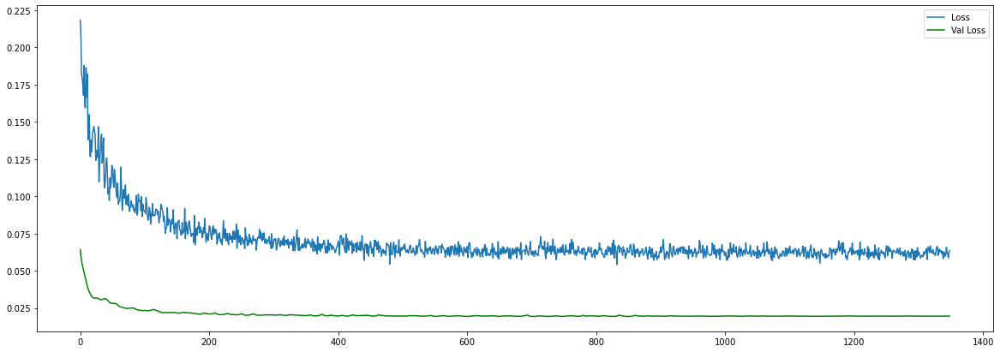

final loss: 0.06340140104293823
final val_loss: 0.01951664872467518
Get best hyperparameter for simple LSTM


INFO:tensorflow:Oracle triggered exit
Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 1, 5)]            0         
_________________________________________________________________
lstm (LSTM)                  (None, 1, 128)            68608     
_________________________________________________________________
lstm_1 (LSTM)                (None, 1, 128)            131584    
_________________________________________________________________
lstm_2 (LSTM)                (None, 128)               131584    
_________________________________________________________________
dense (Dense)                (None, 64)                8256      
_________________________________________________________________
dense_1 (Dense)              (None, 64)                4160      
_________________________________________________________________
dense_2 (Dense)        


Epoch 00028: val_loss did not improve from 0.02568
Epoch 29/2500
1/1 [==============================] - ETA: 0s - loss: 0.1284 - mae: 0.269 - 0s 40ms/step - loss: 0.1284 - mae: 0.2692 - val_loss: 0.0859 - val_mae: 0.2531

Epoch 00029: val_loss did not improve from 0.02568
Epoch 30/2500
1/1 [==============================] - ETA: 0s - loss: 0.1263 - mae: 0.266 - 0s 41ms/step - loss: 0.1263 - mae: 0.2666 - val_loss: 0.0757 - val_mae: 0.2342

Epoch 00030: val_loss did not improve from 0.02568
Epoch 31/2500
1/1 [==============================] - ETA: 0s - loss: 0.1173 - mae: 0.255 - 0s 44ms/step - loss: 0.1173 - mae: 0.2553 - val_loss: 0.0610 - val_mae: 0.2042

Epoch 00031: val_loss did not improve from 0.02568
Epoch 32/2500
1/1 [==============================] - ETA: 0s - loss: 0.1038 - mae: 0.238 - 0s 45ms/step - loss: 0.1038 - mae: 0.2380 - val_loss: 0.0452 - val_mae: 0.1702

Epoch 00032: val_loss did not improve from 0.02568
Epoch 33/2500
1/1 [==============================] - ETA: 0s


Epoch 00064: val_loss did not improve from 0.02329
Epoch 65/2500
1/1 [==============================] - ETA: 0s - loss: 0.0639 - mae: 0.184 - 0s 46ms/step - loss: 0.0639 - mae: 0.1847 - val_loss: 0.0235 - val_mae: 0.1151

Epoch 00065: val_loss did not improve from 0.02329
Epoch 66/2500
1/1 [==============================] - ETA: 0s - loss: 0.0643 - mae: 0.185 - 0s 48ms/step - loss: 0.0643 - mae: 0.1853 - val_loss: 0.0235 - val_mae: 0.1155

Epoch 00066: val_loss did not improve from 0.02329
Epoch 67/2500
1/1 [==============================] - ETA: 0s - loss: 0.0643 - mae: 0.185 - 0s 51ms/step - loss: 0.0643 - mae: 0.1855 - val_loss: 0.0234 - val_mae: 0.1150

Epoch 00067: val_loss did not improve from 0.02329
Epoch 68/2500
1/1 [==============================] - ETA: 0s - loss: 0.0640 - mae: 0.185 - 0s 48ms/step - loss: 0.0640 - mae: 0.1851 - val_loss: 0.0232 - val_mae: 0.1138

Epoch 00068: val_loss improved from 0.02329 to 0.02325, saving model to PNJ_1D_LSTM.hdf5
Epoch 69/2500
1/1 [===

Epoch 00099: val_loss improved from 0.02237 to 0.02233, saving model to PNJ_1D_LSTM.hdf5
Epoch 100/2500
1/1 [==============================] - ETA: 0s - loss: 0.0597 - mae: 0.179 - 0s 43ms/step - loss: 0.0597 - mae: 0.1798 - val_loss: 0.0223 - val_mae: 0.1106

Epoch 00100: val_loss improved from 0.02233 to 0.02232, saving model to PNJ_1D_LSTM.hdf5
Epoch 101/2500
1/1 [==============================] - ETA: 0s - loss: 0.0596 - mae: 0.179 - 0s 39ms/step - loss: 0.0596 - mae: 0.1796 - val_loss: 0.0223 - val_mae: 0.1106

Epoch 00101: val_loss did not improve from 0.02232
Epoch 102/2500
1/1 [==============================] - ETA: 0s - loss: 0.0595 - mae: 0.179 - 0s 40ms/step - loss: 0.0595 - mae: 0.1795 - val_loss: 0.0224 - val_mae: 0.1107

Epoch 00102: val_loss did not improve from 0.02232
Epoch 103/2500
1/1 [==============================] - ETA: 0s - loss: 0.0594 - mae: 0.179 - 0s 41ms/step - loss: 0.0594 - mae: 0.1794 - val_loss: 0.0224 - val_mae: 0.1108

Epoch 00103: val_loss did not im

1/1 [==============================] - ETA: 0s - loss: 0.0567 - mae: 0.175 - 0s 39ms/step - loss: 0.0567 - mae: 0.1758 - val_loss: 0.0213 - val_mae: 0.1078

Epoch 00132: val_loss improved from 0.02132 to 0.02130, saving model to PNJ_1D_LSTM.hdf5
Epoch 133/2500
1/1 [==============================] - ETA: 0s - loss: 0.0566 - mae: 0.175 - 0s 40ms/step - loss: 0.0566 - mae: 0.1757 - val_loss: 0.0213 - val_mae: 0.1077

Epoch 00133: val_loss improved from 0.02130 to 0.02126, saving model to PNJ_1D_LSTM.hdf5
Epoch 134/2500
1/1 [==============================] - ETA: 0s - loss: 0.0565 - mae: 0.175 - 0s 43ms/step - loss: 0.0565 - mae: 0.1756 - val_loss: 0.0212 - val_mae: 0.1076

Epoch 00134: val_loss improved from 0.02126 to 0.02122, saving model to PNJ_1D_LSTM.hdf5
Epoch 135/2500
1/1 [==============================] - ETA: 0s - loss: 0.0564 - mae: 0.175 - 0s 40ms/step - loss: 0.0564 - mae: 0.1755 - val_loss: 0.0212 - val_mae: 0.1075

Epoch 00135: val_loss improved from 0.02122 to 0.02118, savi


Epoch 00163: val_loss improved from 0.02009 to 0.02006, saving model to PNJ_1D_LSTM.hdf5
Epoch 164/2500
1/1 [==============================] - ETA: 0s - loss: 0.0540 - mae: 0.173 - 0s 40ms/step - loss: 0.0540 - mae: 0.1731 - val_loss: 0.0200 - val_mae: 0.1050

Epoch 00164: val_loss improved from 0.02006 to 0.02002, saving model to PNJ_1D_LSTM.hdf5
Epoch 165/2500
1/1 [==============================] - ETA: 0s - loss: 0.0539 - mae: 0.173 - 0s 40ms/step - loss: 0.0539 - mae: 0.1730 - val_loss: 0.0200 - val_mae: 0.1049

Epoch 00165: val_loss improved from 0.02002 to 0.01999, saving model to PNJ_1D_LSTM.hdf5
Epoch 166/2500
1/1 [==============================] - ETA: 0s - loss: 0.0538 - mae: 0.173 - 0s 39ms/step - loss: 0.0538 - mae: 0.1730 - val_loss: 0.0200 - val_mae: 0.1048

Epoch 00166: val_loss improved from 0.01999 to 0.01995, saving model to PNJ_1D_LSTM.hdf5
Epoch 167/2500
1/1 [==============================] - ETA: 0s - loss: 0.0538 - mae: 0.172 - 0s 39ms/step - loss: 0.0538 - mae: 

Epoch 195/2500
1/1 [==============================] - ETA: 0s - loss: 0.0525 - mae: 0.172 - 0s 39ms/step - loss: 0.0525 - mae: 0.1723 - val_loss: 0.0193 - val_mae: 0.1024

Epoch 00195: val_loss improved from 0.01927 to 0.01927, saving model to PNJ_1D_LSTM.hdf5
Epoch 196/2500
1/1 [==============================] - ETA: 0s - loss: 0.0525 - mae: 0.172 - 0s 39ms/step - loss: 0.0525 - mae: 0.1722 - val_loss: 0.0193 - val_mae: 0.1023

Epoch 00196: val_loss improved from 0.01927 to 0.01926, saving model to PNJ_1D_LSTM.hdf5
Epoch 197/2500
1/1 [==============================] - ETA: 0s - loss: 0.0525 - mae: 0.172 - 0s 40ms/step - loss: 0.0525 - mae: 0.1722 - val_loss: 0.0192 - val_mae: 0.1023

Epoch 00197: val_loss improved from 0.01926 to 0.01925, saving model to PNJ_1D_LSTM.hdf5
Epoch 198/2500
1/1 [==============================] - ETA: 0s - loss: 0.0524 - mae: 0.172 - 0s 38ms/step - loss: 0.0524 - mae: 0.1722 - val_loss: 0.0192 - val_mae: 0.1023

Epoch 00198: val_loss improved from 0.01925 t

Epoch 230/2500
1/1 [==============================] - ETA: 0s - loss: 0.0521 - mae: 0.171 - 0s 40ms/step - loss: 0.0521 - mae: 0.1716 - val_loss: 0.0194 - val_mae: 0.1024

Epoch 00230: val_loss did not improve from 0.01922
Epoch 231/2500
1/1 [==============================] - ETA: 0s - loss: 0.0521 - mae: 0.171 - 0s 40ms/step - loss: 0.0521 - mae: 0.1716 - val_loss: 0.0194 - val_mae: 0.1024

Epoch 00231: val_loss did not improve from 0.01922
Epoch 232/2500
1/1 [==============================] - ETA: 0s - loss: 0.0521 - mae: 0.171 - 0s 41ms/step - loss: 0.0521 - mae: 0.1715 - val_loss: 0.0194 - val_mae: 0.1024

Epoch 00232: val_loss did not improve from 0.01922
Epoch 233/2500
1/1 [==============================] - ETA: 0s - loss: 0.0521 - mae: 0.171 - 0s 43ms/step - loss: 0.0521 - mae: 0.1715 - val_loss: 0.0194 - val_mae: 0.1024

Epoch 00233: val_loss did not improve from 0.01922
Epoch 234/2500
1/1 [==============================] - ETA: 0s - loss: 0.0520 - mae: 0.171 - 0s 44ms/step - l


Epoch 00266: val_loss did not improve from 0.01922
Epoch 267/2500
1/1 [==============================] - ETA: 0s - loss: 0.0518 - mae: 0.170 - 0s 40ms/step - loss: 0.0518 - mae: 0.1708 - val_loss: 0.0196 - val_mae: 0.1032

Epoch 00267: val_loss did not improve from 0.01922
Epoch 268/2500
1/1 [==============================] - ETA: 0s - loss: 0.0518 - mae: 0.170 - 0s 40ms/step - loss: 0.0518 - mae: 0.1708 - val_loss: 0.0196 - val_mae: 0.1032

Epoch 00268: val_loss did not improve from 0.01922
Epoch 269/2500
1/1 [==============================] - ETA: 0s - loss: 0.0518 - mae: 0.170 - 0s 40ms/step - loss: 0.0518 - mae: 0.1708 - val_loss: 0.0196 - val_mae: 0.1032

Epoch 00269: val_loss did not improve from 0.01922
Epoch 270/2500
1/1 [==============================] - ETA: 0s - loss: 0.0518 - mae: 0.170 - 0s 40ms/step - loss: 0.0518 - mae: 0.1708 - val_loss: 0.0196 - val_mae: 0.1032

Epoch 00270: val_loss did not improve from 0.01922
Epoch 271/2500
1/1 [==============================] - ET


Epoch 00303: val_loss did not improve from 0.01922
Epoch 304/2500
1/1 [==============================] - ETA: 0s - loss: 0.0515 - mae: 0.170 - 0s 40ms/step - loss: 0.0515 - mae: 0.1702 - val_loss: 0.0198 - val_mae: 0.1038

Epoch 00304: val_loss did not improve from 0.01922
Epoch 305/2500
1/1 [==============================] - ETA: 0s - loss: 0.0515 - mae: 0.170 - 0s 41ms/step - loss: 0.0515 - mae: 0.1702 - val_loss: 0.0200 - val_mae: 0.1044

Epoch 00305: val_loss did not improve from 0.01922
Epoch 306/2500
1/1 [==============================] - ETA: 0s - loss: 0.0515 - mae: 0.170 - 0s 42ms/step - loss: 0.0515 - mae: 0.1705 - val_loss: 0.0197 - val_mae: 0.1039

Epoch 00306: val_loss did not improve from 0.01922
Epoch 307/2500
1/1 [==============================] - ETA: 0s - loss: 0.0516 - mae: 0.170 - 0s 41ms/step - loss: 0.0516 - mae: 0.1702 - val_loss: 0.0200 - val_mae: 0.1045

Epoch 00307: val_loss did not improve from 0.01922
Epoch 308/2500
1/1 [==============================] - ET


Epoch 00340: val_loss did not improve from 0.01922
Epoch 341/2500
1/1 [==============================] - ETA: 0s - loss: 0.0512 - mae: 0.169 - 0s 45ms/step - loss: 0.0512 - mae: 0.1697 - val_loss: 0.0200 - val_mae: 0.1044

Epoch 00341: val_loss did not improve from 0.01922
Epoch 342/2500
1/1 [==============================] - ETA: 0s - loss: 0.0512 - mae: 0.169 - 0s 42ms/step - loss: 0.0512 - mae: 0.1697 - val_loss: 0.0200 - val_mae: 0.1045

Epoch 00342: val_loss did not improve from 0.01922
Epoch 343/2500
1/1 [==============================] - ETA: 0s - loss: 0.0512 - mae: 0.169 - 0s 39ms/step - loss: 0.0512 - mae: 0.1697 - val_loss: 0.0200 - val_mae: 0.1044

Epoch 00343: val_loss did not improve from 0.01922
Epoch 344/2500
1/1 [==============================] - ETA: 0s - loss: 0.0512 - mae: 0.169 - 0s 40ms/step - loss: 0.0512 - mae: 0.1696 - val_loss: 0.0200 - val_mae: 0.1045

Epoch 00344: val_loss did not improve from 0.01922
Epoch 345/2500
1/1 [==============================] - ET


Epoch 00377: val_loss did not improve from 0.01922
Epoch 378/2500
1/1 [==============================] - ETA: 0s - loss: 0.0510 - mae: 0.169 - 0s 36ms/step - loss: 0.0510 - mae: 0.1691 - val_loss: 0.0202 - val_mae: 0.1048

Epoch 00378: val_loss did not improve from 0.01922
Epoch 379/2500
1/1 [==============================] - ETA: 0s - loss: 0.0509 - mae: 0.169 - 0s 36ms/step - loss: 0.0509 - mae: 0.1691 - val_loss: 0.0202 - val_mae: 0.1048

Epoch 00379: val_loss did not improve from 0.01922
Epoch 380/2500
1/1 [==============================] - ETA: 0s - loss: 0.0509 - mae: 0.169 - 0s 35ms/step - loss: 0.0509 - mae: 0.1691 - val_loss: 0.0202 - val_mae: 0.1048

Epoch 00380: val_loss did not improve from 0.01922
Epoch 381/2500
1/1 [==============================] - ETA: 0s - loss: 0.0509 - mae: 0.169 - 0s 36ms/step - loss: 0.0509 - mae: 0.1691 - val_loss: 0.0202 - val_mae: 0.1048

Epoch 00381: val_loss did not improve from 0.01922
Epoch 382/2500
1/1 [==============================] - ET


Epoch 00414: val_loss did not improve from 0.01922
Epoch 415/2500
1/1 [==============================] - ETA: 0s - loss: 0.0508 - mae: 0.169 - 0s 36ms/step - loss: 0.0508 - mae: 0.1692 - val_loss: 0.0203 - val_mae: 0.1060

Epoch 00415: val_loss did not improve from 0.01922
Epoch 416/2500
1/1 [==============================] - ETA: 0s - loss: 0.0508 - mae: 0.168 - 0s 36ms/step - loss: 0.0508 - mae: 0.1688 - val_loss: 0.0208 - val_mae: 0.1066

Epoch 00416: val_loss did not improve from 0.01922
Epoch 417/2500
1/1 [==============================] - ETA: 0s - loss: 0.0509 - mae: 0.169 - 0s 36ms/step - loss: 0.0509 - mae: 0.1694 - val_loss: 0.0203 - val_mae: 0.1056

Epoch 00417: val_loss did not improve from 0.01922
Epoch 418/2500
1/1 [==============================] - ETA: 0s - loss: 0.0508 - mae: 0.168 - 0s 35ms/step - loss: 0.0508 - mae: 0.1686 - val_loss: 0.0205 - val_mae: 0.1054

Epoch 00418: val_loss did not improve from 0.01922
Epoch 419/2500
1/1 [==============================] - ET

1/1 [==============================] - ETA: 0s - loss: 0.0504 - mae: 0.168 - 0s 46ms/step - loss: 0.0504 - mae: 0.1680 - val_loss: 0.0205 - val_mae: 0.1056

Epoch 00451: val_loss did not improve from 0.01922
Epoch 452/2500
1/1 [==============================] - ETA: 0s - loss: 0.0504 - mae: 0.167 - 0s 44ms/step - loss: 0.0504 - mae: 0.1679 - val_loss: 0.0205 - val_mae: 0.1056

Epoch 00452: val_loss did not improve from 0.01922
Epoch 453/2500
1/1 [==============================] - ETA: 0s - loss: 0.0504 - mae: 0.167 - 0s 47ms/step - loss: 0.0504 - mae: 0.1679 - val_loss: 0.0206 - val_mae: 0.1057

Epoch 00453: val_loss did not improve from 0.01922
Epoch 454/2500
1/1 [==============================] - ETA: 0s - loss: 0.0504 - mae: 0.167 - 0s 47ms/step - loss: 0.0504 - mae: 0.1679 - val_loss: 0.0206 - val_mae: 0.1058

Epoch 00454: val_loss did not improve from 0.01922
Epoch 455/2500
1/1 [==============================] - ETA: 0s - loss: 0.0504 - mae: 0.167 - 0s 51ms/step - loss: 0.0504 - m

Epoch 00487: val_loss did not improve from 0.01922
Epoch 488/2500
1/1 [==============================] - ETA: 0s - loss: 0.0502 - mae: 0.167 - 0s 40ms/step - loss: 0.0502 - mae: 0.1676 - val_loss: 0.0207 - val_mae: 0.1062

Epoch 00488: val_loss did not improve from 0.01922
Epoch 489/2500
1/1 [==============================] - ETA: 0s - loss: 0.0502 - mae: 0.167 - 0s 40ms/step - loss: 0.0502 - mae: 0.1676 - val_loss: 0.0207 - val_mae: 0.1061

Epoch 00489: val_loss did not improve from 0.01922
Epoch 490/2500
1/1 [==============================] - ETA: 0s - loss: 0.0502 - mae: 0.167 - 0s 41ms/step - loss: 0.0502 - mae: 0.1676 - val_loss: 0.0207 - val_mae: 0.1062

Epoch 00490: val_loss did not improve from 0.01922
Epoch 491/2500
1/1 [==============================] - ETA: 0s - loss: 0.0502 - mae: 0.167 - 0s 40ms/step - loss: 0.0502 - mae: 0.1676 - val_loss: 0.0207 - val_mae: 0.1062

Epoch 00491: val_loss did not improve from 0.01922
Epoch 492/2500
1/1 [==============================] - ETA


Epoch 00524: val_loss did not improve from 0.01922
Epoch 525/2500
1/1 [==============================] - ETA: 0s - loss: 0.0501 - mae: 0.167 - 0s 41ms/step - loss: 0.0501 - mae: 0.1673 - val_loss: 0.0209 - val_mae: 0.1067

Epoch 00525: val_loss did not improve from 0.01922
Epoch 526/2500
1/1 [==============================] - ETA: 0s - loss: 0.0500 - mae: 0.167 - 0s 43ms/step - loss: 0.0500 - mae: 0.1673 - val_loss: 0.0209 - val_mae: 0.1067

Epoch 00526: val_loss did not improve from 0.01922
Epoch 527/2500
1/1 [==============================] - ETA: 0s - loss: 0.0500 - mae: 0.167 - 0s 41ms/step - loss: 0.0500 - mae: 0.1672 - val_loss: 0.0209 - val_mae: 0.1067

Epoch 00527: val_loss did not improve from 0.01922
Epoch 528/2500
1/1 [==============================] - ETA: 0s - loss: 0.0500 - mae: 0.167 - 0s 42ms/step - loss: 0.0500 - mae: 0.1672 - val_loss: 0.0209 - val_mae: 0.1067

Epoch 00528: val_loss did not improve from 0.01922
Epoch 529/2500
1/1 [==============================] - ET


Epoch 00561: val_loss did not improve from 0.01922
Epoch 562/2500
1/1 [==============================] - ETA: 0s - loss: 0.0499 - mae: 0.167 - 0s 45ms/step - loss: 0.0499 - mae: 0.1670 - val_loss: 0.0211 - val_mae: 0.1073

Epoch 00562: val_loss did not improve from 0.01922
Epoch 563/2500
1/1 [==============================] - ETA: 0s - loss: 0.0499 - mae: 0.167 - 0s 39ms/step - loss: 0.0499 - mae: 0.1670 - val_loss: 0.0211 - val_mae: 0.1073

Epoch 00563: val_loss did not improve from 0.01922
Epoch 564/2500
1/1 [==============================] - ETA: 0s - loss: 0.0499 - mae: 0.167 - 0s 40ms/step - loss: 0.0499 - mae: 0.1670 - val_loss: 0.0211 - val_mae: 0.1073

Epoch 00564: val_loss did not improve from 0.01922
Epoch 565/2500
1/1 [==============================] - ETA: 0s - loss: 0.0499 - mae: 0.167 - 0s 45ms/step - loss: 0.0499 - mae: 0.1670 - val_loss: 0.0211 - val_mae: 0.1073

Epoch 00565: val_loss did not improve from 0.01922
Epoch 566/2500
1/1 [==============================] - ET


Epoch 00598: val_loss did not improve from 0.01922
Epoch 599/2500
1/1 [==============================] - ETA: 0s - loss: 0.0497 - mae: 0.166 - 0s 40ms/step - loss: 0.0497 - mae: 0.1667 - val_loss: 0.0214 - val_mae: 0.1082

Epoch 00599: val_loss did not improve from 0.01922
Epoch 600/2500
1/1 [==============================] - ETA: 0s - loss: 0.0497 - mae: 0.166 - 0s 40ms/step - loss: 0.0497 - mae: 0.1667 - val_loss: 0.0214 - val_mae: 0.1082

Epoch 00600: val_loss did not improve from 0.01922
Epoch 601/2500
1/1 [==============================] - ETA: 0s - loss: 0.0497 - mae: 0.166 - 0s 40ms/step - loss: 0.0497 - mae: 0.1667 - val_loss: 0.0214 - val_mae: 0.1082

Epoch 00601: val_loss did not improve from 0.01922
Epoch 602/2500
1/1 [==============================] - ETA: 0s - loss: 0.0497 - mae: 0.166 - 0s 42ms/step - loss: 0.0497 - mae: 0.1667 - val_loss: 0.0214 - val_mae: 0.1083

Epoch 00602: val_loss did not improve from 0.01922
Epoch 603/2500
1/1 [==============================] - ET


Epoch 00635: val_loss did not improve from 0.01922
Epoch 636/2500
1/1 [==============================] - ETA: 0s - loss: 0.0495 - mae: 0.166 - 0s 40ms/step - loss: 0.0495 - mae: 0.1665 - val_loss: 0.0217 - val_mae: 0.1092

Epoch 00636: val_loss did not improve from 0.01922
Epoch 637/2500
1/1 [==============================] - ETA: 0s - loss: 0.0495 - mae: 0.166 - 0s 41ms/step - loss: 0.0495 - mae: 0.1665 - val_loss: 0.0217 - val_mae: 0.1093

Epoch 00637: val_loss did not improve from 0.01922
Epoch 638/2500
1/1 [==============================] - ETA: 0s - loss: 0.0495 - mae: 0.166 - 0s 40ms/step - loss: 0.0495 - mae: 0.1665 - val_loss: 0.0217 - val_mae: 0.1093

Epoch 00638: val_loss did not improve from 0.01922
Epoch 639/2500
1/1 [==============================] - ETA: 0s - loss: 0.0495 - mae: 0.166 - 0s 40ms/step - loss: 0.0495 - mae: 0.1664 - val_loss: 0.0217 - val_mae: 0.1093

Epoch 00639: val_loss did not improve from 0.01922
Epoch 640/2500
1/1 [==============================] - ET


Epoch 00672: val_loss did not improve from 0.01922
Epoch 673/2500
1/1 [==============================] - ETA: 0s - loss: 0.0494 - mae: 0.166 - 0s 41ms/step - loss: 0.0494 - mae: 0.1662 - val_loss: 0.0219 - val_mae: 0.1101

Epoch 00673: val_loss did not improve from 0.01922
Epoch 674/2500
1/1 [==============================] - ETA: 0s - loss: 0.0494 - mae: 0.166 - 0s 40ms/step - loss: 0.0494 - mae: 0.1662 - val_loss: 0.0220 - val_mae: 0.1101

Epoch 00674: val_loss did not improve from 0.01922
Epoch 675/2500
1/1 [==============================] - ETA: 0s - loss: 0.0494 - mae: 0.166 - 0s 41ms/step - loss: 0.0494 - mae: 0.1662 - val_loss: 0.0220 - val_mae: 0.1101

Epoch 00675: val_loss did not improve from 0.01922
Epoch 676/2500
1/1 [==============================] - ETA: 0s - loss: 0.0494 - mae: 0.166 - 0s 38ms/step - loss: 0.0494 - mae: 0.1662 - val_loss: 0.0220 - val_mae: 0.1101

Epoch 00676: val_loss did not improve from 0.01922
Epoch 677/2500
1/1 [==============================] - ET

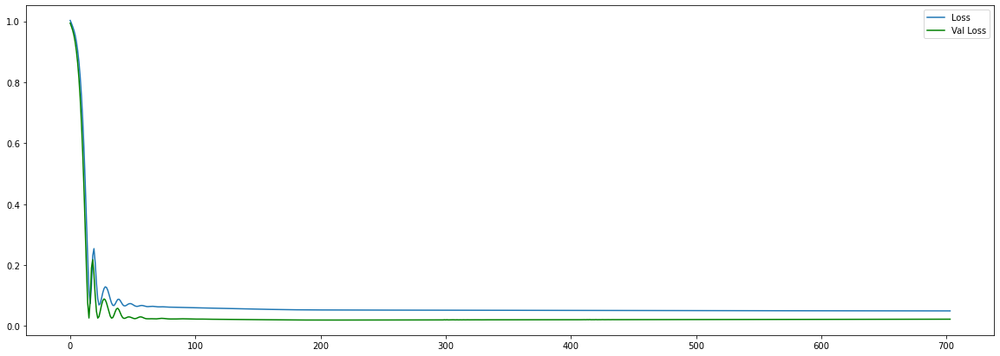

final loss: 0.04929167404770851
final val_loss: 0.02209070697426796
Get best hyperparameter for simple GRU


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


INFO:tensorflow:Oracle triggered exit
Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 1, 5)]            0         
_________________________________________________________________
gru (GRU)                    (None, 16)                1104      
_________________________________________________________________
dense (Dense)                (None, 32)                544       
_________________________________________________________________
dropout (Dropout)            (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 33        
Total params: 1,681
Trainable params: 1,681
Non-trainable params: 0
_________________________________________________________________
Start training simple GRU
Epoch 1/2500
1/1 [==============================] - ETA: 0s -


Epoch 00028: val_loss improved from 0.21643 to 0.20188, saving model to PNJ_1D_GRU.hdf5
Epoch 29/2500
1/1 [==============================] - ETA: 0s - loss: 0.3008 - mae: 0.410 - 0s 19ms/step - loss: 0.3008 - mae: 0.4101 - val_loss: 0.1880 - val_mae: 0.3695

Epoch 00029: val_loss improved from 0.20188 to 0.18797, saving model to PNJ_1D_GRU.hdf5
Epoch 30/2500
1/1 [==============================] - ETA: 0s - loss: 0.2943 - mae: 0.403 - 0s 21ms/step - loss: 0.2943 - mae: 0.4033 - val_loss: 0.1747 - val_mae: 0.3539

Epoch 00030: val_loss improved from 0.18797 to 0.17468, saving model to PNJ_1D_GRU.hdf5
Epoch 31/2500
1/1 [==============================] - ETA: 0s - loss: 0.2922 - mae: 0.399 - 0s 19ms/step - loss: 0.2922 - mae: 0.3993 - val_loss: 0.1620 - val_mae: 0.3383

Epoch 00031: val_loss improved from 0.17468 to 0.16204, saving model to PNJ_1D_GRU.hdf5
Epoch 32/2500
1/1 [==============================] - ETA: 0s - loss: 0.2589 - mae: 0.370 - 0s 20ms/step - loss: 0.2589 - mae: 0.3701 -

1/1 [==============================] - ETA: 0s - loss: 0.1304 - mae: 0.263 - 0s 21ms/step - loss: 0.1304 - mae: 0.2635 - val_loss: 0.0411 - val_mae: 0.1569

Epoch 00061: val_loss did not improve from 0.03868
Epoch 62/2500
1/1 [==============================] - ETA: 0s - loss: 0.1448 - mae: 0.275 - 0s 21ms/step - loss: 0.1448 - mae: 0.2751 - val_loss: 0.0416 - val_mae: 0.1583

Epoch 00062: val_loss did not improve from 0.03868
Epoch 63/2500
1/1 [==============================] - ETA: 0s - loss: 0.1319 - mae: 0.271 - 0s 20ms/step - loss: 0.1319 - mae: 0.2714 - val_loss: 0.0421 - val_mae: 0.1595

Epoch 00063: val_loss did not improve from 0.03868
Epoch 64/2500
1/1 [==============================] - ETA: 0s - loss: 0.1293 - mae: 0.256 - 0s 21ms/step - loss: 0.1293 - mae: 0.2568 - val_loss: 0.0425 - val_mae: 0.1606

Epoch 00064: val_loss did not improve from 0.03868
Epoch 65/2500
1/1 [==============================] - ETA: 0s - loss: 0.1340 - mae: 0.262 - 0s 21ms/step - loss: 0.1340 - mae: 

Epoch 00096: val_loss improved from 0.03737 to 0.03718, saving model to PNJ_1D_GRU.hdf5
Epoch 97/2500
1/1 [==============================] - ETA: 0s - loss: 0.1167 - mae: 0.248 - 0s 21ms/step - loss: 0.1167 - mae: 0.2489 - val_loss: 0.0370 - val_mae: 0.1466

Epoch 00097: val_loss improved from 0.03718 to 0.03697, saving model to PNJ_1D_GRU.hdf5
Epoch 98/2500
1/1 [==============================] - ETA: 0s - loss: 0.1350 - mae: 0.262 - 0s 21ms/step - loss: 0.1350 - mae: 0.2623 - val_loss: 0.0368 - val_mae: 0.1462

Epoch 00098: val_loss improved from 0.03697 to 0.03676, saving model to PNJ_1D_GRU.hdf5
Epoch 99/2500
1/1 [==============================] - ETA: 0s - loss: 0.1332 - mae: 0.262 - 0s 20ms/step - loss: 0.1332 - mae: 0.2625 - val_loss: 0.0365 - val_mae: 0.1457

Epoch 00099: val_loss improved from 0.03676 to 0.03653, saving model to PNJ_1D_GRU.hdf5
Epoch 100/2500
1/1 [==============================] - ETA: 0s - loss: 0.1200 - mae: 0.257 - 0s 21ms/step - loss: 0.1200 - mae: 0.2570 -

1/1 [==============================] - ETA: 0s - loss: 0.1039 - mae: 0.242 - 0s 20ms/step - loss: 0.1039 - mae: 0.2422 - val_loss: 0.0328 - val_mae: 0.1379

Epoch 00128: val_loss improved from 0.03286 to 0.03279, saving model to PNJ_1D_GRU.hdf5
Epoch 129/2500
1/1 [==============================] - ETA: 0s - loss: 0.1190 - mae: 0.253 - 0s 21ms/step - loss: 0.1190 - mae: 0.2533 - val_loss: 0.0328 - val_mae: 0.1378

Epoch 00129: val_loss improved from 0.03279 to 0.03277, saving model to PNJ_1D_GRU.hdf5
Epoch 130/2500
1/1 [==============================] - ETA: 0s - loss: 0.1314 - mae: 0.250 - 0s 19ms/step - loss: 0.1314 - mae: 0.2508 - val_loss: 0.0327 - val_mae: 0.1376

Epoch 00130: val_loss improved from 0.03277 to 0.03270, saving model to PNJ_1D_GRU.hdf5
Epoch 131/2500
1/1 [==============================] - ETA: 0s - loss: 0.1085 - mae: 0.248 - 0s 20ms/step - loss: 0.1085 - mae: 0.2484 - val_loss: 0.0327 - val_mae: 0.1375

Epoch 00131: val_loss improved from 0.03270 to 0.03265, saving 


Epoch 00159: val_loss improved from 0.02998 to 0.02991, saving model to PNJ_1D_GRU.hdf5
Epoch 160/2500
1/1 [==============================] - ETA: 0s - loss: 0.1025 - mae: 0.235 - 0s 21ms/step - loss: 0.1025 - mae: 0.2353 - val_loss: 0.0299 - val_mae: 0.1309

Epoch 00160: val_loss improved from 0.02991 to 0.02986, saving model to PNJ_1D_GRU.hdf5
Epoch 161/2500
1/1 [==============================] - ETA: 0s - loss: 0.1115 - mae: 0.245 - 0s 20ms/step - loss: 0.1115 - mae: 0.2450 - val_loss: 0.0298 - val_mae: 0.1307

Epoch 00161: val_loss improved from 0.02986 to 0.02979, saving model to PNJ_1D_GRU.hdf5
Epoch 162/2500
1/1 [==============================] - ETA: 0s - loss: 0.1098 - mae: 0.232 - 0s 20ms/step - loss: 0.1098 - mae: 0.2323 - val_loss: 0.0297 - val_mae: 0.1305

Epoch 00162: val_loss improved from 0.02979 to 0.02973, saving model to PNJ_1D_GRU.hdf5
Epoch 163/2500
1/1 [==============================] - ETA: 0s - loss: 0.1019 - mae: 0.233 - 0s 21ms/step - loss: 0.1019 - mae: 0.23

1/1 [==============================] - ETA: 0s - loss: 0.0950 - mae: 0.234 - 0s 18ms/step - loss: 0.0950 - mae: 0.2347 - val_loss: 0.0280 - val_mae: 0.1260

Epoch 00191: val_loss improved from 0.02806 to 0.02800, saving model to PNJ_1D_GRU.hdf5
Epoch 192/2500
1/1 [==============================] - ETA: 0s - loss: 0.1064 - mae: 0.236 - 0s 18ms/step - loss: 0.1064 - mae: 0.2366 - val_loss: 0.0279 - val_mae: 0.1258

Epoch 00192: val_loss improved from 0.02800 to 0.02791, saving model to PNJ_1D_GRU.hdf5
Epoch 193/2500
1/1 [==============================] - ETA: 0s - loss: 0.0967 - mae: 0.230 - 0s 18ms/step - loss: 0.0967 - mae: 0.2303 - val_loss: 0.0278 - val_mae: 0.1257

Epoch 00193: val_loss improved from 0.02791 to 0.02783, saving model to PNJ_1D_GRU.hdf5
Epoch 194/2500
1/1 [==============================] - ETA: 0s - loss: 0.0907 - mae: 0.223 - 0s 18ms/step - loss: 0.0907 - mae: 0.2239 - val_loss: 0.0277 - val_mae: 0.1255

Epoch 00194: val_loss improved from 0.02783 to 0.02774, saving 

Epoch 00222: val_loss improved from 0.02644 to 0.02642, saving model to PNJ_1D_GRU.hdf5
Epoch 223/2500
1/1 [==============================] - ETA: 0s - loss: 0.1110 - mae: 0.241 - 0s 19ms/step - loss: 0.1110 - mae: 0.2411 - val_loss: 0.0264 - val_mae: 0.1222

Epoch 00223: val_loss improved from 0.02642 to 0.02638, saving model to PNJ_1D_GRU.hdf5
Epoch 224/2500
1/1 [==============================] - ETA: 0s - loss: 0.0897 - mae: 0.221 - 0s 19ms/step - loss: 0.0897 - mae: 0.2212 - val_loss: 0.0263 - val_mae: 0.1221

Epoch 00224: val_loss improved from 0.02638 to 0.02634, saving model to PNJ_1D_GRU.hdf5
Epoch 225/2500
1/1 [==============================] - ETA: 0s - loss: 0.1020 - mae: 0.232 - 0s 19ms/step - loss: 0.1020 - mae: 0.2323 - val_loss: 0.0263 - val_mae: 0.1221

Epoch 00225: val_loss improved from 0.02634 to 0.02632, saving model to PNJ_1D_GRU.hdf5
Epoch 226/2500
1/1 [==============================] - ETA: 0s - loss: 0.0995 - mae: 0.233 - 0s 17ms/step - loss: 0.0995 - mae: 0.233

1/1 [==============================] - ETA: 0s - loss: 0.0974 - mae: 0.234 - 0s 25ms/step - loss: 0.0974 - mae: 0.2346 - val_loss: 0.0254 - val_mae: 0.1204

Epoch 00254: val_loss improved from 0.02546 to 0.02539, saving model to PNJ_1D_GRU.hdf5
Epoch 255/2500
1/1 [==============================] - ETA: 0s - loss: 0.0893 - mae: 0.217 - 0s 22ms/step - loss: 0.0893 - mae: 0.2179 - val_loss: 0.0253 - val_mae: 0.1203

Epoch 00255: val_loss improved from 0.02539 to 0.02534, saving model to PNJ_1D_GRU.hdf5
Epoch 256/2500
1/1 [==============================] - ETA: 0s - loss: 0.0902 - mae: 0.225 - 0s 24ms/step - loss: 0.0902 - mae: 0.2259 - val_loss: 0.0253 - val_mae: 0.1202

Epoch 00256: val_loss improved from 0.02534 to 0.02527, saving model to PNJ_1D_GRU.hdf5
Epoch 257/2500
1/1 [==============================] - ETA: 0s - loss: 0.1020 - mae: 0.232 - 0s 25ms/step - loss: 0.1020 - mae: 0.2326 - val_loss: 0.0252 - val_mae: 0.1201

Epoch 00257: val_loss improved from 0.02527 to 0.02522, saving 

Epoch 00286: val_loss improved from 0.02471 to 0.02468, saving model to PNJ_1D_GRU.hdf5
Epoch 287/2500
1/1 [==============================] - ETA: 0s - loss: 0.0933 - mae: 0.229 - 0s 20ms/step - loss: 0.0933 - mae: 0.2296 - val_loss: 0.0247 - val_mae: 0.1185

Epoch 00287: val_loss improved from 0.02468 to 0.02465, saving model to PNJ_1D_GRU.hdf5
Epoch 288/2500
1/1 [==============================] - ETA: 0s - loss: 0.0913 - mae: 0.225 - 0s 20ms/step - loss: 0.0913 - mae: 0.2250 - val_loss: 0.0246 - val_mae: 0.1184

Epoch 00288: val_loss improved from 0.02465 to 0.02462, saving model to PNJ_1D_GRU.hdf5
Epoch 289/2500
1/1 [==============================] - ETA: 0s - loss: 0.0803 - mae: 0.210 - 0s 20ms/step - loss: 0.0803 - mae: 0.2102 - val_loss: 0.0246 - val_mae: 0.1183

Epoch 00289: val_loss improved from 0.02462 to 0.02459, saving model to PNJ_1D_GRU.hdf5
Epoch 290/2500
1/1 [==============================] - ETA: 0s - loss: 0.0945 - mae: 0.227 - 0s 20ms/step - loss: 0.0945 - mae: 0.227

Epoch 320/2500
1/1 [==============================] - ETA: 0s - loss: 0.0866 - mae: 0.216 - 0s 22ms/step - loss: 0.0866 - mae: 0.2161 - val_loss: 0.0242 - val_mae: 0.1181

Epoch 00320: val_loss improved from 0.02423 to 0.02420, saving model to PNJ_1D_GRU.hdf5
Epoch 321/2500
1/1 [==============================] - ETA: 0s - loss: 0.0945 - mae: 0.228 - 0s 20ms/step - loss: 0.0945 - mae: 0.2289 - val_loss: 0.0242 - val_mae: 0.1181

Epoch 00321: val_loss improved from 0.02420 to 0.02417, saving model to PNJ_1D_GRU.hdf5
Epoch 322/2500
1/1 [==============================] - ETA: 0s - loss: 0.0869 - mae: 0.216 - 0s 21ms/step - loss: 0.0869 - mae: 0.2167 - val_loss: 0.0241 - val_mae: 0.1181

Epoch 00322: val_loss improved from 0.02417 to 0.02414, saving model to PNJ_1D_GRU.hdf5
Epoch 323/2500
1/1 [==============================] - ETA: 0s - loss: 0.0871 - mae: 0.220 - 0s 20ms/step - loss: 0.0871 - mae: 0.2201 - val_loss: 0.0241 - val_mae: 0.1180

Epoch 00323: val_loss improved from 0.02414 to 0

Epoch 00351: val_loss improved from 0.02364 to 0.02362, saving model to PNJ_1D_GRU.hdf5
Epoch 352/2500
1/1 [==============================] - ETA: 0s - loss: 0.0927 - mae: 0.224 - 0s 20ms/step - loss: 0.0927 - mae: 0.2247 - val_loss: 0.0236 - val_mae: 0.1166

Epoch 00352: val_loss improved from 0.02362 to 0.02361, saving model to PNJ_1D_GRU.hdf5
Epoch 353/2500
1/1 [==============================] - ETA: 0s - loss: 0.0897 - mae: 0.220 - 0s 23ms/step - loss: 0.0897 - mae: 0.2206 - val_loss: 0.0236 - val_mae: 0.1166

Epoch 00353: val_loss improved from 0.02361 to 0.02360, saving model to PNJ_1D_GRU.hdf5
Epoch 354/2500
1/1 [==============================] - ETA: 0s - loss: 0.0831 - mae: 0.217 - 0s 20ms/step - loss: 0.0831 - mae: 0.2175 - val_loss: 0.0236 - val_mae: 0.1165

Epoch 00354: val_loss improved from 0.02360 to 0.02359, saving model to PNJ_1D_GRU.hdf5
Epoch 355/2500
1/1 [==============================] - ETA: 0s - loss: 0.0912 - mae: 0.223 - 0s 21ms/step - loss: 0.0912 - mae: 0.223

Epoch 386/2500
1/1 [==============================] - ETA: 0s - loss: 0.0796 - mae: 0.215 - 0s 21ms/step - loss: 0.0796 - mae: 0.2155 - val_loss: 0.0234 - val_mae: 0.1161

Epoch 00386: val_loss improved from 0.02347 to 0.02344, saving model to PNJ_1D_GRU.hdf5
Epoch 387/2500
1/1 [==============================] - ETA: 0s - loss: 0.0857 - mae: 0.219 - 0s 20ms/step - loss: 0.0857 - mae: 0.2191 - val_loss: 0.0234 - val_mae: 0.1161

Epoch 00387: val_loss improved from 0.02344 to 0.02340, saving model to PNJ_1D_GRU.hdf5
Epoch 388/2500
1/1 [==============================] - ETA: 0s - loss: 0.0861 - mae: 0.224 - 0s 20ms/step - loss: 0.0861 - mae: 0.2248 - val_loss: 0.0234 - val_mae: 0.1161

Epoch 00388: val_loss improved from 0.02340 to 0.02336, saving model to PNJ_1D_GRU.hdf5
Epoch 389/2500
1/1 [==============================] - ETA: 0s - loss: 0.0796 - mae: 0.210 - 0s 20ms/step - loss: 0.0796 - mae: 0.2101 - val_loss: 0.0233 - val_mae: 0.1162

Epoch 00389: val_loss improved from 0.02336 to 0


Epoch 00417: val_loss improved from 0.02302 to 0.02300, saving model to PNJ_1D_GRU.hdf5
Epoch 418/2500
1/1 [==============================] - ETA: 0s - loss: 0.0838 - mae: 0.216 - 0s 21ms/step - loss: 0.0838 - mae: 0.2160 - val_loss: 0.0230 - val_mae: 0.1154

Epoch 00418: val_loss improved from 0.02300 to 0.02297, saving model to PNJ_1D_GRU.hdf5
Epoch 419/2500
1/1 [==============================] - ETA: 0s - loss: 0.0837 - mae: 0.214 - 0s 20ms/step - loss: 0.0837 - mae: 0.2144 - val_loss: 0.0229 - val_mae: 0.1154

Epoch 00419: val_loss improved from 0.02297 to 0.02294, saving model to PNJ_1D_GRU.hdf5
Epoch 420/2500
1/1 [==============================] - ETA: 0s - loss: 0.0839 - mae: 0.218 - 0s 21ms/step - loss: 0.0839 - mae: 0.2188 - val_loss: 0.0229 - val_mae: 0.1154

Epoch 00420: val_loss improved from 0.02294 to 0.02292, saving model to PNJ_1D_GRU.hdf5
Epoch 421/2500
1/1 [==============================] - ETA: 0s - loss: 0.0949 - mae: 0.219 - 0s 20ms/step - loss: 0.0949 - mae: 0.21


Epoch 00450: val_loss improved from 0.02272 to 0.02269, saving model to PNJ_1D_GRU.hdf5
Epoch 451/2500
1/1 [==============================] - ETA: 0s - loss: 0.0699 - mae: 0.201 - 0s 20ms/step - loss: 0.0699 - mae: 0.2013 - val_loss: 0.0227 - val_mae: 0.1147

Epoch 00451: val_loss improved from 0.02269 to 0.02266, saving model to PNJ_1D_GRU.hdf5
Epoch 452/2500
1/1 [==============================] - ETA: 0s - loss: 0.0850 - mae: 0.220 - 0s 20ms/step - loss: 0.0850 - mae: 0.2208 - val_loss: 0.0226 - val_mae: 0.1144

Epoch 00452: val_loss improved from 0.02266 to 0.02262, saving model to PNJ_1D_GRU.hdf5
Epoch 453/2500
1/1 [==============================] - ETA: 0s - loss: 0.0822 - mae: 0.213 - 0s 20ms/step - loss: 0.0822 - mae: 0.2134 - val_loss: 0.0226 - val_mae: 0.1142

Epoch 00453: val_loss improved from 0.02262 to 0.02260, saving model to PNJ_1D_GRU.hdf5
Epoch 454/2500
1/1 [==============================] - ETA: 0s - loss: 0.0875 - mae: 0.219 - 0s 21ms/step - loss: 0.0875 - mae: 0.21


Epoch 00483: val_loss improved from 0.02220 to 0.02218, saving model to PNJ_1D_GRU.hdf5
Epoch 484/2500
1/1 [==============================] - ETA: 0s - loss: 0.0825 - mae: 0.214 - 0s 20ms/step - loss: 0.0825 - mae: 0.2143 - val_loss: 0.0222 - val_mae: 0.1137

Epoch 00484: val_loss improved from 0.02218 to 0.02217, saving model to PNJ_1D_GRU.hdf5
Epoch 485/2500
1/1 [==============================] - ETA: 0s - loss: 0.0882 - mae: 0.220 - 0s 20ms/step - loss: 0.0882 - mae: 0.2206 - val_loss: 0.0222 - val_mae: 0.1137

Epoch 00485: val_loss improved from 0.02217 to 0.02216, saving model to PNJ_1D_GRU.hdf5
Epoch 486/2500
1/1 [==============================] - ETA: 0s - loss: 0.0710 - mae: 0.200 - 0s 19ms/step - loss: 0.0710 - mae: 0.2006 - val_loss: 0.0222 - val_mae: 0.1137

Epoch 00486: val_loss improved from 0.02216 to 0.02216, saving model to PNJ_1D_GRU.hdf5
Epoch 487/2500
1/1 [==============================] - ETA: 0s - loss: 0.0827 - mae: 0.220 - 0s 21ms/step - loss: 0.0827 - mae: 0.22

1/1 [==============================] - ETA: 0s - loss: 0.0746 - mae: 0.207 - 0s 21ms/step - loss: 0.0746 - mae: 0.2078 - val_loss: 0.0219 - val_mae: 0.1128

Epoch 00516: val_loss improved from 0.02187 to 0.02186, saving model to PNJ_1D_GRU.hdf5
Epoch 517/2500
1/1 [==============================] - ETA: 0s - loss: 0.0797 - mae: 0.216 - 0s 21ms/step - loss: 0.0797 - mae: 0.2168 - val_loss: 0.0219 - val_mae: 0.1129

Epoch 00517: val_loss improved from 0.02186 to 0.02186, saving model to PNJ_1D_GRU.hdf5
Epoch 518/2500
1/1 [==============================] - ETA: 0s - loss: 0.0812 - mae: 0.216 - 0s 20ms/step - loss: 0.0812 - mae: 0.2166 - val_loss: 0.0219 - val_mae: 0.1129

Epoch 00518: val_loss improved from 0.02186 to 0.02185, saving model to PNJ_1D_GRU.hdf5
Epoch 519/2500
1/1 [==============================] - ETA: 0s - loss: 0.0782 - mae: 0.204 - 0s 21ms/step - loss: 0.0782 - mae: 0.2040 - val_loss: 0.0218 - val_mae: 0.1128

Epoch 00519: val_loss improved from 0.02185 to 0.02184, saving 

1/1 [==============================] - ETA: 0s - loss: 0.0853 - mae: 0.208 - 0s 20ms/step - loss: 0.0853 - mae: 0.2081 - val_loss: 0.0216 - val_mae: 0.1122

Epoch 00550: val_loss improved from 0.02161 to 0.02156, saving model to PNJ_1D_GRU.hdf5
Epoch 551/2500
1/1 [==============================] - ETA: 0s - loss: 0.0798 - mae: 0.211 - 0s 19ms/step - loss: 0.0798 - mae: 0.2116 - val_loss: 0.0215 - val_mae: 0.1118

Epoch 00551: val_loss improved from 0.02156 to 0.02148, saving model to PNJ_1D_GRU.hdf5
Epoch 552/2500
1/1 [==============================] - ETA: 0s - loss: 0.0784 - mae: 0.213 - 0s 20ms/step - loss: 0.0784 - mae: 0.2130 - val_loss: 0.0214 - val_mae: 0.1114

Epoch 00552: val_loss improved from 0.02148 to 0.02140, saving model to PNJ_1D_GRU.hdf5
Epoch 553/2500
1/1 [==============================] - ETA: 0s - loss: 0.0734 - mae: 0.204 - 0s 20ms/step - loss: 0.0734 - mae: 0.2040 - val_loss: 0.0214 - val_mae: 0.1111

Epoch 00553: val_loss improved from 0.02140 to 0.02135, saving 

1/1 [==============================] - ETA: 0s - loss: 0.0799 - mae: 0.207 - 0s 21ms/step - loss: 0.0799 - mae: 0.2074 - val_loss: 0.0214 - val_mae: 0.1127

Epoch 00584: val_loss did not improve from 0.02120
Epoch 585/2500
1/1 [==============================] - ETA: 0s - loss: 0.0818 - mae: 0.210 - 0s 20ms/step - loss: 0.0818 - mae: 0.2108 - val_loss: 0.0215 - val_mae: 0.1131

Epoch 00585: val_loss did not improve from 0.02120
Epoch 586/2500
1/1 [==============================] - ETA: 0s - loss: 0.0757 - mae: 0.205 - 0s 20ms/step - loss: 0.0757 - mae: 0.2055 - val_loss: 0.0215 - val_mae: 0.1134

Epoch 00586: val_loss did not improve from 0.02120
Epoch 587/2500
1/1 [==============================] - ETA: 0s - loss: 0.0853 - mae: 0.217 - 0s 21ms/step - loss: 0.0853 - mae: 0.2170 - val_loss: 0.0215 - val_mae: 0.1135

Epoch 00587: val_loss did not improve from 0.02120
Epoch 588/2500
1/1 [==============================] - ETA: 0s - loss: 0.0819 - mae: 0.214 - 0s 19ms/step - loss: 0.0819 - m

1/1 [==============================] - ETA: 0s - loss: 0.0723 - mae: 0.202 - 0s 19ms/step - loss: 0.0723 - mae: 0.2026 - val_loss: 0.0209 - val_mae: 0.1084

Epoch 00619: val_loss did not improve from 0.02084
Epoch 620/2500
1/1 [==============================] - ETA: 0s - loss: 0.0825 - mae: 0.209 - 0s 20ms/step - loss: 0.0825 - mae: 0.2099 - val_loss: 0.0209 - val_mae: 0.1086

Epoch 00620: val_loss did not improve from 0.02084
Epoch 621/2500
1/1 [==============================] - ETA: 0s - loss: 0.0738 - mae: 0.208 - 0s 20ms/step - loss: 0.0738 - mae: 0.2088 - val_loss: 0.0208 - val_mae: 0.1091

Epoch 00621: val_loss improved from 0.02084 to 0.02082, saving model to PNJ_1D_GRU.hdf5
Epoch 622/2500
1/1 [==============================] - ETA: 0s - loss: 0.0784 - mae: 0.211 - 0s 20ms/step - loss: 0.0784 - mae: 0.2117 - val_loss: 0.0208 - val_mae: 0.1098

Epoch 00622: val_loss did not improve from 0.02082
Epoch 623/2500
1/1 [==============================] - ETA: 0s - loss: 0.0705 - mae: 0.

1/1 [==============================] - ETA: 0s - loss: 0.0724 - mae: 0.204 - 0s 21ms/step - loss: 0.0724 - mae: 0.2046 - val_loss: 0.0206 - val_mae: 0.1091

Epoch 00654: val_loss improved from 0.02066 to 0.02065, saving model to PNJ_1D_GRU.hdf5
Epoch 655/2500
1/1 [==============================] - ETA: 0s - loss: 0.0713 - mae: 0.203 - 0s 20ms/step - loss: 0.0713 - mae: 0.2039 - val_loss: 0.0206 - val_mae: 0.1090

Epoch 00655: val_loss did not improve from 0.02065
Epoch 656/2500
1/1 [==============================] - ETA: 0s - loss: 0.0643 - mae: 0.193 - 0s 19ms/step - loss: 0.0643 - mae: 0.1933 - val_loss: 0.0207 - val_mae: 0.1092

Epoch 00656: val_loss did not improve from 0.02065
Epoch 657/2500
1/1 [==============================] - ETA: 0s - loss: 0.0667 - mae: 0.195 - 0s 21ms/step - loss: 0.0667 - mae: 0.1950 - val_loss: 0.0207 - val_mae: 0.1094

Epoch 00657: val_loss did not improve from 0.02065
Epoch 658/2500
1/1 [==============================] - ETA: 0s - loss: 0.0693 - mae: 0.


Epoch 00688: val_loss improved from 0.02030 to 0.02029, saving model to PNJ_1D_GRU.hdf5
Epoch 689/2500
1/1 [==============================] - ETA: 0s - loss: 0.0753 - mae: 0.206 - 0s 20ms/step - loss: 0.0753 - mae: 0.2064 - val_loss: 0.0203 - val_mae: 0.1072

Epoch 00689: val_loss did not improve from 0.02029
Epoch 690/2500
1/1 [==============================] - ETA: 0s - loss: 0.0790 - mae: 0.207 - 0s 21ms/step - loss: 0.0790 - mae: 0.2079 - val_loss: 0.0204 - val_mae: 0.1071

Epoch 00690: val_loss did not improve from 0.02029
Epoch 691/2500
1/1 [==============================] - ETA: 0s - loss: 0.0712 - mae: 0.202 - 0s 20ms/step - loss: 0.0712 - mae: 0.2027 - val_loss: 0.0204 - val_mae: 0.1071

Epoch 00691: val_loss did not improve from 0.02029
Epoch 692/2500
1/1 [==============================] - ETA: 0s - loss: 0.0795 - mae: 0.211 - 0s 20ms/step - loss: 0.0795 - mae: 0.2115 - val_loss: 0.0204 - val_mae: 0.1073

Epoch 00692: val_loss did not improve from 0.02029
Epoch 693/2500
1/1 

1/1 [==============================] - ETA: 0s - loss: 0.0694 - mae: 0.200 - 0s 21ms/step - loss: 0.0694 - mae: 0.2006 - val_loss: 0.0206 - val_mae: 0.1080

Epoch 00725: val_loss did not improve from 0.02029
Epoch 726/2500
1/1 [==============================] - ETA: 0s - loss: 0.0754 - mae: 0.202 - 0s 21ms/step - loss: 0.0754 - mae: 0.2025 - val_loss: 0.0206 - val_mae: 0.1080

Epoch 00726: val_loss did not improve from 0.02029
Epoch 727/2500
1/1 [==============================] - ETA: 0s - loss: 0.0770 - mae: 0.206 - 0s 20ms/step - loss: 0.0770 - mae: 0.2064 - val_loss: 0.0206 - val_mae: 0.1076

Epoch 00727: val_loss did not improve from 0.02029
Epoch 728/2500
1/1 [==============================] - ETA: 0s - loss: 0.0783 - mae: 0.207 - 0s 21ms/step - loss: 0.0783 - mae: 0.2076 - val_loss: 0.0205 - val_mae: 0.1075

Epoch 00728: val_loss did not improve from 0.02029
Epoch 729/2500
1/1 [==============================] - ETA: 0s - loss: 0.0777 - mae: 0.207 - 0s 20ms/step - loss: 0.0777 - m

1/1 [==============================] - ETA: 0s - loss: 0.0722 - mae: 0.203 - 0s 21ms/step - loss: 0.0722 - mae: 0.2034 - val_loss: 0.0200 - val_mae: 0.1073

Epoch 00760: val_loss did not improve from 0.01996
Epoch 761/2500
1/1 [==============================] - ETA: 0s - loss: 0.0804 - mae: 0.207 - 0s 21ms/step - loss: 0.0804 - mae: 0.2077 - val_loss: 0.0201 - val_mae: 0.1076

Epoch 00761: val_loss did not improve from 0.01996
Epoch 762/2500
1/1 [==============================] - ETA: 0s - loss: 0.0775 - mae: 0.212 - 0s 20ms/step - loss: 0.0775 - mae: 0.2128 - val_loss: 0.0201 - val_mae: 0.1078

Epoch 00762: val_loss did not improve from 0.01996
Epoch 763/2500
1/1 [==============================] - ETA: 0s - loss: 0.0803 - mae: 0.208 - 0s 21ms/step - loss: 0.0803 - mae: 0.2081 - val_loss: 0.0201 - val_mae: 0.1077

Epoch 00763: val_loss did not improve from 0.01996
Epoch 764/2500
1/1 [==============================] - ETA: 0s - loss: 0.0704 - mae: 0.203 - 0s 20ms/step - loss: 0.0704 - m

Epoch 00795: val_loss did not improve from 0.01969
Epoch 796/2500
1/1 [==============================] - ETA: 0s - loss: 0.0735 - mae: 0.205 - 0s 20ms/step - loss: 0.0735 - mae: 0.2053 - val_loss: 0.0201 - val_mae: 0.1066

Epoch 00796: val_loss did not improve from 0.01969
Epoch 797/2500
1/1 [==============================] - ETA: 0s - loss: 0.0740 - mae: 0.205 - 0s 21ms/step - loss: 0.0740 - mae: 0.2051 - val_loss: 0.0201 - val_mae: 0.1068

Epoch 00797: val_loss did not improve from 0.01969
Epoch 798/2500
1/1 [==============================] - ETA: 0s - loss: 0.0692 - mae: 0.196 - 0s 21ms/step - loss: 0.0692 - mae: 0.1964 - val_loss: 0.0201 - val_mae: 0.1073

Epoch 00798: val_loss did not improve from 0.01969
Epoch 799/2500
1/1 [==============================] - ETA: 0s - loss: 0.0700 - mae: 0.195 - 0s 20ms/step - loss: 0.0700 - mae: 0.1954 - val_loss: 0.0201 - val_mae: 0.1078

Epoch 00799: val_loss did not improve from 0.01969
Epoch 800/2500
1/1 [==============================] - ETA


Epoch 00832: val_loss did not improve from 0.01969
Epoch 833/2500
1/1 [==============================] - ETA: 0s - loss: 0.0684 - mae: 0.198 - 0s 20ms/step - loss: 0.0684 - mae: 0.1982 - val_loss: 0.0200 - val_mae: 0.1067

Epoch 00833: val_loss did not improve from 0.01969
Epoch 834/2500
1/1 [==============================] - ETA: 0s - loss: 0.0673 - mae: 0.197 - 0s 21ms/step - loss: 0.0673 - mae: 0.1978 - val_loss: 0.0199 - val_mae: 0.1064

Epoch 00834: val_loss did not improve from 0.01969
Epoch 835/2500
1/1 [==============================] - ETA: 0s - loss: 0.0728 - mae: 0.200 - 0s 21ms/step - loss: 0.0728 - mae: 0.2005 - val_loss: 0.0199 - val_mae: 0.1063

Epoch 00835: val_loss did not improve from 0.01969
Epoch 836/2500
1/1 [==============================] - ETA: 0s - loss: 0.0708 - mae: 0.199 - 0s 20ms/step - loss: 0.0708 - mae: 0.1994 - val_loss: 0.0198 - val_mae: 0.1061

Epoch 00836: val_loss did not improve from 0.01969
Epoch 837/2500
1/1 [==============================] - ET

Epoch 869/2500
1/1 [==============================] - ETA: 0s - loss: 0.0765 - mae: 0.207 - 0s 23ms/step - loss: 0.0765 - mae: 0.2072 - val_loss: 0.0199 - val_mae: 0.1062

Epoch 00869: val_loss did not improve from 0.01956
Epoch 870/2500
1/1 [==============================] - ETA: 0s - loss: 0.0719 - mae: 0.200 - 0s 20ms/step - loss: 0.0719 - mae: 0.2004 - val_loss: 0.0199 - val_mae: 0.1065

Epoch 00870: val_loss did not improve from 0.01956
Epoch 871/2500
1/1 [==============================] - ETA: 0s - loss: 0.0721 - mae: 0.202 - 0s 21ms/step - loss: 0.0721 - mae: 0.2027 - val_loss: 0.0200 - val_mae: 0.1068

Epoch 00871: val_loss did not improve from 0.01956
Epoch 872/2500
1/1 [==============================] - ETA: 0s - loss: 0.0734 - mae: 0.203 - 0s 22ms/step - loss: 0.0734 - mae: 0.2037 - val_loss: 0.0199 - val_mae: 0.1067

Epoch 00872: val_loss did not improve from 0.01956
Epoch 873/2500
1/1 [==============================] - ETA: 0s - loss: 0.0737 - mae: 0.203 - 0s 21ms/step - l


Epoch 00905: val_loss did not improve from 0.01956
Epoch 906/2500
1/1 [==============================] - ETA: 0s - loss: 0.0733 - mae: 0.198 - 0s 22ms/step - loss: 0.0733 - mae: 0.1984 - val_loss: 0.0196 - val_mae: 0.1050

Epoch 00906: val_loss did not improve from 0.01956
Epoch 907/2500
1/1 [==============================] - ETA: 0s - loss: 0.0726 - mae: 0.203 - 0s 20ms/step - loss: 0.0726 - mae: 0.2038 - val_loss: 0.0196 - val_mae: 0.1049

Epoch 00907: val_loss did not improve from 0.01956
Epoch 908/2500
1/1 [==============================] - ETA: 0s - loss: 0.0672 - mae: 0.195 - 0s 22ms/step - loss: 0.0672 - mae: 0.1957 - val_loss: 0.0196 - val_mae: 0.1050

Epoch 00908: val_loss did not improve from 0.01956
Epoch 909/2500
1/1 [==============================] - ETA: 0s - loss: 0.0764 - mae: 0.199 - 0s 20ms/step - loss: 0.0764 - mae: 0.1996 - val_loss: 0.0196 - val_mae: 0.1049

Epoch 00909: val_loss improved from 0.01956 to 0.01955, saving model to PNJ_1D_GRU.hdf5
Epoch 910/2500
1/1 

1/1 [==============================] - ETA: 0s - loss: 0.0747 - mae: 0.204 - 0s 21ms/step - loss: 0.0747 - mae: 0.2049 - val_loss: 0.0203 - val_mae: 0.1081

Epoch 00942: val_loss did not improve from 0.01955
Epoch 943/2500
1/1 [==============================] - ETA: 0s - loss: 0.0704 - mae: 0.198 - 0s 21ms/step - loss: 0.0704 - mae: 0.1987 - val_loss: 0.0202 - val_mae: 0.1077

Epoch 00943: val_loss did not improve from 0.01955
Epoch 944/2500
1/1 [==============================] - ETA: 0s - loss: 0.0706 - mae: 0.197 - 0s 20ms/step - loss: 0.0706 - mae: 0.1977 - val_loss: 0.0200 - val_mae: 0.1074

Epoch 00944: val_loss did not improve from 0.01955
Epoch 945/2500
1/1 [==============================] - ETA: 0s - loss: 0.0715 - mae: 0.198 - 0s 20ms/step - loss: 0.0715 - mae: 0.1987 - val_loss: 0.0199 - val_mae: 0.1067

Epoch 00945: val_loss did not improve from 0.01955
Epoch 946/2500
1/1 [==============================] - ETA: 0s - loss: 0.0691 - mae: 0.201 - 0s 19ms/step - loss: 0.0691 - m

Epoch 00978: val_loss did not improve from 0.01955
Epoch 979/2500
1/1 [==============================] - ETA: 0s - loss: 0.0760 - mae: 0.203 - 0s 20ms/step - loss: 0.0760 - mae: 0.2033 - val_loss: 0.0200 - val_mae: 0.1063

Epoch 00979: val_loss did not improve from 0.01955
Epoch 980/2500
1/1 [==============================] - ETA: 0s - loss: 0.0718 - mae: 0.202 - 0s 21ms/step - loss: 0.0718 - mae: 0.2024 - val_loss: 0.0200 - val_mae: 0.1063

Epoch 00980: val_loss did not improve from 0.01955
Epoch 981/2500
1/1 [==============================] - ETA: 0s - loss: 0.0764 - mae: 0.205 - 0s 21ms/step - loss: 0.0764 - mae: 0.2050 - val_loss: 0.0200 - val_mae: 0.1059

Epoch 00981: val_loss did not improve from 0.01955
Epoch 982/2500
1/1 [==============================] - ETA: 0s - loss: 0.0702 - mae: 0.197 - 0s 20ms/step - loss: 0.0702 - mae: 0.1976 - val_loss: 0.0199 - val_mae: 0.1058

Epoch 00982: val_loss did not improve from 0.01955
Epoch 983/2500
1/1 [==============================] - ETA


Epoch 01015: val_loss did not improve from 0.01955
Epoch 1016/2500
1/1 [==============================] - ETA: 0s - loss: 0.0700 - mae: 0.205 - 0s 20ms/step - loss: 0.0700 - mae: 0.2055 - val_loss: 0.0202 - val_mae: 0.1075

Epoch 01016: val_loss did not improve from 0.01955
Epoch 1017/2500
1/1 [==============================] - ETA: 0s - loss: 0.0668 - mae: 0.197 - 0s 20ms/step - loss: 0.0668 - mae: 0.1977 - val_loss: 0.0201 - val_mae: 0.1070

Epoch 01017: val_loss did not improve from 0.01955
Epoch 1018/2500
1/1 [==============================] - ETA: 0s - loss: 0.0742 - mae: 0.203 - 0s 21ms/step - loss: 0.0742 - mae: 0.2030 - val_loss: 0.0201 - val_mae: 0.1067

Epoch 01018: val_loss did not improve from 0.01955
Epoch 1019/2500
1/1 [==============================] - ETA: 0s - loss: 0.0706 - mae: 0.198 - 0s 20ms/step - loss: 0.0706 - mae: 0.1983 - val_loss: 0.0200 - val_mae: 0.1064

Epoch 01019: val_loss did not improve from 0.01955
Epoch 1020/2500
1/1 [==============================]

1/1 [==============================] - ETA: 0s - loss: 0.0778 - mae: 0.209 - 0s 19ms/step - loss: 0.0778 - mae: 0.2094 - val_loss: 0.0200 - val_mae: 0.1055

Epoch 01052: val_loss did not improve from 0.01955
Epoch 1053/2500
1/1 [==============================] - ETA: 0s - loss: 0.0719 - mae: 0.199 - 0s 20ms/step - loss: 0.0719 - mae: 0.1995 - val_loss: 0.0200 - val_mae: 0.1053

Epoch 01053: val_loss did not improve from 0.01955
Epoch 1054/2500
1/1 [==============================] - ETA: 0s - loss: 0.0661 - mae: 0.195 - 0s 22ms/step - loss: 0.0661 - mae: 0.1954 - val_loss: 0.0200 - val_mae: 0.1054

Epoch 01054: val_loss did not improve from 0.01955
Epoch 1055/2500
1/1 [==============================] - ETA: 0s - loss: 0.0673 - mae: 0.192 - 0s 21ms/step - loss: 0.0673 - mae: 0.1928 - val_loss: 0.0201 - val_mae: 0.1058

Epoch 01055: val_loss did not improve from 0.01955
Epoch 1056/2500
1/1 [==============================] - ETA: 0s - loss: 0.0626 - mae: 0.191 - 0s 20ms/step - loss: 0.0626


Epoch 01088: val_loss did not improve from 0.01955
Epoch 1089/2500
1/1 [==============================] - ETA: 0s - loss: 0.0710 - mae: 0.199 - 0s 20ms/step - loss: 0.0710 - mae: 0.1996 - val_loss: 0.0200 - val_mae: 0.1057

Epoch 01089: val_loss did not improve from 0.01955
Epoch 1090/2500
1/1 [==============================] - ETA: 0s - loss: 0.0761 - mae: 0.196 - 0s 21ms/step - loss: 0.0761 - mae: 0.1963 - val_loss: 0.0200 - val_mae: 0.1061

Epoch 01090: val_loss did not improve from 0.01955
Epoch 1091/2500
1/1 [==============================] - ETA: 0s - loss: 0.0723 - mae: 0.198 - 0s 20ms/step - loss: 0.0723 - mae: 0.1986 - val_loss: 0.0201 - val_mae: 0.1067

Epoch 01091: val_loss did not improve from 0.01955
Epoch 1092/2500
1/1 [==============================] - ETA: 0s - loss: 0.0736 - mae: 0.202 - 0s 21ms/step - loss: 0.0736 - mae: 0.2025 - val_loss: 0.0203 - val_mae: 0.1075

Epoch 01092: val_loss did not improve from 0.01955
Epoch 1093/2500
1/1 [==============================]

Epoch 01124: val_loss did not improve from 0.01955
Epoch 1125/2500
1/1 [==============================] - ETA: 0s - loss: 0.0711 - mae: 0.199 - 0s 21ms/step - loss: 0.0711 - mae: 0.1993 - val_loss: 0.0202 - val_mae: 0.1067

Epoch 01125: val_loss did not improve from 0.01955
Epoch 1126/2500
1/1 [==============================] - ETA: 0s - loss: 0.0695 - mae: 0.199 - 0s 20ms/step - loss: 0.0695 - mae: 0.1991 - val_loss: 0.0202 - val_mae: 0.1066

Epoch 01126: val_loss did not improve from 0.01955
Epoch 1127/2500
1/1 [==============================] - ETA: 0s - loss: 0.0737 - mae: 0.203 - 0s 20ms/step - loss: 0.0737 - mae: 0.2030 - val_loss: 0.0202 - val_mae: 0.1064

Epoch 01127: val_loss did not improve from 0.01955
Epoch 1128/2500
1/1 [==============================] - ETA: 0s - loss: 0.0781 - mae: 0.209 - 0s 20ms/step - loss: 0.0781 - mae: 0.2092 - val_loss: 0.0202 - val_mae: 0.1062

Epoch 01128: val_loss did not improve from 0.01955
Epoch 1129/2500
1/1 [==============================] 

1/1 [==============================] - ETA: 0s - loss: 0.0755 - mae: 0.204 - 0s 20ms/step - loss: 0.0755 - mae: 0.2044 - val_loss: 0.0202 - val_mae: 0.1056

Epoch 01161: val_loss did not improve from 0.01955
Epoch 1162/2500
1/1 [==============================] - ETA: 0s - loss: 0.0691 - mae: 0.198 - 0s 21ms/step - loss: 0.0691 - mae: 0.1980 - val_loss: 0.0202 - val_mae: 0.1056

Epoch 01162: val_loss did not improve from 0.01955
Epoch 1163/2500
1/1 [==============================] - ETA: 0s - loss: 0.0666 - mae: 0.195 - 0s 20ms/step - loss: 0.0666 - mae: 0.1959 - val_loss: 0.0202 - val_mae: 0.1057

Epoch 01163: val_loss did not improve from 0.01955
Epoch 1164/2500
1/1 [==============================] - ETA: 0s - loss: 0.0631 - mae: 0.188 - 0s 21ms/step - loss: 0.0631 - mae: 0.1889 - val_loss: 0.0202 - val_mae: 0.1057

Epoch 01164: val_loss did not improve from 0.01955
Epoch 1165/2500
1/1 [==============================] - ETA: 0s - loss: 0.0594 - mae: 0.183 - 0s 21ms/step - loss: 0.0594


Epoch 01197: val_loss did not improve from 0.01955
Epoch 1198/2500
1/1 [==============================] - ETA: 0s - loss: 0.0760 - mae: 0.204 - 0s 21ms/step - loss: 0.0760 - mae: 0.2042 - val_loss: 0.0203 - val_mae: 0.1067

Epoch 01198: val_loss did not improve from 0.01955
Epoch 1199/2500
1/1 [==============================] - ETA: 0s - loss: 0.0717 - mae: 0.199 - 0s 20ms/step - loss: 0.0717 - mae: 0.1993 - val_loss: 0.0203 - val_mae: 0.1069

Epoch 01199: val_loss did not improve from 0.01955
Epoch 1200/2500
1/1 [==============================] - ETA: 0s - loss: 0.0655 - mae: 0.196 - 0s 21ms/step - loss: 0.0655 - mae: 0.1960 - val_loss: 0.0203 - val_mae: 0.1071

Epoch 01200: val_loss did not improve from 0.01955
Epoch 1201/2500
1/1 [==============================] - ETA: 0s - loss: 0.0733 - mae: 0.200 - 0s 21ms/step - loss: 0.0733 - mae: 0.2009 - val_loss: 0.0203 - val_mae: 0.1075

Epoch 01201: val_loss did not improve from 0.01955
Epoch 1202/2500
1/1 [==============================]

1/1 [==============================] - ETA: 0s - loss: 0.0644 - mae: 0.193 - 0s 20ms/step - loss: 0.0644 - mae: 0.1935 - val_loss: 0.0202 - val_mae: 0.1060

Epoch 01234: val_loss did not improve from 0.01955
Epoch 1235/2500
1/1 [==============================] - ETA: 0s - loss: 0.0712 - mae: 0.203 - 0s 21ms/step - loss: 0.0712 - mae: 0.2035 - val_loss: 0.0202 - val_mae: 0.1061

Epoch 01235: val_loss did not improve from 0.01955
Epoch 1236/2500
1/1 [==============================] - ETA: 0s - loss: 0.0654 - mae: 0.194 - 0s 21ms/step - loss: 0.0654 - mae: 0.1941 - val_loss: 0.0202 - val_mae: 0.1062

Epoch 01236: val_loss did not improve from 0.01955
Epoch 1237/2500
1/1 [==============================] - ETA: 0s - loss: 0.0700 - mae: 0.200 - 0s 20ms/step - loss: 0.0700 - mae: 0.2000 - val_loss: 0.0203 - val_mae: 0.1066

Epoch 01237: val_loss did not improve from 0.01955
Epoch 1238/2500
1/1 [==============================] - ETA: 0s - loss: 0.0606 - mae: 0.182 - 0s 21ms/step - loss: 0.0606


Epoch 01270: val_loss did not improve from 0.01955
Epoch 1271/2500
1/1 [==============================] - ETA: 0s - loss: 0.0696 - mae: 0.199 - 0s 20ms/step - loss: 0.0696 - mae: 0.1990 - val_loss: 0.0207 - val_mae: 0.1085

Epoch 01271: val_loss did not improve from 0.01955
Epoch 1272/2500
1/1 [==============================] - ETA: 0s - loss: 0.0741 - mae: 0.204 - 0s 20ms/step - loss: 0.0741 - mae: 0.2040 - val_loss: 0.0207 - val_mae: 0.1083

Epoch 01272: val_loss did not improve from 0.01955
Epoch 1273/2500
1/1 [==============================] - ETA: 0s - loss: 0.0654 - mae: 0.192 - 0s 20ms/step - loss: 0.0654 - mae: 0.1921 - val_loss: 0.0207 - val_mae: 0.1082

Epoch 01273: val_loss did not improve from 0.01955
Epoch 1274/2500
1/1 [==============================] - ETA: 0s - loss: 0.0694 - mae: 0.197 - 0s 20ms/step - loss: 0.0694 - mae: 0.1970 - val_loss: 0.0206 - val_mae: 0.1079

Epoch 01274: val_loss did not improve from 0.01955
Epoch 1275/2500
1/1 [==============================]

1/1 [==============================] - ETA: 0s - loss: 0.0644 - mae: 0.191 - 0s 20ms/step - loss: 0.0644 - mae: 0.1910 - val_loss: 0.0206 - val_mae: 0.1086

Epoch 01307: val_loss did not improve from 0.01955
Epoch 1308/2500
1/1 [==============================] - ETA: 0s - loss: 0.0671 - mae: 0.193 - 0s 23ms/step - loss: 0.0671 - mae: 0.1930 - val_loss: 0.0206 - val_mae: 0.1085

Epoch 01308: val_loss did not improve from 0.01955
Epoch 1309/2500
1/1 [==============================] - ETA: 0s - loss: 0.0698 - mae: 0.196 - 0s 22ms/step - loss: 0.0698 - mae: 0.1965 - val_loss: 0.0206 - val_mae: 0.1081

Epoch 01309: val_loss did not improve from 0.01955
Epoch 1310/2500
1/1 [==============================] - ETA: 0s - loss: 0.0664 - mae: 0.195 - 0s 21ms/step - loss: 0.0664 - mae: 0.1957 - val_loss: 0.0205 - val_mae: 0.1078

Epoch 01310: val_loss did not improve from 0.01955
Epoch 1311/2500
1/1 [==============================] - ETA: 0s - loss: 0.0688 - mae: 0.194 - 0s 21ms/step - loss: 0.0688


Epoch 01343: val_loss did not improve from 0.01955
Epoch 1344/2500
1/1 [==============================] - ETA: 0s - loss: 0.0748 - mae: 0.208 - 0s 22ms/step - loss: 0.0748 - mae: 0.2081 - val_loss: 0.0205 - val_mae: 0.1071

Epoch 01344: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.

Epoch 01344: val_loss did not improve from 0.01955
Epoch 1345/2500
1/1 [==============================] - ETA: 0s - loss: 0.0666 - mae: 0.199 - 0s 20ms/step - loss: 0.0666 - mae: 0.1990 - val_loss: 0.0205 - val_mae: 0.1071

Epoch 01345: val_loss did not improve from 0.01955
Epoch 1346/2500
1/1 [==============================] - ETA: 0s - loss: 0.0749 - mae: 0.198 - 0s 21ms/step - loss: 0.0749 - mae: 0.1980 - val_loss: 0.0204 - val_mae: 0.1071

Epoch 01346: val_loss did not improve from 0.01955
Epoch 1347/2500
1/1 [==============================] - ETA: 0s - loss: 0.0651 - mae: 0.190 - 0s 21ms/step - loss: 0.0651 - mae: 0.1900 - val_loss: 0.0204 - val_mae: 0.1071

Epoch 01347: val_loss 

Epoch 01379: val_loss did not improve from 0.01955
Epoch 1380/2500
1/1 [==============================] - ETA: 0s - loss: 0.0647 - mae: 0.189 - 0s 21ms/step - loss: 0.0647 - mae: 0.1897 - val_loss: 0.0203 - val_mae: 0.1065

Epoch 01380: val_loss did not improve from 0.01955
Epoch 1381/2500
1/1 [==============================] - ETA: 0s - loss: 0.0629 - mae: 0.191 - 0s 20ms/step - loss: 0.0629 - mae: 0.1916 - val_loss: 0.0204 - val_mae: 0.1066

Epoch 01381: val_loss did not improve from 0.01955
Epoch 1382/2500
1/1 [==============================] - ETA: 0s - loss: 0.0660 - mae: 0.192 - 0s 21ms/step - loss: 0.0660 - mae: 0.1926 - val_loss: 0.0204 - val_mae: 0.1068

Epoch 01382: val_loss did not improve from 0.01955
Epoch 1383/2500
1/1 [==============================] - ETA: 0s - loss: 0.0654 - mae: 0.193 - 0s 21ms/step - loss: 0.0654 - mae: 0.1938 - val_loss: 0.0204 - val_mae: 0.1071

Epoch 01383: val_loss did not improve from 0.01955
Epoch 1384/2500
1/1 [==============================] 

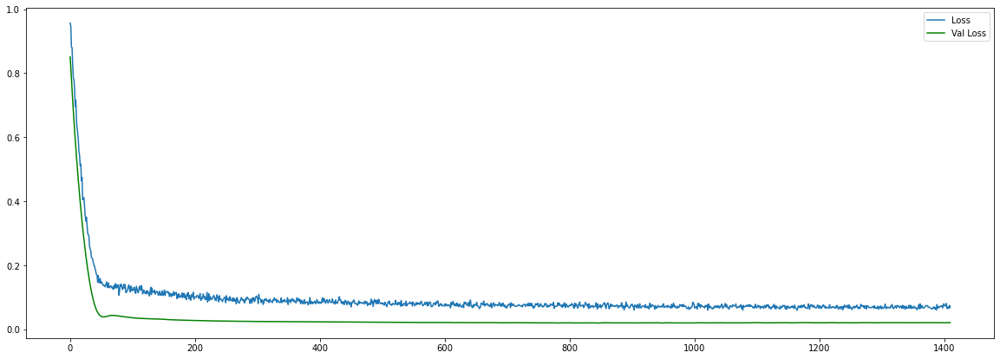

final loss: 0.06881669163703918
final val_loss: 0.020705195143818855


In [ ]:
build_and_train_all_model(PNJ_data_processor, PNJ_predictor)

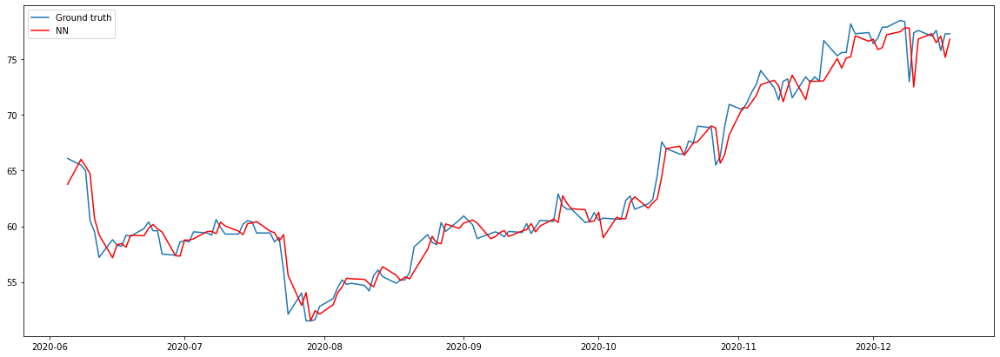

Simple NN
MSE:  1.8830829858779907
MAE:  0.9665459


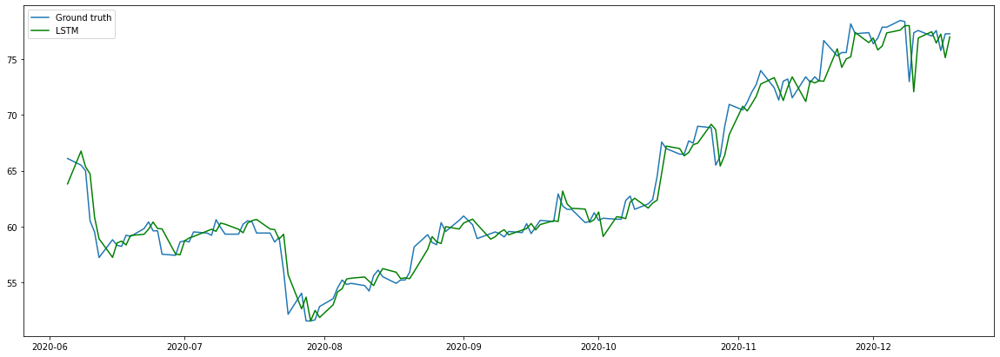

Simple LSTM
MSE:  1.9377895593643188
MAE:  0.9959788


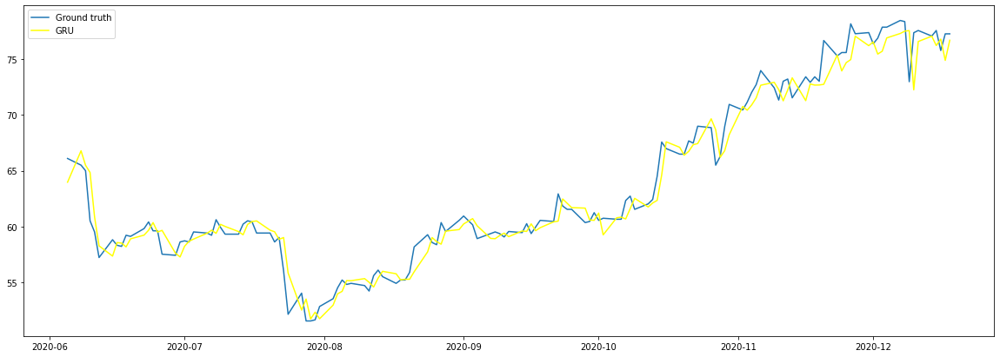

Simple GRU
MSE:  1.9502246379852295
MAE:  1.0071187


In [ ]:
evaluate_all_model(PNJ_data_processor, PNJ_predictor)

### VIC

In [ ]:
VIC_data_processor = DataProcessor('VIC', VIC, '1D')
VIC_predictor = StockPredictor(VIC_data_processor.stock_name, VIC_data_processor.timeDelta)

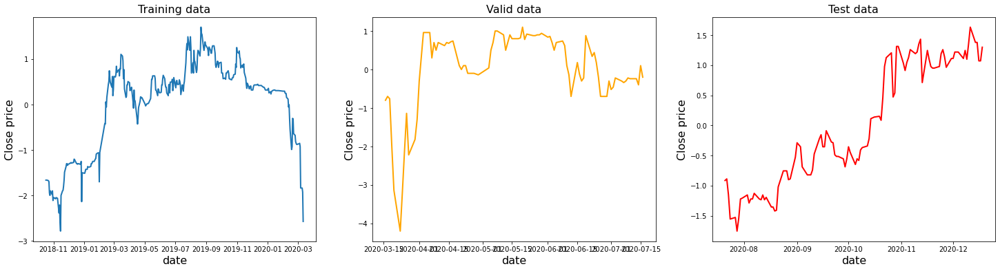

In [ ]:
VIC_data_processor.visualize_train_val_test_df()

Get best hyperparameter for simple NN


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


INFO:tensorflow:Oracle triggered exit
Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 1, 5)]            0         
_________________________________________________________________
flatten (Flatten)            (None, 5)                 0         
_________________________________________________________________
dense (Dense)                (None, 48)                288       
_________________________________________________________________
dropout (Dropout)            (None, 48)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 49        
Total params: 337
Trainable params: 337
Non-trainable params: 0
_________________________________________________________________
Start training simple NN
Epoch 1/2500
1/1 [==============================] - ETA: 0s - loss

Epoch 00028: val_loss improved from 0.36939 to 0.35302, saving model to VIC_1D_NN.hdf5
Epoch 29/2500
1/1 [==============================] - ETA: 0s - loss: 0.2579 - mae: 0.367 - 0s 18ms/step - loss: 0.2579 - mae: 0.3670 - val_loss: 0.3381 - val_mae: 0.3917

Epoch 00029: val_loss improved from 0.35302 to 0.33811, saving model to VIC_1D_NN.hdf5
Epoch 30/2500
1/1 [==============================] - ETA: 0s - loss: 0.2403 - mae: 0.344 - 0s 18ms/step - loss: 0.2403 - mae: 0.3447 - val_loss: 0.3245 - val_mae: 0.3826

Epoch 00030: val_loss improved from 0.33811 to 0.32454, saving model to VIC_1D_NN.hdf5
Epoch 31/2500
1/1 [==============================] - ETA: 0s - loss: 0.2121 - mae: 0.329 - 0s 19ms/step - loss: 0.2121 - mae: 0.3291 - val_loss: 0.3122 - val_mae: 0.3741

Epoch 00031: val_loss improved from 0.32454 to 0.31223, saving model to VIC_1D_NN.hdf5
Epoch 32/2500
1/1 [==============================] - ETA: 0s - loss: 0.1906 - mae: 0.298 - 0s 19ms/step - loss: 0.1906 - mae: 0.2984 - val_


Epoch 00060: val_loss improved from 0.22238 to 0.22214, saving model to VIC_1D_NN.hdf5
Epoch 61/2500
1/1 [==============================] - ETA: 0s - loss: 0.1293 - mae: 0.255 - 0s 18ms/step - loss: 0.1293 - mae: 0.2559 - val_loss: 0.2219 - val_mae: 0.3058

Epoch 00061: val_loss improved from 0.22214 to 0.22193, saving model to VIC_1D_NN.hdf5
Epoch 62/2500
1/1 [==============================] - ETA: 0s - loss: 0.1062 - mae: 0.249 - 0s 18ms/step - loss: 0.1062 - mae: 0.2495 - val_loss: 0.2218 - val_mae: 0.3053

Epoch 00062: val_loss improved from 0.22193 to 0.22175, saving model to VIC_1D_NN.hdf5
Epoch 63/2500
1/1 [==============================] - ETA: 0s - loss: 0.1262 - mae: 0.266 - 0s 19ms/step - loss: 0.1262 - mae: 0.2668 - val_loss: 0.2216 - val_mae: 0.3048

Epoch 00063: val_loss improved from 0.22175 to 0.22160, saving model to VIC_1D_NN.hdf5
Epoch 64/2500
1/1 [==============================] - ETA: 0s - loss: 0.1148 - mae: 0.250 - 0s 19ms/step - loss: 0.1148 - mae: 0.2509 - val

1/1 [==============================] - ETA: 0s - loss: 0.0884 - mae: 0.219 - 0s 19ms/step - loss: 0.0884 - mae: 0.2198 - val_loss: 0.2210 - val_mae: 0.2949

Epoch 00095: val_loss improved from 0.22105 to 0.22099, saving model to VIC_1D_NN.hdf5
Epoch 96/2500
1/1 [==============================] - ETA: 0s - loss: 0.0968 - mae: 0.229 - 0s 19ms/step - loss: 0.0968 - mae: 0.2293 - val_loss: 0.2209 - val_mae: 0.2948

Epoch 00096: val_loss improved from 0.22099 to 0.22093, saving model to VIC_1D_NN.hdf5
Epoch 97/2500
1/1 [==============================] - ETA: 0s - loss: 0.1019 - mae: 0.238 - 0s 19ms/step - loss: 0.1019 - mae: 0.2388 - val_loss: 0.2209 - val_mae: 0.2947

Epoch 00097: val_loss improved from 0.22093 to 0.22085, saving model to VIC_1D_NN.hdf5
Epoch 98/2500
1/1 [==============================] - ETA: 0s - loss: 0.1167 - mae: 0.241 - 0s 18ms/step - loss: 0.1167 - mae: 0.2415 - val_loss: 0.2208 - val_mae: 0.2946

Epoch 00098: val_loss improved from 0.22085 to 0.22077, saving model 

Epoch 00126: val_loss improved from 0.21830 to 0.21820, saving model to VIC_1D_NN.hdf5
Epoch 127/2500
1/1 [==============================] - ETA: 0s - loss: 0.1082 - mae: 0.237 - 0s 19ms/step - loss: 0.1082 - mae: 0.2376 - val_loss: 0.2181 - val_mae: 0.2940

Epoch 00127: val_loss improved from 0.21820 to 0.21812, saving model to VIC_1D_NN.hdf5
Epoch 128/2500
1/1 [==============================] - ETA: 0s - loss: 0.1063 - mae: 0.244 - 0s 19ms/step - loss: 0.1063 - mae: 0.2445 - val_loss: 0.2180 - val_mae: 0.2940

Epoch 00128: val_loss improved from 0.21812 to 0.21801, saving model to VIC_1D_NN.hdf5
Epoch 129/2500
1/1 [==============================] - ETA: 0s - loss: 0.0988 - mae: 0.233 - 0s 19ms/step - loss: 0.0988 - mae: 0.2335 - val_loss: 0.2179 - val_mae: 0.2941

Epoch 00129: val_loss improved from 0.21801 to 0.21790, saving model to VIC_1D_NN.hdf5
Epoch 130/2500
1/1 [==============================] - ETA: 0s - loss: 0.0968 - mae: 0.228 - 0s 20ms/step - loss: 0.0968 - mae: 0.2286 - 


Epoch 00158: val_loss improved from 0.21623 to 0.21614, saving model to VIC_1D_NN.hdf5
Epoch 159/2500
1/1 [==============================] - ETA: 0s - loss: 0.0814 - mae: 0.212 - 0s 18ms/step - loss: 0.0814 - mae: 0.2121 - val_loss: 0.2161 - val_mae: 0.2925

Epoch 00159: val_loss improved from 0.21614 to 0.21606, saving model to VIC_1D_NN.hdf5
Epoch 160/2500
1/1 [==============================] - ETA: 0s - loss: 0.0918 - mae: 0.220 - 0s 18ms/step - loss: 0.0918 - mae: 0.2208 - val_loss: 0.2160 - val_mae: 0.2924

Epoch 00160: val_loss improved from 0.21606 to 0.21598, saving model to VIC_1D_NN.hdf5
Epoch 161/2500
1/1 [==============================] - ETA: 0s - loss: 0.0887 - mae: 0.220 - 0s 19ms/step - loss: 0.0887 - mae: 0.2209 - val_loss: 0.2159 - val_mae: 0.2923

Epoch 00161: val_loss improved from 0.21598 to 0.21591, saving model to VIC_1D_NN.hdf5
Epoch 162/2500
1/1 [==============================] - ETA: 0s - loss: 0.0980 - mae: 0.234 - 0s 19ms/step - loss: 0.0980 - mae: 0.2347 -


Epoch 00190: val_loss improved from 0.21454 to 0.21448, saving model to VIC_1D_NN.hdf5
Epoch 191/2500
1/1 [==============================] - ETA: 0s - loss: 0.0911 - mae: 0.223 - 0s 19ms/step - loss: 0.0911 - mae: 0.2235 - val_loss: 0.2144 - val_mae: 0.2916

Epoch 00191: val_loss improved from 0.21448 to 0.21440, saving model to VIC_1D_NN.hdf5
Epoch 192/2500
1/1 [==============================] - ETA: 0s - loss: 0.0698 - mae: 0.197 - 0s 18ms/step - loss: 0.0698 - mae: 0.1977 - val_loss: 0.2143 - val_mae: 0.2916

Epoch 00192: val_loss improved from 0.21440 to 0.21432, saving model to VIC_1D_NN.hdf5
Epoch 193/2500
1/1 [==============================] - ETA: 0s - loss: 0.0986 - mae: 0.228 - 0s 18ms/step - loss: 0.0986 - mae: 0.2284 - val_loss: 0.2142 - val_mae: 0.2916

Epoch 00193: val_loss improved from 0.21432 to 0.21422, saving model to VIC_1D_NN.hdf5
Epoch 194/2500
1/1 [==============================] - ETA: 0s - loss: 0.0929 - mae: 0.220 - 0s 18ms/step - loss: 0.0929 - mae: 0.2204 -

1/1 [==============================] - ETA: 0s - loss: 0.0805 - mae: 0.210 - 0s 18ms/step - loss: 0.0805 - mae: 0.2102 - val_loss: 0.2128 - val_mae: 0.2923

Epoch 00223: val_loss improved from 0.21280 to 0.21279, saving model to VIC_1D_NN.hdf5
Epoch 224/2500
1/1 [==============================] - ETA: 0s - loss: 0.0933 - mae: 0.225 - 0s 17ms/step - loss: 0.0933 - mae: 0.2256 - val_loss: 0.2128 - val_mae: 0.2921

Epoch 00224: val_loss improved from 0.21279 to 0.21275, saving model to VIC_1D_NN.hdf5
Epoch 225/2500
1/1 [==============================] - ETA: 0s - loss: 0.0792 - mae: 0.212 - 0s 19ms/step - loss: 0.0792 - mae: 0.2121 - val_loss: 0.2127 - val_mae: 0.2918

Epoch 00225: val_loss improved from 0.21275 to 0.21273, saving model to VIC_1D_NN.hdf5
Epoch 226/2500
1/1 [==============================] - ETA: 0s - loss: 0.0956 - mae: 0.223 - 0s 18ms/step - loss: 0.0956 - mae: 0.2231 - val_loss: 0.2127 - val_mae: 0.2916

Epoch 00226: val_loss improved from 0.21273 to 0.21267, saving mod

Epoch 00254: val_loss improved from 0.21075 to 0.21074, saving model to VIC_1D_NN.hdf5
Epoch 255/2500
1/1 [==============================] - ETA: 0s - loss: 0.0851 - mae: 0.216 - 0s 17ms/step - loss: 0.0851 - mae: 0.2161 - val_loss: 0.2107 - val_mae: 0.2913

Epoch 00255: val_loss improved from 0.21074 to 0.21073, saving model to VIC_1D_NN.hdf5
Epoch 256/2500
1/1 [==============================] - ETA: 0s - loss: 0.0996 - mae: 0.235 - 0s 19ms/step - loss: 0.0996 - mae: 0.2359 - val_loss: 0.2107 - val_mae: 0.2915

Epoch 00256: val_loss improved from 0.21073 to 0.21073, saving model to VIC_1D_NN.hdf5
Epoch 257/2500
1/1 [==============================] - ETA: 0s - loss: 0.0912 - mae: 0.223 - 0s 19ms/step - loss: 0.0912 - mae: 0.2238 - val_loss: 0.2107 - val_mae: 0.2917

Epoch 00257: val_loss improved from 0.21073 to 0.21071, saving model to VIC_1D_NN.hdf5
Epoch 258/2500
1/1 [==============================] - ETA: 0s - loss: 0.0768 - mae: 0.208 - 0s 18ms/step - loss: 0.0768 - mae: 0.2089 - 


Epoch 00286: val_loss improved from 0.20921 to 0.20920, saving model to VIC_1D_NN.hdf5
Epoch 287/2500
1/1 [==============================] - ETA: 0s - loss: 0.0845 - mae: 0.212 - 0s 20ms/step - loss: 0.0845 - mae: 0.2120 - val_loss: 0.2092 - val_mae: 0.2897

Epoch 00287: val_loss did not improve from 0.20920
Epoch 288/2500
1/1 [==============================] - ETA: 0s - loss: 0.0875 - mae: 0.216 - 0s 18ms/step - loss: 0.0875 - mae: 0.2164 - val_loss: 0.2092 - val_mae: 0.2898

Epoch 00288: val_loss improved from 0.20920 to 0.20919, saving model to VIC_1D_NN.hdf5
Epoch 289/2500
1/1 [==============================] - ETA: 0s - loss: 0.0864 - mae: 0.215 - 0s 19ms/step - loss: 0.0864 - mae: 0.2151 - val_loss: 0.2092 - val_mae: 0.2900

Epoch 00289: val_loss improved from 0.20919 to 0.20918, saving model to VIC_1D_NN.hdf5
Epoch 290/2500
1/1 [==============================] - ETA: 0s - loss: 0.1022 - mae: 0.229 - 0s 18ms/step - loss: 0.1022 - mae: 0.2298 - val_loss: 0.2092 - val_mae: 0.2902


Epoch 00318: val_loss improved from 0.20806 to 0.20803, saving model to VIC_1D_NN.hdf5
Epoch 319/2500
1/1 [==============================] - ETA: 0s - loss: 0.0702 - mae: 0.195 - 0s 19ms/step - loss: 0.0702 - mae: 0.1952 - val_loss: 0.2080 - val_mae: 0.2894

Epoch 00319: val_loss improved from 0.20803 to 0.20801, saving model to VIC_1D_NN.hdf5
Epoch 320/2500
1/1 [==============================] - ETA: 0s - loss: 0.0912 - mae: 0.218 - 0s 18ms/step - loss: 0.0912 - mae: 0.2184 - val_loss: 0.2080 - val_mae: 0.2893

Epoch 00320: val_loss improved from 0.20801 to 0.20799, saving model to VIC_1D_NN.hdf5
Epoch 321/2500
1/1 [==============================] - ETA: 0s - loss: 0.0788 - mae: 0.200 - 0s 19ms/step - loss: 0.0788 - mae: 0.2006 - val_loss: 0.2080 - val_mae: 0.2891

Epoch 00321: val_loss improved from 0.20799 to 0.20796, saving model to VIC_1D_NN.hdf5
Epoch 322/2500
1/1 [==============================] - ETA: 0s - loss: 0.0724 - mae: 0.204 - 0s 19ms/step - loss: 0.0724 - mae: 0.2045 - 

Epoch 00350: val_loss improved from 0.20713 to 0.20711, saving model to VIC_1D_NN.hdf5
Epoch 351/2500
1/1 [==============================] - ETA: 0s - loss: 0.0662 - mae: 0.189 - 0s 18ms/step - loss: 0.0662 - mae: 0.1898 - val_loss: 0.2071 - val_mae: 0.2891

Epoch 00351: val_loss improved from 0.20711 to 0.20709, saving model to VIC_1D_NN.hdf5
Epoch 352/2500
1/1 [==============================] - ETA: 0s - loss: 0.0896 - mae: 0.218 - 0s 19ms/step - loss: 0.0896 - mae: 0.2182 - val_loss: 0.2071 - val_mae: 0.2890

Epoch 00352: val_loss improved from 0.20709 to 0.20705, saving model to VIC_1D_NN.hdf5
Epoch 353/2500
1/1 [==============================] - ETA: 0s - loss: 0.0757 - mae: 0.198 - 0s 18ms/step - loss: 0.0757 - mae: 0.1987 - val_loss: 0.2070 - val_mae: 0.2889

Epoch 00353: val_loss improved from 0.20705 to 0.20702, saving model to VIC_1D_NN.hdf5
Epoch 354/2500
1/1 [==============================] - ETA: 0s - loss: 0.0678 - mae: 0.192 - 0s 18ms/step - loss: 0.0678 - mae: 0.1926 - 


Epoch 00382: val_loss improved from 0.20601 to 0.20600, saving model to VIC_1D_NN.hdf5
Epoch 383/2500
1/1 [==============================] - ETA: 0s - loss: 0.0704 - mae: 0.193 - 0s 18ms/step - loss: 0.0704 - mae: 0.1935 - val_loss: 0.2060 - val_mae: 0.2893

Epoch 00383: val_loss improved from 0.20600 to 0.20599, saving model to VIC_1D_NN.hdf5
Epoch 384/2500
1/1 [==============================] - ETA: 0s - loss: 0.0603 - mae: 0.187 - 0s 18ms/step - loss: 0.0603 - mae: 0.1873 - val_loss: 0.2060 - val_mae: 0.2894

Epoch 00384: val_loss improved from 0.20599 to 0.20598, saving model to VIC_1D_NN.hdf5
Epoch 385/2500
1/1 [==============================] - ETA: 0s - loss: 0.0741 - mae: 0.199 - 0s 17ms/step - loss: 0.0741 - mae: 0.1994 - val_loss: 0.2060 - val_mae: 0.2895

Epoch 00385: val_loss improved from 0.20598 to 0.20595, saving model to VIC_1D_NN.hdf5
Epoch 386/2500
1/1 [==============================] - ETA: 0s - loss: 0.0669 - mae: 0.195 - 0s 18ms/step - loss: 0.0669 - mae: 0.1953 -


Epoch 00416: val_loss improved from 0.20527 to 0.20522, saving model to VIC_1D_NN.hdf5
Epoch 417/2500
1/1 [==============================] - ETA: 0s - loss: 0.0754 - mae: 0.200 - 0s 18ms/step - loss: 0.0754 - mae: 0.2001 - val_loss: 0.2052 - val_mae: 0.2884

Epoch 00417: val_loss improved from 0.20522 to 0.20518, saving model to VIC_1D_NN.hdf5
Epoch 418/2500
1/1 [==============================] - ETA: 0s - loss: 0.0720 - mae: 0.191 - 0s 18ms/step - loss: 0.0720 - mae: 0.1910 - val_loss: 0.2052 - val_mae: 0.2885

Epoch 00418: val_loss improved from 0.20518 to 0.20516, saving model to VIC_1D_NN.hdf5
Epoch 419/2500
1/1 [==============================] - ETA: 0s - loss: 0.0781 - mae: 0.209 - 0s 18ms/step - loss: 0.0781 - mae: 0.2094 - val_loss: 0.2051 - val_mae: 0.2887

Epoch 00419: val_loss improved from 0.20516 to 0.20515, saving model to VIC_1D_NN.hdf5
Epoch 420/2500
1/1 [==============================] - ETA: 0s - loss: 0.0685 - mae: 0.192 - 0s 18ms/step - loss: 0.0685 - mae: 0.1923 -


Epoch 00451: val_loss improved from 0.20504 to 0.20501, saving model to VIC_1D_NN.hdf5
Epoch 452/2500
1/1 [==============================] - ETA: 0s - loss: 0.0646 - mae: 0.188 - 0s 19ms/step - loss: 0.0646 - mae: 0.1881 - val_loss: 0.2050 - val_mae: 0.2886

Epoch 00452: val_loss improved from 0.20501 to 0.20497, saving model to VIC_1D_NN.hdf5
Epoch 453/2500
1/1 [==============================] - ETA: 0s - loss: 0.0633 - mae: 0.186 - 0s 18ms/step - loss: 0.0633 - mae: 0.1864 - val_loss: 0.2049 - val_mae: 0.2886

Epoch 00453: val_loss improved from 0.20497 to 0.20493, saving model to VIC_1D_NN.hdf5
Epoch 454/2500
1/1 [==============================] - ETA: 0s - loss: 0.0733 - mae: 0.198 - 0s 19ms/step - loss: 0.0733 - mae: 0.1987 - val_loss: 0.2049 - val_mae: 0.2887

Epoch 00454: val_loss improved from 0.20493 to 0.20490, saving model to VIC_1D_NN.hdf5
Epoch 455/2500
1/1 [==============================] - ETA: 0s - loss: 0.0696 - mae: 0.191 - 0s 19ms/step - loss: 0.0696 - mae: 0.1918 -

1/1 [==============================] - ETA: 0s - loss: 0.0718 - mae: 0.196 - 0s 20ms/step - loss: 0.0718 - mae: 0.1962 - val_loss: 0.2043 - val_mae: 0.2892

Epoch 00484: val_loss improved from 0.20431 to 0.20429, saving model to VIC_1D_NN.hdf5
Epoch 485/2500
1/1 [==============================] - ETA: 0s - loss: 0.0589 - mae: 0.178 - 0s 18ms/step - loss: 0.0589 - mae: 0.1788 - val_loss: 0.2043 - val_mae: 0.2892

Epoch 00485: val_loss improved from 0.20429 to 0.20426, saving model to VIC_1D_NN.hdf5
Epoch 486/2500
1/1 [==============================] - ETA: 0s - loss: 0.0624 - mae: 0.185 - 0s 18ms/step - loss: 0.0624 - mae: 0.1857 - val_loss: 0.2042 - val_mae: 0.2892

Epoch 00486: val_loss improved from 0.20426 to 0.20425, saving model to VIC_1D_NN.hdf5
Epoch 487/2500
1/1 [==============================] - ETA: 0s - loss: 0.0629 - mae: 0.185 - 0s 20ms/step - loss: 0.0629 - mae: 0.1857 - val_loss: 0.2042 - val_mae: 0.2891

Epoch 00487: val_loss improved from 0.20425 to 0.20423, saving mod

1/1 [==============================] - ETA: 0s - loss: 0.0640 - mae: 0.184 - 0s 18ms/step - loss: 0.0640 - mae: 0.1845 - val_loss: 0.2045 - val_mae: 0.2894

Epoch 00519: val_loss did not improve from 0.20417
Epoch 520/2500
1/1 [==============================] - ETA: 0s - loss: 0.0703 - mae: 0.193 - 0s 18ms/step - loss: 0.0703 - mae: 0.1930 - val_loss: 0.2044 - val_mae: 0.2893

Epoch 00520: val_loss did not improve from 0.20417
Epoch 521/2500
1/1 [==============================] - ETA: 0s - loss: 0.0612 - mae: 0.179 - 0s 18ms/step - loss: 0.0612 - mae: 0.1792 - val_loss: 0.2044 - val_mae: 0.2892

Epoch 00521: val_loss did not improve from 0.20417
Epoch 522/2500
1/1 [==============================] - ETA: 0s - loss: 0.0581 - mae: 0.174 - 0s 19ms/step - loss: 0.0581 - mae: 0.1742 - val_loss: 0.2044 - val_mae: 0.2891

Epoch 00522: val_loss did not improve from 0.20417
Epoch 523/2500
1/1 [==============================] - ETA: 0s - loss: 0.0580 - mae: 0.172 - 0s 18ms/step - loss: 0.0580 - m

1/1 [==============================] - ETA: 0s - loss: 0.0616 - mae: 0.175 - 0s 20ms/step - loss: 0.0616 - mae: 0.1750 - val_loss: 0.2036 - val_mae: 0.2890

Epoch 00554: val_loss did not improve from 0.20355
Epoch 555/2500
1/1 [==============================] - ETA: 0s - loss: 0.0707 - mae: 0.192 - 0s 20ms/step - loss: 0.0707 - mae: 0.1926 - val_loss: 0.2037 - val_mae: 0.2891

Epoch 00555: val_loss did not improve from 0.20355
Epoch 556/2500
1/1 [==============================] - ETA: 0s - loss: 0.0673 - mae: 0.191 - 0s 18ms/step - loss: 0.0673 - mae: 0.1918 - val_loss: 0.2038 - val_mae: 0.2891

Epoch 00556: val_loss did not improve from 0.20355
Epoch 557/2500
1/1 [==============================] - ETA: 0s - loss: 0.0549 - mae: 0.174 - 0s 18ms/step - loss: 0.0549 - mae: 0.1741 - val_loss: 0.2039 - val_mae: 0.2893

Epoch 00557: val_loss did not improve from 0.20355
Epoch 558/2500
1/1 [==============================] - ETA: 0s - loss: 0.0619 - mae: 0.180 - 0s 19ms/step - loss: 0.0619 - m

Epoch 00590: val_loss did not improve from 0.20355
Epoch 591/2500
1/1 [==============================] - ETA: 0s - loss: 0.0594 - mae: 0.178 - 0s 19ms/step - loss: 0.0594 - mae: 0.1782 - val_loss: 0.2040 - val_mae: 0.2894

Epoch 00591: val_loss did not improve from 0.20355
Epoch 592/2500
1/1 [==============================] - ETA: 0s - loss: 0.0543 - mae: 0.172 - 0s 18ms/step - loss: 0.0543 - mae: 0.1720 - val_loss: 0.2040 - val_mae: 0.2894

Epoch 00592: val_loss did not improve from 0.20355
Epoch 593/2500
1/1 [==============================] - ETA: 0s - loss: 0.0679 - mae: 0.185 - 0s 18ms/step - loss: 0.0679 - mae: 0.1850 - val_loss: 0.2039 - val_mae: 0.2893

Epoch 00593: val_loss did not improve from 0.20355
Epoch 594/2500
1/1 [==============================] - ETA: 0s - loss: 0.0575 - mae: 0.177 - 0s 19ms/step - loss: 0.0575 - mae: 0.1778 - val_loss: 0.2039 - val_mae: 0.2893

Epoch 00594: val_loss did not improve from 0.20355
Epoch 595/2500
1/1 [==============================] - ETA


Epoch 00627: val_loss did not improve from 0.20355
Epoch 628/2500
1/1 [==============================] - ETA: 0s - loss: 0.0550 - mae: 0.170 - 0s 18ms/step - loss: 0.0550 - mae: 0.1702 - val_loss: 0.2038 - val_mae: 0.2894

Epoch 00628: val_loss did not improve from 0.20355
Epoch 629/2500
1/1 [==============================] - ETA: 0s - loss: 0.0670 - mae: 0.175 - 0s 17ms/step - loss: 0.0670 - mae: 0.1758 - val_loss: 0.2038 - val_mae: 0.2893

Epoch 00629: val_loss did not improve from 0.20355
Epoch 630/2500
1/1 [==============================] - ETA: 0s - loss: 0.0487 - mae: 0.164 - 0s 19ms/step - loss: 0.0487 - mae: 0.1648 - val_loss: 0.2038 - val_mae: 0.2893

Epoch 00630: val_loss did not improve from 0.20355
Epoch 631/2500
1/1 [==============================] - ETA: 0s - loss: 0.0544 - mae: 0.167 - 0s 18ms/step - loss: 0.0544 - mae: 0.1674 - val_loss: 0.2038 - val_mae: 0.2893

Epoch 00631: val_loss did not improve from 0.20355
Epoch 632/2500
1/1 [==============================] - ET


Epoch 00664: val_loss did not improve from 0.20355
Epoch 665/2500
1/1 [==============================] - ETA: 0s - loss: 0.0563 - mae: 0.164 - 0s 18ms/step - loss: 0.0563 - mae: 0.1642 - val_loss: 0.2045 - val_mae: 0.2902

Epoch 00665: val_loss did not improve from 0.20355
Epoch 666/2500
1/1 [==============================] - ETA: 0s - loss: 0.0557 - mae: 0.172 - 0s 18ms/step - loss: 0.0557 - mae: 0.1722 - val_loss: 0.2045 - val_mae: 0.2902

Epoch 00666: val_loss did not improve from 0.20355
Epoch 667/2500
1/1 [==============================] - ETA: 0s - loss: 0.0551 - mae: 0.168 - 0s 19ms/step - loss: 0.0551 - mae: 0.1688 - val_loss: 0.2045 - val_mae: 0.2901

Epoch 00667: val_loss did not improve from 0.20355
Epoch 668/2500
1/1 [==============================] - ETA: 0s - loss: 0.0548 - mae: 0.162 - 0s 19ms/step - loss: 0.0548 - mae: 0.1621 - val_loss: 0.2045 - val_mae: 0.2900

Epoch 00668: val_loss did not improve from 0.20355
Epoch 669/2500
1/1 [==============================] - ET


Epoch 00701: val_loss did not improve from 0.20355
Epoch 702/2500
1/1 [==============================] - ETA: 0s - loss: 0.0618 - mae: 0.175 - 0s 18ms/step - loss: 0.0618 - mae: 0.1755 - val_loss: 0.2046 - val_mae: 0.2910

Epoch 00702: val_loss did not improve from 0.20355
Epoch 703/2500
1/1 [==============================] - ETA: 0s - loss: 0.0494 - mae: 0.162 - 0s 18ms/step - loss: 0.0494 - mae: 0.1622 - val_loss: 0.2046 - val_mae: 0.2912

Epoch 00703: val_loss did not improve from 0.20355
Epoch 704/2500
1/1 [==============================] - ETA: 0s - loss: 0.0577 - mae: 0.172 - 0s 17ms/step - loss: 0.0577 - mae: 0.1723 - val_loss: 0.2048 - val_mae: 0.2914

Epoch 00704: val_loss did not improve from 0.20355
Epoch 705/2500
1/1 [==============================] - ETA: 0s - loss: 0.0552 - mae: 0.164 - 0s 18ms/step - loss: 0.0552 - mae: 0.1646 - val_loss: 0.2049 - val_mae: 0.2917

Epoch 00705: val_loss did not improve from 0.20355
Epoch 706/2500
1/1 [==============================] - ET


Epoch 00738: val_loss did not improve from 0.20355
Epoch 739/2500
1/1 [==============================] - ETA: 0s - loss: 0.0512 - mae: 0.160 - 0s 19ms/step - loss: 0.0512 - mae: 0.1604 - val_loss: 0.2045 - val_mae: 0.2911

Epoch 00739: val_loss did not improve from 0.20355
Epoch 740/2500
1/1 [==============================] - ETA: 0s - loss: 0.0478 - mae: 0.156 - 0s 18ms/step - loss: 0.0478 - mae: 0.1563 - val_loss: 0.2044 - val_mae: 0.2911

Epoch 00740: val_loss did not improve from 0.20355
Epoch 741/2500
1/1 [==============================] - ETA: 0s - loss: 0.0452 - mae: 0.147 - 0s 19ms/step - loss: 0.0452 - mae: 0.1479 - val_loss: 0.2043 - val_mae: 0.2911

Epoch 00741: val_loss did not improve from 0.20355
Epoch 742/2500
1/1 [==============================] - ETA: 0s - loss: 0.0558 - mae: 0.165 - 0s 19ms/step - loss: 0.0558 - mae: 0.1655 - val_loss: 0.2043 - val_mae: 0.2911

Epoch 00742: val_loss did not improve from 0.20355
Epoch 743/2500
1/1 [==============================] - ET


Epoch 00775: val_loss did not improve from 0.20355
Epoch 776/2500
1/1 [==============================] - ETA: 0s - loss: 0.0516 - mae: 0.160 - 0s 18ms/step - loss: 0.0516 - mae: 0.1605 - val_loss: 0.2047 - val_mae: 0.2917

Epoch 00776: val_loss did not improve from 0.20355
Epoch 777/2500
1/1 [==============================] - ETA: 0s - loss: 0.0501 - mae: 0.159 - 0s 18ms/step - loss: 0.0501 - mae: 0.1591 - val_loss: 0.2047 - val_mae: 0.2917

Epoch 00777: val_loss did not improve from 0.20355
Epoch 778/2500
1/1 [==============================] - ETA: 0s - loss: 0.0442 - mae: 0.154 - 0s 18ms/step - loss: 0.0442 - mae: 0.1549 - val_loss: 0.2047 - val_mae: 0.2917

Epoch 00778: val_loss did not improve from 0.20355
Epoch 779/2500
1/1 [==============================] - ETA: 0s - loss: 0.0496 - mae: 0.156 - 0s 17ms/step - loss: 0.0496 - mae: 0.1567 - val_loss: 0.2048 - val_mae: 0.2917

Epoch 00779: val_loss did not improve from 0.20355
Epoch 780/2500
1/1 [==============================] - ET

1/1 [==============================] - ETA: 0s - loss: 0.0442 - mae: 0.154 - 0s 19ms/step - loss: 0.0442 - mae: 0.1547 - val_loss: 0.2050 - val_mae: 0.2929

Epoch 00812: val_loss did not improve from 0.20355
Epoch 813/2500
1/1 [==============================] - ETA: 0s - loss: 0.0499 - mae: 0.158 - 0s 19ms/step - loss: 0.0499 - mae: 0.1582 - val_loss: 0.2050 - val_mae: 0.2929

Epoch 00813: val_loss did not improve from 0.20355
Epoch 814/2500
1/1 [==============================] - ETA: 0s - loss: 0.0493 - mae: 0.155 - 0s 18ms/step - loss: 0.0493 - mae: 0.1553 - val_loss: 0.2050 - val_mae: 0.2930

Epoch 00814: val_loss did not improve from 0.20355
Epoch 815/2500
1/1 [==============================] - ETA: 0s - loss: 0.0442 - mae: 0.149 - 0s 19ms/step - loss: 0.0442 - mae: 0.1495 - val_loss: 0.2050 - val_mae: 0.2930

Epoch 00815: val_loss did not improve from 0.20355
Epoch 816/2500
1/1 [==============================] - ETA: 0s - loss: 0.0438 - mae: 0.147 - 0s 19ms/step - loss: 0.0438 - m

Epoch 00848: val_loss did not improve from 0.20355
Epoch 849/2500
1/1 [==============================] - ETA: 0s - loss: 0.0434 - mae: 0.149 - 0s 19ms/step - loss: 0.0434 - mae: 0.1493 - val_loss: 0.2050 - val_mae: 0.2928

Epoch 00849: val_loss did not improve from 0.20355
Epoch 850/2500
1/1 [==============================] - ETA: 0s - loss: 0.0518 - mae: 0.160 - 0s 18ms/step - loss: 0.0518 - mae: 0.1603 - val_loss: 0.2050 - val_mae: 0.2928

Epoch 00850: val_loss did not improve from 0.20355
Epoch 851/2500
1/1 [==============================] - ETA: 0s - loss: 0.0449 - mae: 0.155 - 0s 19ms/step - loss: 0.0449 - mae: 0.1557 - val_loss: 0.2050 - val_mae: 0.2928

Epoch 00851: val_loss did not improve from 0.20355
Epoch 852/2500
1/1 [==============================] - ETA: 0s - loss: 0.0492 - mae: 0.160 - 0s 18ms/step - loss: 0.0492 - mae: 0.1606 - val_loss: 0.2050 - val_mae: 0.2928

Epoch 00852: val_loss did not improve from 0.20355
Epoch 853/2500
1/1 [==============================] - ETA


Epoch 00885: val_loss did not improve from 0.20355
Epoch 886/2500
1/1 [==============================] - ETA: 0s - loss: 0.0449 - mae: 0.152 - 0s 20ms/step - loss: 0.0449 - mae: 0.1527 - val_loss: 0.2050 - val_mae: 0.2932

Epoch 00886: val_loss did not improve from 0.20355
Epoch 887/2500
1/1 [==============================] - ETA: 0s - loss: 0.0453 - mae: 0.151 - 0s 18ms/step - loss: 0.0453 - mae: 0.1510 - val_loss: 0.2050 - val_mae: 0.2932

Epoch 00887: val_loss did not improve from 0.20355
Epoch 888/2500
1/1 [==============================] - ETA: 0s - loss: 0.0486 - mae: 0.153 - 0s 18ms/step - loss: 0.0486 - mae: 0.1536 - val_loss: 0.2051 - val_mae: 0.2932

Epoch 00888: val_loss did not improve from 0.20355
Epoch 889/2500
1/1 [==============================] - ETA: 0s - loss: 0.0472 - mae: 0.154 - 0s 19ms/step - loss: 0.0472 - mae: 0.1545 - val_loss: 0.2051 - val_mae: 0.2933

Epoch 00889: val_loss did not improve from 0.20355
Epoch 890/2500
1/1 [==============================] - ET


Epoch 00922: val_loss did not improve from 0.20355
Epoch 923/2500
1/1 [==============================] - ETA: 0s - loss: 0.0454 - mae: 0.152 - 0s 18ms/step - loss: 0.0454 - mae: 0.1521 - val_loss: 0.2057 - val_mae: 0.2940

Epoch 00923: val_loss did not improve from 0.20355
Epoch 924/2500
1/1 [==============================] - ETA: 0s - loss: 0.0490 - mae: 0.156 - 0s 18ms/step - loss: 0.0490 - mae: 0.1566 - val_loss: 0.2057 - val_mae: 0.2940

Epoch 00924: val_loss did not improve from 0.20355
Epoch 925/2500
1/1 [==============================] - ETA: 0s - loss: 0.0451 - mae: 0.152 - 0s 18ms/step - loss: 0.0451 - mae: 0.1529 - val_loss: 0.2057 - val_mae: 0.2940

Epoch 00925: val_loss did not improve from 0.20355
Epoch 926/2500
1/1 [==============================] - ETA: 0s - loss: 0.0446 - mae: 0.150 - 0s 19ms/step - loss: 0.0446 - mae: 0.1501 - val_loss: 0.2057 - val_mae: 0.2941

Epoch 00926: val_loss did not improve from 0.20355
Epoch 927/2500
1/1 [==============================] - ET


Epoch 00959: val_loss did not improve from 0.20355
Epoch 960/2500
1/1 [==============================] - ETA: 0s - loss: 0.0443 - mae: 0.153 - 0s 21ms/step - loss: 0.0443 - mae: 0.1538 - val_loss: 0.2053 - val_mae: 0.2940

Epoch 00960: val_loss did not improve from 0.20355
Epoch 961/2500
1/1 [==============================] - ETA: 0s - loss: 0.0428 - mae: 0.149 - 0s 18ms/step - loss: 0.0428 - mae: 0.1492 - val_loss: 0.2053 - val_mae: 0.2941

Epoch 00961: val_loss did not improve from 0.20355
Epoch 962/2500
1/1 [==============================] - ETA: 0s - loss: 0.0502 - mae: 0.152 - 0s 19ms/step - loss: 0.0502 - mae: 0.1528 - val_loss: 0.2054 - val_mae: 0.2941

Epoch 00962: val_loss did not improve from 0.20355
Epoch 963/2500
1/1 [==============================] - ETA: 0s - loss: 0.0503 - mae: 0.152 - 0s 21ms/step - loss: 0.0503 - mae: 0.1525 - val_loss: 0.2054 - val_mae: 0.2942

Epoch 00963: val_loss did not improve from 0.20355
Epoch 964/2500
1/1 [==============================] - ET


Epoch 00996: val_loss did not improve from 0.20355
Epoch 997/2500
1/1 [==============================] - ETA: 0s - loss: 0.0465 - mae: 0.154 - 0s 18ms/step - loss: 0.0465 - mae: 0.1540 - val_loss: 0.2053 - val_mae: 0.2940

Epoch 00997: val_loss did not improve from 0.20355
Epoch 998/2500
1/1 [==============================] - ETA: 0s - loss: 0.0452 - mae: 0.149 - 0s 18ms/step - loss: 0.0452 - mae: 0.1497 - val_loss: 0.2053 - val_mae: 0.2940

Epoch 00998: val_loss did not improve from 0.20355
Epoch 999/2500
1/1 [==============================] - ETA: 0s - loss: 0.0441 - mae: 0.149 - 0s 18ms/step - loss: 0.0441 - mae: 0.1492 - val_loss: 0.2053 - val_mae: 0.2940

Epoch 00999: val_loss did not improve from 0.20355
Epoch 1000/2500
1/1 [==============================] - ETA: 0s - loss: 0.0490 - mae: 0.146 - 0s 17ms/step - loss: 0.0490 - mae: 0.1462 - val_loss: 0.2053 - val_mae: 0.2940

Epoch 01000: val_loss did not improve from 0.20355
Epoch 1001/2500
1/1 [==============================] - 

1/1 [==============================] - ETA: 0s - loss: 0.0493 - mae: 0.157 - 0s 19ms/step - loss: 0.0493 - mae: 0.1570 - val_loss: 0.2052 - val_mae: 0.2940

Epoch 01033: val_loss did not improve from 0.20355
Epoch 1034/2500
1/1 [==============================] - ETA: 0s - loss: 0.0464 - mae: 0.152 - 0s 19ms/step - loss: 0.0464 - mae: 0.1525 - val_loss: 0.2052 - val_mae: 0.2940

Epoch 01034: val_loss did not improve from 0.20355
Epoch 1035/2500
1/1 [==============================] - ETA: 0s - loss: 0.0453 - mae: 0.153 - 0s 20ms/step - loss: 0.0453 - mae: 0.1531 - val_loss: 0.2052 - val_mae: 0.2940

Epoch 01035: val_loss did not improve from 0.20355
Epoch 1036/2500
1/1 [==============================] - ETA: 0s - loss: 0.0407 - mae: 0.141 - 0s 21ms/step - loss: 0.0407 - mae: 0.1416 - val_loss: 0.2052 - val_mae: 0.2940

Epoch 01036: val_loss did not improve from 0.20355
Epoch 1037/2500
1/1 [==============================] - ETA: 0s - loss: 0.0471 - mae: 0.154 - 0s 25ms/step - loss: 0.0471

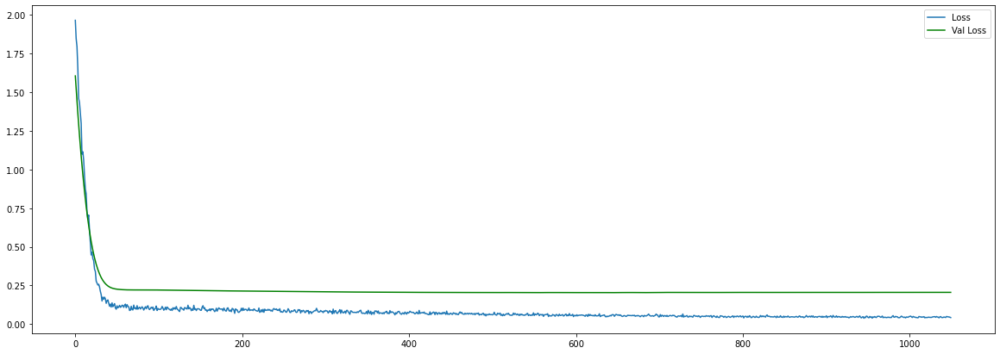

final loss: 0.04234706237912178
final val_loss: 0.20546458661556244
Get best hyperparameter for simple LSTM


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


INFO:tensorflow:Oracle triggered exit
Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 1, 5)]            0         
_________________________________________________________________
lstm (LSTM)                  (None, 1, 128)            68608     
_________________________________________________________________
lstm_1 (LSTM)                (None, 1, 128)            131584    
_________________________________________________________________
lstm_2 (LSTM)                (None, 128)               131584    
_________________________________________________________________
dense (Dense)                (None, 56)                7224      
_________________________________________________________________
dense_1 (Dense)              (None, 56)                3192      
_________________________________________________________________
dense_2 (Dense)        


Epoch 00028: val_loss did not improve from 0.24660
Epoch 29/2500
1/1 [==============================] - ETA: 0s - loss: 0.0955 - mae: 0.239 - 0s 38ms/step - loss: 0.0955 - mae: 0.2391 - val_loss: 0.2663 - val_mae: 0.3528

Epoch 00029: val_loss did not improve from 0.24660
Epoch 30/2500
1/1 [==============================] - ETA: 0s - loss: 0.0905 - mae: 0.230 - 0s 38ms/step - loss: 0.0905 - mae: 0.2306 - val_loss: 0.2592 - val_mae: 0.3449

Epoch 00030: val_loss did not improve from 0.24660
Epoch 31/2500
1/1 [==============================] - ETA: 0s - loss: 0.0795 - mae: 0.212 - 0s 38ms/step - loss: 0.0795 - mae: 0.2127 - val_loss: 0.2502 - val_mae: 0.3356

Epoch 00031: val_loss did not improve from 0.24660
Epoch 32/2500
1/1 [==============================] - ETA: 0s - loss: 0.0651 - mae: 0.188 - 0s 37ms/step - loss: 0.0651 - mae: 0.1887 - val_loss: 0.2419 - val_mae: 0.3259

Epoch 00032: val_loss improved from 0.24660 to 0.24186, saving model to VIC_1D_LSTM.hdf5
Epoch 33/2500
1/1 [===


Epoch 00064: val_loss improved from 0.23423 to 0.23373, saving model to VIC_1D_LSTM.hdf5
Epoch 65/2500
1/1 [==============================] - ETA: 0s - loss: 0.0330 - mae: 0.115 - 0s 39ms/step - loss: 0.0330 - mae: 0.1156 - val_loss: 0.2335 - val_mae: 0.3087

Epoch 00065: val_loss improved from 0.23373 to 0.23349, saving model to VIC_1D_LSTM.hdf5
Epoch 66/2500
1/1 [==============================] - ETA: 0s - loss: 0.0334 - mae: 0.116 - 0s 39ms/step - loss: 0.0334 - mae: 0.1162 - val_loss: 0.2333 - val_mae: 0.3088

Epoch 00066: val_loss improved from 0.23349 to 0.23332, saving model to VIC_1D_LSTM.hdf5
Epoch 67/2500
1/1 [==============================] - ETA: 0s - loss: 0.0336 - mae: 0.116 - 0s 39ms/step - loss: 0.0336 - mae: 0.1166 - val_loss: 0.2332 - val_mae: 0.3087

Epoch 00067: val_loss improved from 0.23332 to 0.23320, saving model to VIC_1D_LSTM.hdf5
Epoch 68/2500
1/1 [==============================] - ETA: 0s - loss: 0.0334 - mae: 0.116 - 0s 37ms/step - loss: 0.0334 - mae: 0.11


Epoch 00099: val_loss improved from 0.23121 to 0.23108, saving model to VIC_1D_LSTM.hdf5
Epoch 100/2500
1/1 [==============================] - ETA: 0s - loss: 0.0318 - mae: 0.114 - 0s 38ms/step - loss: 0.0318 - mae: 0.1149 - val_loss: 0.2310 - val_mae: 0.3064

Epoch 00100: val_loss improved from 0.23108 to 0.23101, saving model to VIC_1D_LSTM.hdf5
Epoch 101/2500
1/1 [==============================] - ETA: 0s - loss: 0.0318 - mae: 0.114 - 0s 46ms/step - loss: 0.0318 - mae: 0.1149 - val_loss: 0.2310 - val_mae: 0.3063

Epoch 00101: val_loss improved from 0.23101 to 0.23100, saving model to VIC_1D_LSTM.hdf5
Epoch 102/2500
1/1 [==============================] - ETA: 0s - loss: 0.0318 - mae: 0.115 - 0s 48ms/step - loss: 0.0318 - mae: 0.1150 - val_loss: 0.2310 - val_mae: 0.3062

Epoch 00102: val_loss did not improve from 0.23100
Epoch 103/2500
1/1 [==============================] - ETA: 0s - loss: 0.0317 - mae: 0.115 - 0s 45ms/step - loss: 0.0317 - mae: 0.1152 - val_loss: 0.2311 - val_mae: 0

Epoch 00131: val_loss improved from 0.22783 to 0.22774, saving model to VIC_1D_LSTM.hdf5
Epoch 132/2500
1/1 [==============================] - ETA: 0s - loss: 0.0313 - mae: 0.114 - 0s 48ms/step - loss: 0.0313 - mae: 0.1144 - val_loss: 0.2277 - val_mae: 0.3050

Epoch 00132: val_loss improved from 0.22774 to 0.22765, saving model to VIC_1D_LSTM.hdf5
Epoch 133/2500
1/1 [==============================] - ETA: 0s - loss: 0.0313 - mae: 0.114 - 0s 43ms/step - loss: 0.0313 - mae: 0.1144 - val_loss: 0.2276 - val_mae: 0.3050

Epoch 00133: val_loss improved from 0.22765 to 0.22757, saving model to VIC_1D_LSTM.hdf5
Epoch 134/2500
1/1 [==============================] - ETA: 0s - loss: 0.0313 - mae: 0.114 - 0s 43ms/step - loss: 0.0313 - mae: 0.1144 - val_loss: 0.2275 - val_mae: 0.3050

Epoch 00134: val_loss improved from 0.22757 to 0.22748, saving model to VIC_1D_LSTM.hdf5
Epoch 135/2500
1/1 [==============================] - ETA: 0s - loss: 0.0313 - mae: 0.114 - 0s 38ms/step - loss: 0.0313 - mae: 0

Epoch 163/2500
1/1 [==============================] - ETA: 0s - loss: 0.0309 - mae: 0.113 - 0s 38ms/step - loss: 0.0309 - mae: 0.1133 - val_loss: 0.2237 - val_mae: 0.3037

Epoch 00163: val_loss improved from 0.22378 to 0.22365, saving model to VIC_1D_LSTM.hdf5
Epoch 164/2500
1/1 [==============================] - ETA: 0s - loss: 0.0309 - mae: 0.113 - 0s 38ms/step - loss: 0.0309 - mae: 0.1133 - val_loss: 0.2235 - val_mae: 0.3037

Epoch 00164: val_loss improved from 0.22365 to 0.22352, saving model to VIC_1D_LSTM.hdf5
Epoch 165/2500
1/1 [==============================] - ETA: 0s - loss: 0.0308 - mae: 0.113 - 0s 38ms/step - loss: 0.0308 - mae: 0.1132 - val_loss: 0.2234 - val_mae: 0.3036

Epoch 00165: val_loss improved from 0.22352 to 0.22338, saving model to VIC_1D_LSTM.hdf5
Epoch 166/2500
1/1 [==============================] - ETA: 0s - loss: 0.0308 - mae: 0.113 - 0s 39ms/step - loss: 0.0308 - mae: 0.1132 - val_loss: 0.2232 - val_mae: 0.3036

Epoch 00166: val_loss improved from 0.22338 t


Epoch 00194: val_loss improved from 0.21947 to 0.21933, saving model to VIC_1D_LSTM.hdf5
Epoch 195/2500
1/1 [==============================] - ETA: 0s - loss: 0.0304 - mae: 0.112 - 0s 38ms/step - loss: 0.0304 - mae: 0.1120 - val_loss: 0.2192 - val_mae: 0.3024

Epoch 00195: val_loss improved from 0.21933 to 0.21919, saving model to VIC_1D_LSTM.hdf5
Epoch 196/2500
1/1 [==============================] - ETA: 0s - loss: 0.0304 - mae: 0.112 - 0s 37ms/step - loss: 0.0304 - mae: 0.1120 - val_loss: 0.2190 - val_mae: 0.3023

Epoch 00196: val_loss improved from 0.21919 to 0.21904, saving model to VIC_1D_LSTM.hdf5
Epoch 197/2500
1/1 [==============================] - ETA: 0s - loss: 0.0304 - mae: 0.111 - 0s 40ms/step - loss: 0.0304 - mae: 0.1119 - val_loss: 0.2189 - val_mae: 0.3023

Epoch 00197: val_loss improved from 0.21904 to 0.21890, saving model to VIC_1D_LSTM.hdf5
Epoch 198/2500
1/1 [==============================] - ETA: 0s - loss: 0.0304 - mae: 0.111 - 0s 37ms/step - loss: 0.0304 - mae: 

Epoch 226/2500
1/1 [==============================] - ETA: 0s - loss: 0.0301 - mae: 0.110 - 0s 38ms/step - loss: 0.0301 - mae: 0.1109 - val_loss: 0.2149 - val_mae: 0.3013

Epoch 00226: val_loss improved from 0.21503 to 0.21489, saving model to VIC_1D_LSTM.hdf5
Epoch 227/2500
1/1 [==============================] - ETA: 0s - loss: 0.0301 - mae: 0.110 - 0s 37ms/step - loss: 0.0301 - mae: 0.1108 - val_loss: 0.2148 - val_mae: 0.3013

Epoch 00227: val_loss improved from 0.21489 to 0.21476, saving model to VIC_1D_LSTM.hdf5
Epoch 228/2500
1/1 [==============================] - ETA: 0s - loss: 0.0301 - mae: 0.110 - 0s 39ms/step - loss: 0.0301 - mae: 0.1108 - val_loss: 0.2146 - val_mae: 0.3012

Epoch 00228: val_loss improved from 0.21476 to 0.21463, saving model to VIC_1D_LSTM.hdf5
Epoch 229/2500
1/1 [==============================] - ETA: 0s - loss: 0.0300 - mae: 0.110 - 0s 39ms/step - loss: 0.0300 - mae: 0.1108 - val_loss: 0.2145 - val_mae: 0.3012

Epoch 00229: val_loss improved from 0.21463 t


Epoch 00257: val_loss improved from 0.21124 to 0.21114, saving model to VIC_1D_LSTM.hdf5
Epoch 258/2500
1/1 [==============================] - ETA: 0s - loss: 0.0298 - mae: 0.110 - 0s 38ms/step - loss: 0.0298 - mae: 0.1100 - val_loss: 0.2110 - val_mae: 0.3004

Epoch 00258: val_loss improved from 0.21114 to 0.21103, saving model to VIC_1D_LSTM.hdf5
Epoch 259/2500
1/1 [==============================] - ETA: 0s - loss: 0.0298 - mae: 0.110 - 0s 37ms/step - loss: 0.0298 - mae: 0.1100 - val_loss: 0.2109 - val_mae: 0.3003

Epoch 00259: val_loss improved from 0.21103 to 0.21093, saving model to VIC_1D_LSTM.hdf5
Epoch 260/2500
1/1 [==============================] - ETA: 0s - loss: 0.0298 - mae: 0.110 - 0s 38ms/step - loss: 0.0298 - mae: 0.1100 - val_loss: 0.2108 - val_mae: 0.3003

Epoch 00260: val_loss improved from 0.21093 to 0.21083, saving model to VIC_1D_LSTM.hdf5
Epoch 261/2500
1/1 [==============================] - ETA: 0s - loss: 0.0298 - mae: 0.109 - 0s 37ms/step - loss: 0.0298 - mae: 

Epoch 289/2500
1/1 [==============================] - ETA: 0s - loss: 0.0296 - mae: 0.109 - 0s 43ms/step - loss: 0.0296 - mae: 0.1094 - val_loss: 0.2084 - val_mae: 0.3000

Epoch 00289: val_loss improved from 0.20851 to 0.20845, saving model to VIC_1D_LSTM.hdf5
Epoch 290/2500
1/1 [==============================] - ETA: 0s - loss: 0.0296 - mae: 0.109 - 0s 38ms/step - loss: 0.0296 - mae: 0.1094 - val_loss: 0.2084 - val_mae: 0.3000

Epoch 00290: val_loss improved from 0.20845 to 0.20839, saving model to VIC_1D_LSTM.hdf5
Epoch 291/2500
1/1 [==============================] - ETA: 0s - loss: 0.0296 - mae: 0.109 - 0s 38ms/step - loss: 0.0296 - mae: 0.1094 - val_loss: 0.2083 - val_mae: 0.3000

Epoch 00291: val_loss improved from 0.20839 to 0.20833, saving model to VIC_1D_LSTM.hdf5
Epoch 292/2500
1/1 [==============================] - ETA: 0s - loss: 0.0296 - mae: 0.109 - 0s 36ms/step - loss: 0.0296 - mae: 0.1094 - val_loss: 0.2083 - val_mae: 0.3000

Epoch 00292: val_loss improved from 0.20833 t


Epoch 00320: val_loss improved from 0.20720 to 0.20718, saving model to VIC_1D_LSTM.hdf5
Epoch 321/2500
1/1 [==============================] - ETA: 0s - loss: 0.0294 - mae: 0.108 - 0s 37ms/step - loss: 0.0294 - mae: 0.1089 - val_loss: 0.2072 - val_mae: 0.3004

Epoch 00321: val_loss improved from 0.20718 to 0.20716, saving model to VIC_1D_LSTM.hdf5
Epoch 322/2500
1/1 [==============================] - ETA: 0s - loss: 0.0294 - mae: 0.108 - 0s 39ms/step - loss: 0.0294 - mae: 0.1089 - val_loss: 0.2071 - val_mae: 0.3004

Epoch 00322: val_loss improved from 0.20716 to 0.20714, saving model to VIC_1D_LSTM.hdf5
Epoch 323/2500
1/1 [==============================] - ETA: 0s - loss: 0.0294 - mae: 0.108 - 0s 39ms/step - loss: 0.0294 - mae: 0.1089 - val_loss: 0.2071 - val_mae: 0.3004

Epoch 00323: val_loss improved from 0.20714 to 0.20712, saving model to VIC_1D_LSTM.hdf5
Epoch 324/2500
1/1 [==============================] - ETA: 0s - loss: 0.0294 - mae: 0.108 - 0s 37ms/step - loss: 0.0294 - mae: 

1/1 [==============================] - ETA: 0s - loss: 0.0293 - mae: 0.108 - 0s 38ms/step - loss: 0.0293 - mae: 0.1085 - val_loss: 0.2069 - val_mae: 0.3011

Epoch 00352: val_loss did not improve from 0.20689
Epoch 353/2500
1/1 [==============================] - ETA: 0s - loss: 0.0293 - mae: 0.108 - 0s 39ms/step - loss: 0.0293 - mae: 0.1085 - val_loss: 0.2069 - val_mae: 0.3011

Epoch 00353: val_loss did not improve from 0.20689
Epoch 354/2500
1/1 [==============================] - ETA: 0s - loss: 0.0293 - mae: 0.108 - 0s 38ms/step - loss: 0.0293 - mae: 0.1085 - val_loss: 0.2069 - val_mae: 0.3011

Epoch 00354: val_loss did not improve from 0.20689
Epoch 355/2500
1/1 [==============================] - ETA: 0s - loss: 0.0293 - mae: 0.108 - 0s 37ms/step - loss: 0.0293 - mae: 0.1085 - val_loss: 0.2069 - val_mae: 0.3012

Epoch 00355: val_loss did not improve from 0.20689
Epoch 356/2500
1/1 [==============================] - ETA: 0s - loss: 0.0293 - mae: 0.108 - 0s 39ms/step - loss: 0.0293 - m

Epoch 00388: val_loss did not improve from 0.20689
Epoch 389/2500
1/1 [==============================] - ETA: 0s - loss: 0.0292 - mae: 0.108 - 0s 37ms/step - loss: 0.0292 - mae: 0.1080 - val_loss: 0.2072 - val_mae: 0.3022

Epoch 00389: val_loss did not improve from 0.20689
Epoch 390/2500
1/1 [==============================] - ETA: 0s - loss: 0.0292 - mae: 0.108 - 0s 38ms/step - loss: 0.0292 - mae: 0.1085 - val_loss: 0.2074 - val_mae: 0.3022

Epoch 00390: val_loss did not improve from 0.20689
Epoch 391/2500
1/1 [==============================] - ETA: 0s - loss: 0.0292 - mae: 0.107 - 0s 40ms/step - loss: 0.0292 - mae: 0.1078 - val_loss: 0.2072 - val_mae: 0.3022

Epoch 00391: val_loss did not improve from 0.20689
Epoch 392/2500
1/1 [==============================] - ETA: 0s - loss: 0.0292 - mae: 0.109 - 0s 37ms/step - loss: 0.0292 - mae: 0.1090 - val_loss: 0.2076 - val_mae: 0.3023

Epoch 00392: val_loss did not improve from 0.20689
Epoch 393/2500
1/1 [==============================] - ETA


Epoch 00425: val_loss did not improve from 0.20689
Epoch 426/2500
1/1 [==============================] - ETA: 0s - loss: 0.0291 - mae: 0.107 - 0s 38ms/step - loss: 0.0291 - mae: 0.1077 - val_loss: 0.2078 - val_mae: 0.3031

Epoch 00426: val_loss did not improve from 0.20689
Epoch 427/2500
1/1 [==============================] - ETA: 0s - loss: 0.0291 - mae: 0.108 - 0s 37ms/step - loss: 0.0291 - mae: 0.1083 - val_loss: 0.2079 - val_mae: 0.3031

Epoch 00427: val_loss did not improve from 0.20689
Epoch 428/2500
1/1 [==============================] - ETA: 0s - loss: 0.0291 - mae: 0.107 - 0s 39ms/step - loss: 0.0291 - mae: 0.1079 - val_loss: 0.2079 - val_mae: 0.3031

Epoch 00428: val_loss did not improve from 0.20689
Epoch 429/2500
1/1 [==============================] - ETA: 0s - loss: 0.0291 - mae: 0.107 - 0s 38ms/step - loss: 0.0291 - mae: 0.1079 - val_loss: 0.2078 - val_mae: 0.3032

Epoch 00429: val_loss did not improve from 0.20689
Epoch 430/2500
1/1 [==============================] - ET


Epoch 00462: val_loss did not improve from 0.20689
Epoch 463/2500
1/1 [==============================] - ETA: 0s - loss: 0.0290 - mae: 0.107 - 0s 42ms/step - loss: 0.0290 - mae: 0.1079 - val_loss: 0.2081 - val_mae: 0.3035

Epoch 00463: val_loss did not improve from 0.20689
Epoch 464/2500
1/1 [==============================] - ETA: 0s - loss: 0.0290 - mae: 0.107 - 0s 37ms/step - loss: 0.0290 - mae: 0.1079 - val_loss: 0.2080 - val_mae: 0.3035

Epoch 00464: val_loss did not improve from 0.20689
Epoch 465/2500
1/1 [==============================] - ETA: 0s - loss: 0.0290 - mae: 0.108 - 0s 37ms/step - loss: 0.0290 - mae: 0.1080 - val_loss: 0.2081 - val_mae: 0.3035

Epoch 00465: val_loss did not improve from 0.20689
Epoch 466/2500
1/1 [==============================] - ETA: 0s - loss: 0.0289 - mae: 0.107 - 0s 38ms/step - loss: 0.0289 - mae: 0.1079 - val_loss: 0.2080 - val_mae: 0.3035

Epoch 00466: val_loss did not improve from 0.20689
Epoch 467/2500
1/1 [==============================] - ET


Epoch 00499: val_loss did not improve from 0.20689
Epoch 500/2500
1/1 [==============================] - ETA: 0s - loss: 0.0288 - mae: 0.108 - 0s 39ms/step - loss: 0.0288 - mae: 0.1080 - val_loss: 0.2078 - val_mae: 0.3034

Epoch 00500: val_loss did not improve from 0.20689
Epoch 501/2500
1/1 [==============================] - ETA: 0s - loss: 0.0288 - mae: 0.108 - 0s 39ms/step - loss: 0.0288 - mae: 0.1080 - val_loss: 0.2078 - val_mae: 0.3033

Epoch 00501: val_loss did not improve from 0.20689
Epoch 502/2500
1/1 [==============================] - ETA: 0s - loss: 0.0288 - mae: 0.108 - 0s 38ms/step - loss: 0.0288 - mae: 0.1080 - val_loss: 0.2078 - val_mae: 0.3033

Epoch 00502: val_loss did not improve from 0.20689
Epoch 503/2500
1/1 [==============================] - ETA: 0s - loss: 0.0288 - mae: 0.108 - 0s 38ms/step - loss: 0.0288 - mae: 0.1080 - val_loss: 0.2078 - val_mae: 0.3033

Epoch 00503: val_loss did not improve from 0.20689
Epoch 504/2500
1/1 [==============================] - ET


Epoch 00536: val_loss did not improve from 0.20689
Epoch 537/2500
1/1 [==============================] - ETA: 0s - loss: 0.0288 - mae: 0.107 - 0s 40ms/step - loss: 0.0288 - mae: 0.1070 - val_loss: 0.2073 - val_mae: 0.3028

Epoch 00537: val_loss did not improve from 0.20689
Epoch 538/2500
1/1 [==============================] - ETA: 0s - loss: 0.0287 - mae: 0.108 - 0s 38ms/step - loss: 0.0287 - mae: 0.1086 - val_loss: 0.2073 - val_mae: 0.3028

Epoch 00538: val_loss did not improve from 0.20689
Epoch 539/2500
1/1 [==============================] - ETA: 0s - loss: 0.0287 - mae: 0.108 - 0s 39ms/step - loss: 0.0287 - mae: 0.1085 - val_loss: 0.2075 - val_mae: 0.3028

Epoch 00539: val_loss did not improve from 0.20689
Epoch 540/2500
1/1 [==============================] - ETA: 0s - loss: 0.0287 - mae: 0.107 - 0s 41ms/step - loss: 0.0287 - mae: 0.1071 - val_loss: 0.2073 - val_mae: 0.3028

Epoch 00540: val_loss did not improve from 0.20689
Epoch 541/2500
1/1 [==============================] - ET

1/1 [==============================] - ETA: 0s - loss: 0.0285 - mae: 0.107 - 0s 38ms/step - loss: 0.0285 - mae: 0.1077 - val_loss: 0.2069 - val_mae: 0.3022

Epoch 00573: val_loss improved from 0.20687 to 0.20685, saving model to VIC_1D_LSTM.hdf5
Epoch 574/2500
1/1 [==============================] - ETA: 0s - loss: 0.0285 - mae: 0.108 - 0s 37ms/step - loss: 0.0285 - mae: 0.1081 - val_loss: 0.2068 - val_mae: 0.3022

Epoch 00574: val_loss improved from 0.20685 to 0.20685, saving model to VIC_1D_LSTM.hdf5
Epoch 575/2500
1/1 [==============================] - ETA: 0s - loss: 0.0285 - mae: 0.107 - 0s 37ms/step - loss: 0.0285 - mae: 0.1079 - val_loss: 0.2068 - val_mae: 0.3021

Epoch 00575: val_loss improved from 0.20685 to 0.20684, saving model to VIC_1D_LSTM.hdf5
Epoch 576/2500
1/1 [==============================] - ETA: 0s - loss: 0.0285 - mae: 0.107 - 0s 38ms/step - loss: 0.0285 - mae: 0.1078 - val_loss: 0.2068 - val_mae: 0.3022

Epoch 00576: val_loss improved from 0.20684 to 0.20682, savi


Epoch 00605: val_loss improved from 0.20664 to 0.20663, saving model to VIC_1D_LSTM.hdf5
Epoch 606/2500
1/1 [==============================] - ETA: 0s - loss: 0.0283 - mae: 0.107 - 0s 40ms/step - loss: 0.0283 - mae: 0.1079 - val_loss: 0.2066 - val_mae: 0.3019

Epoch 00606: val_loss did not improve from 0.20663
Epoch 607/2500
1/1 [==============================] - ETA: 0s - loss: 0.0283 - mae: 0.107 - 0s 38ms/step - loss: 0.0283 - mae: 0.1078 - val_loss: 0.2066 - val_mae: 0.3019

Epoch 00607: val_loss improved from 0.20663 to 0.20663, saving model to VIC_1D_LSTM.hdf5
Epoch 608/2500
1/1 [==============================] - ETA: 0s - loss: 0.0283 - mae: 0.107 - 0s 38ms/step - loss: 0.0283 - mae: 0.1079 - val_loss: 0.2066 - val_mae: 0.3019

Epoch 00608: val_loss improved from 0.20663 to 0.20663, saving model to VIC_1D_LSTM.hdf5
Epoch 609/2500
1/1 [==============================] - ETA: 0s - loss: 0.0283 - mae: 0.107 - 0s 38ms/step - loss: 0.0283 - mae: 0.1079 - val_loss: 0.2066 - val_mae: 0


Epoch 00641: val_loss did not improve from 0.20663
Epoch 642/2500
1/1 [==============================] - ETA: 0s - loss: 0.0281 - mae: 0.107 - 0s 38ms/step - loss: 0.0281 - mae: 0.1078 - val_loss: 0.2067 - val_mae: 0.3019

Epoch 00642: val_loss did not improve from 0.20663
Epoch 643/2500
1/1 [==============================] - ETA: 0s - loss: 0.0281 - mae: 0.107 - 0s 38ms/step - loss: 0.0281 - mae: 0.1077 - val_loss: 0.2068 - val_mae: 0.3020

Epoch 00643: val_loss did not improve from 0.20663
Epoch 644/2500
1/1 [==============================] - ETA: 0s - loss: 0.0281 - mae: 0.107 - 0s 37ms/step - loss: 0.0281 - mae: 0.1077 - val_loss: 0.2068 - val_mae: 0.3019

Epoch 00644: val_loss did not improve from 0.20663
Epoch 645/2500
1/1 [==============================] - ETA: 0s - loss: 0.0281 - mae: 0.107 - 0s 38ms/step - loss: 0.0281 - mae: 0.1077 - val_loss: 0.2068 - val_mae: 0.3020

Epoch 00645: val_loss did not improve from 0.20663
Epoch 646/2500
1/1 [==============================] - ET


Epoch 00678: val_loss did not improve from 0.20663
Epoch 679/2500
1/1 [==============================] - ETA: 0s - loss: 0.0280 - mae: 0.107 - 0s 38ms/step - loss: 0.0280 - mae: 0.1078 - val_loss: 0.2071 - val_mae: 0.3014

Epoch 00679: val_loss did not improve from 0.20663
Epoch 680/2500
1/1 [==============================] - ETA: 0s - loss: 0.0280 - mae: 0.107 - 0s 37ms/step - loss: 0.0280 - mae: 0.1070 - val_loss: 0.2072 - val_mae: 0.3028

Epoch 00680: val_loss did not improve from 0.20663
Epoch 681/2500
1/1 [==============================] - ETA: 0s - loss: 0.0280 - mae: 0.108 - 0s 38ms/step - loss: 0.0280 - mae: 0.1088 - val_loss: 0.2071 - val_mae: 0.3016

Epoch 00681: val_loss did not improve from 0.20663
Epoch 682/2500
1/1 [==============================] - ETA: 0s - loss: 0.0280 - mae: 0.107 - 0s 38ms/step - loss: 0.0280 - mae: 0.1071 - val_loss: 0.2071 - val_mae: 0.3019

Epoch 00682: val_loss did not improve from 0.20663
Epoch 683/2500
1/1 [==============================] - ET


Epoch 00715: val_loss did not improve from 0.20663
Epoch 716/2500
1/1 [==============================] - ETA: 0s - loss: 0.0278 - mae: 0.107 - 0s 39ms/step - loss: 0.0278 - mae: 0.1075 - val_loss: 0.2071 - val_mae: 0.3017

Epoch 00716: val_loss did not improve from 0.20663
Epoch 717/2500
1/1 [==============================] - ETA: 0s - loss: 0.0278 - mae: 0.107 - 0s 37ms/step - loss: 0.0278 - mae: 0.1073 - val_loss: 0.2072 - val_mae: 0.3020

Epoch 00717: val_loss did not improve from 0.20663
Epoch 718/2500
1/1 [==============================] - ETA: 0s - loss: 0.0278 - mae: 0.107 - 0s 38ms/step - loss: 0.0278 - mae: 0.1076 - val_loss: 0.2071 - val_mae: 0.3018

Epoch 00718: val_loss did not improve from 0.20663
Epoch 719/2500
1/1 [==============================] - ETA: 0s - loss: 0.0278 - mae: 0.107 - 0s 38ms/step - loss: 0.0278 - mae: 0.1074 - val_loss: 0.2071 - val_mae: 0.3018

Epoch 00719: val_loss did not improve from 0.20663
Epoch 720/2500
1/1 [==============================] - ET


Epoch 00752: val_loss did not improve from 0.20663
Epoch 753/2500
1/1 [==============================] - ETA: 0s - loss: 0.0276 - mae: 0.107 - 0s 41ms/step - loss: 0.0276 - mae: 0.1074 - val_loss: 0.2070 - val_mae: 0.3013

Epoch 00753: val_loss did not improve from 0.20663
Epoch 754/2500
1/1 [==============================] - ETA: 0s - loss: 0.0276 - mae: 0.107 - 0s 39ms/step - loss: 0.0276 - mae: 0.1073 - val_loss: 0.2070 - val_mae: 0.3014

Epoch 00754: val_loss did not improve from 0.20663
Epoch 755/2500
1/1 [==============================] - ETA: 0s - loss: 0.0276 - mae: 0.107 - 0s 39ms/step - loss: 0.0276 - mae: 0.1074 - val_loss: 0.2070 - val_mae: 0.3013

Epoch 00755: val_loss did not improve from 0.20663
Epoch 756/2500
1/1 [==============================] - ETA: 0s - loss: 0.0276 - mae: 0.107 - 0s 38ms/step - loss: 0.0276 - mae: 0.1073 - val_loss: 0.2070 - val_mae: 0.3013

Epoch 00756: val_loss did not improve from 0.20663
Epoch 757/2500
1/1 [==============================] - ET

1/1 [==============================] - ETA: 0s - loss: 0.0275 - mae: 0.107 - 0s 38ms/step - loss: 0.0275 - mae: 0.1072 - val_loss: 0.2064 - val_mae: 0.3008

Epoch 00788: val_loss did not improve from 0.20638
Epoch 789/2500
1/1 [==============================] - ETA: 0s - loss: 0.0275 - mae: 0.107 - 0s 37ms/step - loss: 0.0275 - mae: 0.1074 - val_loss: 0.2063 - val_mae: 0.3004

Epoch 00789: val_loss improved from 0.20638 to 0.20629, saving model to VIC_1D_LSTM.hdf5
Epoch 790/2500
1/1 [==============================] - ETA: 0s - loss: 0.0275 - mae: 0.107 - 0s 41ms/step - loss: 0.0275 - mae: 0.1070 - val_loss: 0.2065 - val_mae: 0.3010

Epoch 00790: val_loss did not improve from 0.20629
Epoch 791/2500
1/1 [==============================] - ETA: 0s - loss: 0.0275 - mae: 0.107 - 0s 38ms/step - loss: 0.0275 - mae: 0.1077 - val_loss: 0.2062 - val_mae: 0.3002

Epoch 00791: val_loss improved from 0.20629 to 0.20618, saving model to VIC_1D_LSTM.hdf5
Epoch 792/2500
1/1 [===========================


Epoch 00822: val_loss did not improve from 0.20545
Epoch 823/2500
1/1 [==============================] - ETA: 0s - loss: 0.0273 - mae: 0.107 - 0s 37ms/step - loss: 0.0273 - mae: 0.1076 - val_loss: 0.2055 - val_mae: 0.2998

Epoch 00823: val_loss did not improve from 0.20545
Epoch 824/2500
1/1 [==============================] - ETA: 0s - loss: 0.0273 - mae: 0.107 - 0s 39ms/step - loss: 0.0273 - mae: 0.1071 - val_loss: 0.2054 - val_mae: 0.2997

Epoch 00824: val_loss improved from 0.20545 to 0.20540, saving model to VIC_1D_LSTM.hdf5
Epoch 825/2500
1/1 [==============================] - ETA: 0s - loss: 0.0273 - mae: 0.107 - 0s 40ms/step - loss: 0.0273 - mae: 0.1070 - val_loss: 0.2056 - val_mae: 0.3001

Epoch 00825: val_loss did not improve from 0.20540
Epoch 826/2500
1/1 [==============================] - ETA: 0s - loss: 0.0273 - mae: 0.107 - 0s 38ms/step - loss: 0.0273 - mae: 0.1076 - val_loss: 0.2053 - val_mae: 0.2996

Epoch 00826: val_loss improved from 0.20540 to 0.20529, saving model 


Epoch 00856: val_loss improved from 0.20409 to 0.20402, saving model to VIC_1D_LSTM.hdf5
Epoch 857/2500
1/1 [==============================] - ETA: 0s - loss: 0.0270 - mae: 0.107 - 0s 38ms/step - loss: 0.0270 - mae: 0.1071 - val_loss: 0.2040 - val_mae: 0.2991

Epoch 00857: val_loss improved from 0.20402 to 0.20396, saving model to VIC_1D_LSTM.hdf5
Epoch 858/2500
1/1 [==============================] - ETA: 0s - loss: 0.0270 - mae: 0.107 - 0s 39ms/step - loss: 0.0270 - mae: 0.1071 - val_loss: 0.2040 - val_mae: 0.2991

Epoch 00858: val_loss improved from 0.20396 to 0.20395, saving model to VIC_1D_LSTM.hdf5
Epoch 859/2500
1/1 [==============================] - ETA: 0s - loss: 0.0270 - mae: 0.107 - 0s 39ms/step - loss: 0.0270 - mae: 0.1072 - val_loss: 0.2038 - val_mae: 0.2990

Epoch 00859: val_loss improved from 0.20395 to 0.20384, saving model to VIC_1D_LSTM.hdf5
Epoch 860/2500
1/1 [==============================] - ETA: 0s - loss: 0.0270 - mae: 0.107 - 0s 63ms/step - loss: 0.0270 - mae: 


Epoch 00888: val_loss did not improve from 0.20222
Epoch 889/2500
1/1 [==============================] - ETA: 0s - loss: 0.0268 - mae: 0.107 - 0s 38ms/step - loss: 0.0268 - mae: 0.1072 - val_loss: 0.2021 - val_mae: 0.2986

Epoch 00889: val_loss improved from 0.20222 to 0.20207, saving model to VIC_1D_LSTM.hdf5
Epoch 890/2500
1/1 [==============================] - ETA: 0s - loss: 0.0268 - mae: 0.107 - 0s 37ms/step - loss: 0.0268 - mae: 0.1070 - val_loss: 0.2022 - val_mae: 0.2988

Epoch 00890: val_loss did not improve from 0.20207
Epoch 891/2500
1/1 [==============================] - ETA: 0s - loss: 0.0268 - mae: 0.107 - 0s 37ms/step - loss: 0.0268 - mae: 0.1073 - val_loss: 0.2019 - val_mae: 0.2986

Epoch 00891: val_loss improved from 0.20207 to 0.20187, saving model to VIC_1D_LSTM.hdf5
Epoch 892/2500
1/1 [==============================] - ETA: 0s - loss: 0.0268 - mae: 0.107 - 0s 39ms/step - loss: 0.0268 - mae: 0.1070 - val_loss: 0.2022 - val_mae: 0.2991

Epoch 00892: val_loss did not i

1/1 [==============================] - ETA: 0s - loss: 0.0265 - mae: 0.107 - 0s 38ms/step - loss: 0.0265 - mae: 0.1076 - val_loss: 0.2005 - val_mae: 0.3000

Epoch 00923: val_loss improved from 0.20065 to 0.20047, saving model to VIC_1D_LSTM.hdf5
Epoch 924/2500
1/1 [==============================] - ETA: 0s - loss: 0.0265 - mae: 0.106 - 0s 40ms/step - loss: 0.0265 - mae: 0.1069 - val_loss: 0.2009 - val_mae: 0.3009

Epoch 00924: val_loss did not improve from 0.20047
Epoch 925/2500
1/1 [==============================] - ETA: 0s - loss: 0.0265 - mae: 0.107 - 0s 37ms/step - loss: 0.0265 - mae: 0.1075 - val_loss: 0.2006 - val_mae: 0.3006

Epoch 00925: val_loss did not improve from 0.20047
Epoch 926/2500
1/1 [==============================] - ETA: 0s - loss: 0.0265 - mae: 0.107 - 0s 38ms/step - loss: 0.0265 - mae: 0.1072 - val_loss: 0.2004 - val_mae: 0.3004

Epoch 00926: val_loss improved from 0.20047 to 0.20041, saving model to VIC_1D_LSTM.hdf5
Epoch 927/2500
1/1 [===========================

1/1 [==============================] - ETA: 0s - loss: 0.0262 - mae: 0.107 - 0s 38ms/step - loss: 0.0262 - mae: 0.1072 - val_loss: 0.1994 - val_mae: 0.3032

Epoch 00957: val_loss did not improve from 0.19932
Epoch 958/2500
1/1 [==============================] - ETA: 0s - loss: 0.0262 - mae: 0.107 - 0s 38ms/step - loss: 0.0262 - mae: 0.1073 - val_loss: 0.1992 - val_mae: 0.3031

Epoch 00958: val_loss improved from 0.19932 to 0.19922, saving model to VIC_1D_LSTM.hdf5
Epoch 959/2500
1/1 [==============================] - ETA: 0s - loss: 0.0262 - mae: 0.107 - 0s 37ms/step - loss: 0.0262 - mae: 0.1071 - val_loss: 0.1993 - val_mae: 0.3035

Epoch 00959: val_loss did not improve from 0.19922
Epoch 960/2500
1/1 [==============================] - ETA: 0s - loss: 0.0262 - mae: 0.107 - 0s 38ms/step - loss: 0.0262 - mae: 0.1074 - val_loss: 0.1992 - val_mae: 0.3032

Epoch 00960: val_loss improved from 0.19922 to 0.19917, saving model to VIC_1D_LSTM.hdf5
Epoch 961/2500
1/1 [===========================


Epoch 00991: val_loss did not improve from 0.19825
Epoch 992/2500
1/1 [==============================] - ETA: 0s - loss: 0.0260 - mae: 0.108 - 0s 38ms/step - loss: 0.0260 - mae: 0.1082 - val_loss: 0.1990 - val_mae: 0.3065

Epoch 00992: val_loss did not improve from 0.19825
Epoch 993/2500
1/1 [==============================] - ETA: 0s - loss: 0.0259 - mae: 0.107 - 0s 38ms/step - loss: 0.0259 - mae: 0.1074 - val_loss: 0.1986 - val_mae: 0.3056

Epoch 00993: val_loss did not improve from 0.19825
Epoch 994/2500
1/1 [==============================] - ETA: 0s - loss: 0.0260 - mae: 0.106 - 0s 39ms/step - loss: 0.0260 - mae: 0.1069 - val_loss: 0.1997 - val_mae: 0.3083

Epoch 00994: val_loss did not improve from 0.19825
Epoch 995/2500
1/1 [==============================] - ETA: 0s - loss: 0.0261 - mae: 0.108 - 0s 42ms/step - loss: 0.0261 - mae: 0.1087 - val_loss: 0.1986 - val_mae: 0.3055

Epoch 00995: val_loss did not improve from 0.19825
Epoch 996/2500
1/1 [==============================] - ET

1/1 [==============================] - ETA: 0s - loss: 0.0257 - mae: 0.107 - 0s 38ms/step - loss: 0.0257 - mae: 0.1071 - val_loss: 0.1994 - val_mae: 0.3099

Epoch 01028: val_loss did not improve from 0.19825
Epoch 1029/2500
1/1 [==============================] - ETA: 0s - loss: 0.0256 - mae: 0.107 - 0s 38ms/step - loss: 0.0256 - mae: 0.1075 - val_loss: 0.1993 - val_mae: 0.3095

Epoch 01029: val_loss did not improve from 0.19825
Epoch 1030/2500
1/1 [==============================] - ETA: 0s - loss: 0.0256 - mae: 0.107 - 0s 38ms/step - loss: 0.0256 - mae: 0.1072 - val_loss: 0.1994 - val_mae: 0.3098

Epoch 01030: val_loss did not improve from 0.19825
Epoch 1031/2500
1/1 [==============================] - ETA: 0s - loss: 0.0256 - mae: 0.107 - 0s 37ms/step - loss: 0.0256 - mae: 0.1074 - val_loss: 0.1994 - val_mae: 0.3099

Epoch 01031: val_loss did not improve from 0.19825
Epoch 1032/2500
1/1 [==============================] - ETA: 0s - loss: 0.0256 - mae: 0.107 - 0s 39ms/step - loss: 0.0256


Epoch 01064: val_loss did not improve from 0.19825
Epoch 1065/2500
1/1 [==============================] - ETA: 0s - loss: 0.0255 - mae: 0.108 - 0s 38ms/step - loss: 0.0255 - mae: 0.1083 - val_loss: 0.2008 - val_mae: 0.3128

Epoch 01065: val_loss did not improve from 0.19825
Epoch 1066/2500
1/1 [==============================] - ETA: 0s - loss: 0.0254 - mae: 0.107 - 0s 38ms/step - loss: 0.0254 - mae: 0.1071 - val_loss: 0.2006 - val_mae: 0.3112

Epoch 01066: val_loss did not improve from 0.19825
Epoch 1067/2500
1/1 [==============================] - ETA: 0s - loss: 0.0255 - mae: 0.106 - 0s 37ms/step - loss: 0.0255 - mae: 0.1067 - val_loss: 0.2016 - val_mae: 0.3152

Epoch 01067: val_loss did not improve from 0.19825
Epoch 1068/2500
1/1 [==============================] - ETA: 0s - loss: 0.0256 - mae: 0.109 - 0s 39ms/step - loss: 0.0256 - mae: 0.1090 - val_loss: 0.2007 - val_mae: 0.3112

Epoch 01068: val_loss did not improve from 0.19825
Epoch 1069/2500
1/1 [==============================]

1/1 [==============================] - ETA: 0s - loss: 0.0251 - mae: 0.107 - 0s 41ms/step - loss: 0.0251 - mae: 0.1073 - val_loss: 0.2022 - val_mae: 0.3145

Epoch 01101: val_loss did not improve from 0.19825
Epoch 1102/2500
1/1 [==============================] - ETA: 0s - loss: 0.0251 - mae: 0.106 - 0s 39ms/step - loss: 0.0251 - mae: 0.1067 - val_loss: 0.2023 - val_mae: 0.3153

Epoch 01102: val_loss did not improve from 0.19825
Epoch 1103/2500
1/1 [==============================] - ETA: 0s - loss: 0.0251 - mae: 0.107 - 0s 37ms/step - loss: 0.0251 - mae: 0.1071 - val_loss: 0.2023 - val_mae: 0.3151

Epoch 01103: val_loss did not improve from 0.19825
Epoch 1104/2500
1/1 [==============================] - ETA: 0s - loss: 0.0251 - mae: 0.106 - 0s 39ms/step - loss: 0.0251 - mae: 0.1069 - val_loss: 0.2024 - val_mae: 0.3150

Epoch 01104: val_loss did not improve from 0.19825
Epoch 1105/2500
1/1 [==============================] - ETA: 0s - loss: 0.0251 - mae: 0.106 - 0s 37ms/step - loss: 0.0251


Epoch 01137: val_loss did not improve from 0.19825
Epoch 1138/2500
1/1 [==============================] - ETA: 0s - loss: 0.0255 - mae: 0.110 - 0s 38ms/step - loss: 0.0255 - mae: 0.1101 - val_loss: 0.2058 - val_mae: 0.3139

Epoch 01138: val_loss did not improve from 0.19825
Epoch 1139/2500
1/1 [==============================] - ETA: 0s - loss: 0.0255 - mae: 0.106 - 0s 39ms/step - loss: 0.0255 - mae: 0.1069 - val_loss: 0.2052 - val_mae: 0.3217

Epoch 01139: val_loss did not improve from 0.19825
Epoch 1140/2500
1/1 [==============================] - ETA: 0s - loss: 0.0254 - mae: 0.109 - 0s 37ms/step - loss: 0.0254 - mae: 0.1095 - val_loss: 0.2051 - val_mae: 0.3154

Epoch 01140: val_loss did not improve from 0.19825
Epoch 1141/2500
1/1 [==============================] - ETA: 0s - loss: 0.0250 - mae: 0.106 - 0s 38ms/step - loss: 0.0250 - mae: 0.1063 - val_loss: 0.2049 - val_mae: 0.3182

Epoch 01141: val_loss did not improve from 0.19825
Epoch 1142/2500
1/1 [==============================]

1/1 [==============================] - ETA: 0s - loss: 0.0246 - mae: 0.106 - 0s 38ms/step - loss: 0.0246 - mae: 0.1063 - val_loss: 0.2066 - val_mae: 0.3195

Epoch 01174: val_loss did not improve from 0.19825
Epoch 1175/2500
1/1 [==============================] - ETA: 0s - loss: 0.0246 - mae: 0.106 - 0s 39ms/step - loss: 0.0246 - mae: 0.1066 - val_loss: 0.2069 - val_mae: 0.3185

Epoch 01175: val_loss did not improve from 0.19825
Epoch 1176/2500
1/1 [==============================] - ETA: 0s - loss: 0.0246 - mae: 0.106 - 0s 38ms/step - loss: 0.0246 - mae: 0.1061 - val_loss: 0.2067 - val_mae: 0.3198

Epoch 01176: val_loss did not improve from 0.19825
Epoch 1177/2500
1/1 [==============================] - ETA: 0s - loss: 0.0246 - mae: 0.106 - 0s 41ms/step - loss: 0.0246 - mae: 0.1067 - val_loss: 0.2071 - val_mae: 0.3187

Epoch 01177: val_loss did not improve from 0.19825
Epoch 1178/2500
1/1 [==============================] - ETA: 0s - loss: 0.0246 - mae: 0.106 - 0s 39ms/step - loss: 0.0246


Epoch 01210: val_loss did not improve from 0.19825
Epoch 1211/2500
1/1 [==============================] - ETA: 0s - loss: 0.0245 - mae: 0.106 - 0s 39ms/step - loss: 0.0245 - mae: 0.1069 - val_loss: 0.2097 - val_mae: 0.3209

Epoch 01211: val_loss did not improve from 0.19825
Epoch 1212/2500
1/1 [==============================] - ETA: 0s - loss: 0.0244 - mae: 0.106 - 0s 37ms/step - loss: 0.0244 - mae: 0.1062 - val_loss: 0.2106 - val_mae: 0.3191

Epoch 01212: val_loss did not improve from 0.19825
Epoch 1213/2500
1/1 [==============================] - ETA: 0s - loss: 0.0245 - mae: 0.105 - 0s 38ms/step - loss: 0.0245 - mae: 0.1056 - val_loss: 0.2093 - val_mae: 0.3233

Epoch 01213: val_loss did not improve from 0.19825
Epoch 1214/2500
1/1 [==============================] - ETA: 0s - loss: 0.0247 - mae: 0.107 - 0s 38ms/step - loss: 0.0247 - mae: 0.1079 - val_loss: 0.2113 - val_mae: 0.3182

Epoch 01214: val_loss did not improve from 0.19825
Epoch 1215/2500
1/1 [==============================]

Epoch 01246: val_loss did not improve from 0.19825
Epoch 1247/2500
1/1 [==============================] - ETA: 0s - loss: 0.0242 - mae: 0.106 - 0s 39ms/step - loss: 0.0242 - mae: 0.1061 - val_loss: 0.2118 - val_mae: 0.3208

Epoch 01247: val_loss did not improve from 0.19825
Epoch 1248/2500
1/1 [==============================] - ETA: 0s - loss: 0.0242 - mae: 0.105 - 0s 39ms/step - loss: 0.0242 - mae: 0.1057 - val_loss: 0.2119 - val_mae: 0.3207

Epoch 01248: val_loss did not improve from 0.19825
Epoch 1249/2500
1/1 [==============================] - ETA: 0s - loss: 0.0242 - mae: 0.105 - 0s 38ms/step - loss: 0.0242 - mae: 0.1057 - val_loss: 0.2117 - val_mae: 0.3213

Epoch 01249: val_loss did not improve from 0.19825
Epoch 1250/2500
1/1 [==============================] - ETA: 0s - loss: 0.0242 - mae: 0.105 - 0s 38ms/step - loss: 0.0242 - mae: 0.1059 - val_loss: 0.2116 - val_mae: 0.3214

Epoch 01250: val_loss did not improve from 0.19825
Epoch 1251/2500
1/1 [==============================] 

1/1 [==============================] - ETA: 0s - loss: 0.0241 - mae: 0.105 - 0s 39ms/step - loss: 0.0241 - mae: 0.1058 - val_loss: 0.2139 - val_mae: 0.3218

Epoch 01283: val_loss did not improve from 0.19825
Epoch 1284/2500
1/1 [==============================] - ETA: 0s - loss: 0.0241 - mae: 0.105 - 0s 39ms/step - loss: 0.0241 - mae: 0.1057 - val_loss: 0.2139 - val_mae: 0.3218

Epoch 01284: val_loss did not improve from 0.19825
Epoch 1285/2500
1/1 [==============================] - ETA: 0s - loss: 0.0241 - mae: 0.105 - 0s 38ms/step - loss: 0.0241 - mae: 0.1057 - val_loss: 0.2139 - val_mae: 0.3219

Epoch 01285: val_loss did not improve from 0.19825
Epoch 1286/2500
1/1 [==============================] - ETA: 0s - loss: 0.0241 - mae: 0.105 - 0s 39ms/step - loss: 0.0241 - mae: 0.1057 - val_loss: 0.2140 - val_mae: 0.3219

Epoch 01286: val_loss did not improve from 0.19825
Epoch 1287/2500
1/1 [==============================] - ETA: 0s - loss: 0.0241 - mae: 0.105 - 0s 37ms/step - loss: 0.0241


Epoch 01319: val_loss did not improve from 0.19825
Epoch 1320/2500
1/1 [==============================] - ETA: 0s - loss: 0.0240 - mae: 0.105 - 0s 39ms/step - loss: 0.0240 - mae: 0.1056 - val_loss: 0.2161 - val_mae: 0.3227

Epoch 01320: val_loss did not improve from 0.19825
Epoch 1321/2500
1/1 [==============================] - ETA: 0s - loss: 0.0240 - mae: 0.105 - 0s 38ms/step - loss: 0.0240 - mae: 0.1056 - val_loss: 0.2161 - val_mae: 0.3227

Epoch 01321: val_loss did not improve from 0.19825
Epoch 1322/2500
1/1 [==============================] - ETA: 0s - loss: 0.0240 - mae: 0.105 - 0s 40ms/step - loss: 0.0240 - mae: 0.1056 - val_loss: 0.2162 - val_mae: 0.3227

Epoch 01322: val_loss did not improve from 0.19825
Epoch 1323/2500
1/1 [==============================] - ETA: 0s - loss: 0.0240 - mae: 0.105 - 0s 38ms/step - loss: 0.0240 - mae: 0.1056 - val_loss: 0.2162 - val_mae: 0.3227

Epoch 01323: val_loss did not improve from 0.19825
Epoch 1324/2500
1/1 [==============================]

1/1 [==============================] - ETA: 0s - loss: 0.0239 - mae: 0.105 - 0s 40ms/step - loss: 0.0239 - mae: 0.1054 - val_loss: 0.2183 - val_mae: 0.3233

Epoch 01356: val_loss did not improve from 0.19825
Epoch 1357/2500
1/1 [==============================] - ETA: 0s - loss: 0.0238 - mae: 0.105 - 0s 44ms/step - loss: 0.0238 - mae: 0.1054 - val_loss: 0.2183 - val_mae: 0.3233

Epoch 01357: val_loss did not improve from 0.19825
Epoch 1358/2500
1/1 [==============================] - ETA: 0s - loss: 0.0238 - mae: 0.105 - 0s 46ms/step - loss: 0.0238 - mae: 0.1054 - val_loss: 0.2184 - val_mae: 0.3233

Epoch 01358: val_loss did not improve from 0.19825
Epoch 1359/2500
1/1 [==============================] - ETA: 0s - loss: 0.0238 - mae: 0.105 - 0s 43ms/step - loss: 0.0238 - mae: 0.1054 - val_loss: 0.2184 - val_mae: 0.3234

Epoch 01359: val_loss did not improve from 0.19825
Epoch 1360/2500
1/1 [==============================] - ETA: 0s - loss: 0.0238 - mae: 0.105 - 0s 40ms/step - loss: 0.0238


Epoch 01392: val_loss did not improve from 0.19825
Epoch 1393/2500
1/1 [==============================] - ETA: 0s - loss: 0.0237 - mae: 0.105 - 0s 37ms/step - loss: 0.0237 - mae: 0.1052 - val_loss: 0.2206 - val_mae: 0.3239

Epoch 01393: val_loss did not improve from 0.19825
Epoch 1394/2500
1/1 [==============================] - ETA: 0s - loss: 0.0237 - mae: 0.105 - 0s 38ms/step - loss: 0.0237 - mae: 0.1052 - val_loss: 0.2207 - val_mae: 0.3239

Epoch 01394: val_loss did not improve from 0.19825
Epoch 1395/2500
1/1 [==============================] - ETA: 0s - loss: 0.0237 - mae: 0.105 - 0s 37ms/step - loss: 0.0237 - mae: 0.1051 - val_loss: 0.2207 - val_mae: 0.3239

Epoch 01395: val_loss did not improve from 0.19825
Epoch 1396/2500
1/1 [==============================] - ETA: 0s - loss: 0.0237 - mae: 0.105 - 0s 38ms/step - loss: 0.0237 - mae: 0.1051 - val_loss: 0.2208 - val_mae: 0.3239

Epoch 01396: val_loss did not improve from 0.19825
Epoch 1397/2500
1/1 [==============================]

1/1 [==============================] - ETA: 0s - loss: 0.0236 - mae: 0.104 - 0s 38ms/step - loss: 0.0236 - mae: 0.1049 - val_loss: 0.2230 - val_mae: 0.3243

Epoch 01429: val_loss did not improve from 0.19825
Epoch 1430/2500
1/1 [==============================] - ETA: 0s - loss: 0.0236 - mae: 0.104 - 0s 39ms/step - loss: 0.0236 - mae: 0.1049 - val_loss: 0.2231 - val_mae: 0.3243

Epoch 01430: val_loss did not improve from 0.19825
Epoch 1431/2500
1/1 [==============================] - ETA: 0s - loss: 0.0236 - mae: 0.104 - 0s 39ms/step - loss: 0.0236 - mae: 0.1049 - val_loss: 0.2231 - val_mae: 0.3243

Epoch 01431: val_loss did not improve from 0.19825
Epoch 1432/2500
1/1 [==============================] - ETA: 0s - loss: 0.0236 - mae: 0.104 - 0s 39ms/step - loss: 0.0236 - mae: 0.1049 - val_loss: 0.2232 - val_mae: 0.3244

Epoch 01432: val_loss did not improve from 0.19825
Epoch 1433/2500
1/1 [==============================] - ETA: 0s - loss: 0.0236 - mae: 0.104 - 0s 38ms/step - loss: 0.0236


Epoch 01465: val_loss did not improve from 0.19825
Epoch 1466/2500
1/1 [==============================] - ETA: 0s - loss: 0.0234 - mae: 0.104 - 0s 38ms/step - loss: 0.0234 - mae: 0.1046 - val_loss: 0.2256 - val_mae: 0.3248

Epoch 01466: val_loss did not improve from 0.19825
Epoch 1467/2500
1/1 [==============================] - ETA: 0s - loss: 0.0234 - mae: 0.104 - 0s 40ms/step - loss: 0.0234 - mae: 0.1045 - val_loss: 0.2257 - val_mae: 0.3248

Epoch 01467: val_loss did not improve from 0.19825
Epoch 1468/2500
1/1 [==============================] - ETA: 0s - loss: 0.0234 - mae: 0.104 - 0s 38ms/step - loss: 0.0234 - mae: 0.1045 - val_loss: 0.2258 - val_mae: 0.3248

Epoch 01468: val_loss did not improve from 0.19825
Epoch 1469/2500
1/1 [==============================] - ETA: 0s - loss: 0.0234 - mae: 0.104 - 0s 39ms/step - loss: 0.0234 - mae: 0.1045 - val_loss: 0.2258 - val_mae: 0.3248

Epoch 01469: val_loss did not improve from 0.19825
Epoch 1470/2500
1/1 [==============================]

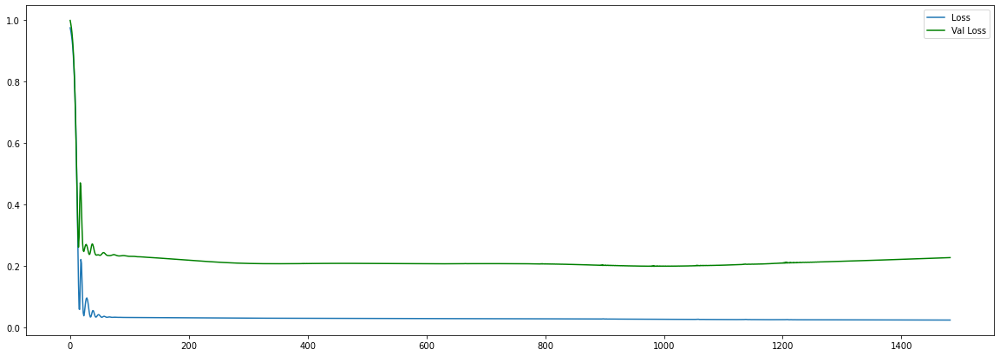

final loss: 0.023358769714832306
final val_loss: 0.2268027663230896
Get best hyperparameter for simple GRU


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


E:\envs\hand-on\lib\site-packages\sklearn\gaussian_process\kernels.py:409: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning)


INFO:tensorflow:Oracle triggered exit
Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 1, 5)]            0         
_________________________________________________________________
gru (GRU)                    (None, 16)                1104      
_________________________________________________________________
dense (Dense)                (None, 48)                816       
_________________________________________________________________
dropout (Dropout)            (None, 48)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 49        
Total params: 1,969
Trainable params: 1,969
Non-trainable params: 0
_________________________________________________________________
Start training simple GRU
Epoch 1/2500
1/1 [==============================] - ETA: 0s -


Epoch 00028: val_loss improved from 0.28101 to 0.26892, saving model to VIC_1D_GRU.hdf5
Epoch 29/2500
1/1 [==============================] - ETA: 0s - loss: 0.1179 - mae: 0.250 - 0s 19ms/step - loss: 0.1179 - mae: 0.2509 - val_loss: 0.2586 - val_mae: 0.3522

Epoch 00029: val_loss improved from 0.26892 to 0.25864, saving model to VIC_1D_GRU.hdf5
Epoch 30/2500
1/1 [==============================] - ETA: 0s - loss: 0.1044 - mae: 0.232 - 0s 20ms/step - loss: 0.1044 - mae: 0.2328 - val_loss: 0.2501 - val_mae: 0.3449

Epoch 00030: val_loss improved from 0.25864 to 0.25011, saving model to VIC_1D_GRU.hdf5
Epoch 31/2500
1/1 [==============================] - ETA: 0s - loss: 0.0931 - mae: 0.225 - 0s 20ms/step - loss: 0.0931 - mae: 0.2252 - val_loss: 0.2432 - val_mae: 0.3389

Epoch 00031: val_loss improved from 0.25011 to 0.24325, saving model to VIC_1D_GRU.hdf5
Epoch 32/2500
1/1 [==============================] - ETA: 0s - loss: 0.0868 - mae: 0.208 - 0s 20ms/step - loss: 0.0868 - mae: 0.2085 -

1/1 [==============================] - ETA: 0s - loss: 0.0479 - mae: 0.162 - 0s 20ms/step - loss: 0.0479 - mae: 0.1625 - val_loss: 0.2298 - val_mae: 0.3079

Epoch 00064: val_loss improved from 0.23002 to 0.22980, saving model to VIC_1D_GRU.hdf5
Epoch 65/2500
1/1 [==============================] - ETA: 0s - loss: 0.0544 - mae: 0.169 - 0s 20ms/step - loss: 0.0544 - mae: 0.1691 - val_loss: 0.2291 - val_mae: 0.3076

Epoch 00065: val_loss improved from 0.22980 to 0.22912, saving model to VIC_1D_GRU.hdf5
Epoch 66/2500
1/1 [==============================] - ETA: 0s - loss: 0.0507 - mae: 0.164 - 0s 21ms/step - loss: 0.0507 - mae: 0.1646 - val_loss: 0.2285 - val_mae: 0.3074

Epoch 00066: val_loss improved from 0.22912 to 0.22850, saving model to VIC_1D_GRU.hdf5
Epoch 67/2500
1/1 [==============================] - ETA: 0s - loss: 0.0530 - mae: 0.164 - 0s 20ms/step - loss: 0.0530 - mae: 0.1640 - val_loss: 0.2280 - val_mae: 0.3072

Epoch 00067: val_loss improved from 0.22850 to 0.22798, saving mod


Epoch 00098: val_loss did not improve from 0.22578
Epoch 99/2500
1/1 [==============================] - ETA: 0s - loss: 0.0524 - mae: 0.166 - 0s 19ms/step - loss: 0.0524 - mae: 0.1664 - val_loss: 0.2274 - val_mae: 0.3066

Epoch 00099: val_loss did not improve from 0.22578
Epoch 100/2500
1/1 [==============================] - ETA: 0s - loss: 0.0456 - mae: 0.156 - 0s 21ms/step - loss: 0.0456 - mae: 0.1569 - val_loss: 0.2274 - val_mae: 0.3063

Epoch 00100: val_loss did not improve from 0.22578
Epoch 101/2500
1/1 [==============================] - ETA: 0s - loss: 0.0466 - mae: 0.151 - 0s 20ms/step - loss: 0.0466 - mae: 0.1513 - val_loss: 0.2273 - val_mae: 0.3062

Epoch 00101: val_loss did not improve from 0.22578
Epoch 102/2500
1/1 [==============================] - ETA: 0s - loss: 0.0469 - mae: 0.158 - 0s 20ms/step - loss: 0.0469 - mae: 0.1580 - val_loss: 0.2272 - val_mae: 0.3058

Epoch 00102: val_loss did not improve from 0.22578
Epoch 103/2500
1/1 [==============================] - ETA

Epoch 00133: val_loss improved from 0.22512 to 0.22511, saving model to VIC_1D_GRU.hdf5
Epoch 134/2500
1/1 [==============================] - ETA: 0s - loss: 0.0440 - mae: 0.153 - 0s 20ms/step - loss: 0.0440 - mae: 0.1533 - val_loss: 0.2251 - val_mae: 0.3029

Epoch 00134: val_loss improved from 0.22511 to 0.22510, saving model to VIC_1D_GRU.hdf5
Epoch 135/2500
1/1 [==============================] - ETA: 0s - loss: 0.0434 - mae: 0.149 - 0s 20ms/step - loss: 0.0434 - mae: 0.1492 - val_loss: 0.2251 - val_mae: 0.3028

Epoch 00135: val_loss improved from 0.22510 to 0.22510, saving model to VIC_1D_GRU.hdf5
Epoch 136/2500
1/1 [==============================] - ETA: 0s - loss: 0.0444 - mae: 0.157 - 0s 20ms/step - loss: 0.0444 - mae: 0.1572 - val_loss: 0.2251 - val_mae: 0.3026

Epoch 00136: val_loss improved from 0.22510 to 0.22506, saving model to VIC_1D_GRU.hdf5
Epoch 137/2500
1/1 [==============================] - ETA: 0s - loss: 0.0489 - mae: 0.154 - 0s 20ms/step - loss: 0.0489 - mae: 0.154


Epoch 00168: val_loss improved from 0.22425 to 0.22403, saving model to VIC_1D_GRU.hdf5
Epoch 169/2500
1/1 [==============================] - ETA: 0s - loss: 0.0483 - mae: 0.154 - 0s 20ms/step - loss: 0.0483 - mae: 0.1541 - val_loss: 0.2239 - val_mae: 0.3011

Epoch 00169: val_loss improved from 0.22403 to 0.22385, saving model to VIC_1D_GRU.hdf5
Epoch 170/2500
1/1 [==============================] - ETA: 0s - loss: 0.0456 - mae: 0.153 - 0s 20ms/step - loss: 0.0456 - mae: 0.1530 - val_loss: 0.2237 - val_mae: 0.3009

Epoch 00170: val_loss improved from 0.22385 to 0.22374, saving model to VIC_1D_GRU.hdf5
Epoch 171/2500
1/1 [==============================] - ETA: 0s - loss: 0.0490 - mae: 0.156 - 0s 19ms/step - loss: 0.0490 - mae: 0.1563 - val_loss: 0.2236 - val_mae: 0.3008

Epoch 00171: val_loss improved from 0.22374 to 0.22362, saving model to VIC_1D_GRU.hdf5
Epoch 172/2500
1/1 [==============================] - ETA: 0s - loss: 0.0505 - mae: 0.160 - 0s 20ms/step - loss: 0.0505 - mae: 0.16

1/1 [==============================] - ETA: 0s - loss: 0.0492 - mae: 0.156 - 0s 19ms/step - loss: 0.0492 - mae: 0.1561 - val_loss: 0.2227 - val_mae: 0.3010

Epoch 00203: val_loss did not improve from 0.22267
Epoch 204/2500
1/1 [==============================] - ETA: 0s - loss: 0.0457 - mae: 0.148 - 0s 20ms/step - loss: 0.0457 - mae: 0.1483 - val_loss: 0.2226 - val_mae: 0.3007

Epoch 00204: val_loss improved from 0.22267 to 0.22257, saving model to VIC_1D_GRU.hdf5
Epoch 205/2500
1/1 [==============================] - ETA: 0s - loss: 0.0434 - mae: 0.145 - 0s 20ms/step - loss: 0.0434 - mae: 0.1458 - val_loss: 0.2224 - val_mae: 0.3004

Epoch 00205: val_loss improved from 0.22257 to 0.22244, saving model to VIC_1D_GRU.hdf5
Epoch 206/2500
1/1 [==============================] - ETA: 0s - loss: 0.0401 - mae: 0.144 - 0s 21ms/step - loss: 0.0401 - mae: 0.1446 - val_loss: 0.2223 - val_mae: 0.3002

Epoch 00206: val_loss improved from 0.22244 to 0.22230, saving model to VIC_1D_GRU.hdf5
Epoch 207/25

1/1 [==============================] - ETA: 0s - loss: 0.0459 - mae: 0.154 - 0s 20ms/step - loss: 0.0459 - mae: 0.1545 - val_loss: 0.2217 - val_mae: 0.3012

Epoch 00238: val_loss improved from 0.22187 to 0.22171, saving model to VIC_1D_GRU.hdf5
Epoch 239/2500
1/1 [==============================] - ETA: 0s - loss: 0.0367 - mae: 0.138 - 0s 20ms/step - loss: 0.0367 - mae: 0.1388 - val_loss: 0.2216 - val_mae: 0.3008

Epoch 00239: val_loss improved from 0.22171 to 0.22157, saving model to VIC_1D_GRU.hdf5
Epoch 240/2500
1/1 [==============================] - ETA: 0s - loss: 0.0503 - mae: 0.154 - 0s 21ms/step - loss: 0.0503 - mae: 0.1543 - val_loss: 0.2214 - val_mae: 0.3005

Epoch 00240: val_loss improved from 0.22157 to 0.22143, saving model to VIC_1D_GRU.hdf5
Epoch 241/2500
1/1 [==============================] - ETA: 0s - loss: 0.0461 - mae: 0.149 - 0s 21ms/step - loss: 0.0461 - mae: 0.1493 - val_loss: 0.2213 - val_mae: 0.3001

Epoch 00241: val_loss improved from 0.22143 to 0.22131, saving 

Epoch 00271: val_loss improved from 0.21988 to 0.21979, saving model to VIC_1D_GRU.hdf5
Epoch 272/2500
1/1 [==============================] - ETA: 0s - loss: 0.0436 - mae: 0.148 - 0s 20ms/step - loss: 0.0436 - mae: 0.1488 - val_loss: 0.2197 - val_mae: 0.2993

Epoch 00272: val_loss improved from 0.21979 to 0.21972, saving model to VIC_1D_GRU.hdf5
Epoch 273/2500
1/1 [==============================] - ETA: 0s - loss: 0.0438 - mae: 0.146 - 0s 20ms/step - loss: 0.0438 - mae: 0.1462 - val_loss: 0.2197 - val_mae: 0.2993

Epoch 00273: val_loss improved from 0.21972 to 0.21969, saving model to VIC_1D_GRU.hdf5
Epoch 274/2500
1/1 [==============================] - ETA: 0s - loss: 0.0401 - mae: 0.145 - 0s 19ms/step - loss: 0.0401 - mae: 0.1455 - val_loss: 0.2197 - val_mae: 0.2994

Epoch 00274: val_loss improved from 0.21969 to 0.21966, saving model to VIC_1D_GRU.hdf5
Epoch 275/2500
1/1 [==============================] - ETA: 0s - loss: 0.0409 - mae: 0.142 - 0s 20ms/step - loss: 0.0409 - mae: 0.142

Epoch 00305: val_loss did not improve from 0.21916
Epoch 306/2500
1/1 [==============================] - ETA: 0s - loss: 0.0411 - mae: 0.141 - 0s 18ms/step - loss: 0.0411 - mae: 0.1413 - val_loss: 0.2193 - val_mae: 0.2991

Epoch 00306: val_loss did not improve from 0.21916
Epoch 307/2500
1/1 [==============================] - ETA: 0s - loss: 0.0422 - mae: 0.145 - 0s 18ms/step - loss: 0.0422 - mae: 0.1459 - val_loss: 0.2192 - val_mae: 0.2989

Epoch 00307: val_loss did not improve from 0.21916
Epoch 308/2500
1/1 [==============================] - ETA: 0s - loss: 0.0374 - mae: 0.138 - 0s 18ms/step - loss: 0.0374 - mae: 0.1389 - val_loss: 0.2191 - val_mae: 0.2987

Epoch 00308: val_loss improved from 0.21916 to 0.21911, saving model to VIC_1D_GRU.hdf5
Epoch 309/2500
1/1 [==============================] - ETA: 0s - loss: 0.0431 - mae: 0.148 - 0s 18ms/step - loss: 0.0431 - mae: 0.1480 - val_loss: 0.2190 - val_mae: 0.2987

Epoch 00309: val_loss improved from 0.21911 to 0.21902, saving model to


Epoch 00339: val_loss did not improve from 0.21792
Epoch 340/2500
1/1 [==============================] - ETA: 0s - loss: 0.0397 - mae: 0.140 - 0s 17ms/step - loss: 0.0397 - mae: 0.1401 - val_loss: 0.2181 - val_mae: 0.3001

Epoch 00340: val_loss did not improve from 0.21792
Epoch 341/2500
1/1 [==============================] - ETA: 0s - loss: 0.0455 - mae: 0.150 - 0s 17ms/step - loss: 0.0455 - mae: 0.1500 - val_loss: 0.2180 - val_mae: 0.2997

Epoch 00341: val_loss did not improve from 0.21792
Epoch 342/2500
1/1 [==============================] - ETA: 0s - loss: 0.0411 - mae: 0.143 - 0s 17ms/step - loss: 0.0411 - mae: 0.1435 - val_loss: 0.2179 - val_mae: 0.2994

Epoch 00342: val_loss improved from 0.21792 to 0.21785, saving model to VIC_1D_GRU.hdf5
Epoch 343/2500
1/1 [==============================] - ETA: 0s - loss: 0.0374 - mae: 0.137 - 0s 18ms/step - loss: 0.0374 - mae: 0.1377 - val_loss: 0.2177 - val_mae: 0.2989

Epoch 00343: val_loss improved from 0.21785 to 0.21769, saving model t

Epoch 374/2500
1/1 [==============================] - ETA: 0s - loss: 0.0391 - mae: 0.142 - 0s 18ms/step - loss: 0.0391 - mae: 0.1421 - val_loss: 0.2170 - val_mae: 0.2985

Epoch 00374: val_loss did not improve from 0.21694
Epoch 375/2500
1/1 [==============================] - ETA: 0s - loss: 0.0410 - mae: 0.140 - 0s 17ms/step - loss: 0.0410 - mae: 0.1408 - val_loss: 0.2171 - val_mae: 0.2987

Epoch 00375: val_loss did not improve from 0.21694
Epoch 376/2500
1/1 [==============================] - ETA: 0s - loss: 0.0388 - mae: 0.140 - 0s 18ms/step - loss: 0.0388 - mae: 0.1400 - val_loss: 0.2172 - val_mae: 0.2989

Epoch 00376: val_loss did not improve from 0.21694
Epoch 377/2500
1/1 [==============================] - ETA: 0s - loss: 0.0402 - mae: 0.140 - 0s 17ms/step - loss: 0.0402 - mae: 0.1403 - val_loss: 0.2173 - val_mae: 0.2991

Epoch 00377: val_loss did not improve from 0.21694
Epoch 378/2500
1/1 [==============================] - ETA: 0s - loss: 0.0420 - mae: 0.139 - 0s 17ms/step - l

1/1 [==============================] - ETA: 0s - loss: 0.0453 - mae: 0.147 - 0s 24ms/step - loss: 0.0453 - mae: 0.1475 - val_loss: 0.2163 - val_mae: 0.2988

Epoch 00408: val_loss did not improve from 0.21577
Epoch 409/2500
1/1 [==============================] - ETA: 0s - loss: 0.0445 - mae: 0.146 - 0s 22ms/step - loss: 0.0445 - mae: 0.1462 - val_loss: 0.2164 - val_mae: 0.2992

Epoch 00409: val_loss did not improve from 0.21577
Epoch 410/2500
1/1 [==============================] - ETA: 0s - loss: 0.0391 - mae: 0.136 - 0s 21ms/step - loss: 0.0391 - mae: 0.1361 - val_loss: 0.2165 - val_mae: 0.2996

Epoch 00410: val_loss did not improve from 0.21577
Epoch 411/2500
1/1 [==============================] - ETA: 0s - loss: 0.0422 - mae: 0.146 - 0s 21ms/step - loss: 0.0422 - mae: 0.1465 - val_loss: 0.2165 - val_mae: 0.2999

Epoch 00411: val_loss did not improve from 0.21577
Epoch 412/2500
1/1 [==============================] - ETA: 0s - loss: 0.0360 - mae: 0.134 - 0s 24ms/step - loss: 0.0360 - m


Epoch 00442: val_loss did not improve from 0.21527
Epoch 443/2500
1/1 [==============================] - ETA: 0s - loss: 0.0368 - mae: 0.135 - 0s 20ms/step - loss: 0.0368 - mae: 0.1357 - val_loss: 0.2154 - val_mae: 0.2991

Epoch 00443: val_loss did not improve from 0.21527
Epoch 444/2500
1/1 [==============================] - ETA: 0s - loss: 0.0365 - mae: 0.136 - 0s 20ms/step - loss: 0.0365 - mae: 0.1363 - val_loss: 0.2154 - val_mae: 0.2993

Epoch 00444: val_loss did not improve from 0.21527
Epoch 445/2500
1/1 [==============================] - ETA: 0s - loss: 0.0449 - mae: 0.148 - 0s 19ms/step - loss: 0.0449 - mae: 0.1487 - val_loss: 0.2155 - val_mae: 0.2994

Epoch 00445: val_loss did not improve from 0.21527
Epoch 446/2500
1/1 [==============================] - ETA: 0s - loss: 0.0421 - mae: 0.141 - 0s 19ms/step - loss: 0.0421 - mae: 0.1411 - val_loss: 0.2155 - val_mae: 0.2996

Epoch 00446: val_loss did not improve from 0.21527
Epoch 447/2500
1/1 [==============================] - ET

Epoch 478/2500
1/1 [==============================] - ETA: 0s - loss: 0.0383 - mae: 0.135 - 0s 20ms/step - loss: 0.0383 - mae: 0.1358 - val_loss: 0.2150 - val_mae: 0.2989

Epoch 00478: val_loss did not improve from 0.21451
Epoch 479/2500
1/1 [==============================] - ETA: 0s - loss: 0.0383 - mae: 0.138 - 0s 19ms/step - loss: 0.0383 - mae: 0.1386 - val_loss: 0.2151 - val_mae: 0.2992

Epoch 00479: val_loss did not improve from 0.21451
Epoch 480/2500
1/1 [==============================] - ETA: 0s - loss: 0.0418 - mae: 0.136 - 0s 20ms/step - loss: 0.0418 - mae: 0.1367 - val_loss: 0.2153 - val_mae: 0.2996

Epoch 00480: val_loss did not improve from 0.21451
Epoch 481/2500
1/1 [==============================] - ETA: 0s - loss: 0.0358 - mae: 0.136 - 0s 20ms/step - loss: 0.0358 - mae: 0.1369 - val_loss: 0.2155 - val_mae: 0.3000

Epoch 00481: val_loss did not improve from 0.21451
Epoch 482/2500
1/1 [==============================] - ETA: 0s - loss: 0.0377 - mae: 0.134 - 0s 20ms/step - l

1/1 [==============================] - ETA: 0s - loss: 0.0420 - mae: 0.141 - 0s 21ms/step - loss: 0.0420 - mae: 0.1417 - val_loss: 0.2150 - val_mae: 0.2999

Epoch 00513: val_loss did not improve from 0.21373
Epoch 514/2500
1/1 [==============================] - ETA: 0s - loss: 0.0384 - mae: 0.137 - 0s 19ms/step - loss: 0.0384 - mae: 0.1371 - val_loss: 0.2151 - val_mae: 0.3001

Epoch 00514: val_loss did not improve from 0.21373
Epoch 515/2500
1/1 [==============================] - ETA: 0s - loss: 0.0386 - mae: 0.139 - 0s 20ms/step - loss: 0.0386 - mae: 0.1397 - val_loss: 0.2153 - val_mae: 0.3005

Epoch 00515: val_loss did not improve from 0.21373
Epoch 516/2500
1/1 [==============================] - ETA: 0s - loss: 0.0384 - mae: 0.136 - 0s 19ms/step - loss: 0.0384 - mae: 0.1367 - val_loss: 0.2155 - val_mae: 0.3008

Epoch 00516: val_loss did not improve from 0.21373
Epoch 517/2500
1/1 [==============================] - ETA: 0s - loss: 0.0405 - mae: 0.142 - 0s 20ms/step - loss: 0.0405 - m

Epoch 00548: val_loss did not improve from 0.21333
Epoch 549/2500
1/1 [==============================] - ETA: 0s - loss: 0.0382 - mae: 0.137 - 0s 21ms/step - loss: 0.0382 - mae: 0.1378 - val_loss: 0.2140 - val_mae: 0.3004

Epoch 00549: val_loss did not improve from 0.21333
Epoch 550/2500
1/1 [==============================] - ETA: 0s - loss: 0.0383 - mae: 0.137 - 0s 20ms/step - loss: 0.0383 - mae: 0.1371 - val_loss: 0.2137 - val_mae: 0.2997

Epoch 00550: val_loss did not improve from 0.21333
Epoch 551/2500
1/1 [==============================] - ETA: 0s - loss: 0.0352 - mae: 0.131 - 0s 21ms/step - loss: 0.0352 - mae: 0.1316 - val_loss: 0.2134 - val_mae: 0.2991

Epoch 00551: val_loss did not improve from 0.21333
Epoch 552/2500
1/1 [==============================] - ETA: 0s - loss: 0.0399 - mae: 0.137 - 0s 21ms/step - loss: 0.0399 - mae: 0.1378 - val_loss: 0.2131 - val_mae: 0.2986

Epoch 00552: val_loss improved from 0.21333 to 0.21312, saving model to VIC_1D_GRU.hdf5
Epoch 553/2500
1/1 [

1/1 [==============================] - ETA: 0s - loss: 0.0359 - mae: 0.131 - 0s 21ms/step - loss: 0.0359 - mae: 0.1311 - val_loss: 0.2132 - val_mae: 0.2991

Epoch 00584: val_loss did not improve from 0.21238
Epoch 585/2500
1/1 [==============================] - ETA: 0s - loss: 0.0353 - mae: 0.126 - 0s 20ms/step - loss: 0.0353 - mae: 0.1267 - val_loss: 0.2132 - val_mae: 0.2991

Epoch 00585: val_loss did not improve from 0.21238
Epoch 586/2500
1/1 [==============================] - ETA: 0s - loss: 0.0430 - mae: 0.144 - 0s 20ms/step - loss: 0.0430 - mae: 0.1440 - val_loss: 0.2133 - val_mae: 0.2991

Epoch 00586: val_loss did not improve from 0.21238
Epoch 587/2500
1/1 [==============================] - ETA: 0s - loss: 0.0366 - mae: 0.134 - 0s 19ms/step - loss: 0.0366 - mae: 0.1343 - val_loss: 0.2133 - val_mae: 0.2992

Epoch 00587: val_loss did not improve from 0.21238
Epoch 588/2500
1/1 [==============================] - ETA: 0s - loss: 0.0319 - mae: 0.124 - 0s 21ms/step - loss: 0.0319 - m

Epoch 00620: val_loss did not improve from 0.21238
Epoch 621/2500
1/1 [==============================] - ETA: 0s - loss: 0.0351 - mae: 0.133 - 0s 20ms/step - loss: 0.0351 - mae: 0.1335 - val_loss: 0.2129 - val_mae: 0.2993

Epoch 00621: val_loss did not improve from 0.21238
Epoch 622/2500
1/1 [==============================] - ETA: 0s - loss: 0.0385 - mae: 0.135 - 0s 21ms/step - loss: 0.0385 - mae: 0.1352 - val_loss: 0.2129 - val_mae: 0.2994

Epoch 00622: val_loss did not improve from 0.21238
Epoch 623/2500
1/1 [==============================] - ETA: 0s - loss: 0.0355 - mae: 0.129 - 0s 20ms/step - loss: 0.0355 - mae: 0.1291 - val_loss: 0.2130 - val_mae: 0.2997

Epoch 00623: val_loss did not improve from 0.21238
Epoch 624/2500
1/1 [==============================] - ETA: 0s - loss: 0.0347 - mae: 0.129 - 0s 20ms/step - loss: 0.0347 - mae: 0.1294 - val_loss: 0.2131 - val_mae: 0.2997

Epoch 00624: val_loss did not improve from 0.21238
Epoch 625/2500
1/1 [==============================] - ETA


Epoch 00657: val_loss did not improve from 0.21238
Epoch 658/2500
1/1 [==============================] - ETA: 0s - loss: 0.0360 - mae: 0.132 - 0s 20ms/step - loss: 0.0360 - mae: 0.1321 - val_loss: 0.2130 - val_mae: 0.3004

Epoch 00658: val_loss did not improve from 0.21238
Epoch 659/2500
1/1 [==============================] - ETA: 0s - loss: 0.0375 - mae: 0.134 - 0s 20ms/step - loss: 0.0375 - mae: 0.1340 - val_loss: 0.2128 - val_mae: 0.3002

Epoch 00659: val_loss did not improve from 0.21238
Epoch 660/2500
1/1 [==============================] - ETA: 0s - loss: 0.0380 - mae: 0.132 - 0s 19ms/step - loss: 0.0380 - mae: 0.1329 - val_loss: 0.2127 - val_mae: 0.2998

Epoch 00660: val_loss did not improve from 0.21238
Epoch 661/2500
1/1 [==============================] - ETA: 0s - loss: 0.0373 - mae: 0.130 - 0s 20ms/step - loss: 0.0373 - mae: 0.1305 - val_loss: 0.2125 - val_mae: 0.2996

Epoch 00661: val_loss did not improve from 0.21238
Epoch 662/2500
1/1 [==============================] - ET


Epoch 00693: val_loss did not improve from 0.21225
Epoch 694/2500
1/1 [==============================] - ETA: 0s - loss: 0.0339 - mae: 0.127 - 0s 20ms/step - loss: 0.0339 - mae: 0.1278 - val_loss: 0.2125 - val_mae: 0.3001

Epoch 00694: val_loss did not improve from 0.21225
Epoch 695/2500
1/1 [==============================] - ETA: 0s - loss: 0.0335 - mae: 0.132 - 0s 20ms/step - loss: 0.0335 - mae: 0.1327 - val_loss: 0.2125 - val_mae: 0.3000

Epoch 00695: val_loss did not improve from 0.21225
Epoch 696/2500
1/1 [==============================] - ETA: 0s - loss: 0.0375 - mae: 0.129 - 0s 20ms/step - loss: 0.0375 - mae: 0.1293 - val_loss: 0.2124 - val_mae: 0.2999

Epoch 00696: val_loss did not improve from 0.21225
Epoch 697/2500
1/1 [==============================] - ETA: 0s - loss: 0.0392 - mae: 0.135 - 0s 20ms/step - loss: 0.0392 - mae: 0.1353 - val_loss: 0.2124 - val_mae: 0.2998

Epoch 00697: val_loss did not improve from 0.21225
Epoch 698/2500
1/1 [==============================] - ET

Epoch 00729: val_loss did not improve from 0.21193
Epoch 730/2500
1/1 [==============================] - ETA: 0s - loss: 0.0362 - mae: 0.132 - 0s 19ms/step - loss: 0.0362 - mae: 0.1328 - val_loss: 0.2126 - val_mae: 0.3003

Epoch 00730: val_loss did not improve from 0.21193
Epoch 731/2500
1/1 [==============================] - ETA: 0s - loss: 0.0375 - mae: 0.133 - 0s 20ms/step - loss: 0.0375 - mae: 0.1330 - val_loss: 0.2126 - val_mae: 0.3004

Epoch 00731: val_loss did not improve from 0.21193
Epoch 732/2500
1/1 [==============================] - ETA: 0s - loss: 0.0349 - mae: 0.130 - 0s 19ms/step - loss: 0.0349 - mae: 0.1302 - val_loss: 0.2127 - val_mae: 0.3005

Epoch 00732: val_loss did not improve from 0.21193
Epoch 733/2500
1/1 [==============================] - ETA: 0s - loss: 0.0401 - mae: 0.135 - 0s 20ms/step - loss: 0.0401 - mae: 0.1351 - val_loss: 0.2127 - val_mae: 0.3006

Epoch 00733: val_loss did not improve from 0.21193
Epoch 734/2500
1/1 [==============================] - ETA

Epoch 00765: val_loss did not improve from 0.21157
Epoch 766/2500
1/1 [==============================] - ETA: 0s - loss: 0.0361 - mae: 0.132 - 0s 20ms/step - loss: 0.0361 - mae: 0.1324 - val_loss: 0.2125 - val_mae: 0.3005

Epoch 00766: val_loss did not improve from 0.21157
Epoch 767/2500
1/1 [==============================] - ETA: 0s - loss: 0.0369 - mae: 0.132 - 0s 21ms/step - loss: 0.0369 - mae: 0.1322 - val_loss: 0.2128 - val_mae: 0.3007

Epoch 00767: val_loss did not improve from 0.21157
Epoch 768/2500
1/1 [==============================] - ETA: 0s - loss: 0.0363 - mae: 0.127 - 0s 19ms/step - loss: 0.0363 - mae: 0.1271 - val_loss: 0.2131 - val_mae: 0.3010

Epoch 00768: val_loss did not improve from 0.21157
Epoch 769/2500
1/1 [==============================] - ETA: 0s - loss: 0.0373 - mae: 0.129 - 0s 21ms/step - loss: 0.0373 - mae: 0.1292 - val_loss: 0.2133 - val_mae: 0.3012

Epoch 00769: val_loss did not improve from 0.21157
Epoch 770/2500
1/1 [==============================] - ETA


Epoch 00802: val_loss did not improve from 0.21157
Epoch 803/2500
1/1 [==============================] - ETA: 0s - loss: 0.0357 - mae: 0.129 - 0s 21ms/step - loss: 0.0357 - mae: 0.1293 - val_loss: 0.2119 - val_mae: 0.3005

Epoch 00803: val_loss did not improve from 0.21157
Epoch 804/2500
1/1 [==============================] - ETA: 0s - loss: 0.0349 - mae: 0.129 - 0s 20ms/step - loss: 0.0349 - mae: 0.1298 - val_loss: 0.2119 - val_mae: 0.3005

Epoch 00804: val_loss did not improve from 0.21157
Epoch 805/2500
1/1 [==============================] - ETA: 0s - loss: 0.0357 - mae: 0.132 - 0s 21ms/step - loss: 0.0357 - mae: 0.1320 - val_loss: 0.2120 - val_mae: 0.3005

Epoch 00805: val_loss did not improve from 0.21157
Epoch 806/2500
1/1 [==============================] - ETA: 0s - loss: 0.0359 - mae: 0.129 - 0s 20ms/step - loss: 0.0359 - mae: 0.1292 - val_loss: 0.2121 - val_mae: 0.3005

Epoch 00806: val_loss did not improve from 0.21157
Epoch 807/2500
1/1 [==============================] - ET

1/1 [==============================] - ETA: 0s - loss: 0.0377 - mae: 0.132 - 0s 20ms/step - loss: 0.0377 - mae: 0.1326 - val_loss: 0.2130 - val_mae: 0.3015

Epoch 00839: val_loss did not improve from 0.21146
Epoch 840/2500
1/1 [==============================] - ETA: 0s - loss: 0.0356 - mae: 0.131 - 0s 20ms/step - loss: 0.0356 - mae: 0.1316 - val_loss: 0.2129 - val_mae: 0.3013

Epoch 00840: val_loss did not improve from 0.21146
Epoch 841/2500
1/1 [==============================] - ETA: 0s - loss: 0.0363 - mae: 0.129 - 0s 20ms/step - loss: 0.0363 - mae: 0.1296 - val_loss: 0.2127 - val_mae: 0.3011

Epoch 00841: val_loss did not improve from 0.21146
Epoch 842/2500
1/1 [==============================] - ETA: 0s - loss: 0.0338 - mae: 0.127 - 0s 20ms/step - loss: 0.0338 - mae: 0.1279 - val_loss: 0.2125 - val_mae: 0.3009

Epoch 00842: val_loss did not improve from 0.21146
Epoch 843/2500
1/1 [==============================] - ETA: 0s - loss: 0.0352 - mae: 0.130 - 0s 20ms/step - loss: 0.0352 - m

1/1 [==============================] - ETA: 0s - loss: 0.0353 - mae: 0.128 - 0s 20ms/step - loss: 0.0353 - mae: 0.1281 - val_loss: 0.2127 - val_mae: 0.3015

Epoch 00875: val_loss did not improve from 0.21126
Epoch 876/2500
1/1 [==============================] - ETA: 0s - loss: 0.0318 - mae: 0.122 - 0s 20ms/step - loss: 0.0318 - mae: 0.1228 - val_loss: 0.2128 - val_mae: 0.3017

Epoch 00876: val_loss did not improve from 0.21126
Epoch 877/2500
1/1 [==============================] - ETA: 0s - loss: 0.0367 - mae: 0.131 - 0s 20ms/step - loss: 0.0367 - mae: 0.1319 - val_loss: 0.2129 - val_mae: 0.3018

Epoch 00877: val_loss did not improve from 0.21126
Epoch 878/2500
1/1 [==============================] - ETA: 0s - loss: 0.0372 - mae: 0.132 - 0s 20ms/step - loss: 0.0372 - mae: 0.1328 - val_loss: 0.2129 - val_mae: 0.3019

Epoch 00878: val_loss did not improve from 0.21126
Epoch 879/2500
1/1 [==============================] - ETA: 0s - loss: 0.0399 - mae: 0.136 - 0s 20ms/step - loss: 0.0399 - m


Epoch 00911: val_loss did not improve from 0.21118
Epoch 912/2500
1/1 [==============================] - ETA: 0s - loss: 0.0378 - mae: 0.129 - 0s 21ms/step - loss: 0.0378 - mae: 0.1291 - val_loss: 0.2115 - val_mae: 0.3002

Epoch 00912: val_loss did not improve from 0.21118
Epoch 913/2500
1/1 [==============================] - ETA: 0s - loss: 0.0329 - mae: 0.127 - 0s 20ms/step - loss: 0.0329 - mae: 0.1272 - val_loss: 0.2118 - val_mae: 0.3005

Epoch 00913: val_loss did not improve from 0.21118
Epoch 914/2500
1/1 [==============================] - ETA: 0s - loss: 0.0348 - mae: 0.125 - 0s 20ms/step - loss: 0.0348 - mae: 0.1259 - val_loss: 0.2120 - val_mae: 0.3008

Epoch 00914: val_loss did not improve from 0.21118
Epoch 915/2500
1/1 [==============================] - ETA: 0s - loss: 0.0349 - mae: 0.127 - 0s 20ms/step - loss: 0.0349 - mae: 0.1270 - val_loss: 0.2124 - val_mae: 0.3013

Epoch 00915: val_loss did not improve from 0.21118
Epoch 916/2500
1/1 [==============================] - ET


Epoch 00948: val_loss did not improve from 0.21118
Epoch 949/2500
1/1 [==============================] - ETA: 0s - loss: 0.0361 - mae: 0.131 - 0s 19ms/step - loss: 0.0361 - mae: 0.1317 - val_loss: 0.2123 - val_mae: 0.3010

Epoch 00949: val_loss did not improve from 0.21118
Epoch 950/2500
1/1 [==============================] - ETA: 0s - loss: 0.0342 - mae: 0.130 - 0s 21ms/step - loss: 0.0342 - mae: 0.1300 - val_loss: 0.2122 - val_mae: 0.3009

Epoch 00950: val_loss did not improve from 0.21118
Epoch 951/2500
1/1 [==============================] - ETA: 0s - loss: 0.0334 - mae: 0.124 - 0s 20ms/step - loss: 0.0334 - mae: 0.1249 - val_loss: 0.2121 - val_mae: 0.3008

Epoch 00951: val_loss did not improve from 0.21118
Epoch 952/2500
1/1 [==============================] - ETA: 0s - loss: 0.0360 - mae: 0.128 - 0s 20ms/step - loss: 0.0360 - mae: 0.1288 - val_loss: 0.2120 - val_mae: 0.3007

Epoch 00952: val_loss did not improve from 0.21118
Epoch 953/2500
1/1 [==============================] - ET


Epoch 00985: val_loss did not improve from 0.21118
Epoch 986/2500
1/1 [==============================] - ETA: 0s - loss: 0.0347 - mae: 0.128 - 0s 20ms/step - loss: 0.0347 - mae: 0.1286 - val_loss: 0.2124 - val_mae: 0.3012

Epoch 00986: val_loss did not improve from 0.21118
Epoch 987/2500
1/1 [==============================] - ETA: 0s - loss: 0.0378 - mae: 0.131 - 0s 20ms/step - loss: 0.0378 - mae: 0.1314 - val_loss: 0.2124 - val_mae: 0.3012

Epoch 00987: val_loss did not improve from 0.21118
Epoch 988/2500
1/1 [==============================] - ETA: 0s - loss: 0.0315 - mae: 0.127 - 0s 20ms/step - loss: 0.0315 - mae: 0.1271 - val_loss: 0.2124 - val_mae: 0.3012

Epoch 00988: val_loss did not improve from 0.21118
Epoch 989/2500
1/1 [==============================] - ETA: 0s - loss: 0.0369 - mae: 0.129 - 0s 20ms/step - loss: 0.0369 - mae: 0.1298 - val_loss: 0.2125 - val_mae: 0.3013

Epoch 00989: val_loss did not improve from 0.21118
Epoch 990/2500
1/1 [==============================] - ET

Epoch 01021: val_loss did not improve from 0.21083
Epoch 1022/2500
1/1 [==============================] - ETA: 0s - loss: 0.0358 - mae: 0.128 - 0s 20ms/step - loss: 0.0358 - mae: 0.1288 - val_loss: 0.2118 - val_mae: 0.3005

Epoch 01022: val_loss did not improve from 0.21083
Epoch 1023/2500
1/1 [==============================] - ETA: 0s - loss: 0.0343 - mae: 0.127 - 0s 20ms/step - loss: 0.0343 - mae: 0.1277 - val_loss: 0.2122 - val_mae: 0.3008

Epoch 01023: val_loss did not improve from 0.21083
Epoch 1024/2500
1/1 [==============================] - ETA: 0s - loss: 0.0370 - mae: 0.130 - 0s 20ms/step - loss: 0.0370 - mae: 0.1303 - val_loss: 0.2126 - val_mae: 0.3012

Epoch 01024: val_loss did not improve from 0.21083
Epoch 1025/2500
1/1 [==============================] - ETA: 0s - loss: 0.0348 - mae: 0.128 - 0s 21ms/step - loss: 0.0348 - mae: 0.1283 - val_loss: 0.2128 - val_mae: 0.3015

Epoch 01025: val_loss did not improve from 0.21083
Epoch 1026/2500
1/1 [==============================] 

1/1 [==============================] - ETA: 0s - loss: 0.0334 - mae: 0.122 - 0s 20ms/step - loss: 0.0334 - mae: 0.1228 - val_loss: 0.2123 - val_mae: 0.3010

Epoch 01058: val_loss did not improve from 0.21083
Epoch 1059/2500
1/1 [==============================] - ETA: 0s - loss: 0.0323 - mae: 0.122 - 0s 20ms/step - loss: 0.0323 - mae: 0.1224 - val_loss: 0.2122 - val_mae: 0.3007

Epoch 01059: val_loss did not improve from 0.21083
Epoch 1060/2500
1/1 [==============================] - ETA: 0s - loss: 0.0342 - mae: 0.126 - 0s 21ms/step - loss: 0.0342 - mae: 0.1268 - val_loss: 0.2122 - val_mae: 0.3007

Epoch 01060: val_loss did not improve from 0.21083
Epoch 1061/2500
1/1 [==============================] - ETA: 0s - loss: 0.0351 - mae: 0.126 - 0s 20ms/step - loss: 0.0351 - mae: 0.1264 - val_loss: 0.2121 - val_mae: 0.3006

Epoch 01061: val_loss did not improve from 0.21083
Epoch 1062/2500
1/1 [==============================] - ETA: 0s - loss: 0.0343 - mae: 0.126 - 0s 21ms/step - loss: 0.0343


Epoch 01094: val_loss did not improve from 0.21083
Epoch 1095/2500
1/1 [==============================] - ETA: 0s - loss: 0.0355 - mae: 0.130 - 0s 19ms/step - loss: 0.0355 - mae: 0.1300 - val_loss: 0.2128 - val_mae: 0.3013

Epoch 01095: val_loss did not improve from 0.21083
Epoch 1096/2500
1/1 [==============================] - ETA: 0s - loss: 0.0320 - mae: 0.120 - 0s 20ms/step - loss: 0.0320 - mae: 0.1209 - val_loss: 0.2131 - val_mae: 0.3017

Epoch 01096: val_loss did not improve from 0.21083
Epoch 1097/2500
1/1 [==============================] - ETA: 0s - loss: 0.0351 - mae: 0.130 - 0s 19ms/step - loss: 0.0351 - mae: 0.1300 - val_loss: 0.2132 - val_mae: 0.3019

Epoch 01097: val_loss did not improve from 0.21083
Epoch 1098/2500
1/1 [==============================] - ETA: 0s - loss: 0.0342 - mae: 0.125 - 0s 20ms/step - loss: 0.0342 - mae: 0.1251 - val_loss: 0.2133 - val_mae: 0.3020

Epoch 01098: val_loss did not improve from 0.21083
Epoch 1099/2500
1/1 [==============================]

1/1 [==============================] - ETA: 0s - loss: 0.0381 - mae: 0.130 - 0s 20ms/step - loss: 0.0381 - mae: 0.1300 - val_loss: 0.2122 - val_mae: 0.3007

Epoch 01131: val_loss did not improve from 0.21083
Epoch 1132/2500
1/1 [==============================] - ETA: 0s - loss: 0.0376 - mae: 0.128 - 0s 21ms/step - loss: 0.0376 - mae: 0.1284 - val_loss: 0.2122 - val_mae: 0.3007

Epoch 01132: val_loss did not improve from 0.21083
Epoch 1133/2500
1/1 [==============================] - ETA: 0s - loss: 0.0333 - mae: 0.122 - 0s 21ms/step - loss: 0.0333 - mae: 0.1226 - val_loss: 0.2124 - val_mae: 0.3009

Epoch 01133: val_loss did not improve from 0.21083
Epoch 1134/2500
1/1 [==============================] - ETA: 0s - loss: 0.0356 - mae: 0.127 - 0s 21ms/step - loss: 0.0356 - mae: 0.1271 - val_loss: 0.2126 - val_mae: 0.3011

Epoch 01134: val_loss did not improve from 0.21083
Epoch 1135/2500
1/1 [==============================] - ETA: 0s - loss: 0.0357 - mae: 0.129 - 0s 19ms/step - loss: 0.0357


Epoch 01167: val_loss did not improve from 0.21083
Epoch 1168/2500
1/1 [==============================] - ETA: 0s - loss: 0.0328 - mae: 0.123 - 0s 21ms/step - loss: 0.0328 - mae: 0.1231 - val_loss: 0.2118 - val_mae: 0.3005

Epoch 01168: val_loss did not improve from 0.21083
Epoch 1169/2500
1/1 [==============================] - ETA: 0s - loss: 0.0380 - mae: 0.129 - 0s 21ms/step - loss: 0.0380 - mae: 0.1293 - val_loss: 0.2117 - val_mae: 0.3004

Epoch 01169: val_loss did not improve from 0.21083
Epoch 1170/2500
1/1 [==============================] - ETA: 0s - loss: 0.0363 - mae: 0.128 - 0s 20ms/step - loss: 0.0363 - mae: 0.1282 - val_loss: 0.2116 - val_mae: 0.3002

Epoch 01170: val_loss did not improve from 0.21083
Epoch 1171/2500
1/1 [==============================] - ETA: 0s - loss: 0.0328 - mae: 0.123 - 0s 18ms/step - loss: 0.0328 - mae: 0.1234 - val_loss: 0.2116 - val_mae: 0.3002

Epoch 01171: val_loss did not improve from 0.21083
Epoch 1172/2500
1/1 [==============================]

1/1 [==============================] - ETA: 0s - loss: 0.0343 - mae: 0.127 - 0s 21ms/step - loss: 0.0343 - mae: 0.1271 - val_loss: 0.2127 - val_mae: 0.3013

Epoch 01204: val_loss did not improve from 0.21083
Epoch 1205/2500
1/1 [==============================] - ETA: 0s - loss: 0.0351 - mae: 0.122 - 0s 22ms/step - loss: 0.0351 - mae: 0.1228 - val_loss: 0.2130 - val_mae: 0.3016

Epoch 01205: val_loss did not improve from 0.21083
Epoch 1206/2500
1/1 [==============================] - ETA: 0s - loss: 0.0336 - mae: 0.128 - 0s 22ms/step - loss: 0.0336 - mae: 0.1285 - val_loss: 0.2132 - val_mae: 0.3019

Epoch 01206: val_loss did not improve from 0.21083
Epoch 1207/2500
1/1 [==============================] - ETA: 0s - loss: 0.0352 - mae: 0.131 - 0s 20ms/step - loss: 0.0352 - mae: 0.1311 - val_loss: 0.2133 - val_mae: 0.3020

Epoch 01207: val_loss did not improve from 0.21083
Epoch 1208/2500
1/1 [==============================] - ETA: 0s - loss: 0.0366 - mae: 0.131 - 0s 19ms/step - loss: 0.0366


Epoch 01240: val_loss did not improve from 0.21083
Epoch 1241/2500
1/1 [==============================] - ETA: 0s - loss: 0.0356 - mae: 0.127 - 0s 21ms/step - loss: 0.0356 - mae: 0.1279 - val_loss: 0.2124 - val_mae: 0.3010

Epoch 01241: val_loss did not improve from 0.21083
Epoch 1242/2500
1/1 [==============================] - ETA: 0s - loss: 0.0379 - mae: 0.130 - 0s 20ms/step - loss: 0.0379 - mae: 0.1302 - val_loss: 0.2127 - val_mae: 0.3012

Epoch 01242: val_loss did not improve from 0.21083
Epoch 1243/2500
1/1 [==============================] - ETA: 0s - loss: 0.0331 - mae: 0.125 - 0s 20ms/step - loss: 0.0331 - mae: 0.1251 - val_loss: 0.2130 - val_mae: 0.3015

Epoch 01243: val_loss did not improve from 0.21083
Epoch 1244/2500
1/1 [==============================] - ETA: 0s - loss: 0.0335 - mae: 0.130 - 0s 20ms/step - loss: 0.0335 - mae: 0.1303 - val_loss: 0.2131 - val_mae: 0.3017

Epoch 01244: val_loss did not improve from 0.21083
Epoch 1245/2500
1/1 [==============================]

Epoch 01276: val_loss did not improve from 0.21083
Epoch 1277/2500
1/1 [==============================] - ETA: 0s - loss: 0.0360 - mae: 0.127 - 0s 20ms/step - loss: 0.0360 - mae: 0.1276 - val_loss: 0.2121 - val_mae: 0.3007

Epoch 01277: val_loss did not improve from 0.21083
Epoch 1278/2500
1/1 [==============================] - ETA: 0s - loss: 0.0326 - mae: 0.125 - 0s 20ms/step - loss: 0.0326 - mae: 0.1253 - val_loss: 0.2120 - val_mae: 0.3007

Epoch 01278: val_loss did not improve from 0.21083
Epoch 1279/2500
1/1 [==============================] - ETA: 0s - loss: 0.0354 - mae: 0.127 - 0s 19ms/step - loss: 0.0354 - mae: 0.1275 - val_loss: 0.2119 - val_mae: 0.3006

Epoch 01279: val_loss did not improve from 0.21083
Epoch 1280/2500
1/1 [==============================] - ETA: 0s - loss: 0.0335 - mae: 0.123 - 0s 20ms/step - loss: 0.0335 - mae: 0.1236 - val_loss: 0.2119 - val_mae: 0.3006

Epoch 01280: val_loss did not improve from 0.21083
Epoch 1281/2500
1/1 [==============================] 

1/1 [==============================] - ETA: 0s - loss: 0.0352 - mae: 0.130 - 0s 20ms/step - loss: 0.0352 - mae: 0.1300 - val_loss: 0.2118 - val_mae: 0.3005

Epoch 01313: val_loss did not improve from 0.21083
Epoch 1314/2500
1/1 [==============================] - ETA: 0s - loss: 0.0347 - mae: 0.124 - 0s 21ms/step - loss: 0.0347 - mae: 0.1242 - val_loss: 0.2118 - val_mae: 0.3005

Epoch 01314: val_loss did not improve from 0.21083
Epoch 1315/2500
1/1 [==============================] - ETA: 0s - loss: 0.0334 - mae: 0.123 - 0s 21ms/step - loss: 0.0334 - mae: 0.1233 - val_loss: 0.2118 - val_mae: 0.3005

Epoch 01315: val_loss did not improve from 0.21083
Epoch 1316/2500
1/1 [==============================] - ETA: 0s - loss: 0.0353 - mae: 0.125 - 0s 20ms/step - loss: 0.0353 - mae: 0.1257 - val_loss: 0.2118 - val_mae: 0.3005

Epoch 01316: val_loss did not improve from 0.21083
Epoch 1317/2500
1/1 [==============================] - ETA: 0s - loss: 0.0353 - mae: 0.126 - 0s 21ms/step - loss: 0.0353


Epoch 01349: val_loss did not improve from 0.21083
Epoch 1350/2500
1/1 [==============================] - ETA: 0s - loss: 0.0342 - mae: 0.123 - 0s 21ms/step - loss: 0.0342 - mae: 0.1231 - val_loss: 0.2126 - val_mae: 0.3012

Epoch 01350: val_loss did not improve from 0.21083
Epoch 1351/2500
1/1 [==============================] - ETA: 0s - loss: 0.0335 - mae: 0.122 - 0s 20ms/step - loss: 0.0335 - mae: 0.1223 - val_loss: 0.2127 - val_mae: 0.3013

Epoch 01351: val_loss did not improve from 0.21083
Epoch 1352/2500
1/1 [==============================] - ETA: 0s - loss: 0.0354 - mae: 0.126 - 0s 19ms/step - loss: 0.0354 - mae: 0.1262 - val_loss: 0.2128 - val_mae: 0.3013

Epoch 01352: val_loss did not improve from 0.21083
Epoch 1353/2500
1/1 [==============================] - ETA: 0s - loss: 0.0354 - mae: 0.126 - 0s 20ms/step - loss: 0.0354 - mae: 0.1266 - val_loss: 0.2128 - val_mae: 0.3013

Epoch 01353: val_loss did not improve from 0.21083
Epoch 1354/2500
1/1 [==============================]

1/1 [==============================] - ETA: 0s - loss: 0.0388 - mae: 0.132 - 0s 19ms/step - loss: 0.0388 - mae: 0.1328 - val_loss: 0.2121 - val_mae: 0.3006

Epoch 01386: val_loss did not improve from 0.21083
Epoch 1387/2500
1/1 [==============================] - ETA: 0s - loss: 0.0363 - mae: 0.132 - 0s 20ms/step - loss: 0.0363 - mae: 0.1323 - val_loss: 0.2119 - val_mae: 0.3005

Epoch 01387: val_loss did not improve from 0.21083
Epoch 1388/2500
1/1 [==============================] - ETA: 0s - loss: 0.0337 - mae: 0.126 - 0s 21ms/step - loss: 0.0337 - mae: 0.1261 - val_loss: 0.2118 - val_mae: 0.3003

Epoch 01388: val_loss did not improve from 0.21083
Epoch 1389/2500
1/1 [==============================] - ETA: 0s - loss: 0.0351 - mae: 0.128 - 0s 20ms/step - loss: 0.0351 - mae: 0.1282 - val_loss: 0.2117 - val_mae: 0.3003

Epoch 01389: val_loss did not improve from 0.21083
Epoch 1390/2500
1/1 [==============================] - ETA: 0s - loss: 0.0347 - mae: 0.123 - 0s 20ms/step - loss: 0.0347


Epoch 01422: val_loss did not improve from 0.21083
Epoch 1423/2500
1/1 [==============================] - ETA: 0s - loss: 0.0359 - mae: 0.123 - 0s 21ms/step - loss: 0.0359 - mae: 0.1238 - val_loss: 0.2125 - val_mae: 0.3010

Epoch 01423: val_loss did not improve from 0.21083
Epoch 1424/2500
1/1 [==============================] - ETA: 0s - loss: 0.0344 - mae: 0.127 - 0s 19ms/step - loss: 0.0344 - mae: 0.1273 - val_loss: 0.2126 - val_mae: 0.3012

Epoch 01424: val_loss did not improve from 0.21083
Epoch 1425/2500
1/1 [==============================] - ETA: 0s - loss: 0.0311 - mae: 0.122 - 0s 20ms/step - loss: 0.0311 - mae: 0.1226 - val_loss: 0.2127 - val_mae: 0.3013

Epoch 01425: val_loss did not improve from 0.21083
Epoch 1426/2500
1/1 [==============================] - ETA: 0s - loss: 0.0333 - mae: 0.123 - 0s 19ms/step - loss: 0.0333 - mae: 0.1238 - val_loss: 0.2128 - val_mae: 0.3013

Epoch 01426: val_loss did not improve from 0.21083
Epoch 1427/2500
1/1 [==============================]

1/1 [==============================] - ETA: 0s - loss: 0.0347 - mae: 0.128 - 0s 19ms/step - loss: 0.0347 - mae: 0.1285 - val_loss: 0.2117 - val_mae: 0.3005

Epoch 01459: val_loss did not improve from 0.21083
Epoch 1460/2500
1/1 [==============================] - ETA: 0s - loss: 0.0332 - mae: 0.124 - 0s 21ms/step - loss: 0.0332 - mae: 0.1246 - val_loss: 0.2116 - val_mae: 0.3005

Epoch 01460: val_loss did not improve from 0.21083
Epoch 1461/2500
1/1 [==============================] - ETA: 0s - loss: 0.0380 - mae: 0.131 - 0s 20ms/step - loss: 0.0380 - mae: 0.1319 - val_loss: 0.2116 - val_mae: 0.3006

Epoch 01461: val_loss did not improve from 0.21083
Epoch 1462/2500
1/1 [==============================] - ETA: 0s - loss: 0.0325 - mae: 0.121 - 0s 20ms/step - loss: 0.0325 - mae: 0.1214 - val_loss: 0.2117 - val_mae: 0.3007

Epoch 01462: val_loss did not improve from 0.21083
Epoch 1463/2500
1/1 [==============================] - ETA: 0s - loss: 0.0353 - mae: 0.124 - 0s 21ms/step - loss: 0.0353


Epoch 01495: val_loss did not improve from 0.21083
Epoch 1496/2500
1/1 [==============================] - ETA: 0s - loss: 0.0313 - mae: 0.123 - 0s 19ms/step - loss: 0.0313 - mae: 0.1238 - val_loss: 0.2128 - val_mae: 0.3013

Epoch 01496: val_loss did not improve from 0.21083
Epoch 1497/2500
1/1 [==============================] - ETA: 0s - loss: 0.0337 - mae: 0.122 - 0s 21ms/step - loss: 0.0337 - mae: 0.1225 - val_loss: 0.2126 - val_mae: 0.3013

Epoch 01497: val_loss did not improve from 0.21083
Epoch 1498/2500
1/1 [==============================] - ETA: 0s - loss: 0.0343 - mae: 0.123 - 0s 20ms/step - loss: 0.0343 - mae: 0.1239 - val_loss: 0.2125 - val_mae: 0.3011

Epoch 01498: val_loss did not improve from 0.21083
Epoch 1499/2500
1/1 [==============================] - ETA: 0s - loss: 0.0338 - mae: 0.128 - 0s 20ms/step - loss: 0.0338 - mae: 0.1285 - val_loss: 0.2123 - val_mae: 0.3010

Epoch 01499: val_loss did not improve from 0.21083
Epoch 1500/2500
1/1 [==============================]

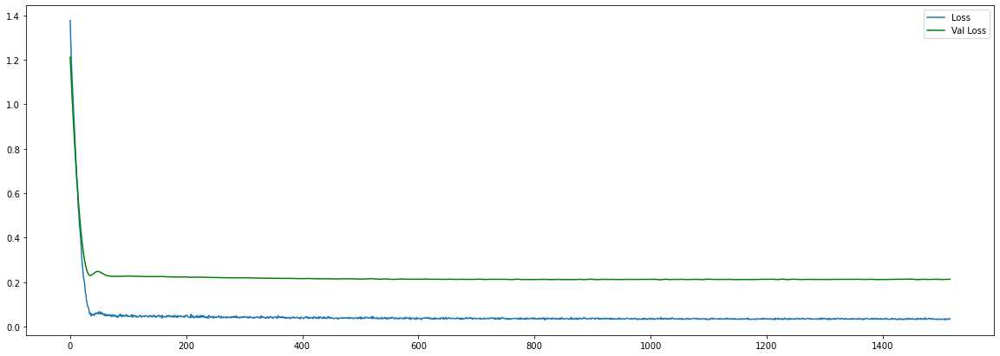

final loss: 0.034552957862615585
final val_loss: 0.21293580532073975


In [ ]:
build_and_train_all_model(VIC_data_processor, VIC_predictor)

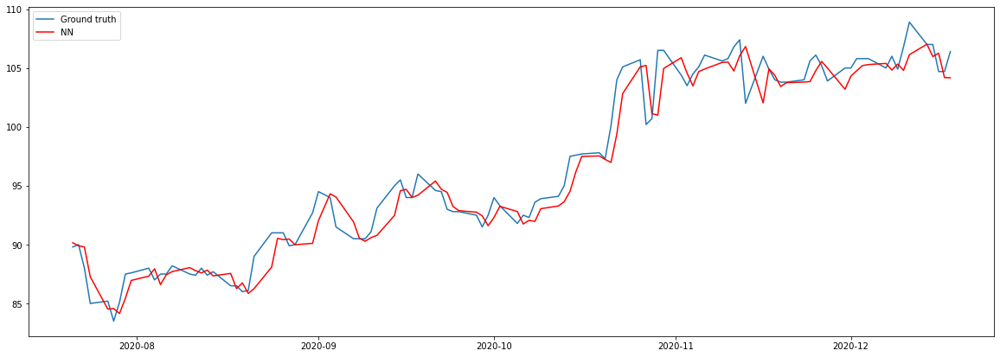

Simple NN
MSE:  2.604297637939453
MAE:  1.1535977


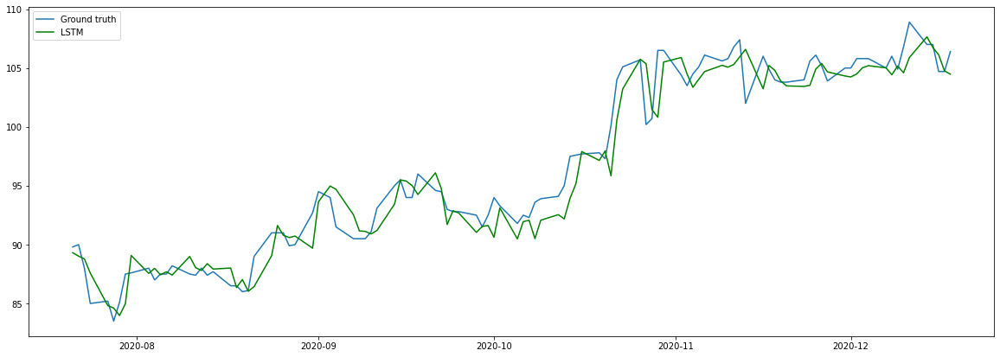

Simple LSTM
MSE:  2.8765835762023926
MAE:  1.2570928


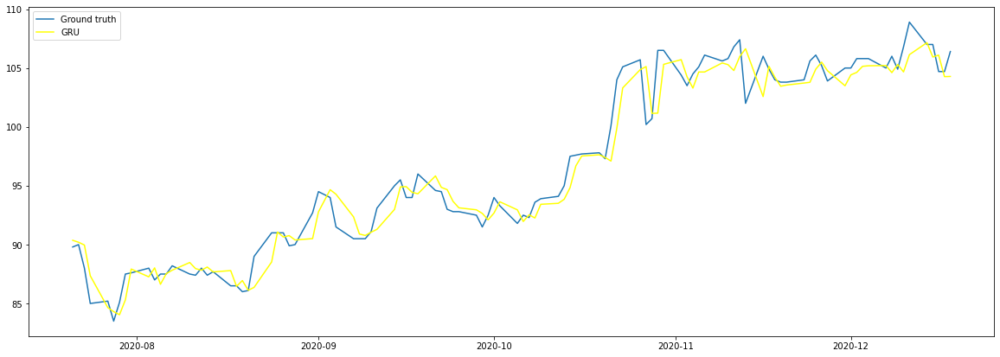

Simple GRU
MSE:  2.348630666732788
MAE:  1.1175046


In [ ]:
evaluate_all_model(VIC_data_processor, VIC_predictor)